# TF reporter activity analysis
### Aim
~36,000 reporters for 86 TFs were transfected into 9 different cell types & tested in 97 different perturbation conditions. In this script I will analyze TF reporter activities in detail and review how individual reporters respond to TF concentration variations.

---
Load libraries

In [2]:
# Load libraries:
library(RColorBrewer)
library(ggplot2)
library(dplyr)
library(maditr)
library(tibble)
library(pheatmap)
library(ggpubr)
library(visNetwork)
library(ggbeeswarm)
library(ggforce)
library(viridis)
library(plyr)
library(igraph)
library(ggraph)
library(cowplot)
library(gridExtra)
library(pROC)
library(tidyr)
library(stringr)
library(randomForest)
library(ggrastr)
library(readr)
library(ggbiplot)
library(IHW)
library(biomaRt)
library(ggh4x)
library(ggiraph)
library(plotly)
library(AMR)
library(umap)
library(ggrepel)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



To get total summary skip 'by' argument: take_all(mtcars, mean)



Attaching package: ‘maditr’


The following objects are masked from ‘package:dplyr’:

    between, coalesce, first, last


Loading required package: viridisLite

------------------------------------------------------------------------------

You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)

------------------------------------------------------------------------------


Attaching package: ‘plyr’


The following object is masked from ‘package:ggpubr’:

    mutate


The following object is masked from ‘package:maditr’:

    take


The following objects are masked from ‘package:dplyr’:

    ar

---
**Load functions**

In [3]:
# Load custom functions:
SetFileName <- function(filename, initials) {
  # Set filename with extension and initials to make filename with date integrated.
  filename <- substitute(filename)
  initials <- substitute(initials)
  filename <- paste0(initials, Date, filename)
  filename
}


# Extract p-value from linear model
lmp <- function (modelobject) {
    if (class(modelobject) != "lm") stop("Not an object of class 'lm' ")
    f <- summary(modelobject)$fstatistic
    p <- pf(f[1],f[2],f[3],lower.tail=F)
    attributes(p) <- NULL
    return(p)
}

# Set custom ggplot2 theme and custom colors
theme_classic_lines <- function() {
  theme_pubr(border = F, legend = "top") +
            theme(panel.grid.major = element_line(colour = "#adb5bd", linewidth = 0.25),
                  strip.background = element_rect(fill = "#ced4da")
            )
}

theme_classic_lines_45 <- function() {
  theme_pubr(border = T, legend = "top", x.text.angle = 45) +
            theme(panel.grid.major = element_line(colour = "#adb5bd", linewidth = 0.25),
                  strip.background = element_rect(fill = "#ced4da")
            )
}

theme_classic_lines_90 <- function() {
  theme_pubr(border = T, legend = "top", x.text.angle = 90) +
            theme(panel.grid.major = element_line(colour = "#adb5bd", linewidth = 0.25),
                  strip.background = element_rect(fill = "#ced4da")
            )
}

theme_barplot <- function() {
  theme_pubr(border = T, legend = "none") +
            theme(panel.grid.major.x = element_line(colour = "black", linewidth = 0.25),
                  strip.background = element_blank(),
                  strip.text = element_text(face="bold", hjust=0)
            )
}

theme_set(theme_classic_lines())

colors_diverse <- c("#264653", "#9AC1AE", "#5D987B", "#f2cc8f", "#e76f51")

cell_colors <- c("A549" = "#f2cc8f", "HCT116" = "#ED1C24", "HEK293" = "#00B4D8", 
                               "HepG2" = "#B3B3B3", "K562" = "#A67C52", "MCF7" = "#81B29A", 
                               "U2OS" = "#3D405B", "mES" = "#EAB69F", "NPC" = "#E07A5F")

ggplot_custom <- function(...) ggplot2::ggplot(...) + 
  scale_color_manual(values = colors_diverse) + 
  scale_fill_manual(values = colors_diverse)

---
**Load data frames**

In [4]:
# Import processed bc counts from the preprocessing step
cDNA_df <- read.csv("/DATA/usr/m.trauernicht/projects/SuRE-TF/data/gcf7124_stimulations/results/mt20240124_reporter_activity_filt_combined.csv", header = T)

## We are not going to use NIH3T3 data, so remove it for now
cDNA_df <- cDNA_df %>%
  filter(cell != "NIH3T3")

## Rename stimulation status of control conditions
cDNA_df$stimulation[is.na(cDNA_df$stimulation)] <- "no"

# Load RNA-seq data
tf_rna <- read_tsv("/DATA/usr/m.trauernicht/data/RNA_seq/rna_tpm_all_tfs.tsv")

## Prepare data frame for following analyses
cDNA_df2 <- cDNA_df %>%
  mutate(tf = gsub("_.*", "", tf)) %>%
  dplyr::filter(neg_ctrls == "No", 
                #commercial_reporter == "No", 
                hPGK == "No", 
                str_detect(tf, "RANDOM", negate = T), 
                native_enhancer == "No") %>%
  distinct(tf, condition, stimulation, reference_condition, tf_target, effect_size, off_target,
           cell, reporter_id, commercial_reporter, reporter_activity_minP, gcf, reporter_dif_minP) %>%
  mutate(reporter_activity_minP = log2(reporter_activity_minP)) %>%
  distinct()

## Define optimal candidate conditions for each TF: either the highest expressing cell line, or the stimulated condition
### Select most active stimulation condition per TF
ref_conditions1 <- cDNA_df2 %>%
  filter(tf_target == 1) %>%
  distinct(tf, condition, cell, reporter_id, commercial_reporter, reporter_activity_minP) %>%
  group_by(tf, condition) %>%
  dplyr::arrange(desc(reporter_activity_minP)) %>%
  top_n(10) %>%
  ungroup() %>%
  mutate(median_reporter_activity_minP = ave(reporter_activity_minP, tf, condition, FUN = median)) %>%
  group_by(tf) %>%
  arrange(desc(median_reporter_activity_minP)) %>%
  top_n(1) %>%
  ungroup() %>%
  distinct(tf, condition)

### Top 3 conditions per TF based on highest TPM and highest median reporter activity
ref_conditions2 <- merge(cDNA_df2 %>% filter(stimulation == "no"), 
                         tf_rna %>% mutate(tf = toupper(tf)), by = c("cell", "tf")) %>%
  mutate(mean_reporter_activity_minP = ave(reporter_activity_minP, tf, condition, FUN = median)) %>%
  distinct(mean_reporter_activity_minP, tf, condition, nTPM) %>%
  #filter(!condition %in% c("mES_Nanog_ctrl", "mES_Pou5f1_ctrl", "mES_Sox2_AID_UMI", "mES_Sox2_ctrl", "mES_NT", "HepG2_NT")) %>%
  group_by(tf) %>%
  dplyr::arrange(desc(nTPM)) %>%
  top_n(n = 3, wt = nTPM) %>%
  ungroup() %>%
  group_by(tf) %>%
  dplyr::arrange(desc(mean_reporter_activity_minP)) %>%
  top_n(n = 2, wt = mean_reporter_activity_minP) %>%
  ungroup() %>%
  distinct(tf, condition)

## Now I combine both to have 2-3 top conditions per TF
ref_conditions <- rbind(ref_conditions1, ref_conditions2) %>%
  rbind(data.frame(tf = c("PAX6", "ESRRB", "SMAD4", "GATA1", "RUNX2", "NR5A2", "SMAD2::SMAD3::SMAD4", "RFX1",
                          "FOXO1", "FOSL1", "ETS2", "ONECUT1"),
                   condition = c("HepG2_NT", "mES_serum_2i_LIF", "HepG2_NT", "K562_Hemin", "U2OS", "mES_2i_LIF", "HepG2_NT", "mES_2i_LIF",
                                 "mES_FOXA1-OE", "mES_2i_LIF", "HepG2_NT", "HepG2_NT")))

## Data frame with off-target activities
off_target_activities <- cDNA_df2 %>% 
  filter(tf_target == 2) %>%
  filter(tf != "SOX2" | (tf == "SOX2" & condition != "mES_POU2F1")) %>%
  mutate(effect_size = as.numeric(effect_size)) %>%
  mutate(effect_size = ifelse(is.na(effect_size) == T, 0, effect_size)) %>%
  mutate(reporter_dif_mean = ave(reporter_dif_minP, tf, condition, FUN = function(x) median(x, na.rm = T))) %>% 
  mutate(reporter_dif_mean = ifelse(effect_size == 0, -reporter_dif_mean, reporter_dif_mean)) %>%
  ## For some TFs I have multiple off-target perturbations: keep strongest effect only
  group_by(tf) %>%
  arrange(desc(reporter_dif_mean)) %>% 
  top_n(1, wt = reporter_dif_mean) %>%
  ungroup() %>%
  dplyr::select(reporter_id, tf, commercial_reporter, "off_target_activity" = reporter_dif_minP, condition, effect_size) %>%
  distinct()

on_target_activities <- cDNA_df2 %>% 
  filter(tf_target == 1) %>%
  mutate(effect_size = as.numeric(effect_size)) %>%
  mutate(reporter_dif_mean = ave(reporter_dif_minP, tf, condition, FUN = function(x) median(x, na.rm = T))) %>% 
  mutate(reporter_dif_mean = ifelse(effect_size == 0, -reporter_dif_mean, reporter_dif_mean)) %>%
  ## Some TFs have multiple perturbations: keep strongest effect only
  group_by(tf) %>%
  arrange(desc(reporter_dif_mean)) %>% 
  top_n(1, wt = reporter_dif_mean) %>%
  ungroup() %>%
  dplyr::select(reporter_id, tf, commercial_reporter, reporter_dif_minP, condition, effect_size) %>%
  distinct()

Rows: 199704 Columns: 5
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): tf, cell
dbl (3): TPM, TPM_norm, nTPM

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Selecting by reporter_activity_minP
Selecting by median_reporter_activity_minP


### Plot activities per cell type

Aim: Show that there are differences in activities between cell types

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


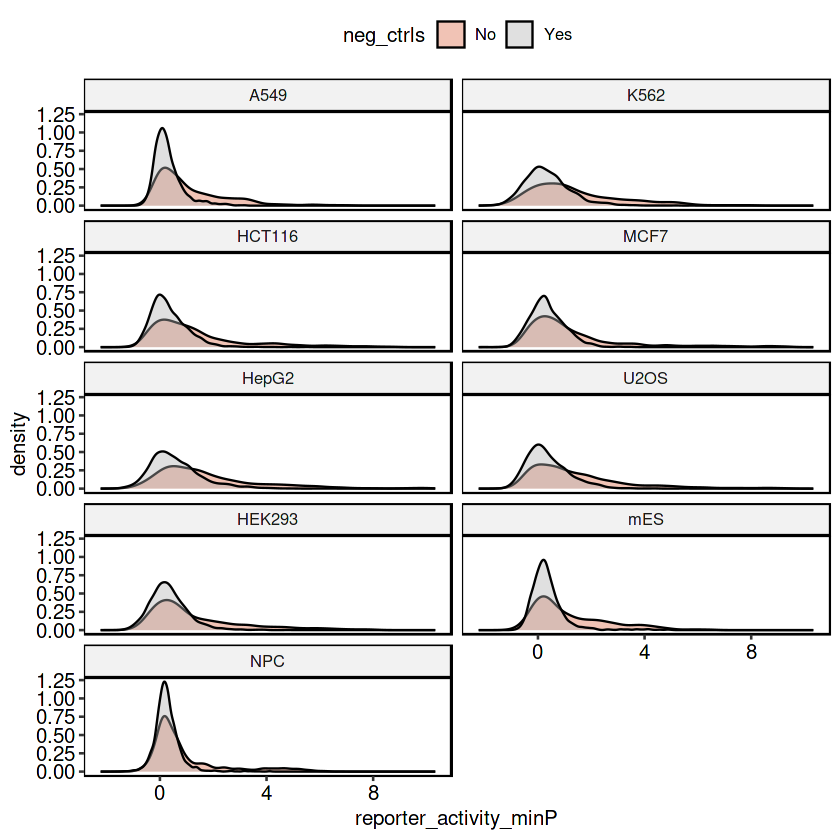

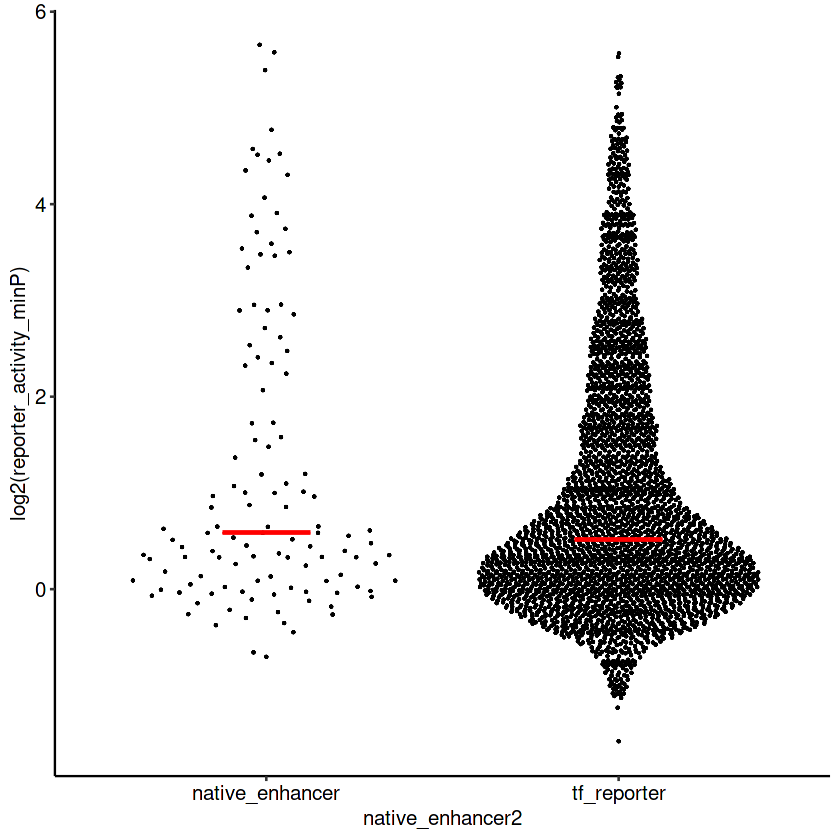

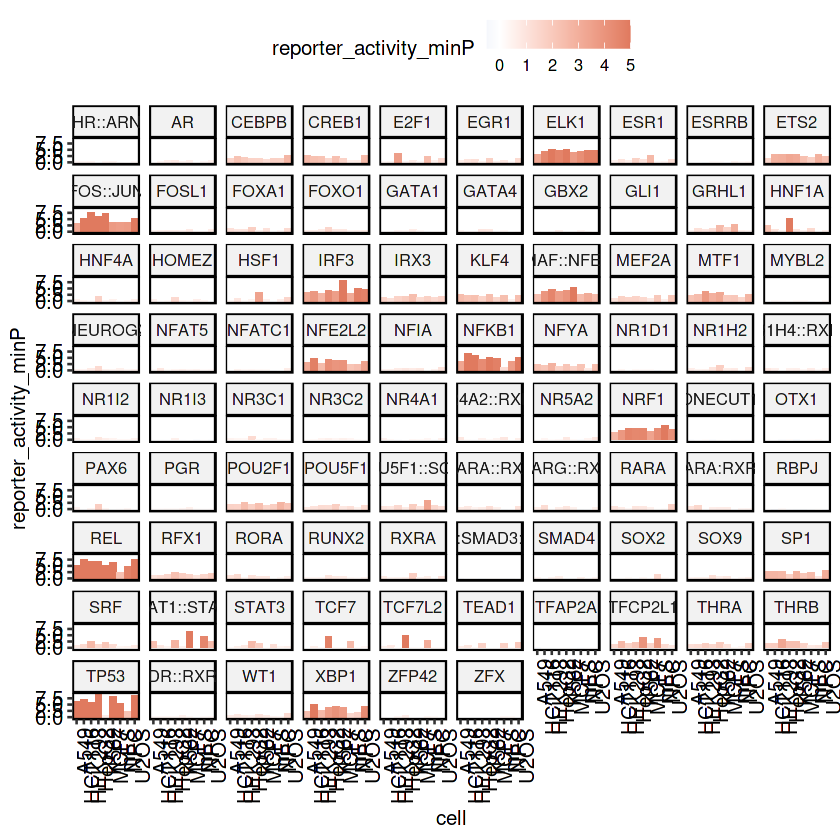

In [5]:
cDNA_df2 <- cDNA_df %>%
  filter(stimulation == "no",
         commercial_reporter == "No", 
         hPGK == "No", 
         str_detect(tf, "RANDOM", negate = T), 
         native_enhancer == "No") %>%
  distinct(tf, reporter_activity_minP, cell, reporter_id, neg_ctrls) %>%
  mutate(reporter_activity_minP = ave(reporter_activity_minP, cell, reporter_id, FUN = mean)) %>%
  mutate(reporter_activity_minP = log2(reporter_activity_minP)) %>%
  distinct() 

ggplot(cDNA_df2 %>%
         mutate(cell = factor(cell, levels = c("A549", "K562", "HCT116", "MCF7", "HepG2", 
                                               "U2OS", "HEK293", "mES", "NPC", "NIH3T3"))),
       aes(x = reporter_activity_minP, fill = neg_ctrls)) +
  geom_density(alpha = .4) +
  facet_wrap(~cell, ncol = 2) +
  scale_fill_manual(values = c("Yes" = "grey70", "No" = "#DD6B48")) +
  theme_pubr(border = T)


## Figure S1G: Compare TF reporters to native enhancer controls
native_activities <- cDNA_df %>%
  filter(condition == "mES_2i_LIF", neg_ctrls == "No") %>%
  distinct(reporter_id, tf, reporter_activity_minP, condition) %>%
  mutate(tf = gsub("_.*", "", tf)) %>%
  mutate(native_enhancer = ifelse(tf %in% c("e97", "e6", "e19", "e11", "e93"), tf, "tf_reporter")) %>%
  mutate(native_enhancer2 = ifelse(native_enhancer == "tf_reporter", native_enhancer, "native_enhancer"))

ggplot(native_activities,
       aes(x = native_enhancer2, y = log2(reporter_activity_minP))) +
  geom_quasirandom_rast(raster.dpi = 600, color = "black", size = .5) +
  stat_summary(fun = median, fun.min = median, fun.max = median, geom = "crossbar", color = "red", width = 0.25, lwd = 0.4) +
  theme_pubr()

## Figure S2A: Median TF activities in all 9 cell types
tf_activities_median <- cDNA_df %>%
  filter(stimulation == "no",
         neg_ctrls == "No",
         commercial_reporter == "No", 
         hPGK == "No", 
         str_detect(tf, "RANDOM", negate = T), 
         native_enhancer == "No") %>%
  distinct(tf, reporter_activity_minP, cell, neg_ctrls) %>%
  mutate(reporter_activity_minP = ave(reporter_activity_minP, cell, tf, FUN = median)) %>%
  mutate(reporter_activity_minP = log2(reporter_activity_minP)) %>%
  distinct(reporter_activity_minP, tf, cell)

ggplot(tf_activities_median,
       aes(x = cell, y = reporter_activity_minP, fill = reporter_activity_minP)) +
  geom_bar(stat = "identity") +
  facet_wrap(~tf) +
  scale_fill_gradient2(low = "#99B2DD", mid = "white", high = "#E07A5F", midpoint = 0, limits = c(-0.5,5), oob = squish) +
  theme_pubr(x.text.angle = 90, border = T)

## Per individual reporter
# tf_reporter_activities_median <- cDNA_df %>%
#   filter(stimulation == "no",
#          neg_ctrls == "No",
#          commercial_reporter == "No", 
#          hPGK == "No", 
#          str_detect(tf, "RANDOM", negate = T), 
#          native_enhancer == "No") %>%
#   distinct(tf, reporter_activity_minP, reporter_id, cell) %>%
#   mutate(reporter_activity_minP = ave(reporter_activity_minP, reporter_id, cell, tf, FUN = median)) %>%
#   mutate(reporter_activity_minP = log2(reporter_activity_minP)) %>%
#   distinct(reporter_activity_minP, tf, reporter_id, cell)
# 
# ggplot(tf_reporter_activities_median,
#        aes(x = cell, y = reporter_activity_minP)) +
#   geom_boxplot() +
#   facet_wrap(~tf) +
#   theme_pubr(x.text.angle = 90, border = T)

Conclusion: Reporters with TF reporters are more active. There are differences between cell types.

---
### Plot fold-changes upon perturbation per condition or TF
Aim: Investigate which TFs respond to which perturbation

In [6]:
fc_df <- cDNA_df %>%
  filter(stimulation != "no", neg_ctrls == "No", native_enhancer == "No", hPGK == "No") %>%
  mutate(tf = gsub("_.*", "", tf)) %>%
  distinct(reporter_id, tf, reporter_dif_minP, condition, tf_target) %>%
  mutate(mean_dif = ave(reporter_dif_minP, tf, condition, FUN = function(x) mean(x, na.rm = T))) %>%
  mutate(tf_length = ave(tf, tf, FUN = length)) %>%
  filter(tf_length > 10)

# for (i in unique(fc_df$tf)) {
#   p <- ggplot(fc_df %>% filter(tf == i),
#          aes(x = reorder(condition, -mean_dif), y = reporter_dif_minP, color = as.character(tf_target))) +
#     geom_hline(yintercept = 0, lty = 2) +
#     geom_hline(yintercept = 1) +
#     geom_hline(yintercept = -1) +
#     geom_point() +
#     scale_color_manual(values = c("0" = "black", "1" = "red", "2" = "blue")) +
#     theme_pubr(x.text.angle = 90) +
#     ggtitle(i)
# 
#   print(p)
# }
# 
# for (i in unique(fc_df$condition)) {
#   p <- ggplot(fc_df %>% filter(condition == i),
#          aes(x = reorder(tf, -mean_dif), y = reporter_dif_minP, color = as.character(tf_target))) +
#     geom_hline(yintercept = 0, lty = 2) +
#     geom_hline(yintercept = 1) +
#     geom_hline(yintercept = -1) +
#     geom_point() +
#     scale_color_manual(values = c("0" = "black", "1" = "red", "2" = "blue")) +
#     theme_pubr(x.text.angle = 90) +
#     ggtitle(i)
# 
#   print(p)
# }

Conclusion: Some TFs respond to unexpected perturbations. Many TFs respond to their direct target.

---
### Correlate with RNA-seq data
Aim: Does the reporter activity correlate with transcript abundance across conditions?

Joining, by = c("cell", "tf")
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(2^cDNA_df3$reporter_activity_minP[cDNA_df3$reporter_id == :
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(2^cDNA_df3$reporter_activity_minP[cDNA_df3$reporter_id == :
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(2^cDNA_df3$reporter_activity_minP[cDNA_df3$reporter_id == :
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(2^cDNA_df3$reporter_activity_minP[cDNA_df3$reporter_id == :
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning message in cor(2^cDNA_df3$reporter_activity_minP[cDNA_df3$reporter_id == :
“the standard deviation is zero”
Warning message in cor(x, y):
“the standard deviation is zero”
Warning mess

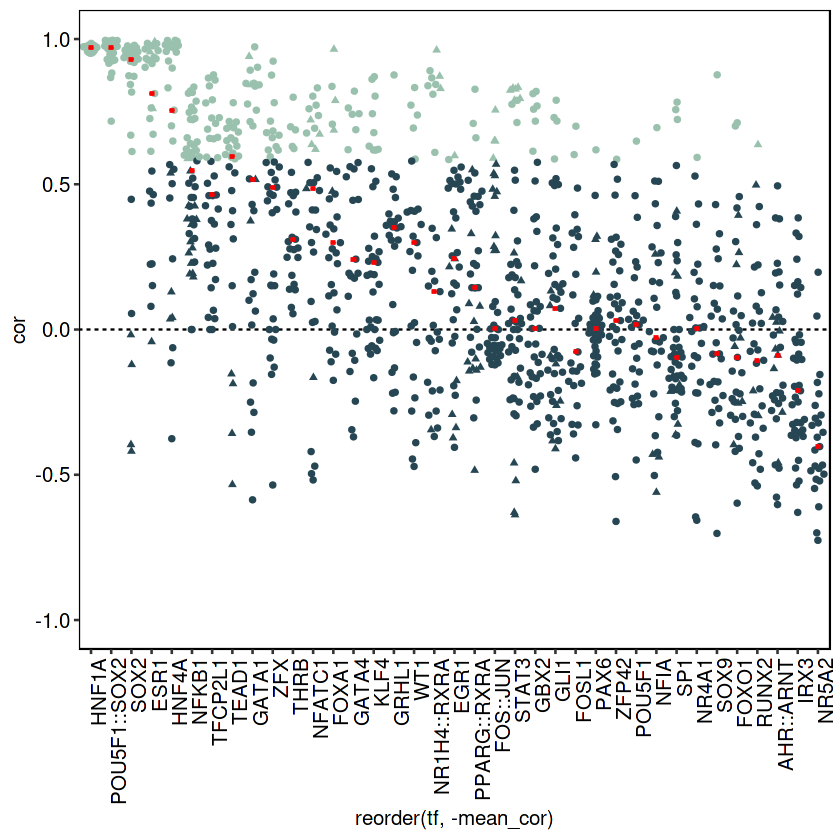

`geom_smooth()` using formula = 'y ~ x'


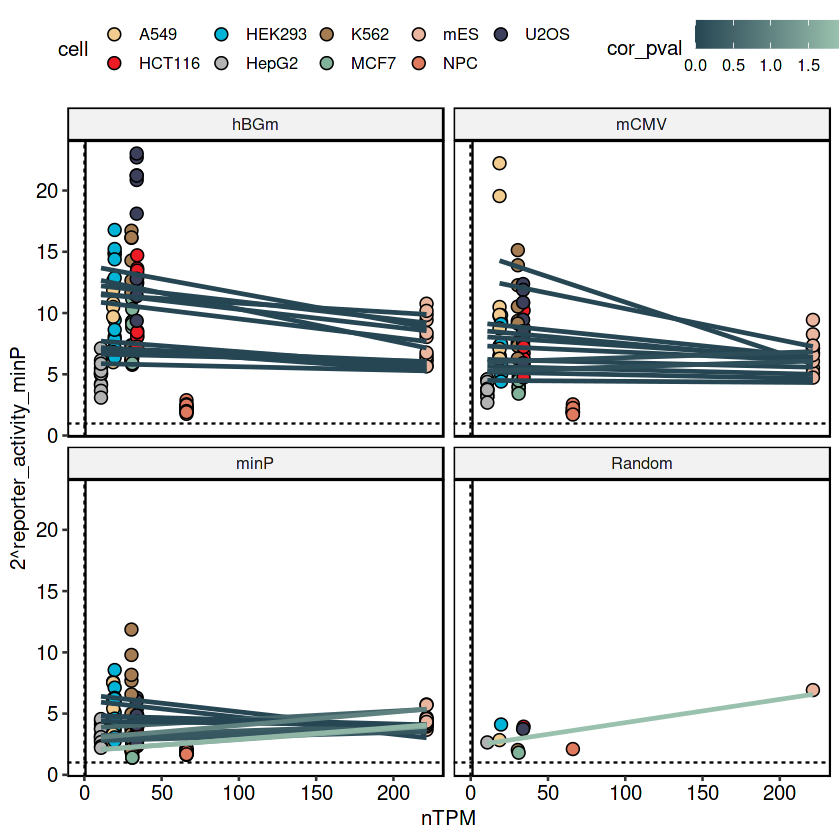

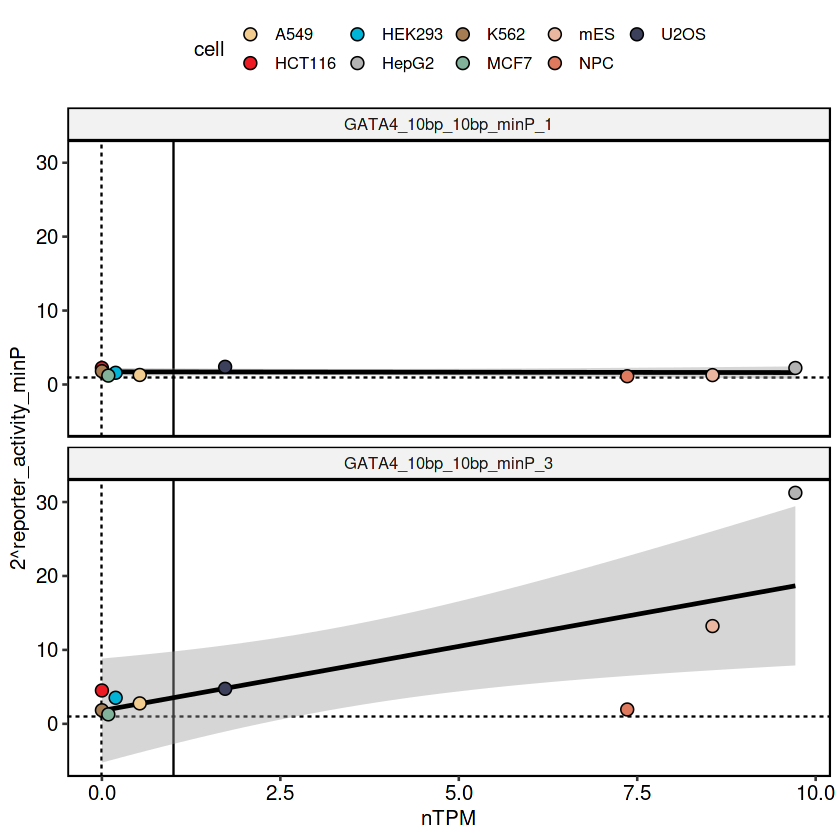

`geom_smooth()` using formula = 'y ~ x'


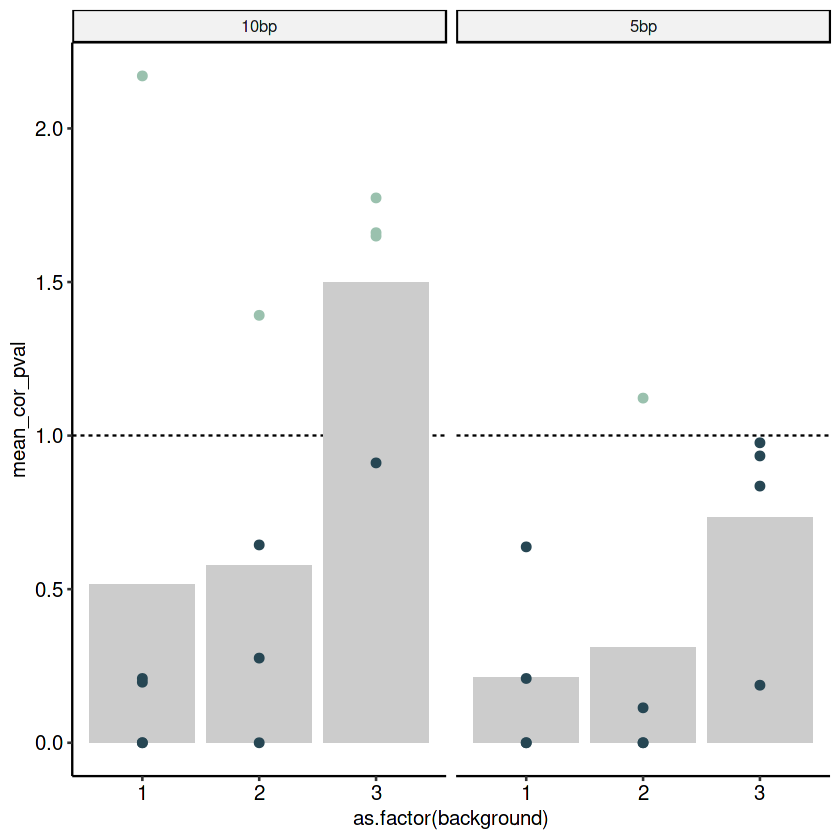

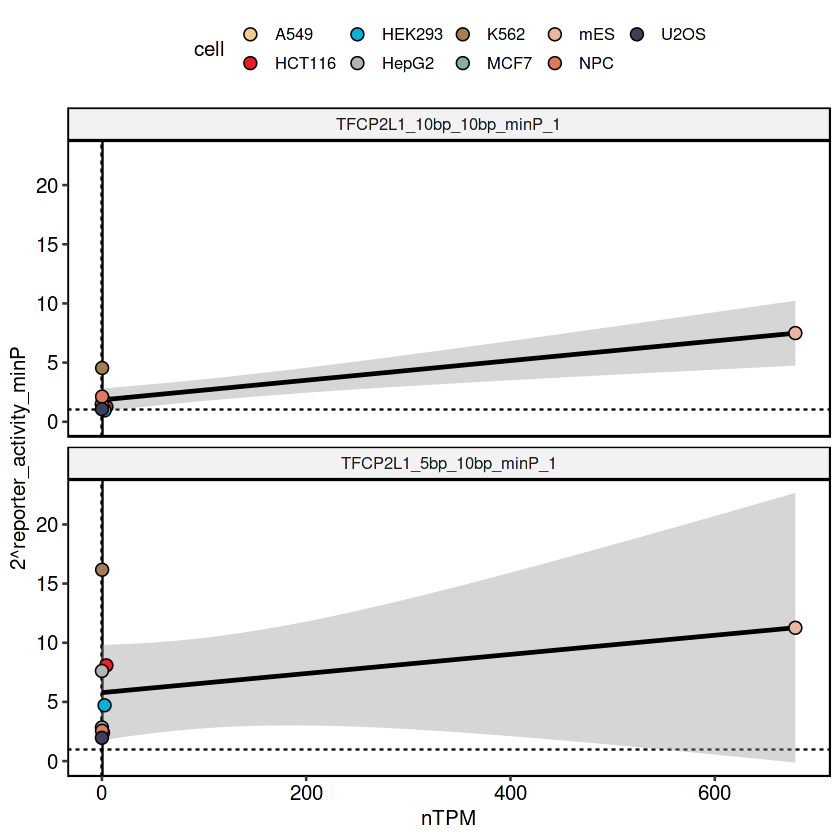

`geom_smooth()` using formula = 'y ~ x'


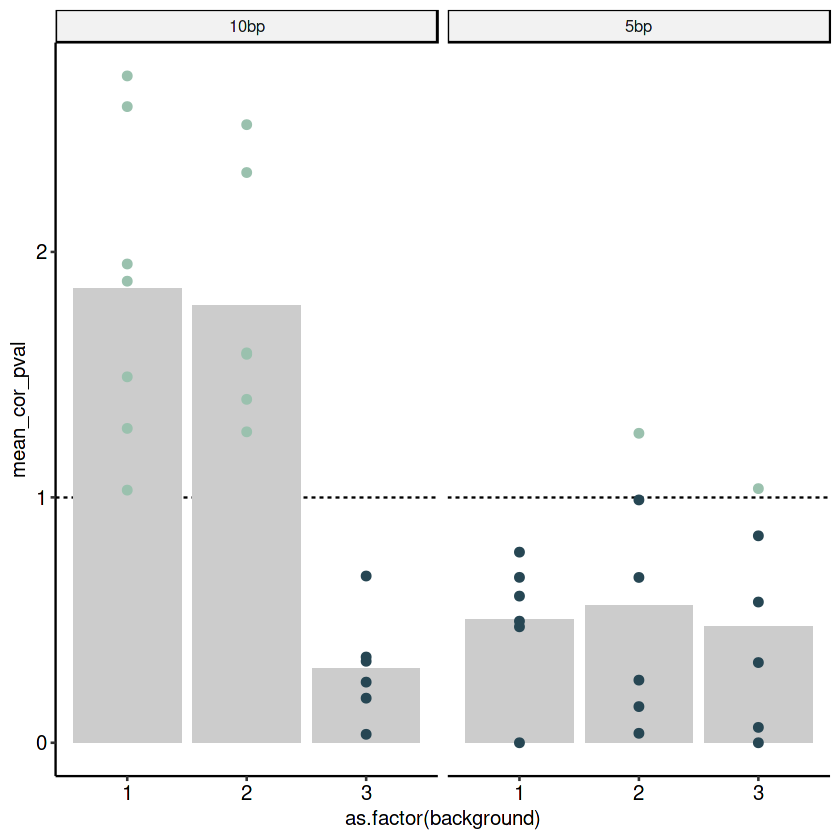

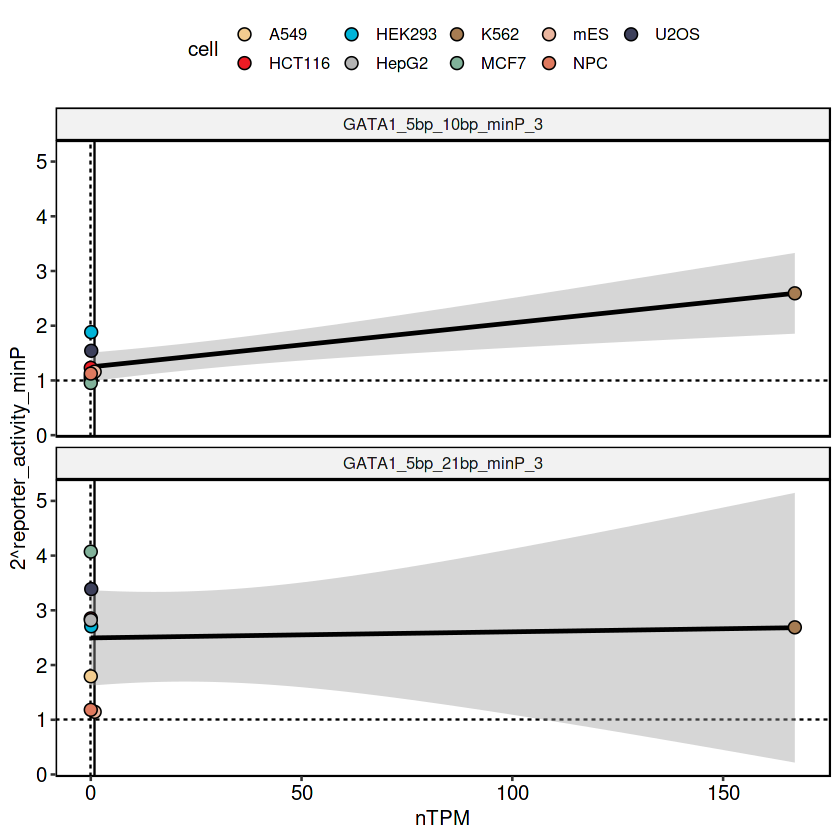

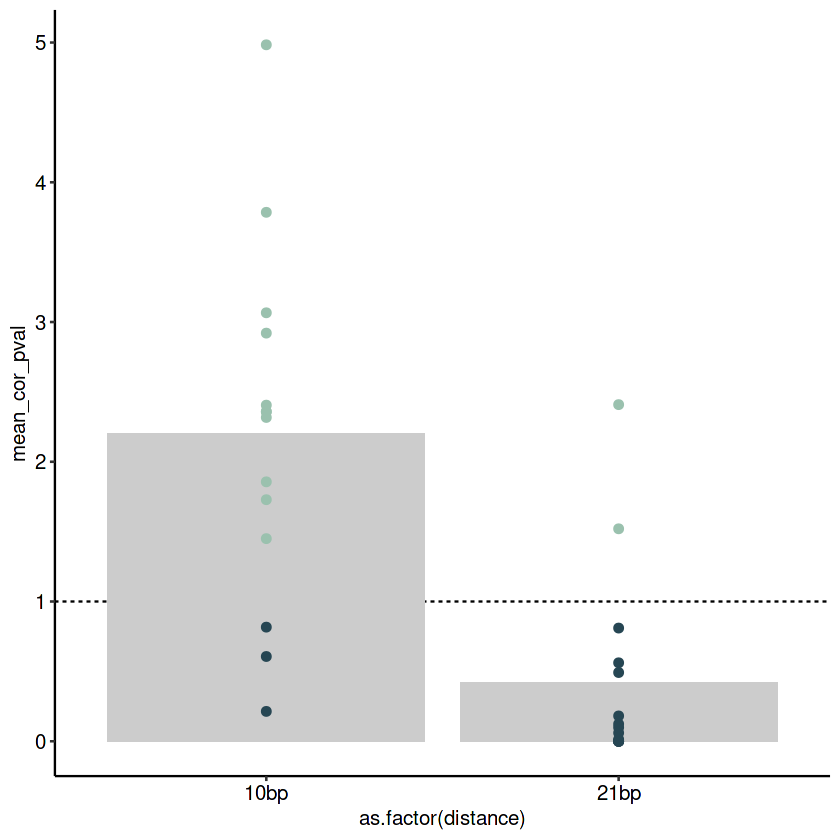

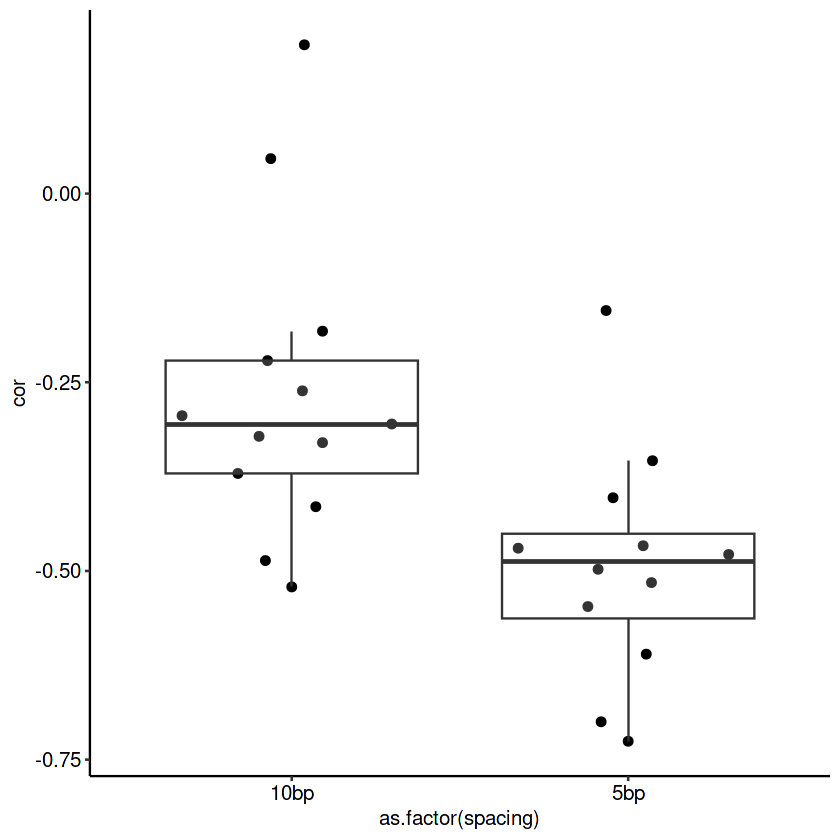

In [7]:
## Prepare tf reporter data frame
cDNA_df2 <- cDNA_df %>%
  #filter(tf != "RFX1") %>%
  dplyr::filter(neg_ctrls == "No",
                #commercial_reporter == "No",
                stimulation == "no",
                hPGK == "No",
                str_detect(tf, "RANDOM", negate = T),
                native_enhancer == "No") %>%
  distinct(tf, reporter_activity_minP, cell, reporter_id, commercial_reporter, spacing, promoter, background, distance) %>%
  mutate(reporter_activity_minP = ave(reporter_activity_minP, cell, reporter_id, FUN = mean)) %>%
  mutate(reporter_activity_minP = log2(reporter_activity_minP)) %>%
  distinct() %>%
  mutate(tf = gsub("_.*", "", tf))

## Combine TF reporter data with RNA-seq data
cDNA_df3 <- cDNA_df2 %>%
  left_join(tf_rna) %>%
  mutate(TPM = ifelse(is.na(TPM), 0, TPM)) %>%
  mutate(nTPM = ifelse(is.na(nTPM), 0, nTPM)) %>%
  mutate(log_nTPM = log2(nTPM + 0.01)) %>%
  mutate(range_TPM = quantile(log_nTPM, probs = 0.95) - quantile(log_nTPM, probs = 0.05)) %>%
  mutate(range_activity = quantile(reporter_activity_minP, probs = 0.95) - quantile(reporter_activity_minP, probs = 0.05)) %>%
  mutate(dif_range = range_TPM / range_activity) %>%
  mutate(log_nTPM = log_nTPM / dif_range) %>%
  dplyr::select(-range_TPM, -range_activity, -dif_range)

## Compute pearson correlations for each individual reporter of reporter activity vs. nTPM counts across the nine cell types
for (i in unique(cDNA_df3$reporter_id)) {
  if (nrow(cDNA_df3[cDNA_df3$reporter_id == i,]) > 4) {
    
    #print(i)
    
    cDNA_df3$cor_pval[cDNA_df3$reporter_id == i] <- cor.test(2^cDNA_df3$reporter_activity_minP[cDNA_df3$reporter_id == i],
                                                                    cDNA_df3$nTPM[cDNA_df3$reporter_id == i], method = "pearson", exact = F)$p.value
    
    cDNA_df3$cor[cDNA_df3$reporter_id == i] <- cor(2^cDNA_df3$reporter_activity_minP[cDNA_df3$reporter_id == i], 
                                                 cDNA_df3$nTPM[cDNA_df3$reporter_id == i], method = "pearson")
  }
  else {
    cDNA_df3$cor_pval[cDNA_df3$reporter_id == i] <- 1
    cDNA_df3$cor[cDNA_df3$reporter_id == i] <- 0
  }
}

## I am only interested in positive correlations, so set all negative correlations to zero
cDNA_df3 <- cDNA_df3 %>%
  mutate(cor_pval = ifelse(cor_pval == cor, 1, cor_pval)) %>%
  group_by(tf) %>%
  mutate(cor_pval_fdr = p.adjust(cor_pval, method = "fdr")) %>%
  ungroup() %>%
  mutate(cor_pval = ifelse(cor < 0, 1, cor_pval)) %>%
  mutate(cor_pval_fdr = ifelse(cor < 0, 1, cor_pval_fdr)) %>%
  mutate(cor_pval = -log10(cor_pval)) %>%
  mutate(cor_pval_fdr = -log10(cor_pval_fdr)) %>%
  mutate(cor_pval = ifelse(is.na(cor_pval), 1, cor_pval)) %>%
  mutate(cor_pval_fdr = ifelse(is.na(cor_pval_fdr), 1, cor_pval_fdr)) %>%
  mutate(cor = ifelse(is.na(cor), 1, cor))

## Filter for TFs where correlations actually make sense -> minimum TPM > 0.5, maximum TPM < 0.5, dif_TPM > 5
rna_correlations_df <- cDNA_df3 %>%
  mutate(min_TPM = ave(nTPM, tf, FUN = min),
         max_TPM = ave(nTPM, tf, FUN = max)) %>%
  mutate(dif_TPM = max_TPM - min_TPM) %>%
  mutate(mean_tf_activity = ave(reporter_activity_minP, tf, cell, FUN = mean)) %>%
  mutate(max_mean_tf_activity = ave(mean_tf_activity, tf, FUN = max)) %>%
  mutate(reasonable = ifelse(max_TPM > 8 & 
                               dif_TPM > 5 & 
                               min_TPM < 1 & 
                               max_mean_tf_activity > 0.75 | 
                               tf %in% c("GATA1", "NFATC1", "GLI1", "STAT3", "SP1", "FOXA1", "TEAD1", "NFKB1",
                                         "ZFX", "NR4A1"), "Yes", "No")) %>%
  mutate(reasonable = ifelse(tf %in% c("TCF7L2", "TCF7", "TFEB", "TP53", "GATA3", "CEBPA"), "No", reasonable))

reasonable_corr <- rna_correlations_df %>%
  filter(reasonable == "No")

## Export correlations
rna_correlations <- rna_correlations_df %>%
  filter(reasonable == "Yes") %>%
  distinct(reporter_id, cor_pval, cor) %>%
  mutate(cor_pval = ifelse(reporter_id %in% reasonable_corr$reporter_id, 0, cor_pval)) %>%
  mutate(cor = ifelse(reporter_id %in% reasonable_corr$reporter_id, 0, cor))

## Plot correlation p-values per TF (export 3x6.5)
ggplot(rna_correlations_df %>%
         filter(reasonable == "Yes") %>%
         distinct(reporter_id, cor_pval, cor, tf, commercial_reporter) %>%
         mutate(sign = ifelse(cor_pval > 1, "Yes", "No")) %>%
         mutate(mean_cor = ave(cor, tf, FUN = mean)),
       aes(x = reorder(tf, -mean_cor), y = cor)) +
  geom_hline(yintercept = 0, lty = 2) +
  geom_quasirandom(size = 1.5, aes(color = sign, shape = commercial_reporter)) +
  ylim(-1,1) +
  theme_pubr(border = T, x.text.angle = 90, legend = "none") +
  stat_summary(fun = median, fun.min = median, fun.max = median, geom = "crossbar", color = "red", width = 0.25, lwd = 0.4) +
  scale_color_manual(values = c("Yes" = colors_diverse[2], "No" = colors_diverse[1]))

### SP1: Random core promoter (Export 4x4)
ggplot(cDNA_df3 %>%
           filter(tf == "SP1", commercial_reporter == "No")%>%
           mutate(promoter = gsub(".*(Random|minP|hBGm|mCMV).*", "\\1", reporter_id)) %>%
           distinct(cell, reporter_id, reporter_activity_minP, nTPM, promoter, cor_pval),
       aes(x = nTPM, y = 2^reporter_activity_minP)) +
  geom_vline(xintercept = 1, lty = 1) +
  geom_vline(xintercept = 0, lty = 2) +
  geom_hline(yintercept = 1, lty = 2) +
  geom_point(size = 3, shape = 21, aes(fill = cell), color = "black") +
  scale_fill_manual(values = cell_colors) +
  geom_smooth(method = "lm", se = F, aes(group = reporter_id, color = cor_pval)) +
  theme_pubr(border = T) +
  facet_wrap(~promoter) +
  scale_color_gradient(low = "#264653", high = "#9AC1AE")

### GATA4: Impact of spacer sequence (export 3x5.5)
ggplot(cDNA_df3 %>%
         filter(reporter_id %in% c("GATA4_10bp_10bp_minP_3", "GATA4_10bp_10bp_minP_1")) %>%
         distinct(cell, reporter_id, reporter_activity_minP, nTPM),
       aes(x = nTPM, y = 2^reporter_activity_minP)) +
  geom_vline(xintercept = 1, lty = 1) +
  geom_vline(xintercept = 0, lty = 2) +
  geom_hline(yintercept = 1, lty = 2) +
  geom_smooth(method = "lm", color = "black") +
  geom_point(size = 3, shape = 21, aes(fill = cell)) +
  scale_fill_manual(values = cell_colors) +
  facet_wrap(~reporter_id, ncol = 1) +
  theme_pubr(border = T)

gata4_plot <- rna_correlations_df %>%
  filter(tf == "GATA4") %>%
  distinct(reporter_id, cor_pval, spacing, background) %>%
  mutate(mean_cor_pval = ave(cor_pval, spacing, background, FUN = mean))

ggplot() +
  geom_hline(yintercept = 1, lty = 2) +
  geom_bar(data = gata4_plot %>% distinct(mean_cor_pval, spacing, background),
           aes(x = as.factor(background), y = mean_cor_pval), stat = "identity", fill = "grey80") +
  geom_point(data = gata4_plot, size = 2, 
              aes(color = ifelse(cor_pval > 1, "Yes", "No"),
                  x = as.factor(background), y = cor_pval)) +
  theme_pubr(legend = "none") +
  scale_color_manual(values = c("Yes" = colors_diverse[2], "No" = colors_diverse[1])) +
  facet_wrap(~spacing)

### TFCP2L1: Impact of spacer length
ggplot(cDNA_df3 %>%
         filter(reporter_id %in% c("TFCP2L1_10bp_10bp_minP_1", "TFCP2L1_5bp_10bp_minP_1")) %>%
         distinct(cell, reporter_id, reporter_activity_minP, nTPM),
       aes(x = nTPM, y = 2^reporter_activity_minP)) +
  geom_vline(xintercept = 1, lty = 1) +
  geom_vline(xintercept = 0, lty = 2) +
  geom_hline(yintercept = 1, lty = 2) +
  geom_smooth(method = "lm", color = "black") +
  geom_point(size = 3, shape = 21, aes(fill = cell)) +
  scale_fill_manual(values = cell_colors) +
  facet_wrap(~reporter_id, ncol = 1) +
  theme_pubr(border = T)

tfcp2l1_plot <- rna_correlations_df %>%
  filter(tf == "TFCP2L1") %>%
  distinct(reporter_id, cor_pval, spacing, background) %>%
  mutate(mean_cor_pval = ave(cor_pval, spacing, background, FUN = mean))

## Export 3x4
ggplot() +
  geom_hline(yintercept = 1, lty = 2) +
  geom_bar(data = tfcp2l1_plot %>% distinct(mean_cor_pval, spacing, background),
           aes(x = as.factor(background), y = mean_cor_pval), stat = "identity", fill = "grey80") +
  geom_point(data = tfcp2l1_plot, size = 2, 
              aes(color = ifelse(cor_pval > 1, "Yes", "No"),
                  x = as.factor(background), y = cor_pval)) +
  theme_pubr(legend = "none") +
  scale_color_manual(values = c("Yes" = colors_diverse[2], "No" = colors_diverse[1])) +
  facet_wrap(~spacing)

### GATA1: Impact of distance
ggplot(cDNA_df3 %>%
           filter(reporter_id %in% c("GATA1_5bp_10bp_minP_3", "GATA1_5bp_21bp_minP_3")) %>%
           distinct(cell, reporter_id, reporter_activity_minP, nTPM),
       aes(x = nTPM, y = 2^reporter_activity_minP)) +
  geom_vline(xintercept = 1, lty = 1) +
  geom_vline(xintercept = 0, lty = 2) +
  geom_hline(yintercept = 1, lty = 2) +
  geom_smooth(method = "lm", color = "black") +
  geom_point(size = 3, shape = 21, aes(fill = cell)) +
  scale_fill_manual(values = cell_colors) +
  facet_wrap(~reporter_id, ncol = 1) +
  theme_pubr(border = T)

gata1_plot <- rna_correlations_df %>%
  filter(tf == "GATA1") %>%
  distinct(reporter_id, cor_pval, distance) %>%
  mutate(mean_cor_pval = ave(cor_pval, distance, FUN = mean))

ggplot() +
  geom_hline(yintercept = 1, lty = 2) +
  geom_bar(data = gata1_plot %>% distinct(mean_cor_pval, distance),
           aes(x = as.factor(distance), y = mean_cor_pval), stat = "identity", fill = "grey80") +
  geom_point(data = gata1_plot, size = 2, 
              aes(color = ifelse(cor_pval > 1, "Yes", "No"),
                  x = as.factor(distance), y = cor_pval)) +
  theme_pubr(legend = "none") +
  scale_color_manual(values = c("Yes" = colors_diverse[2], "No" = colors_diverse[1]))






### NR5A2: Impact of spacer length - repressive role?
ggplot(rna_correlations_df %>%
           filter(tf == "NR5A2") %>%
           distinct(reporter_id, cor, spacing),
       aes(x = as.factor(spacing), y = cor)) +
    geom_quasirandom(size = 2) +
    geom_boxplot(alpha = .2, outlier.shape = NA) +
    theme_pubr()

Conclusion: For some TFs, the reporter activities correlate well with TF abundance, for others less.

---
### Linear model - TF reporter grammar
Aim: If the measured activities can be fitted by a linear model, it is likely that the activity is true. If not, we might be looking at noise instead.

[1] "AHR::ARNT_HCT116_ITE"
[1] "AHR::ARNT_mES_Nanog_ctrl"
[1] "AHR::ARNT_mES_Sox2_ctrl"
[1] "AR_MCF7"
[1] "AR_U2OS"
[1] "CEBPB_mES_NT"
[1] "CEBPB_U2OS"
[1] "CREB1_mES_FK"
[1] "CREB1_mES_Sox2_ctrl"
[1] "CREB1_U2OS"
[1] "E2F1_mES_Nanog_ctrl"
[1] "E2F1_mES_Pou5f1_ctrl"
[1] "EGR1_K562"
[1] "EGR1_mES_LIF_CH"
[1] "EGR1_U2OS"
[1] "ELK1_mES_LIF_CH"
[1] "ELK1_NPC"
[1] "ELK1_U2OS"
[1] "ESR1_MCF7_Hexestrol"
[1] "ESR1_MCF7"
[1] "ESR1_U2OS"
[1] "ESRRB_mES_Nanog_ctrl"
[1] "ESRRB_mES_NT"
[1] "ESRRB_mES_serum_2i_LIF"
[1] "ETS2_HepG2_NT"
[1] "ETS2_mES_Nanog_ctrl"
[1] "ETS2_mES_Pou5f1_ctrl"
[1] "FOS::JUN_K562"
[1] "FOS::JUN_U2OS_PMA"
[1] "FOS::JUN_U2OS"
[1] "FOSL1_HCT116"
[1] "FOSL1_mES_2i_LIF"
[1] "FOSL1_mES_FOSL1-OE"
[1] "FOSL1_U2OS"
[1] "FOXA1_HepG2_FBS"
[1] "FOXA1_HepG2"
[1] "FOXA1_mES_FOXA1-OE"
[1] "FOXO1_HepG2_FBS"
[1] "FOXO1_HepG2"
[1] "FOXO1_mES_FOXA1-OE"
[1] "FOXO1_U2OS_Wortmannin"
[1] "GATA1_K562_Hemin"
[1] "GATA1_K562"
[1] "GATA1_mES_GATA1-OE"
[1] "GATA1_mES_Pou5f1_ctrl"
[1] "GATA4_HepG2_FBS"

Joining, by = c("row", "tf_condition")


[1] 0.1232073

Joining, by = "feature"
Joining, by = "feature"
Joining, by = c("condition", "tf")
Joining, by = c("tf", "cell")


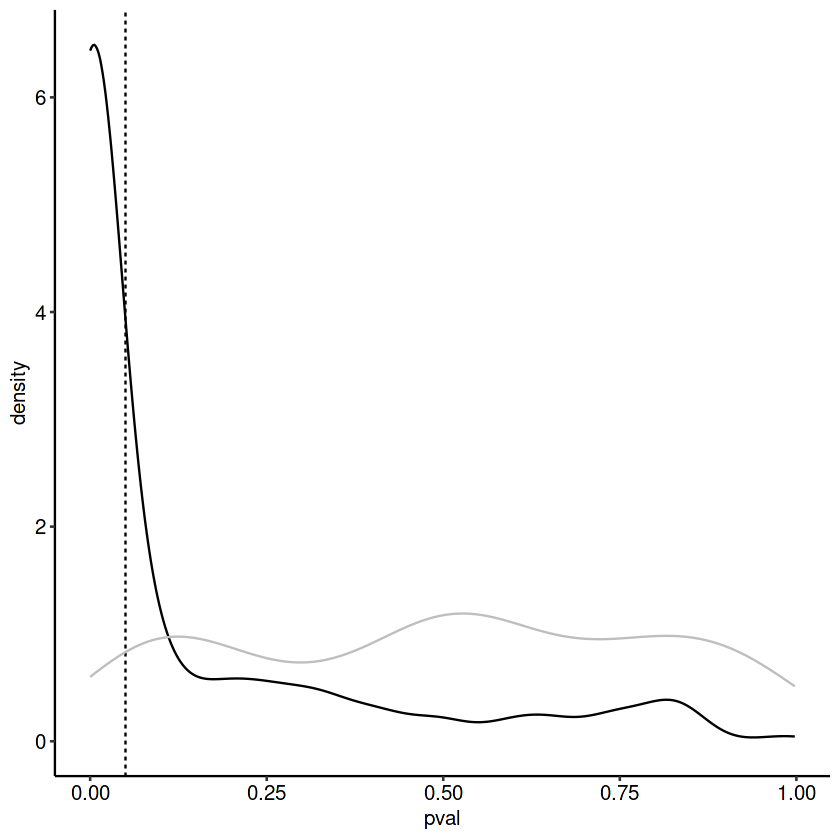

In [8]:
## Only include 2-3 most interesting conditions per TF (as determined before)
ref_conditions_sel <- ref_conditions %>%
  mutate(tf_condition = paste(tf, condition, sep = "_"))

cDNA_df_TF <- cDNA_df %>%
  filter(neg_ctrls == "No", commercial_reporter == "No", hPGK == "No", native_enhancer == "No", 
         stimulation %in% c("no", "pathway", "overexpression"), promoter != "Random") %>%
  distinct(reporter_activity_minP, promoter, spacing, distance, background, tf, condition, reporter_id, stimulation) %>%
  mutate(tf_condition = paste(tf, condition, sep = "_")) %>%
  filter(tf_condition %in% ref_conditions_sel$tf_condition) %>%
  mutate(reporter_activity_minP = log2(reporter_activity_minP)) %>%
  mutate(background = as.character(background)) %>%
  mutate(promoter = as.factor(promoter)) %>%
  #mutate(spacing = ifelse(spacing == "10bp", "10bps", "5bp")) %>%
  mutate(spacing = as.factor(spacing)) %>%
  mutate(spacing_background = as.factor(paste(spacing, background, sep = ":"))) %>%
  distinct(reporter_activity_minP, promoter, spacing_background, distance, condition, tf, tf_condition, reporter_id) %>%
  mutate(reporter_activity_minP_random = ave(reporter_activity_minP, tf, condition, FUN = function(x) sample(x)))


## Fit linear model with design features for actual data
exp_variance <- data.frame("feature" = c("promoter", "spacing_background", "distance", "Residuals"))
weight <- data.frame("feature" = c("(Intercept)", "promoterminP", "promoterhBGm", "promotermCMV",
                  "spacing_background10bp:1","spacing_background10bp:2","spacing_background10bp:3",
                  "spacing_background5bp:1","spacing_background5bp:2","spacing_background5bp:3",
                  "distance10bp","distance21bp"))

cDNA_df_TF$promoter <- relevel(cDNA_df_TF$promoter, ref = "minP")
#cDNA_df_TF$spacing <- relevel(cDNA_df_TF$spacing, ref = "5bp")
cDNA_df_TF$spacing_background <- relevel(cDNA_df_TF$spacing_background, ref = "5bp:1")
cDNA_df_TF$row <- rownames(cDNA_df_TF)
cDNA_df_TF3 <- data.frame()

lm_list <- list()
for (i in unique(cDNA_df_TF$tf_condition)) {
  if (nrow(cDNA_df_TF[cDNA_df_TF$tf_condition == i,]) > 9) {
  print(i)
  lm_list[[i]] <- lm(reporter_activity_minP ~
                       distance + promoter + spacing_background,
                cDNA_df_TF[cDNA_df_TF$tf_condition == i,])
  }
}

f <- lapply(names(lm_list), function(x) summary(lm_list[[x]])$fstatistic)
names(f) <- names(lm_list)
p <- lapply(names(f), function(x) pf(f[[x]][1],f[[x]][2],f[[x]][3],lower.tail=F))
p <- data.frame(bind_rows(p)) %>% setnames("value", "pval")
p$tf_condition <- names(lm_list)

y <- lapply(names(lm_list), function(x) data.frame("activity_predicted" = lm_list[[x]]$fitted.values) %>% rownames_to_column("row") %>% mutate(tf_condition = x))
y <- data.frame(bind_rows(y)) %>% left_join(p, by = "tf_condition")

cDNA_df_TF2 <- y %>%
  left_join(cDNA_df_TF)

cDNA_df_TF3 <- rbind(cDNA_df_TF3, cDNA_df_TF2)

mean(cDNA_df_TF3$pval)

w <- lapply(names(lm_list), function(x) 
  if (length(lm_list[[x]]$coefficients) == length(summary(lm_list[[x]])$coefficients[,4])) {
  data.frame('weight' = lm_list[[x]]$coefficients %>% na.omit(), 'pval' = summary(lm_list[[x]])$coefficients[,4]) %>% mutate(tf = x) %>% rownames_to_column('feature')
  }
)

w <- data.frame(bind_rows(w))
weight <- weight %>%
  left_join(w)

x <- lapply(lm_list, function(x) data.frame(anova(x) %>% rownames_to_column("feature")))
            
for (i in names(x)) {
  x[[i]]$tf <- i
}

x <- data.frame(bind_rows(x)) %>% 
  setnames(c("Sum.Sq", "Pr..F."), c("sum_sq", "pval")) %>%
  distinct(feature, sum_sq, pval, tf) %>%
  mutate(sum = ave(sum_sq, tf, FUN = sum)) %>%
  mutate(rel_sum_sq = (sum_sq/sum)*100) %>%
  distinct(tf, rel_sum_sq, pval, feature)

exp_variance <- exp_variance %>%
  left_join(x)

## Fine-tune dfs
exp_variance$group <- "no residual"
exp_variance$group[grep("Residual", exp_variance$feature)] <- "residual"
exp_variance$rel_sum_sq[exp_variance$feature == "Residuals"] <- 100 - exp_variance$rel_sum_sq[exp_variance$feature == "Residuals"]
exp_variance$feature <- revalue(exp_variance$feature, c("Residuals"="total"))
prediction <- cDNA_df_TF3 %>%
  dplyr::select(-row) %>%
  na.omit()
weight <- weight %>%
  filter(feature != "(Intercept)")
categorie <- c("promoter", "spacing_background", "distance")
weight$features <- gsub(paste(categorie, collapse="|"), "",weight$feature)
ml <- length(unique(weight$features))
feature <- unique(weight$features)
weight$condition <- gsub(paste(feature, collapse = "|"), "", weight$feature)
weight <- weight %>% dplyr::select(-feature)


cDNA_df_TF3 <- cDNA_df_TF3 %>%
  mutate(pval_adj = p.adjust(pval, method = "fdr"))

## Run the same with the random data
lm_list_random <- list()
for (i in unique(cDNA_df_TF$tf_condition)) {
    if (nrow(cDNA_df_TF[cDNA_df_TF$tf_condition == i,]) > 9) {
  lm_list_random[[i]] <- lm(reporter_activity_minP_random ~ 
                       promoter + 
                       spacing_background +
                       distance,
                cDNA_df_TF[cDNA_df_TF$tf_condition == i,])
    }
}

lm_pval_df_random <- data.frame("tf_condition" = names(lm_list_random), random = "yes")

for (i in unique(lm_pval_df_random$tf_condition)) {
  lm_pval_df_random$pval[lm_pval_df_random$tf_condition == i] <- lmp(lm_list_random[[i]])
  lm_pval_df_random$r2_adj[lm_pval_df_random$tf_condition == i] <- summary(lm_list_random[[i]])$adj.r.squared
  lm_pval_df_random$rmse[lm_pval_df_random$tf_condition == i] <- sqrt(mean(lm_list_random[[i]]$residuals^2))
}

lm_pval_df <- data.frame("tf_condition" = names(lm_list), random = "no")

for (i in unique(lm_pval_df$tf_condition)) {
  lm_pval_df$pval[lm_pval_df$tf_condition == i] <- lmp(lm_list[[i]])
  lm_pval_df$r2_adj[lm_pval_df$tf_condition == i] <- summary(lm_list[[i]])$adj.r.squared
  lm_pval_df$rmse[lm_pval_df$tf_condition == i] <- sqrt(mean(lm_list[[i]]$residuals^2))
}

lm_pval_df <- rbind(lm_pval_df, lm_pval_df_random)

lm_pval_df <- lm_pval_df %>%
  mutate(pval_adj = p.adjust(pval, method = "fdr"))

## Plot p-values, randomized vs real data
ggplot(lm_pval_df, aes(x = pval, color = random)) +
  geom_vline(xintercept = 0.05, linetype = "dashed") +
  geom_density() +
  theme_pubr(legend = "none") +
  scale_color_manual(values = c("black", "grey")) 

  ## Then integrate the linear models to select the least noisy of the top 2-3 conditions per TF
cDNA_df_TF4 <- cDNA_df_TF3 %>%
  distinct(tf, condition, pval_adj)

chosen_conditions <- ref_conditions %>%
  left_join(cDNA_df_TF4) %>%
  replace(is.na(.), 1) %>%
  group_by(tf) %>%
  slice_min(n = 1, order_by = pval_adj, with_ties = T) %>%
  ungroup() %>%
  mutate(cell = gsub("_.*", "", condition)) %>%
  left_join(tf_rna) %>%
  group_by(tf) %>%
  slice_max(n = 1, order_by = nTPM, with_ties = F) %>%
  ungroup() %>%
  distinct(tf, condition) %>%
  mutate(tf_condition = paste(tf, condition, sep = "_"))

Conclusion: The linear models seem to work very well.

---
### Explore linear models for all TFs in the chosen conditions
Aim: Are there any common reporter design rules?

Joining, by = "features"
Warning message:
“Using alpha for a discrete variable is not advised.”


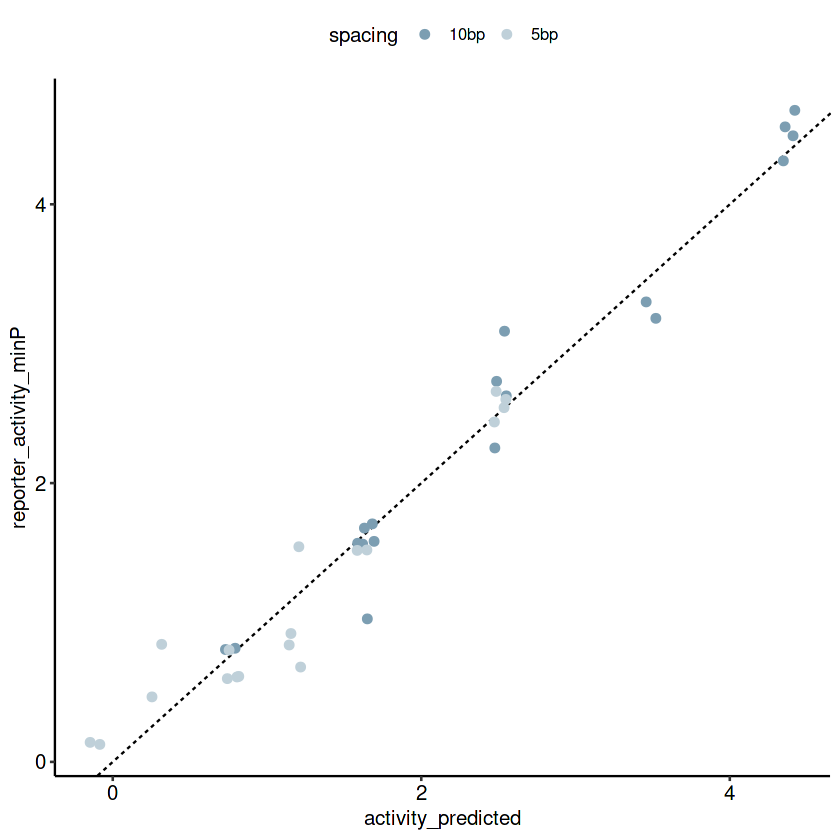

Joining, by = "tf"
Joining, by = "tf"


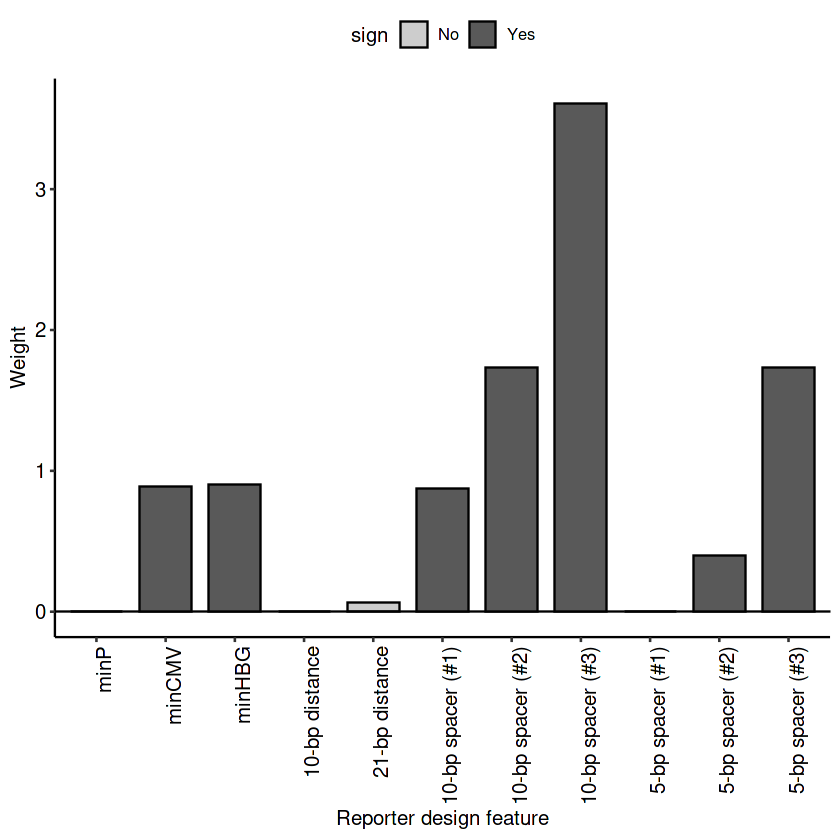

`geom_smooth()` using formula = 'y ~ x'


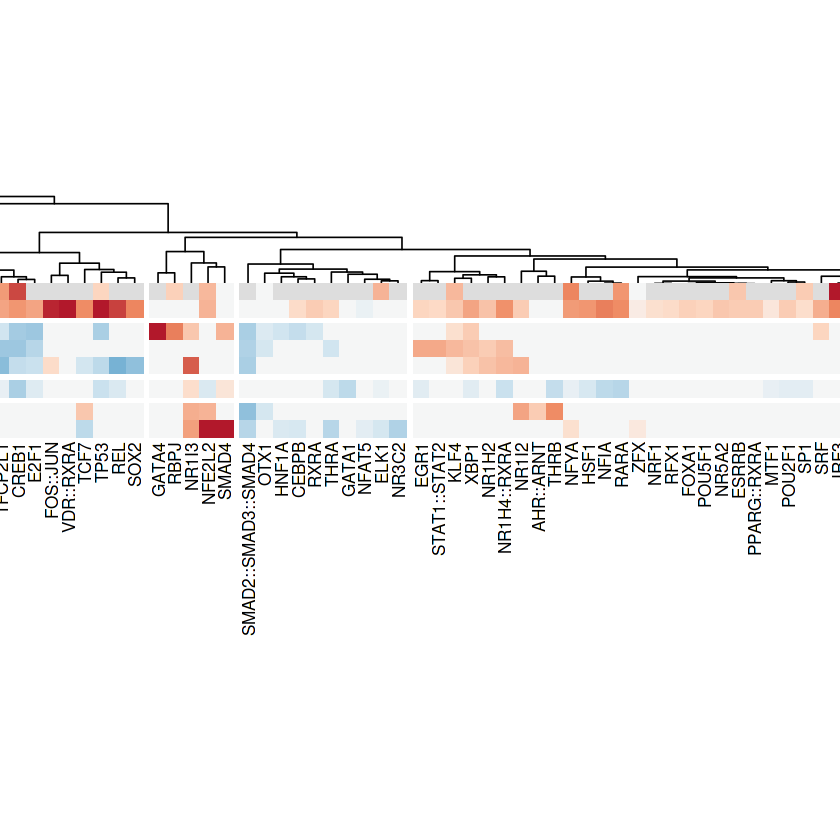

Joining, by = c("reporter_id", "promoter", "tf", "distance")


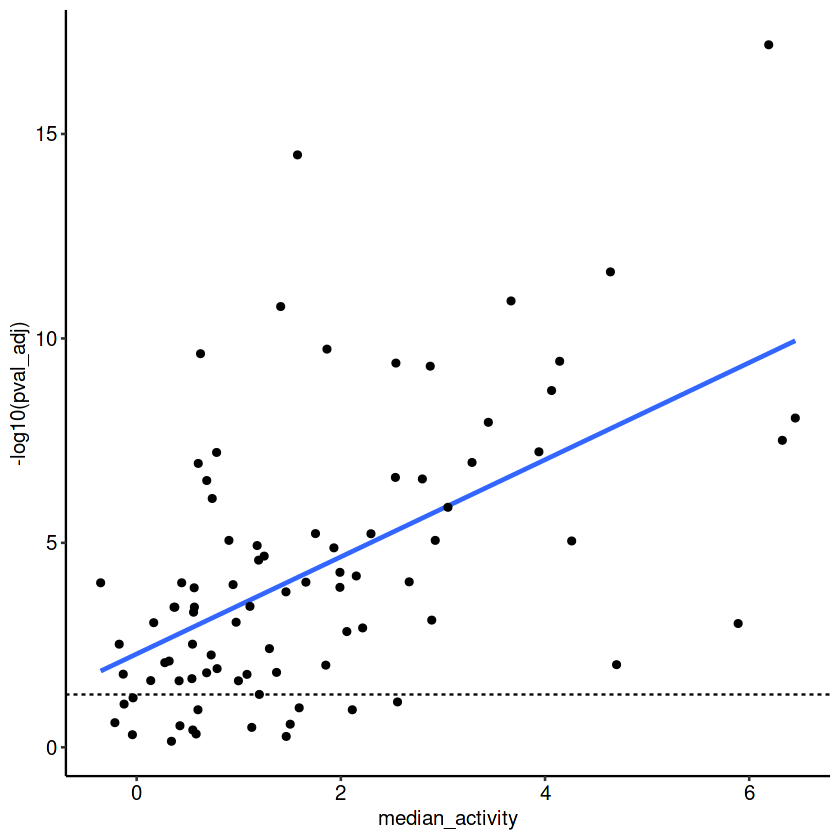

ℹ Using "','" as decimal and "'.'" as grouping mark. Use `read_delim()` for more control.

Rows: 86 Columns: 7
── Column specification ────────────────────────────────────────────────────────
Delimiter: ";"
chr (5): tf, BS, mode, class, superclass
dbl (2): BS_length, monomer_center_dist

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Joining, by = "tf"
Joining, by = "tf"
Joining, by = "tf"
Joining, by = "tf"
`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 4 rows containing missing values (`geom_vline()`).”


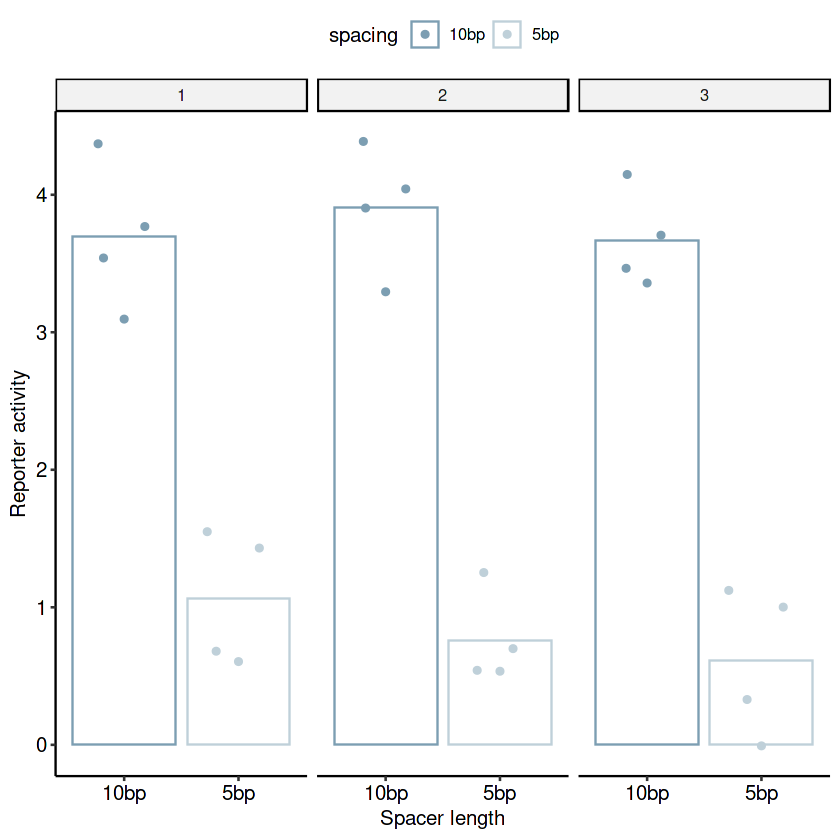

`geom_smooth()` using formula = 'y ~ x'


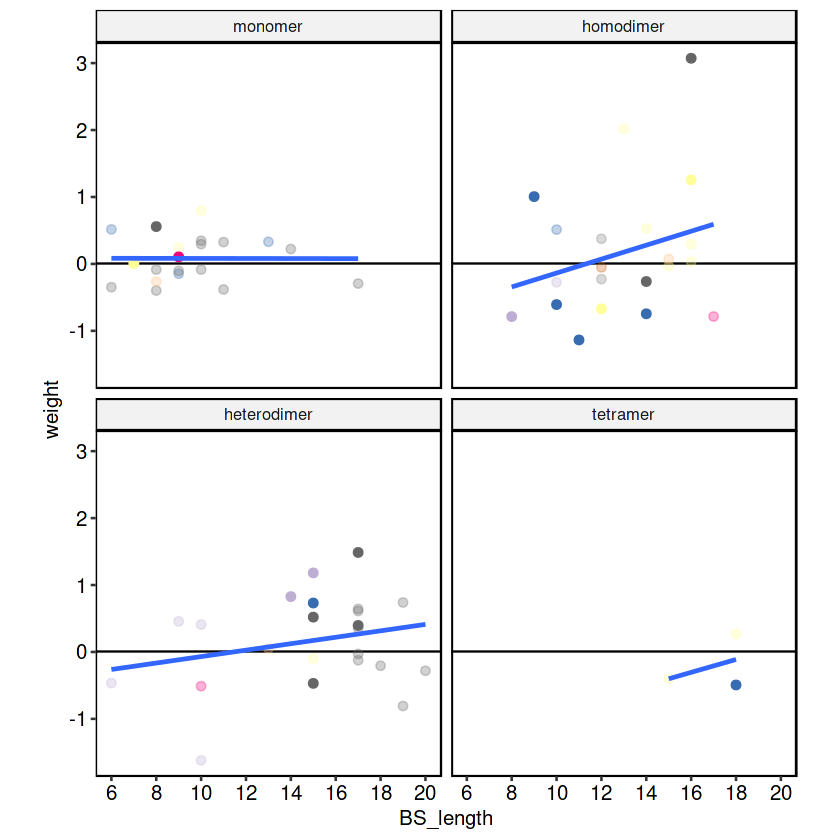

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 1 rows containing missing values (`geom_vline()`).”


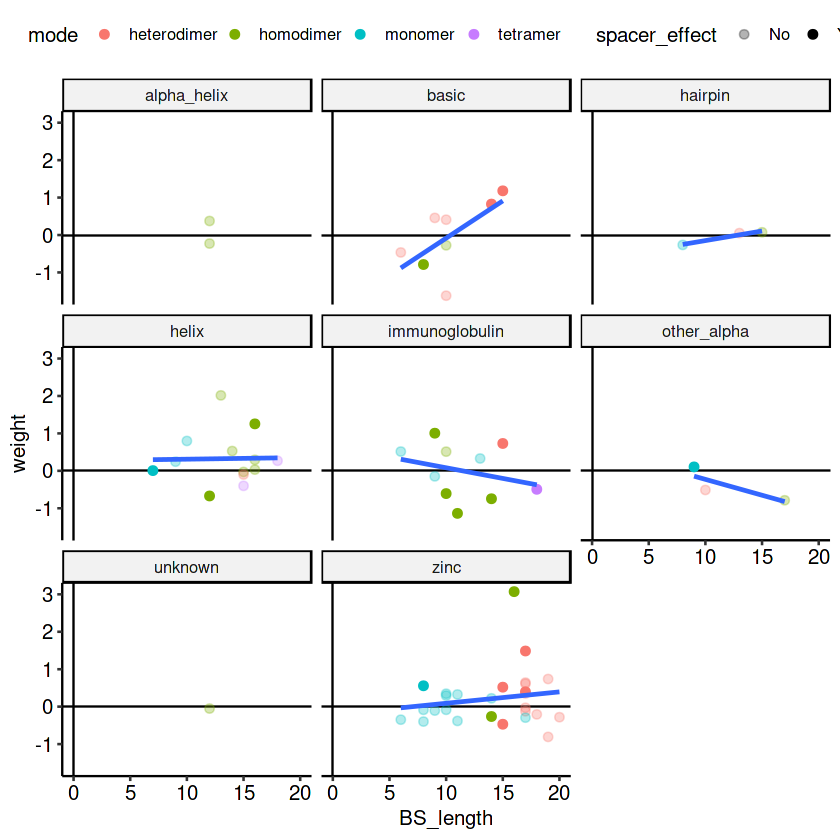

`geom_smooth()` using formula = 'y ~ x'


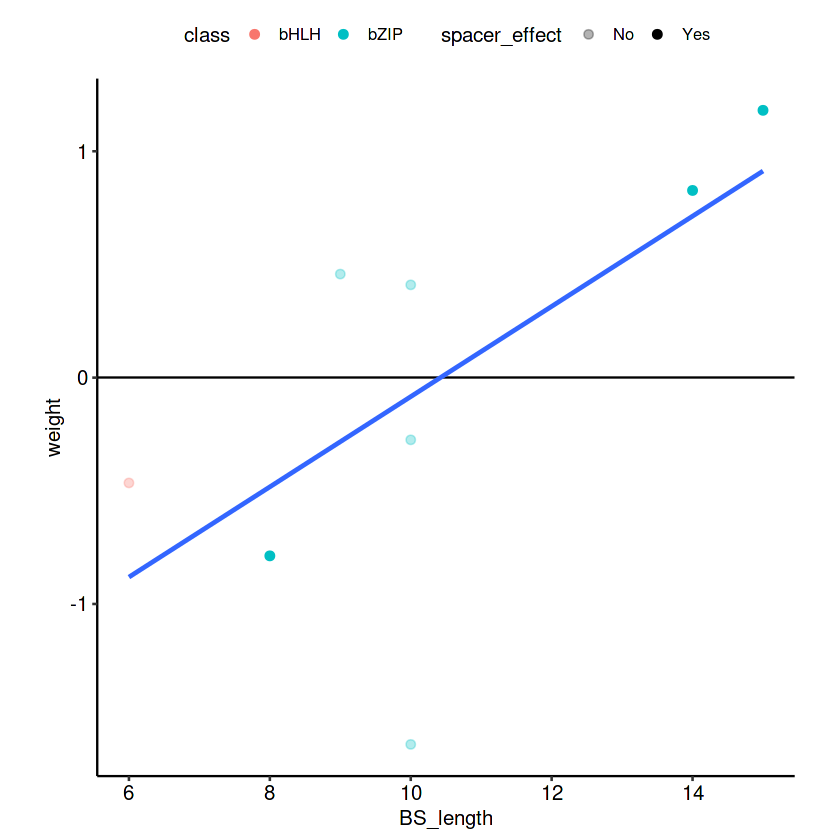

Joining, by = "tf"


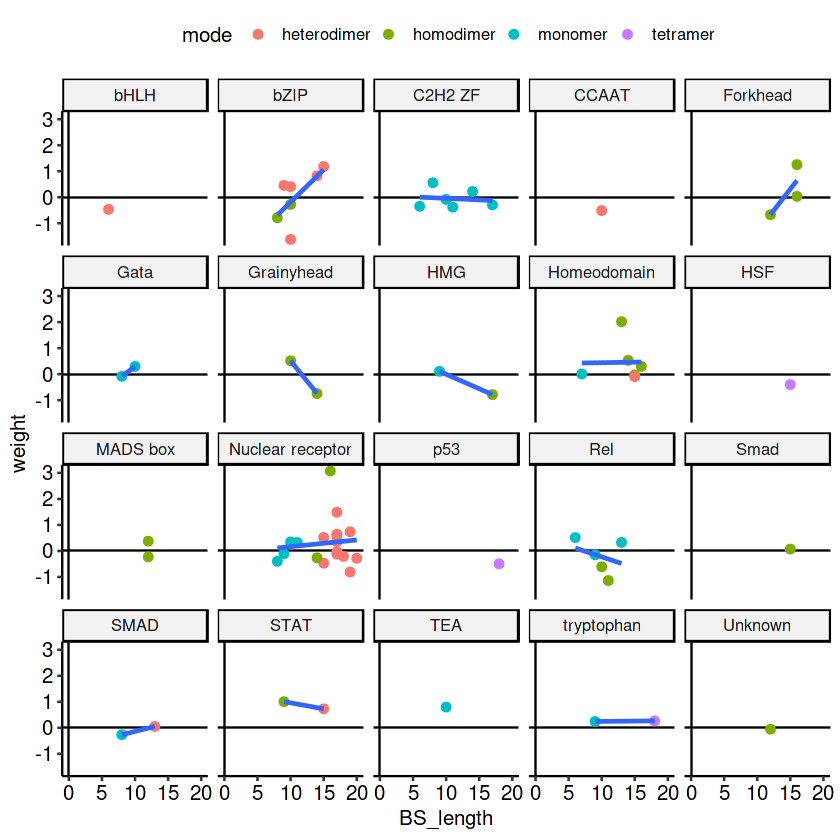

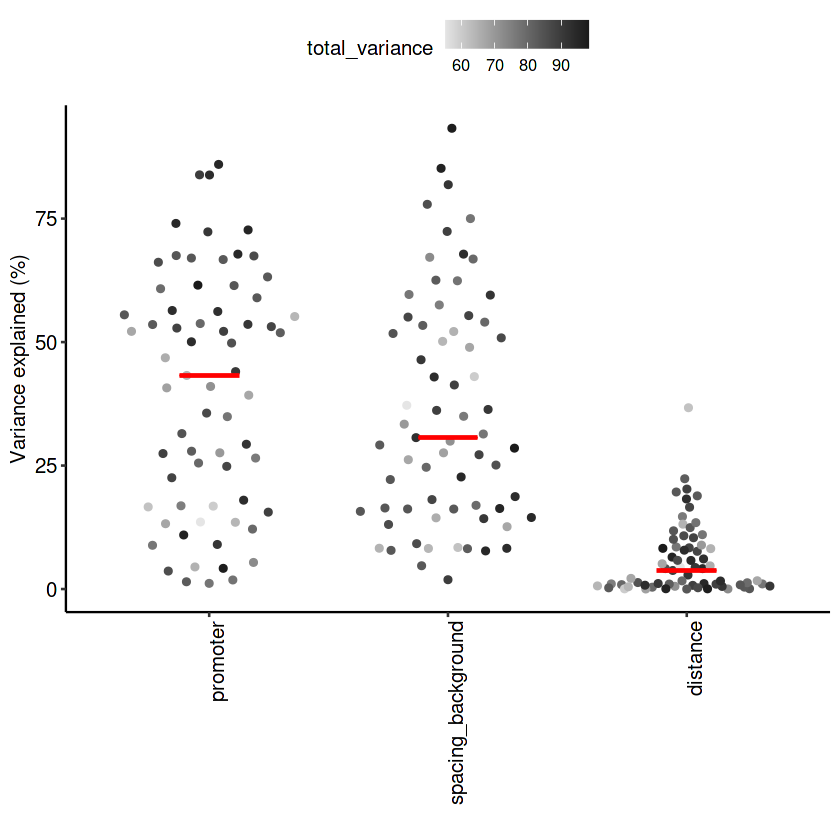

In [9]:
## Example: Predicted vs. measured for one TF
ggplot(cDNA_df_TF3 %>%
         filter(tf == "STAT3", condition == "mES_2i_LIF") %>%
         mutate(spacing = gsub(":.*", "", spacing_background)) %>%
         mutate(background = gsub(".*:", "", spacing_background)),
       aes(x = activity_predicted, y = reporter_activity_minP, color = spacing#, shape = background
           )) +
  geom_abline(lty = 2) +
  geom_point(size = 2) +
  scale_color_manual(values = c("10bp" = "#7C9EB2", "5bp" = "#BFD0D9")) +
  scale_x_continuous(breaks = c(0,2,4))+
  scale_y_continuous(breaks = c(0,2,4)) +
  theme_pubr()

weight_ex <- weight %>%
  filter(tf == "STAT3_mES_2i_LIF")

zero_weights <- weight %>%
  filter(is.na(tf)) %>%
  mutate(weight = 0, pval = 1) %>%
  mutate(tf = "STAT3_mES_2i_LIF")
                   
weight_ex <- rbind(weight_ex, zero_weights)
                   
feature_names <- data.frame("features" = c("minP", "mCMV", "hBGm", "10bp:1", "10bp:2", "10bp:3", "5bp:1",
                                           "5bp:2", "5bp:3", "10bp", "21bp"),
                            "feature_names" = c("minP", "minCMV", "minHBG", "10-bp spacer (#1)", "10-bp spacer (#2)", "10-bp spacer (#3)",
                                                "5-bp spacer (#1)", "5-bp spacer (#2)", "5-bp spacer (#3)", "10-bp distance", "21-bp distance"))
                     
weight_ex <- weight_ex %>%
  left_join(feature_names)
                   

ggplot(weight_ex %>% 
         mutate(sign = ifelse(pval < 0.05, "Yes", "No")) %>%
         mutate(feature_names = factor(feature_names, levels = c("minP", "minCMV", "minHBG", "10-bp distance", "21-bp distance",
                                                                 "10-bp spacer (#1)", "10-bp spacer (#2)", "10-bp spacer (#3)",
                                                                 "5-bp spacer (#1)", "5-bp spacer (#2)", "5-bp spacer (#3)"))),
       aes(x = feature_names, y = weight, alpha = sign)) +
  geom_hline(yintercept = 0) +
  geom_bar_interactive(stat = "identity", color = "black", width = .75) +
  ylab("Weight") + 
  xlab("Reporter design feature") +
  theme_pubr(x.text.angle = 90) +
  scale_alpha_discrete(range = c(0.3,1))

## Explore weights for all TFs
cDNA_df_TF5 <- cDNA_df_TF4 %>%
  mutate(tf = paste(tf, condition, sep = "_")) %>%
  distinct(tf, pval_adj)

### Add total variances as bar plot
exp_variance2 <- exp_variance %>%
  filter(tf %in% chosen_conditions$tf_condition) %>%
  filter(feature == "total") %>%
  dplyr::select(tf, "total_variance" = rel_sum_sq)

weight2 <- weight %>%
  filter(tf %in% chosen_conditions$tf_condition) %>%
  left_join(cDNA_df_TF5) %>%
  #filter(pval_adj < .005) %>%
  left_join(exp_variance2) %>%
  filter(total_variance > 52 & pval_adj < 0.05) %>% ## change to 65, 0.01
  mutate(tf = gsub("_.*", "", tf)) %>%
  mutate(weight = ifelse(pval > 0.01, 0, weight)) %>%
  distinct(tf, features, weight) %>%
  spread(key = "features", value = "weight") %>%
  column_to_rownames("tf") %>%
  filter(rowSums(., na.rm = T) != 0)

myBreaks <- c(seq(-2, 0, length.out=50+1), 
              seq(0.000001, 2, length.out=50))

pheatmap(weight2 %>%
                  t(),
         clustering_method = "ward.D2",
         cellwidth = 10,
         cellheight = 10,
         border_color = F,
         color = colorRampPalette(rev(brewer.pal(n = 7, name = "RdBu")))(100),
         angle_col = 90,
         cluster_cols = T,
         cutree_cols = 6,
         cutree_rows = 4,
         breaks = myBreaks)

## Plot quality of fit versus median reporter activity
quality_corr <- cDNA_df_TF3 %>%
  mutate(median_activity = ave(reporter_activity_minP, tf, FUN = median)) %>%
  mutate(tf_condition = paste(tf, condition, sep = "_")) %>%
  distinct(median_activity, pval_adj, tf_condition) %>%
  filter(tf_condition %in% chosen_conditions$tf_condition)

ggplot(quality_corr, aes(x = median_activity, y = -log10(pval_adj))) +
  geom_smooth(method = "lm", se = F) +
  geom_hline(yintercept = -log10(0.05), lty = 2) +
  geom_point() +
  theme_pubr()

## Figure S3C: HNF1A spacer length impact
reporter_features <- cDNA_df %>%
  distinct(promoter, spacing, distance, background, tf, reporter_id)

hnf1a_activities <- cDNA_df_TF3 %>%
  filter(tf == "HNF4A", condition == "HepG2_FBS") %>%
  left_join(reporter_features) %>%
  distinct(reporter_id, spacing, background, reporter_activity_minP) %>%
  mutate(mean_spacer_activity = ave(reporter_activity_minP, spacing, background, FUN = mean))
  
ggplot() +
  geom_bar(data = hnf1a_activities %>% distinct(spacing, background, mean_spacer_activity), 
           mapping = aes(x = spacing, y = mean_spacer_activity, color = spacing), stat = "identity", fill = "white") +
  geom_quasirandom(data = hnf1a_activities, 
                   mapping = aes(x = spacing, y = reporter_activity_minP, color = spacing)) +
  theme_pubr() +
  scale_color_manual(values = c("10bp" = "#7C9EB2", "5bp" = "#BFD0D9")) +
  xlab("Spacer length") +
  ylab("Reporter activity") +
  facet_wrap(~background)


## Investigate hits with strong impact on spacer length
tf_properties <- read_csv2("/DATA/usr/m.trauernicht/projects/SuRE-TF/data/tf_binding_characterization.csv")

weight_spacing <- weight %>%
  filter(tf %in% chosen_conditions$tf_condition) %>%
  left_join(cDNA_df_TF5) %>%
  mutate(spacer_length = gsub(":.*", "", features)) %>%
  filter(condition == "spacing_background") %>%
  mutate(weight_spacer_min = ave(abs(weight), tf, spacer_length, FUN = min)) %>%
  mutate(weight_spacer_max = ave(abs(weight), tf, spacer_length, FUN = max)) %>%
  mutate(weight_spacer_length = ave(weight, tf, spacer_length, FUN = mean)) %>%
  dplyr::select(-features, -pval, -weight, -pval_adj) %>%
  distinct()

weight_spacing_length_sign <- weight_spacing %>%
  filter(spacer_length == "5bp") %>%
  distinct(tf, weight_spacer_max)
  
weight_spacing_length_sign2 <- weight_spacing %>%
  filter(spacer_length == "10bp") %>%
  distinct(tf, weight_spacer_min)

weight_spacing_length <- weight_spacing %>%
  dplyr::select(-weight_spacer_min, -weight_spacer_max) %>%
  spread(key = "spacer_length", value = "weight_spacer_length") %>%
  left_join(weight_spacing_length_sign) %>%
  left_join(weight_spacing_length_sign2) %>%
   mutate(tf = gsub("_.*", "", tf)) %>%
  mutate(spacer_effect = ifelse((weight_spacer_min > .25 & weight_spacer_max < 1) | tf %in% c("STAT3"), "Yes", "No")) %>%
  mutate(weight = `10bp` - `5bp`) %>%
  filter(tf %in% rownames(weight2)) %>%
  distinct(tf, weight, spacer_effect) %>%
  left_join(tf_properties)

## Transform to helical turns
weight_spacing_length2 <- weight_spacing_length %>%
  mutate(BS_spacer1 = monomer_center_dist + 5) %>%
  mutate(BS_spacer2 = monomer_center_dist + 10) %>%
  mutate(spacing_rotation1 = (BS_spacer1) / 10.5) %>%
  mutate(spacing_rotation2 = (BS_spacer2) / 10.5) %>%
  mutate(spacing_degree1 = 2*pi * spacing_rotation1) %>%
  mutate(spacing_degree2 = 2*pi * spacing_rotation2) %>%
  #mutate(spacing_degree = ifelse(is.infinite(spacing_degree), 0, spacing_degree)) %>%
  mutate(spacing_degree_transf1 = cos(spacing_degree1)) %>%
  mutate(spacing_degree_transf2 = cos(spacing_degree2)) %>%
  mutate(dif_spacing = -spacing_degree_transf1 + spacing_degree_transf2)

## Figure 3F: Spacer length importance per binding mode (export 4x4)
ggplot(weight_spacing_length2 %>% 
         mutate(mode = factor(mode, levels = c("monomer", "homodimer", "heterodimer", "tetramer"))),
       aes(x = BS_length, y = weight)) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_point(size = 2, aes(color = superclass, alpha = spacer_effect)) +
  geom_smooth(method = "lm", se = F) +
  theme_pubr(legend = "none", border = T) +
  theme(aspect.ratio = 1) +
  scale_color_manual(values = c("basic" = "#BEAED4", "helix" = "#FFFF99", "zinc" = "#666666", "immunoglobulin" = "#386CB0",
                                "hairpin" = "#FDC086", "other_alpha" = "#F0027F", "alpha" = "#7FC97F", "unknown" = "#BF5B17")) +
  scale_alpha_manual(values = c(0.3, 1)) + 
  scale_x_continuous(breaks = seq(6, 20, 2), limits = c(6, 20)) +
  facet_wrap(~mode)

ggplot(weight_spacing_length2,
       aes(x = BS_length, y = weight)) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_point(size = 2, aes(color = mode, alpha = spacer_effect)) +
  geom_smooth(method = "lm", se = F) +
  theme_pubr() +
  scale_alpha_manual(values = c(0.3, 1)) +
  facet_wrap(~superclass)

## Figure S3D: Zoom in on bZIP TFs (export 4x4)
ggplot(weight_spacing_length2 %>% filter(superclass == "basic"),
       aes(x = BS_length, y = weight)) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_point(size = 2, aes(color = class, alpha = spacer_effect)) +
  geom_smooth(method = "lm", se = F) +
  scale_x_continuous(breaks = seq(6, 15, 2), limits = c(6, 15)) +
  theme_pubr() +
  theme(aspect.ratio = 1) +
  scale_alpha_manual(values = c(0.3, 1))

ggplot(weight_spacing_length2,
       aes(x = BS_length, y = weight)) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_point(size = 2, aes(color = mode)) +
  geom_smooth(method = "lm", se = F) +
  theme_pubr() +
  facet_wrap(~class)




## Overview figures: which features matter how much and for which TF?
exp_variance_plot <- exp_variance %>%
  filter(tf %in% chosen_conditions$tf_condition) %>%
  mutate(tf = gsub("_.*", "", tf)) %>%
  mutate(text = paste("TF =", tf)) %>%
  filter(tf %in% unique(rownames(weight2)))

total_variance <- exp_variance_plot %>%
  filter(feature == "total") %>%
  dplyr::select(tf, "total_variance" = rel_sum_sq)

exp_variance_plot <- exp_variance_plot %>%
  filter(feature != "total") %>%
  left_join(total_variance) %>%
  #filter(total_variance > 50) %>%
  mutate(mean_rel_sum_sq = ave(rel_sum_sq, feature, FUN = mean))

## (export 3x3.5)
ggplot(exp_variance_plot,
         aes(x = reorder(feature, -mean_rel_sum_sq), y = rel_sum_sq, color = total_variance)) +
  geom_quasirandom() +
  stat_summary(fun = median, fun.min = median, fun.max = median, geom = "crossbar", color = "red", width = 0.25, lwd = 0.4) +
  ylab("Variance explained (%)") + xlab("") +
  scale_color_gradient(low = "grey90", high = "grey10") +
  theme_pubr(x.text.angle = 90)

Conclusion: There are a lot of interesting observations. Many TFs seem to require a specific reporter spacer sequence and length.

---
### Reporter quality score computation
Aim: We want to find for each TF the optimal reporters. Here I combine all data to compute reporter quality scores to find the best reporters for each TF.

Joining, by = "reporter_id"
Joining, by = c("reporter_id", "tf", "commercial_reporter")
Joining, by = c("reporter_id", "tf", "commercial_reporter")
Joining, by = "tf"


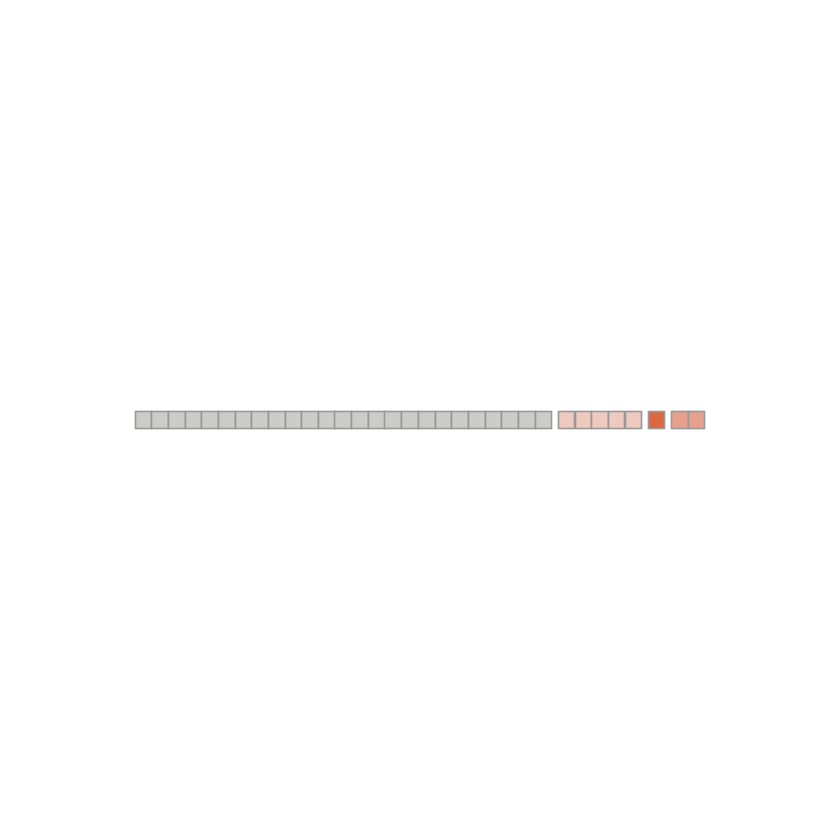

Joining, by = "reporter_id"
Joining, by = "feature"


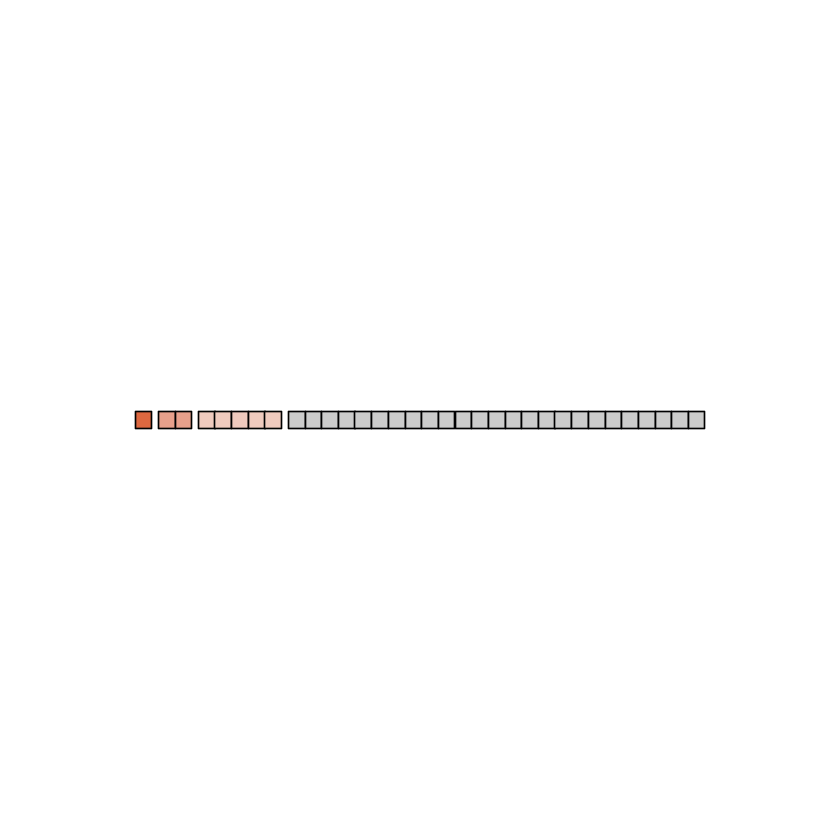

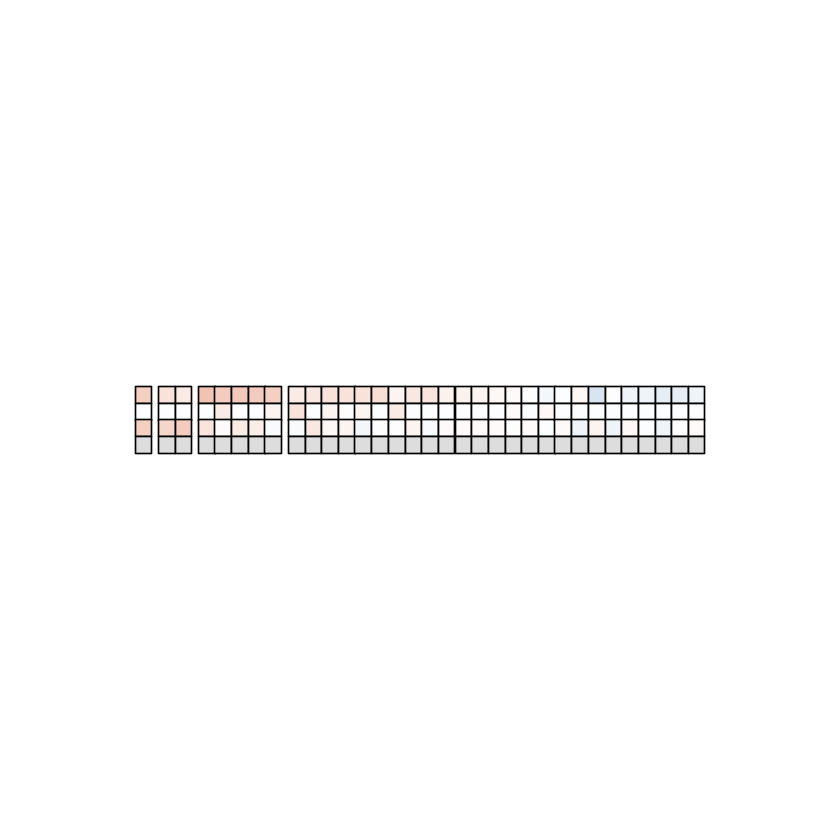

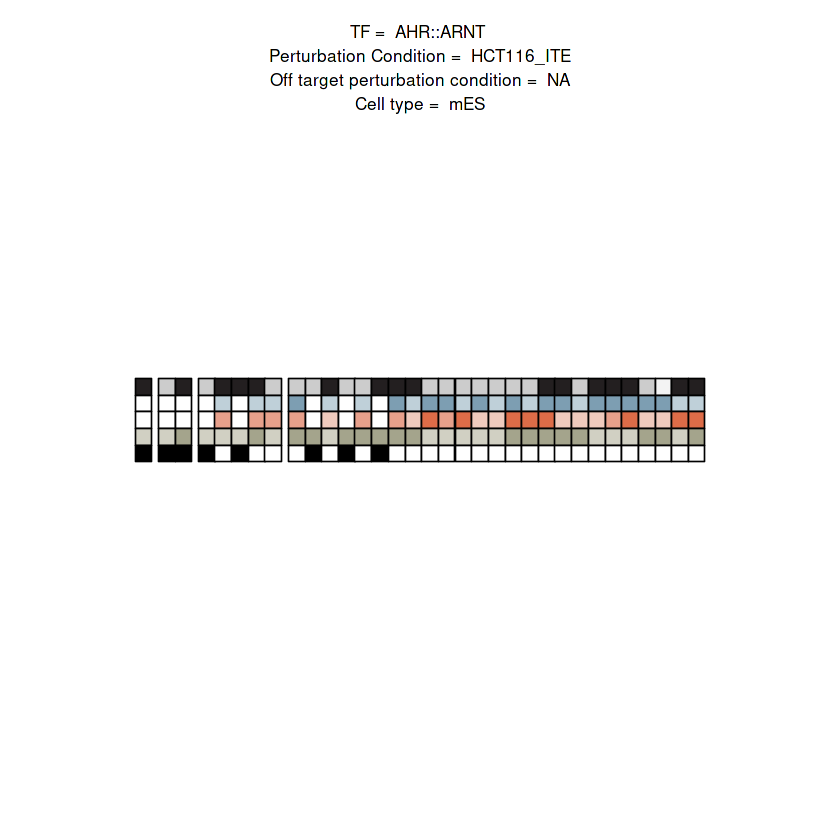

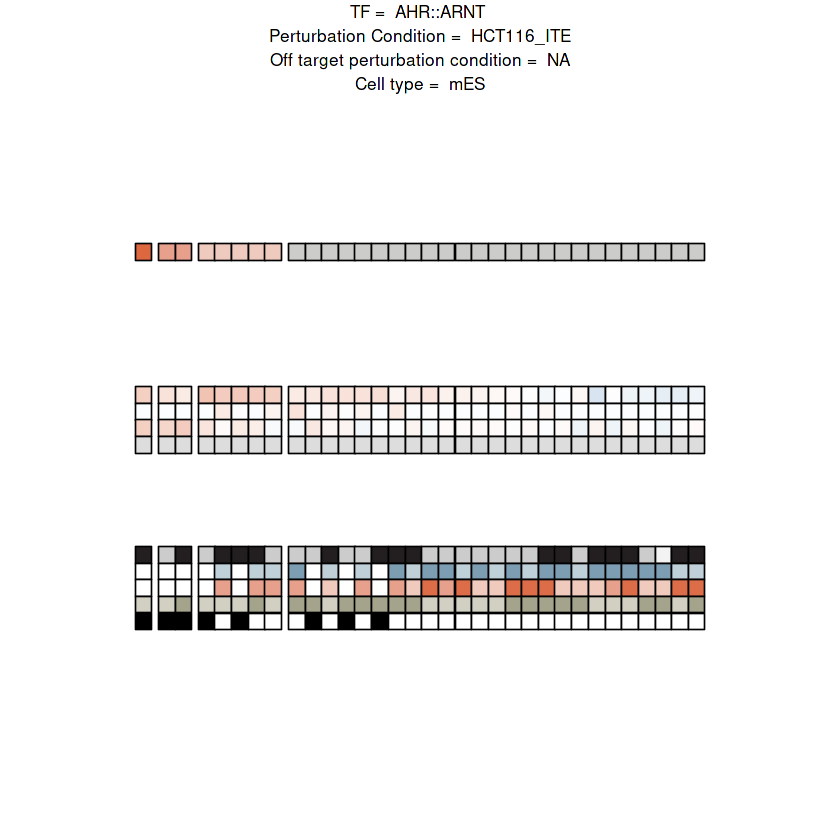

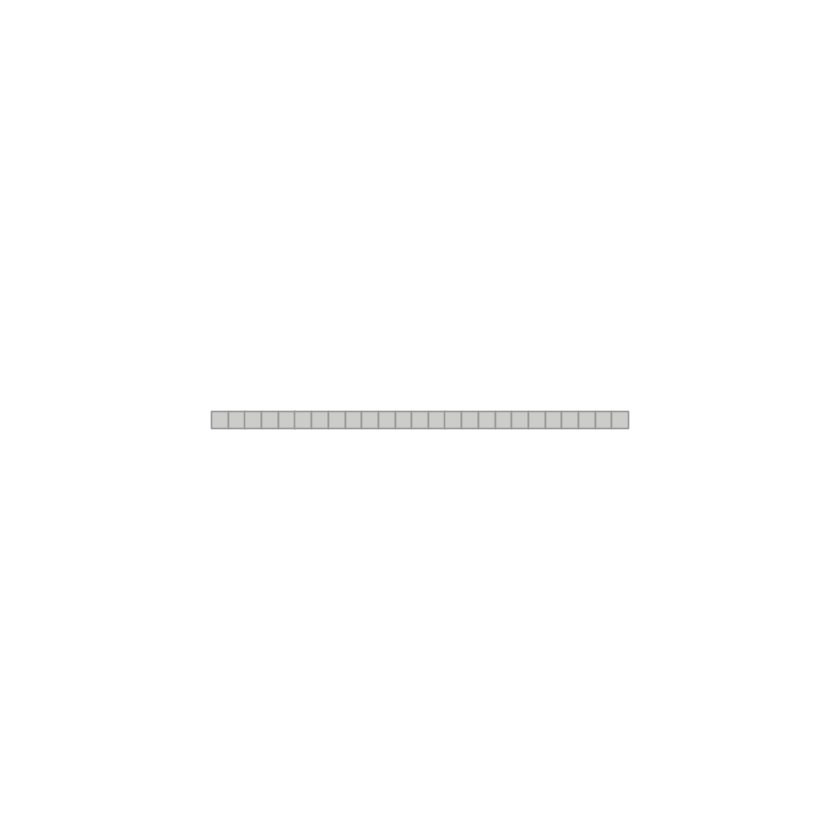

Joining, by = "reporter_id"
Joining, by = "feature"


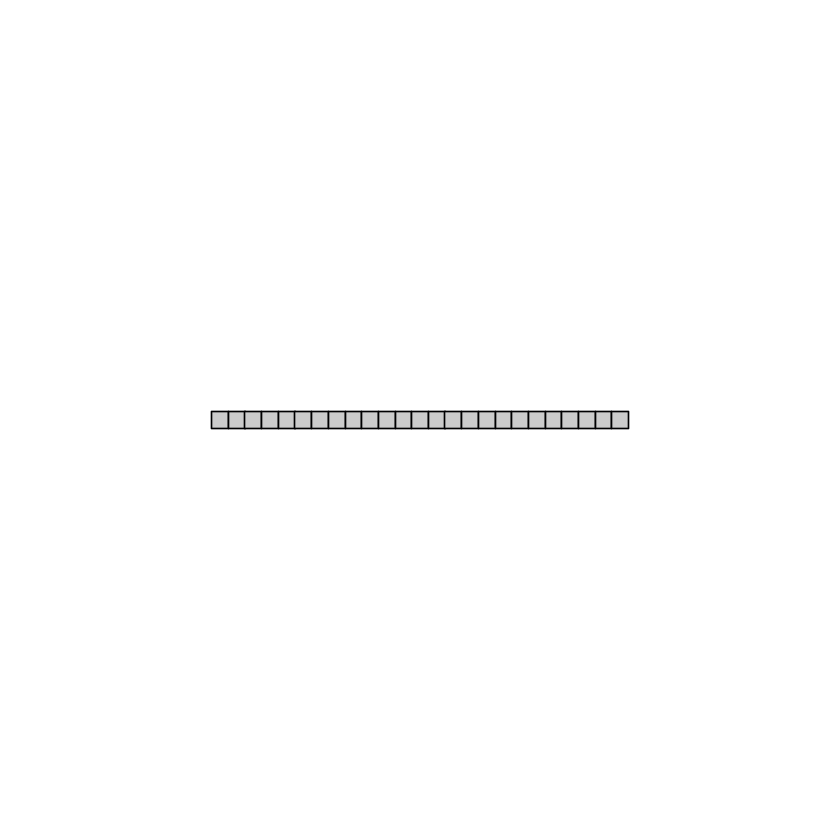

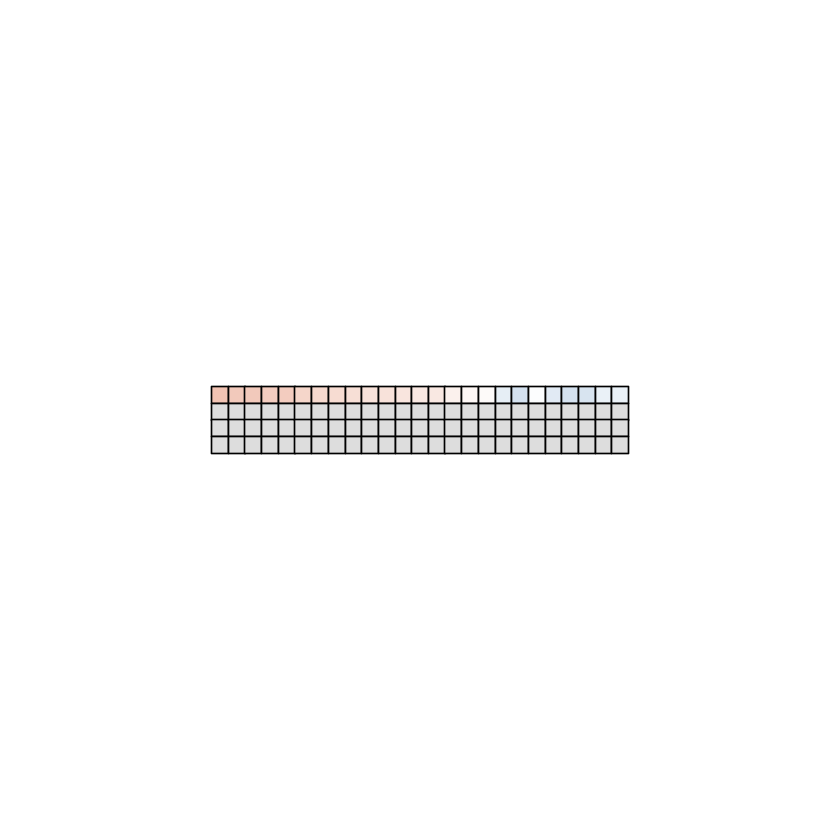

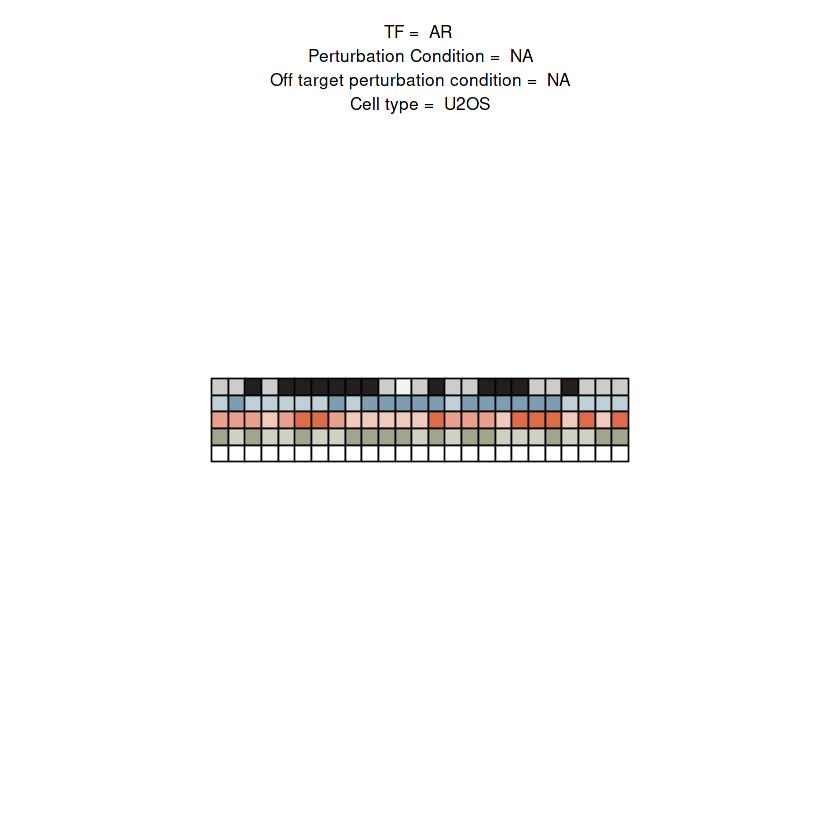

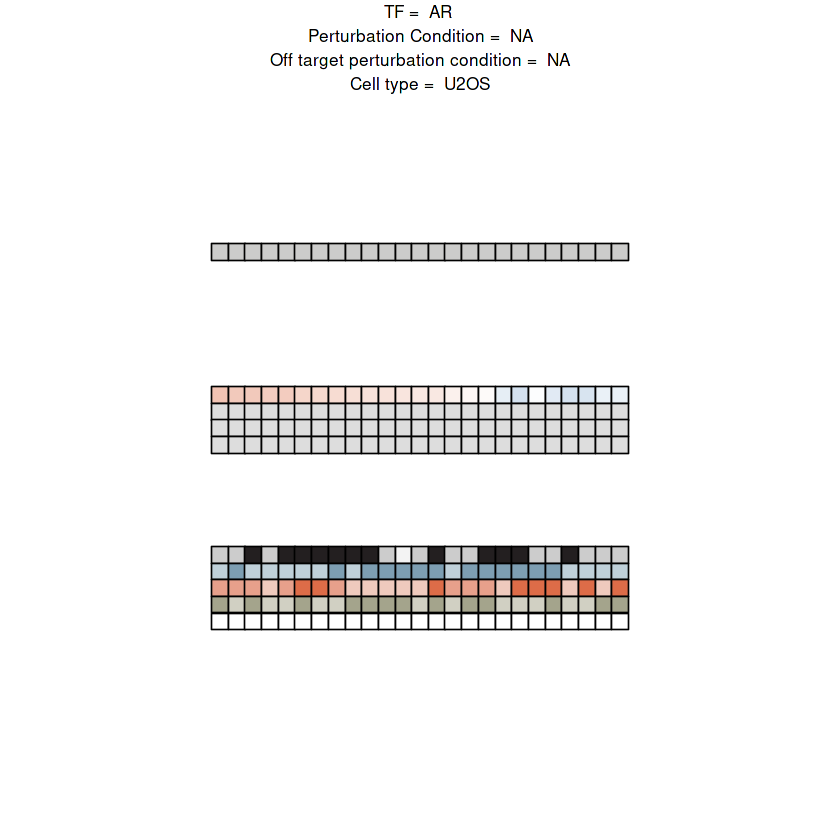

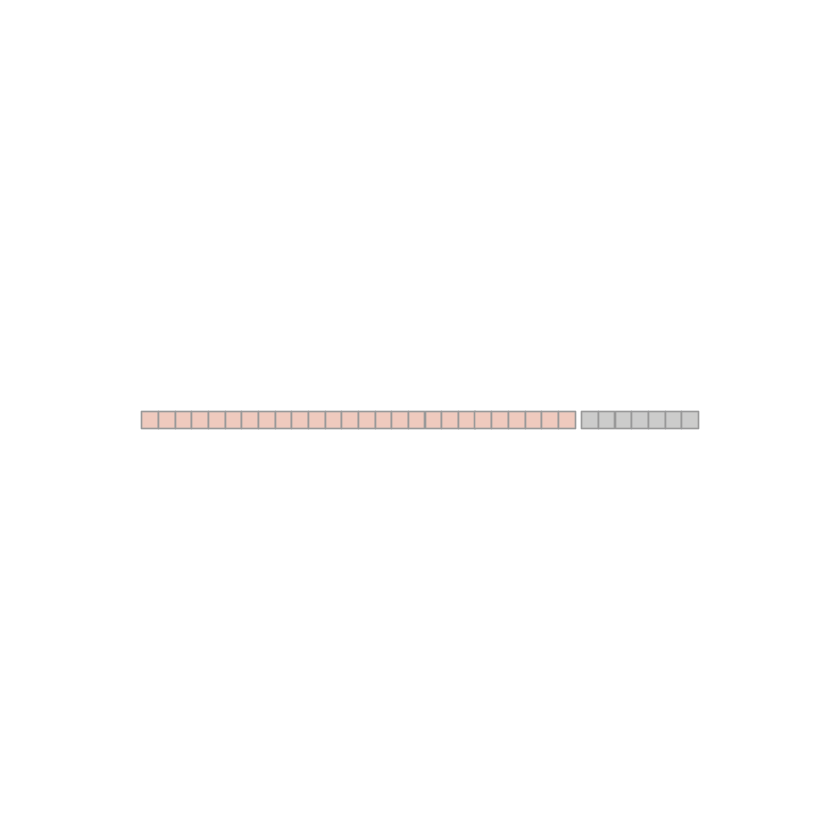

Joining, by = "reporter_id"
Joining, by = "feature"


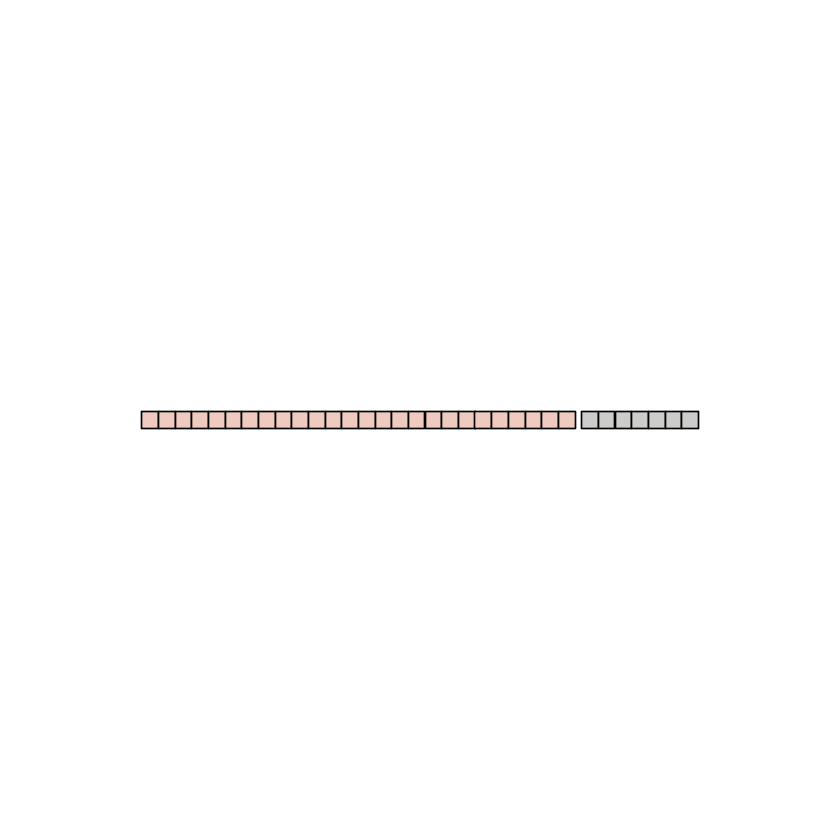

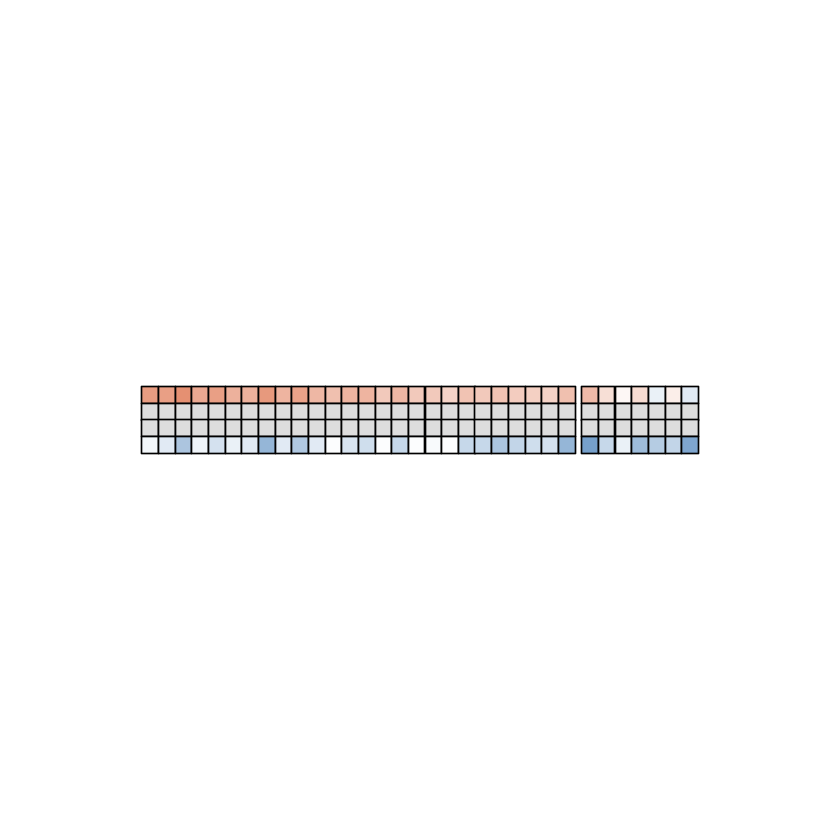

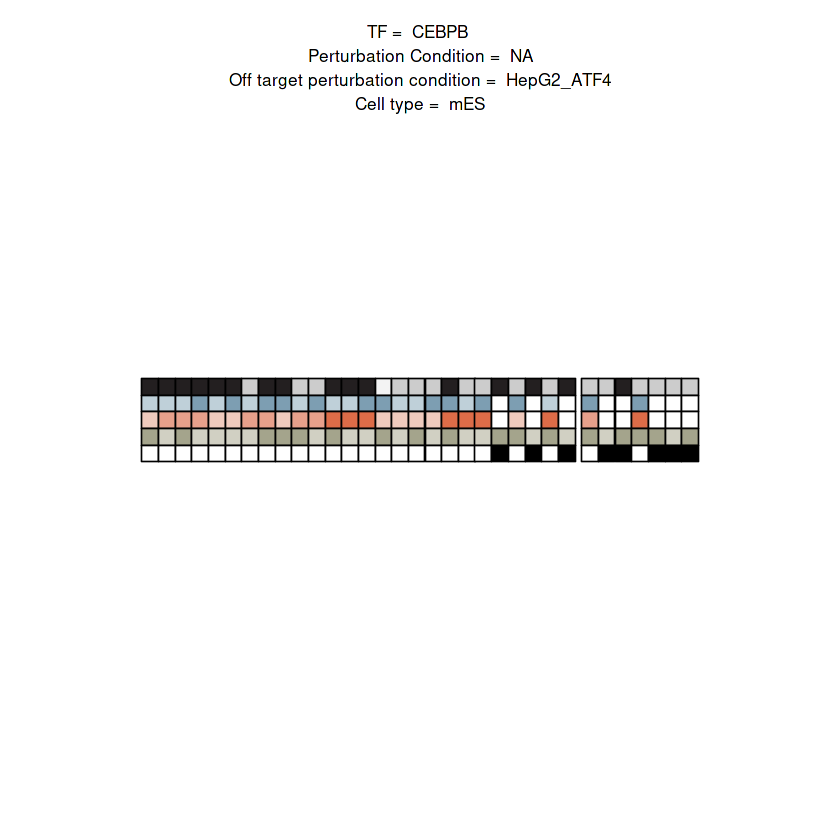

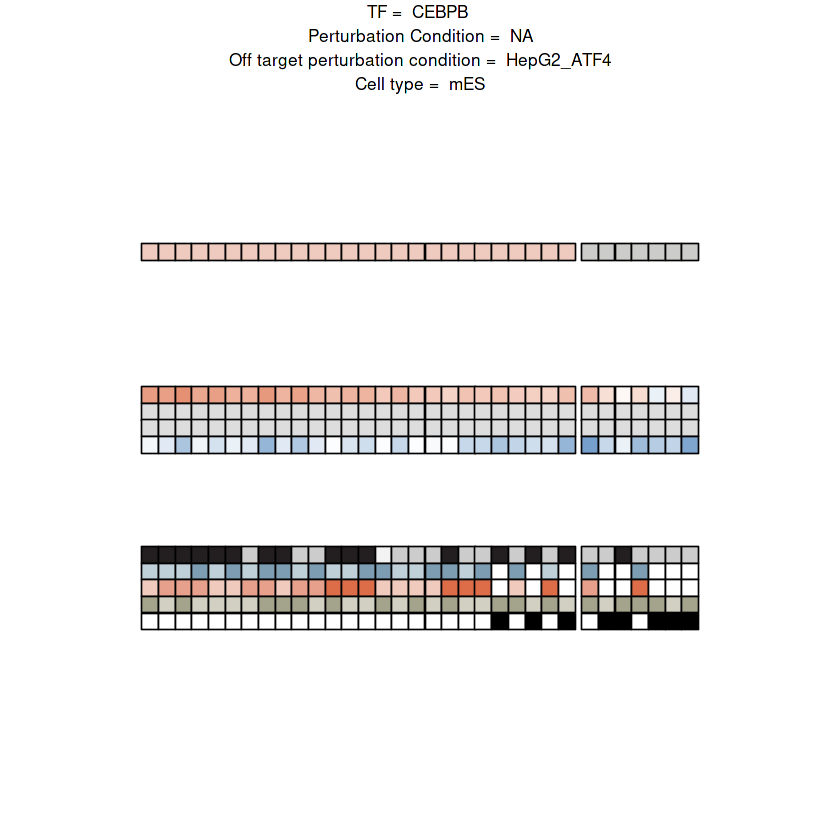

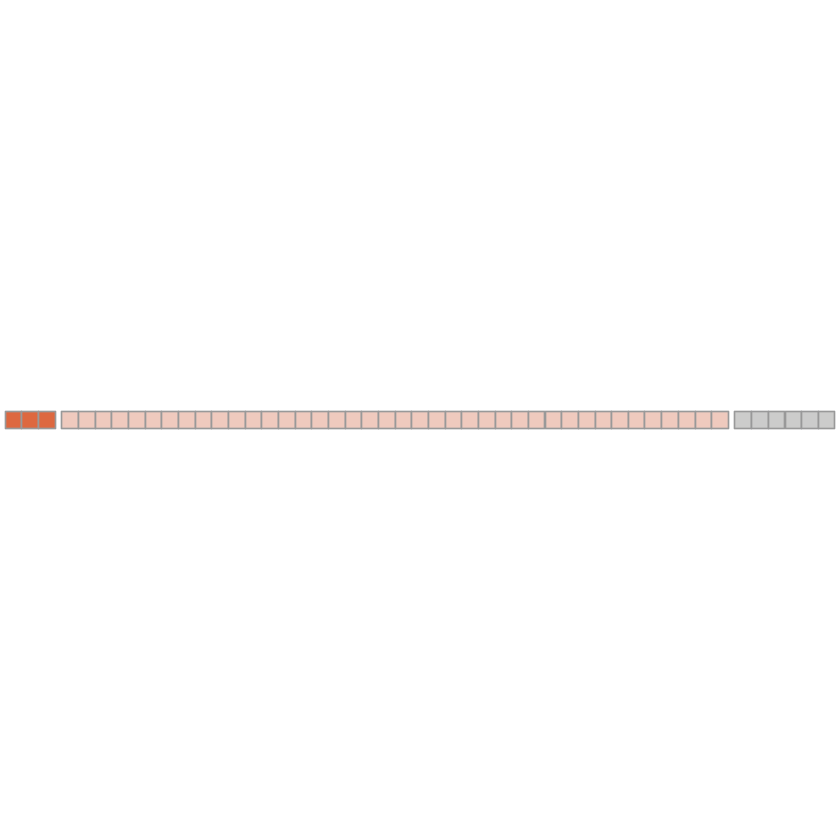

Joining, by = "reporter_id"
Joining, by = "feature"


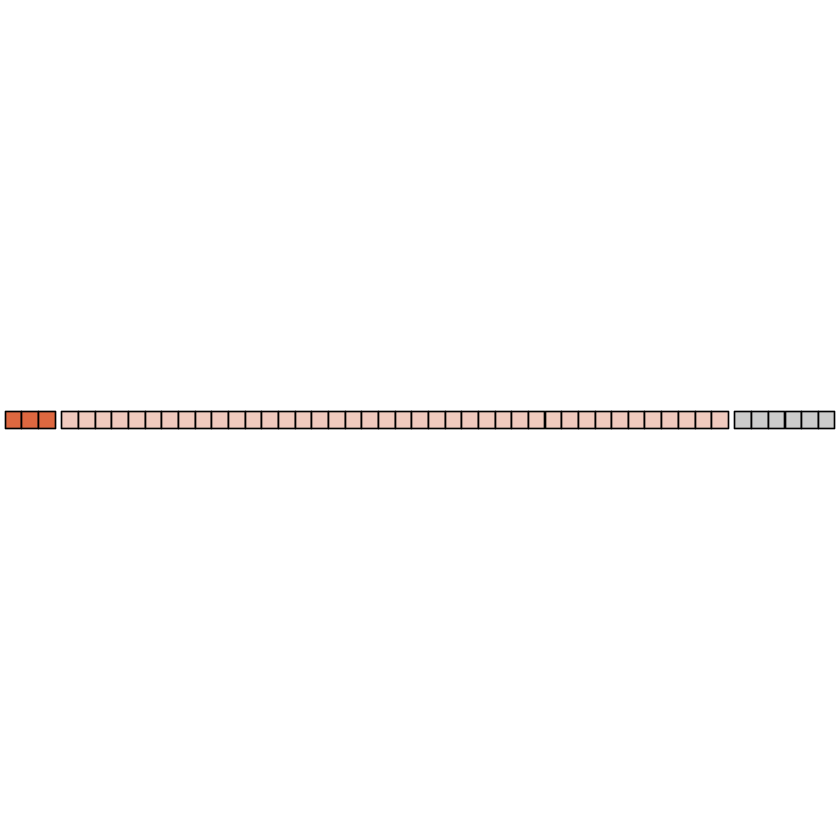

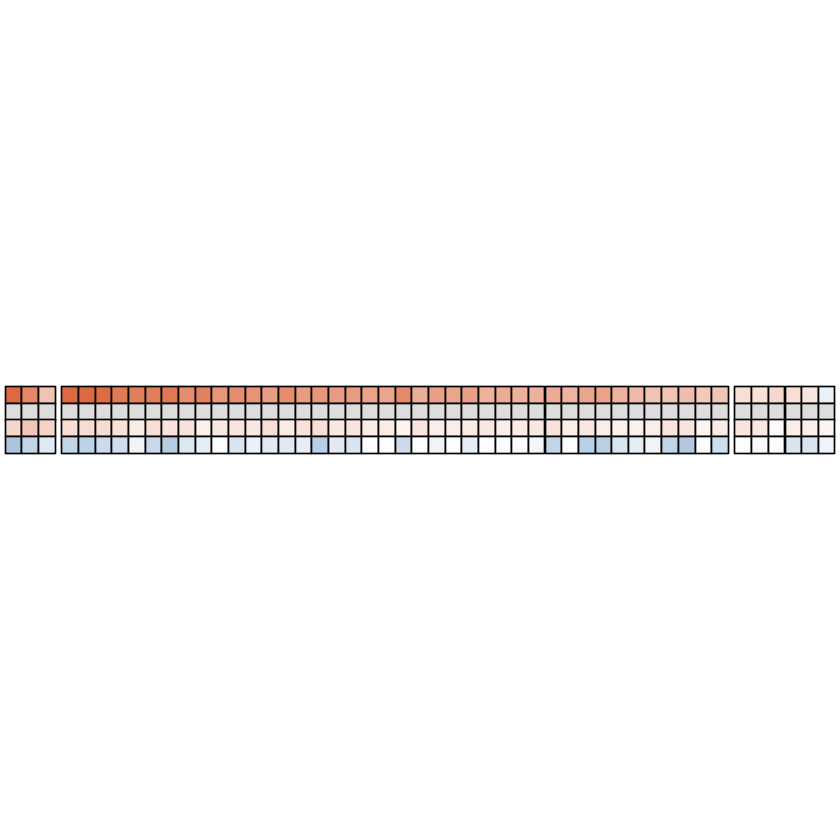

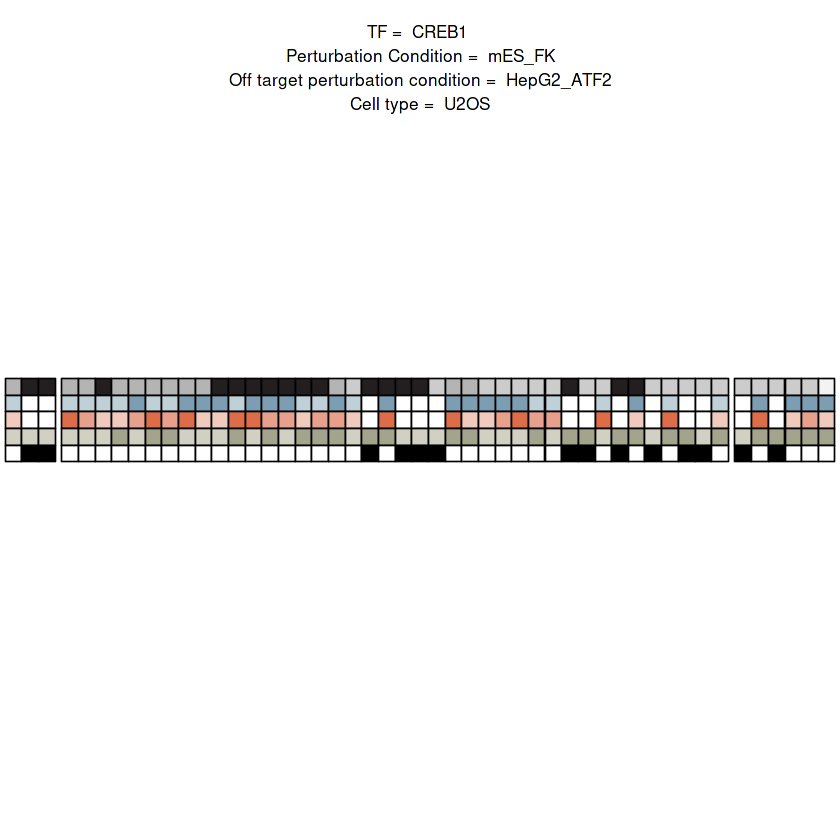

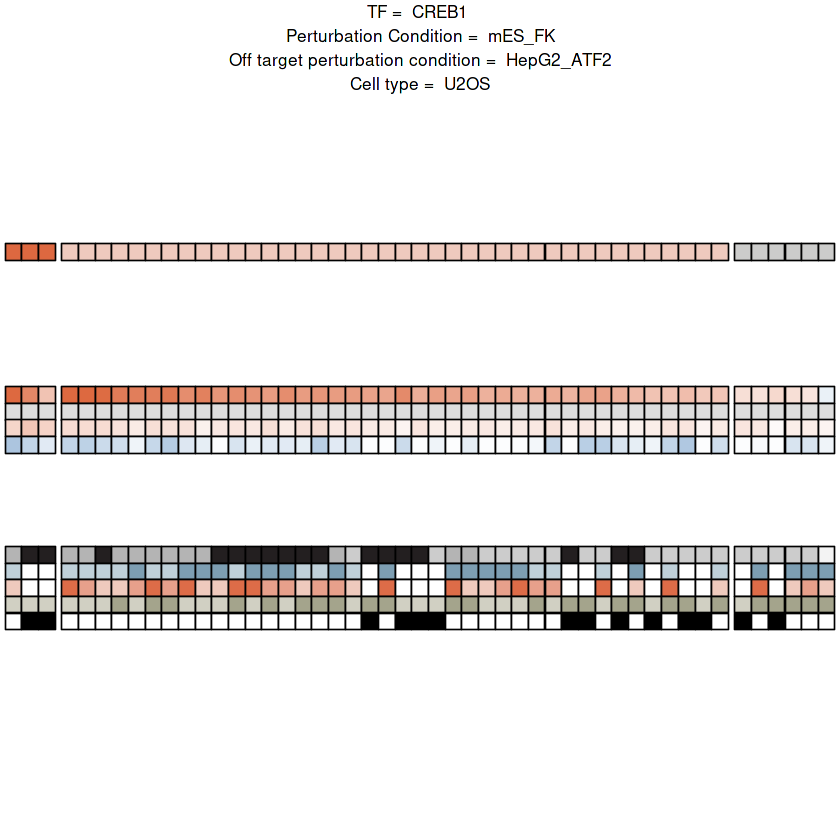

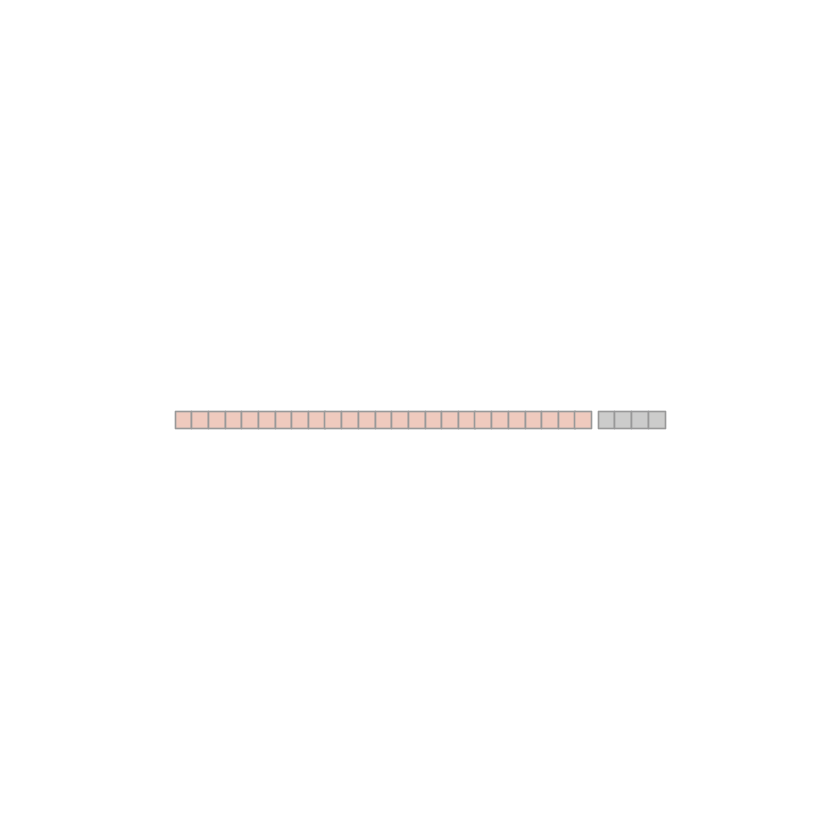

Joining, by = "reporter_id"
Joining, by = "feature"


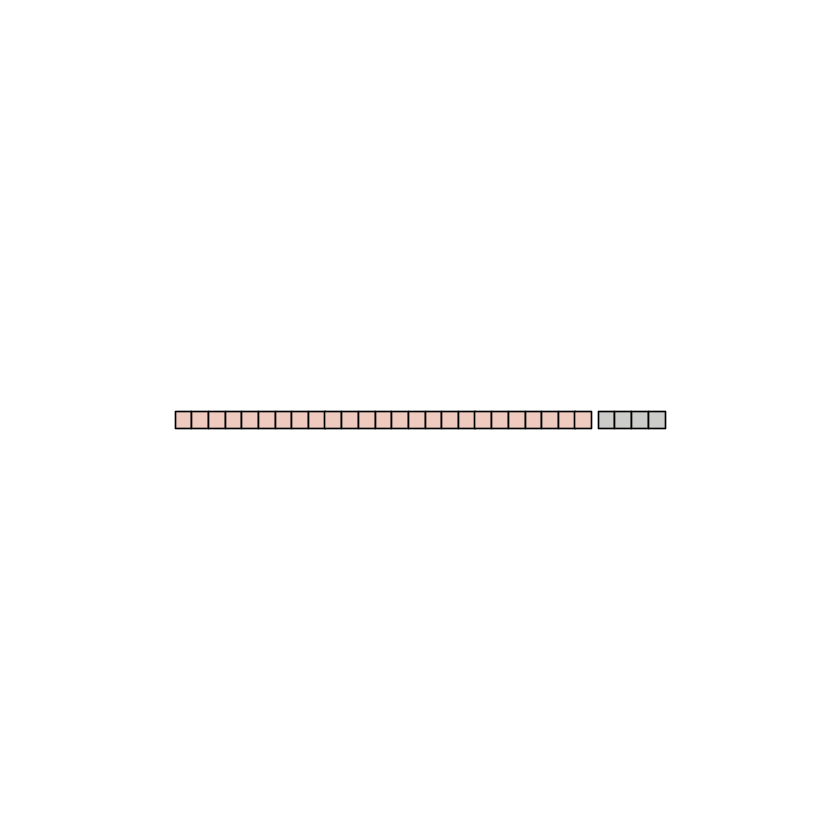

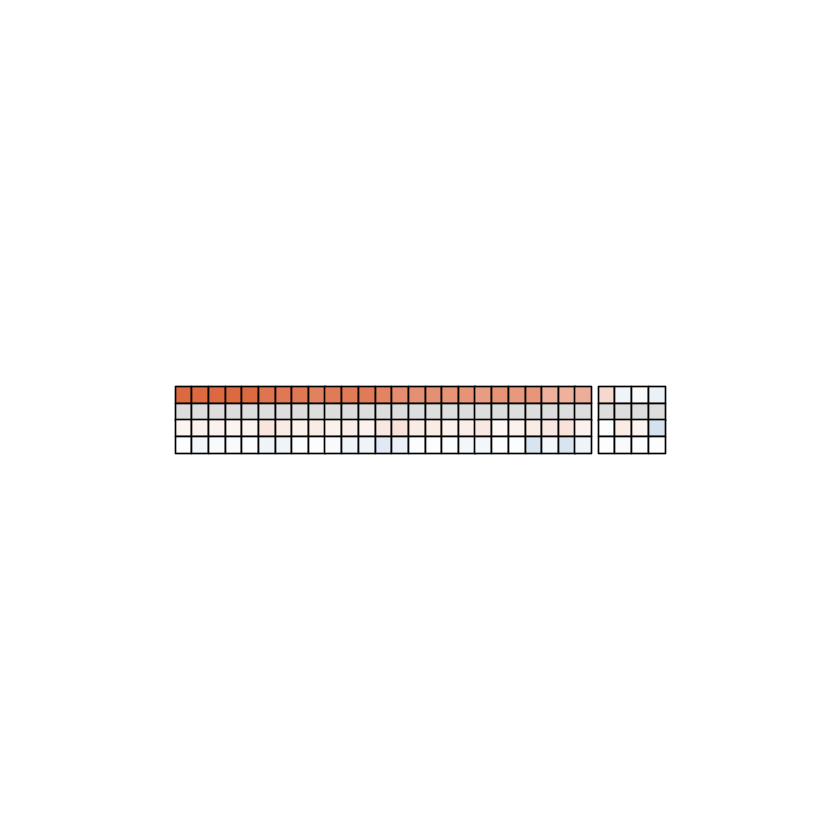

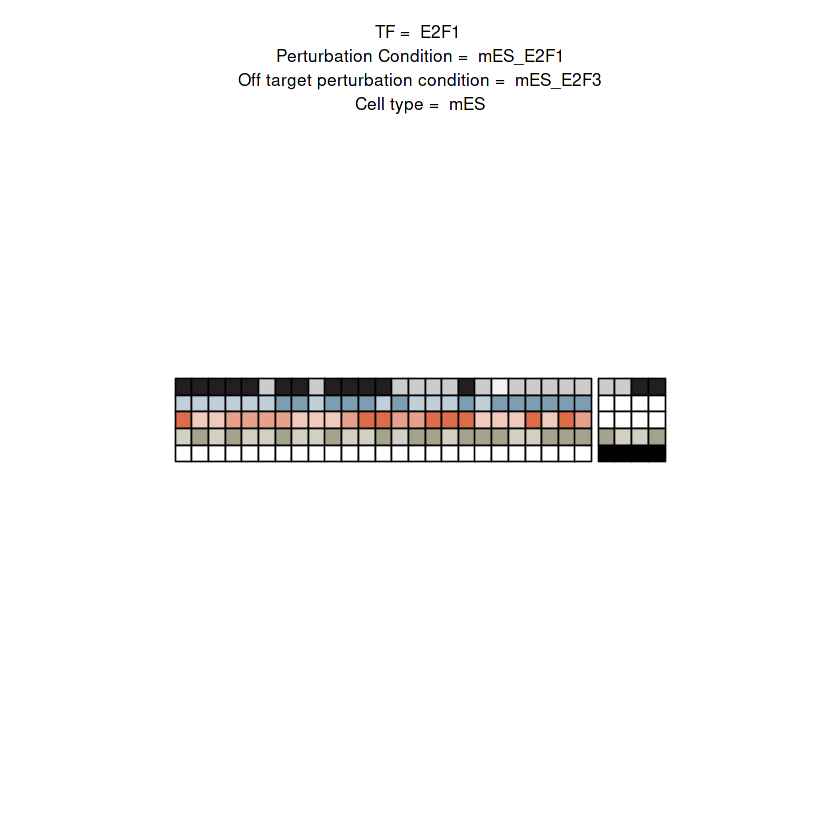

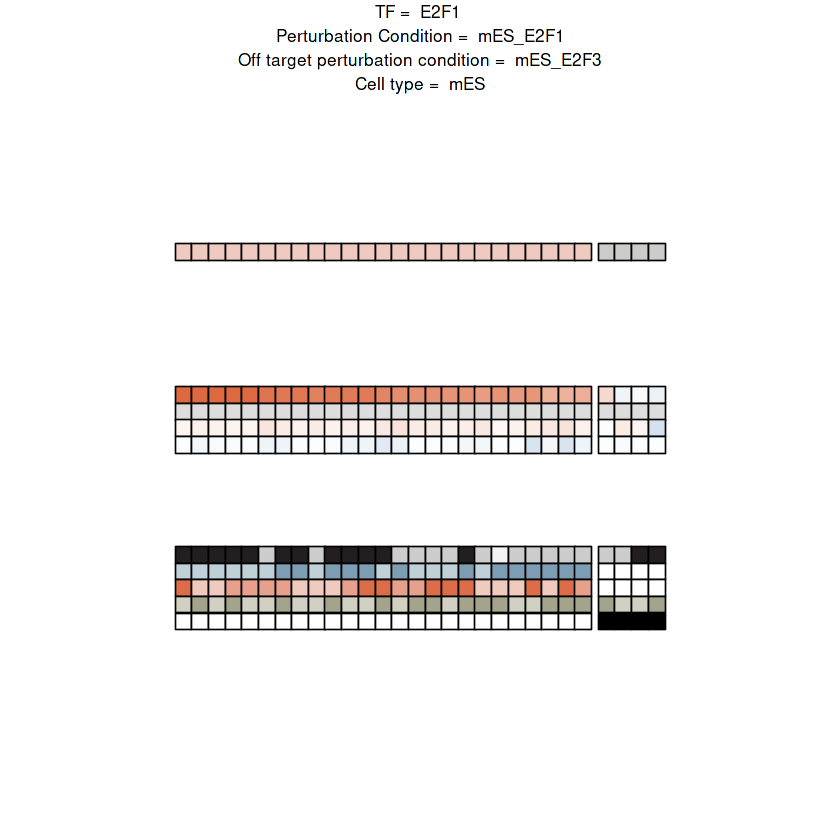

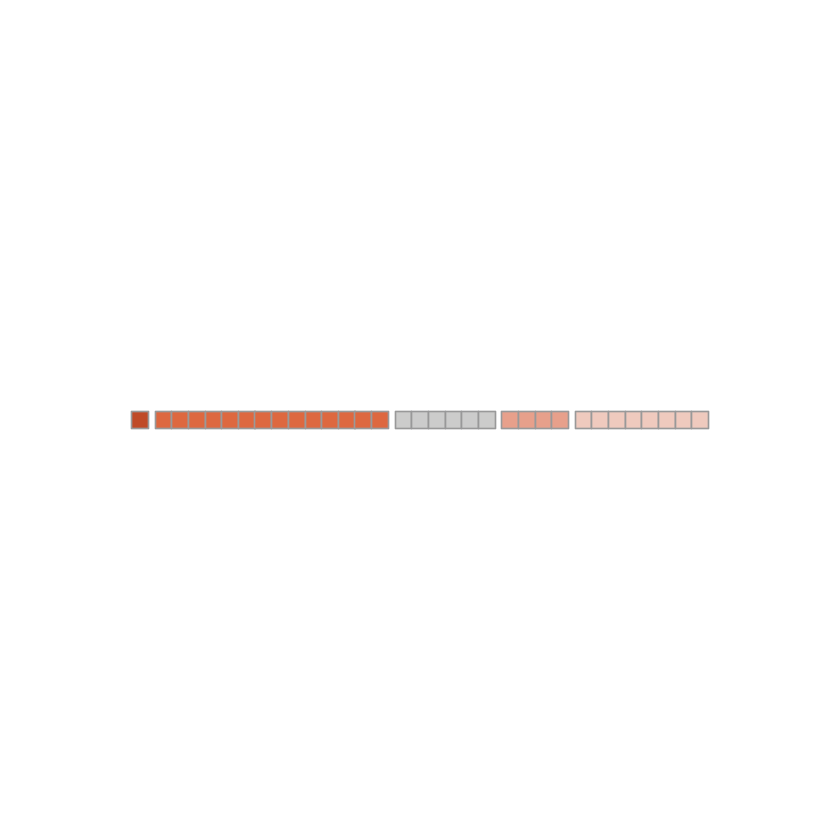

Joining, by = "reporter_id"
Joining, by = "feature"


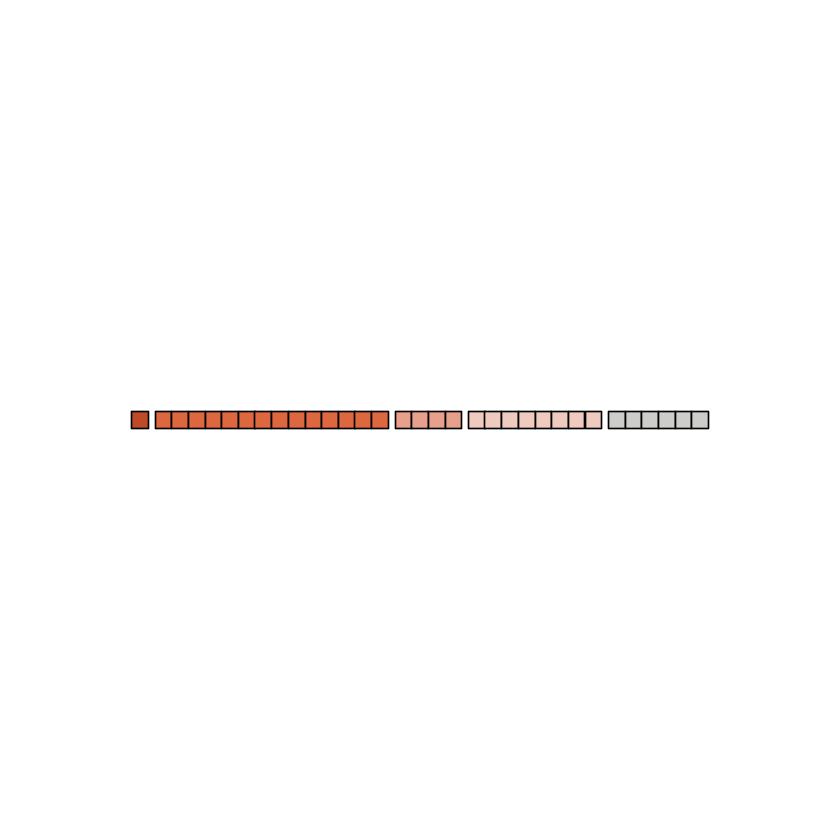

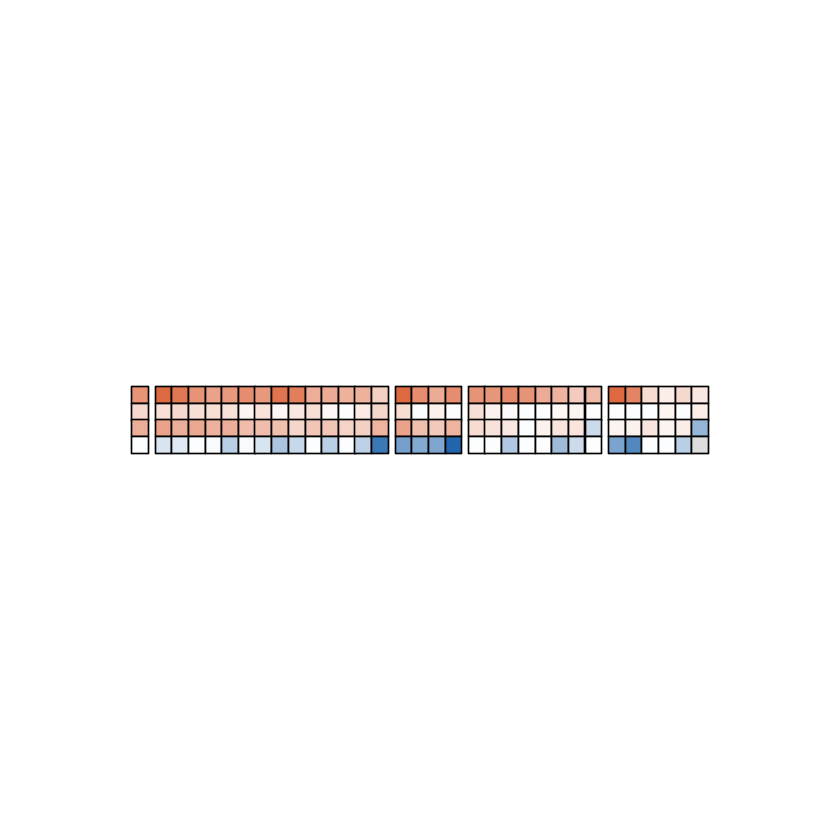

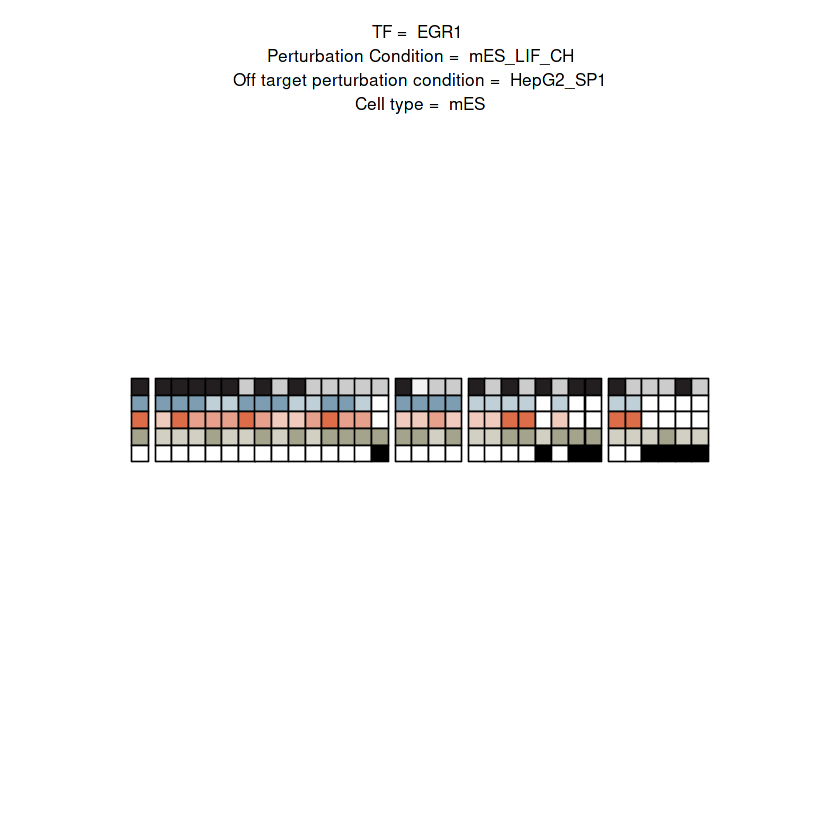

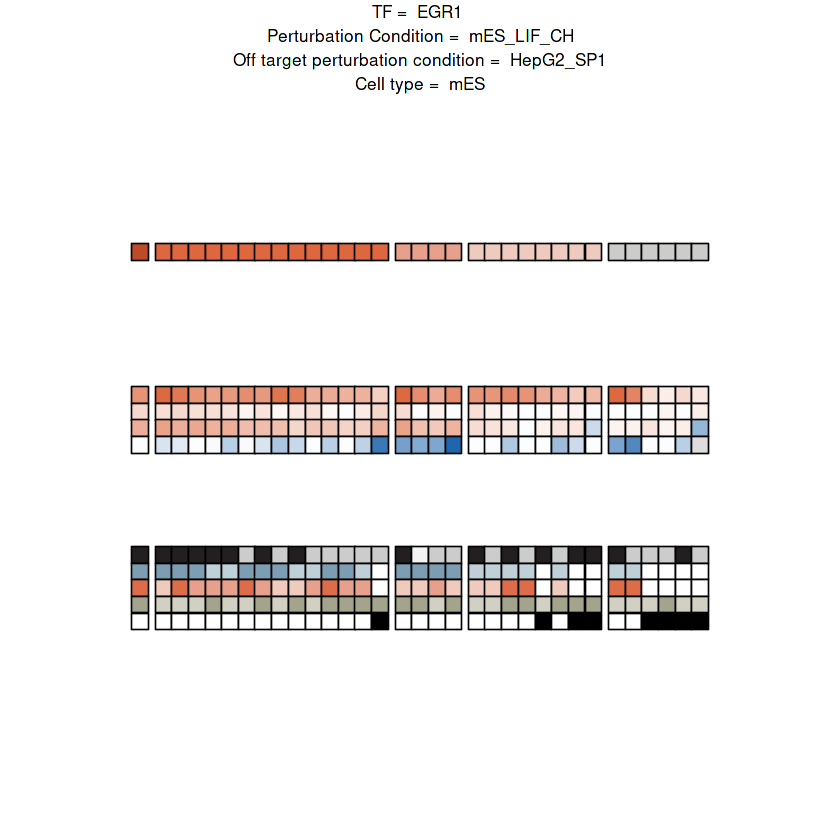

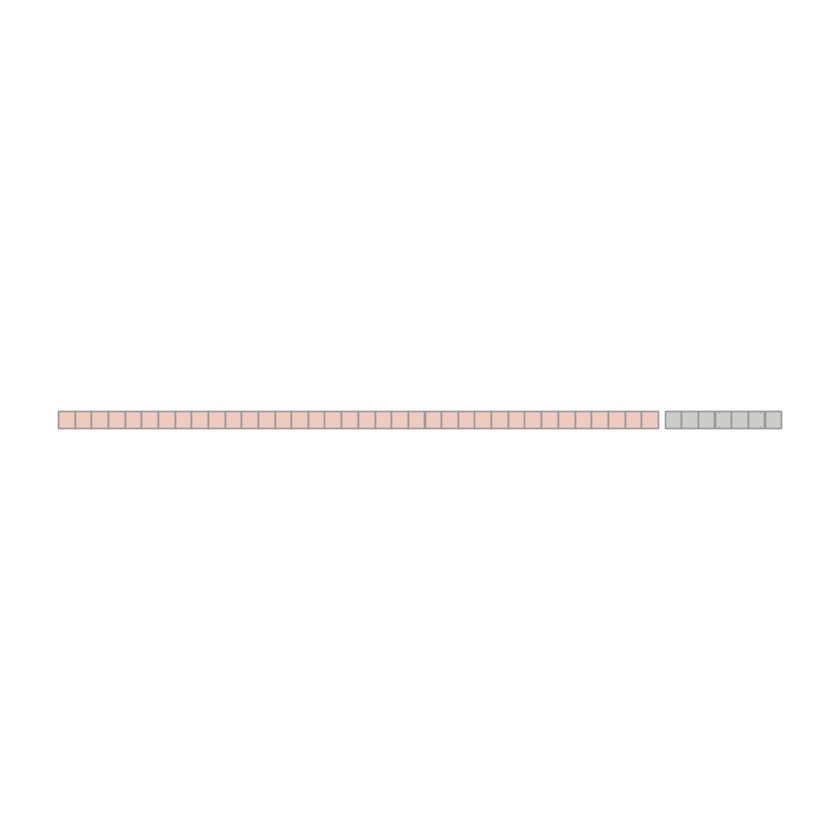

Joining, by = "reporter_id"
Joining, by = "feature"


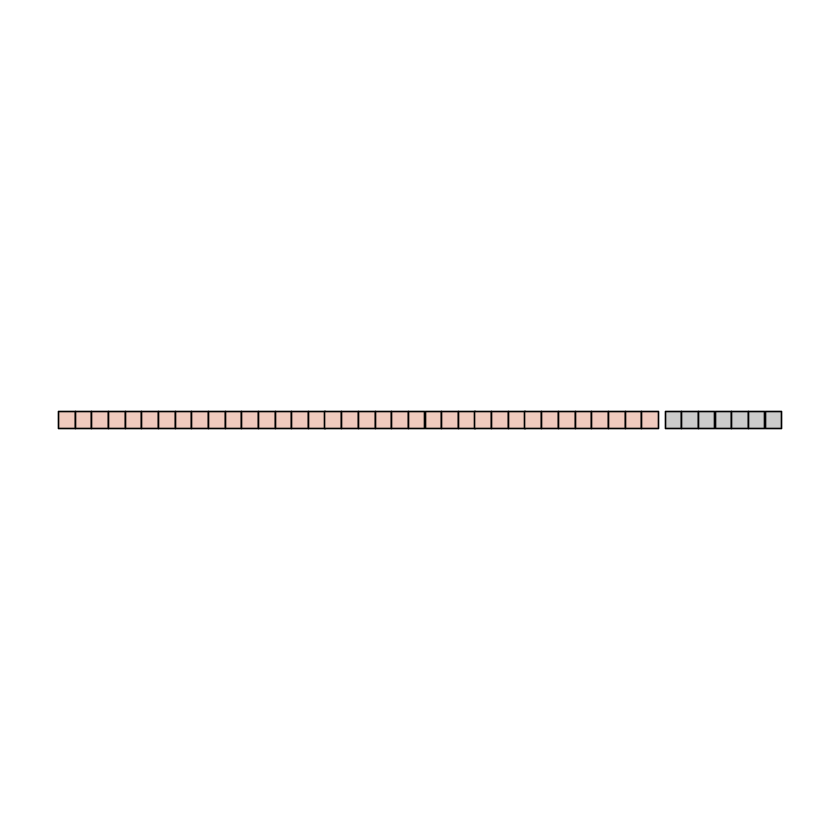

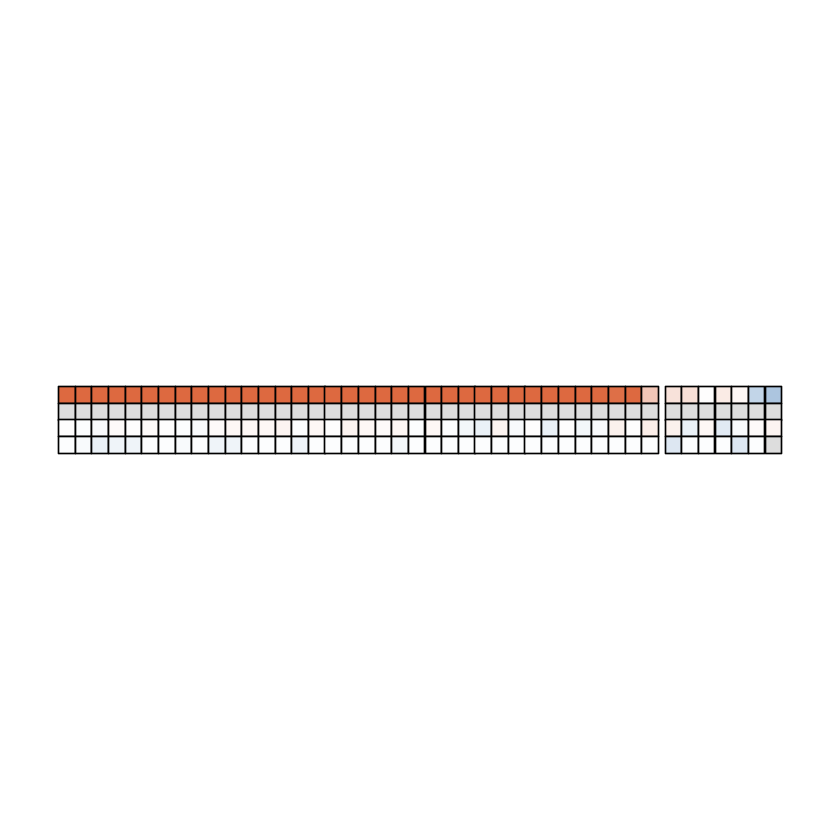

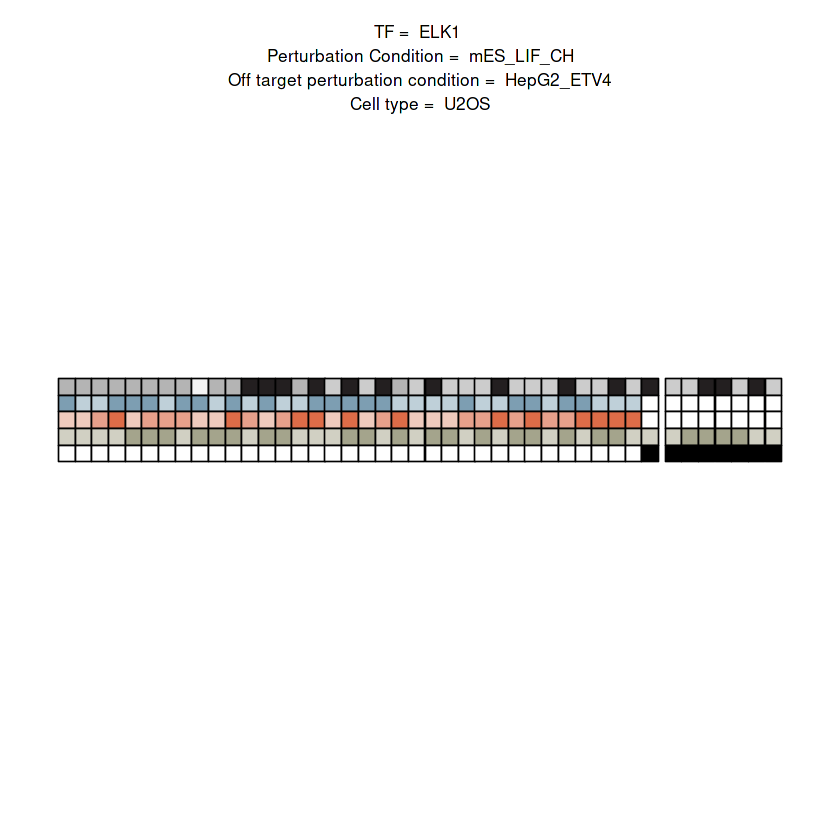

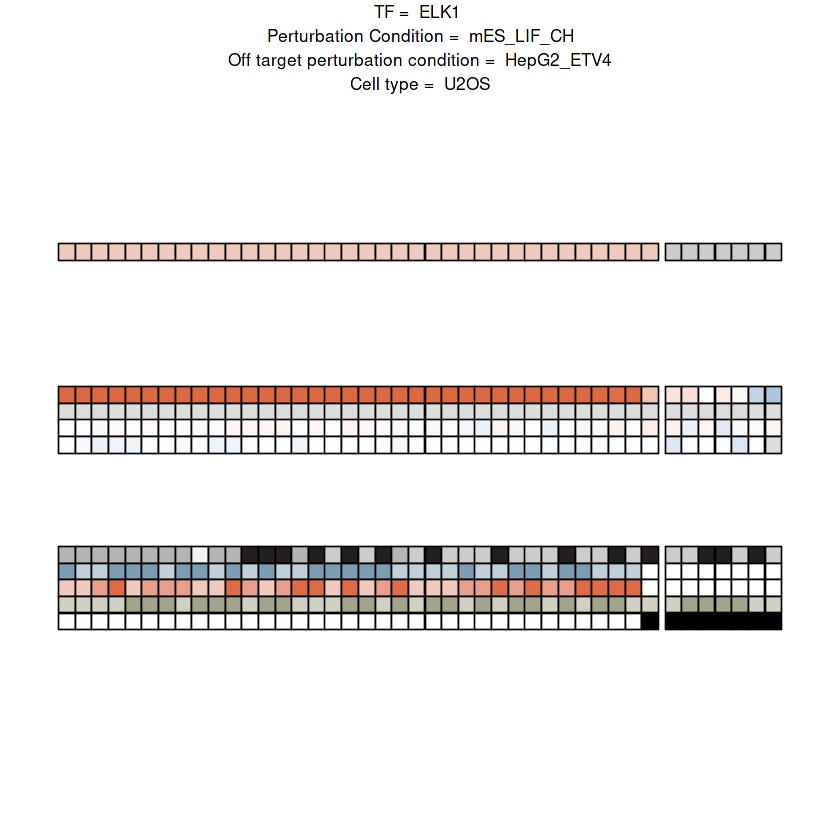

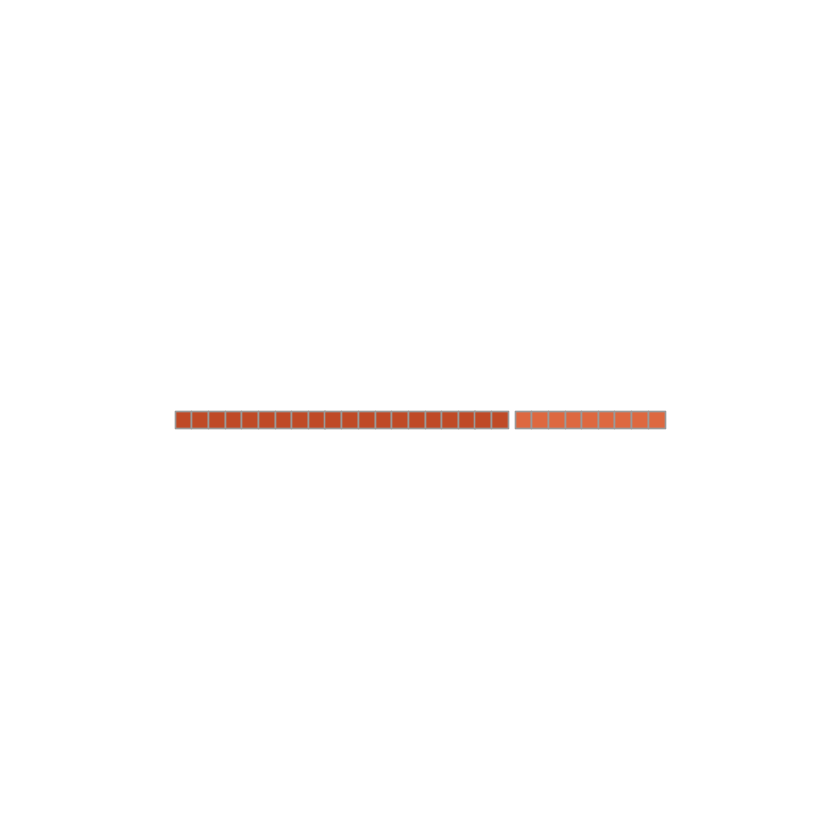

Joining, by = "reporter_id"
Joining, by = "feature"


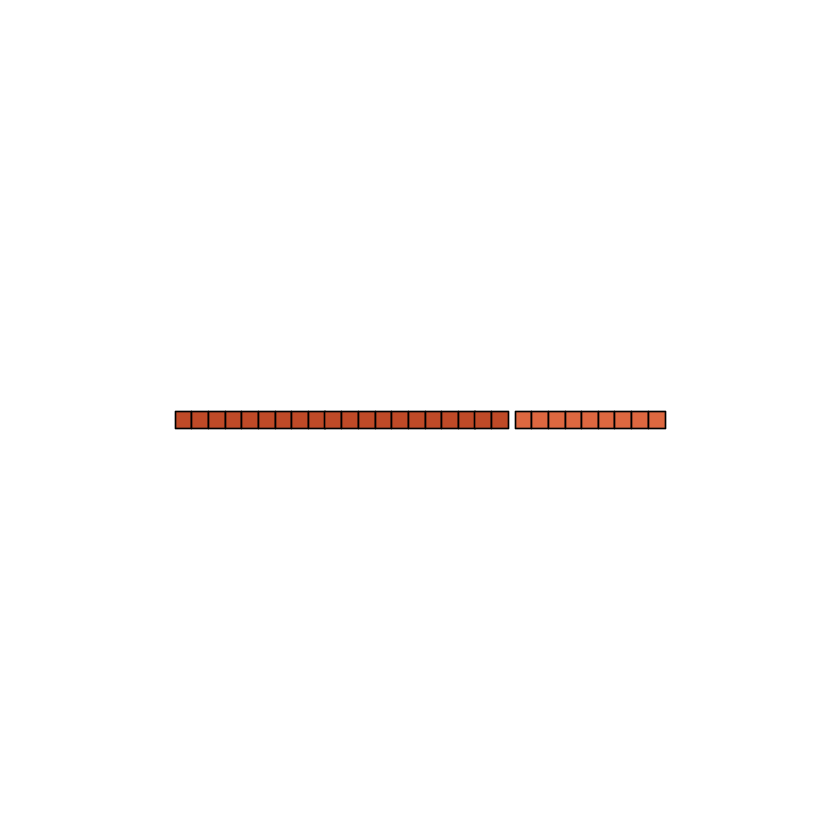

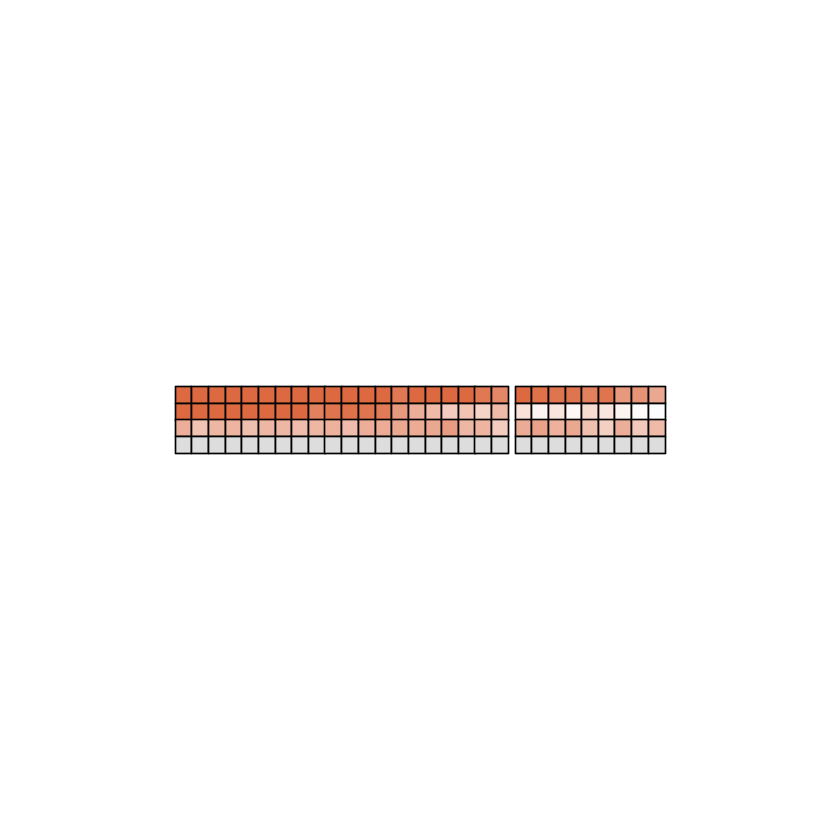

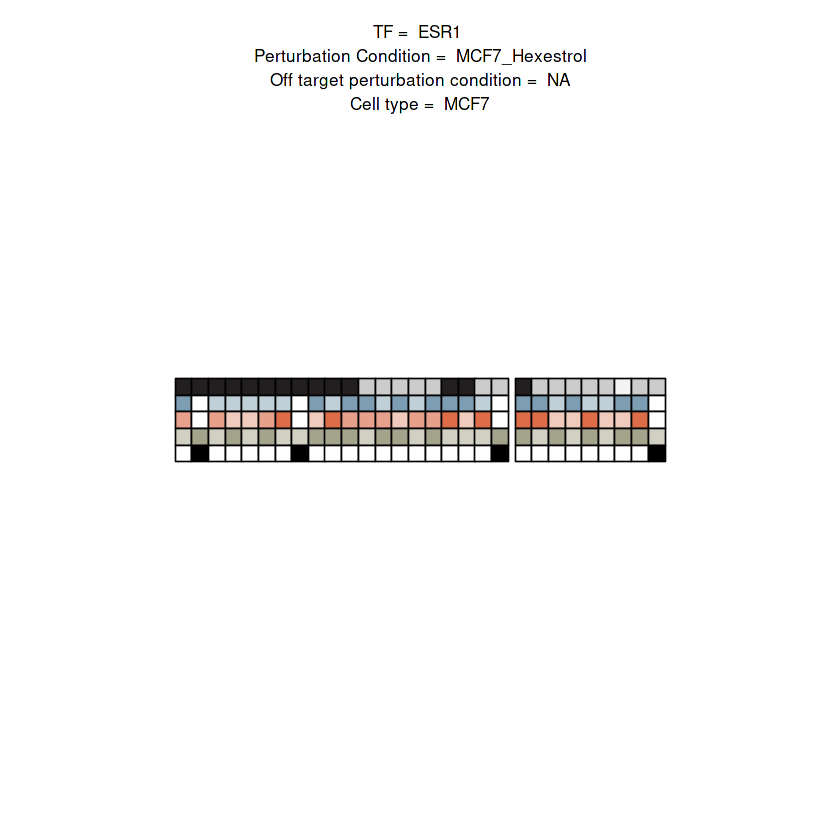

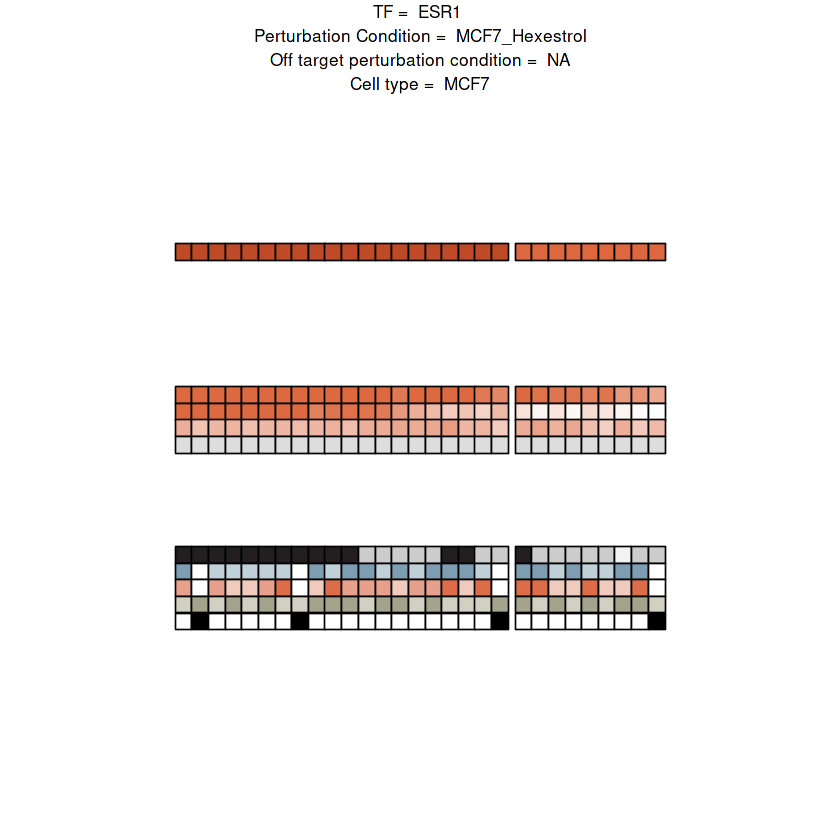

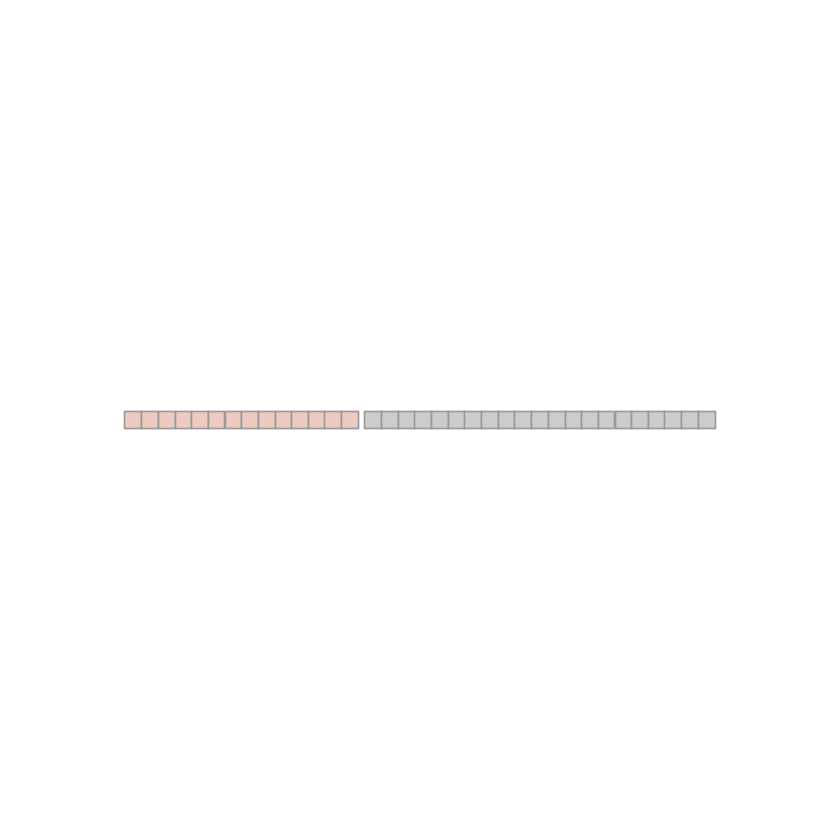

Joining, by = "reporter_id"
Joining, by = "feature"


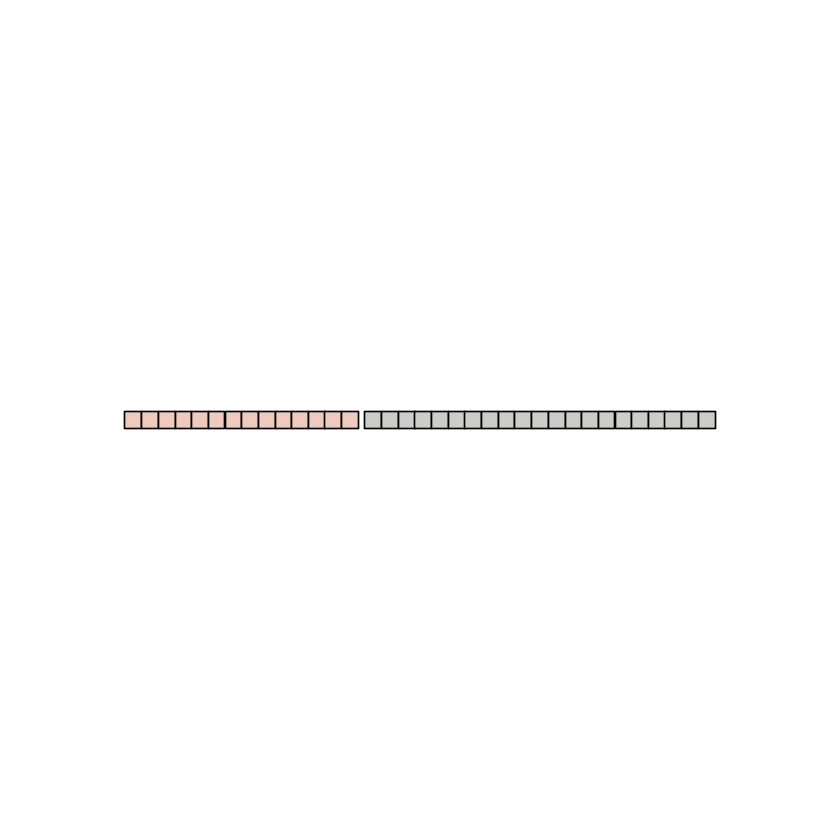

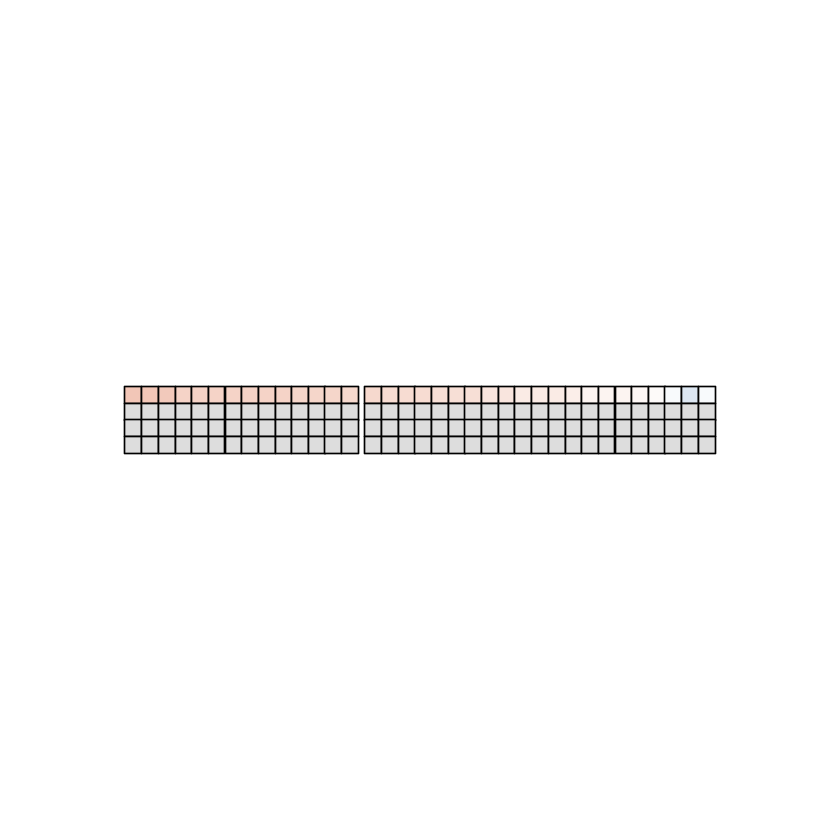

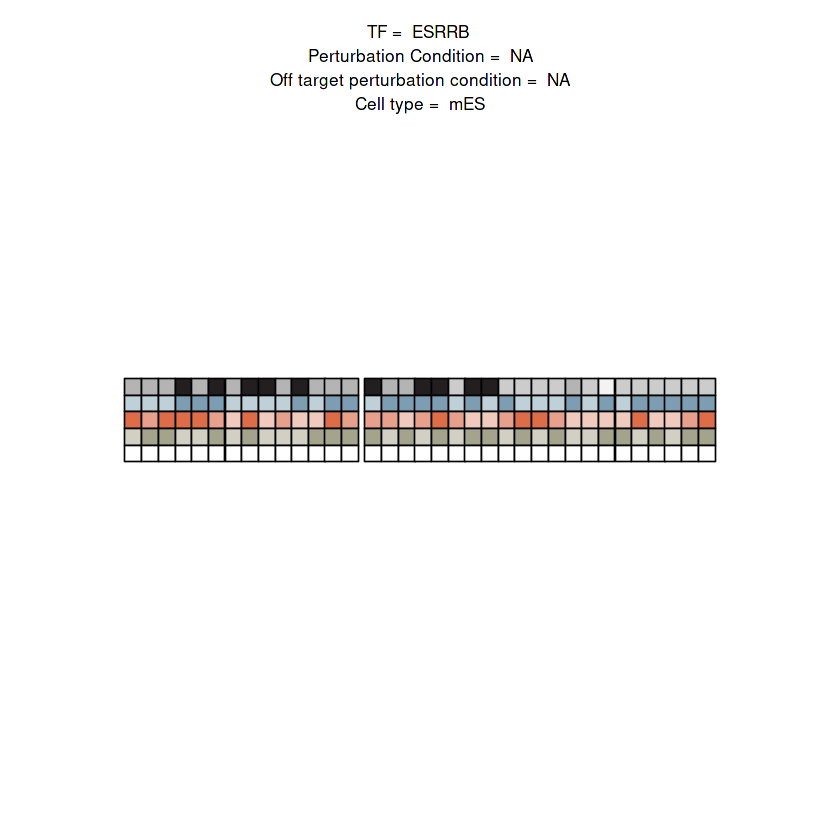

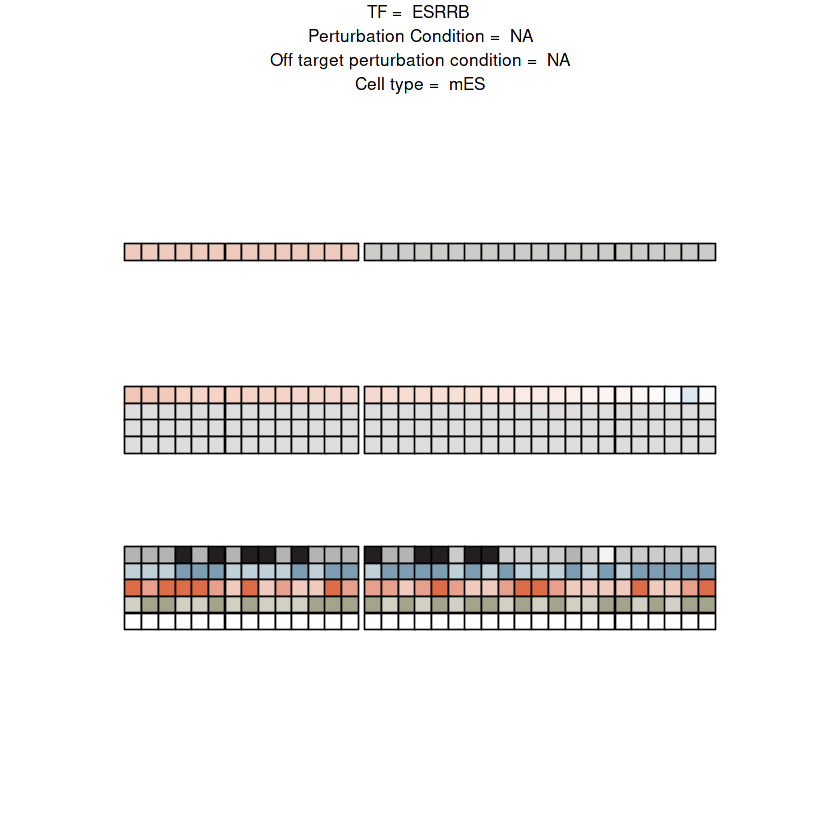

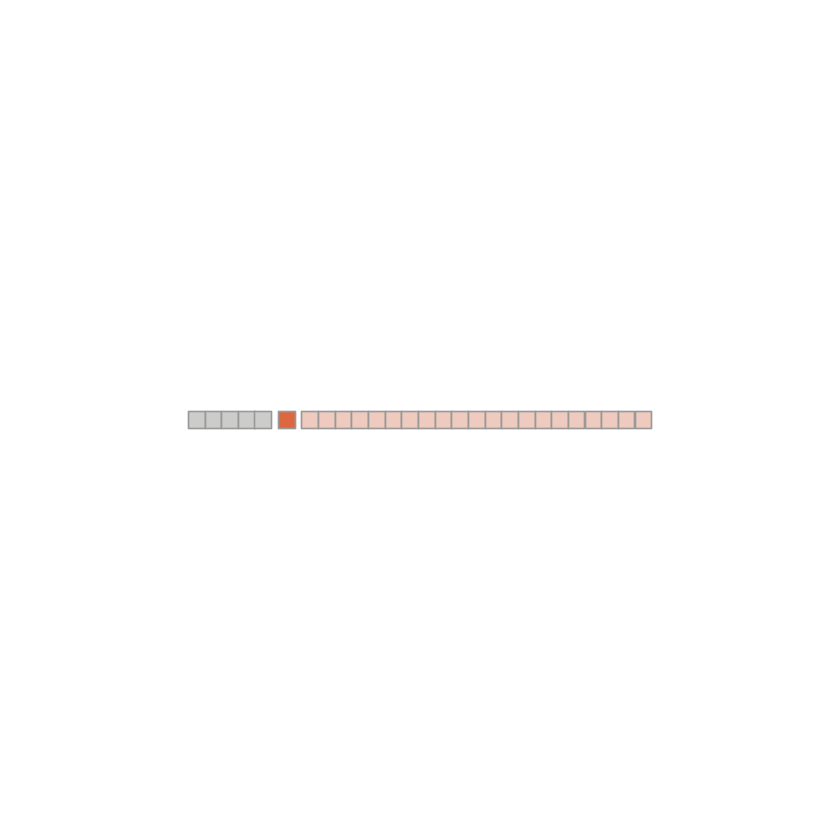

Joining, by = "reporter_id"
Joining, by = "feature"


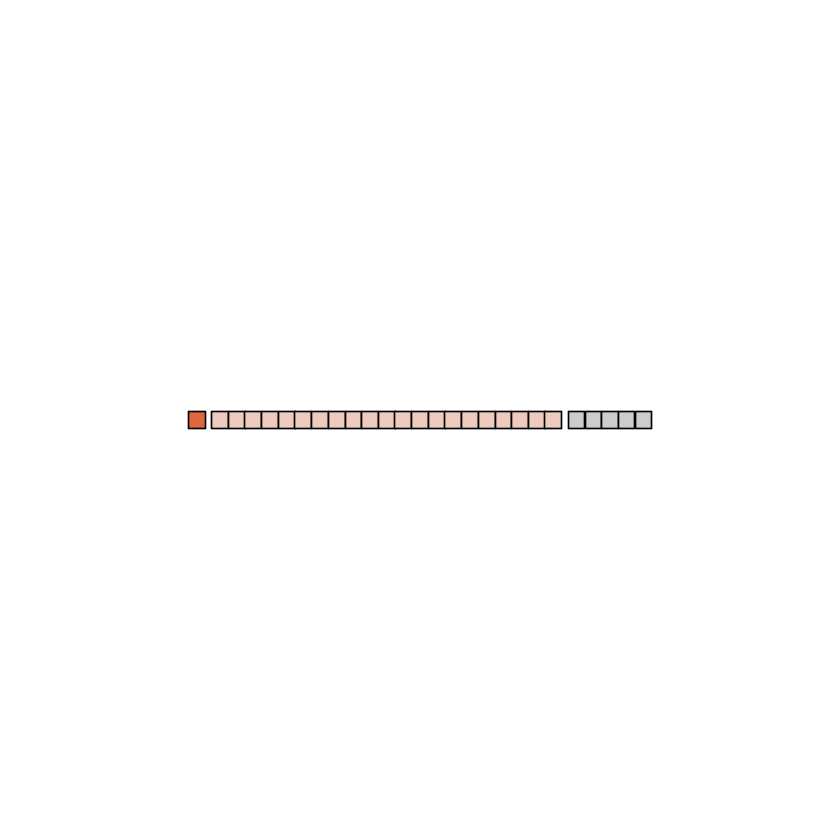

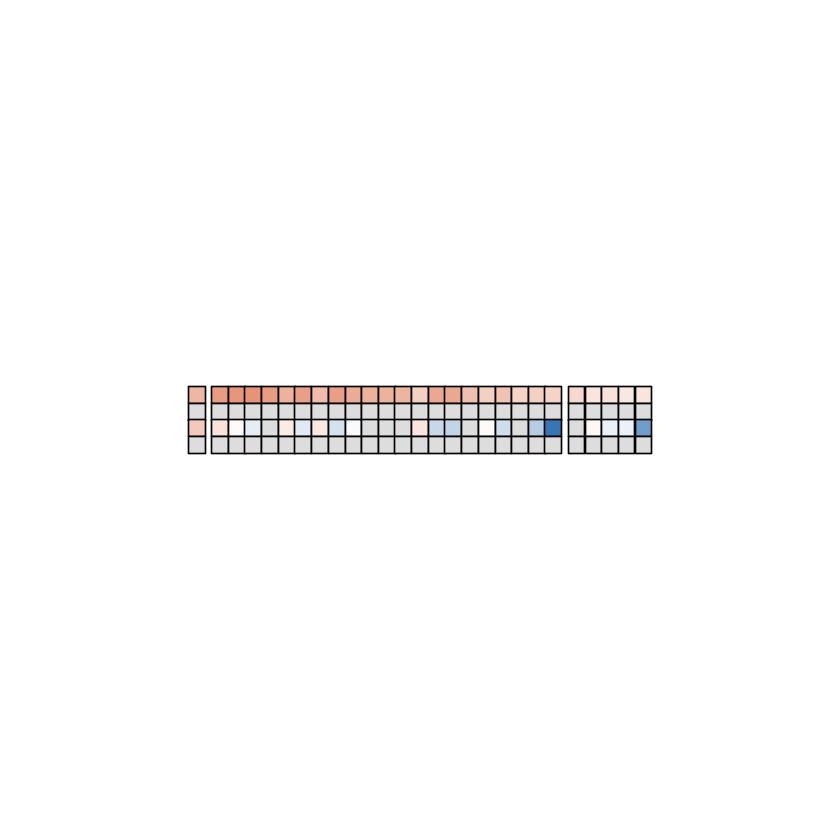

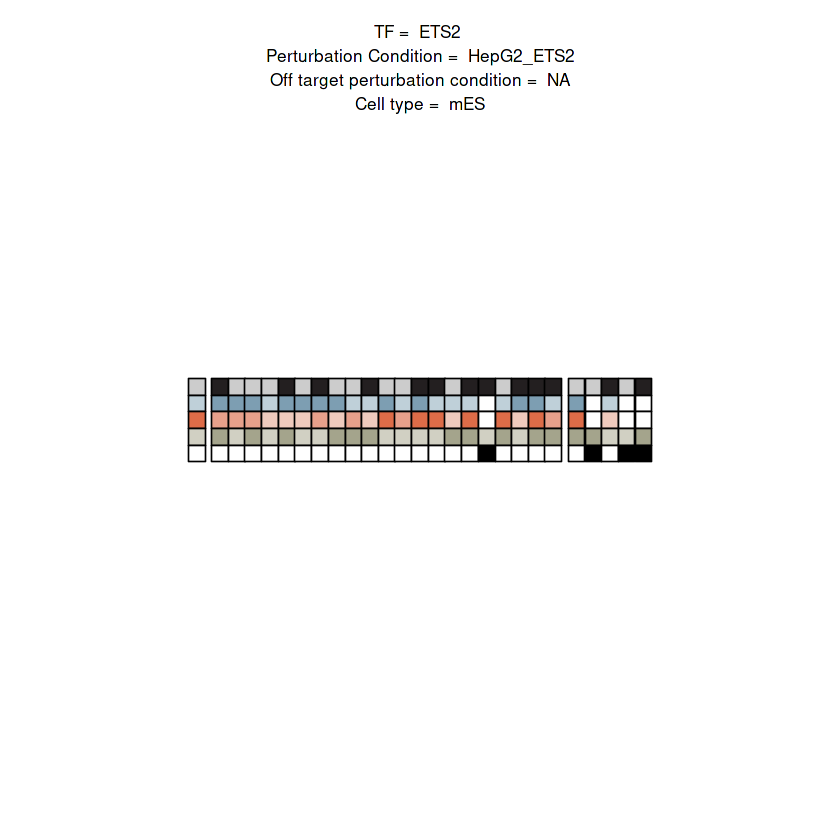

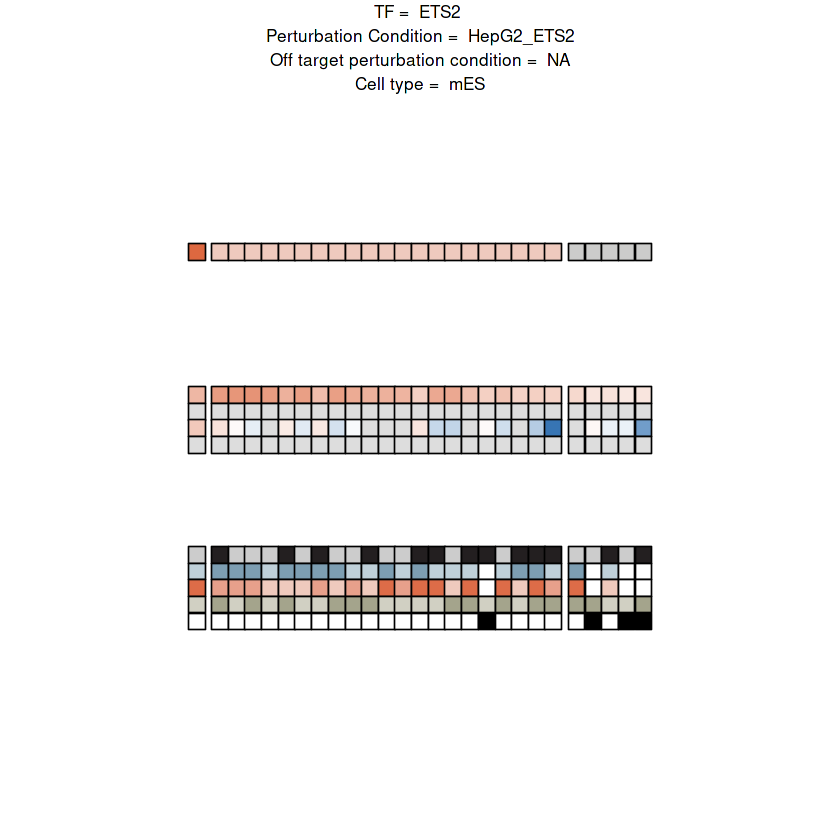

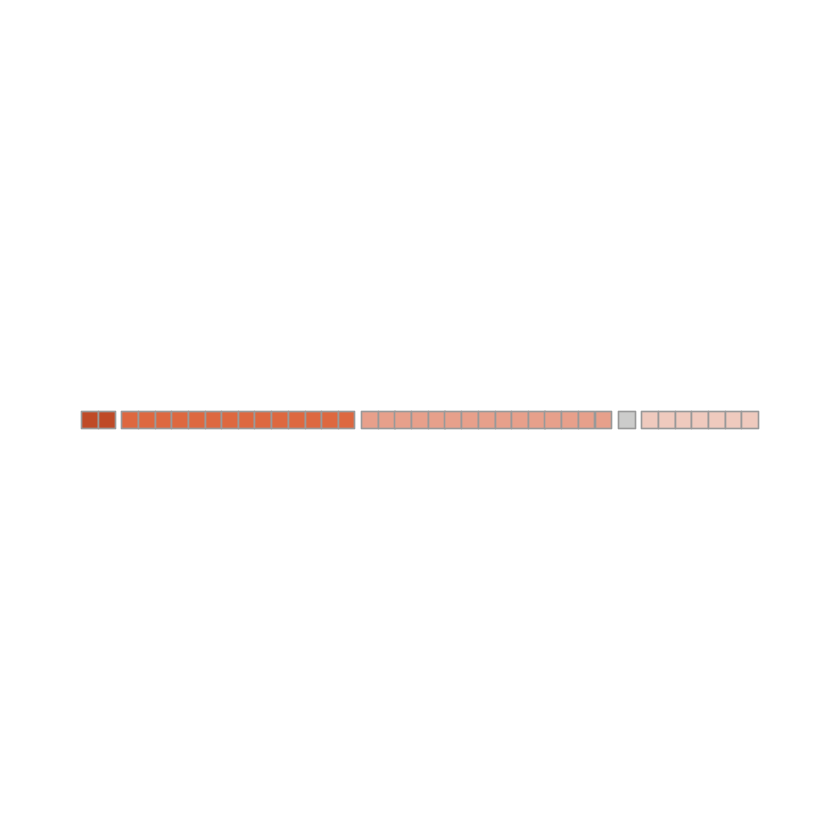

Joining, by = "reporter_id"
Joining, by = "feature"


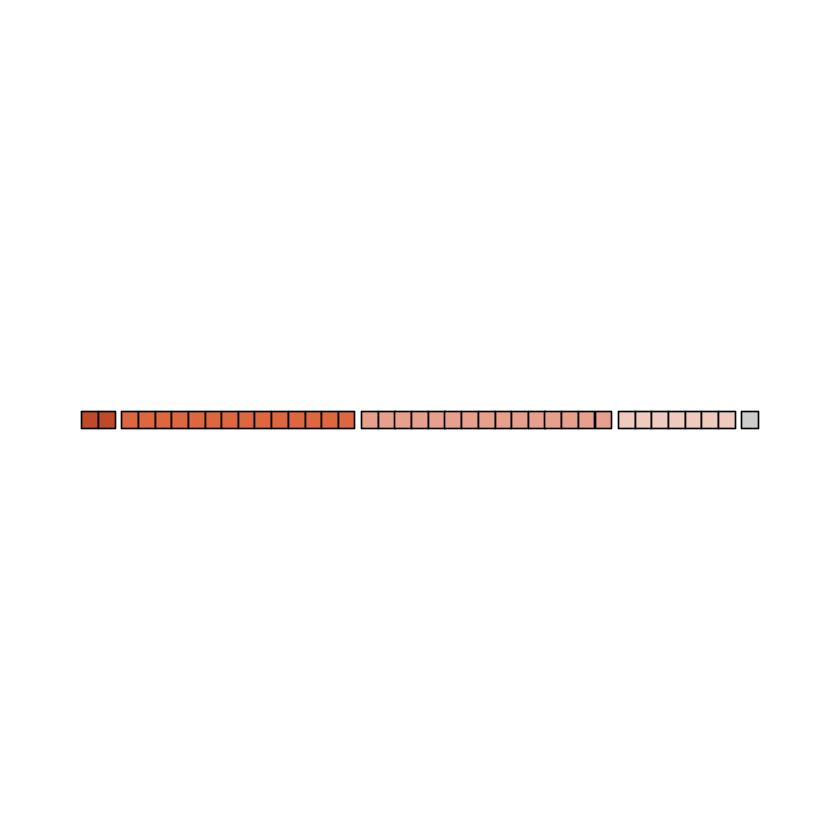

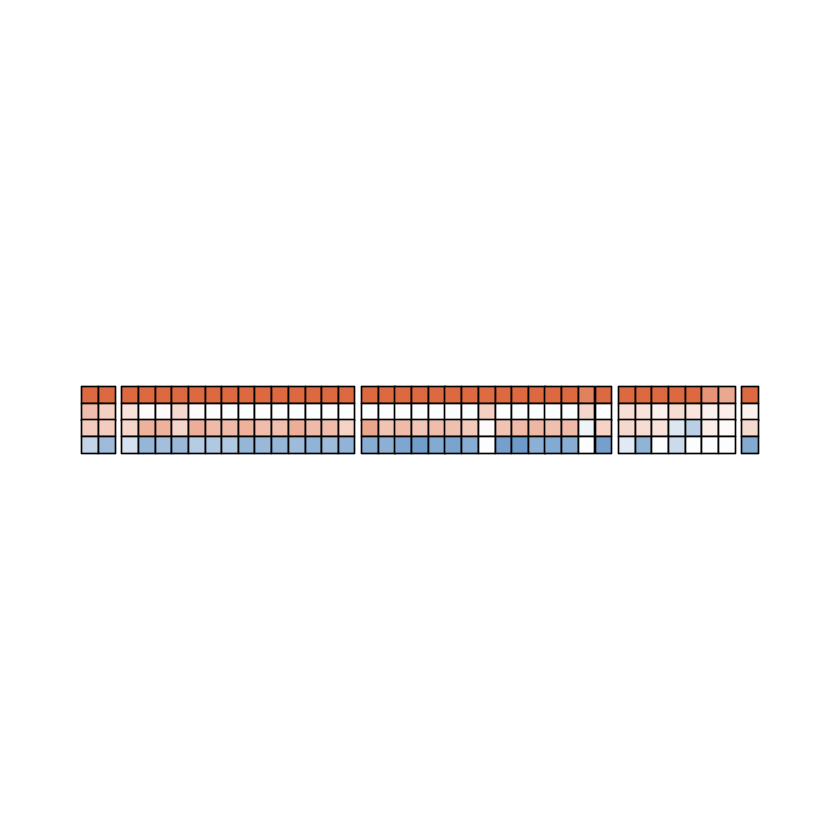

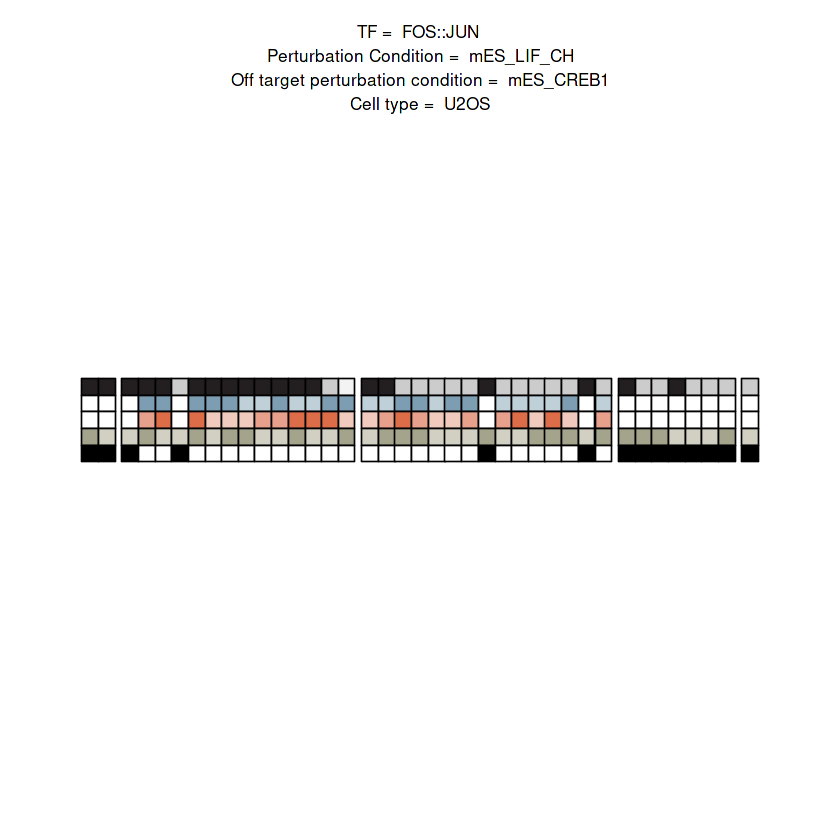

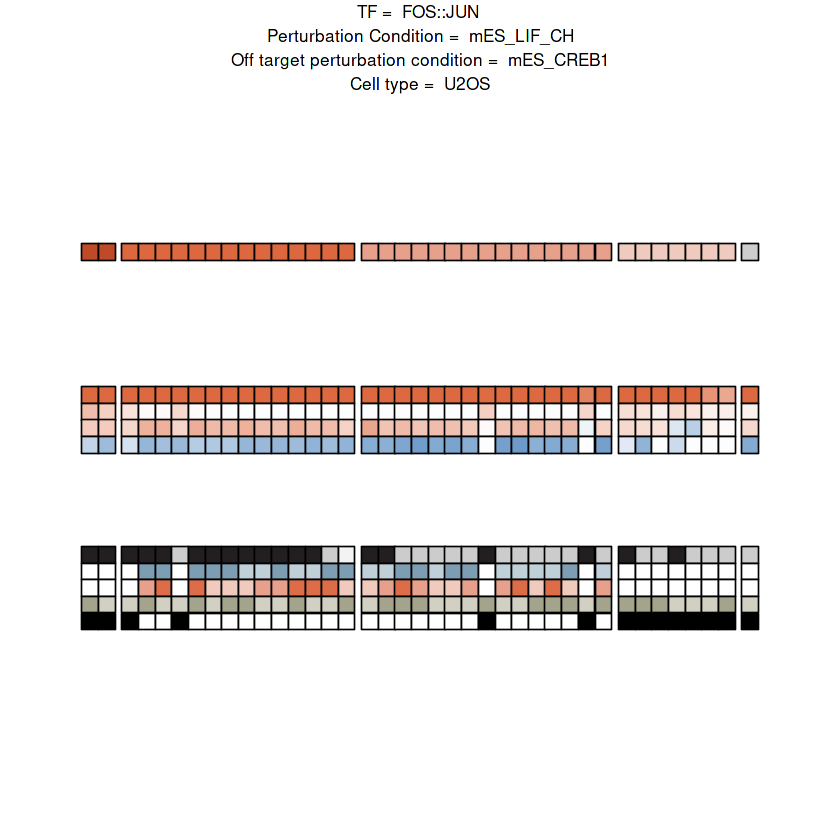

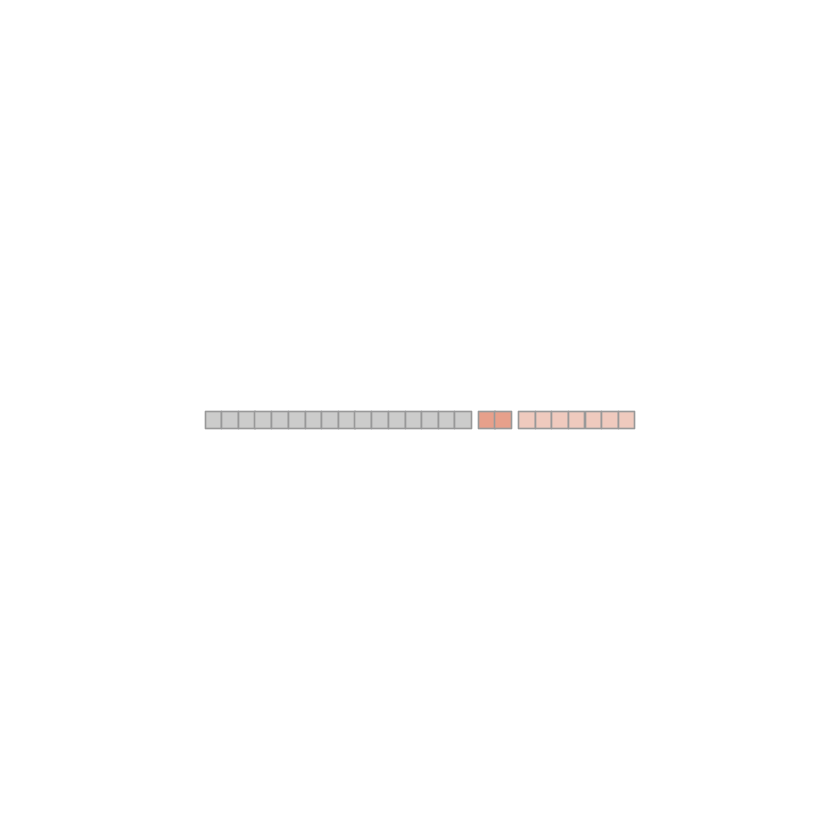

Joining, by = "reporter_id"
Joining, by = "feature"


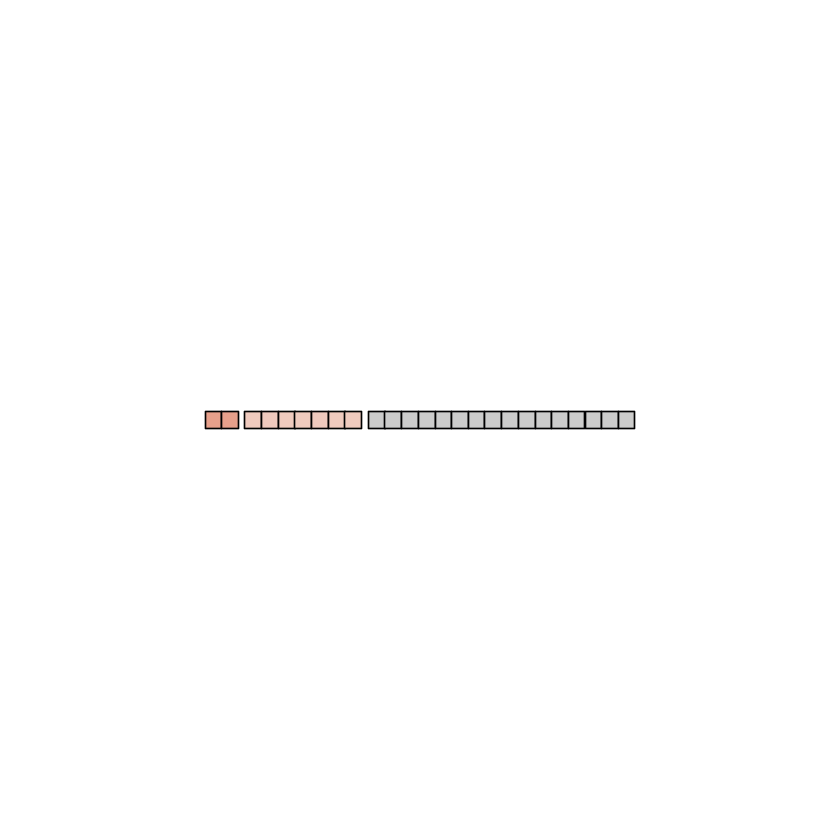

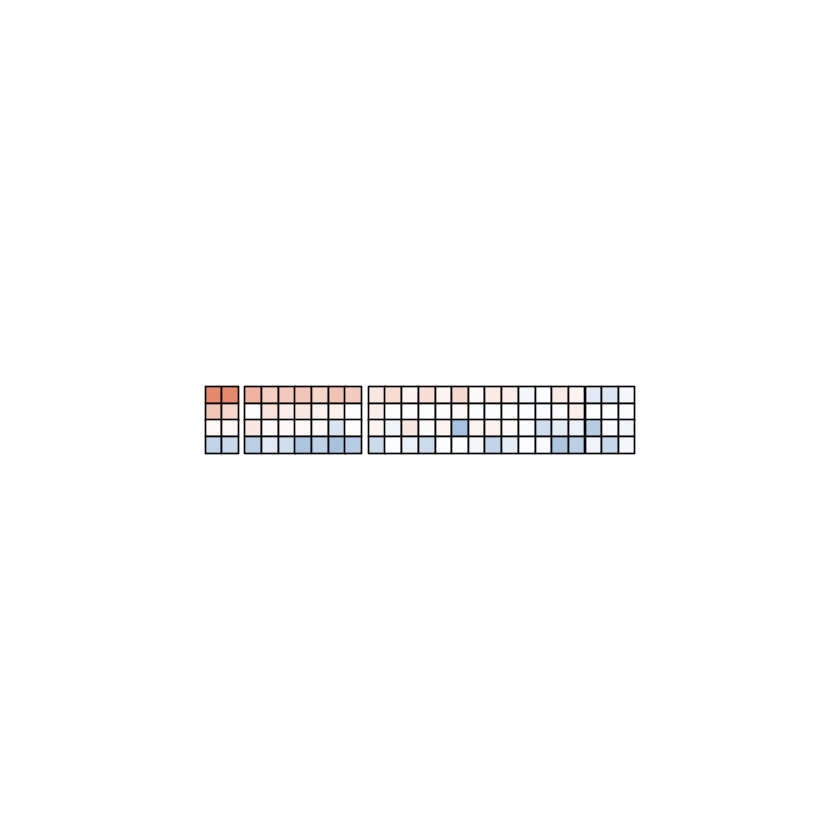

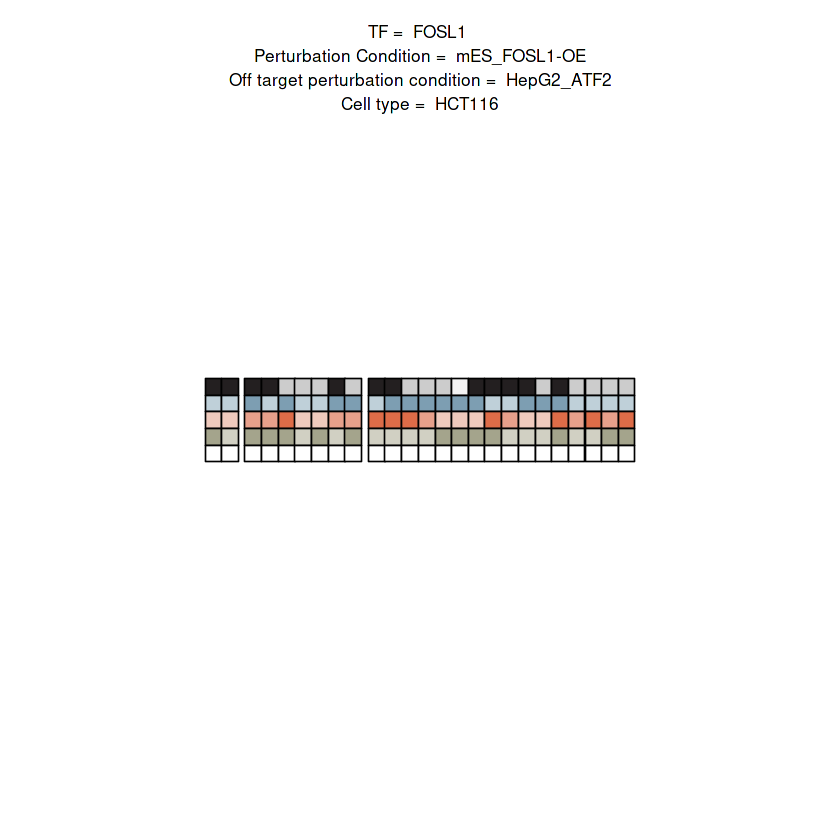

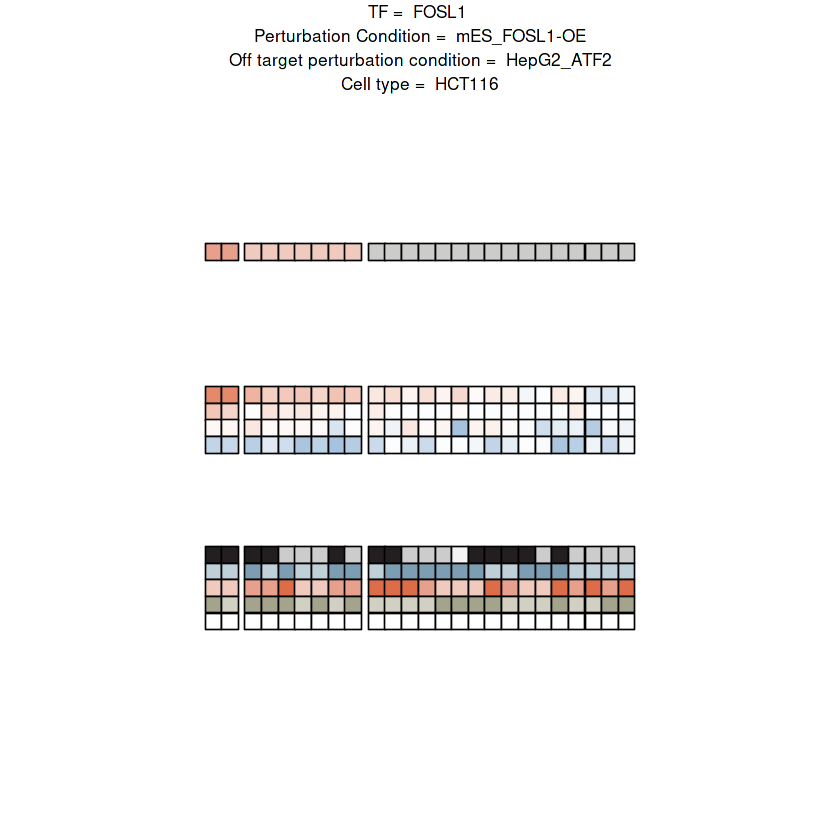

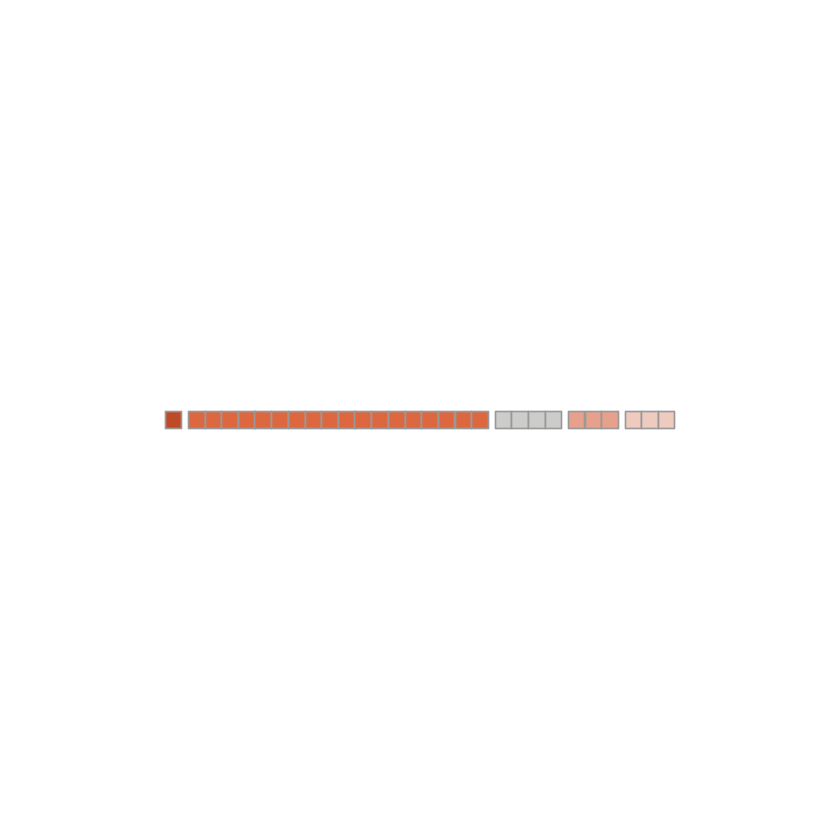

Joining, by = "reporter_id"
Joining, by = "feature"


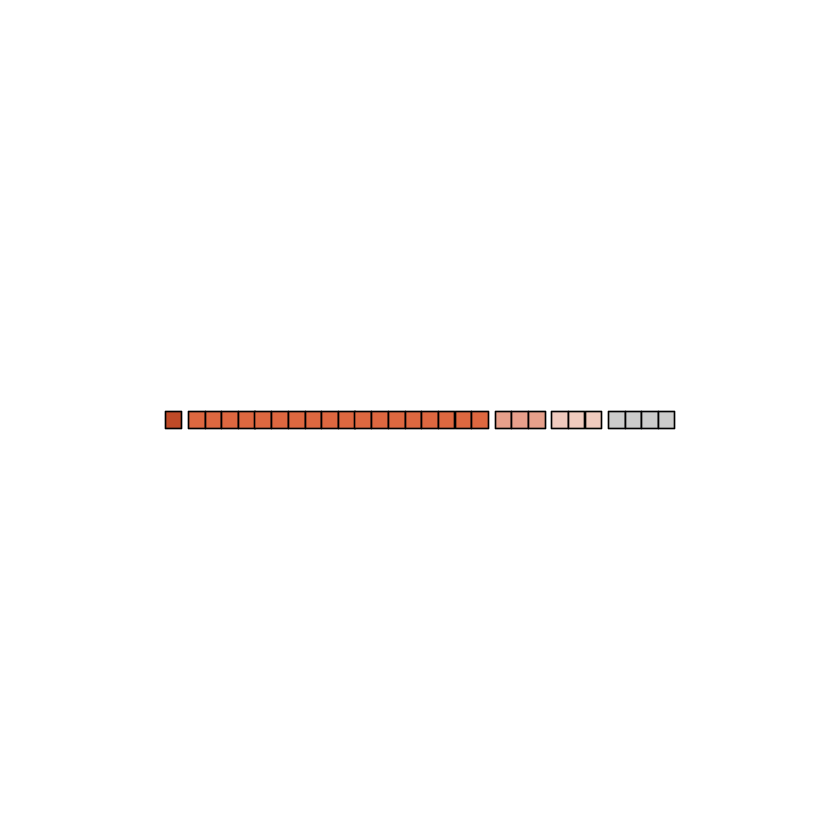

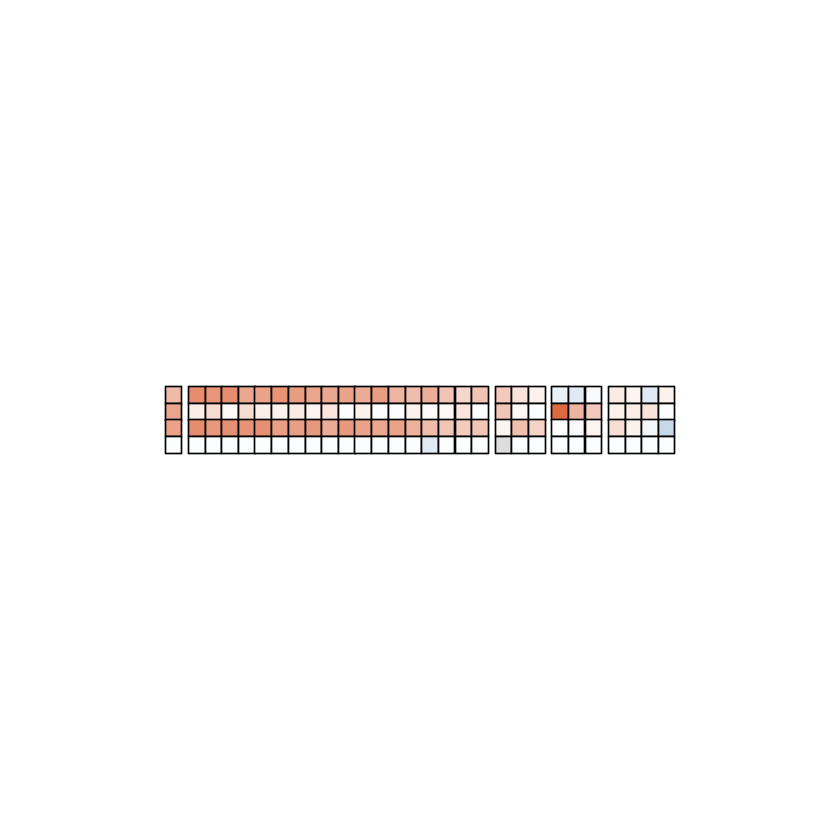

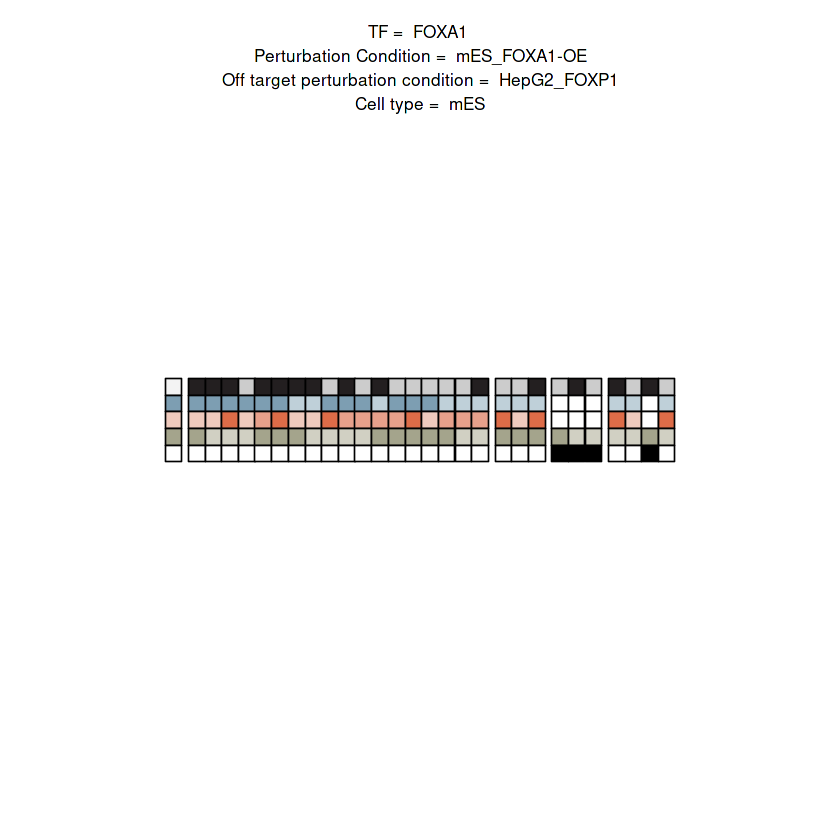

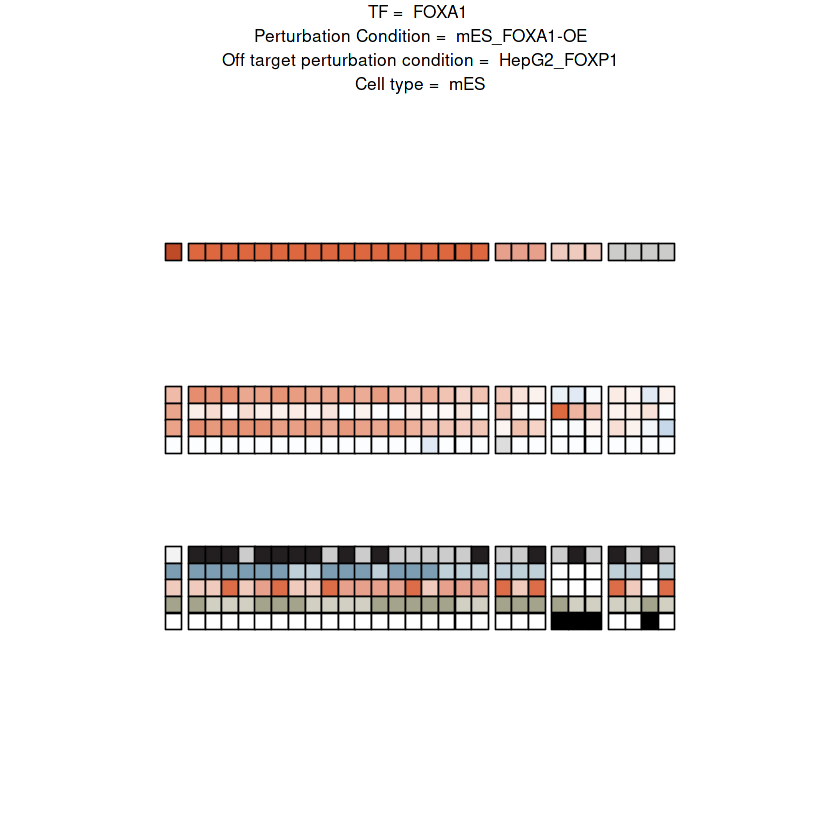

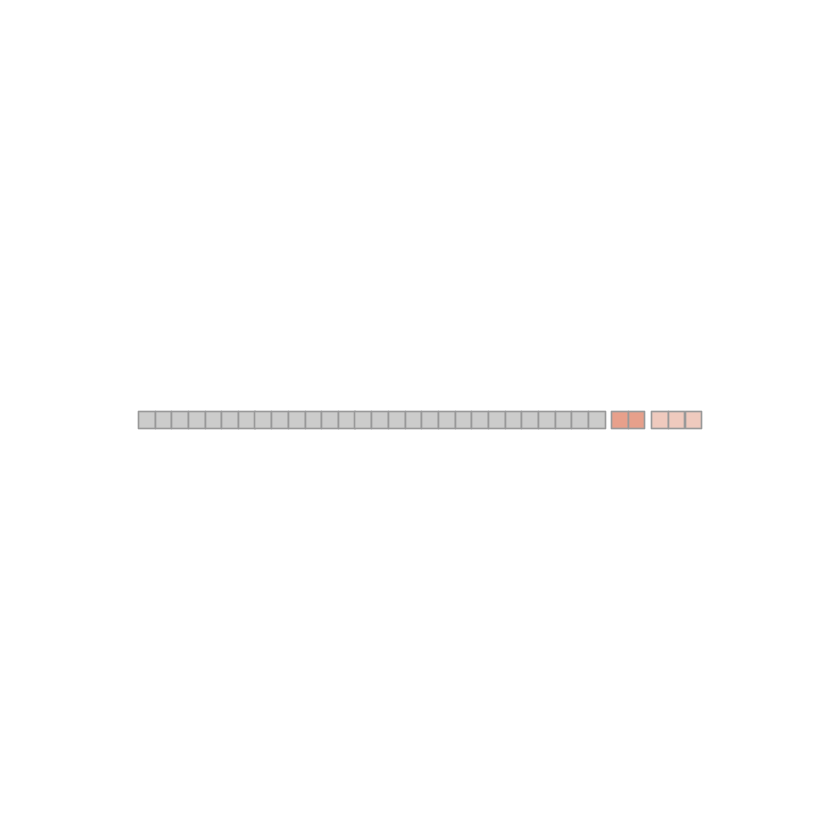

Joining, by = "reporter_id"
Joining, by = "feature"


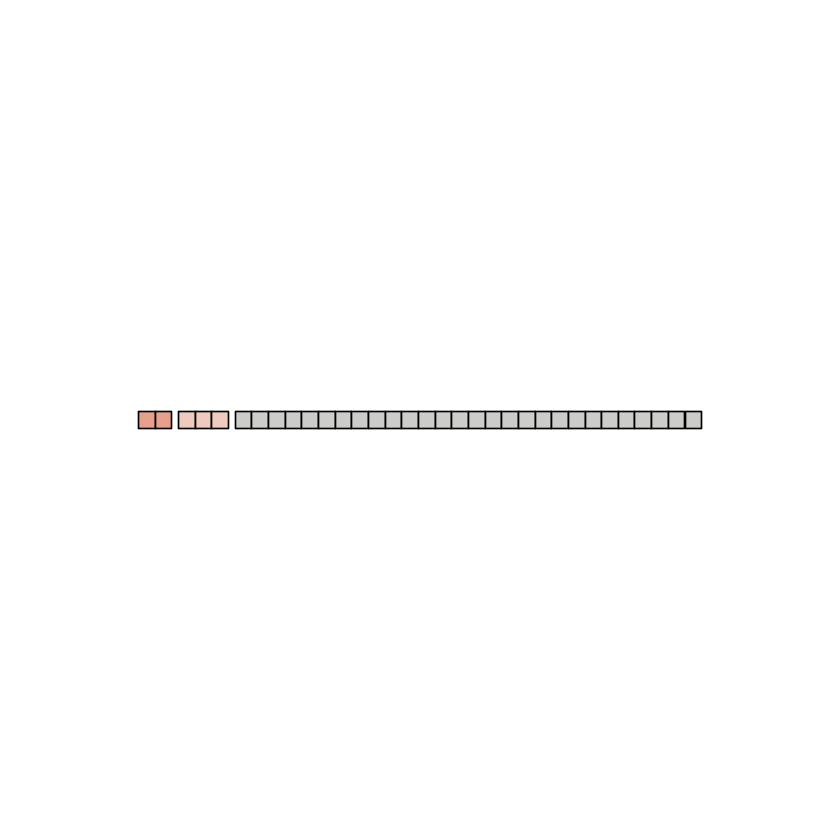

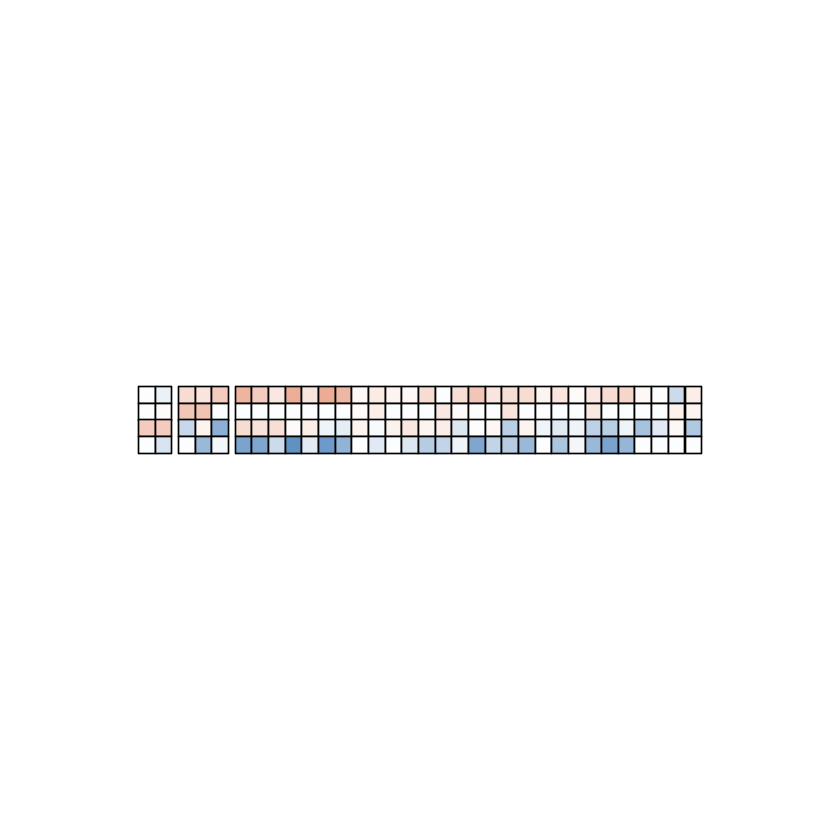

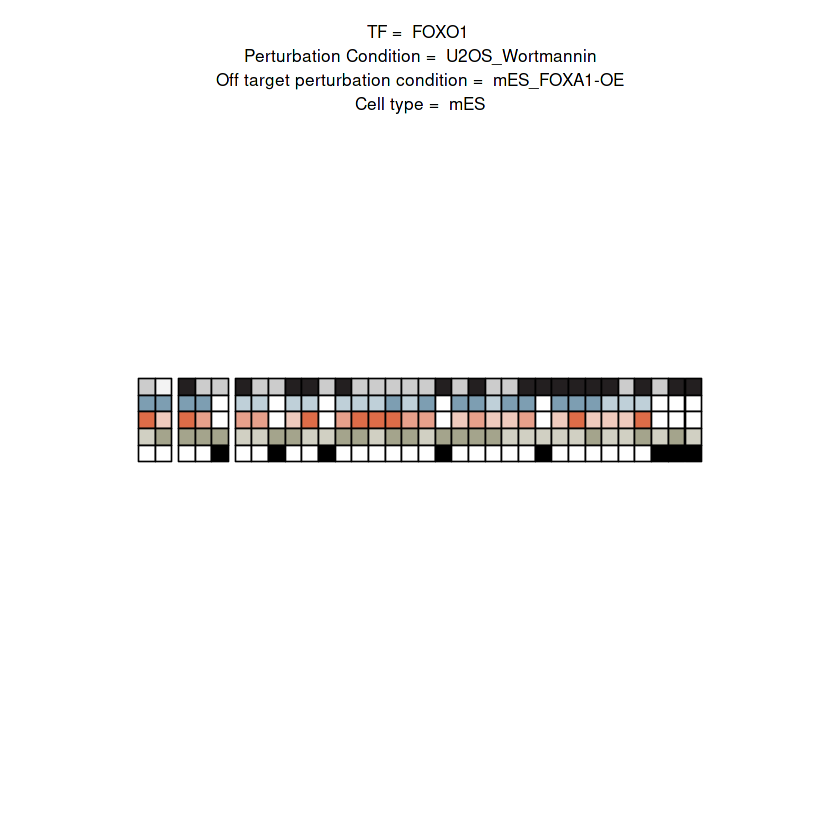

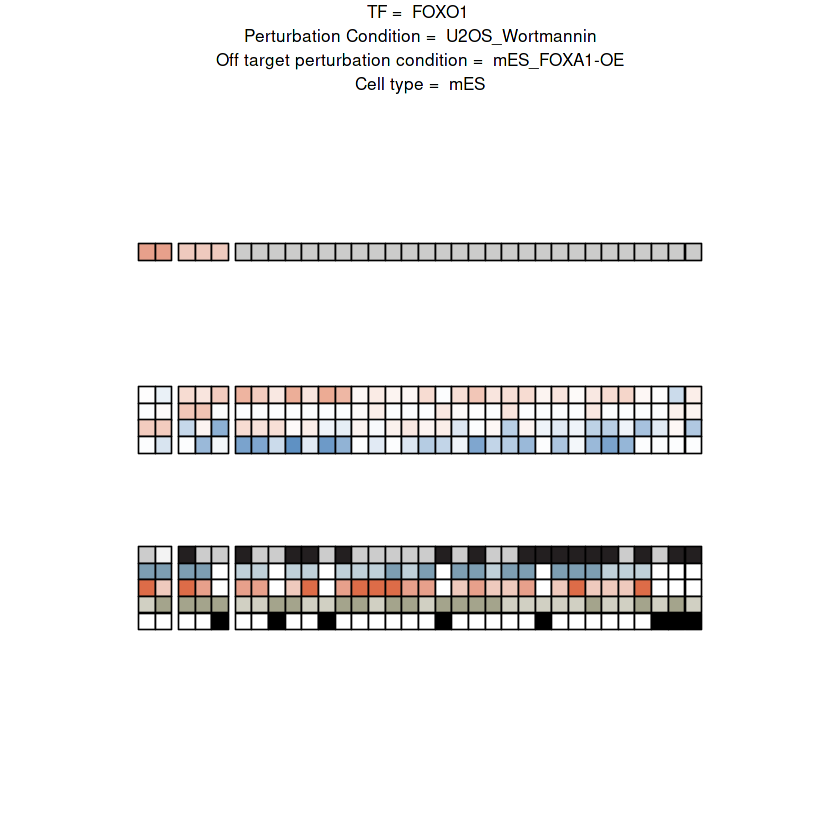

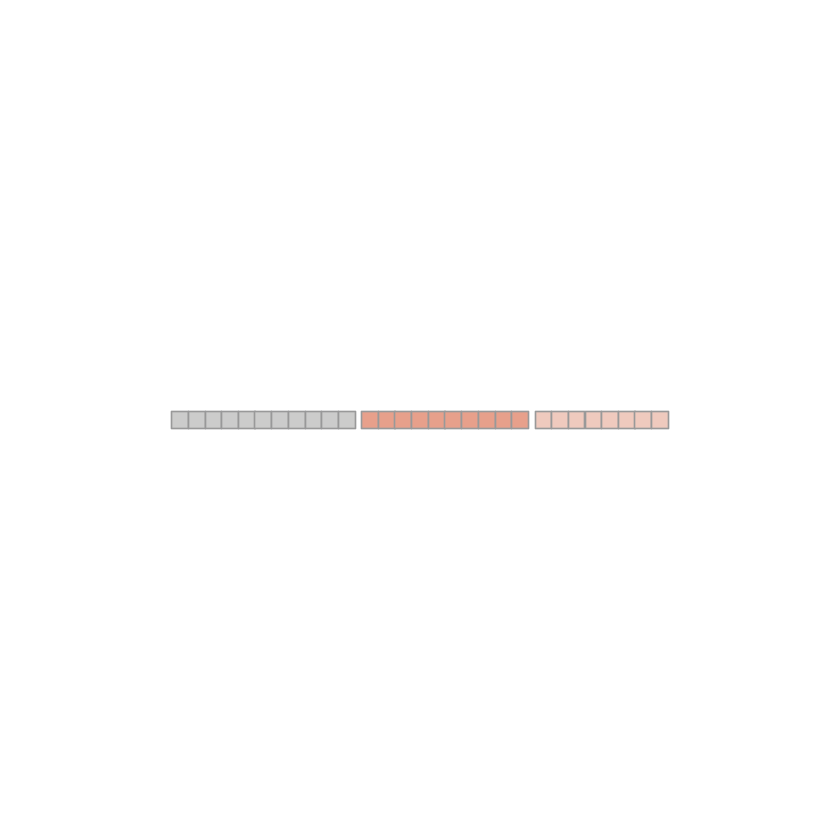

Joining, by = "reporter_id"
Joining, by = "feature"


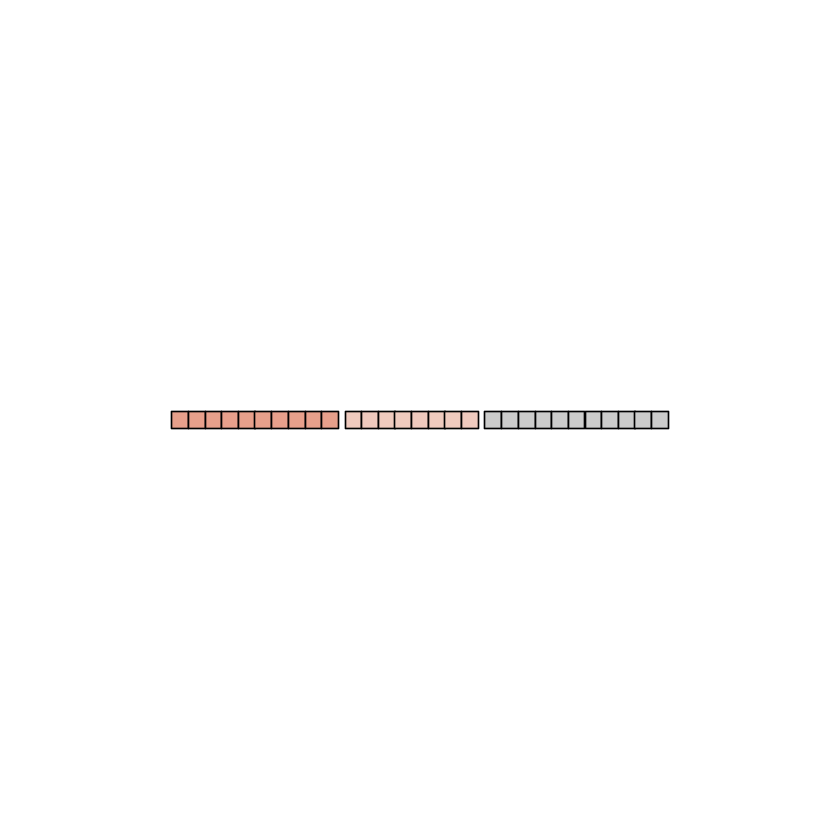

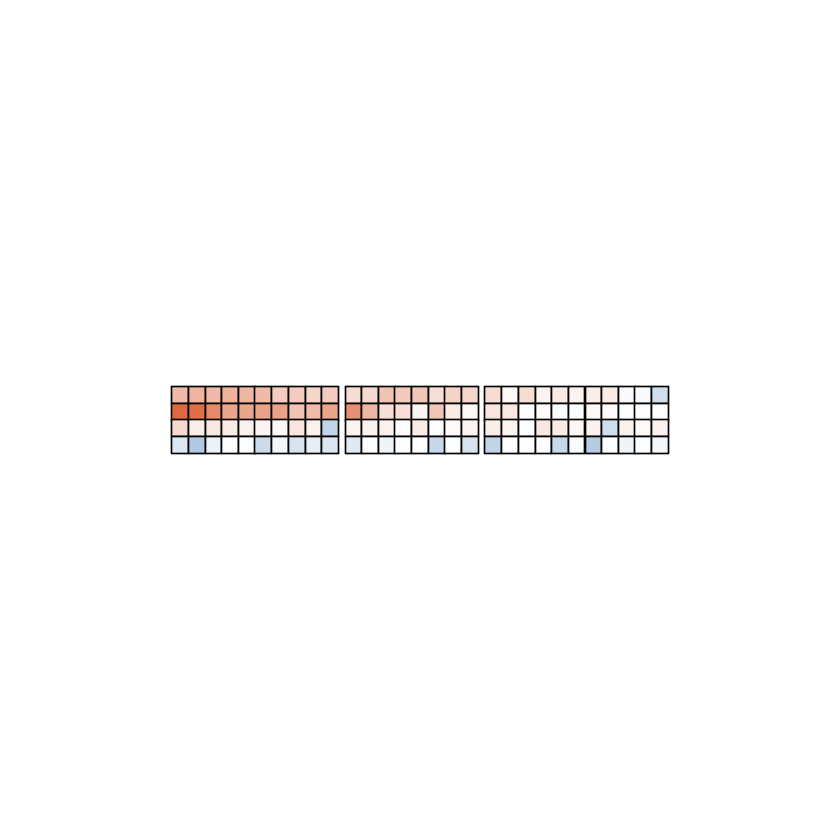

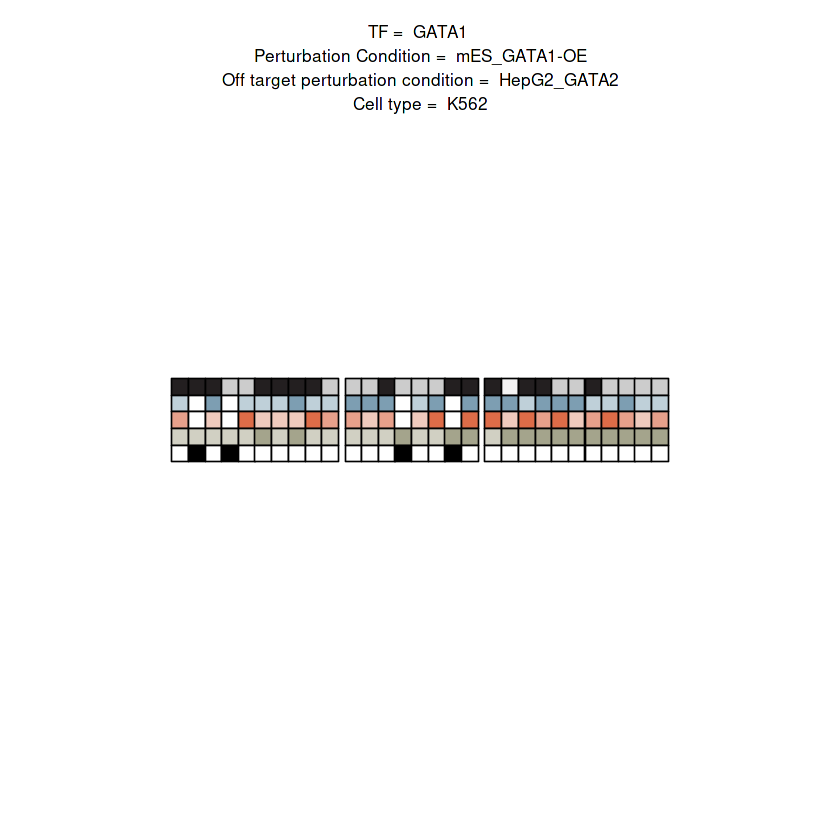

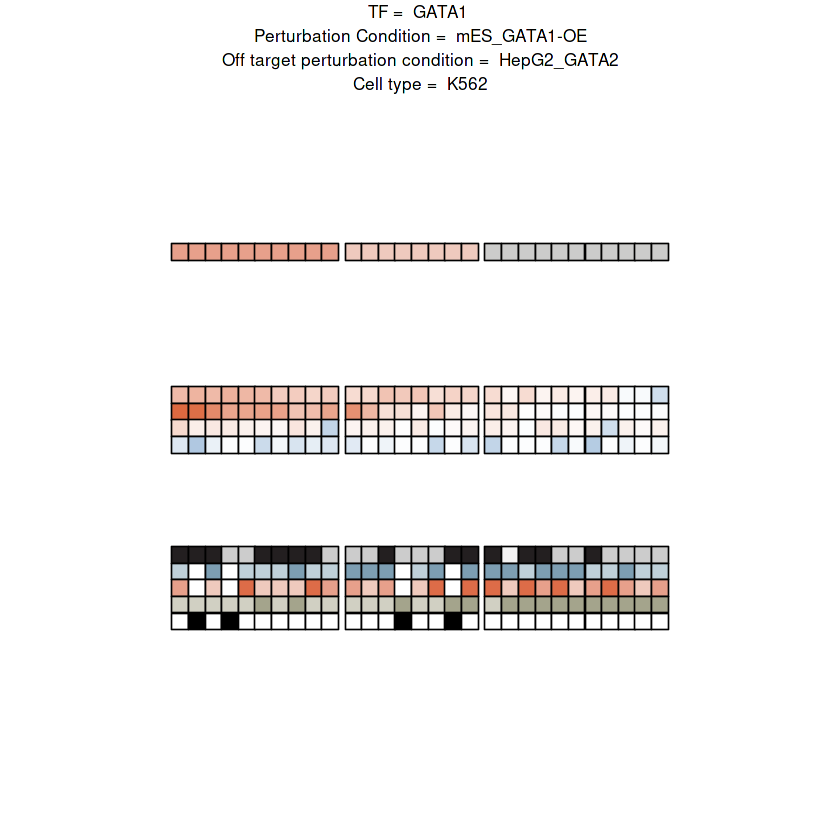

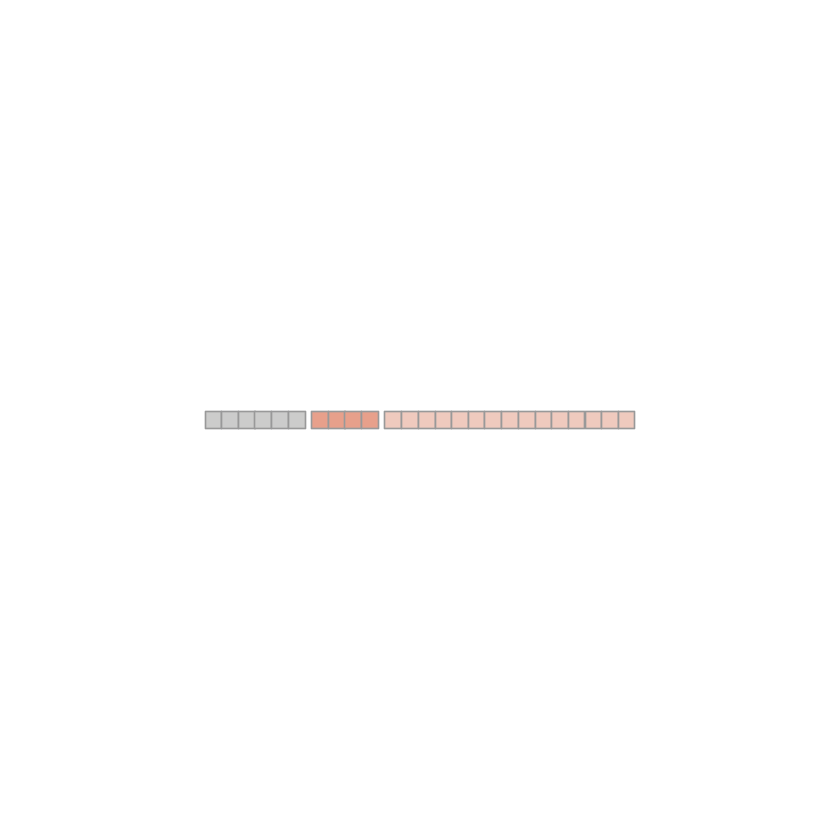

Joining, by = "reporter_id"
Joining, by = "feature"


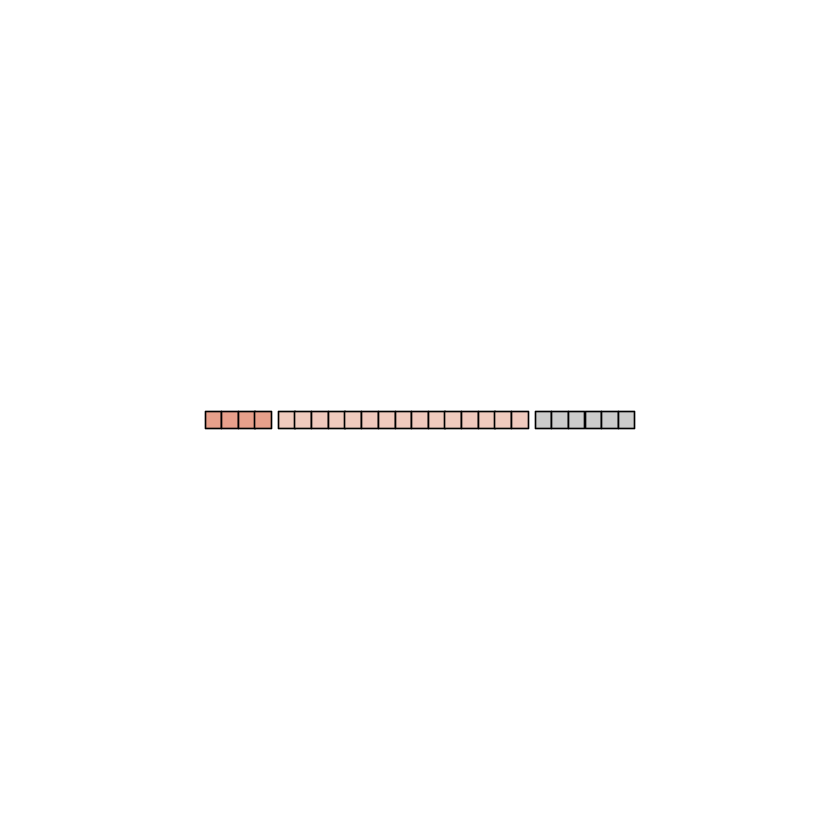

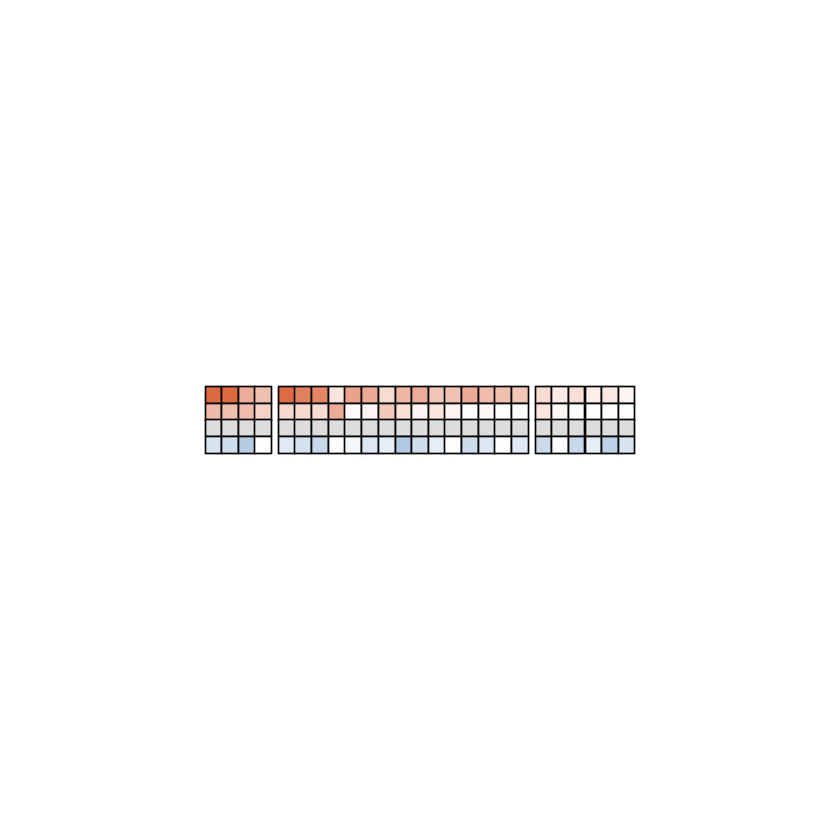

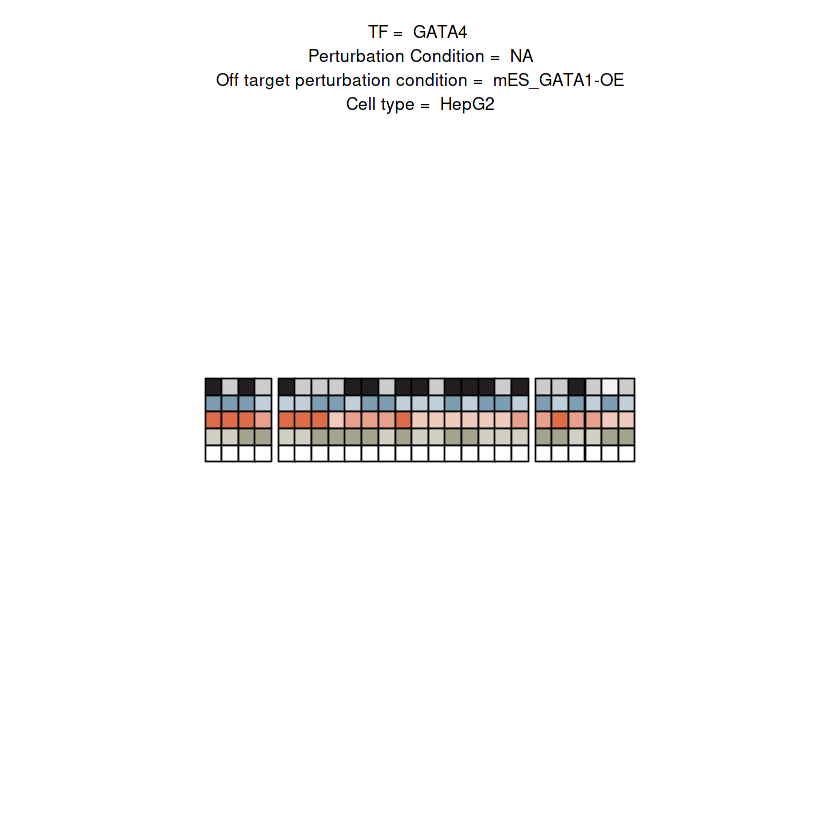

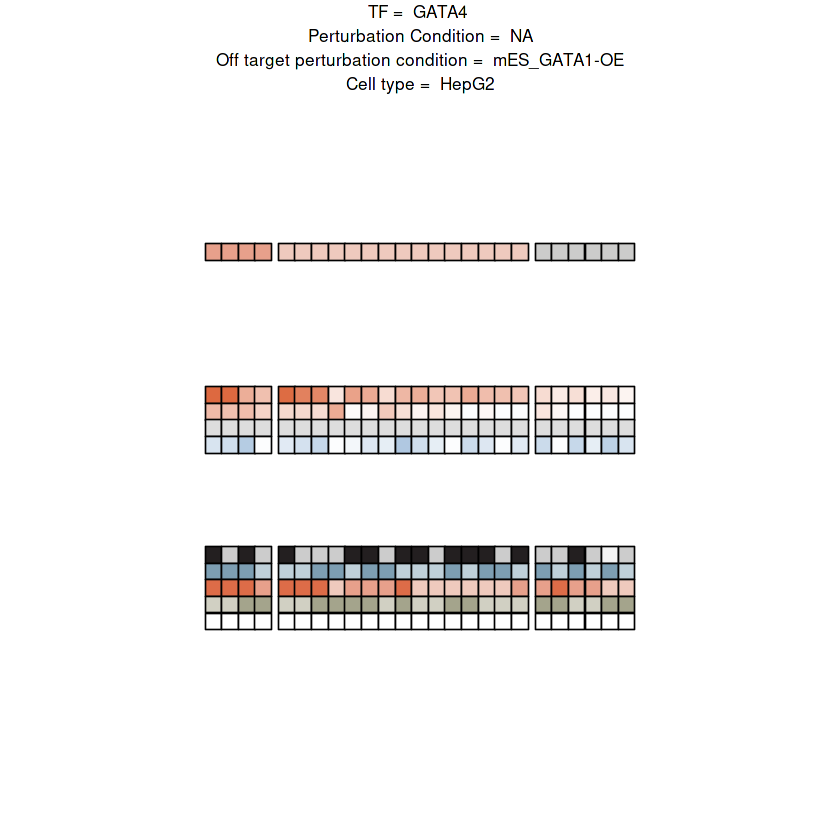

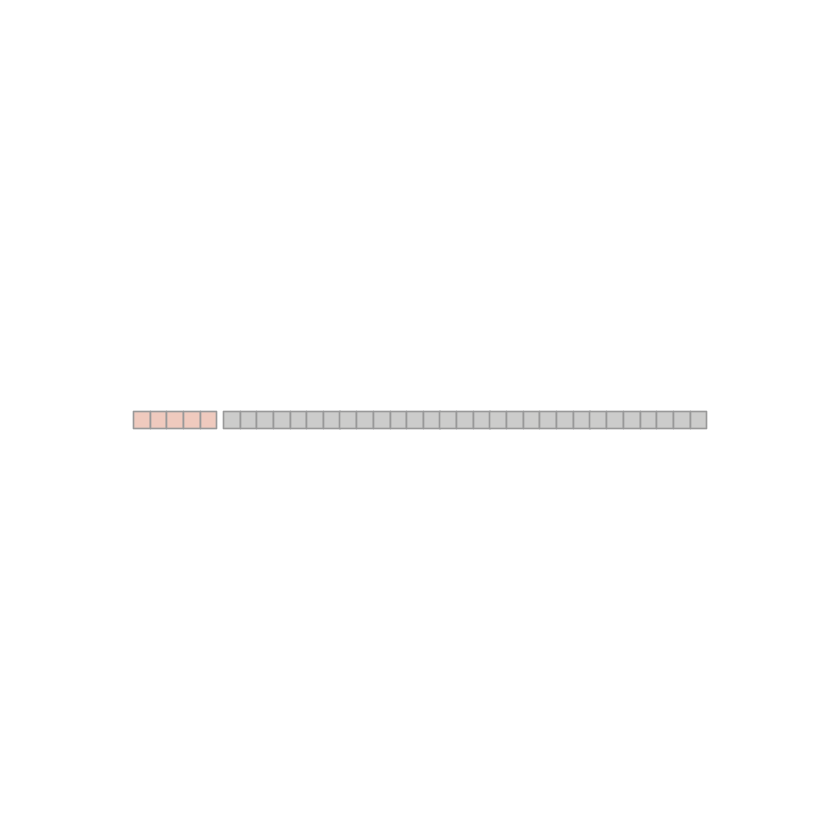

Joining, by = "reporter_id"
Joining, by = "feature"


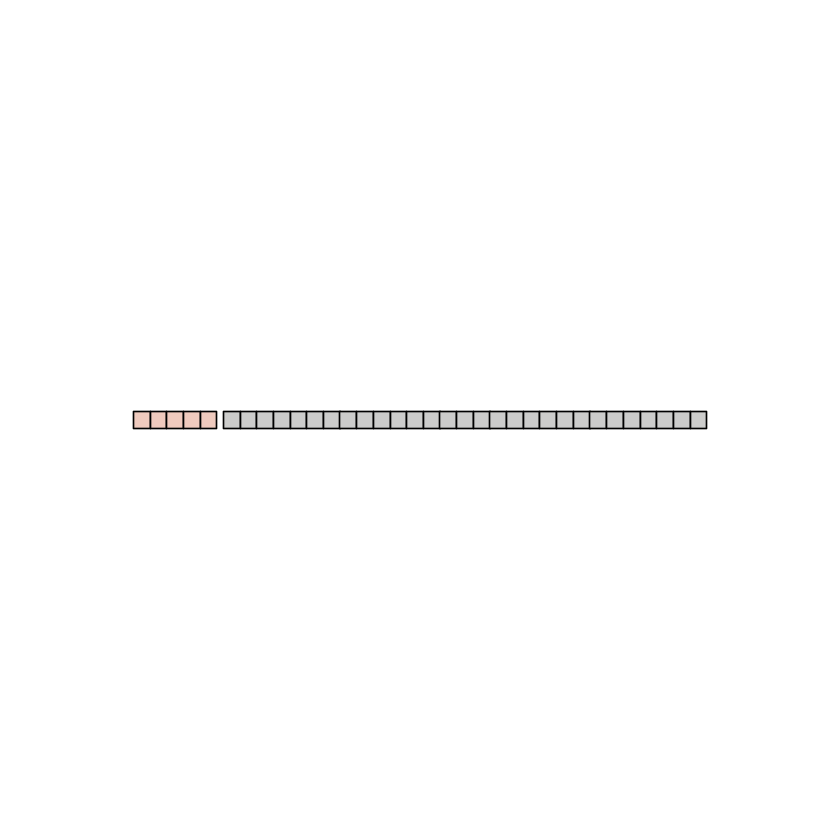

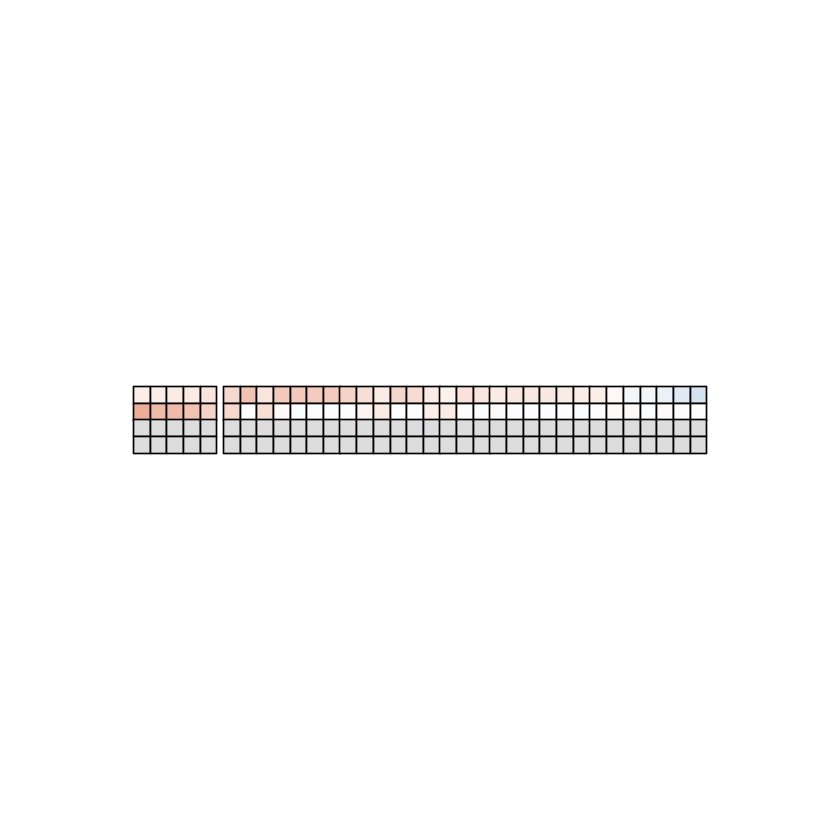

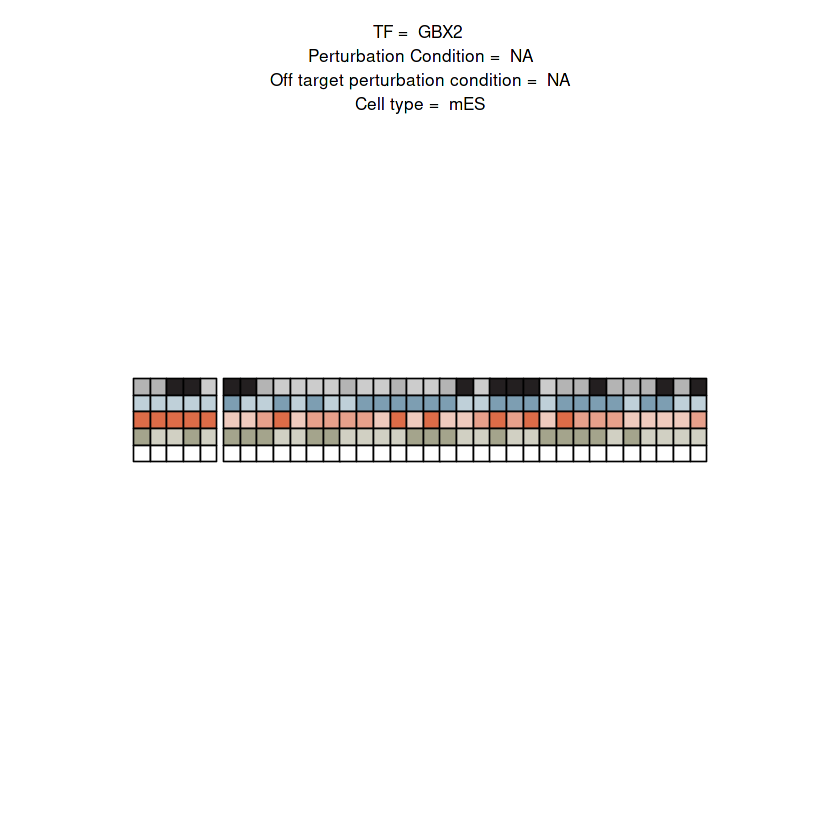

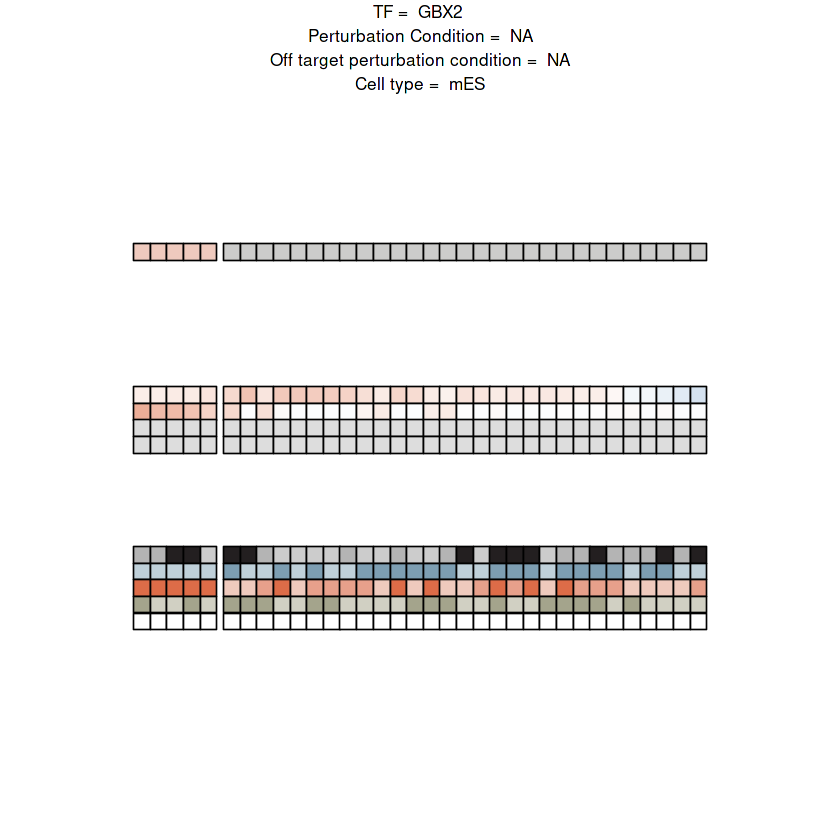

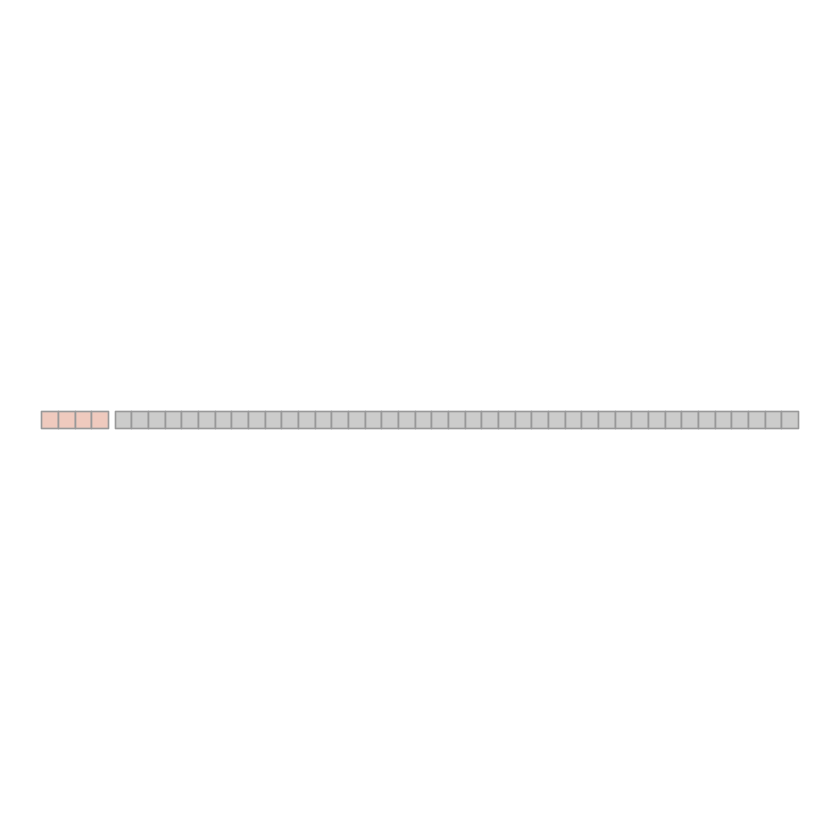

Joining, by = "reporter_id"
Joining, by = "feature"


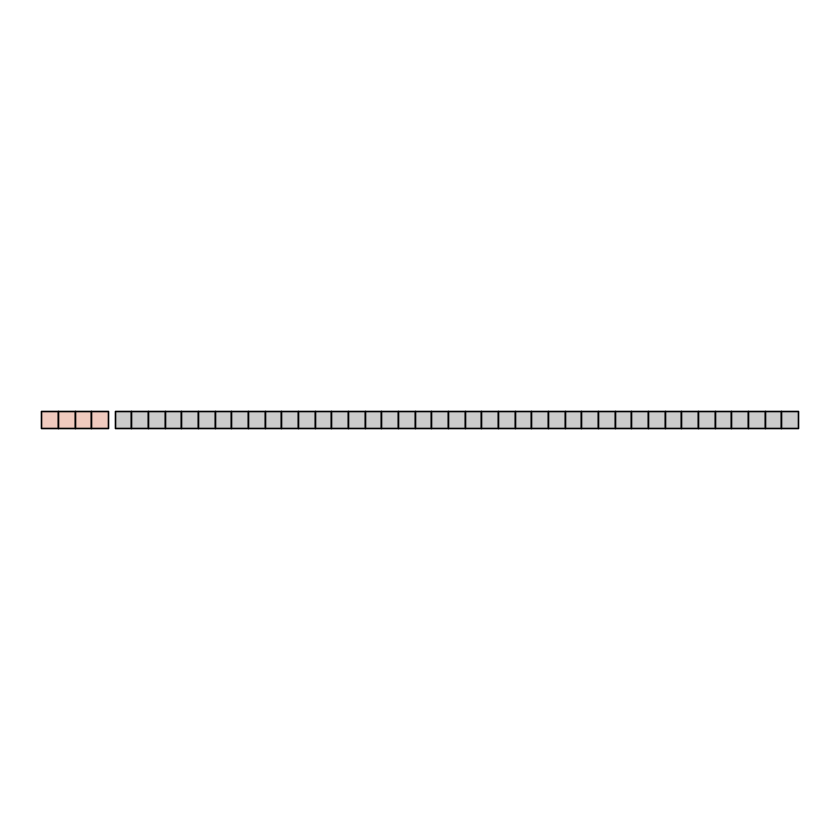

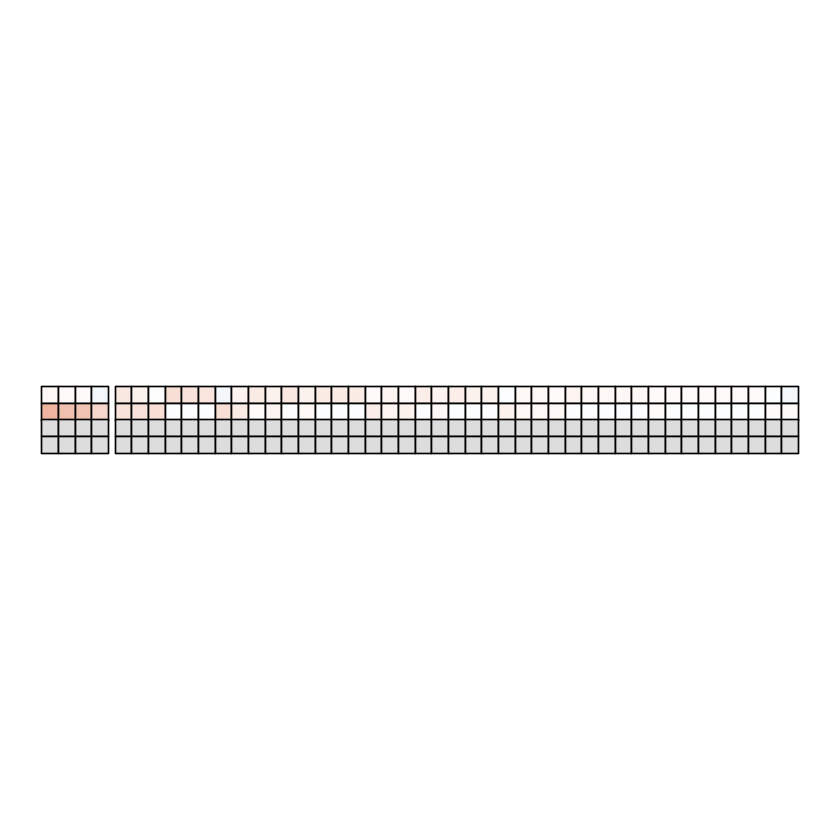

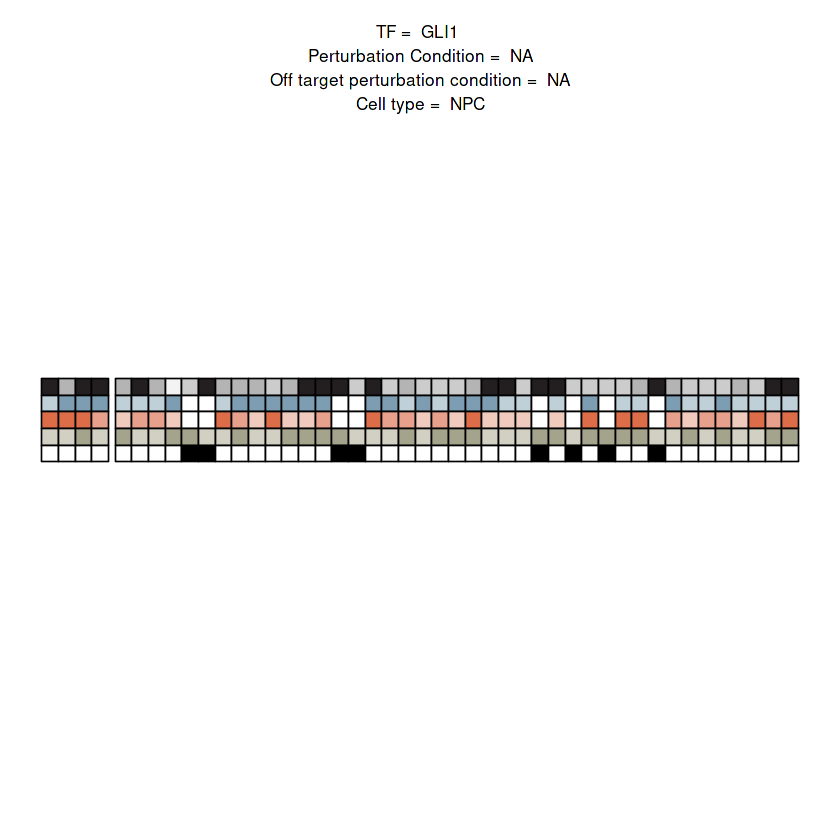

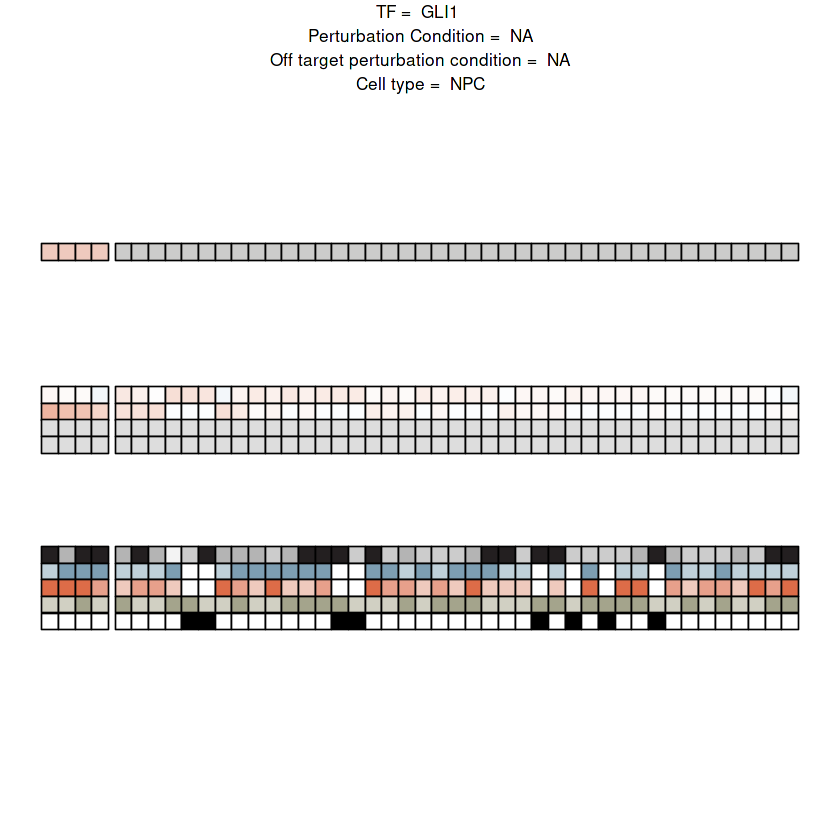

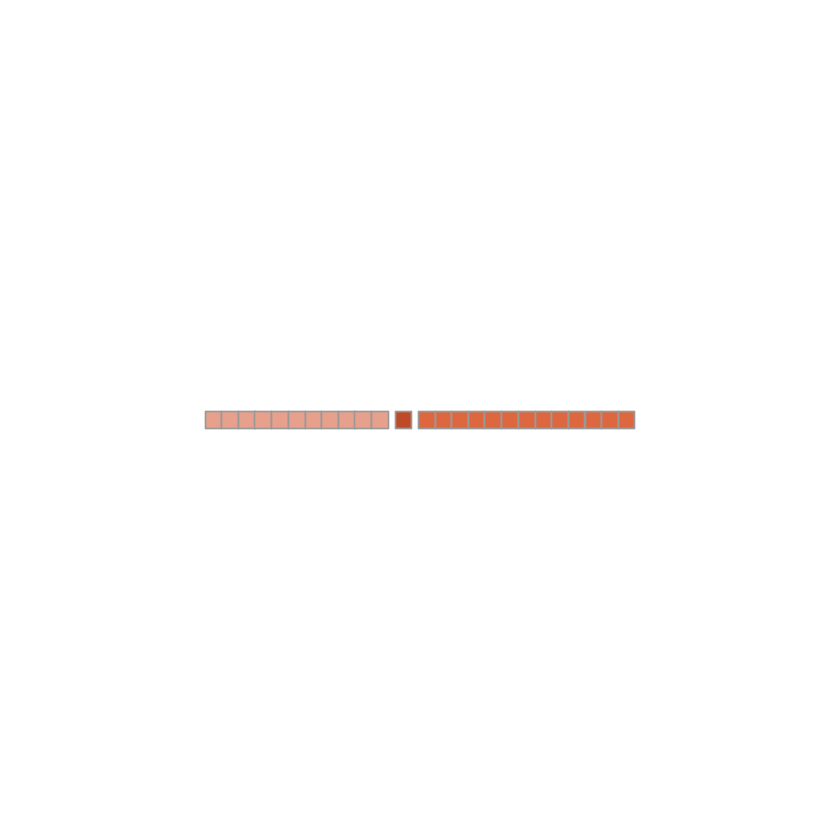

Joining, by = "reporter_id"
Joining, by = "feature"


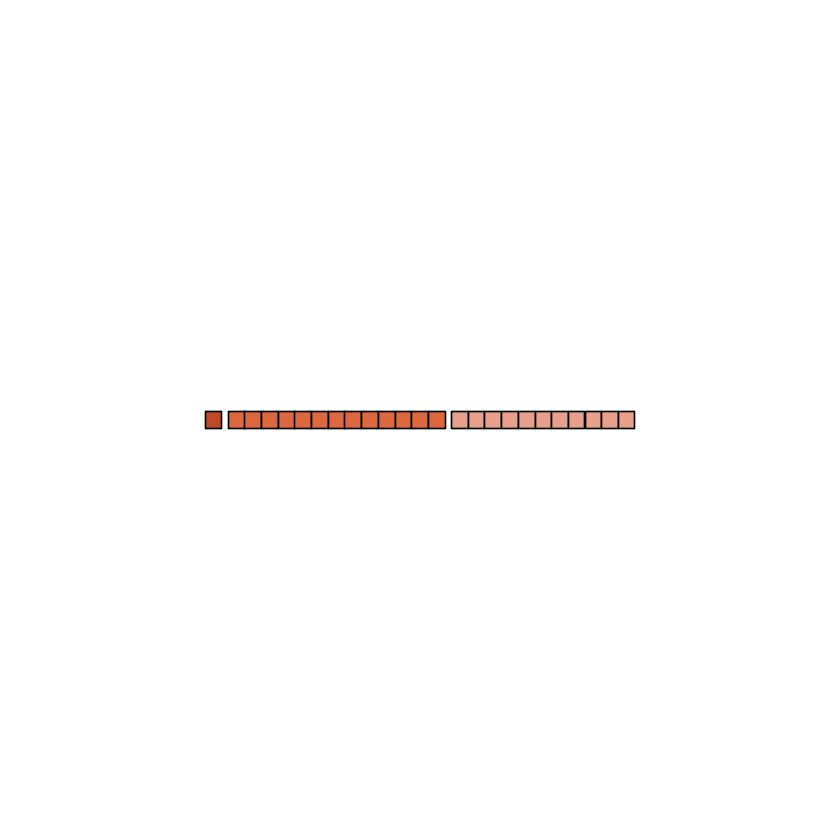

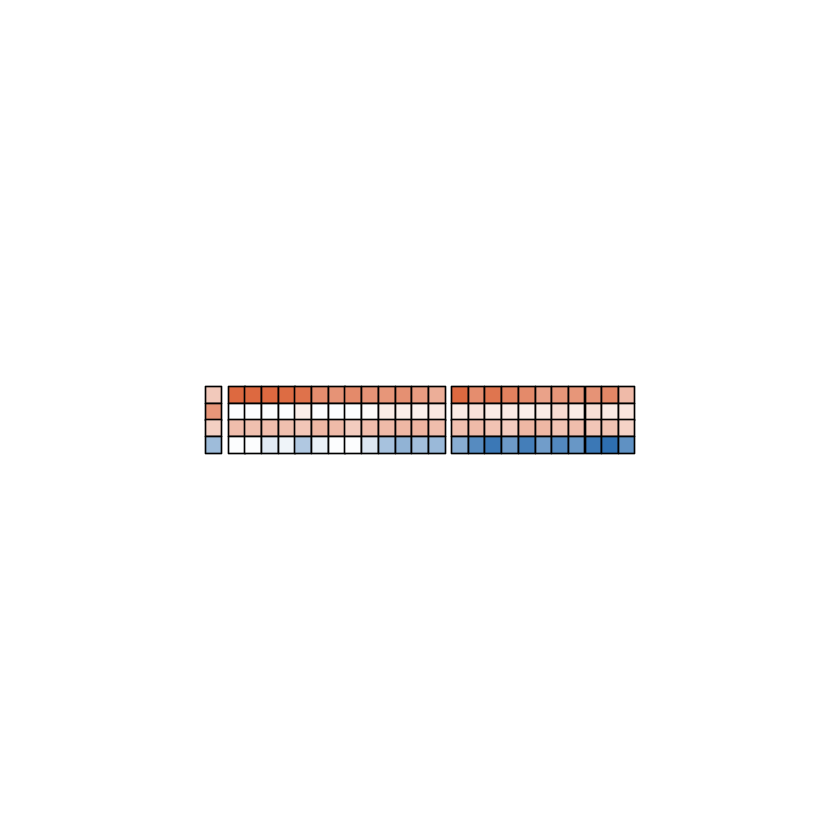

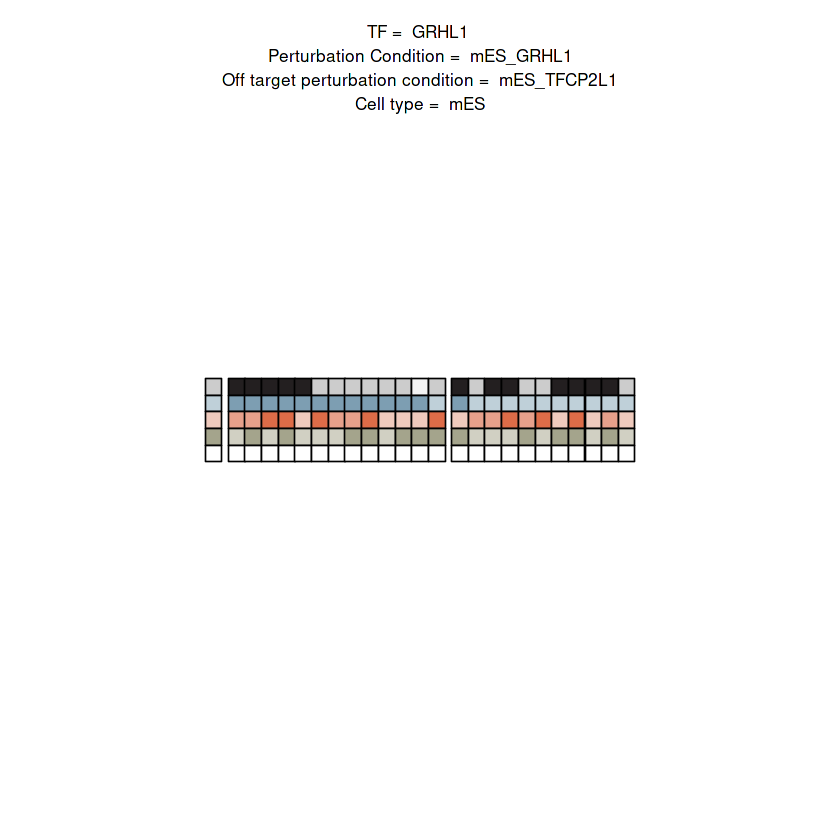

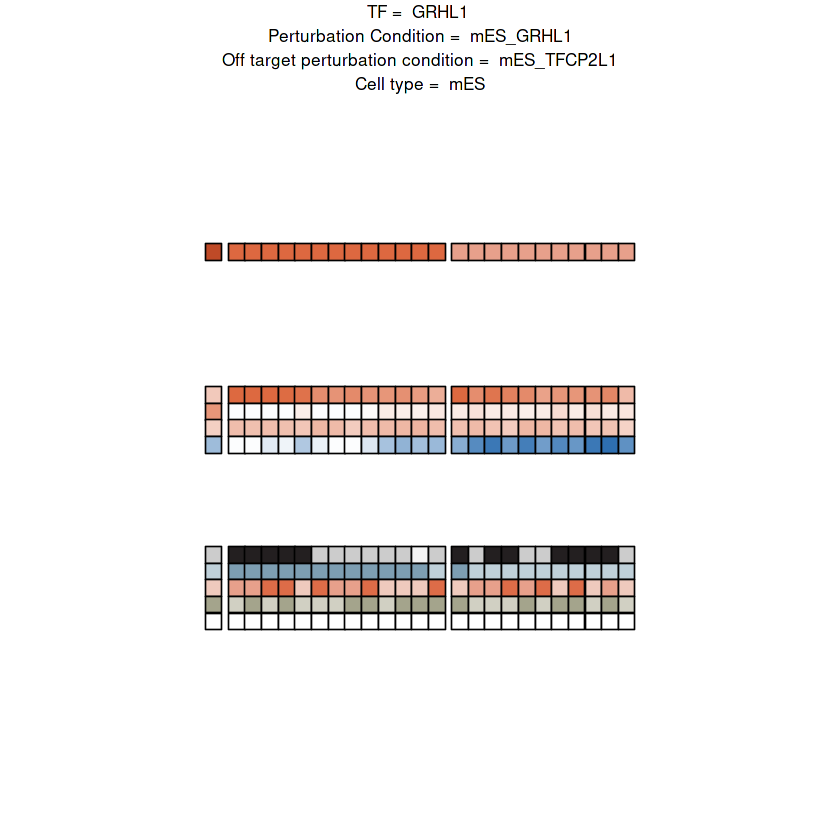

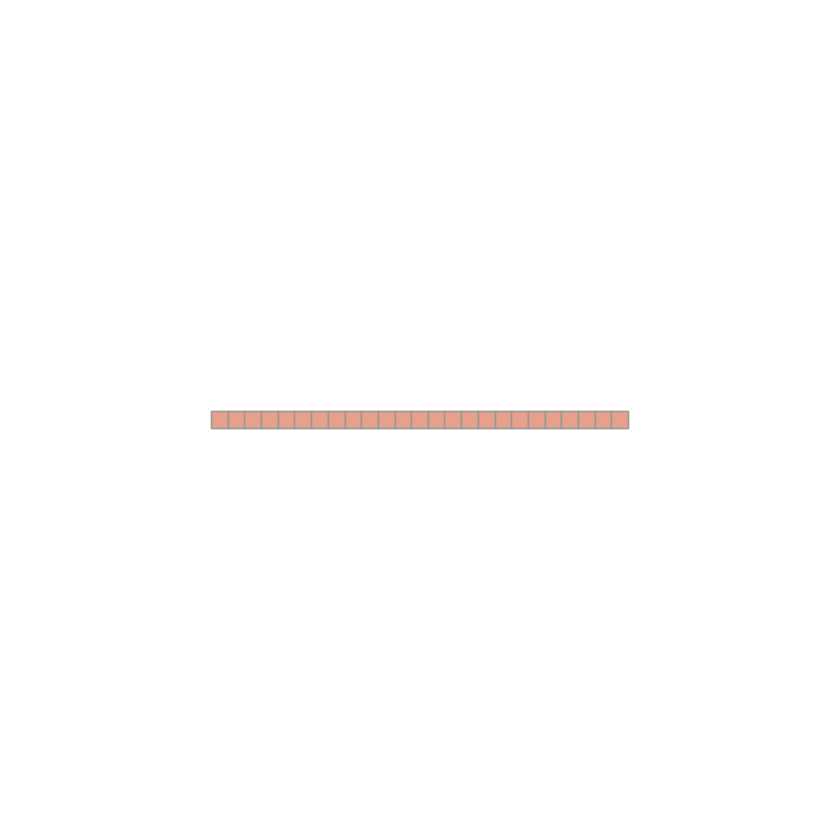

Joining, by = "reporter_id"
Joining, by = "feature"


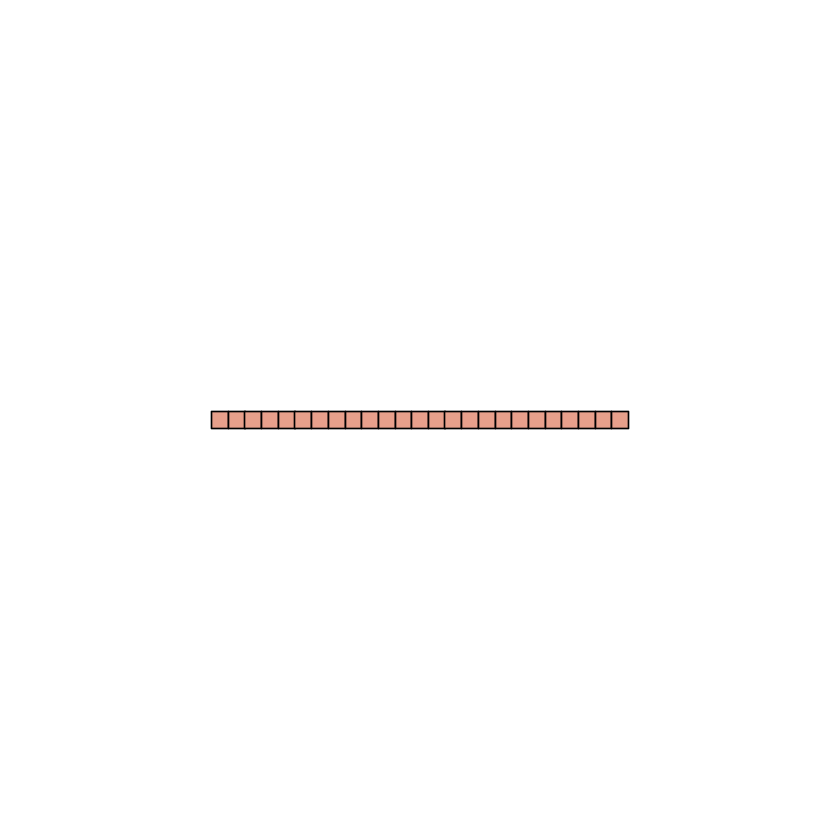

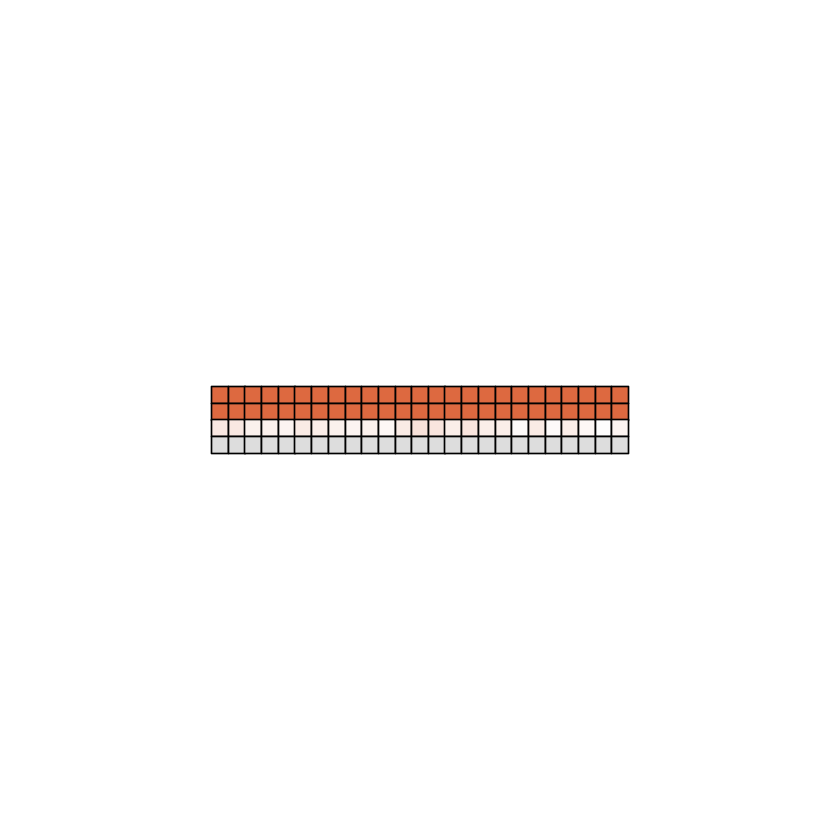

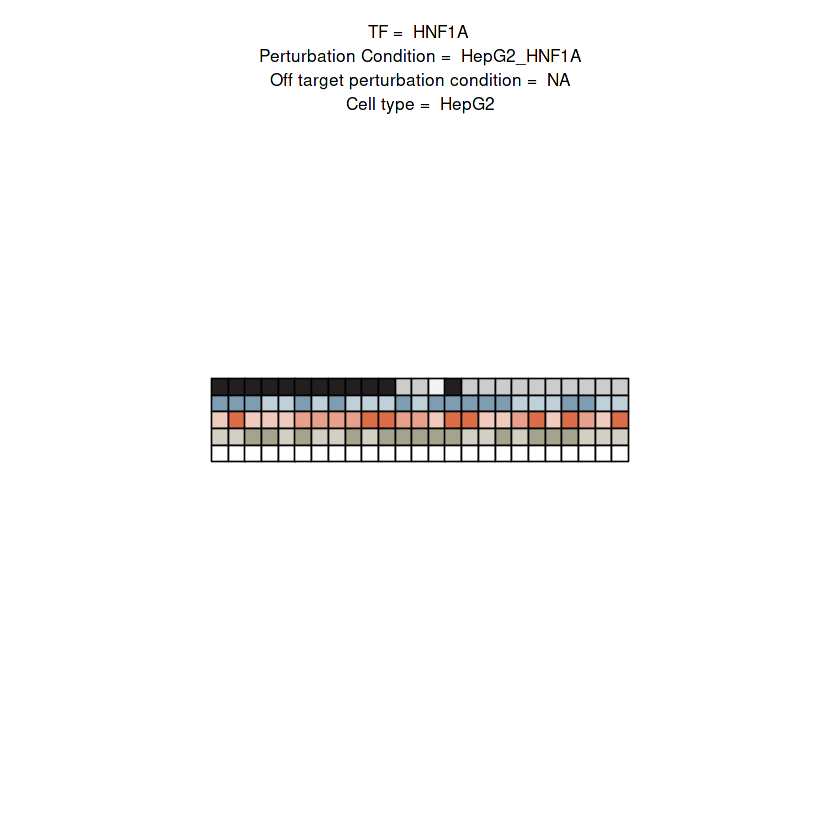

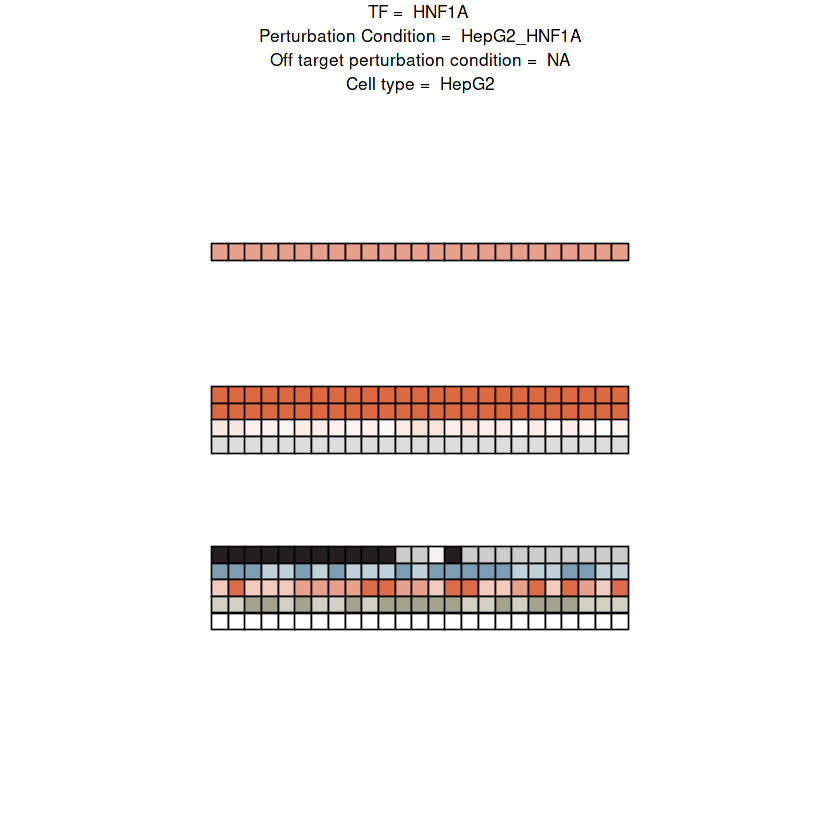

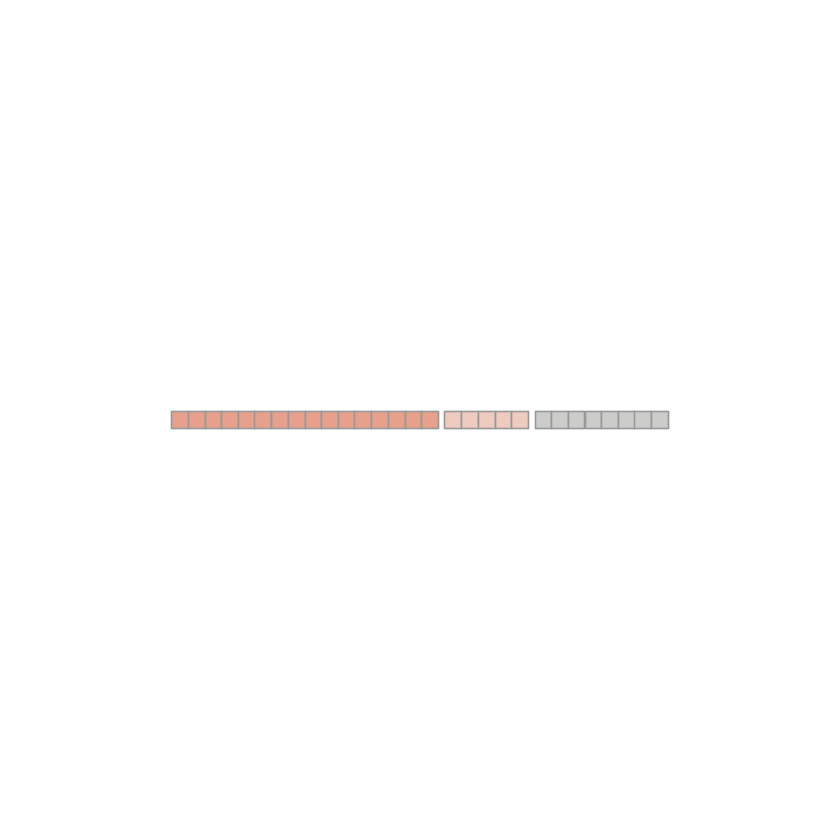

Joining, by = "reporter_id"
Joining, by = "feature"


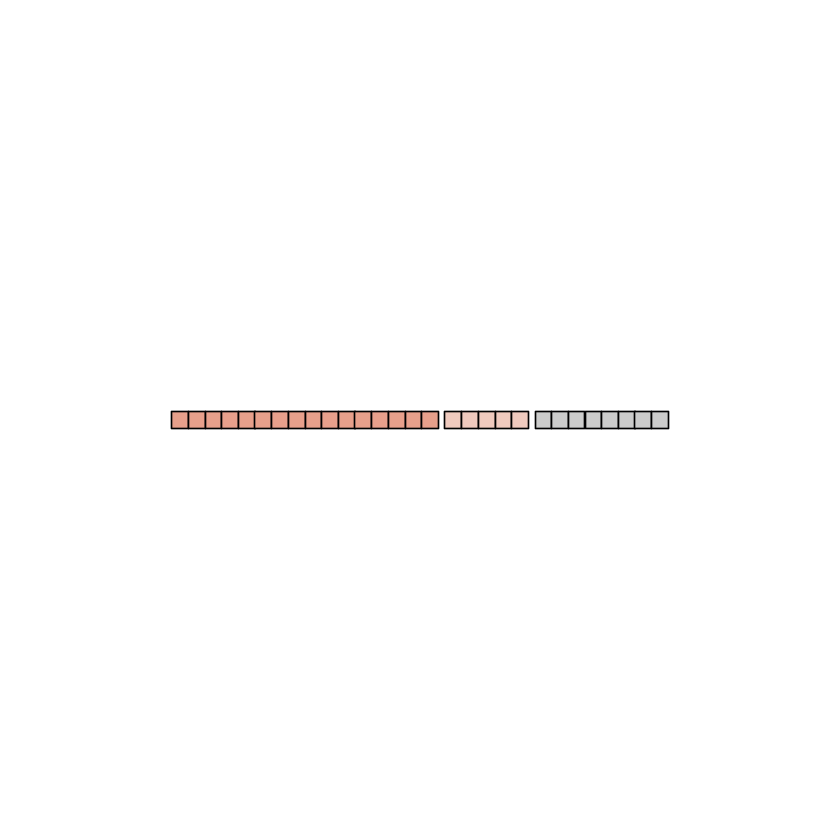

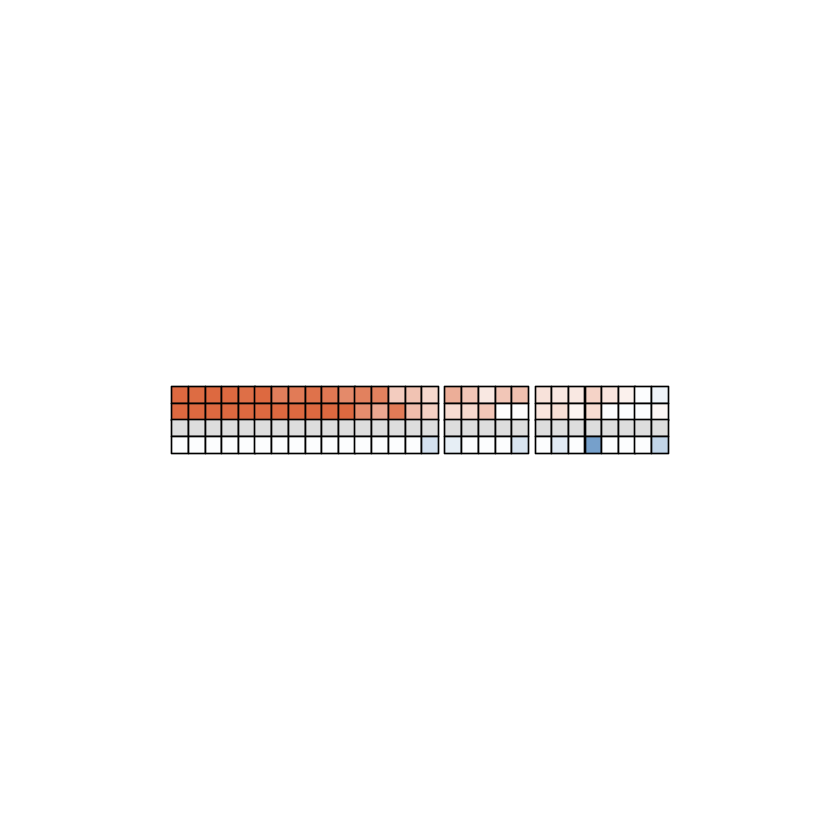

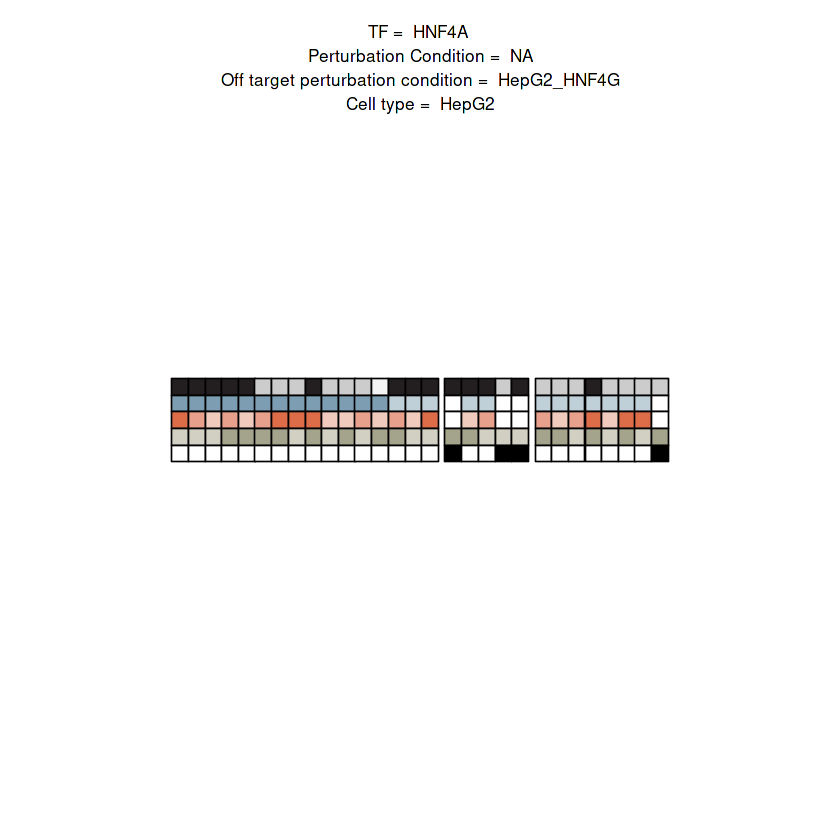

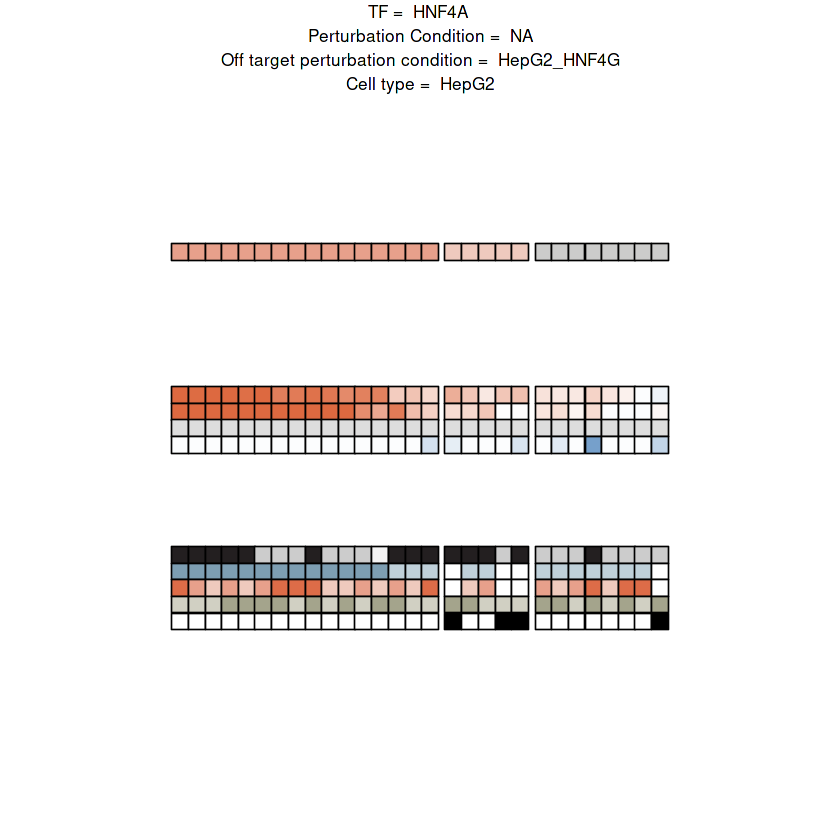

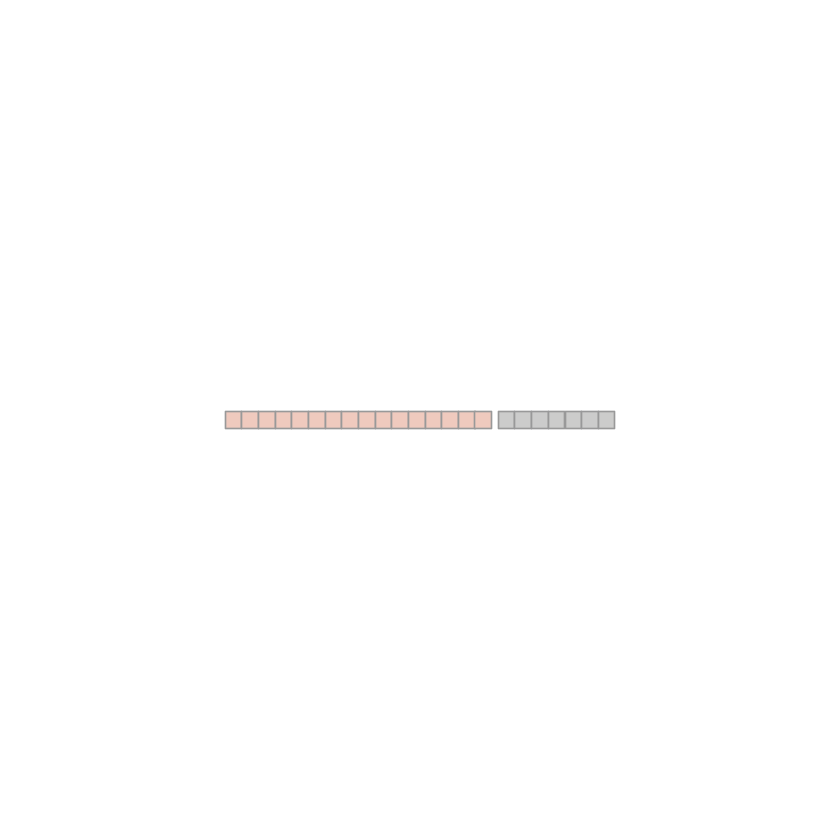

Joining, by = "reporter_id"
Joining, by = "feature"


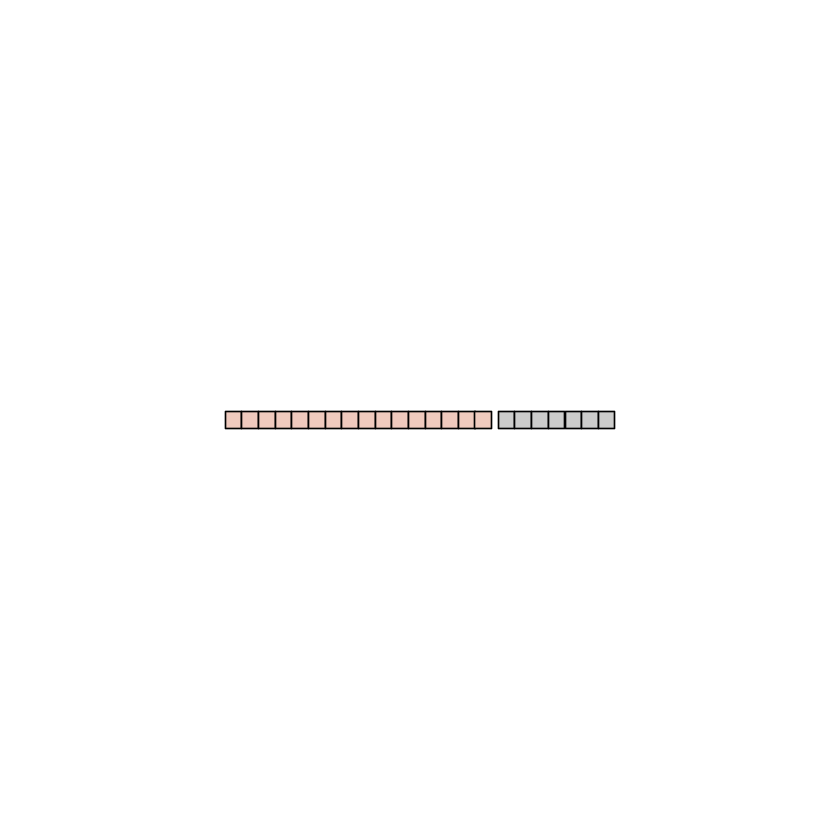

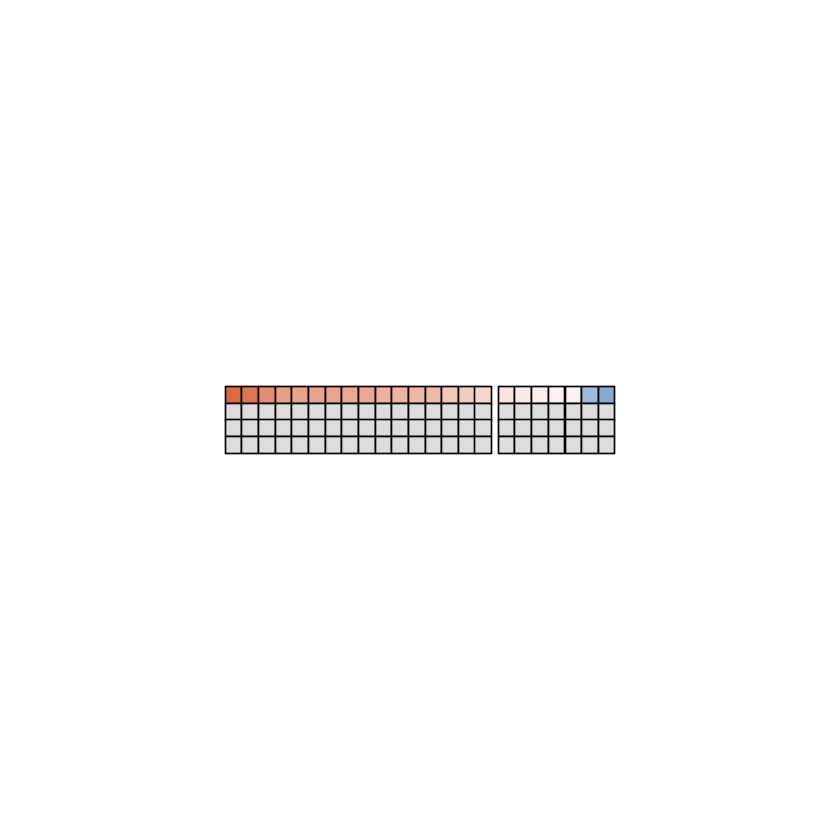

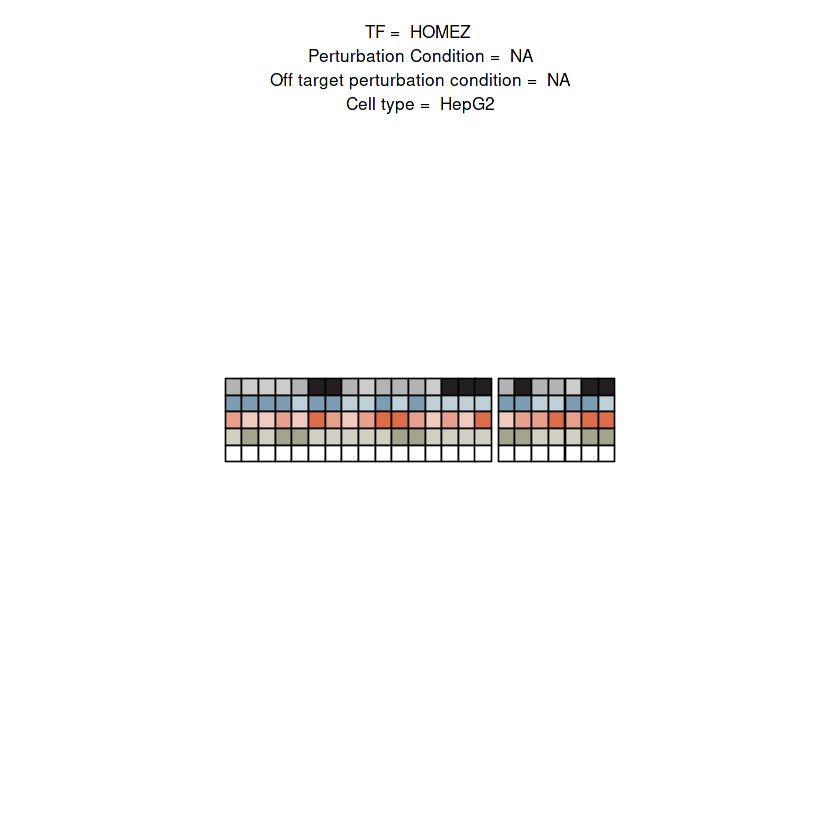

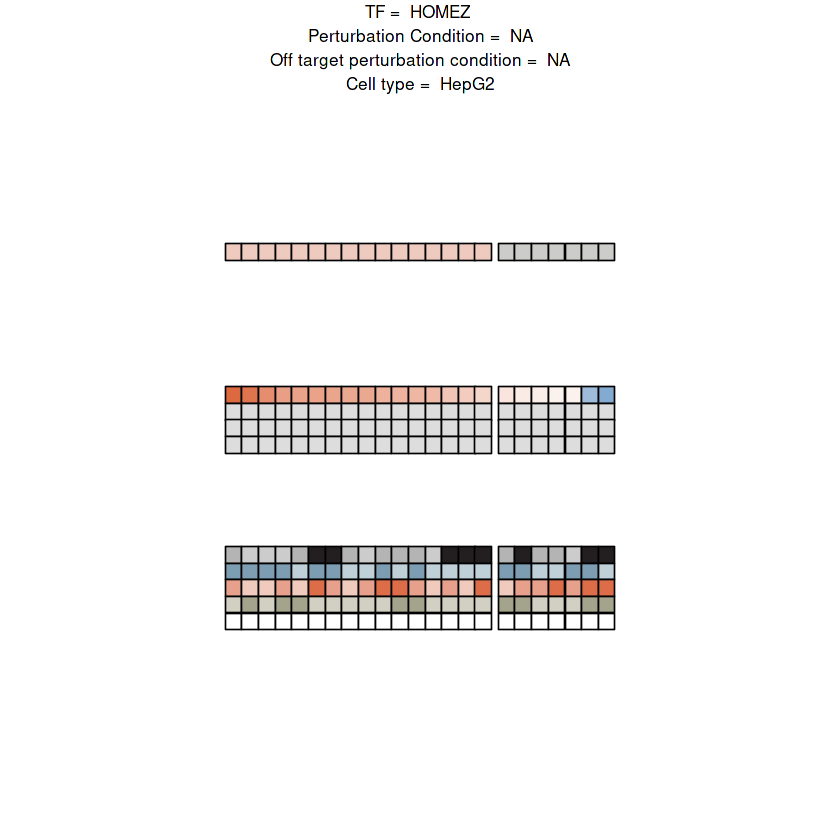

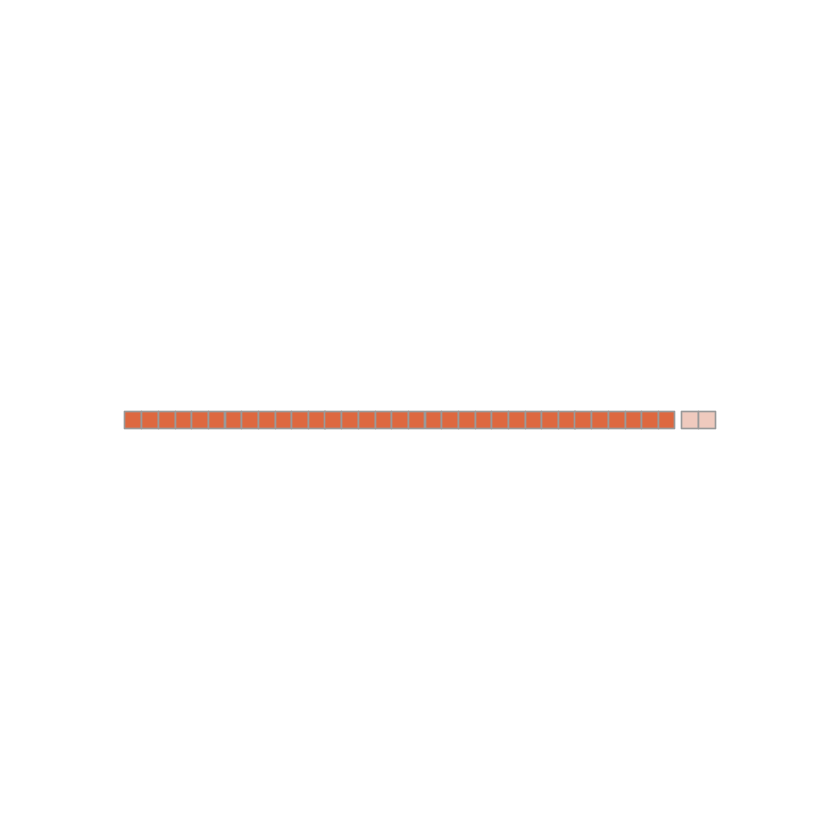

Joining, by = "reporter_id"
Joining, by = "feature"


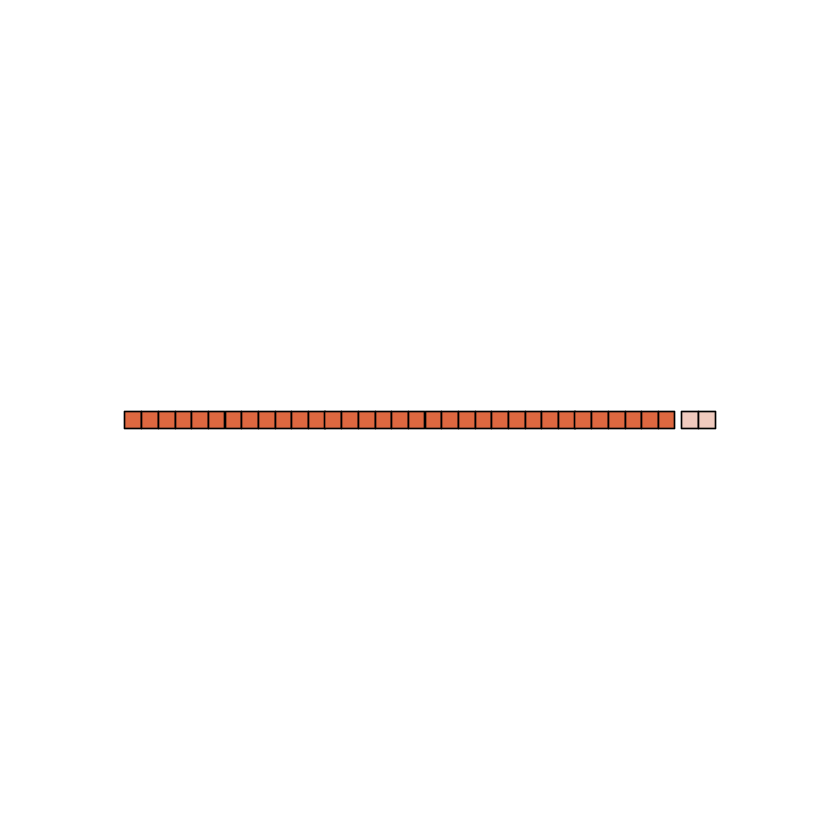

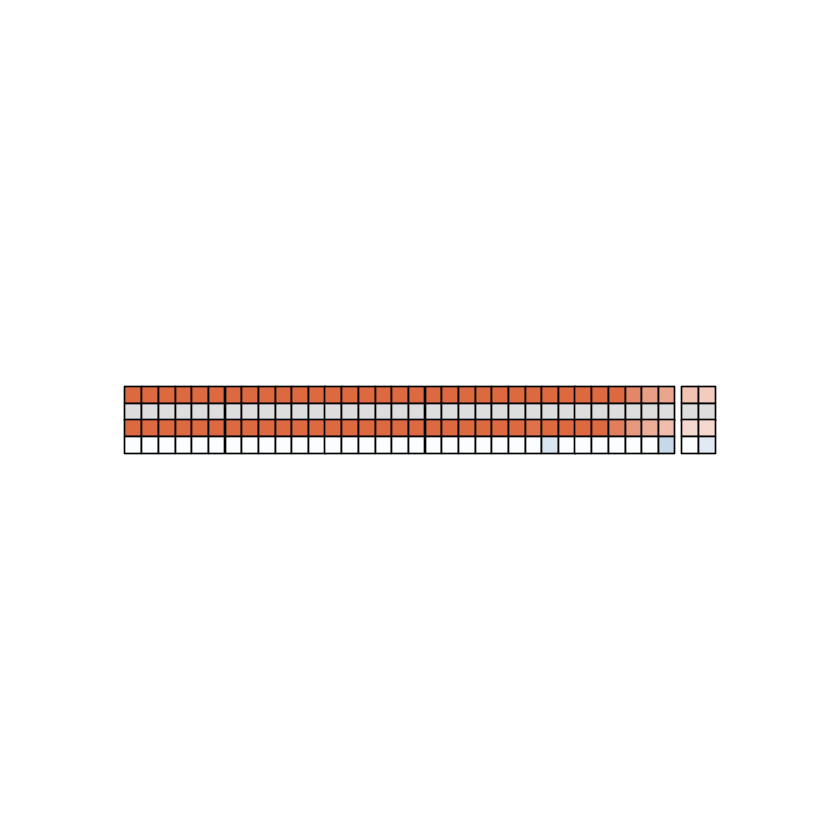

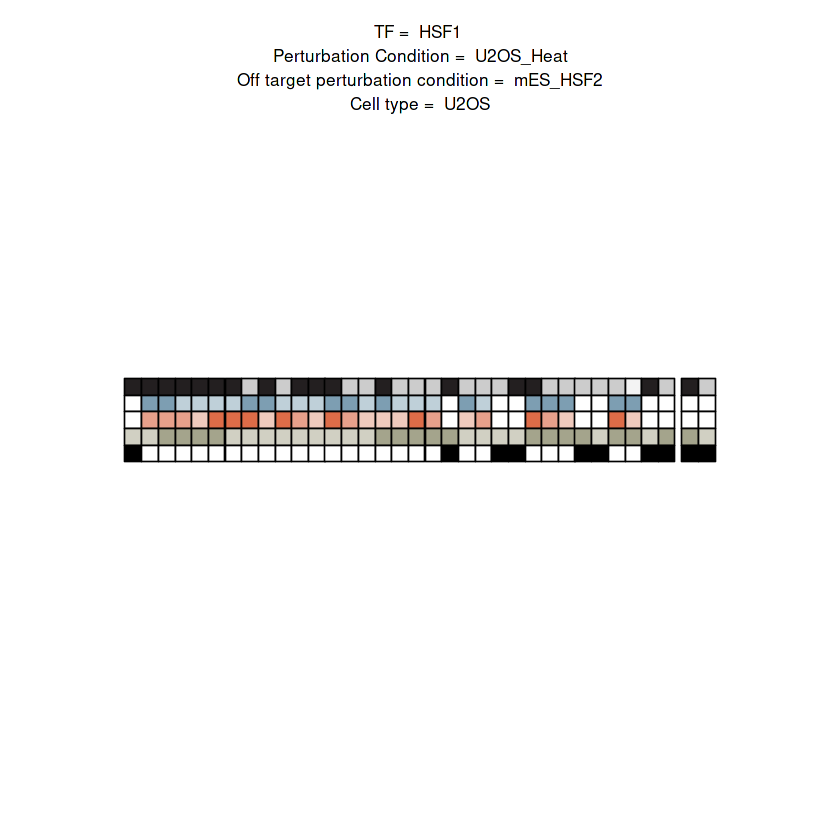

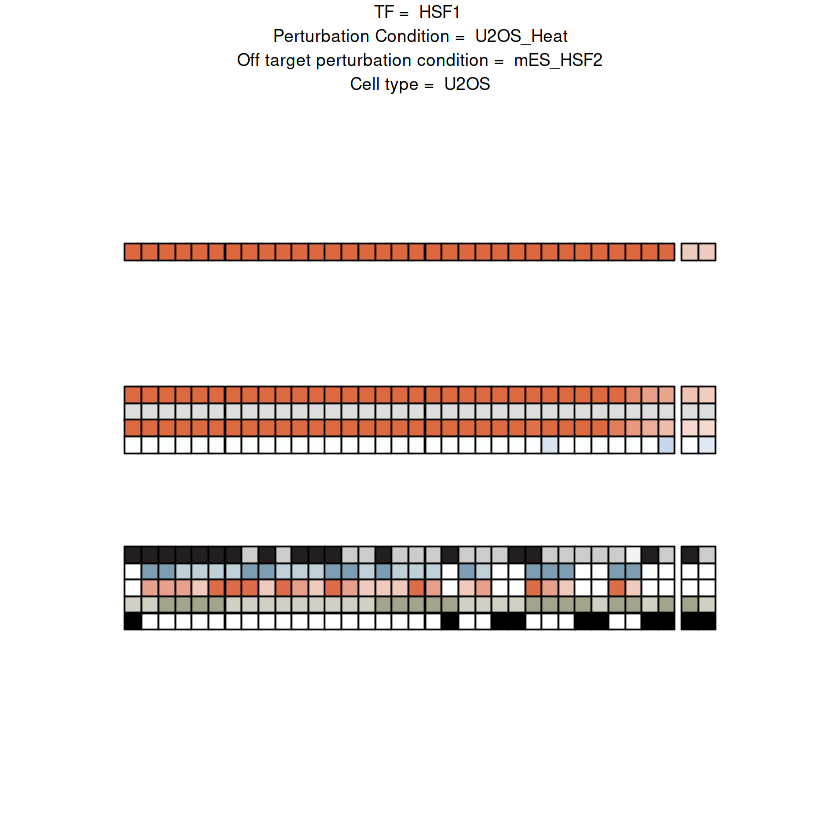

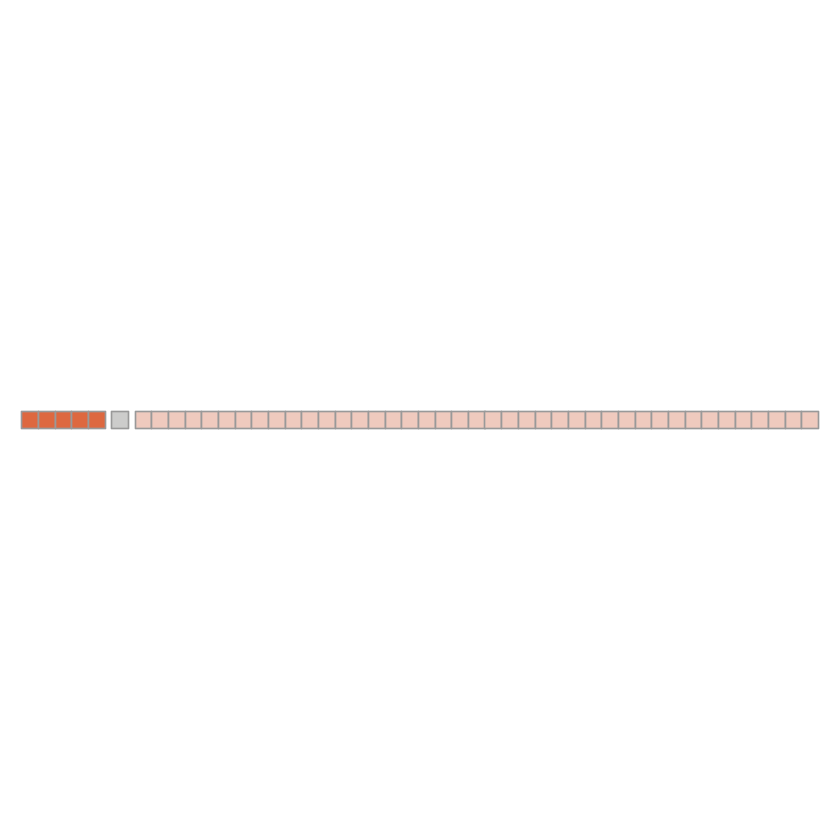

Joining, by = "reporter_id"
Joining, by = "feature"


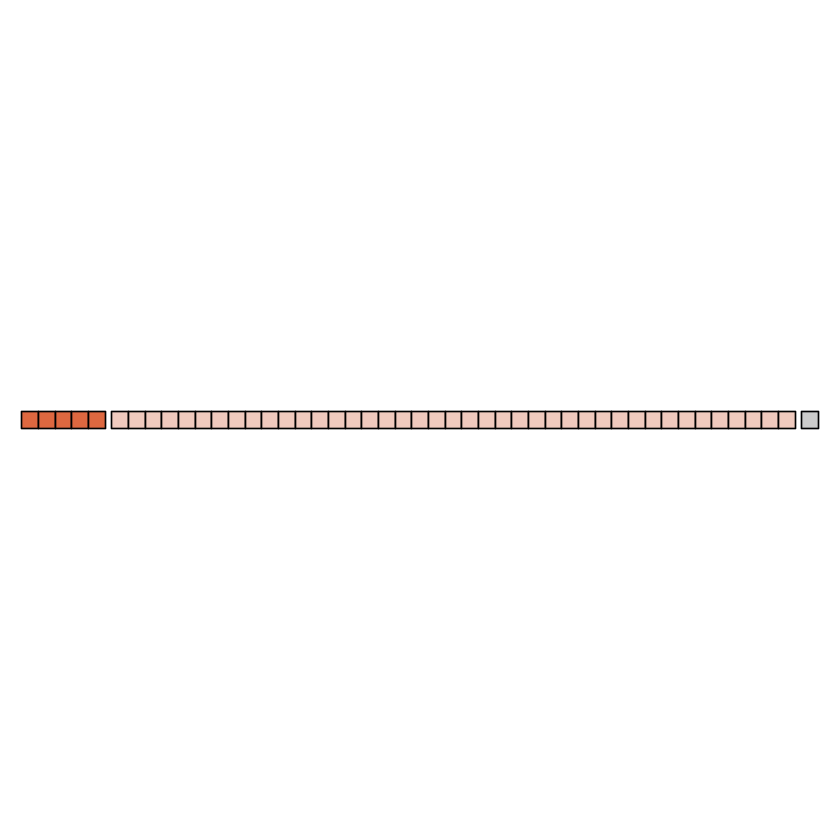

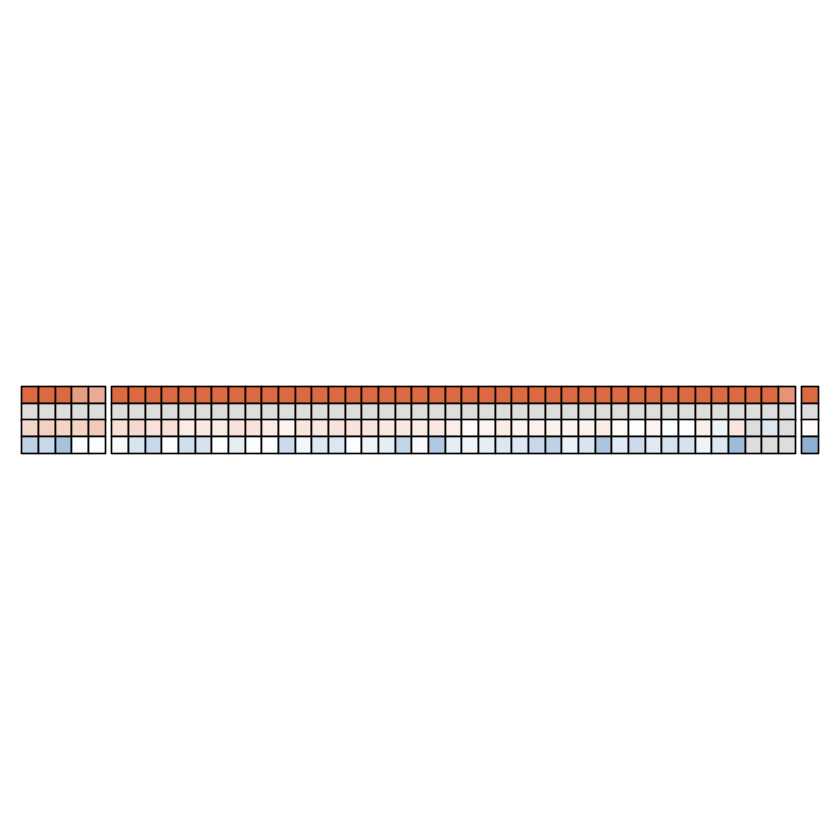

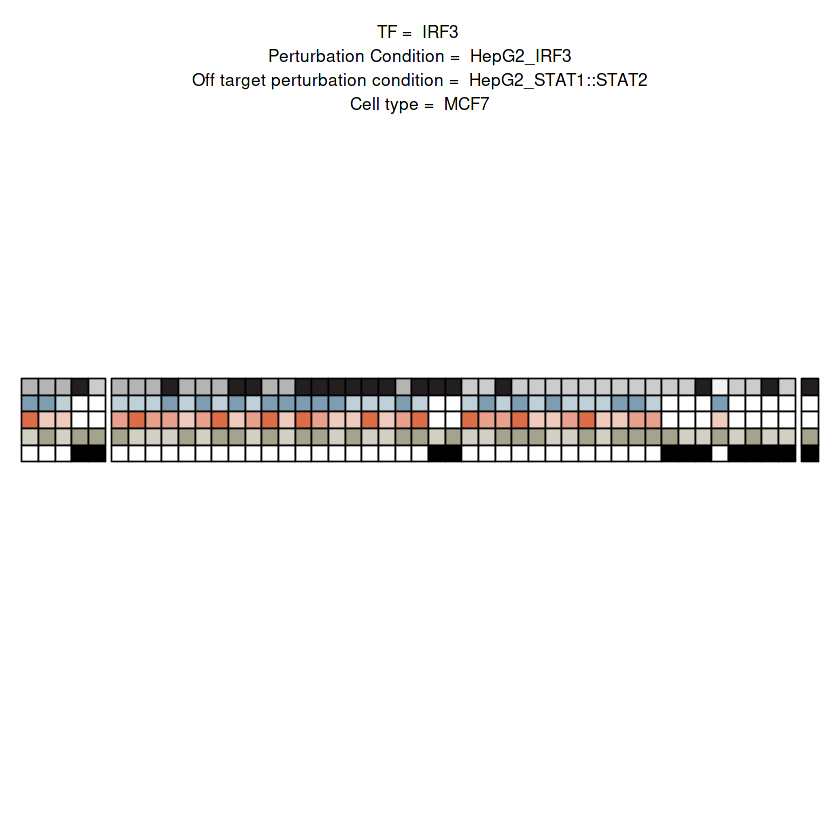

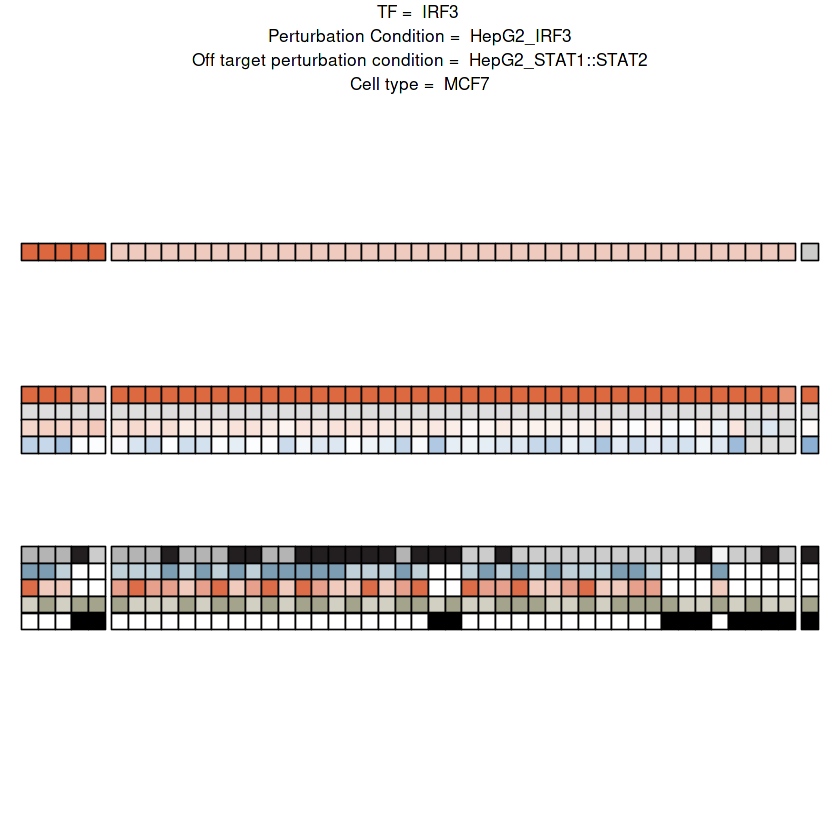

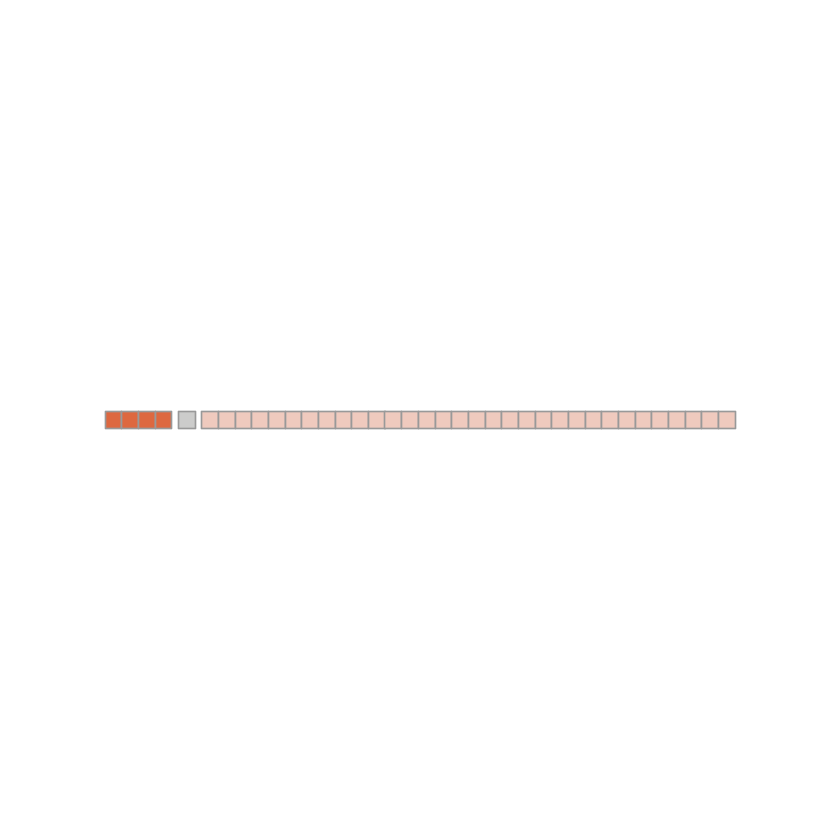

Joining, by = "reporter_id"
Joining, by = "feature"


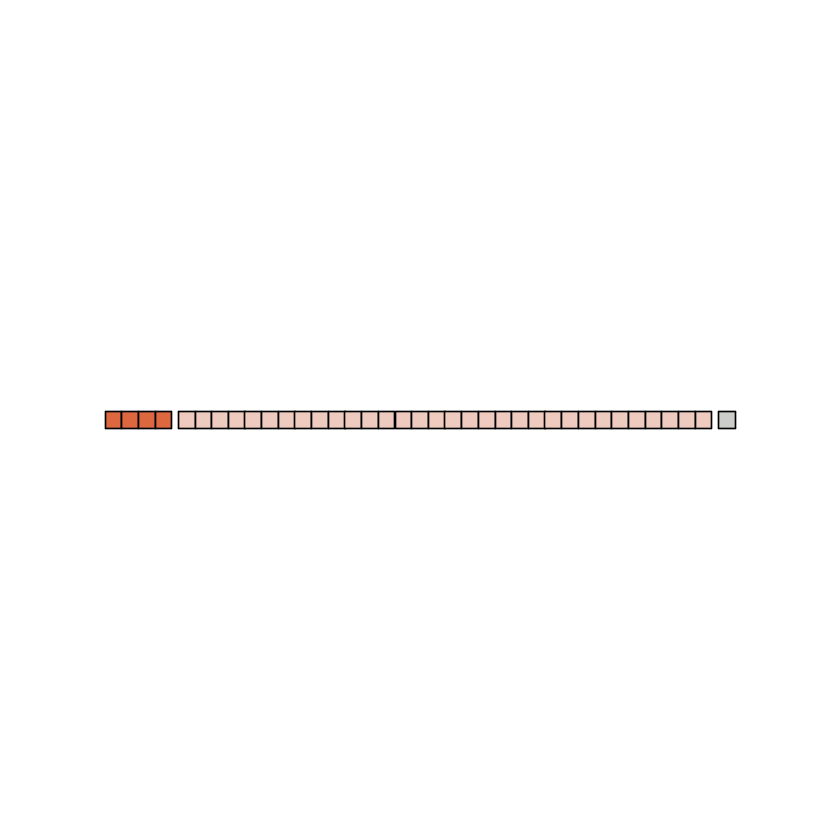

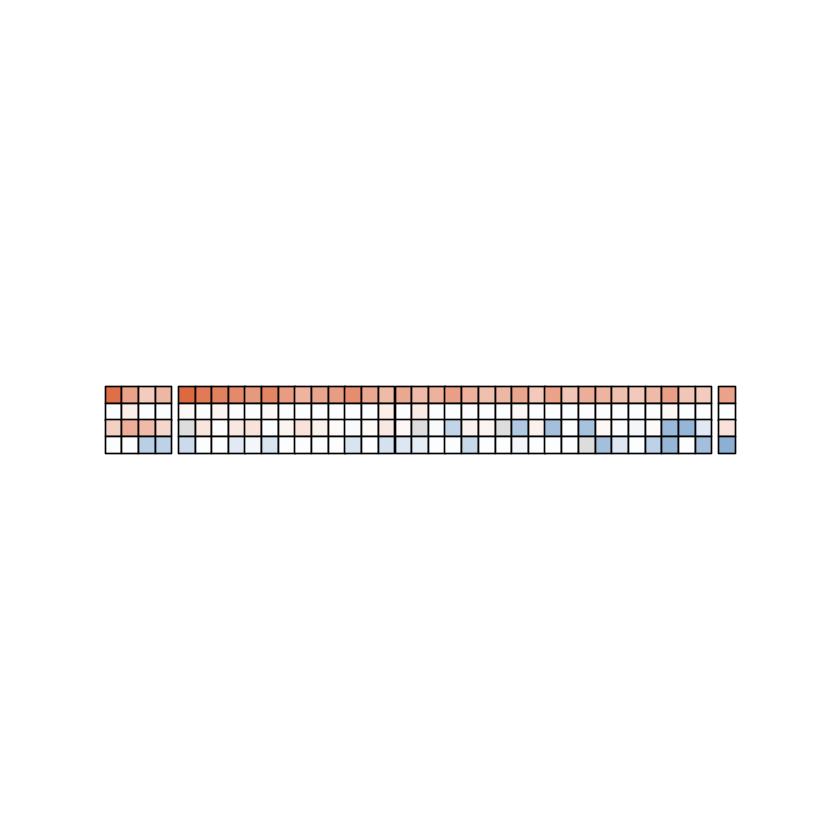

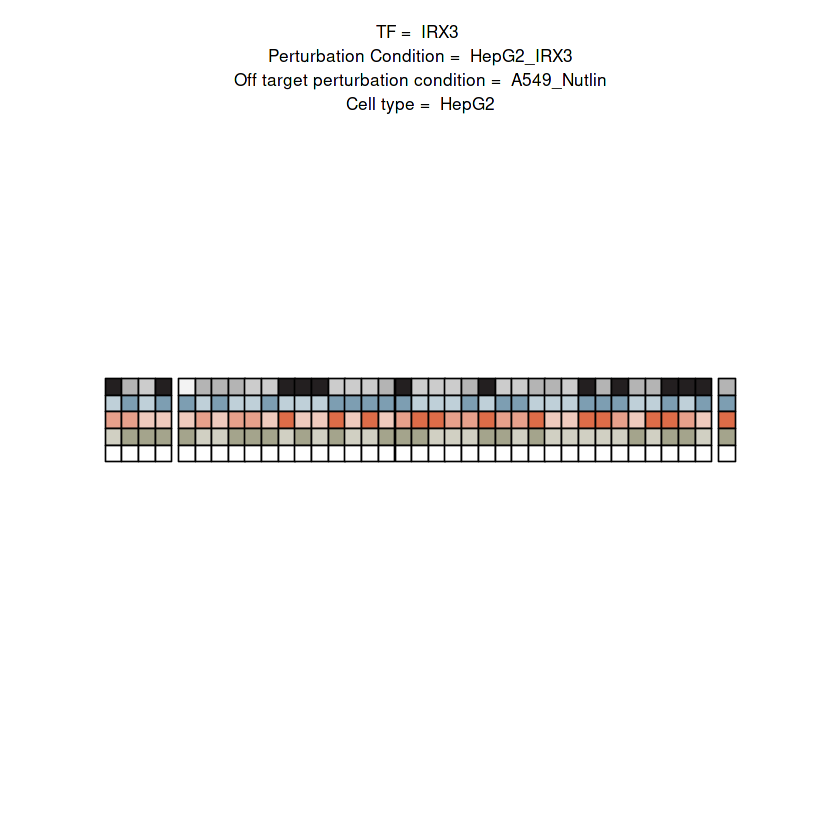

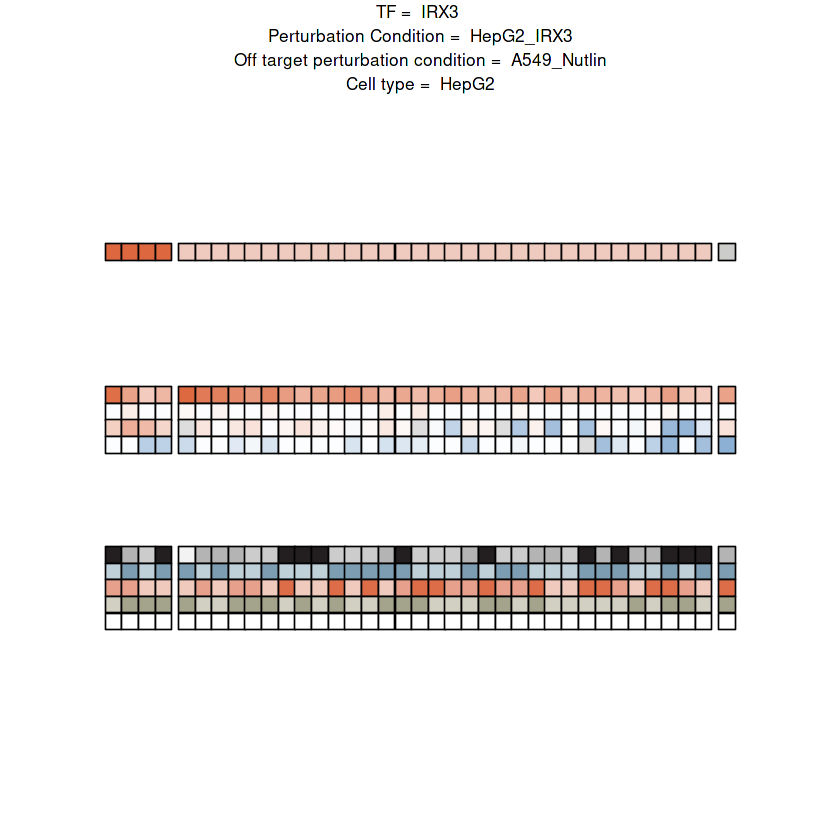

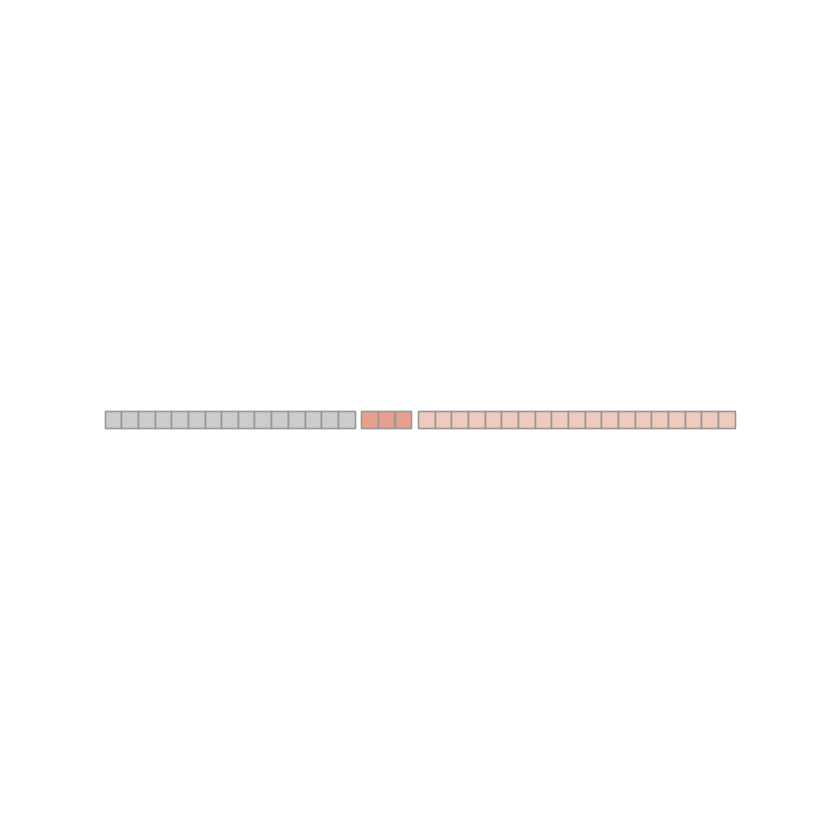

Joining, by = "reporter_id"
Joining, by = "feature"


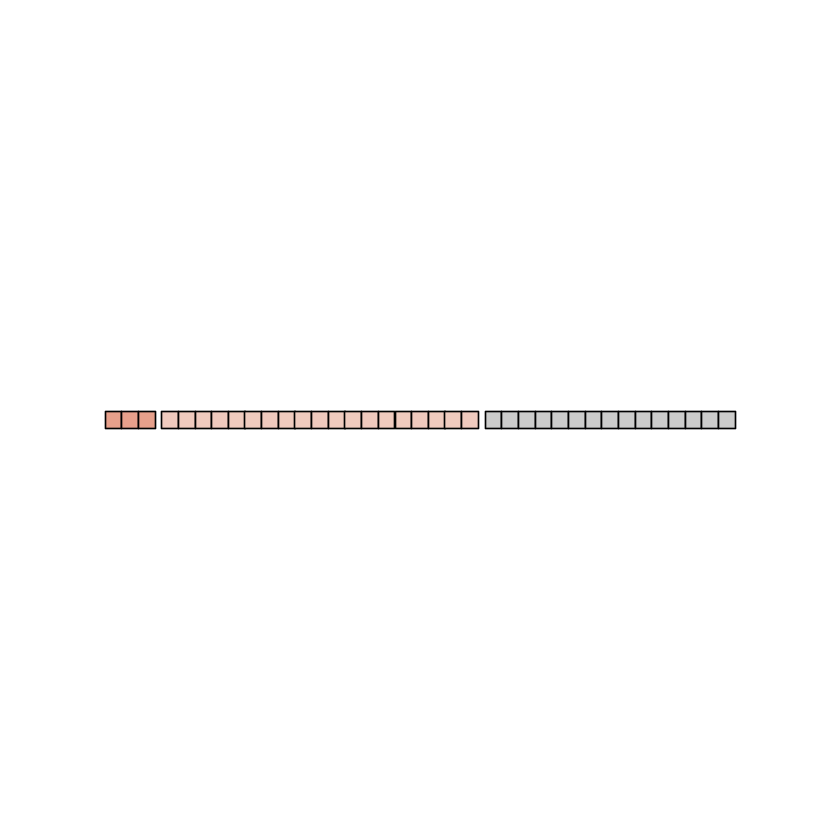

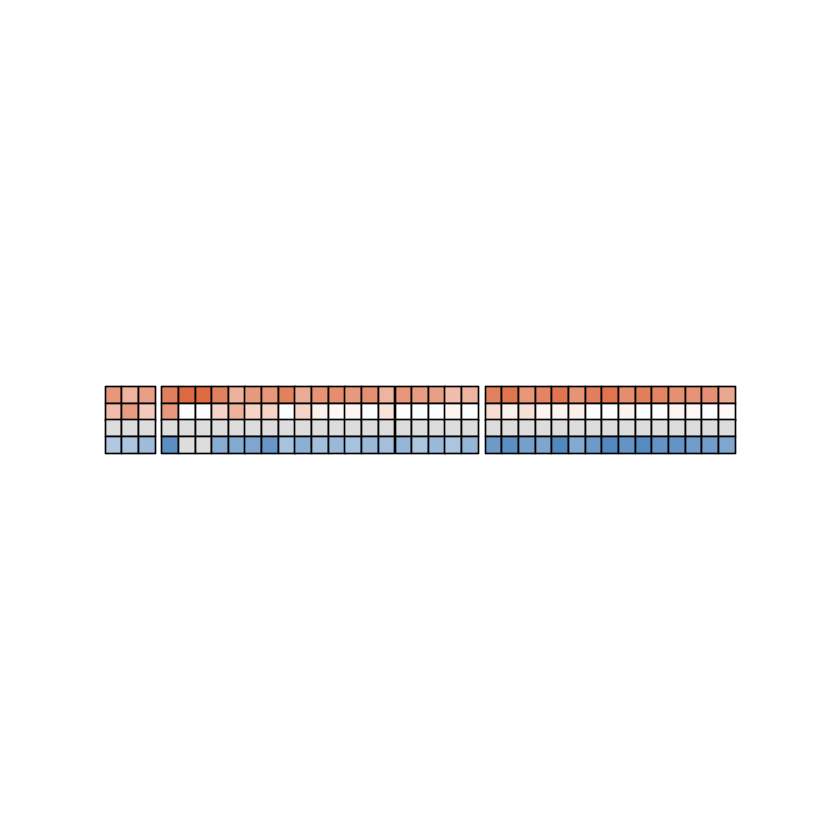

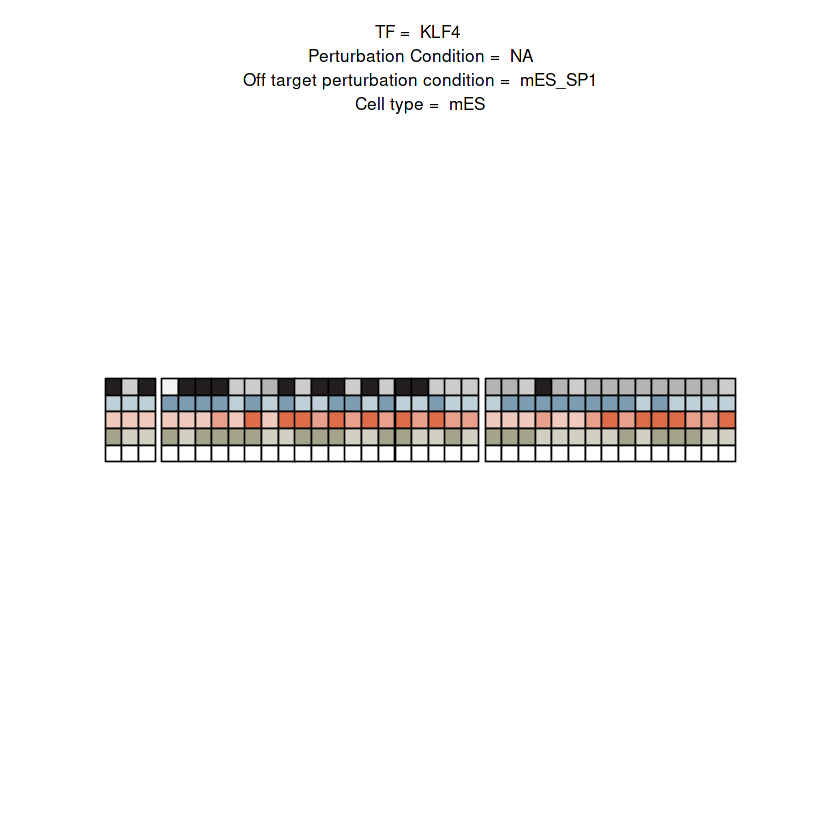

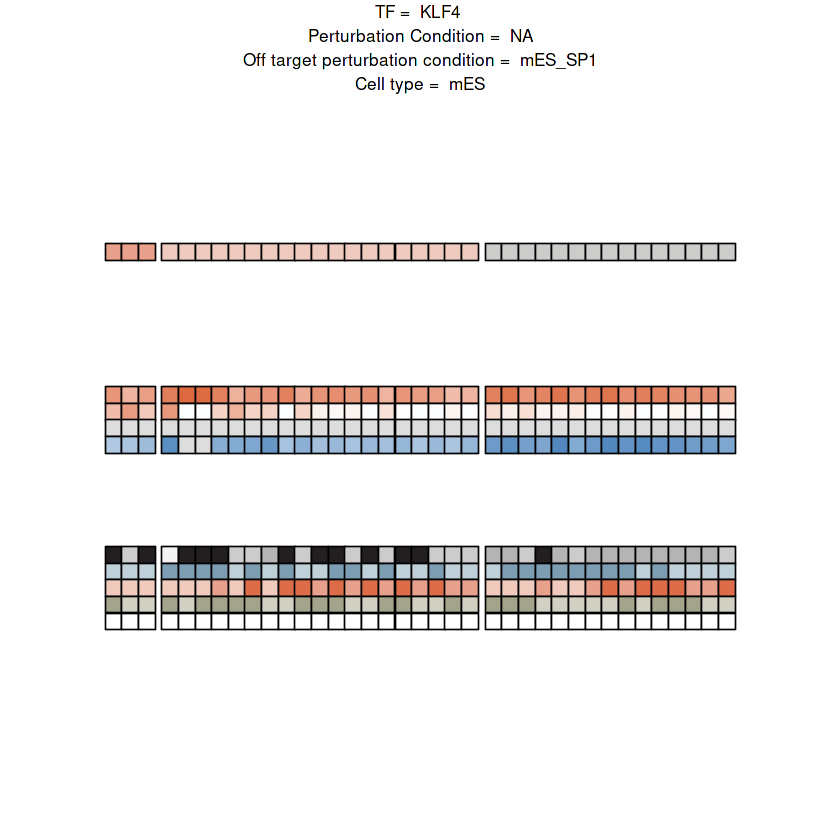

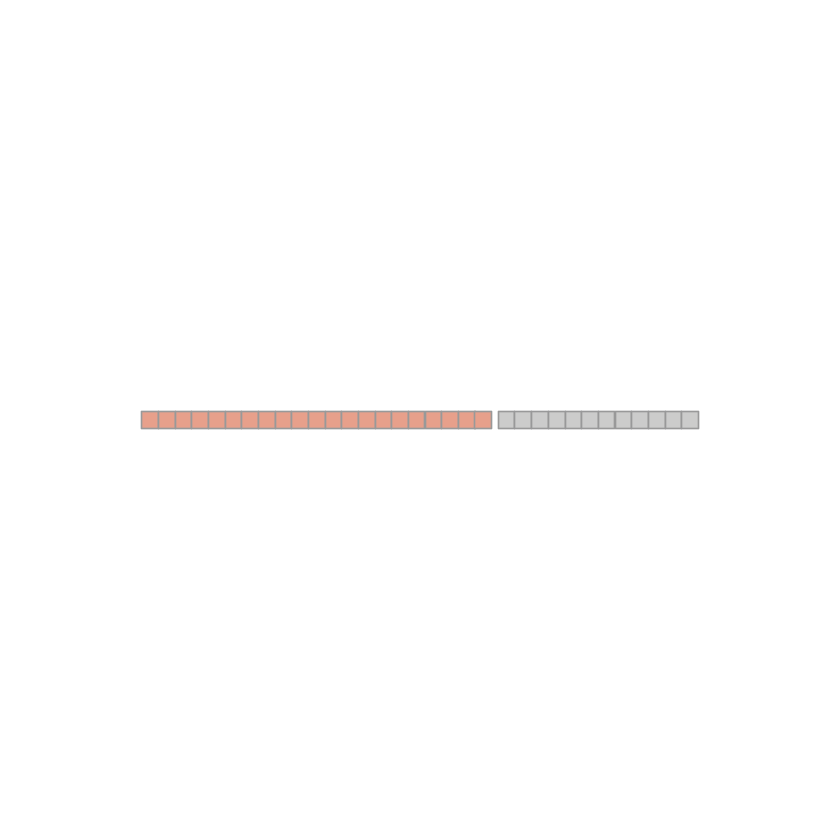

Joining, by = "reporter_id"
Joining, by = "feature"


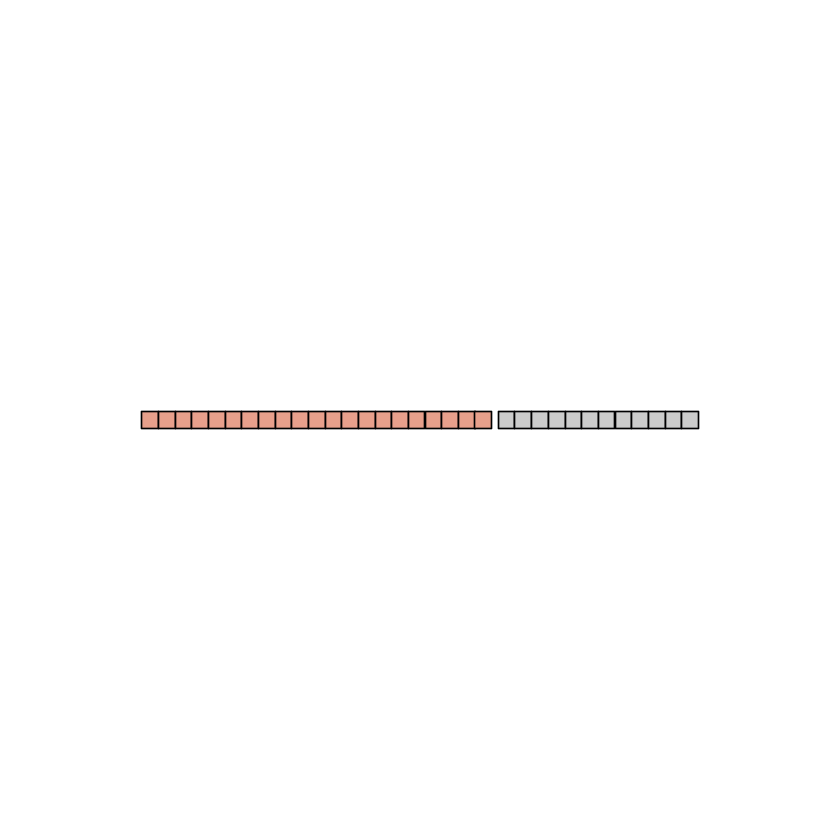

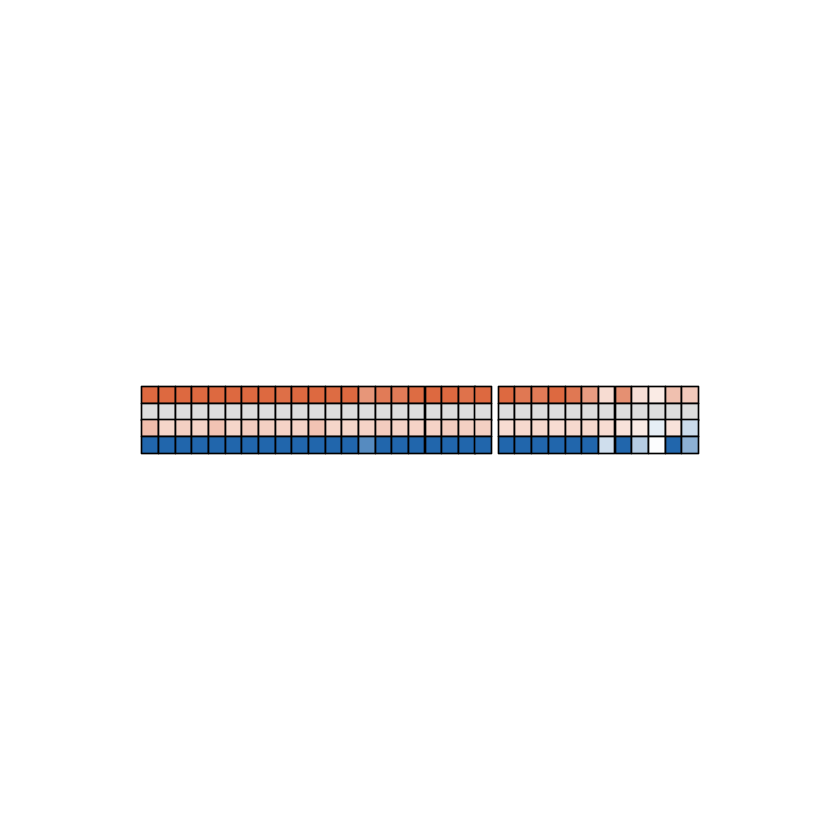

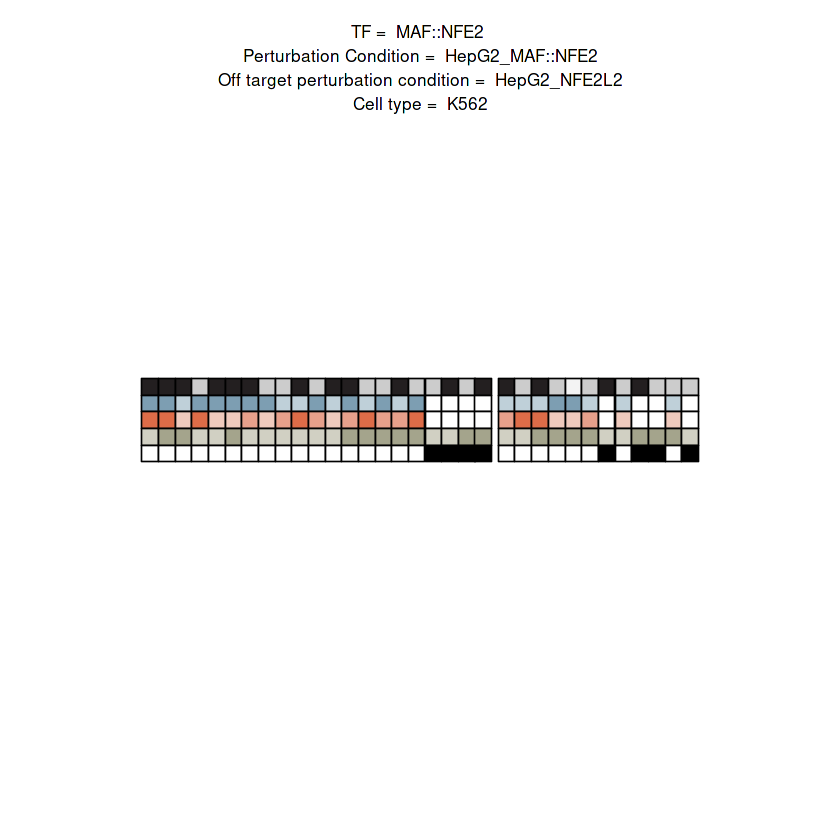

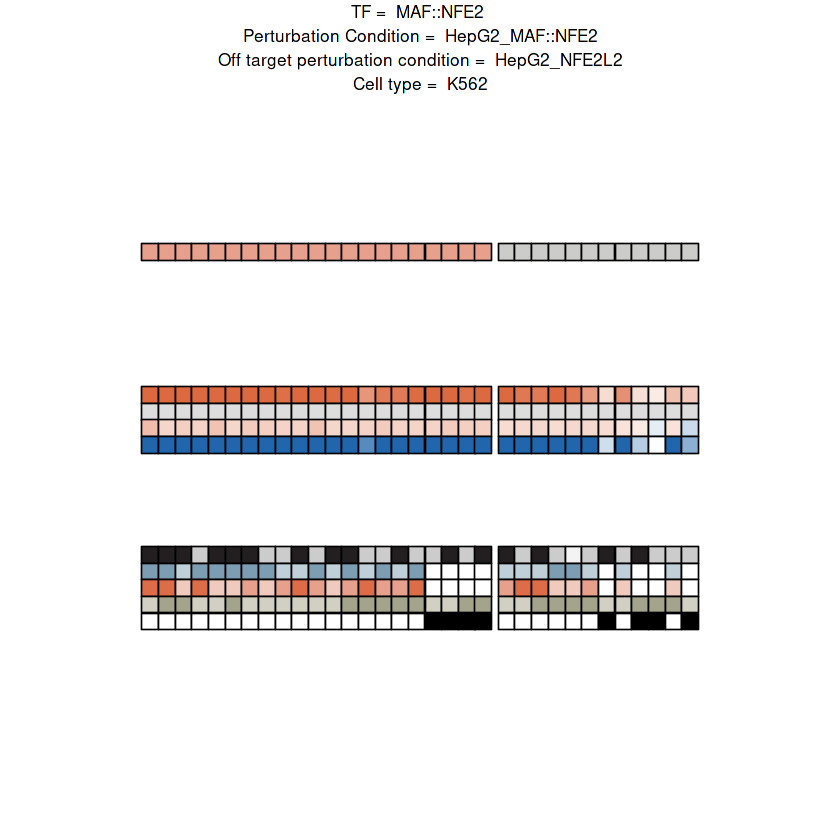

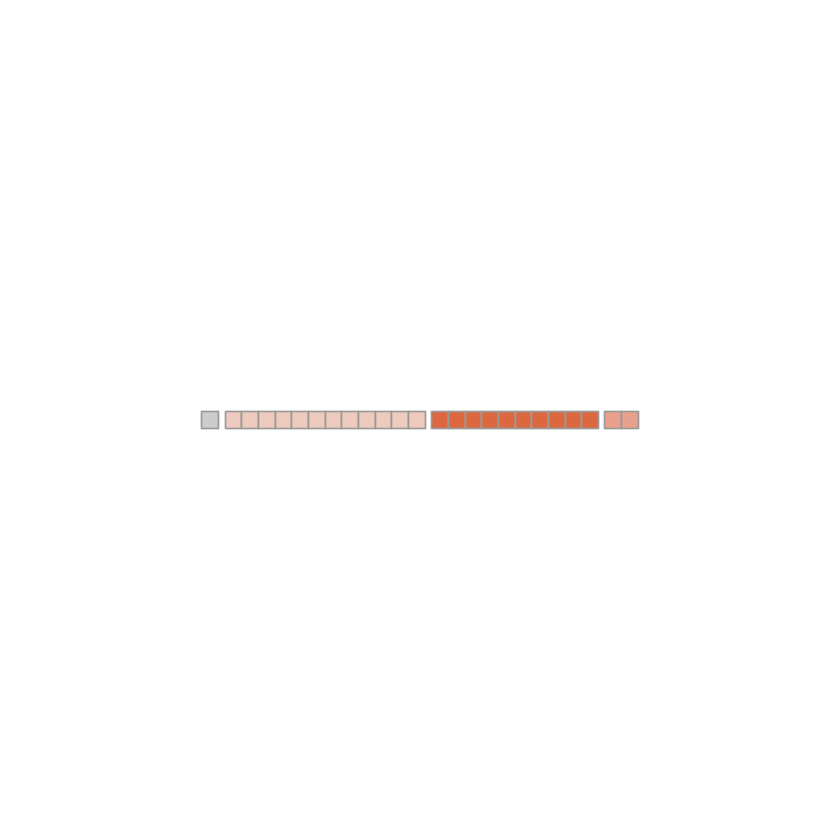

Joining, by = "reporter_id"
Joining, by = "feature"


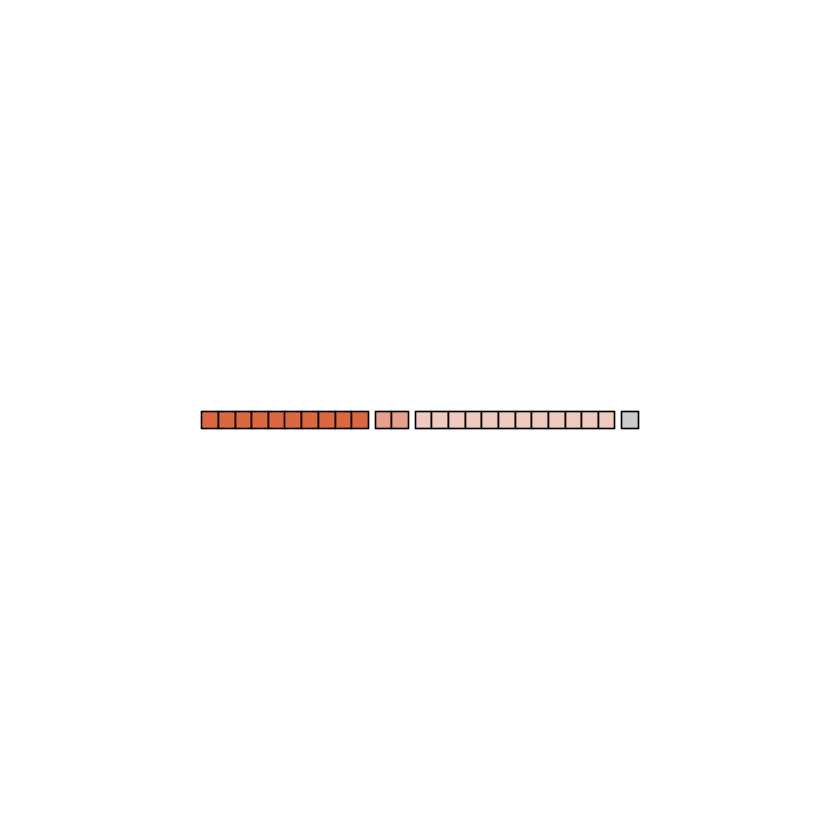

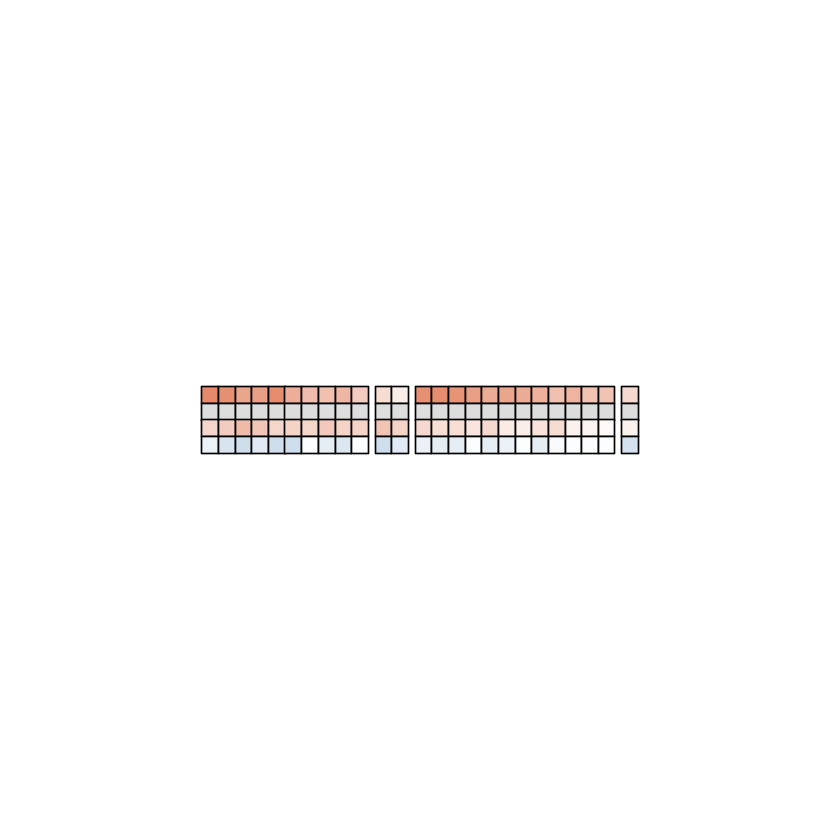

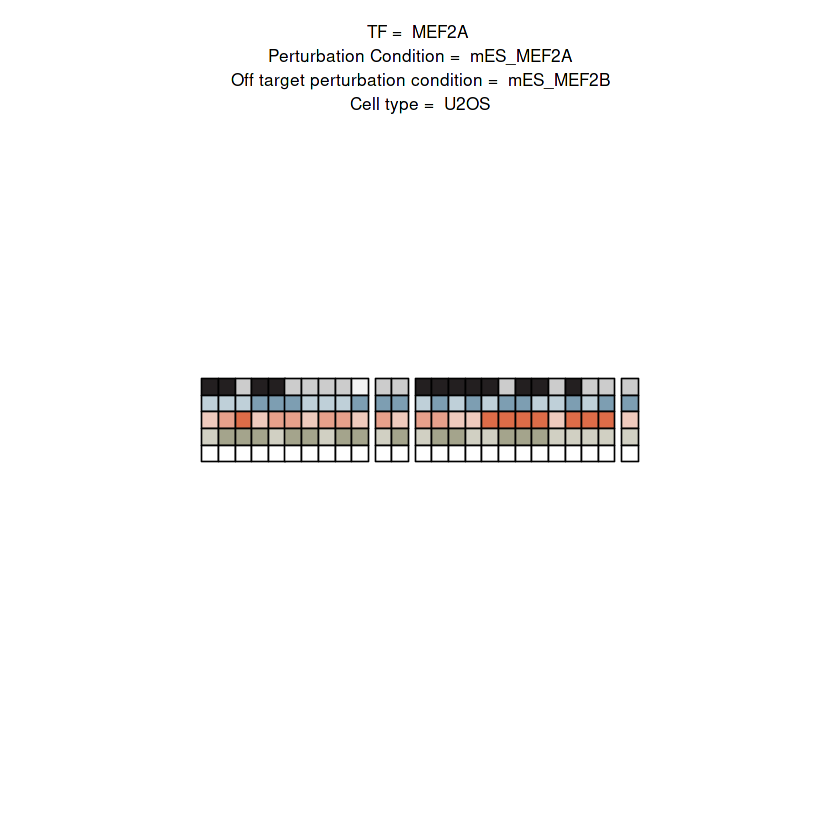

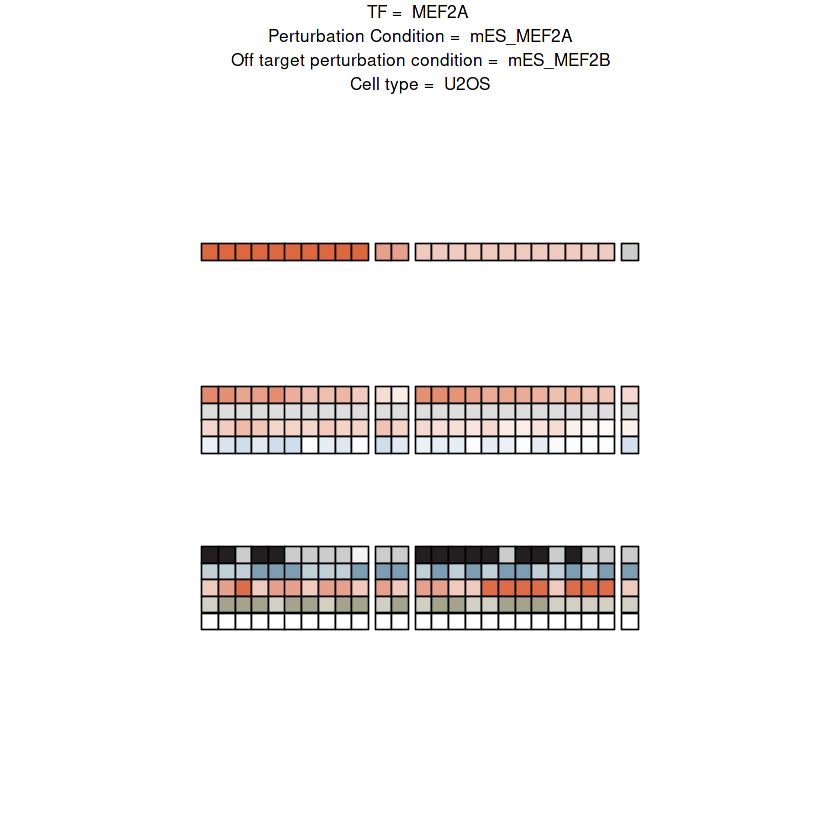

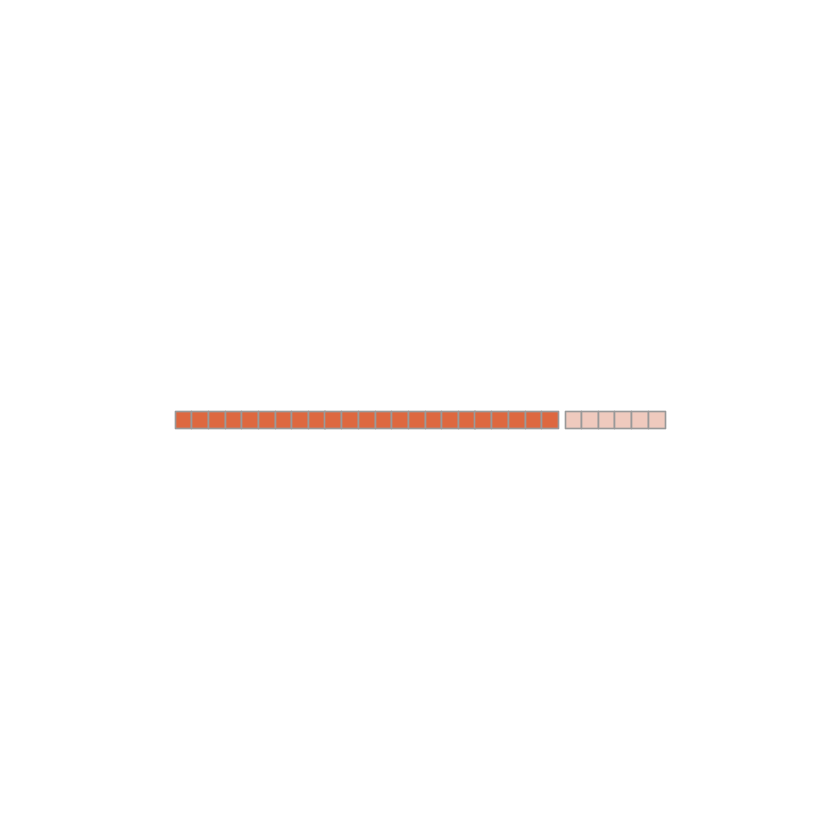

Joining, by = "reporter_id"
Joining, by = "feature"


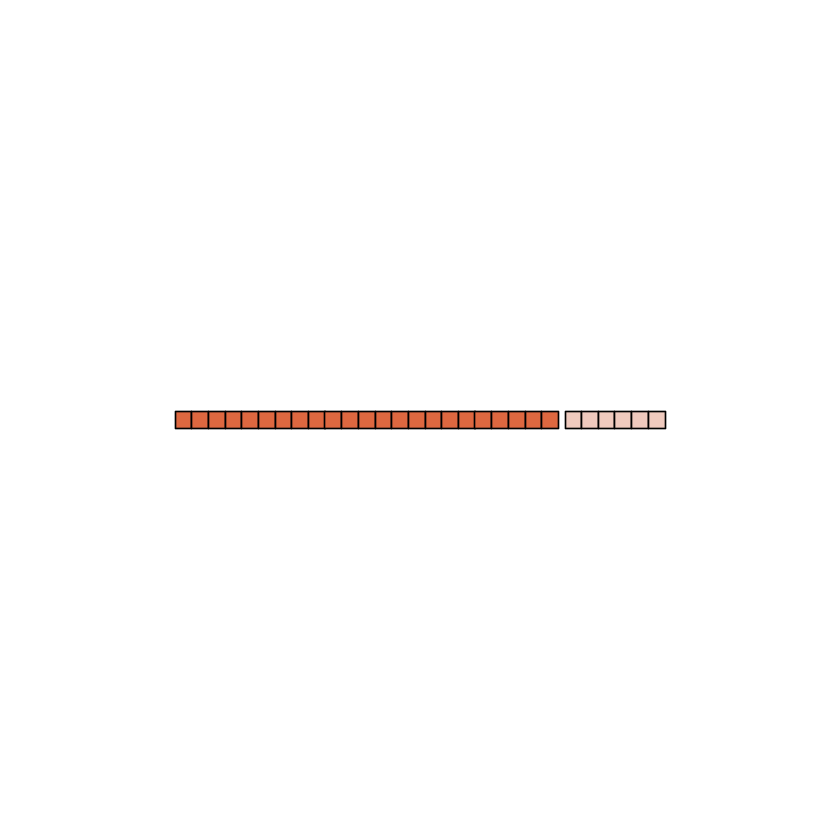

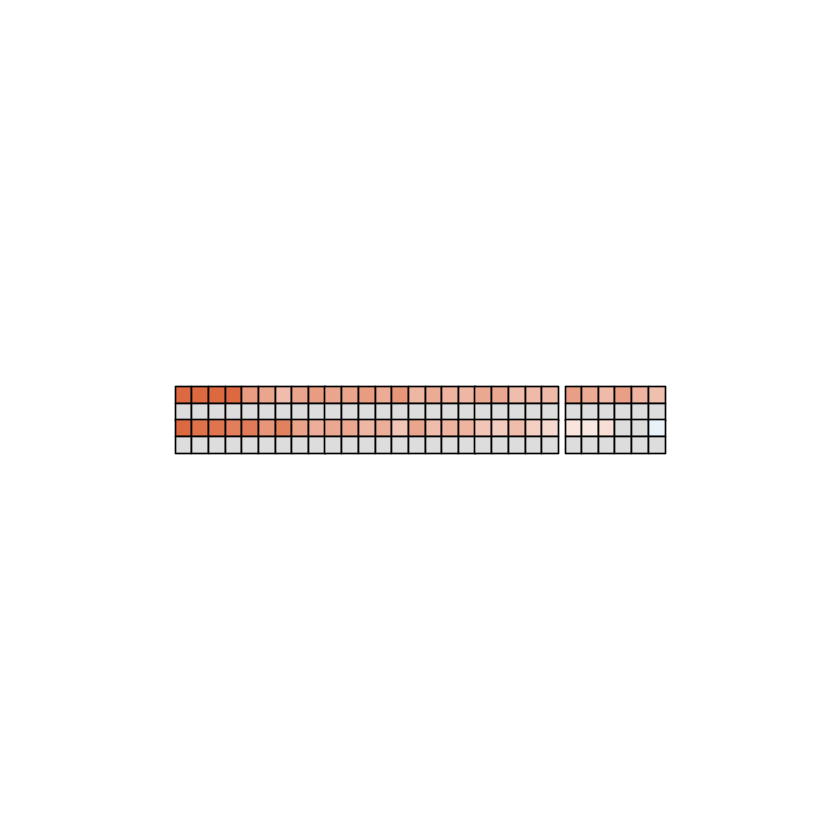

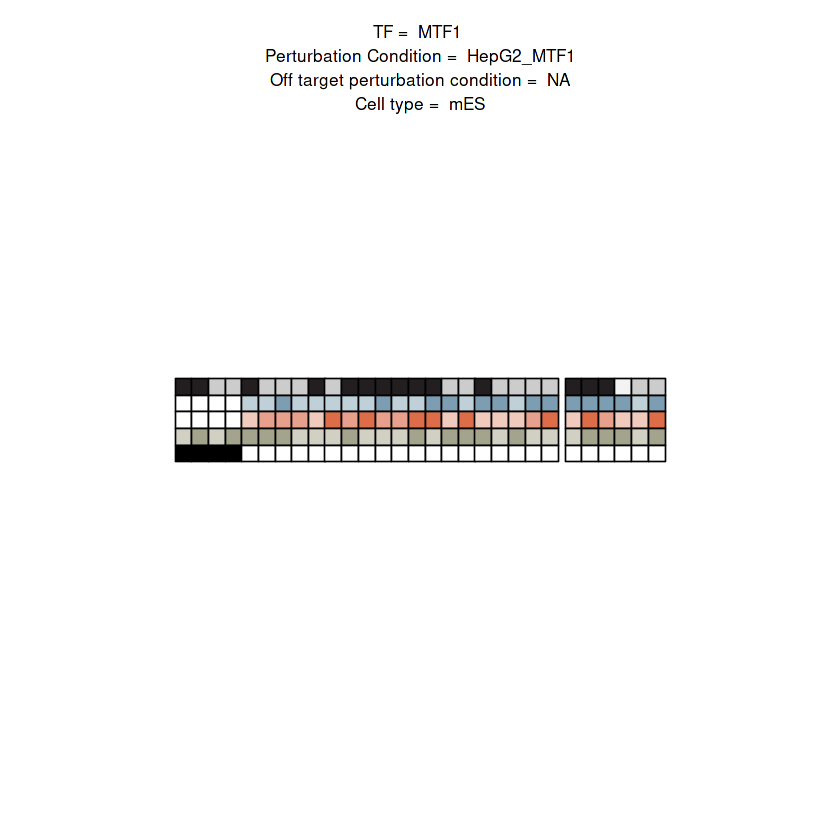

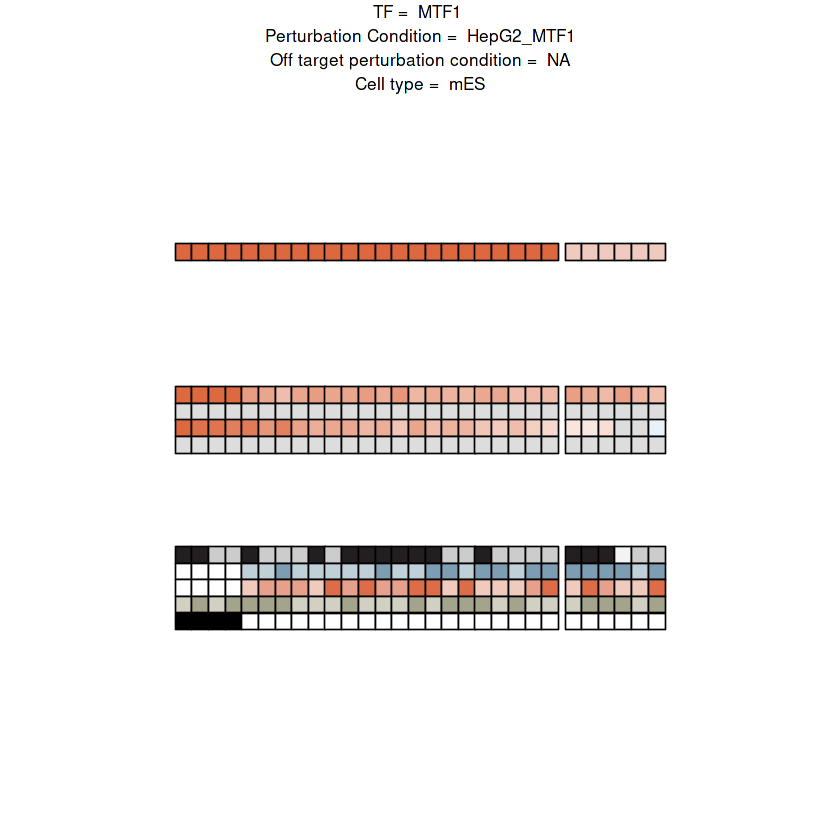

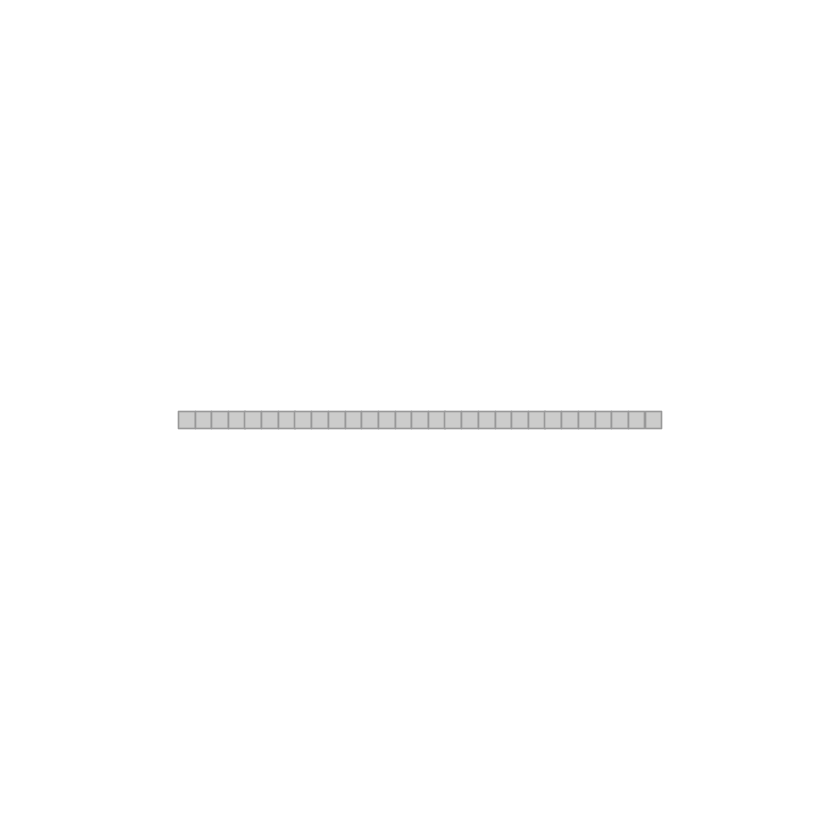

Joining, by = "reporter_id"
Joining, by = "feature"


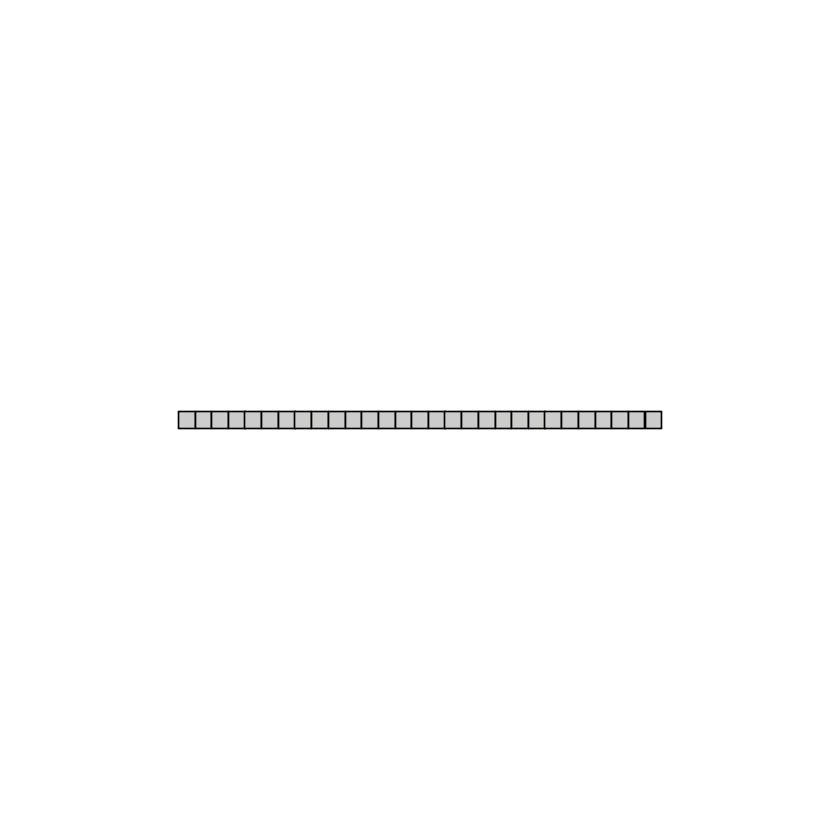

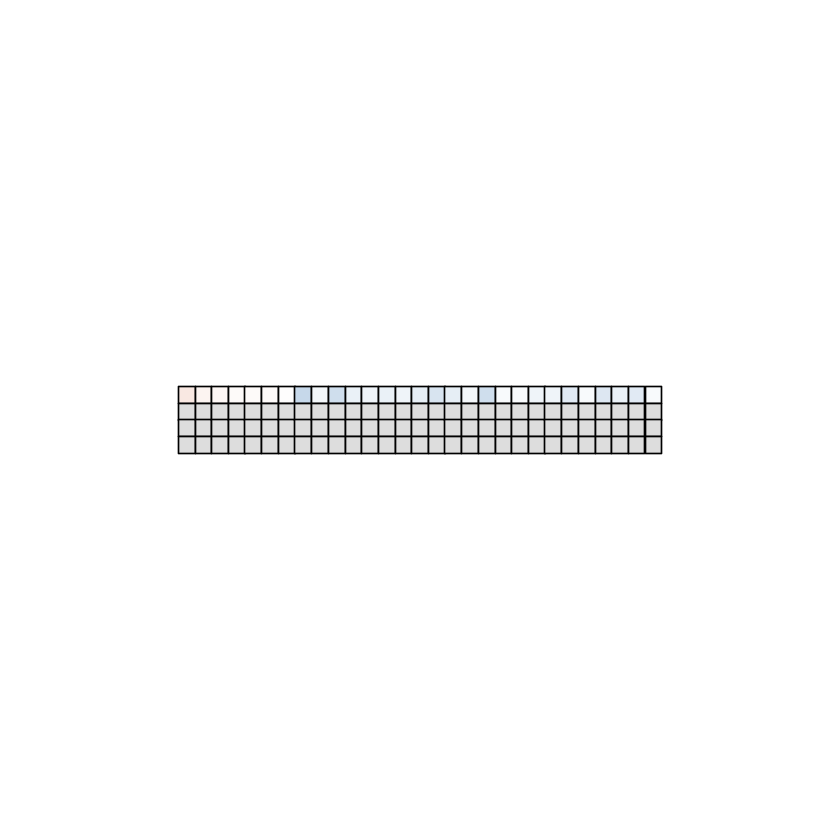

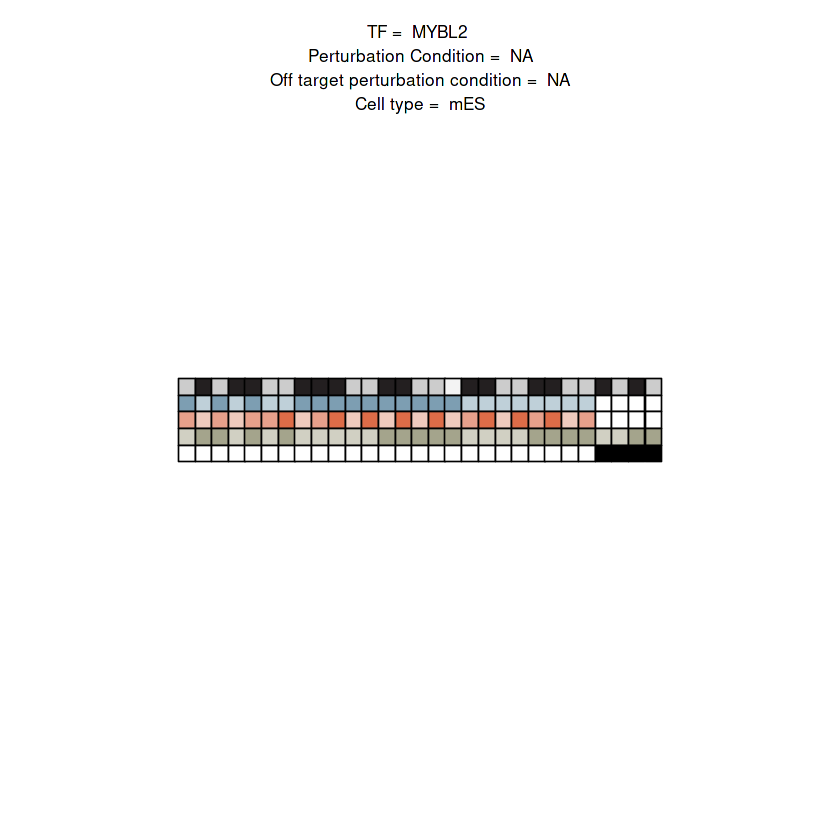

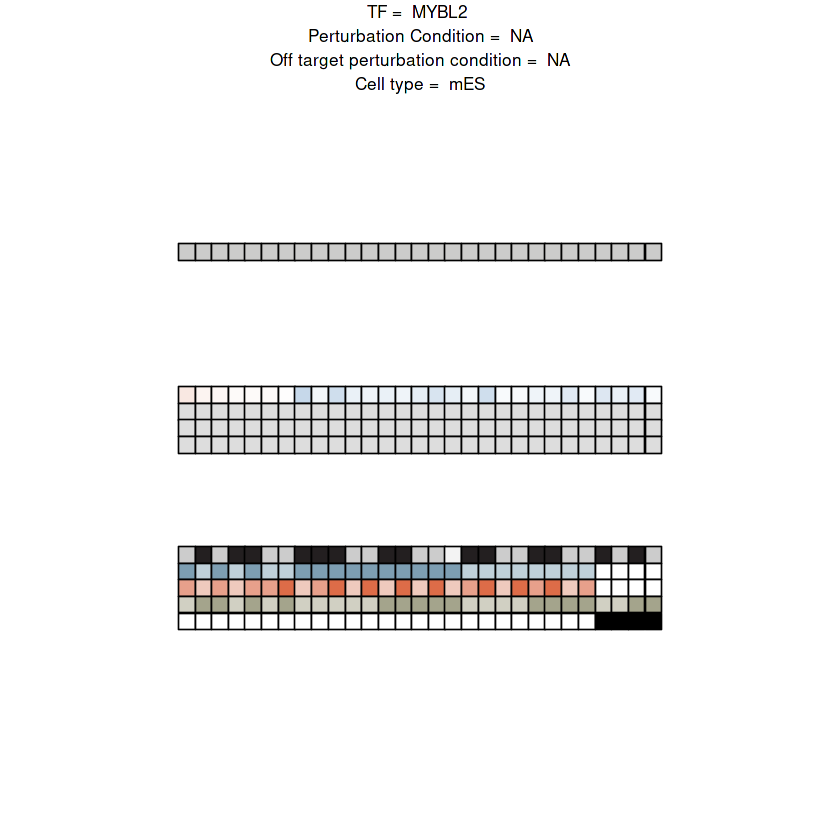

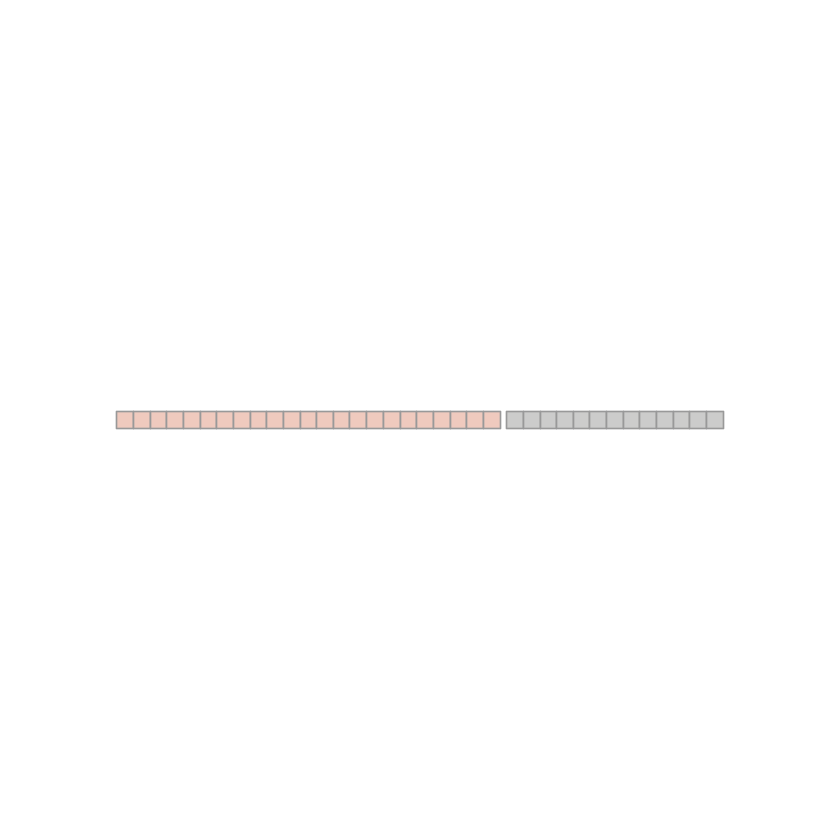

Joining, by = "reporter_id"
Joining, by = "feature"


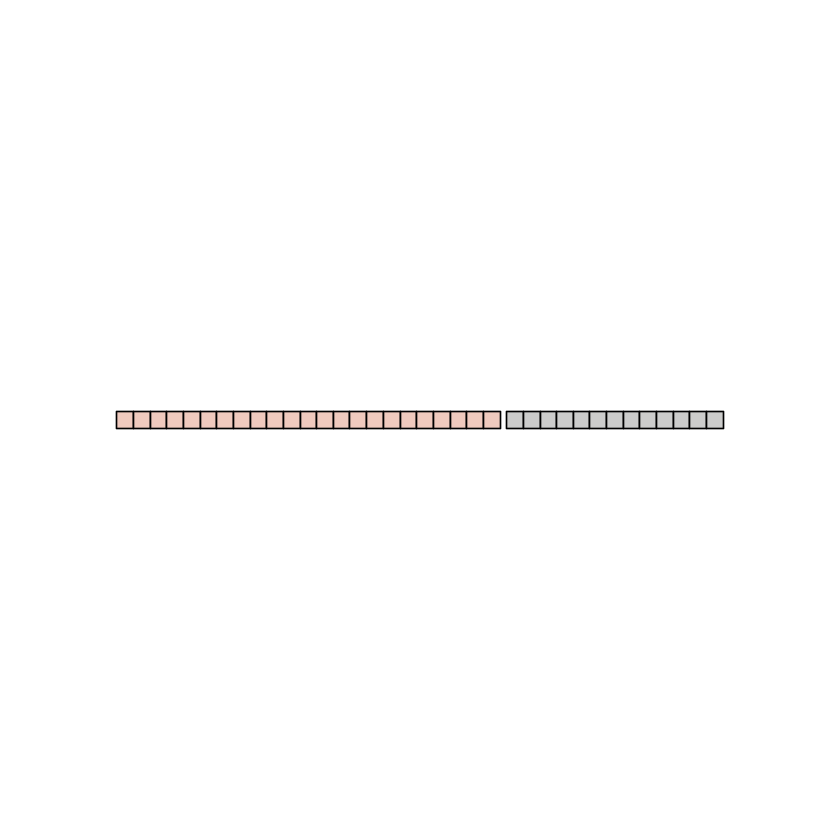

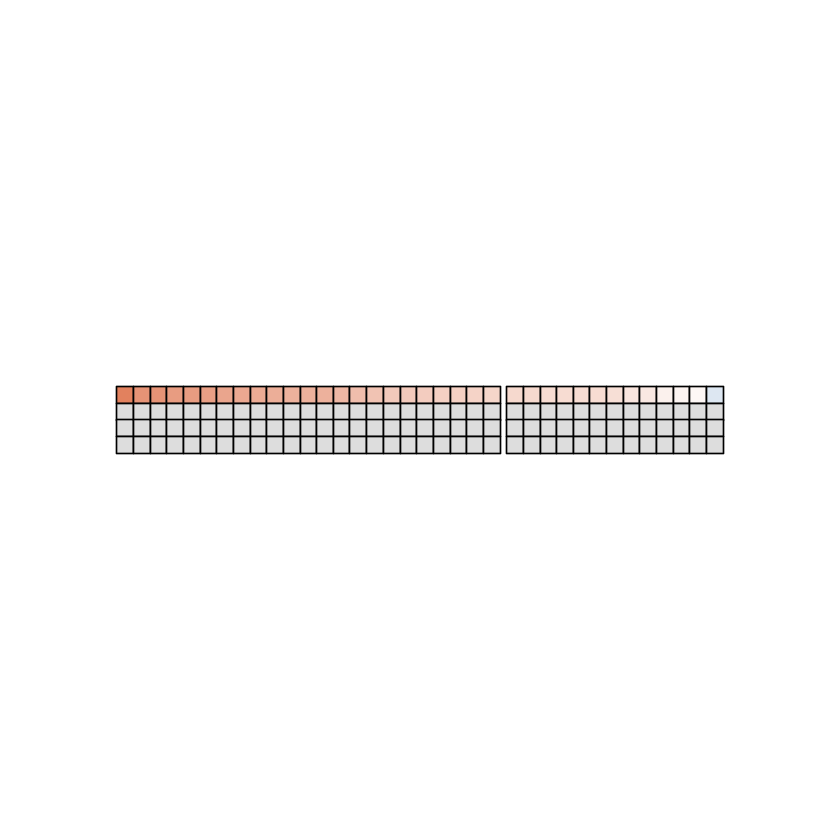

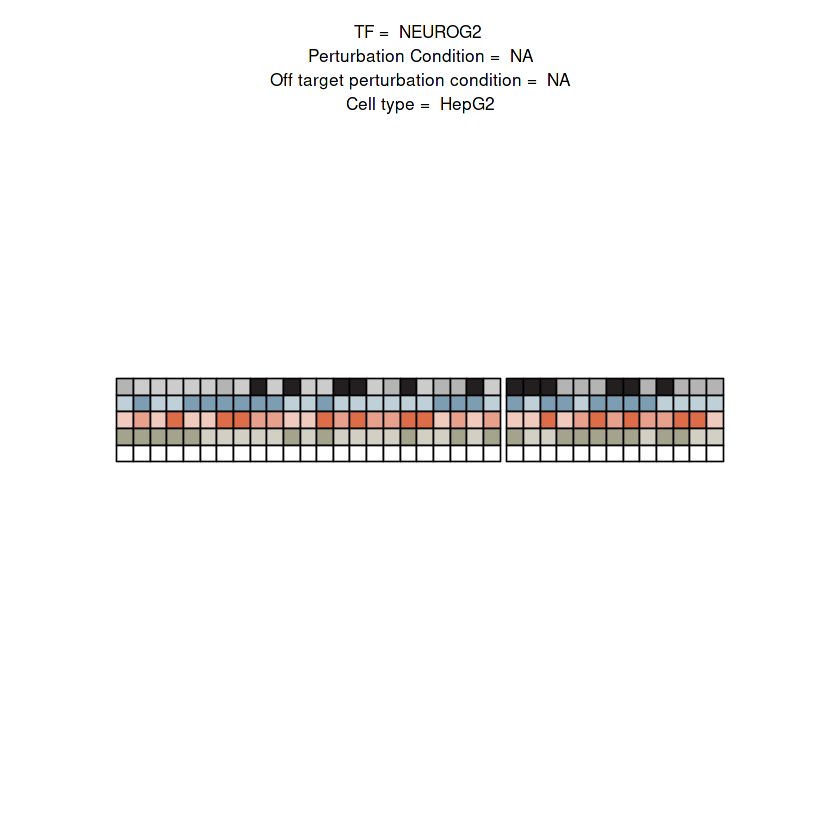

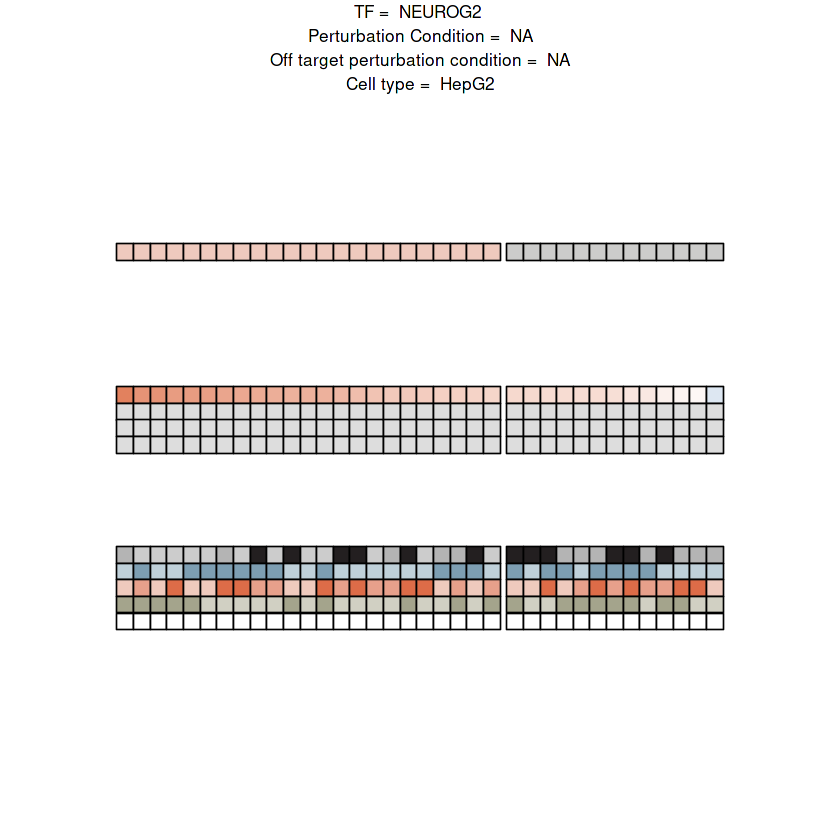

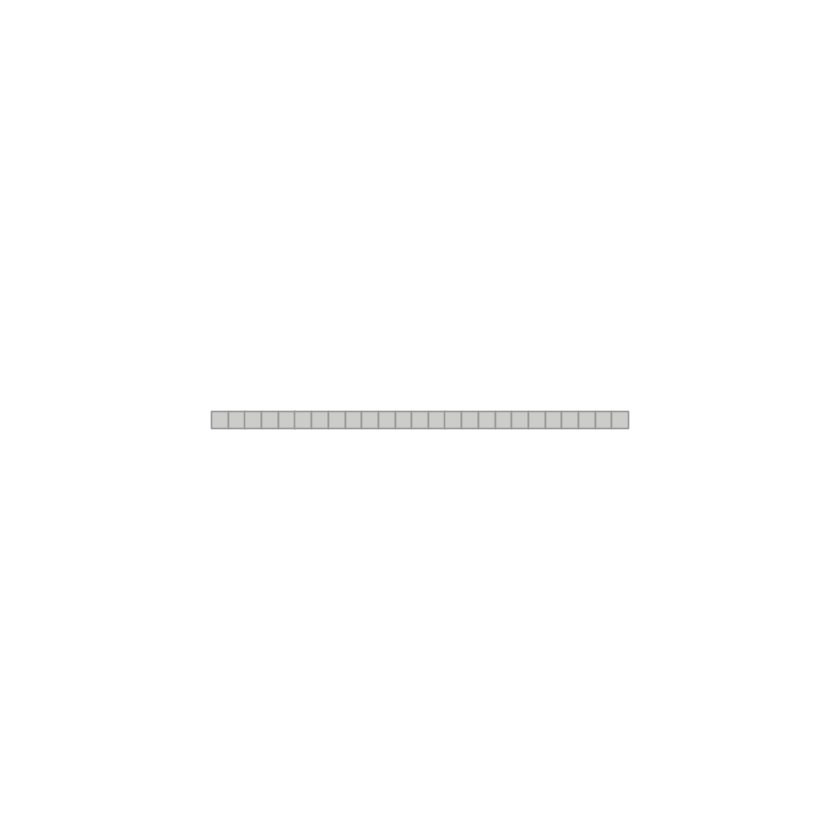

Joining, by = "reporter_id"
Joining, by = "feature"


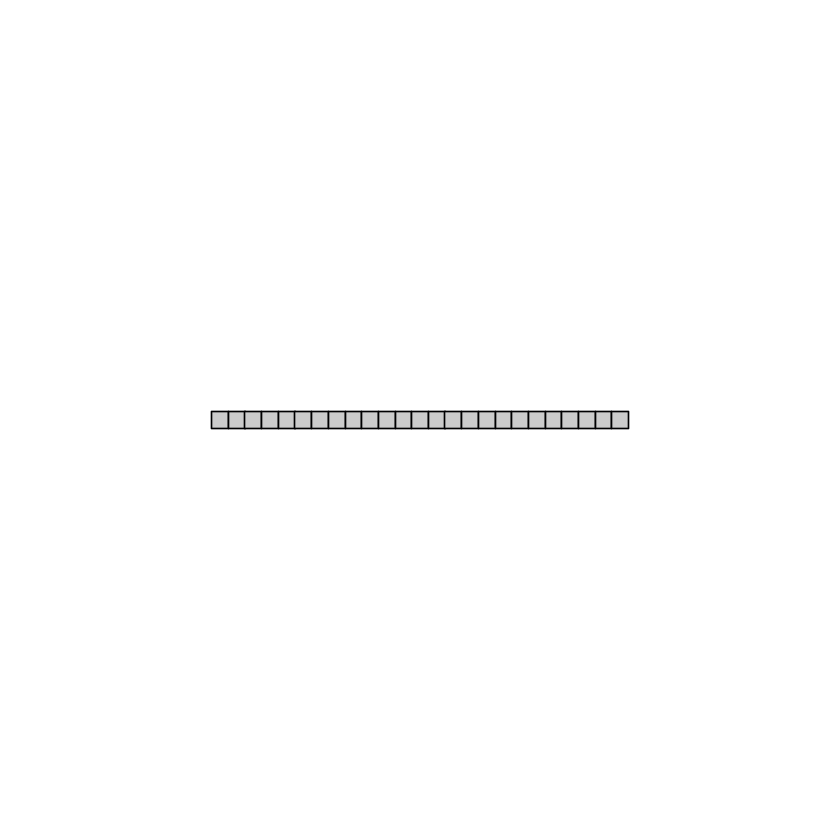

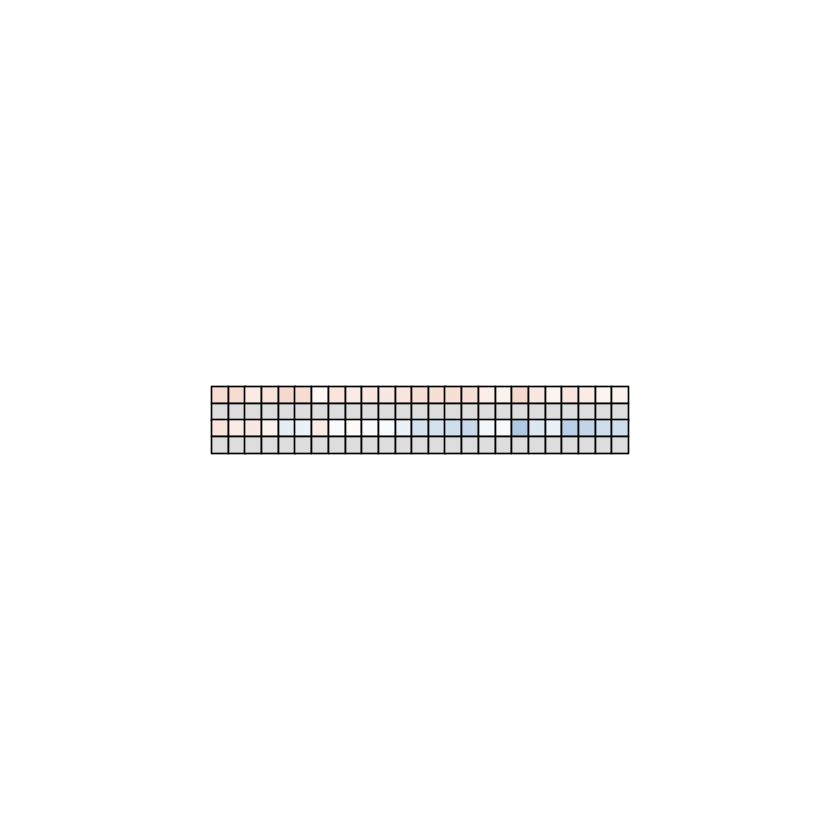

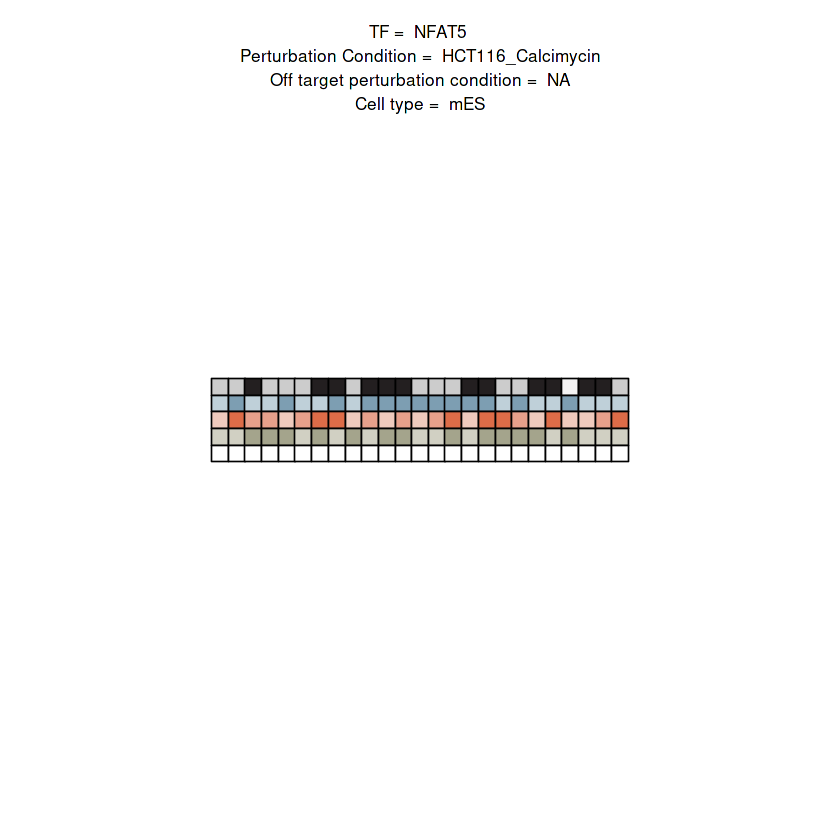

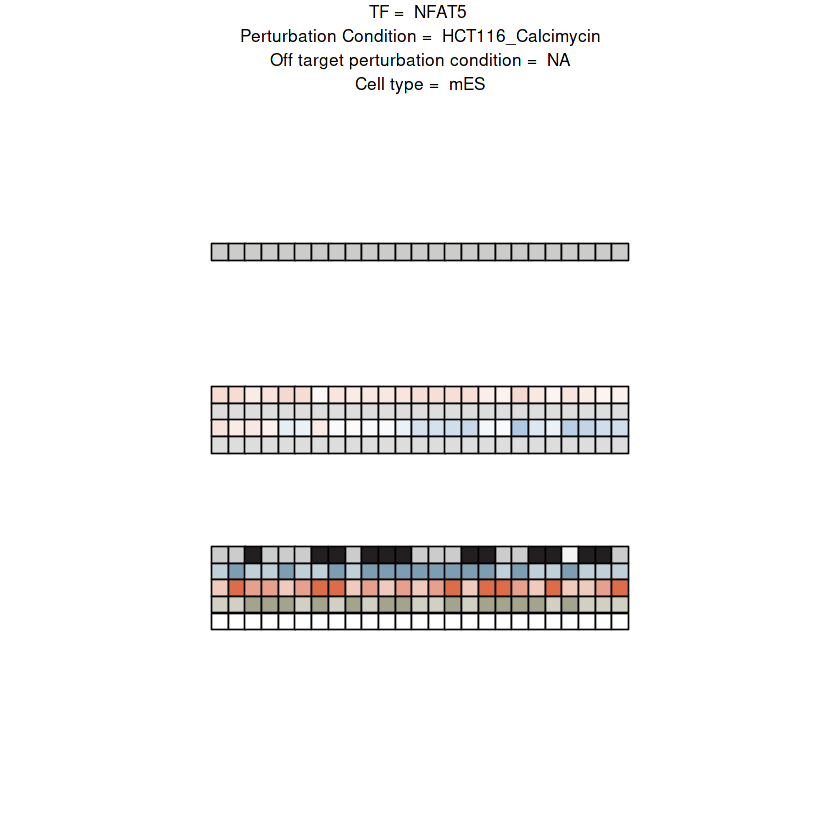

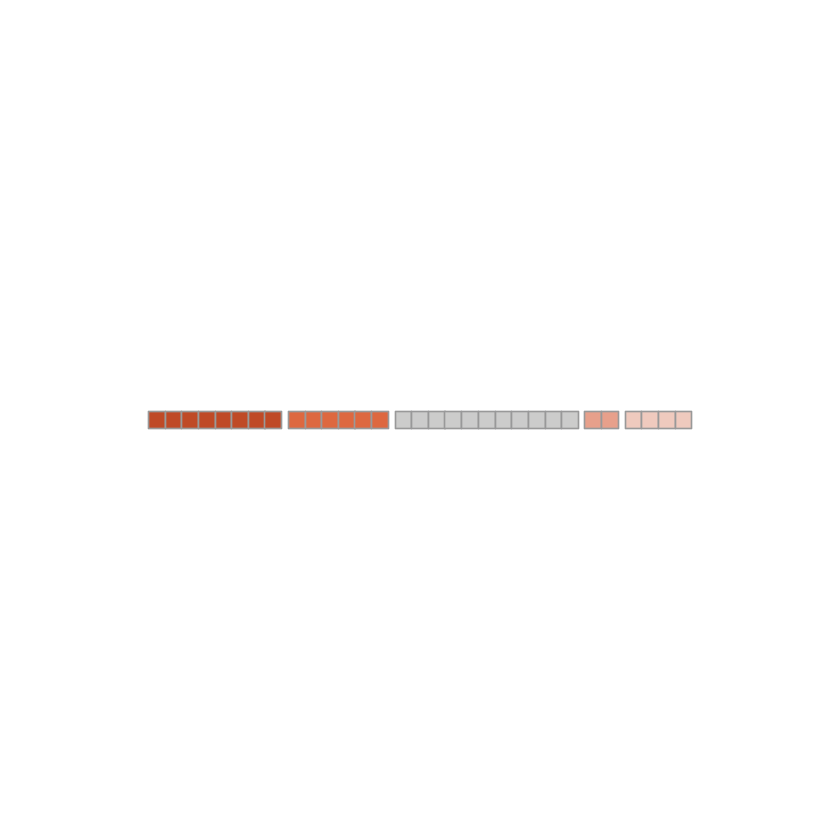

Joining, by = "reporter_id"
Joining, by = "feature"


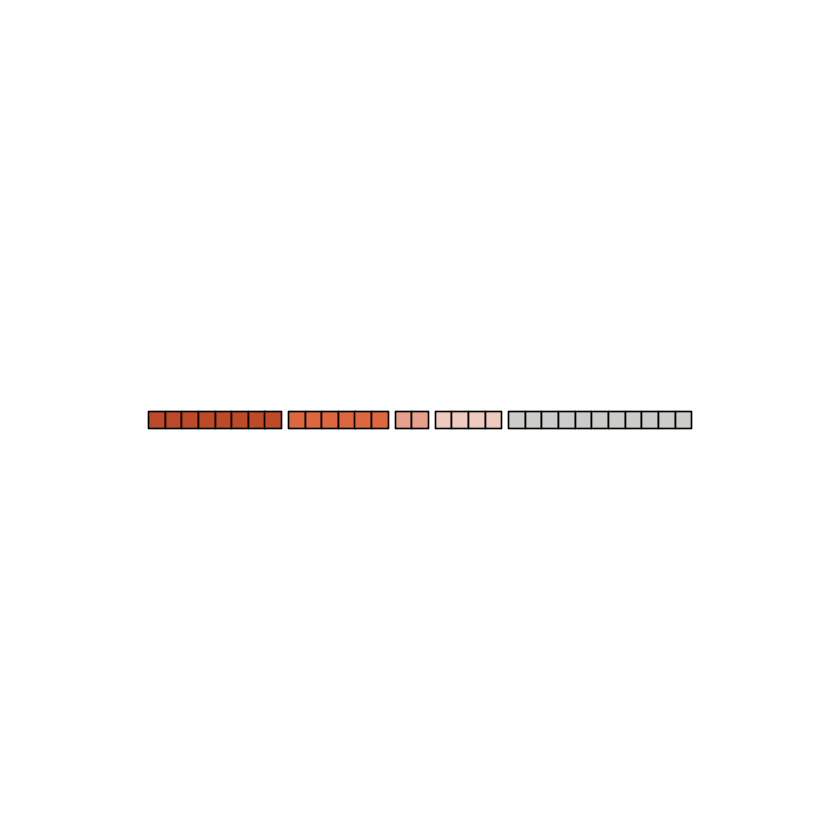

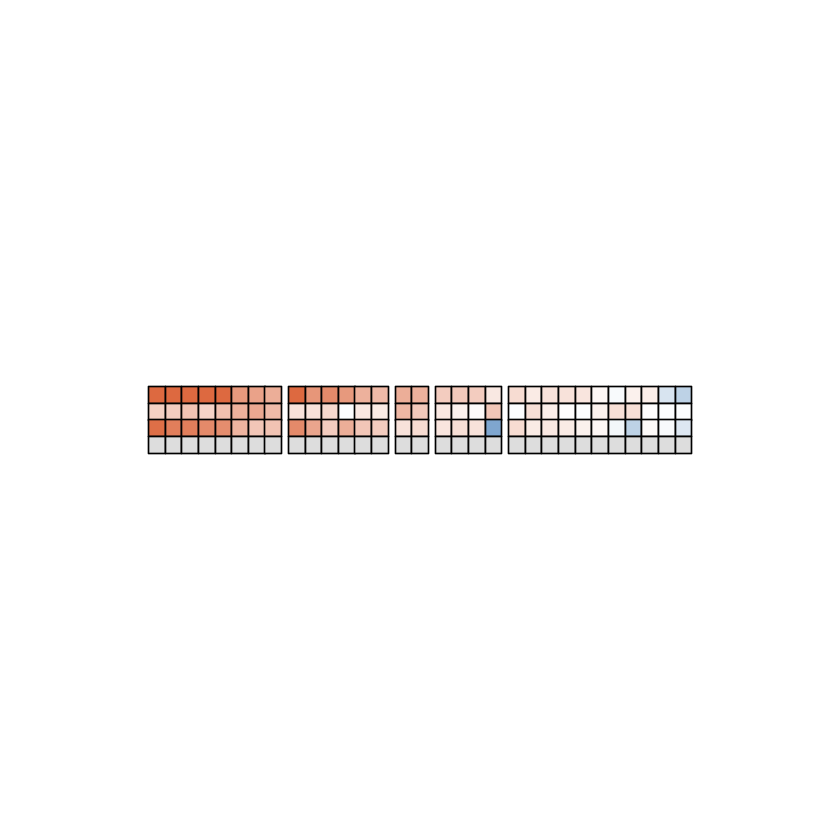

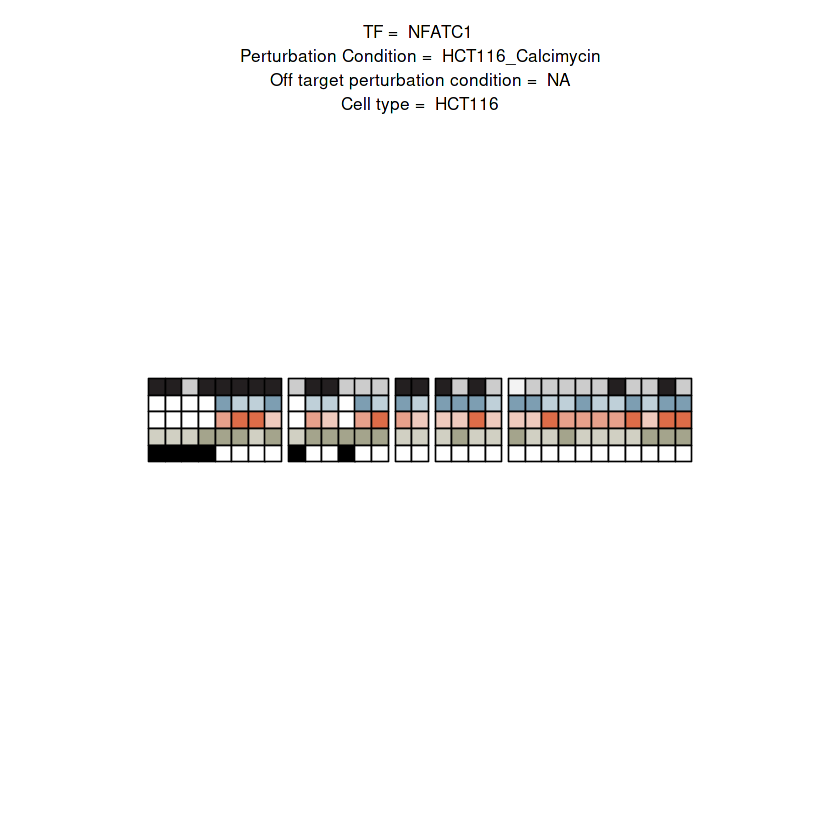

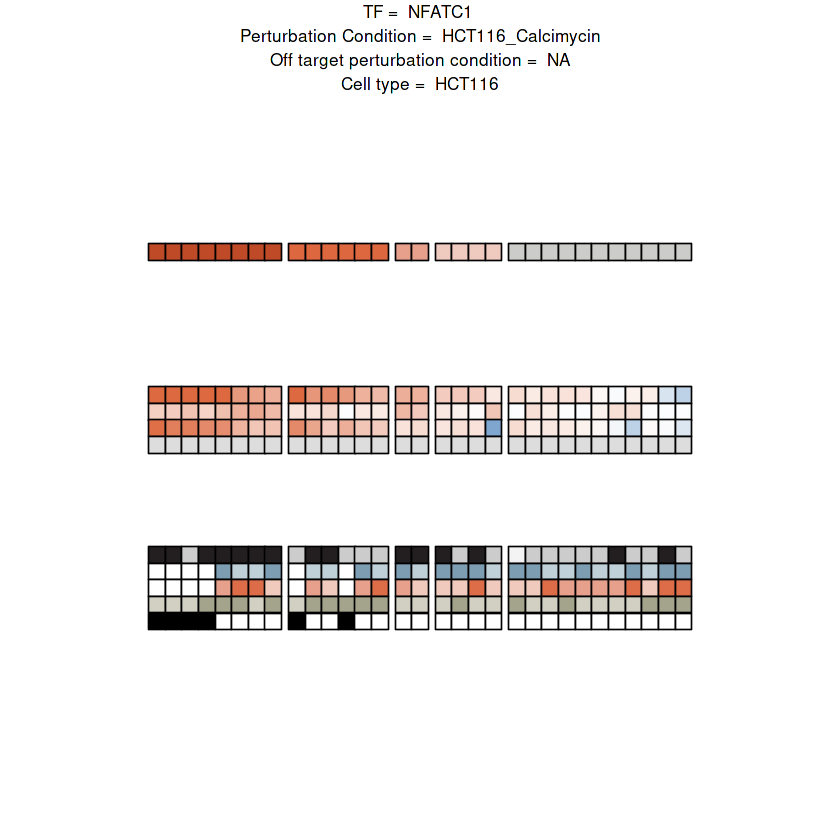

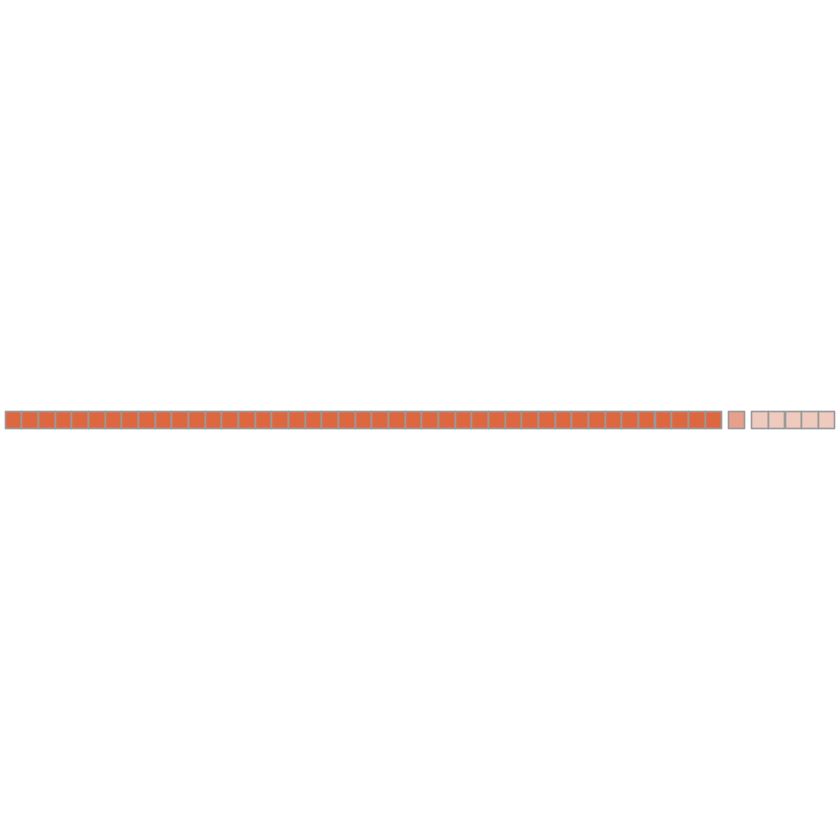

Joining, by = "reporter_id"
Joining, by = "feature"


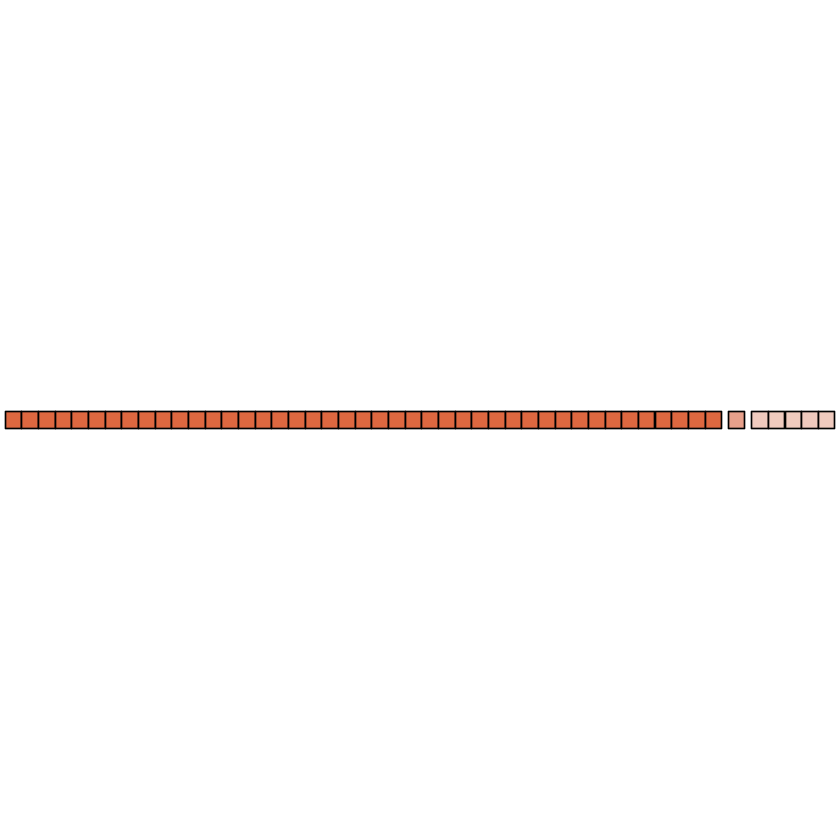

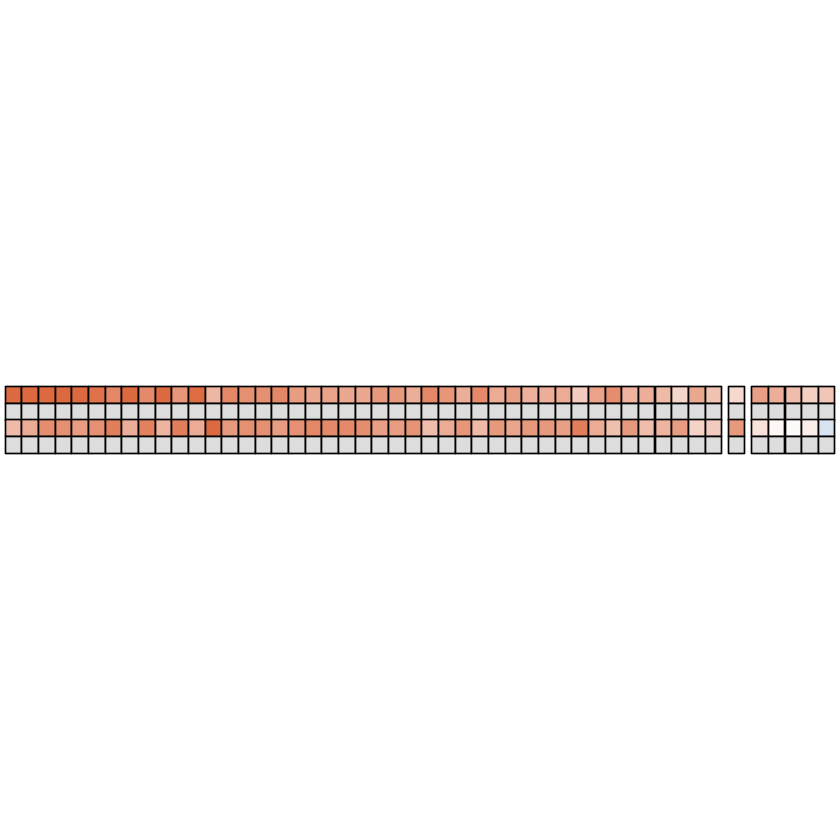

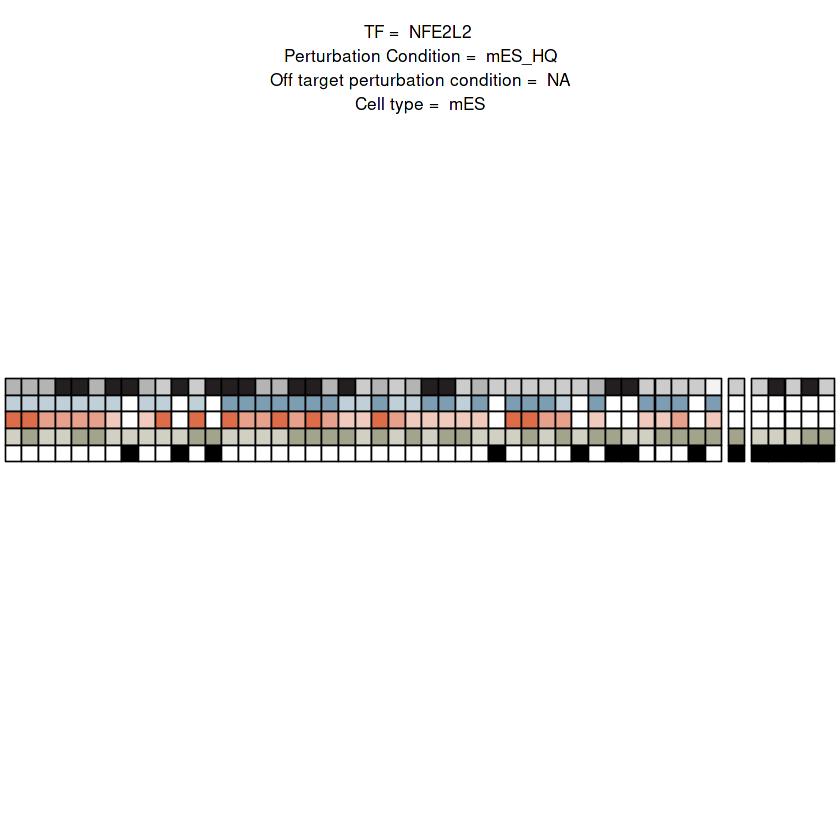

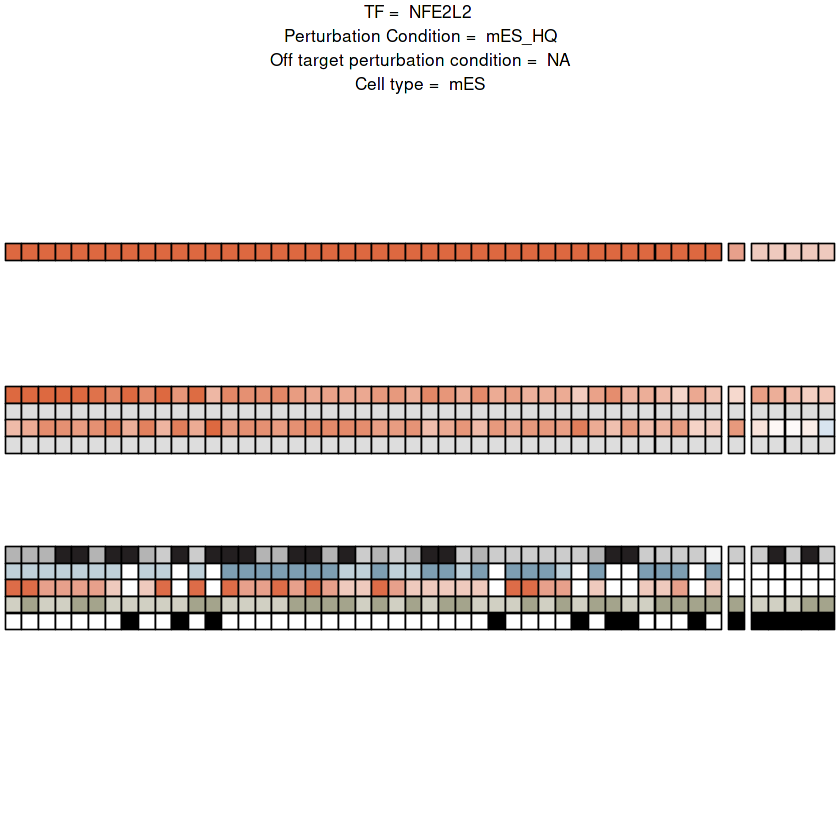

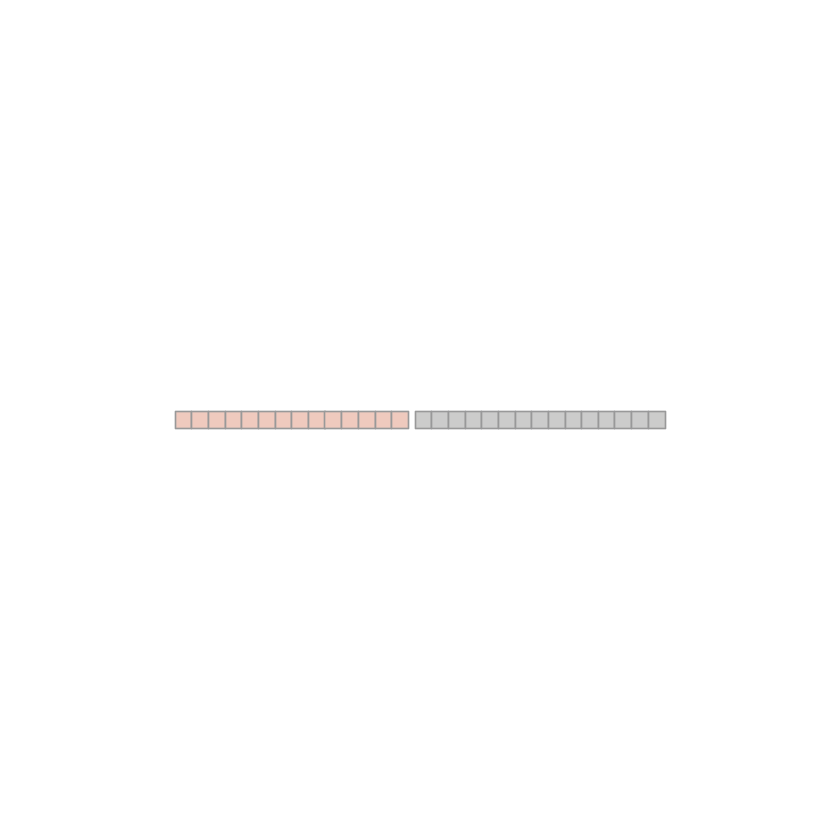

Joining, by = "reporter_id"
Joining, by = "feature"


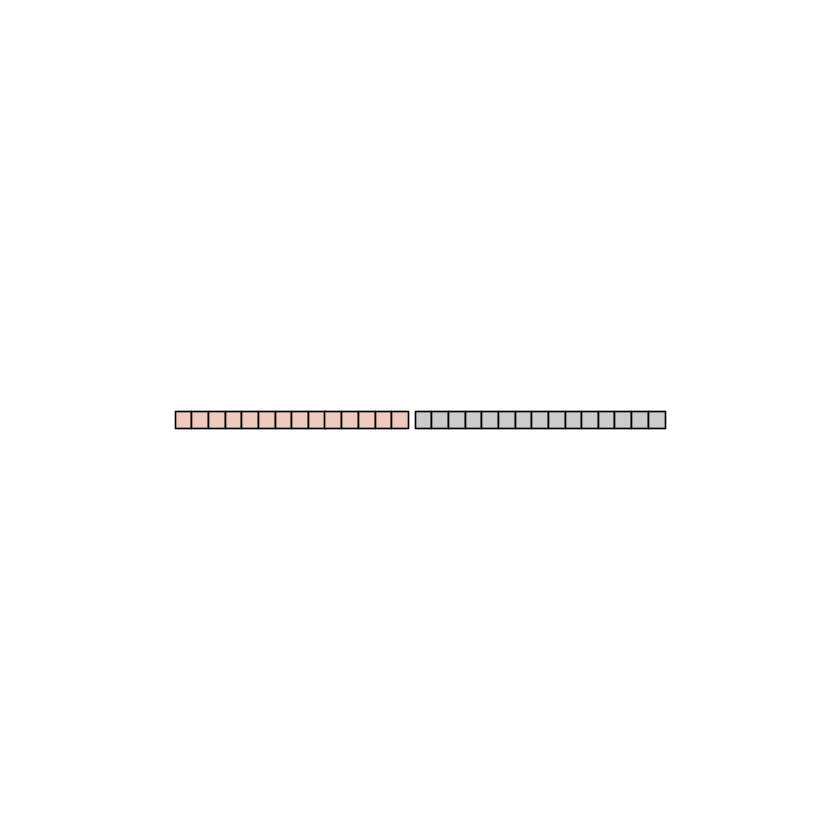

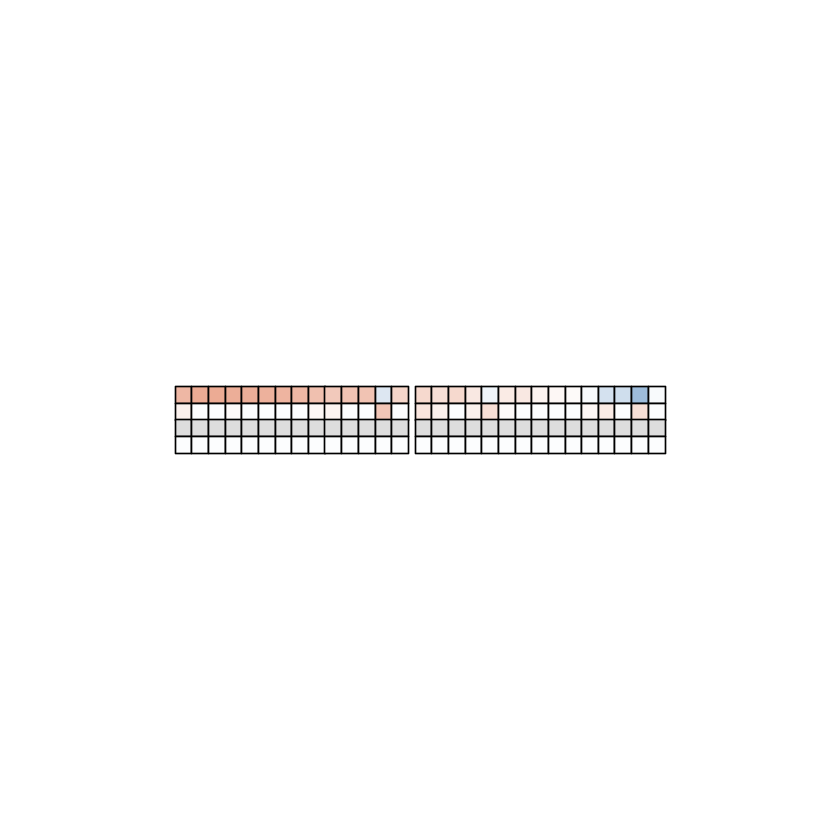

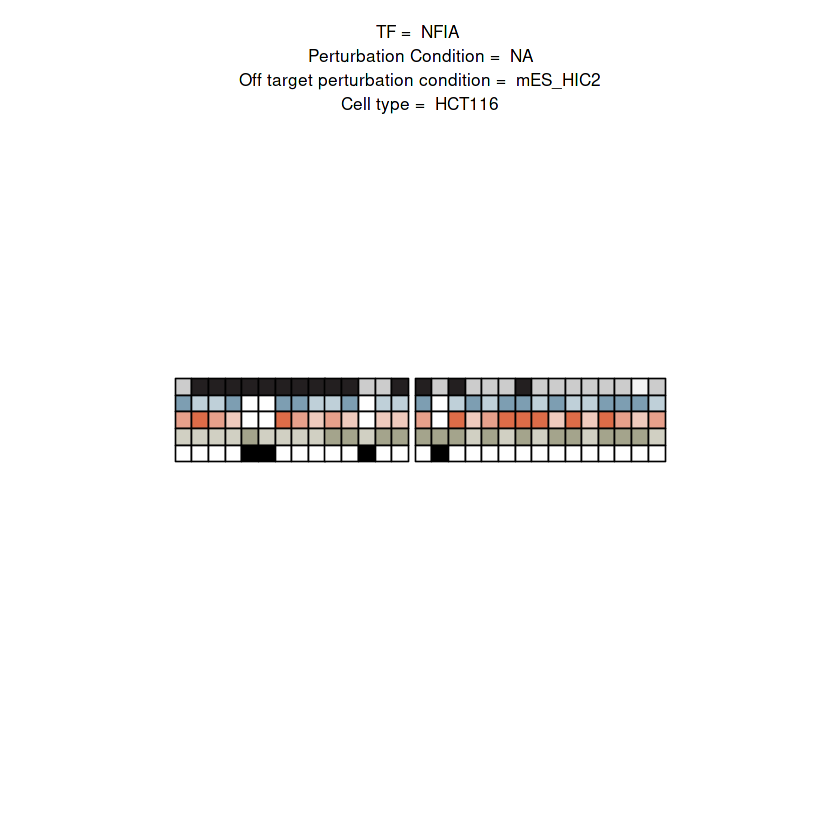

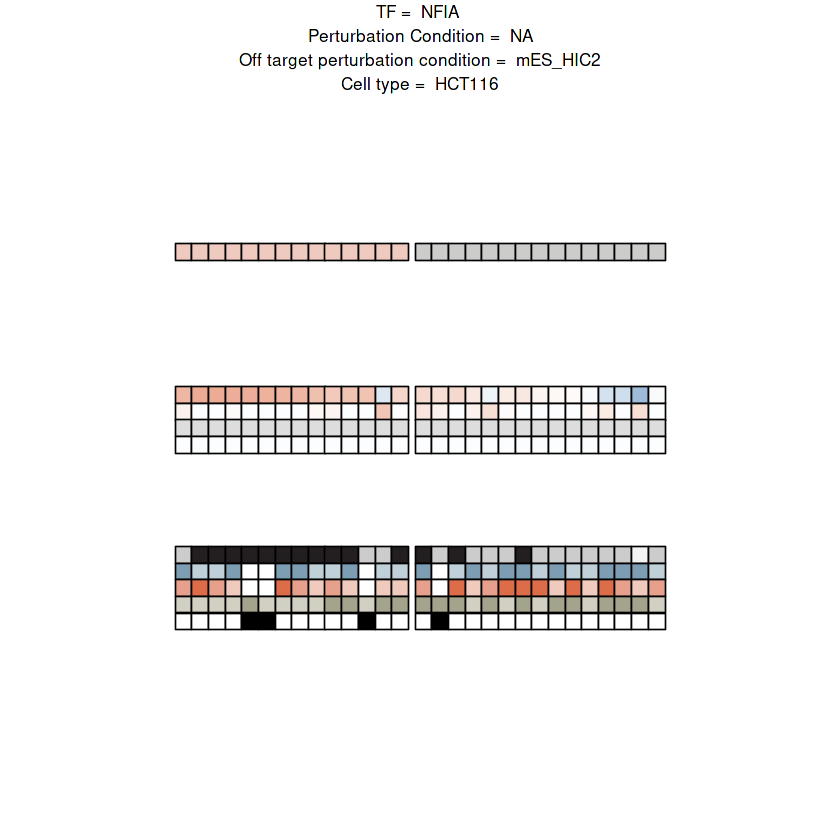

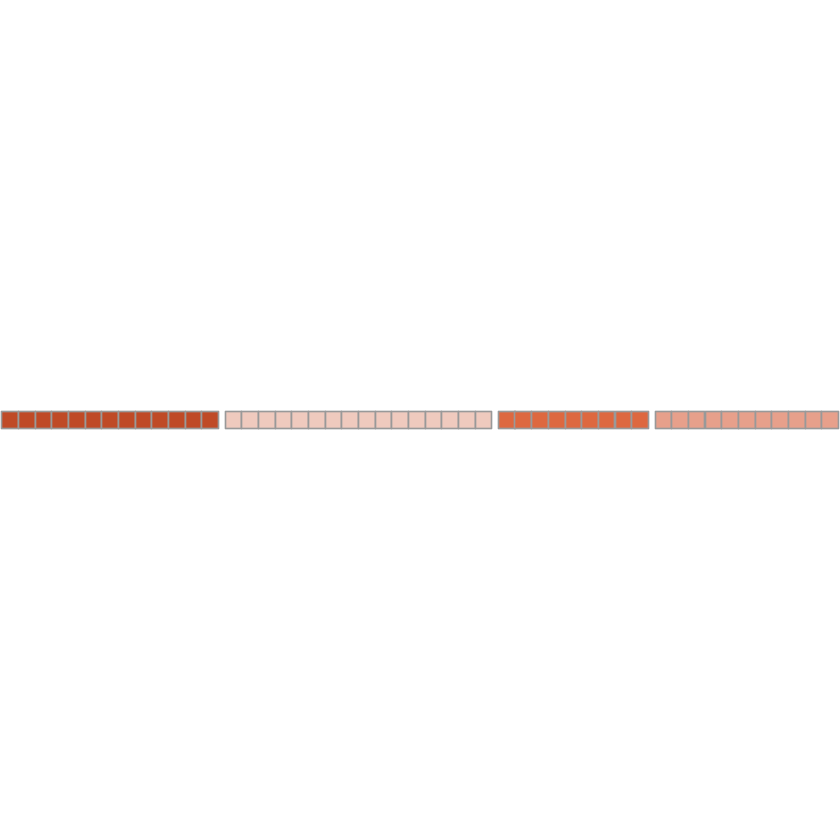

Joining, by = "reporter_id"
Joining, by = "feature"


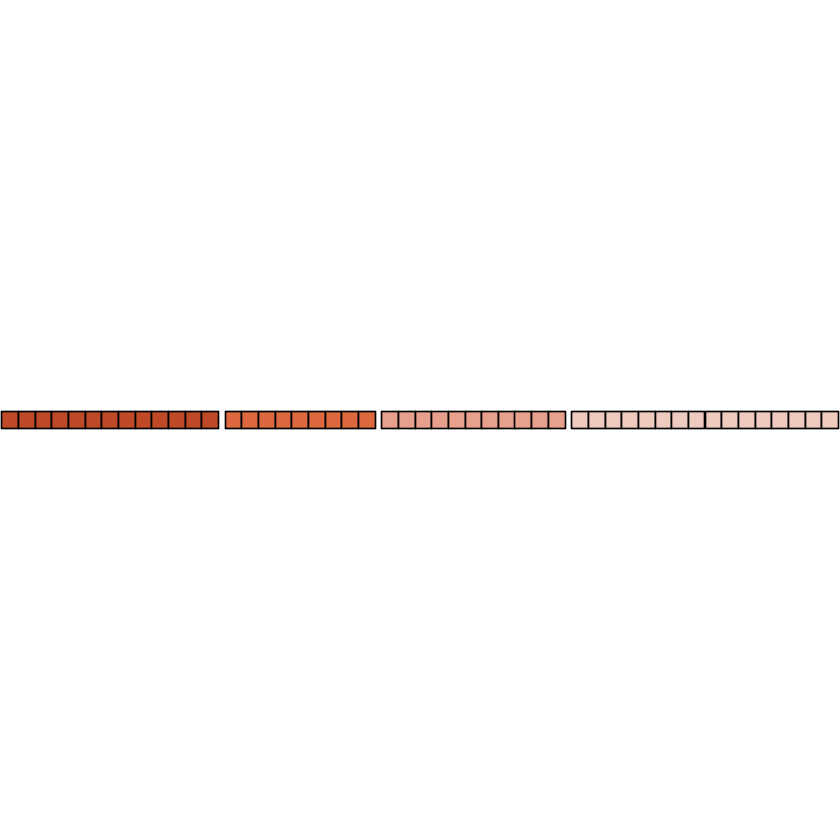

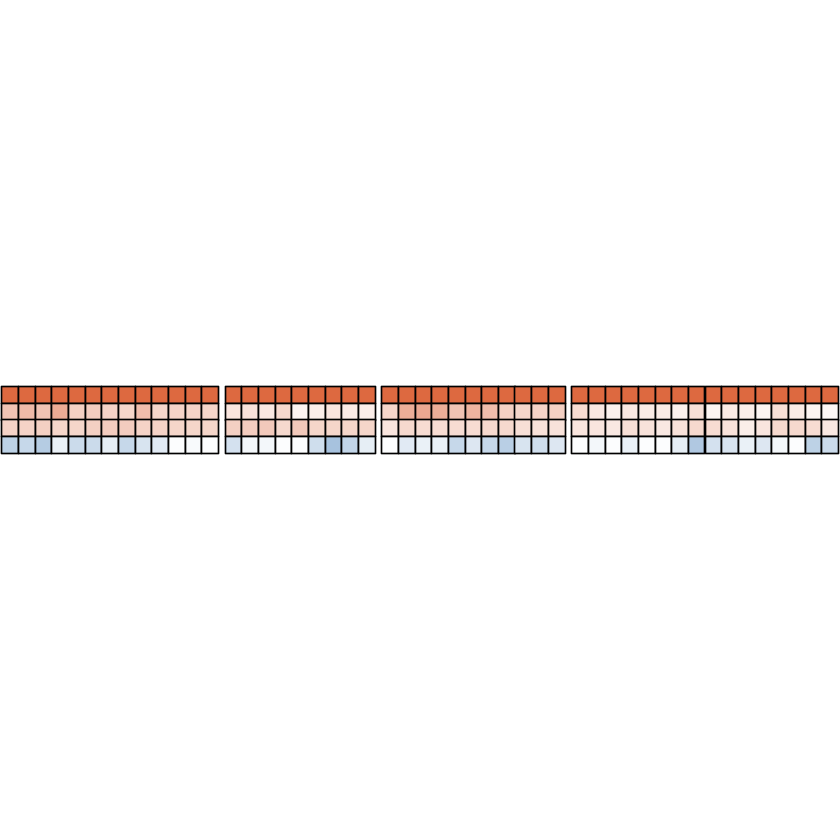

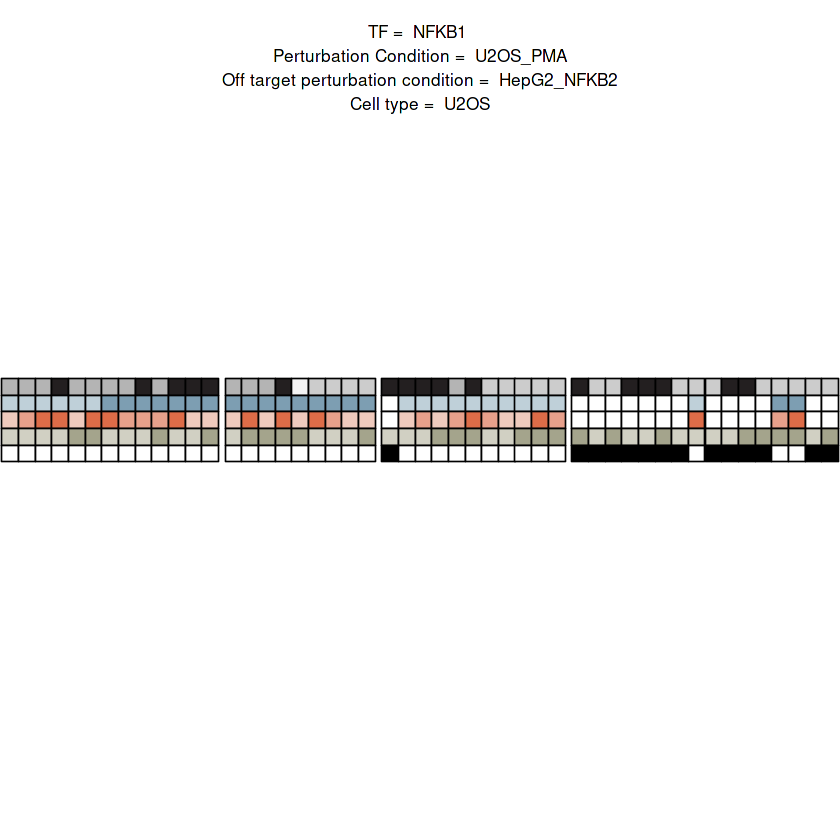

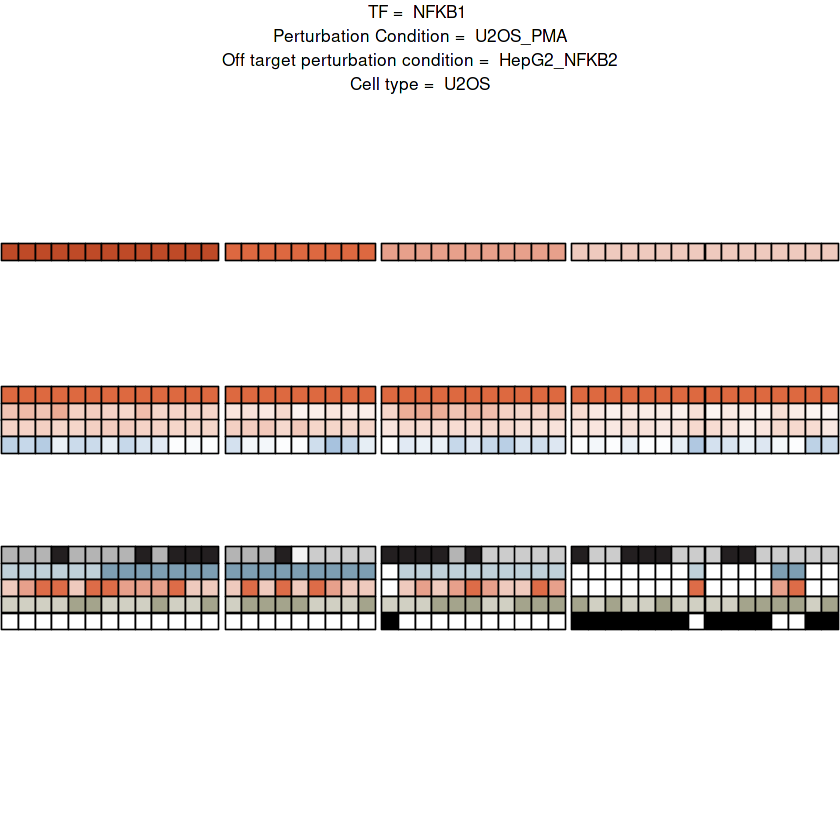

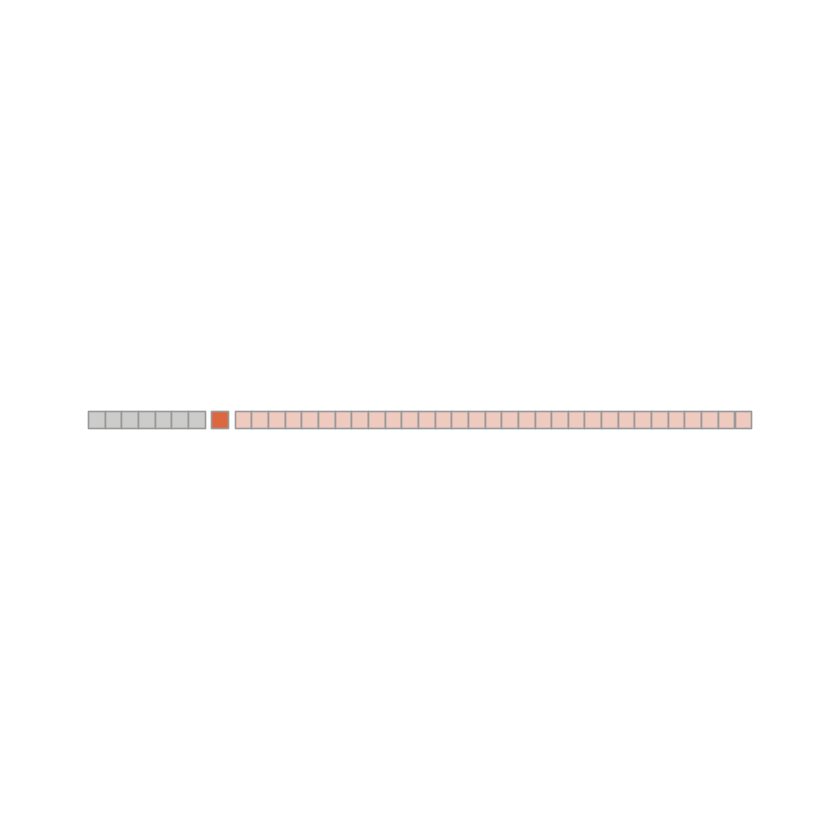

Joining, by = "reporter_id"
Joining, by = "feature"


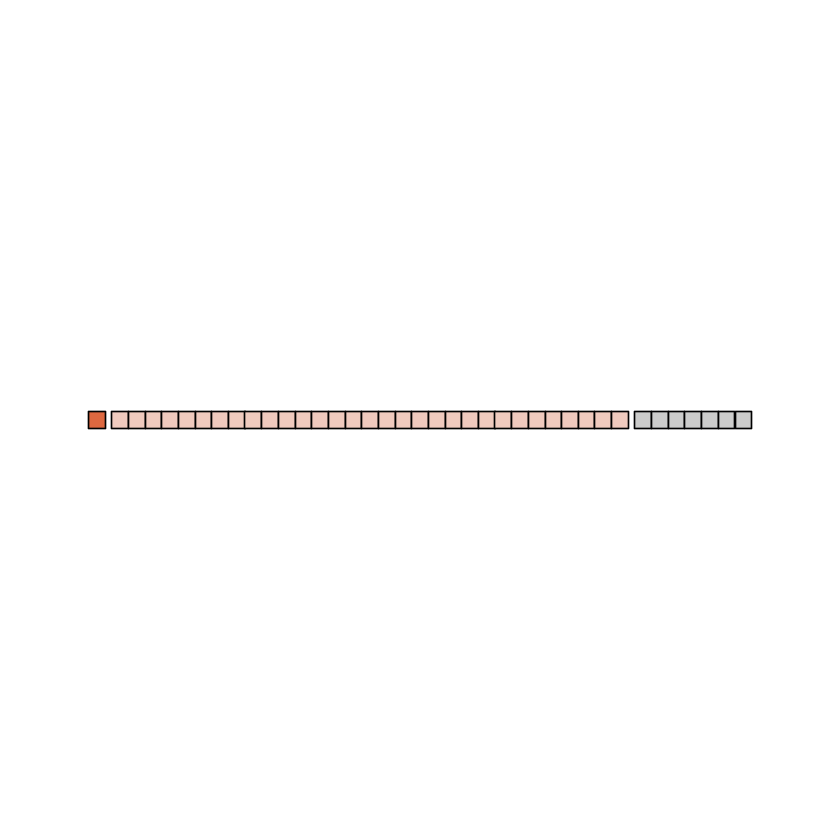

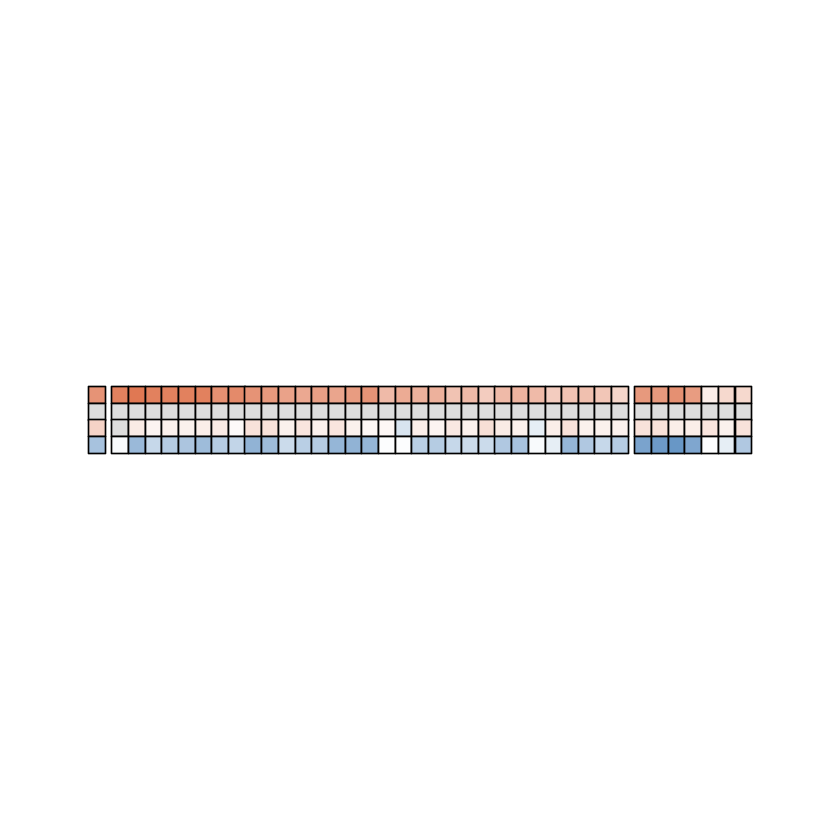

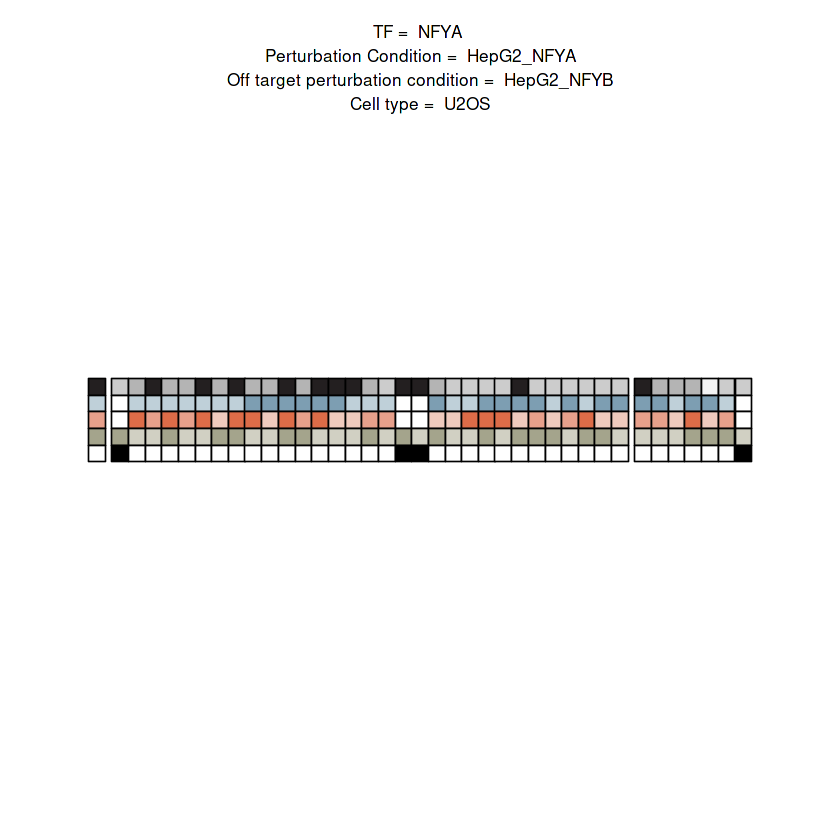

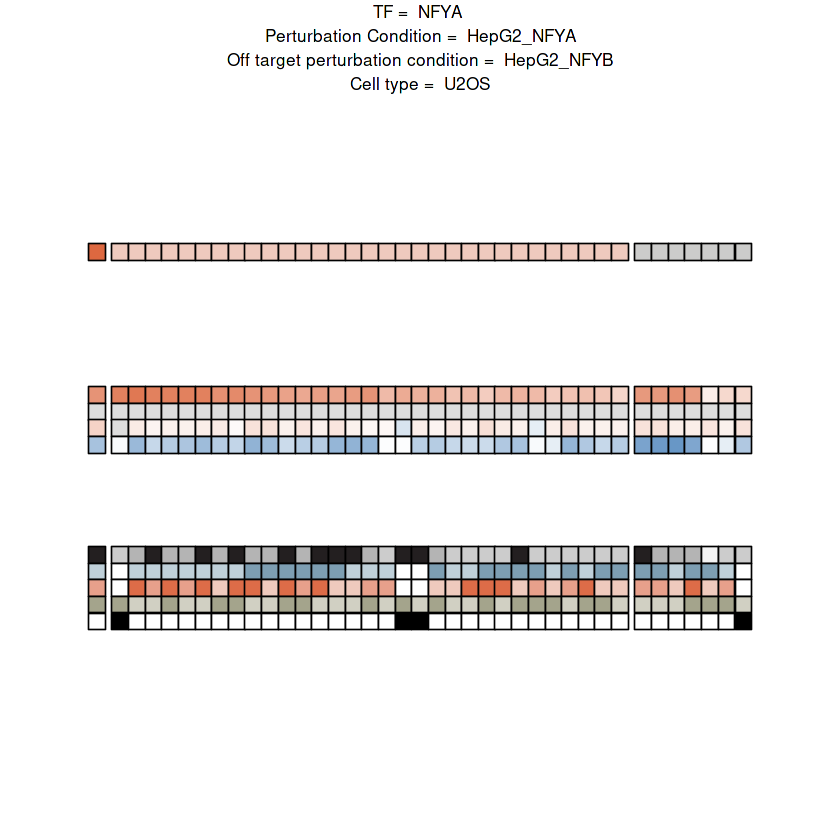

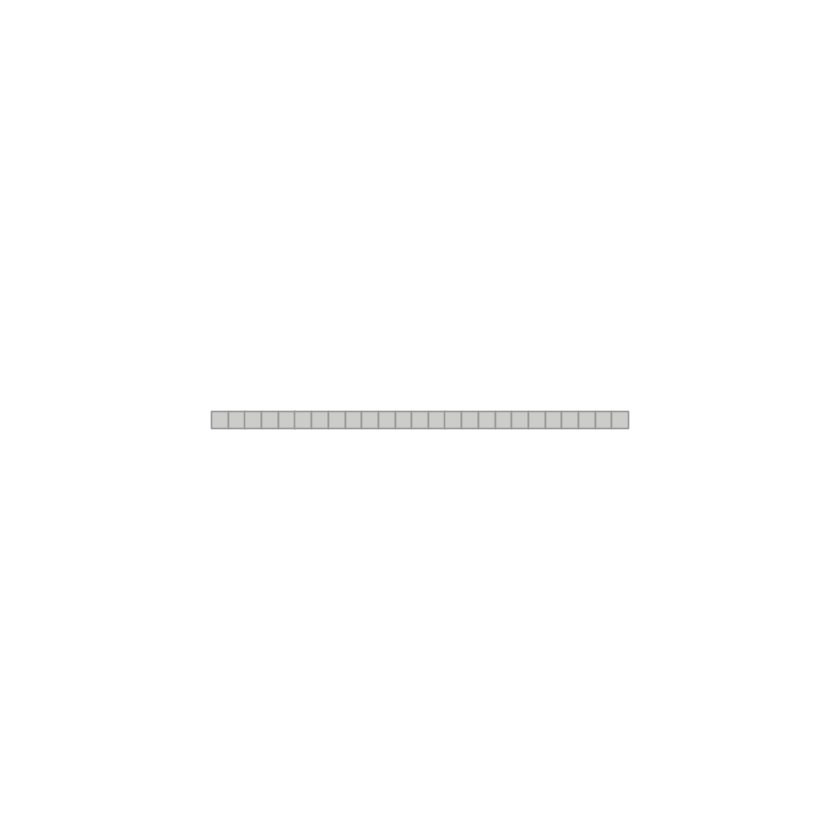

Joining, by = "reporter_id"
Joining, by = "feature"


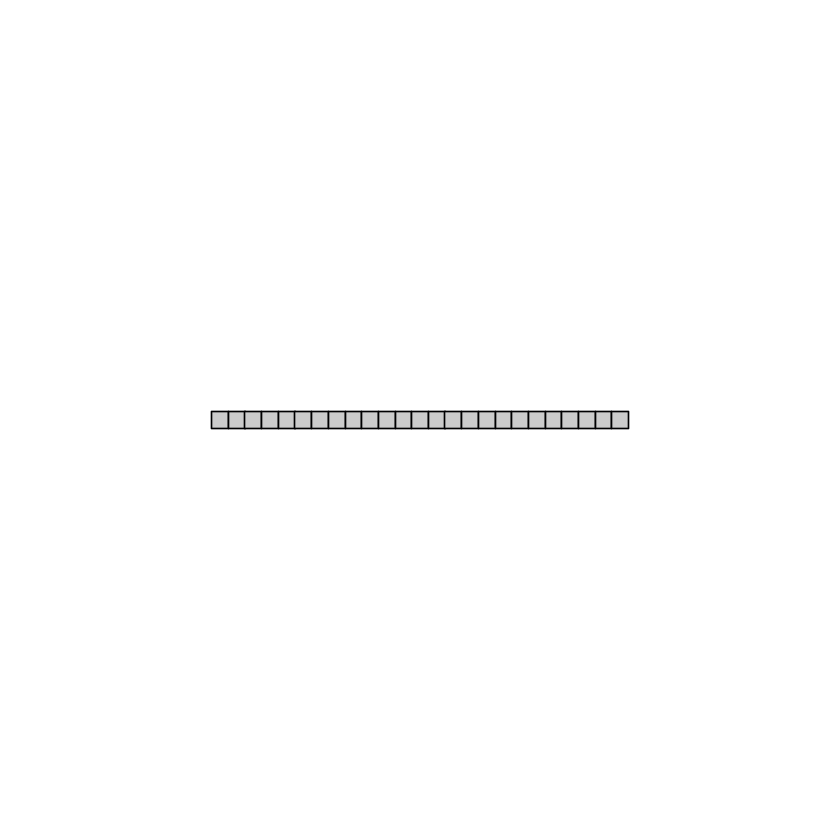

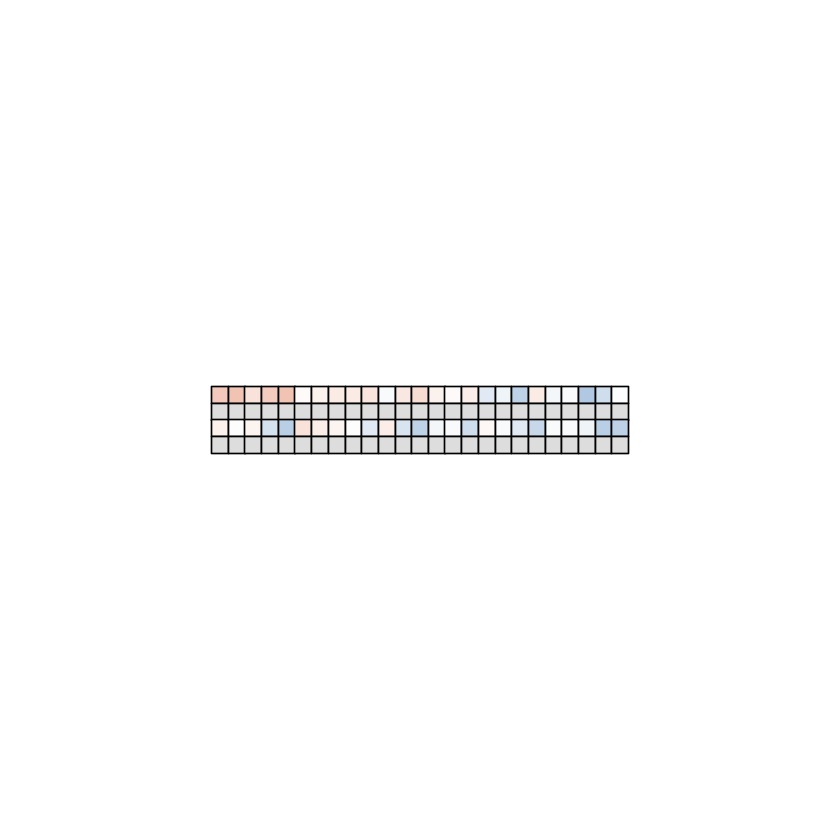

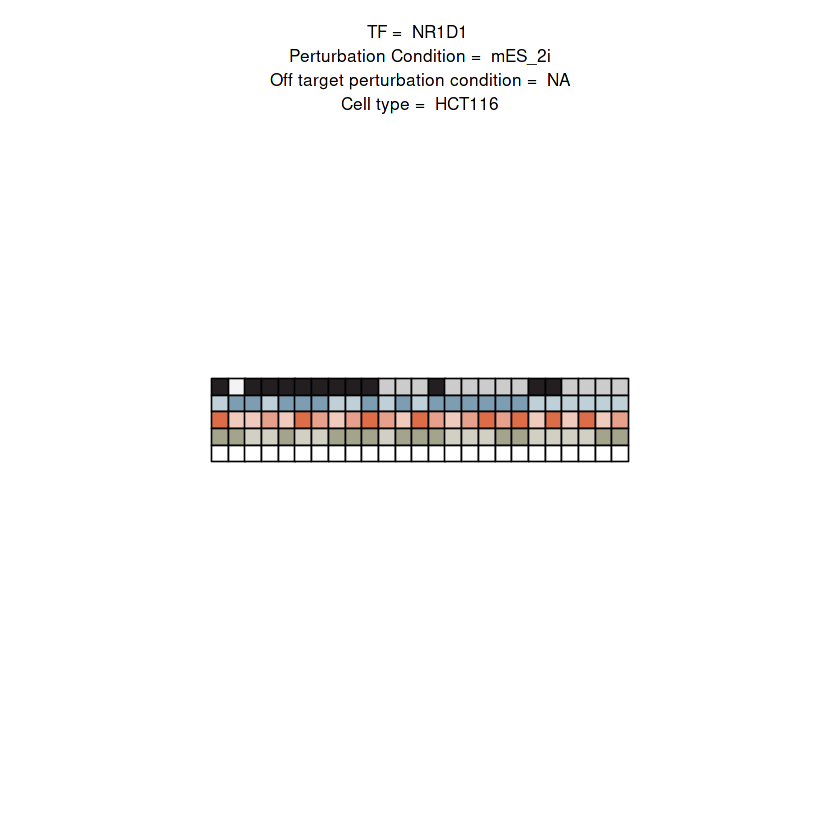

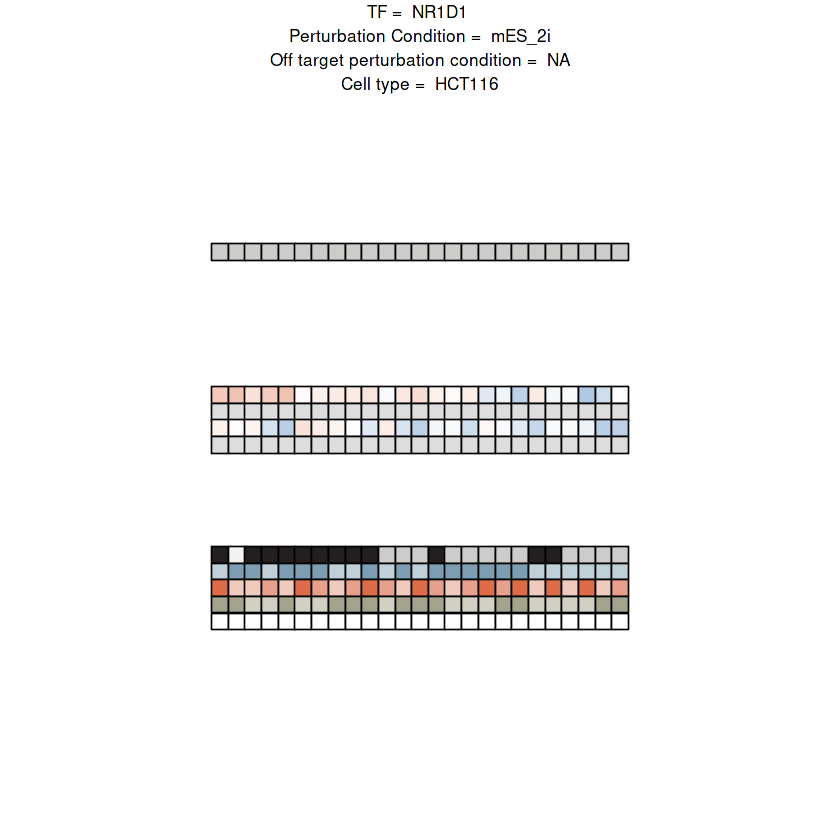

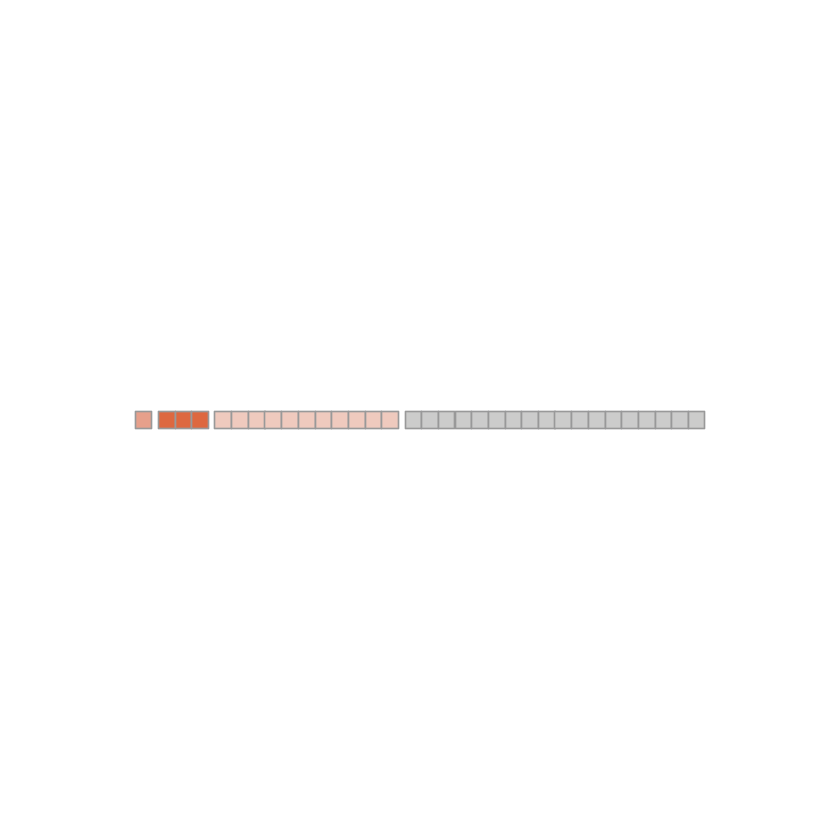

Joining, by = "reporter_id"
Joining, by = "feature"


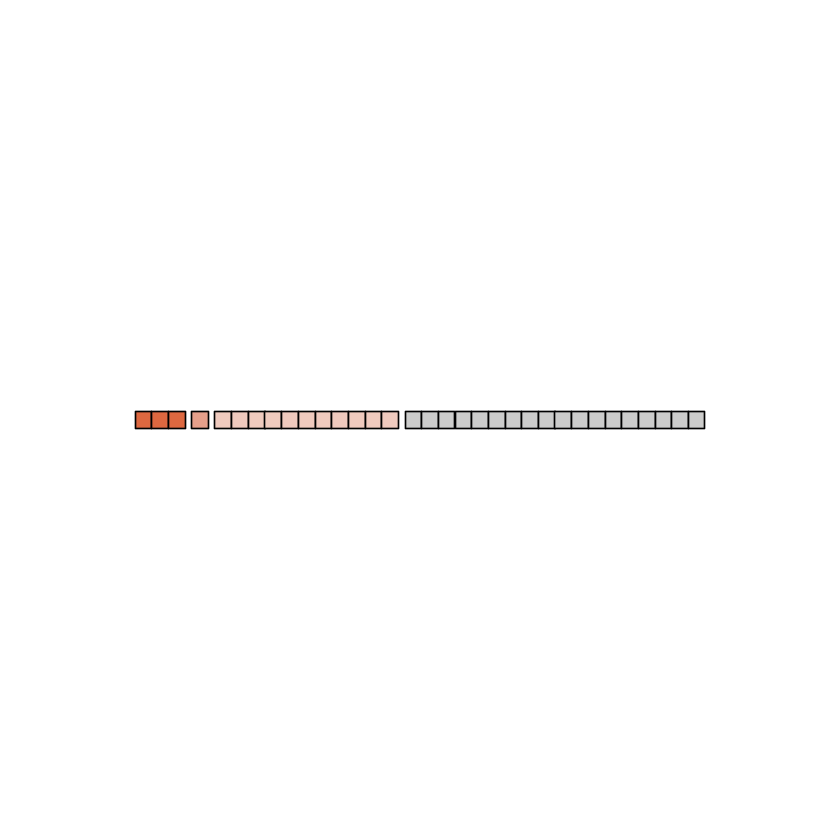

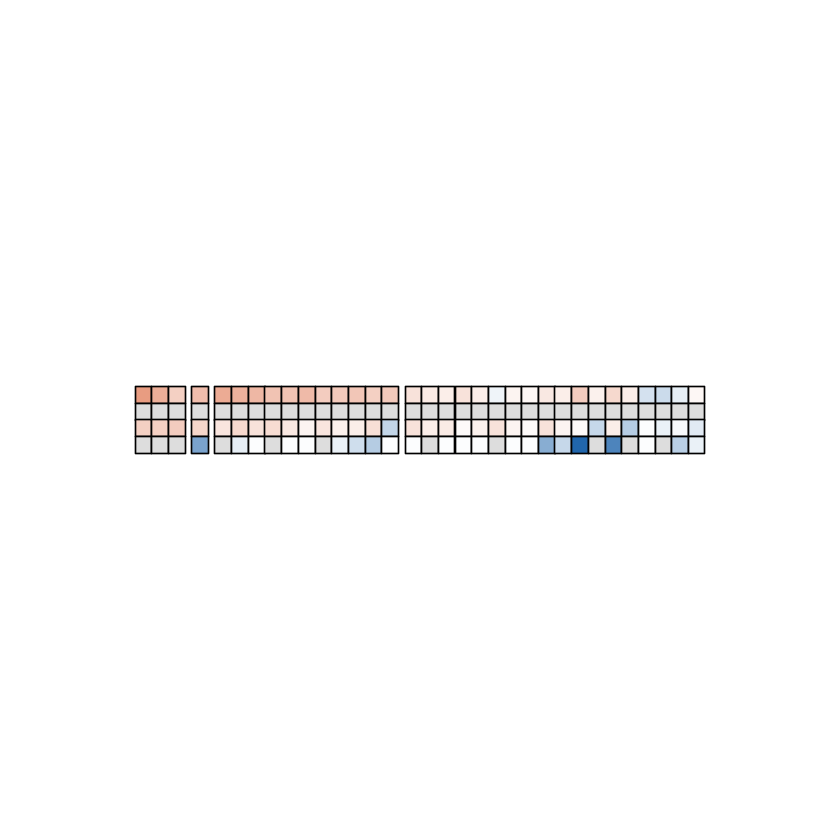

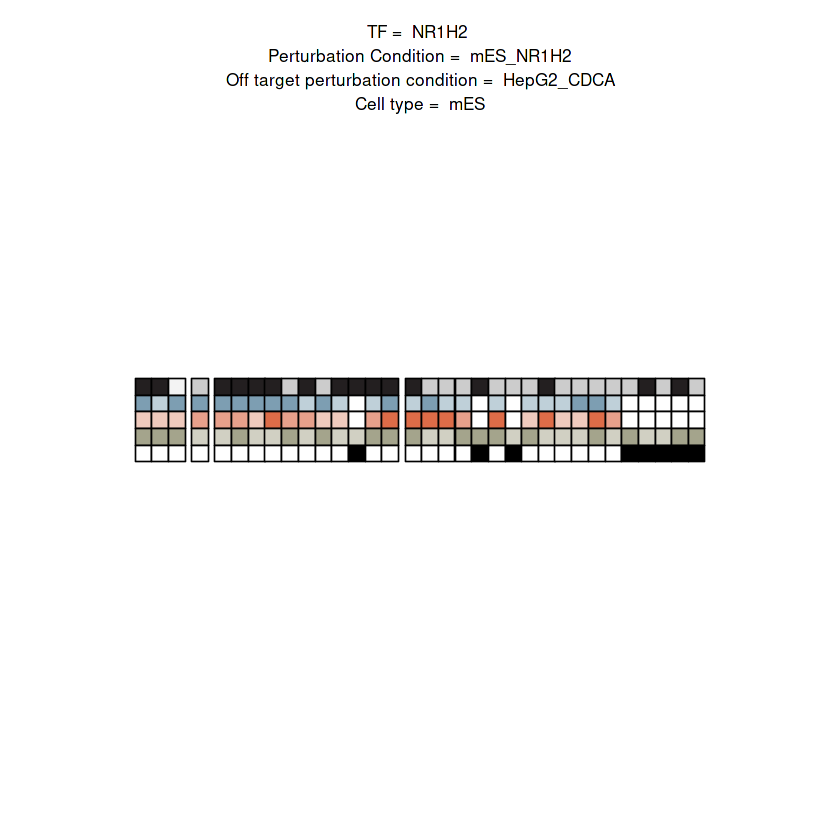

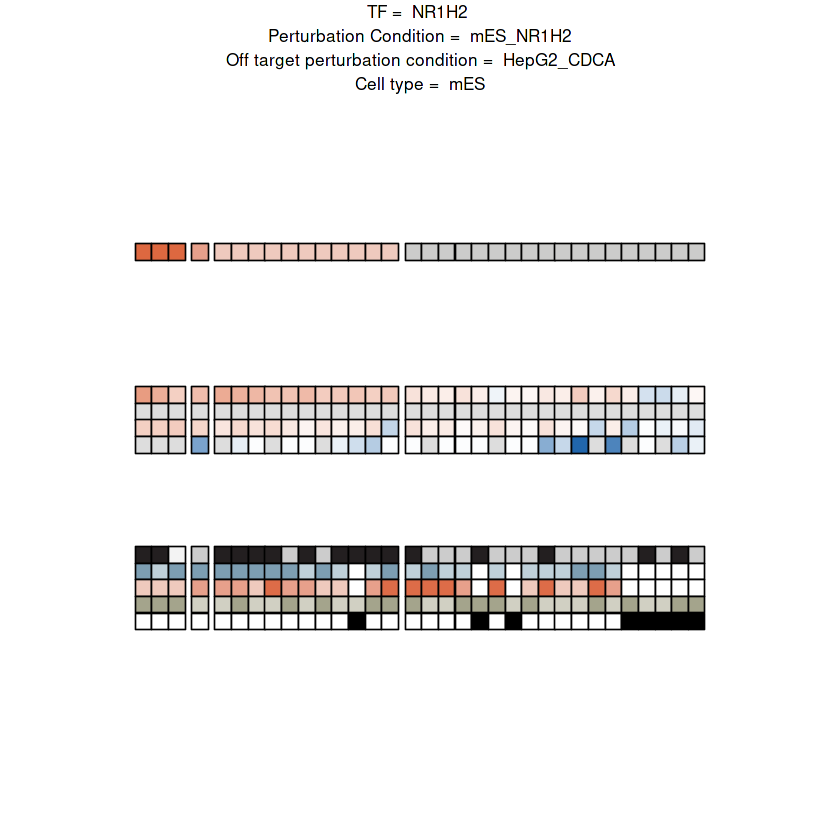

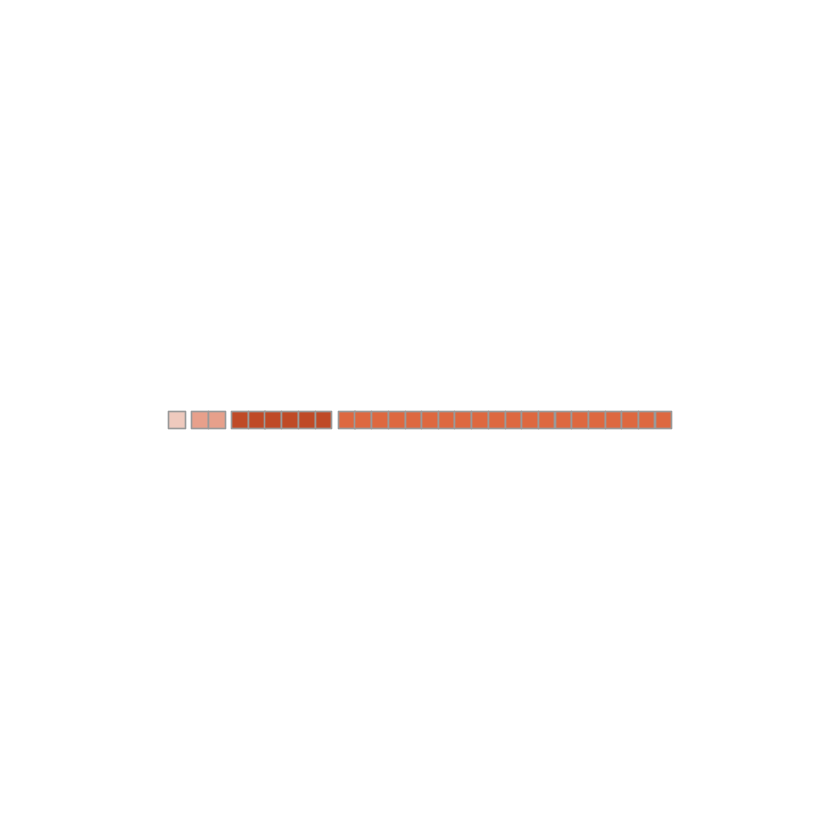

Joining, by = "reporter_id"
Joining, by = "feature"


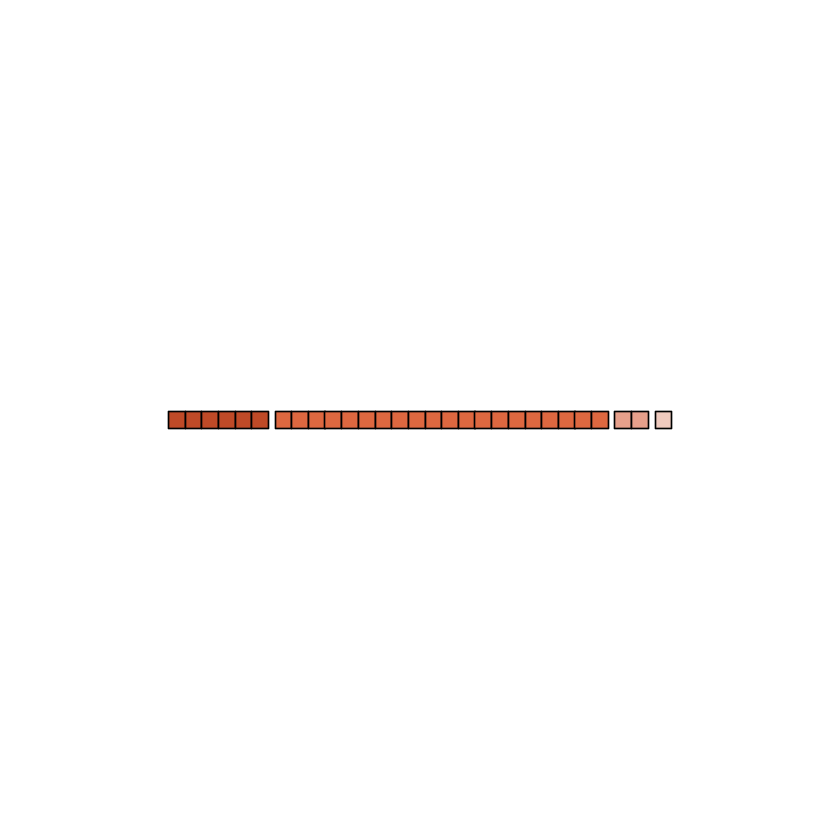

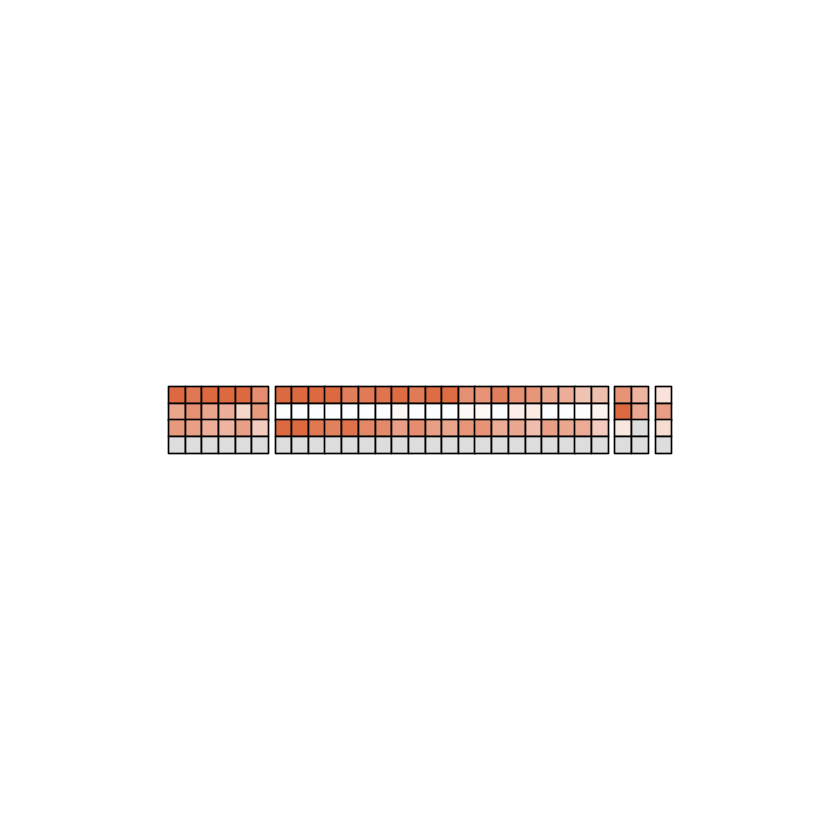

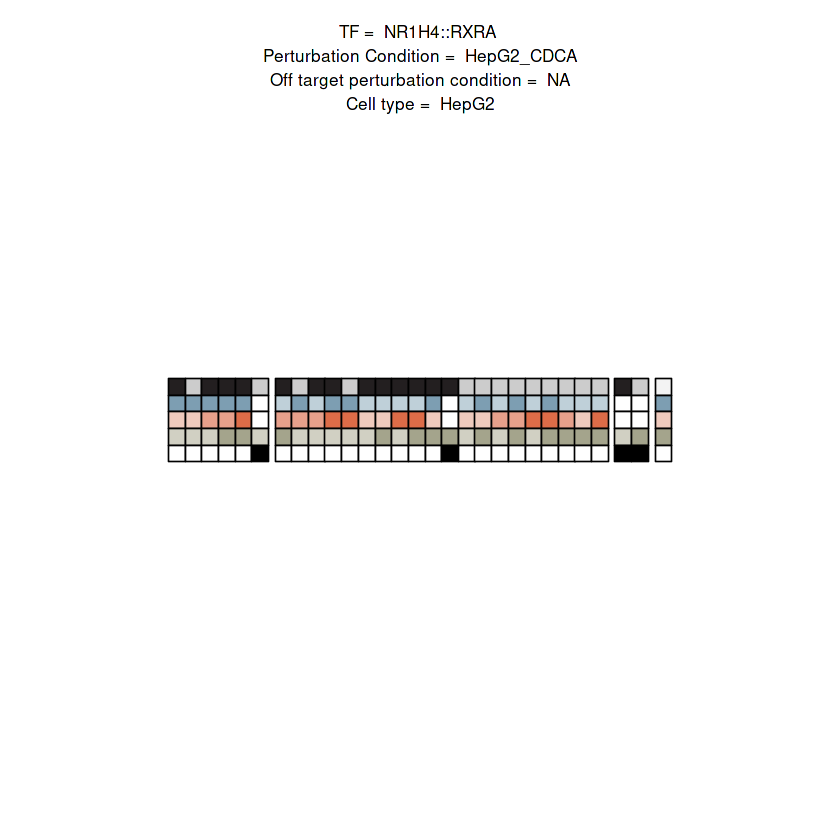

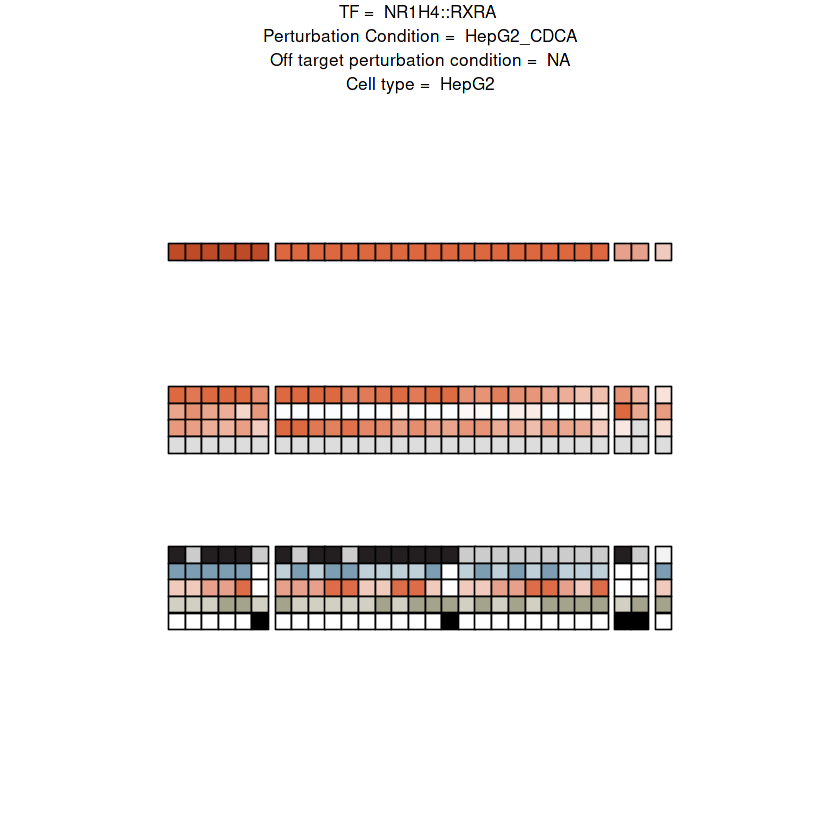

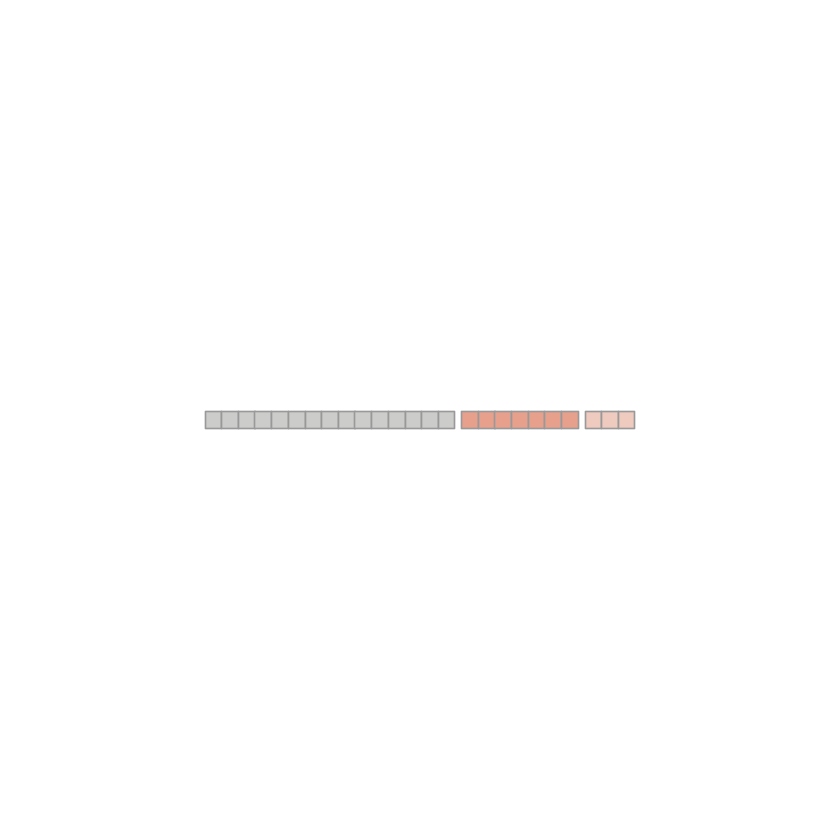

Joining, by = "reporter_id"
Joining, by = "feature"


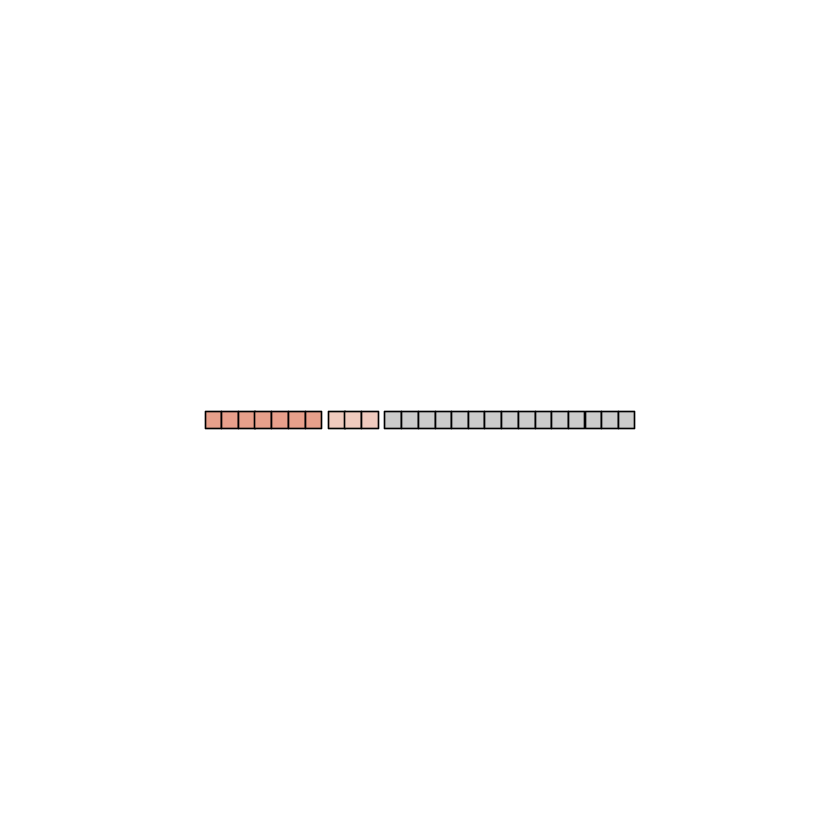

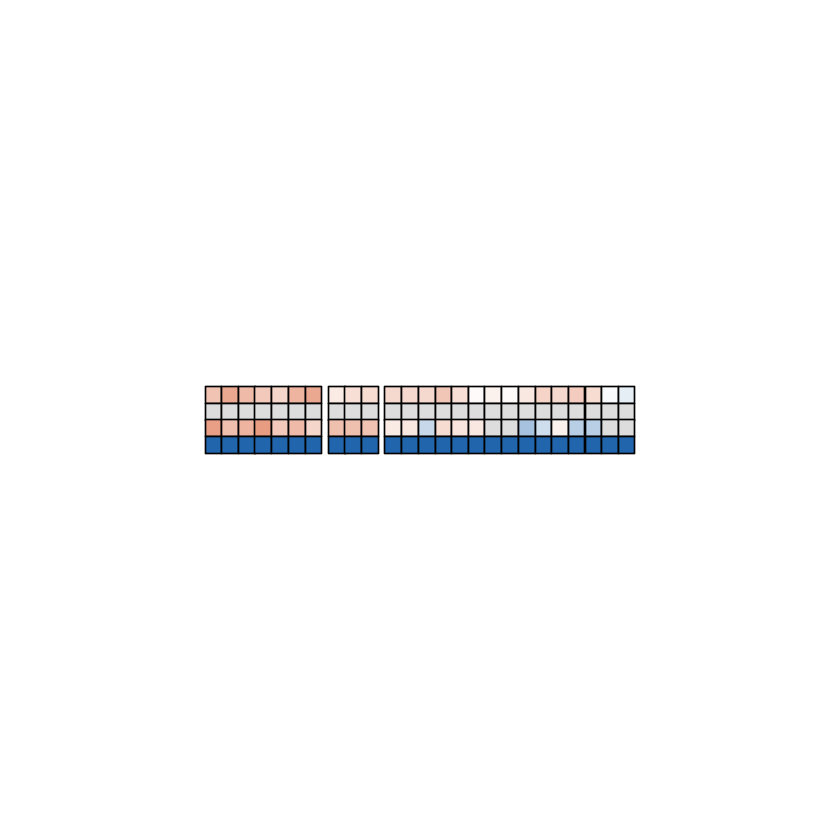

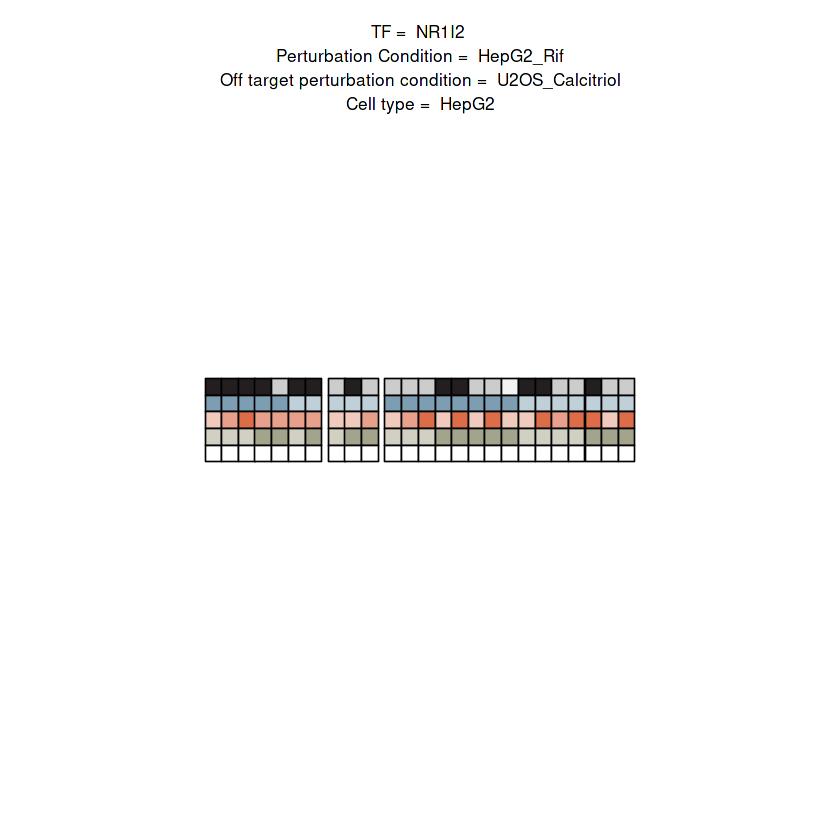

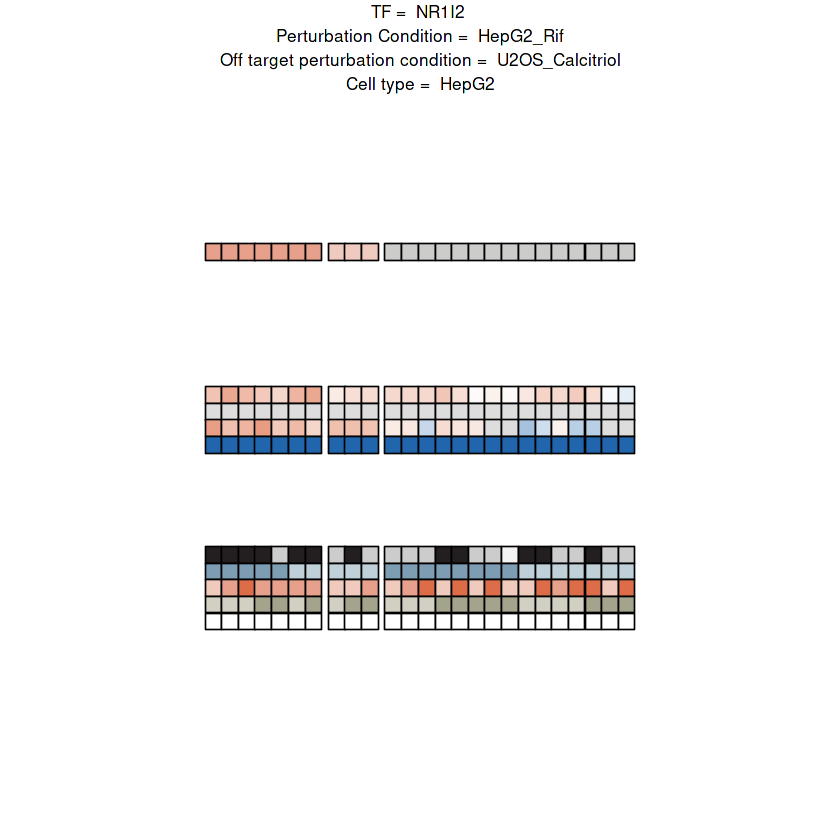

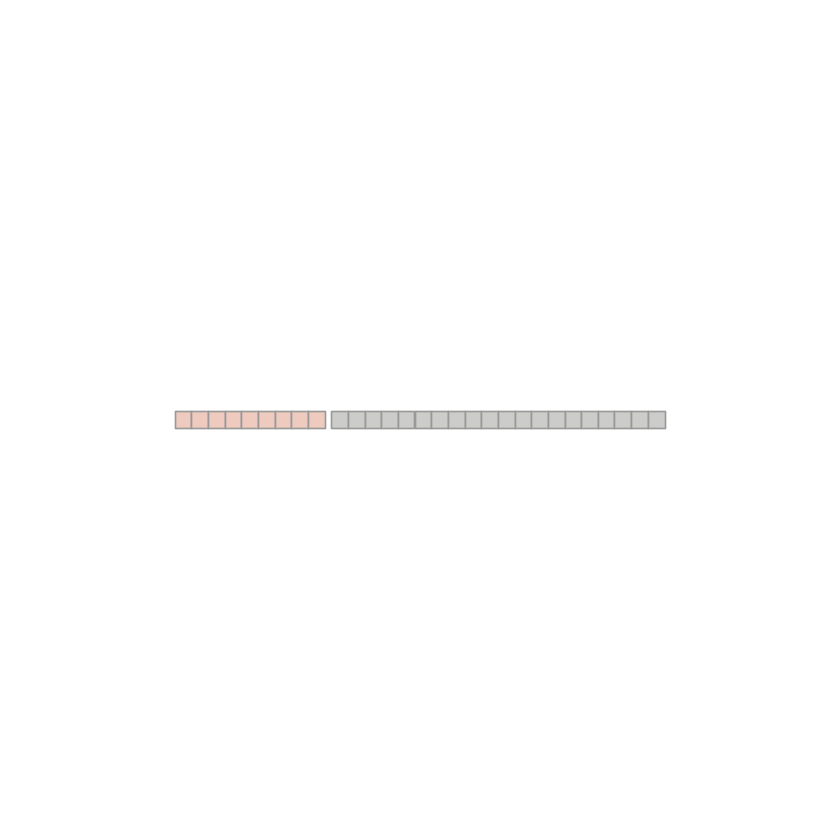

Joining, by = "reporter_id"
Joining, by = "feature"


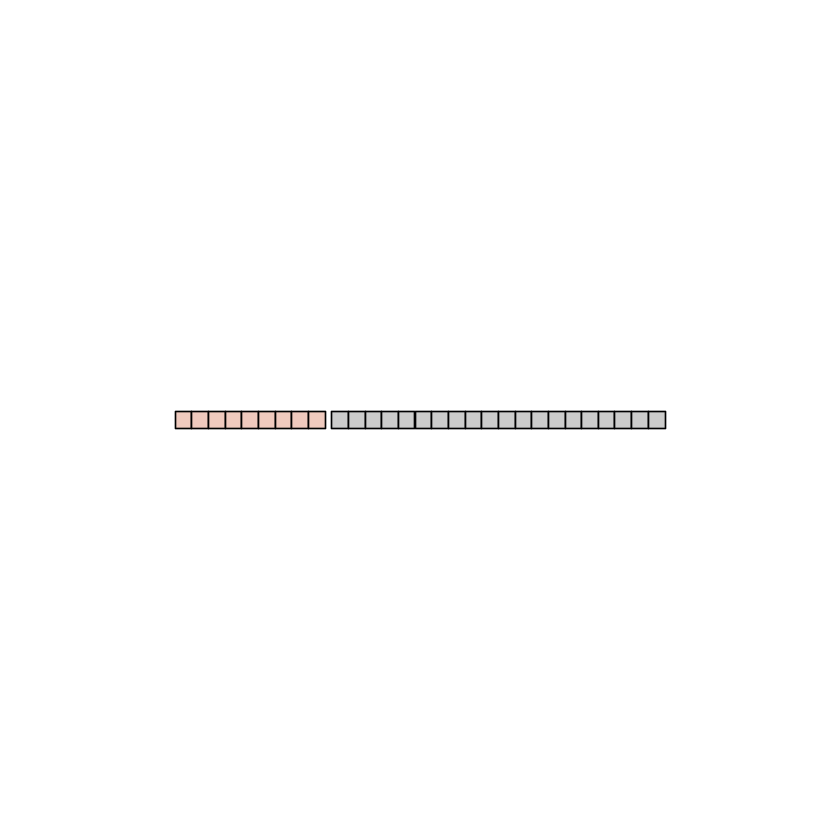

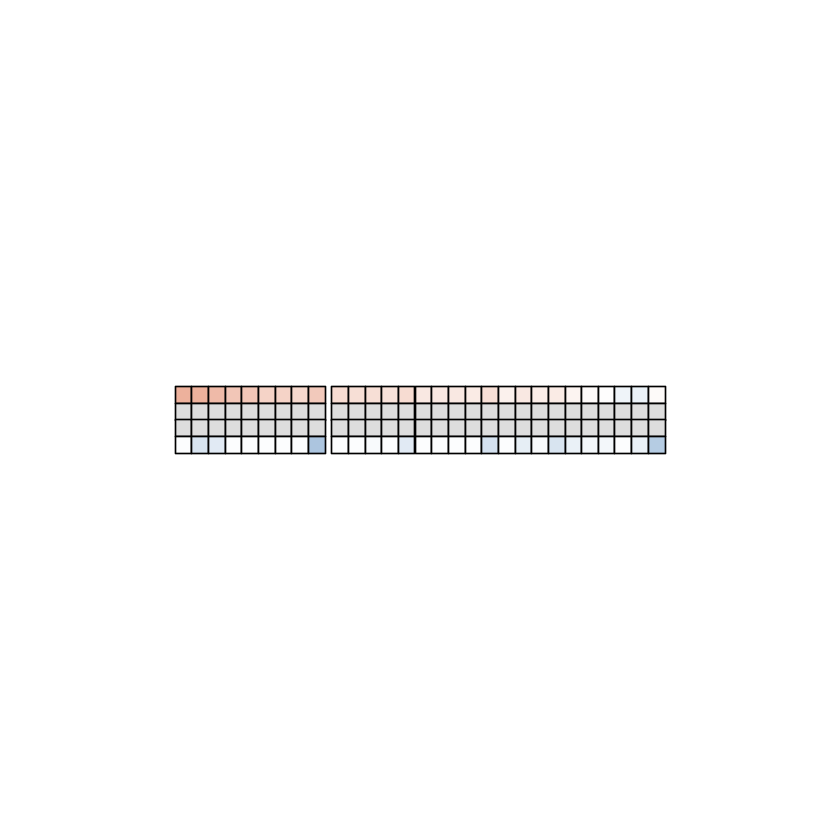

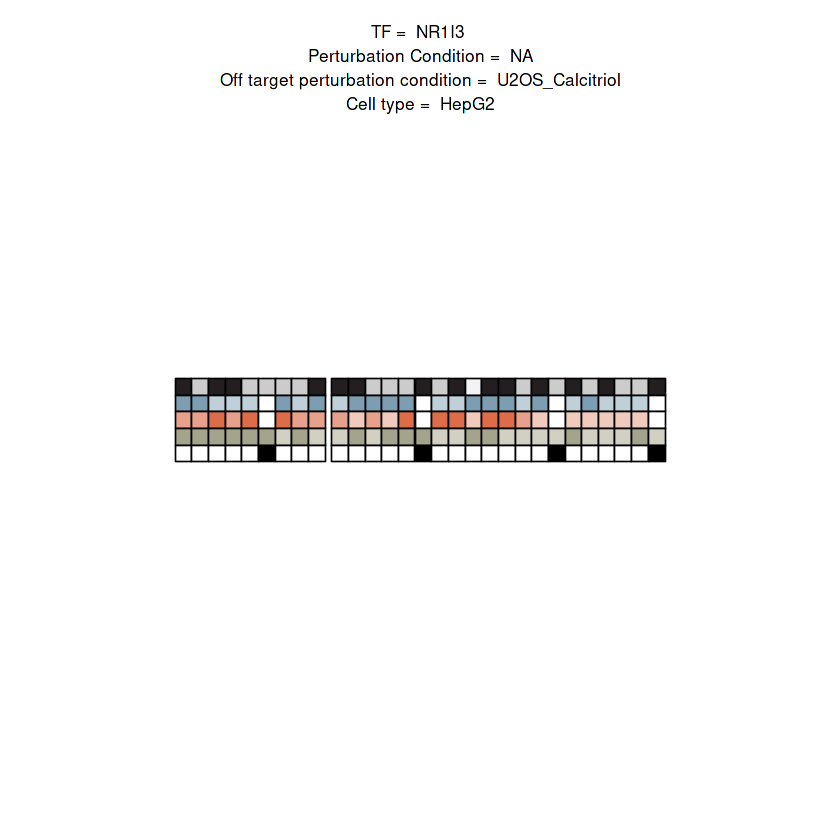

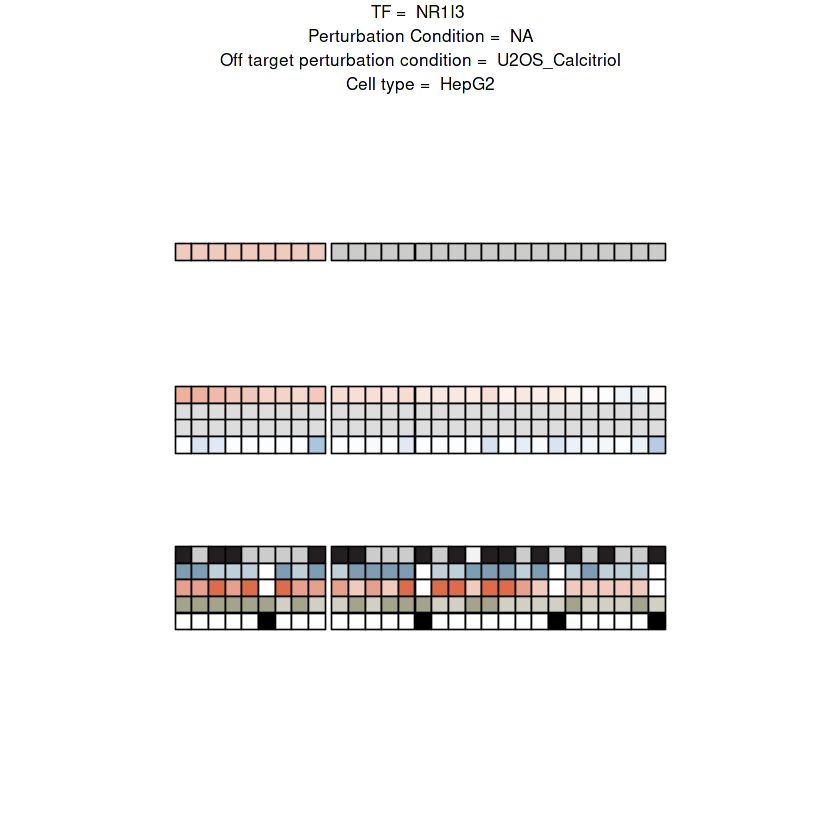

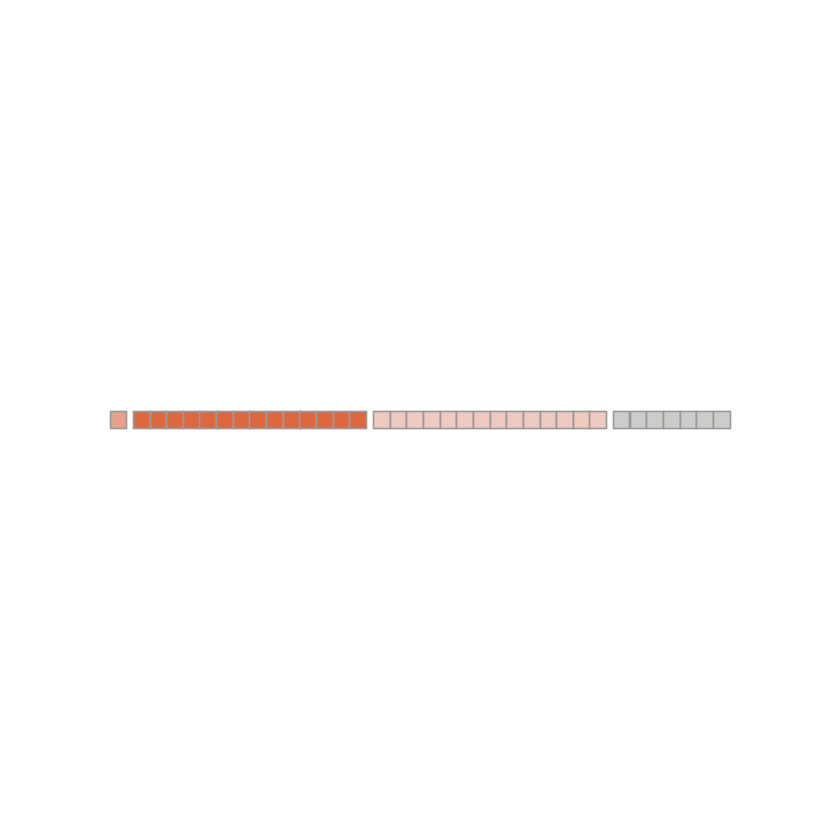

Joining, by = "reporter_id"
Joining, by = "feature"


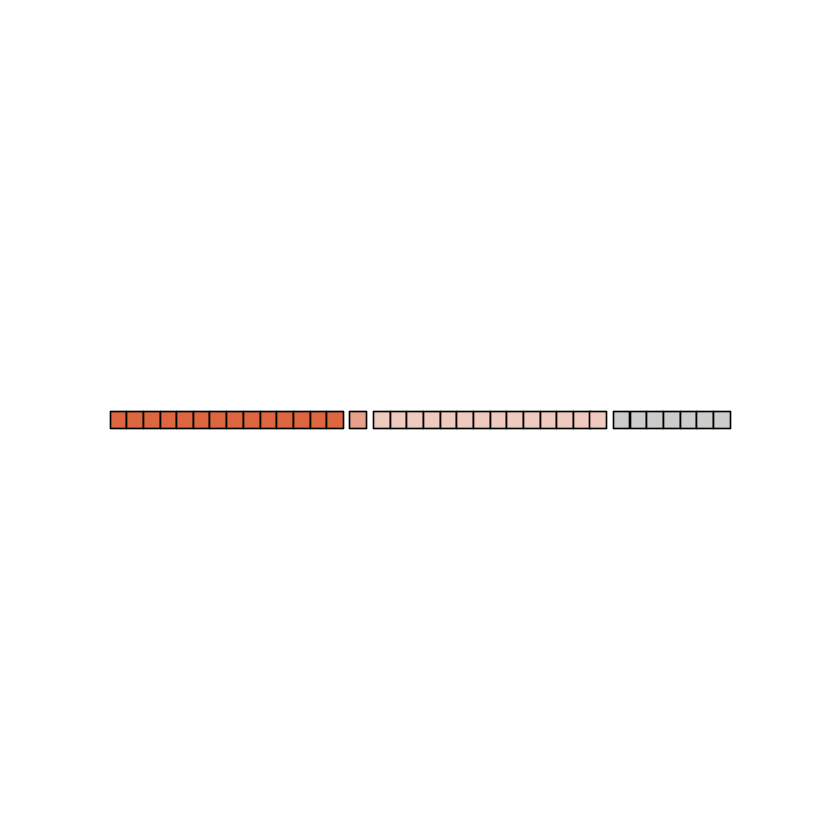

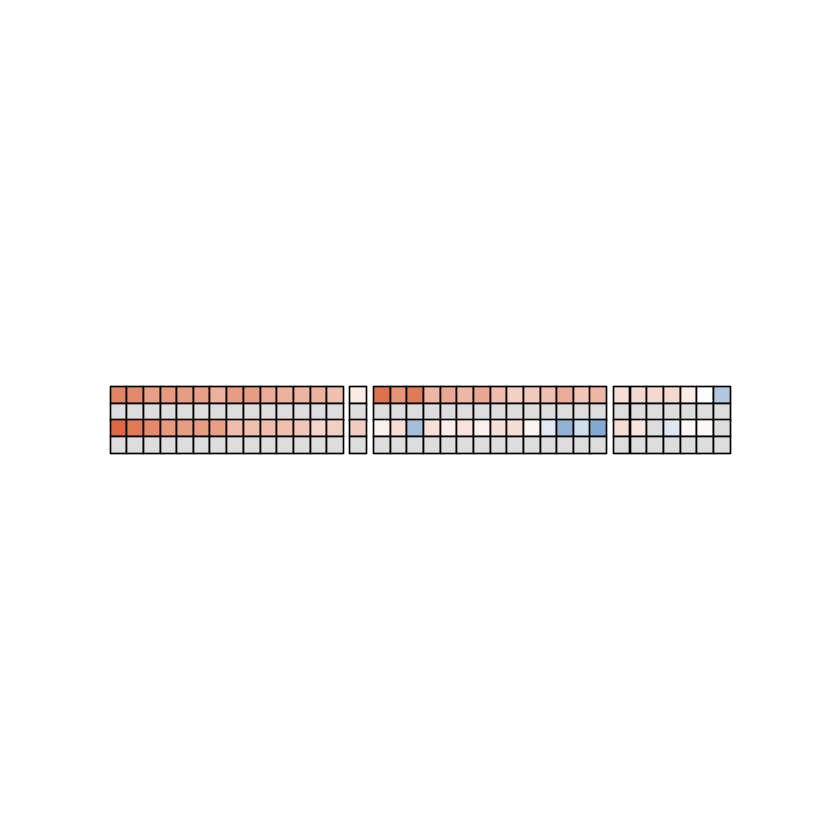

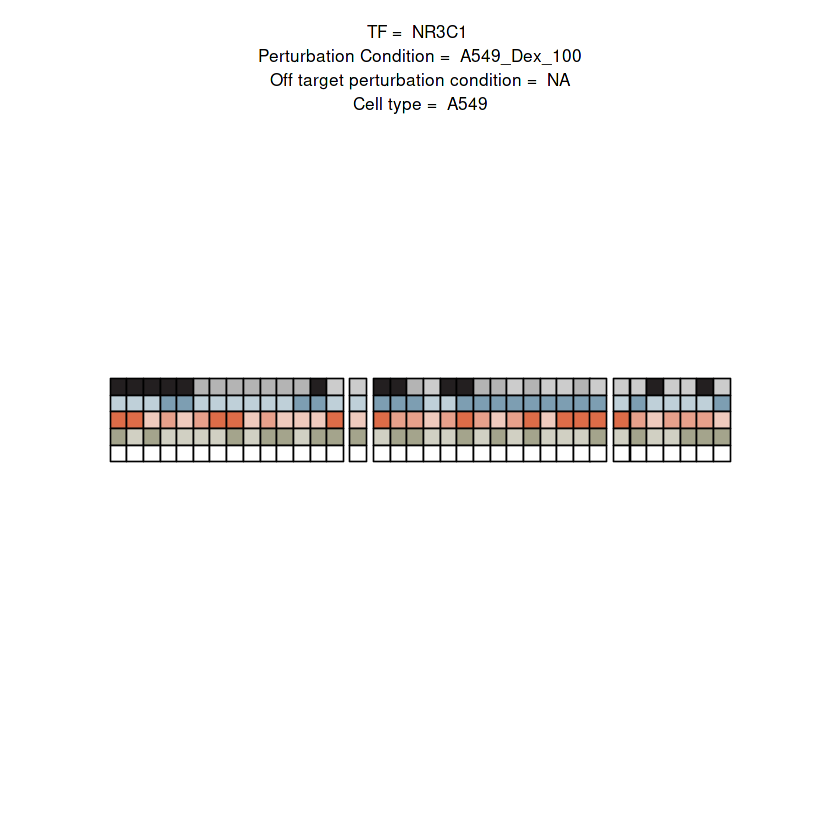

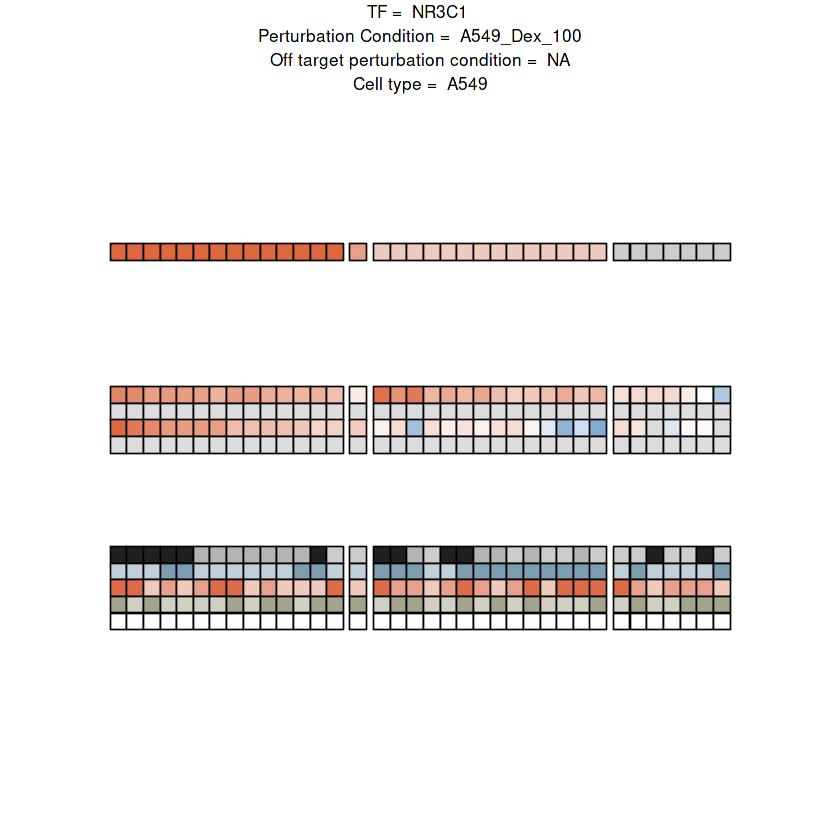

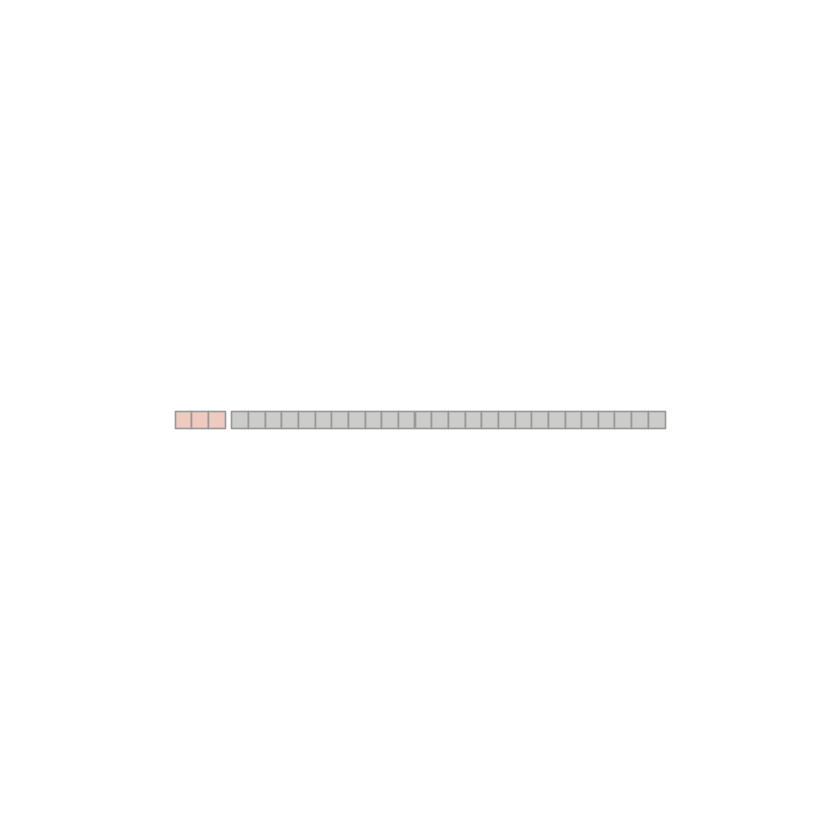

Joining, by = "reporter_id"
Joining, by = "feature"


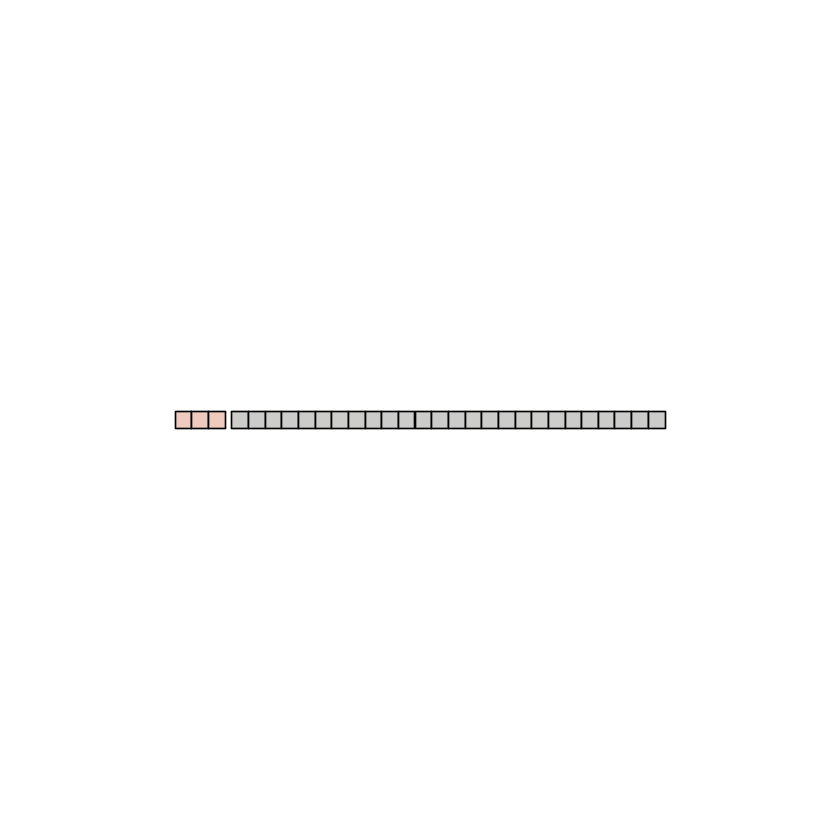

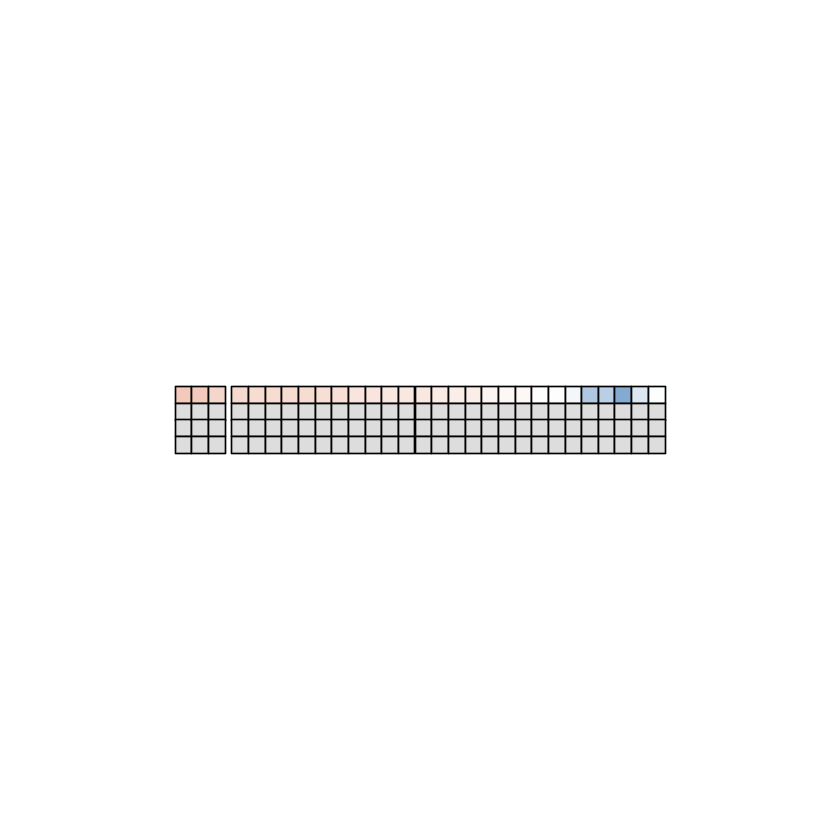

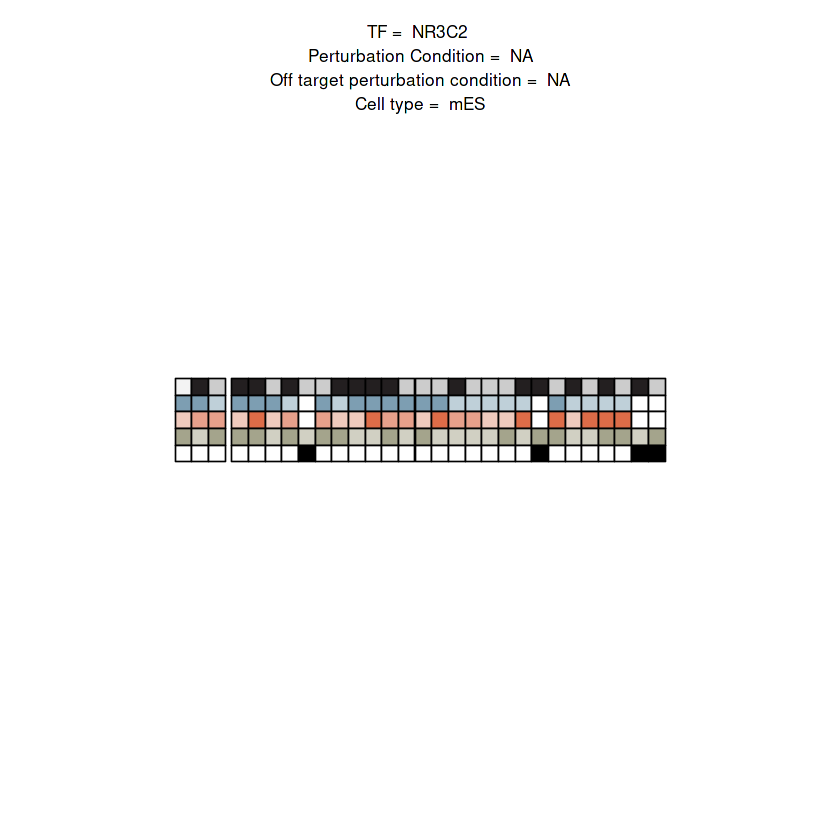

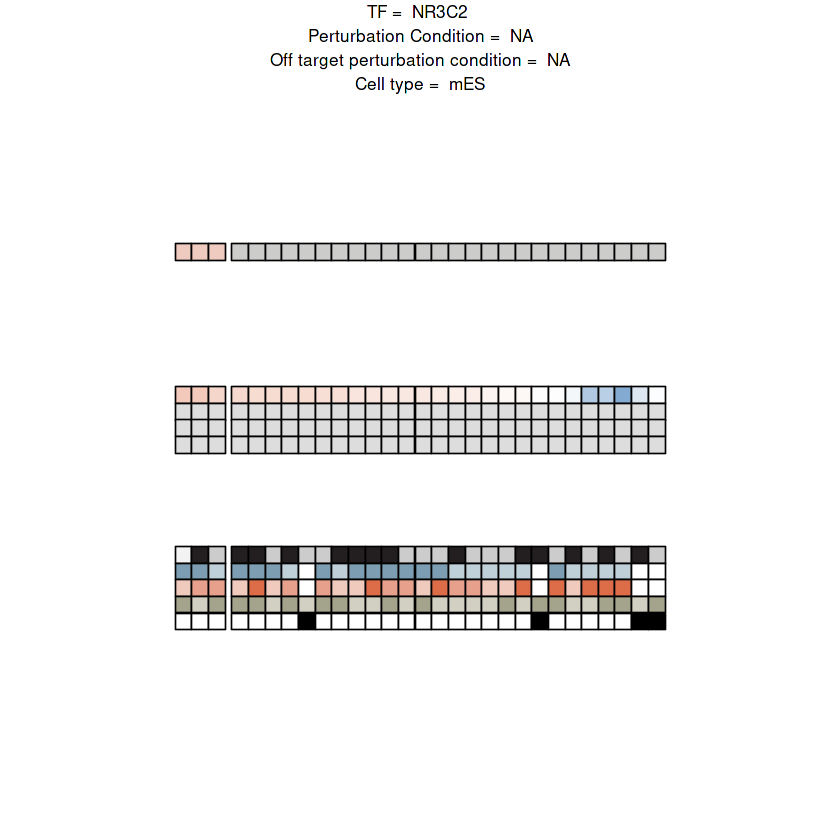

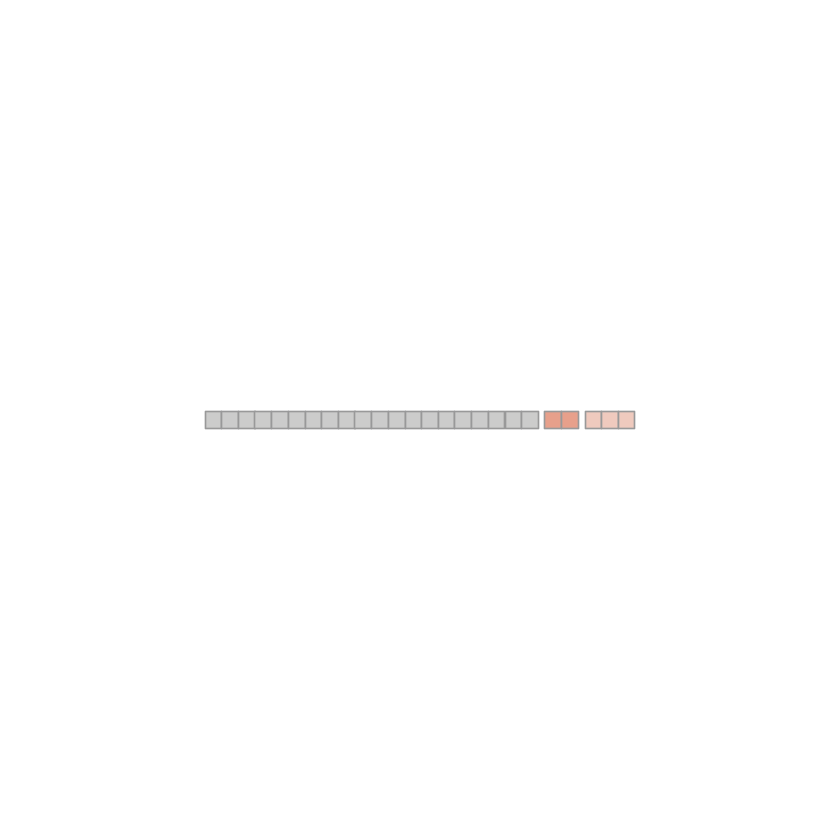

Joining, by = "reporter_id"
Joining, by = "feature"


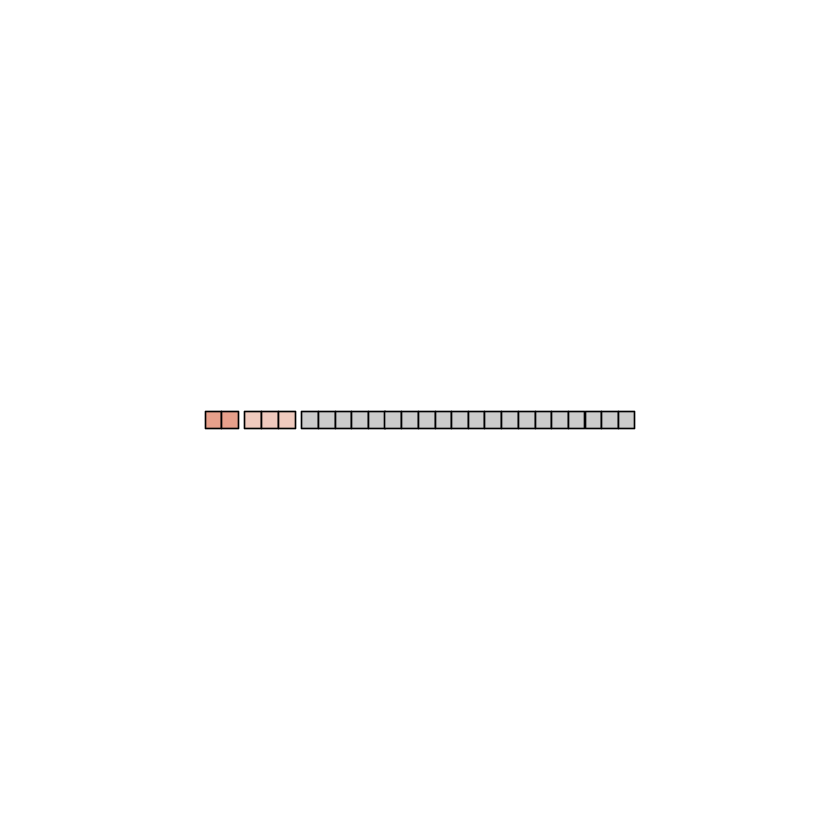

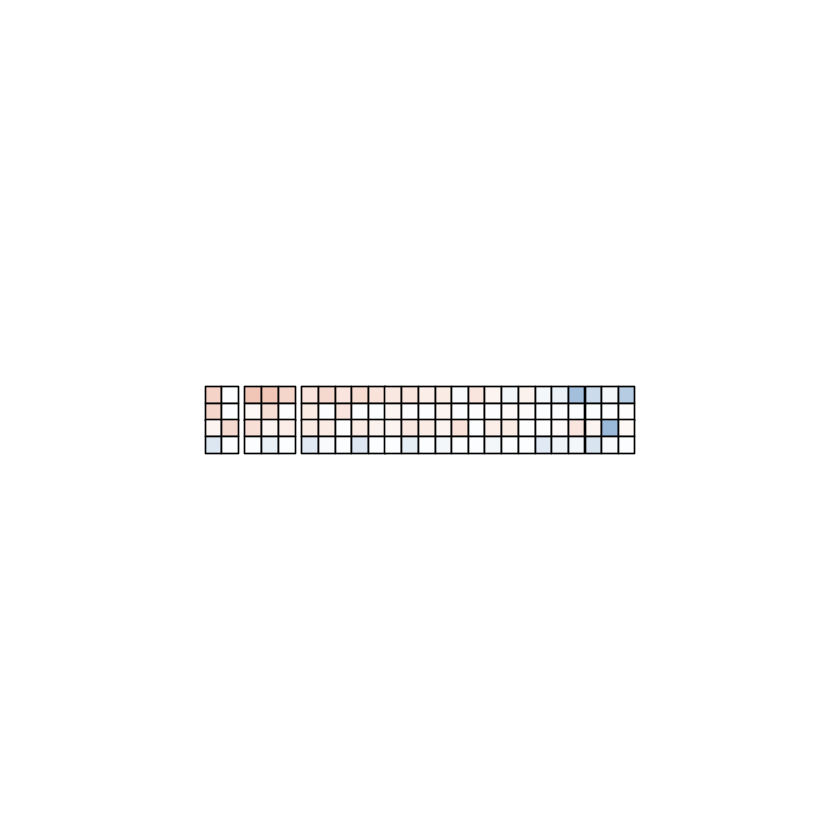

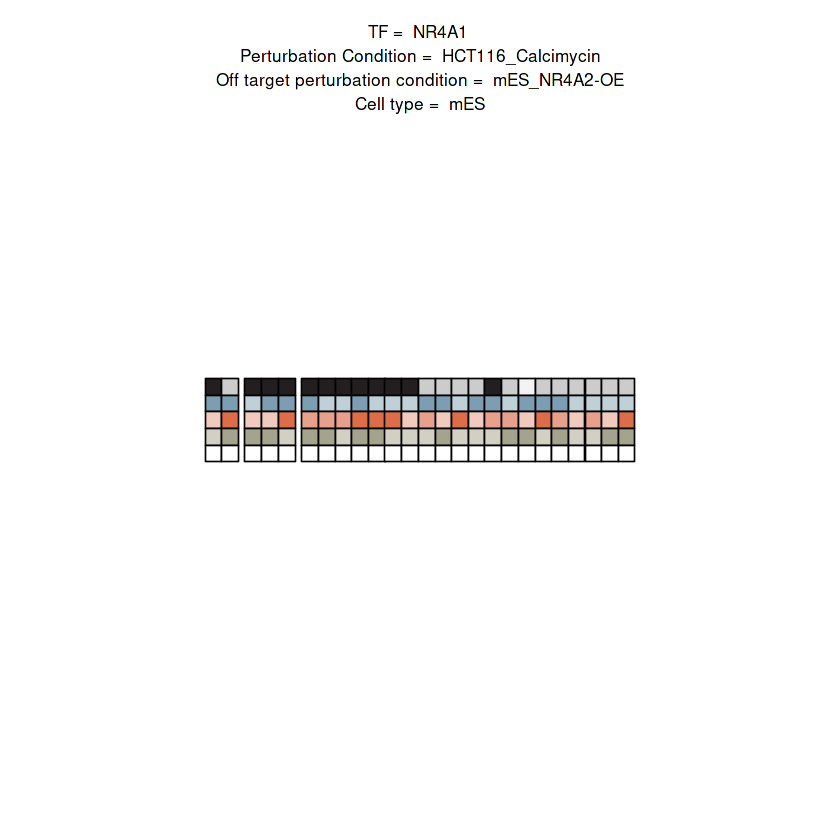

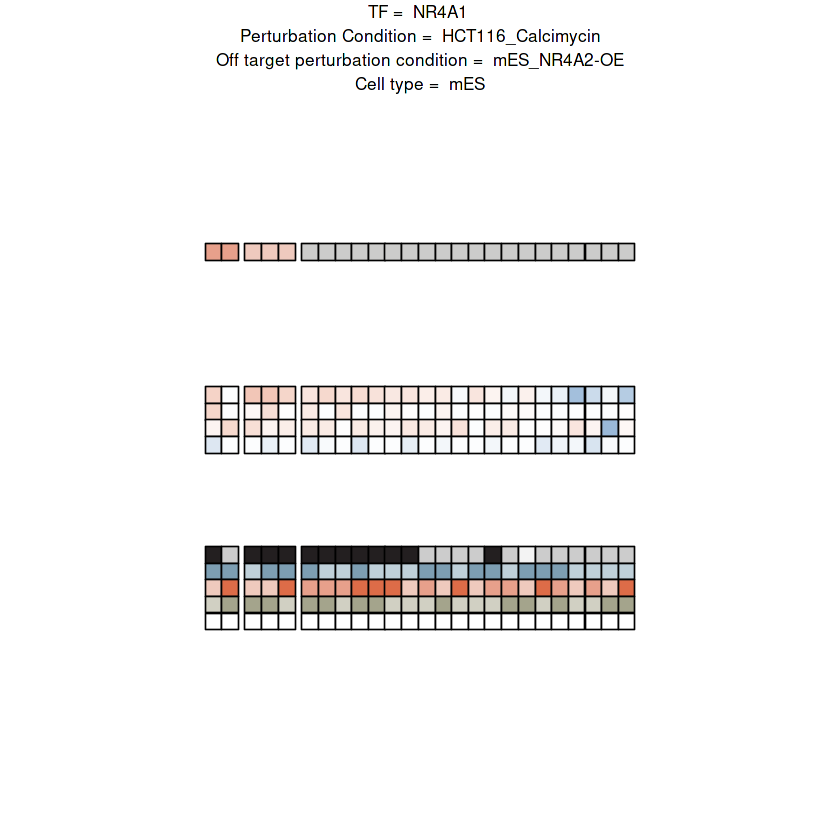

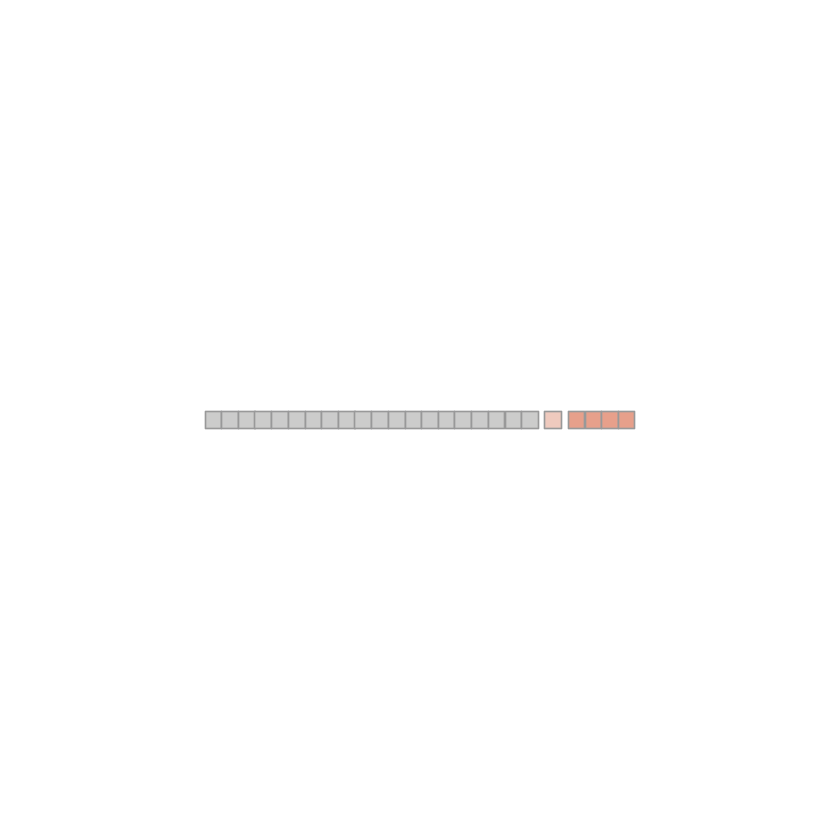

Joining, by = "reporter_id"
Joining, by = "feature"


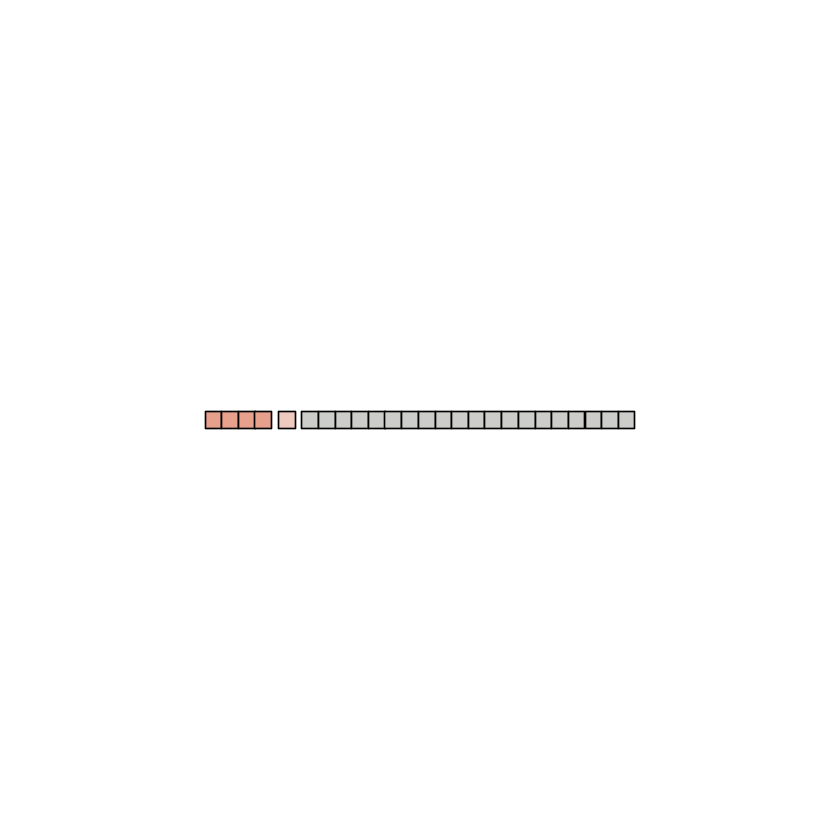

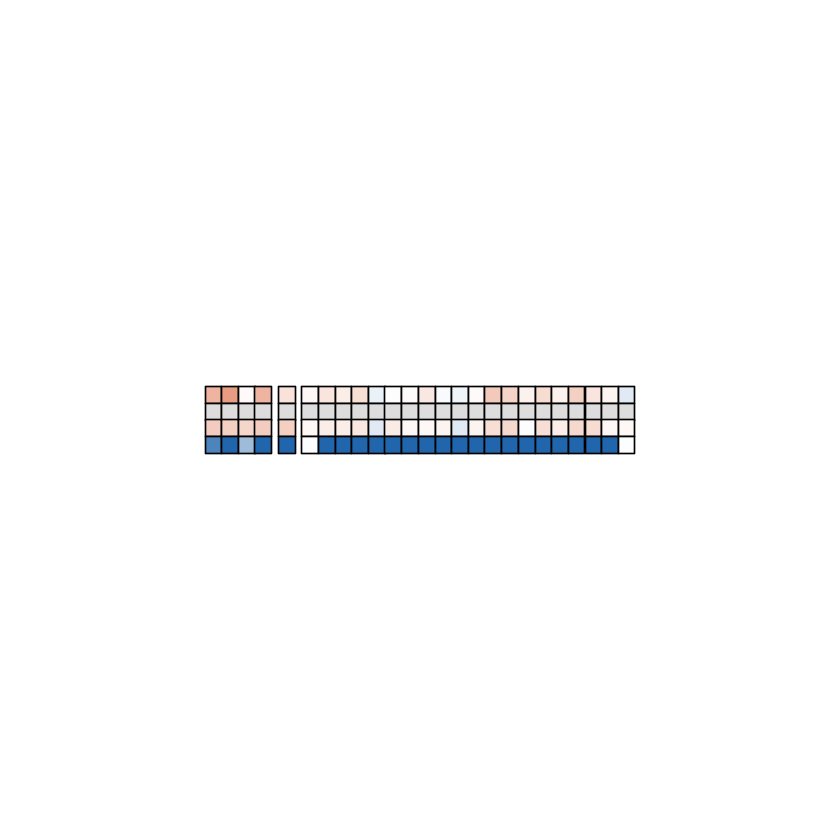

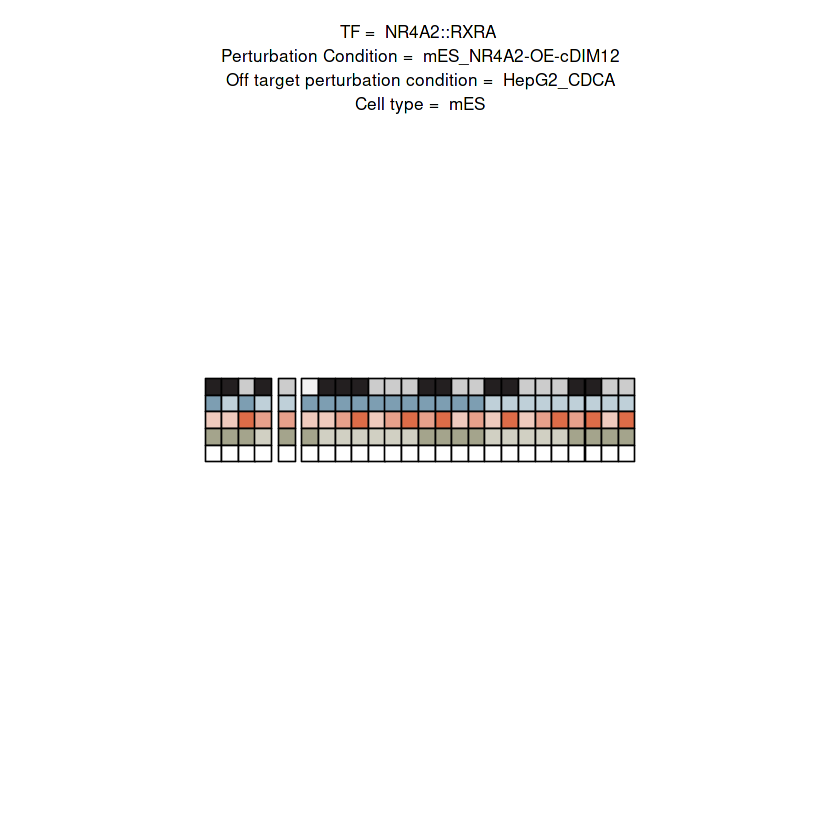

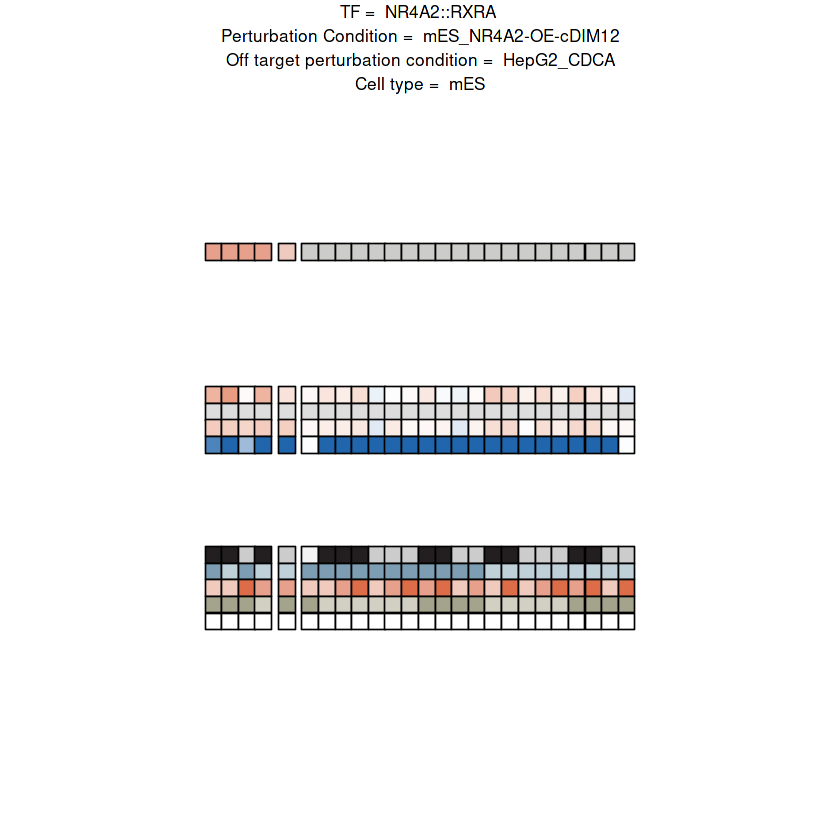

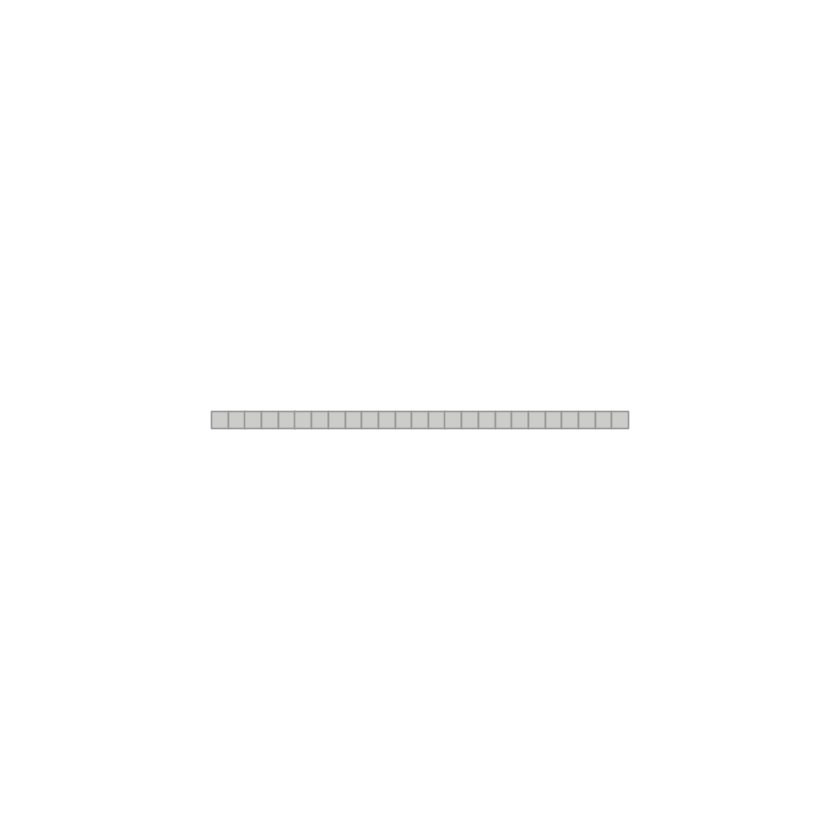

Joining, by = "reporter_id"
Joining, by = "feature"


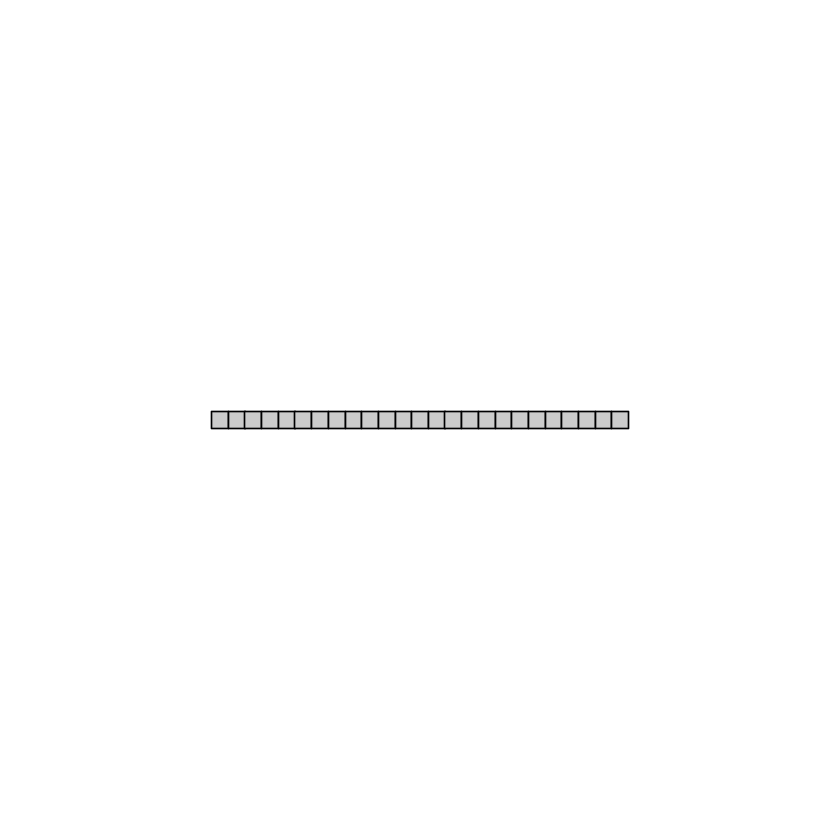

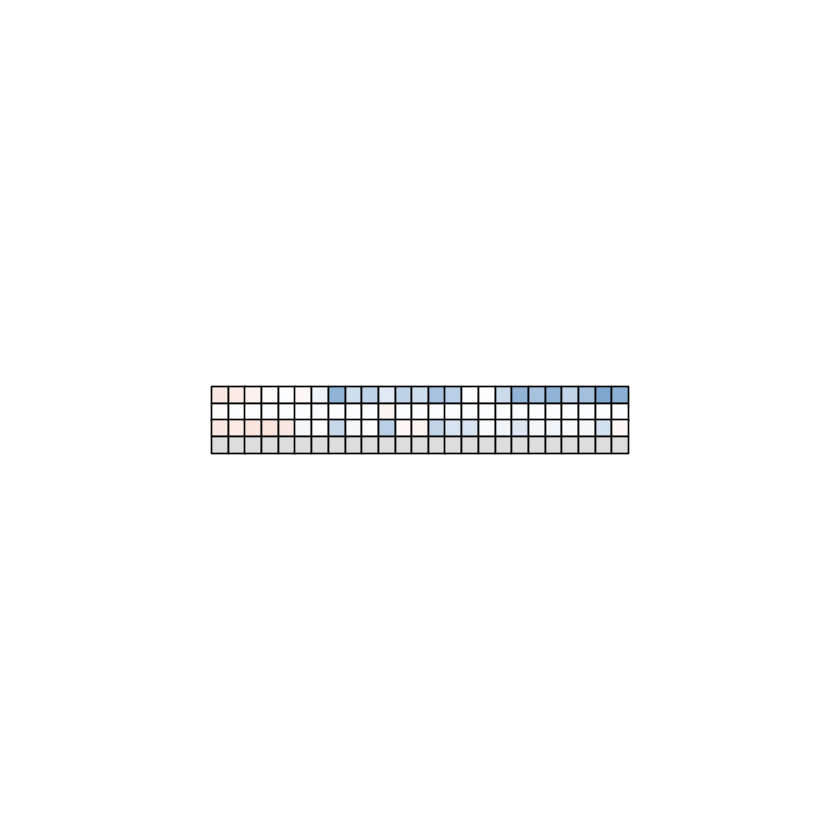

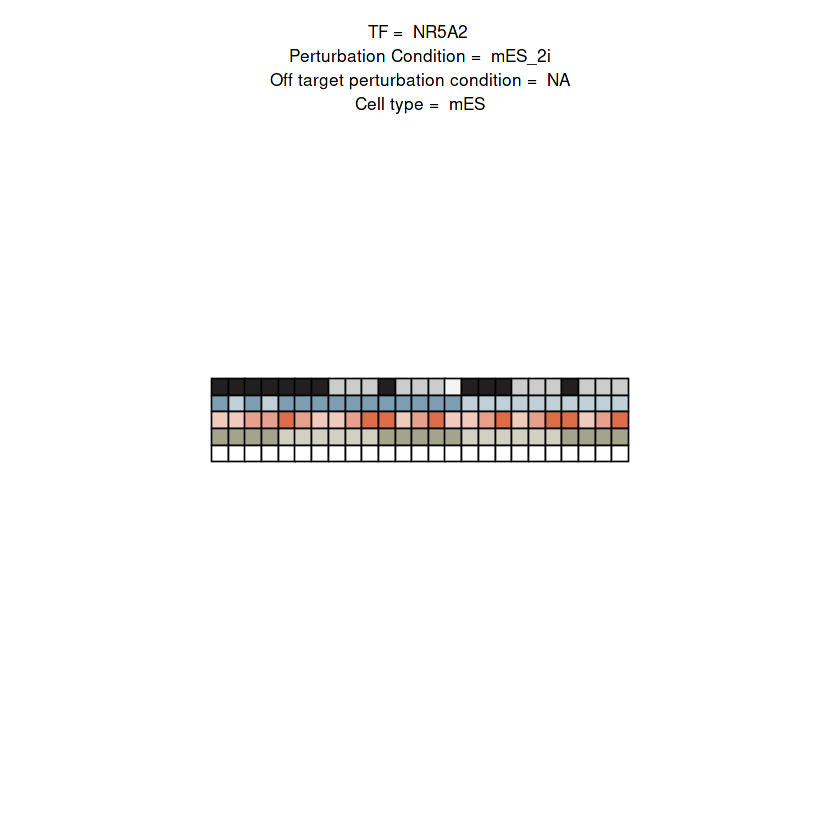

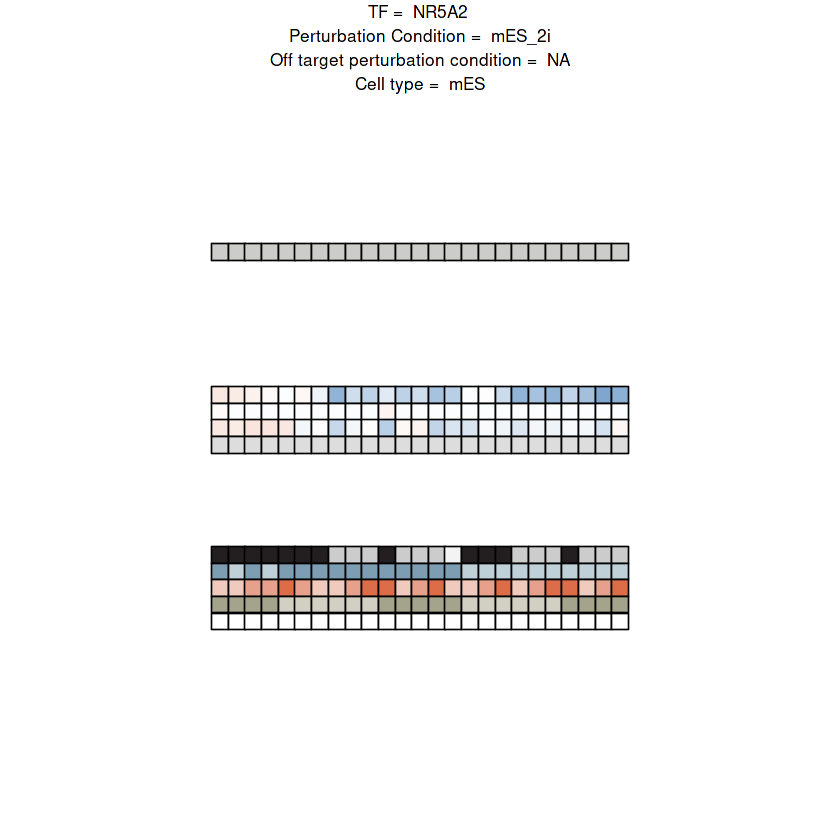

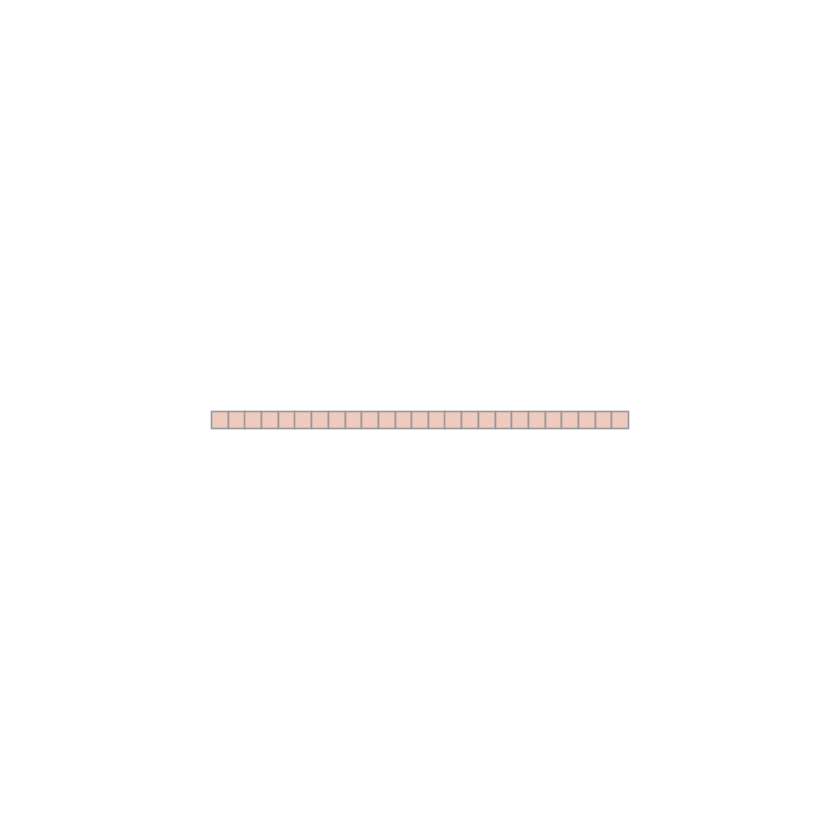

Joining, by = "reporter_id"
Joining, by = "feature"


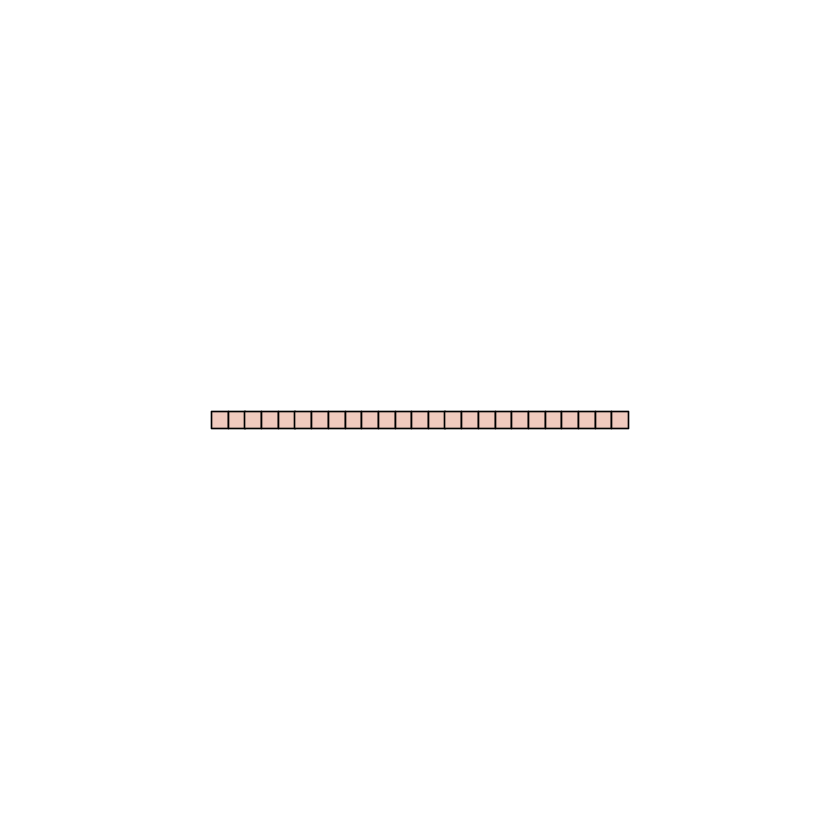

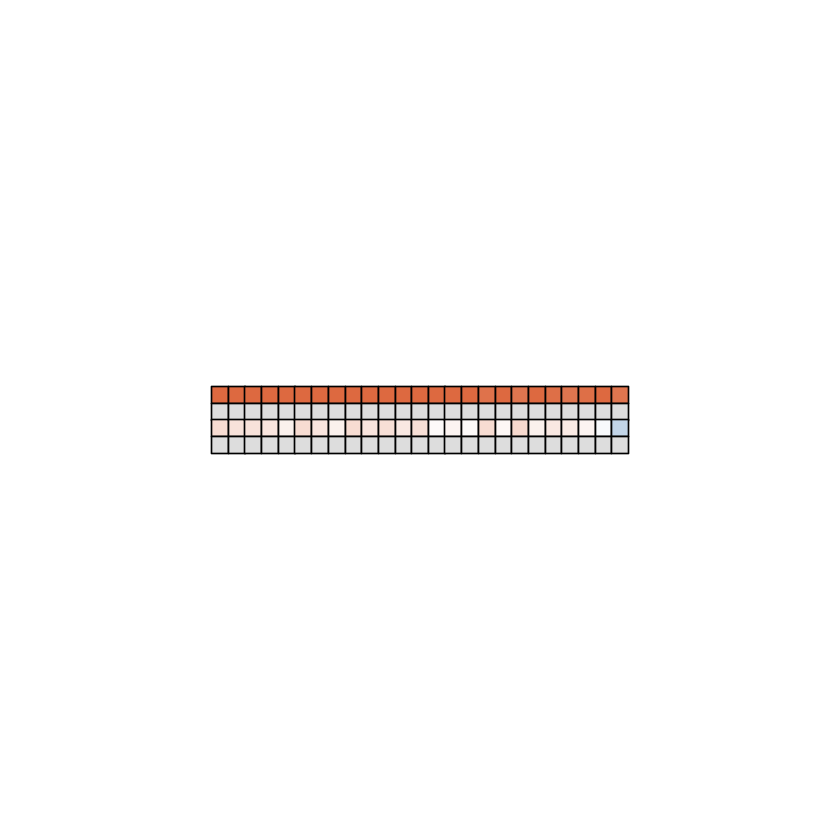

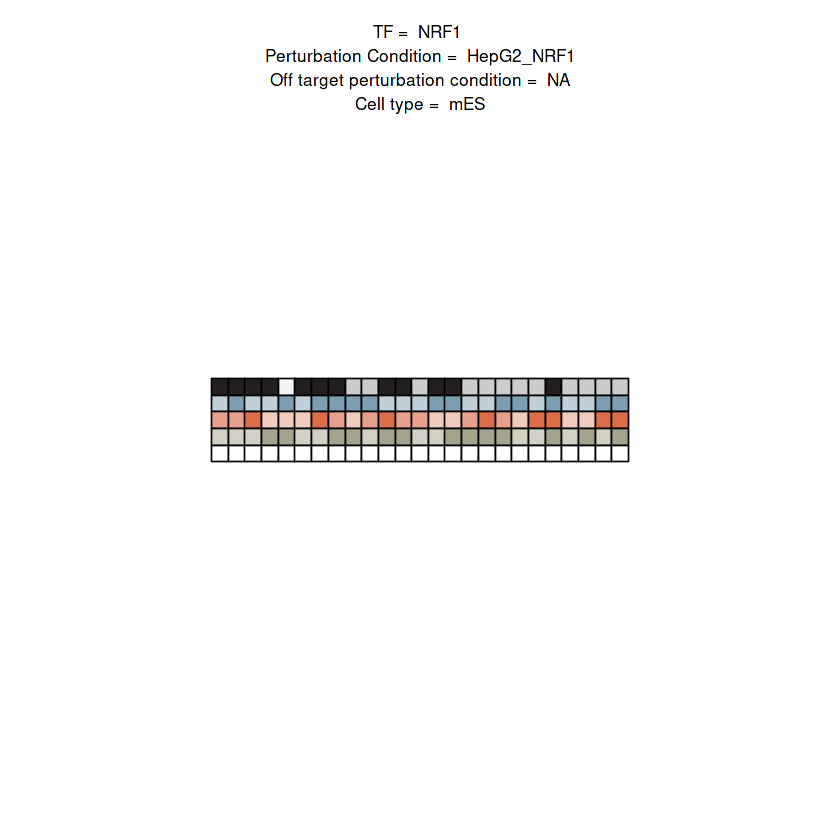

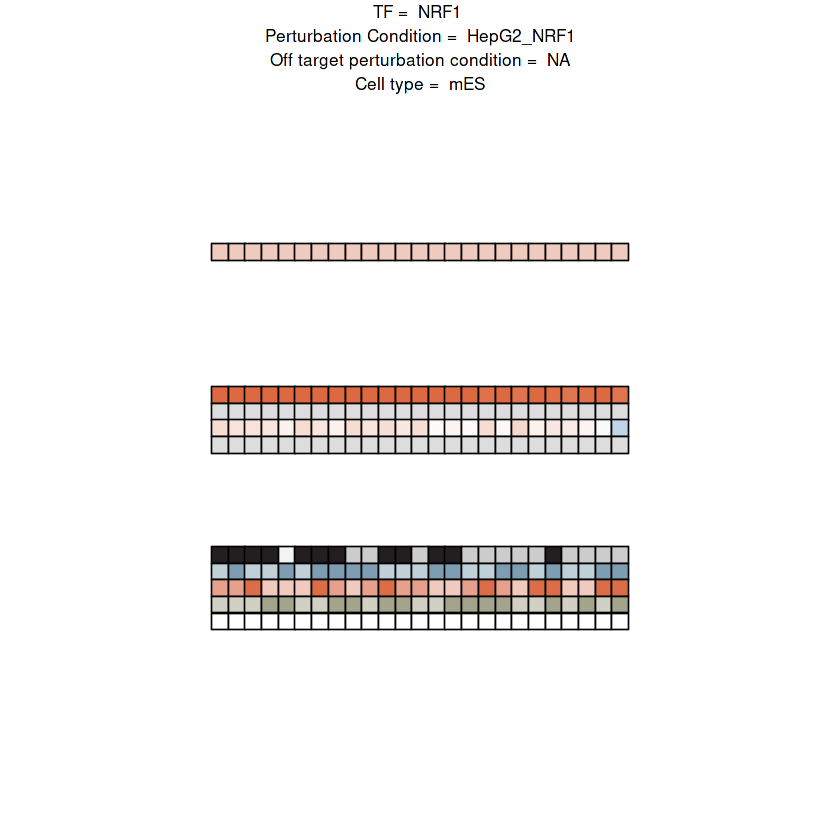

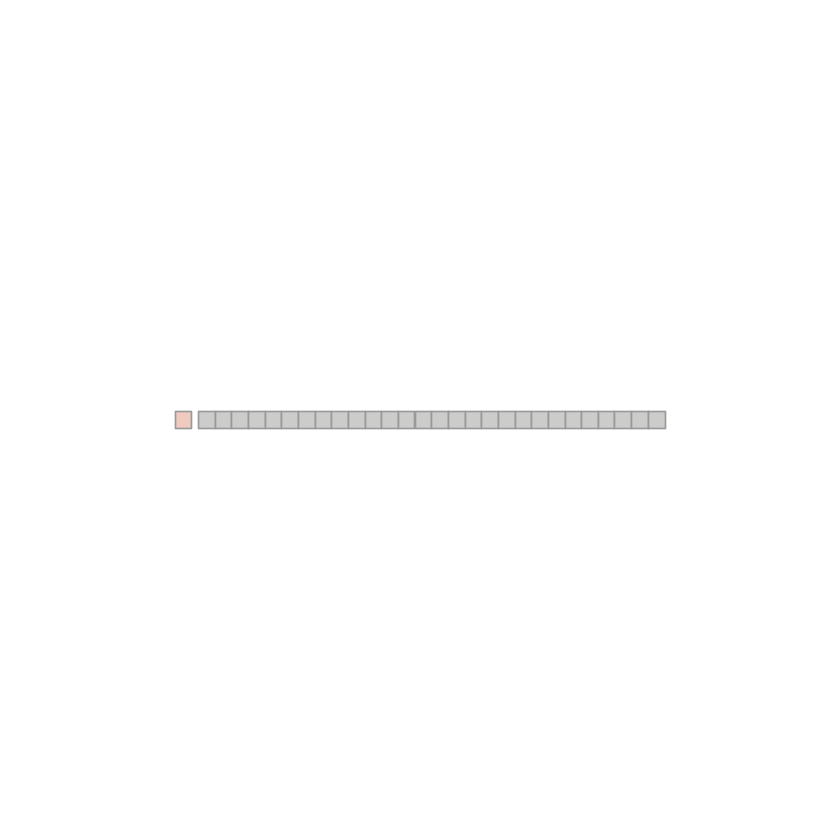

Joining, by = "reporter_id"
Joining, by = "feature"


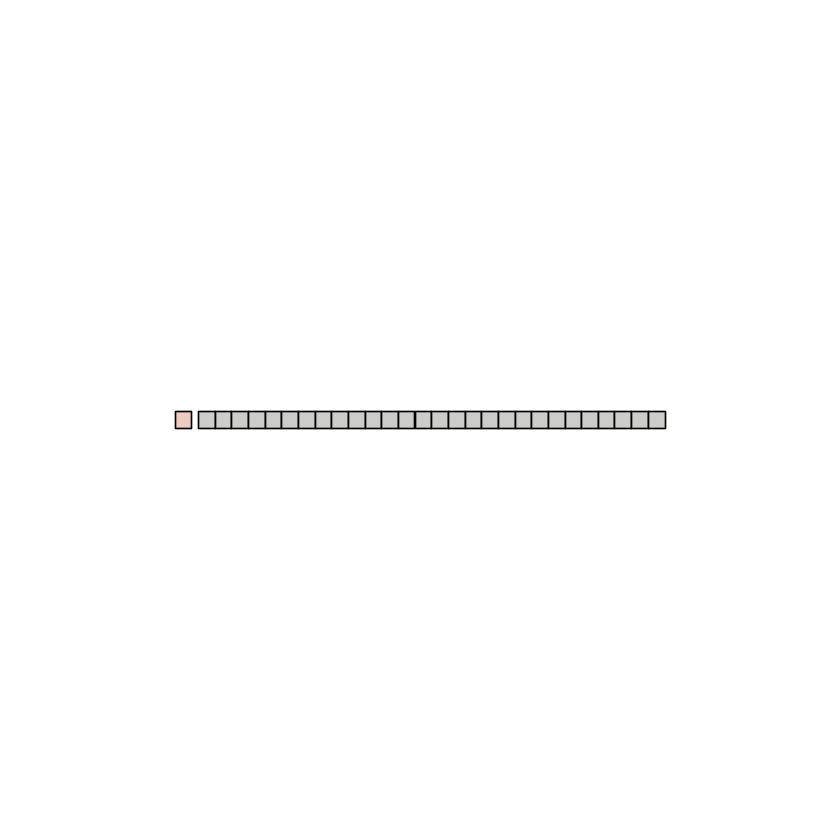

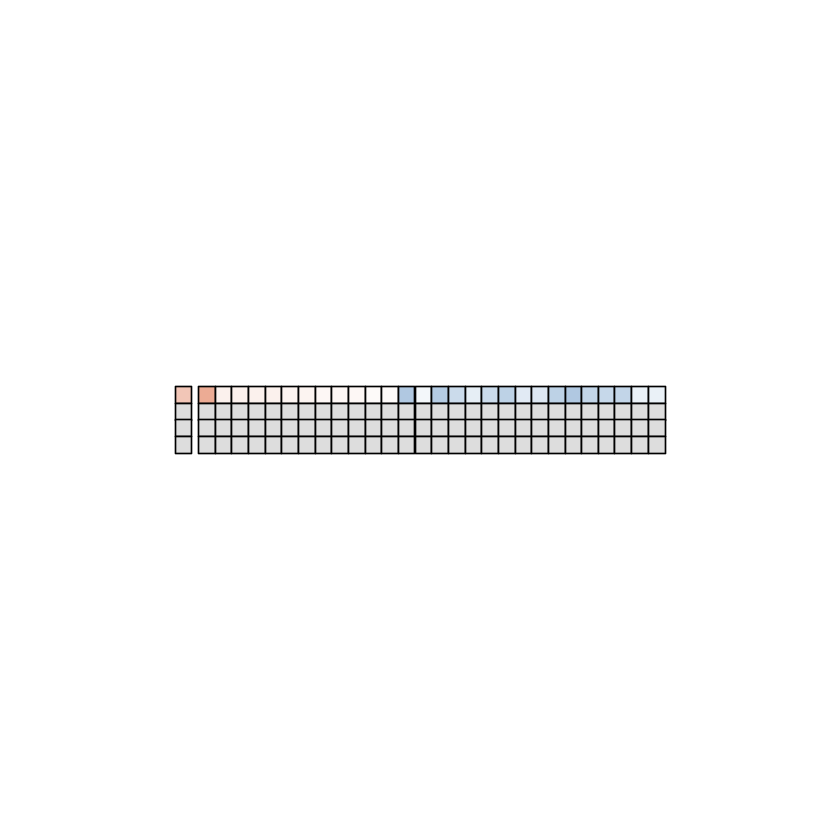

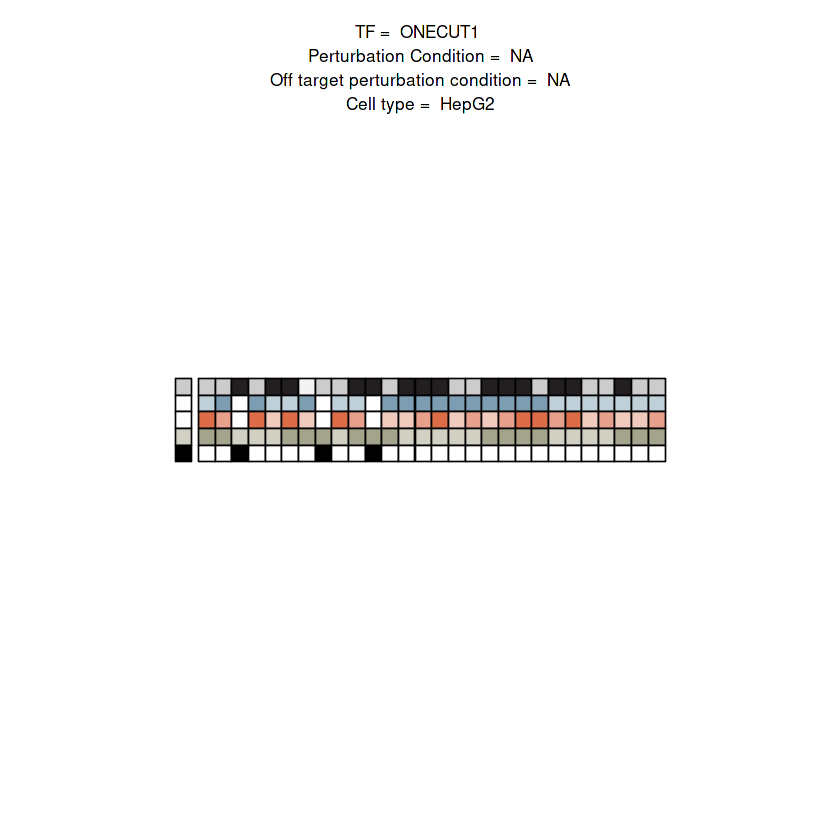

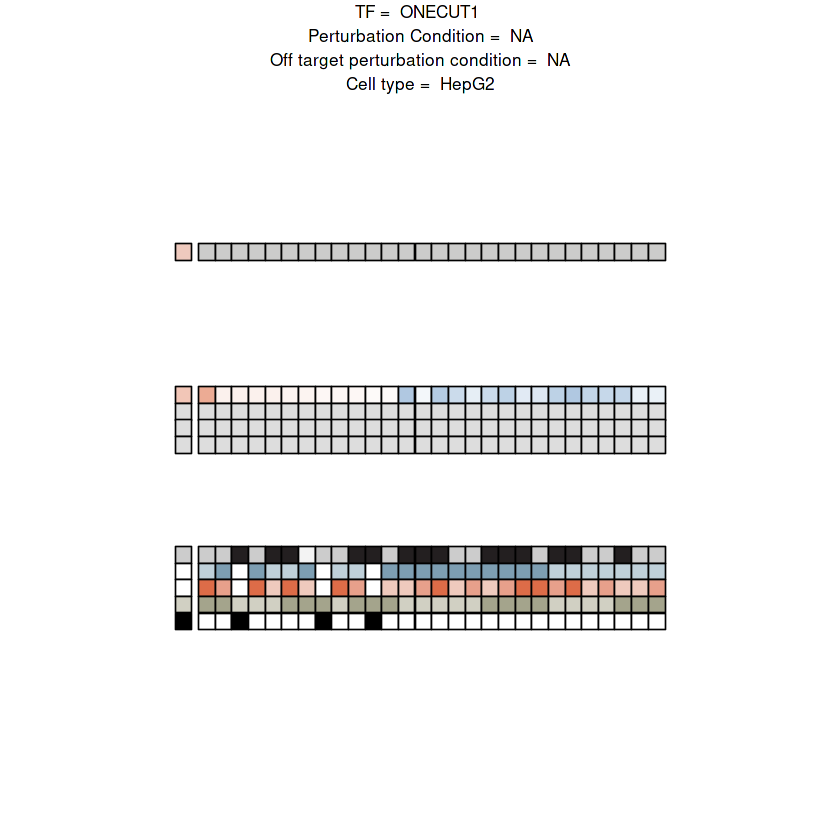

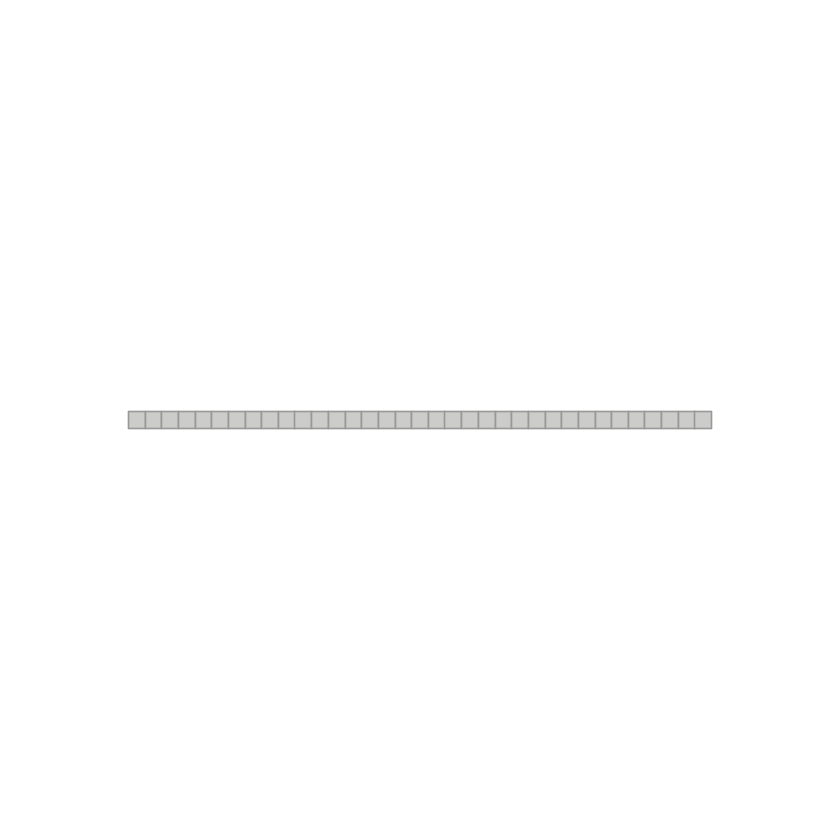

Joining, by = "reporter_id"
Joining, by = "feature"


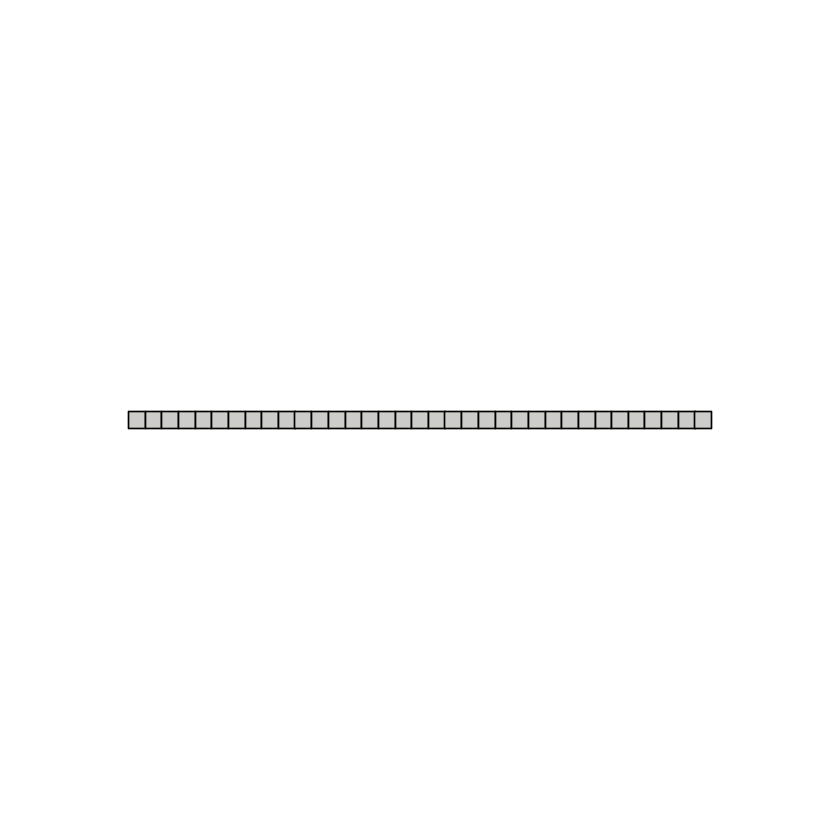

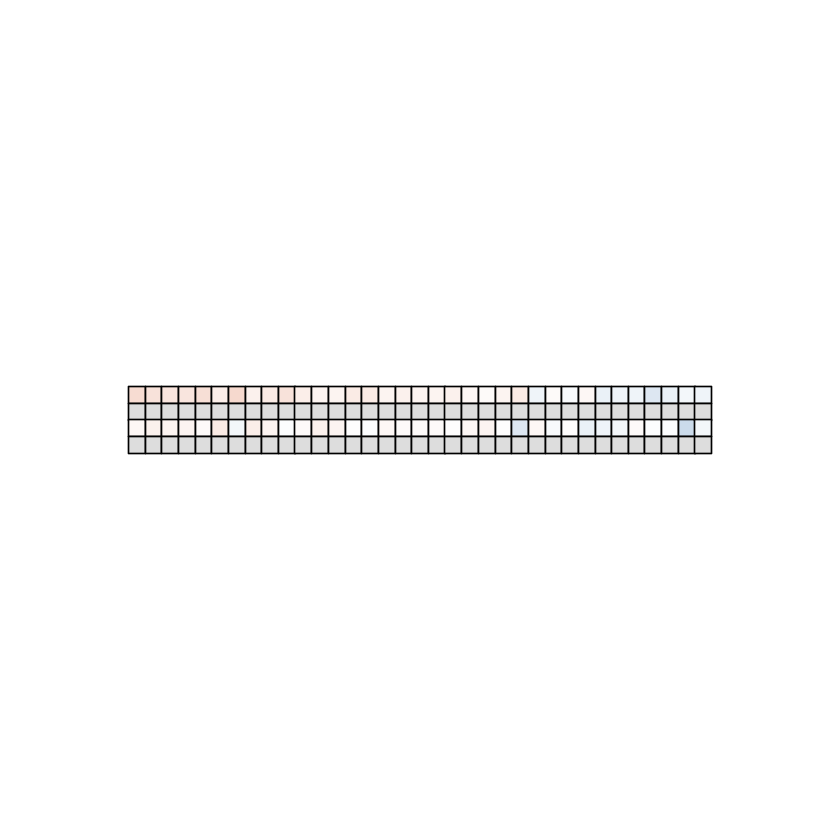

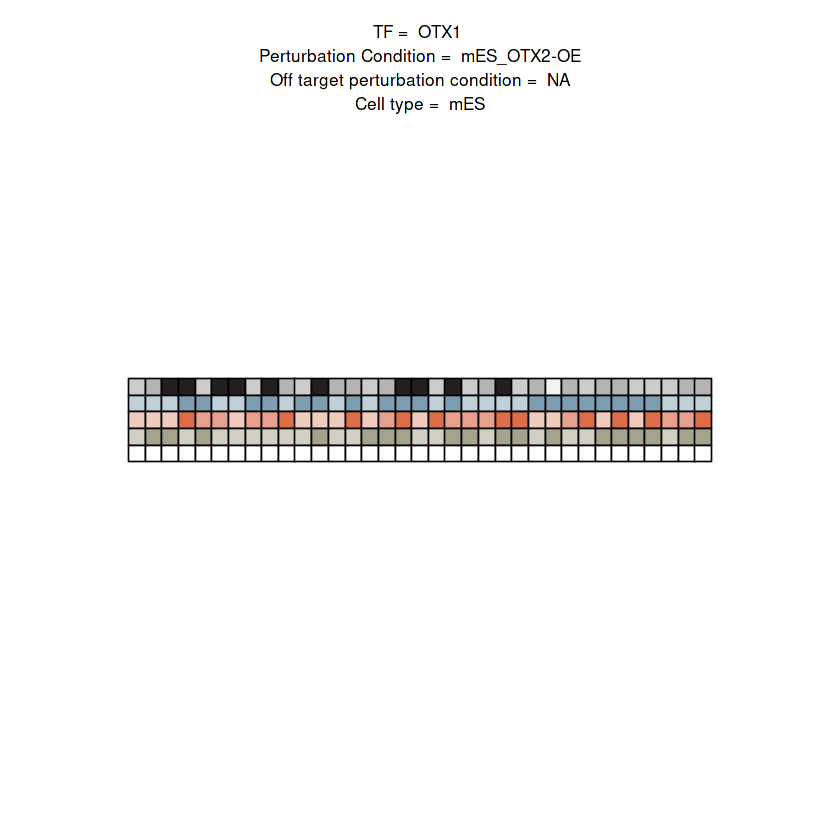

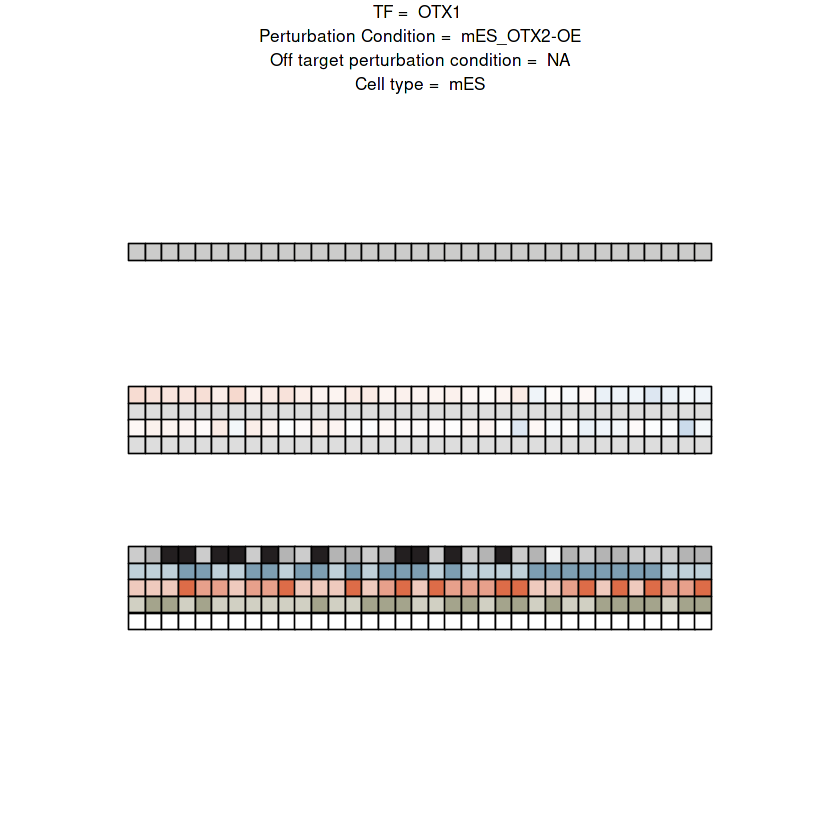

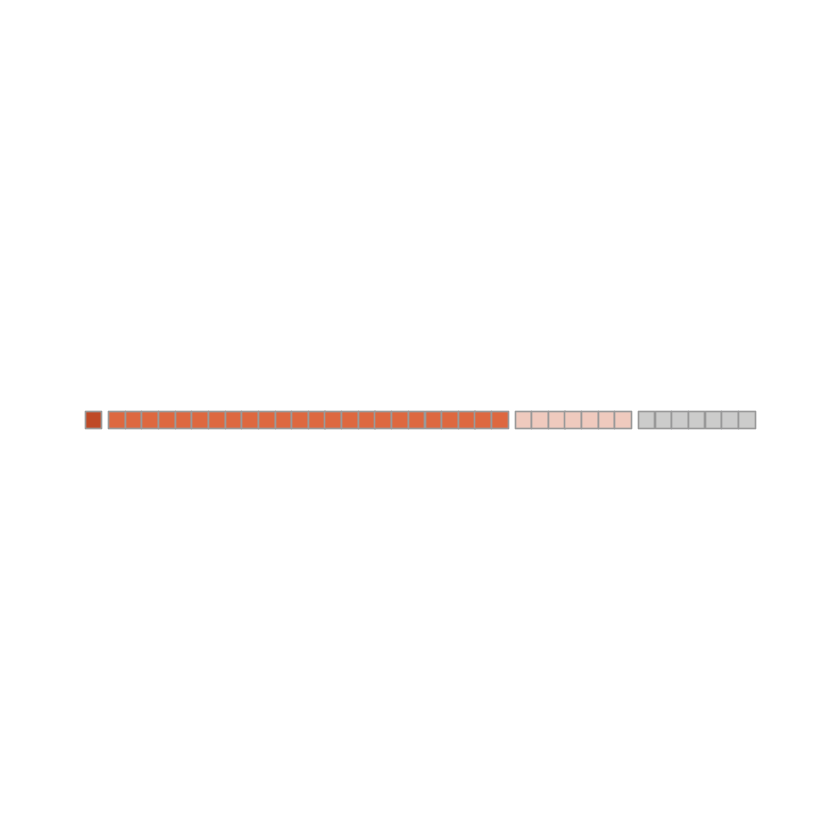

Joining, by = "reporter_id"
Joining, by = "feature"


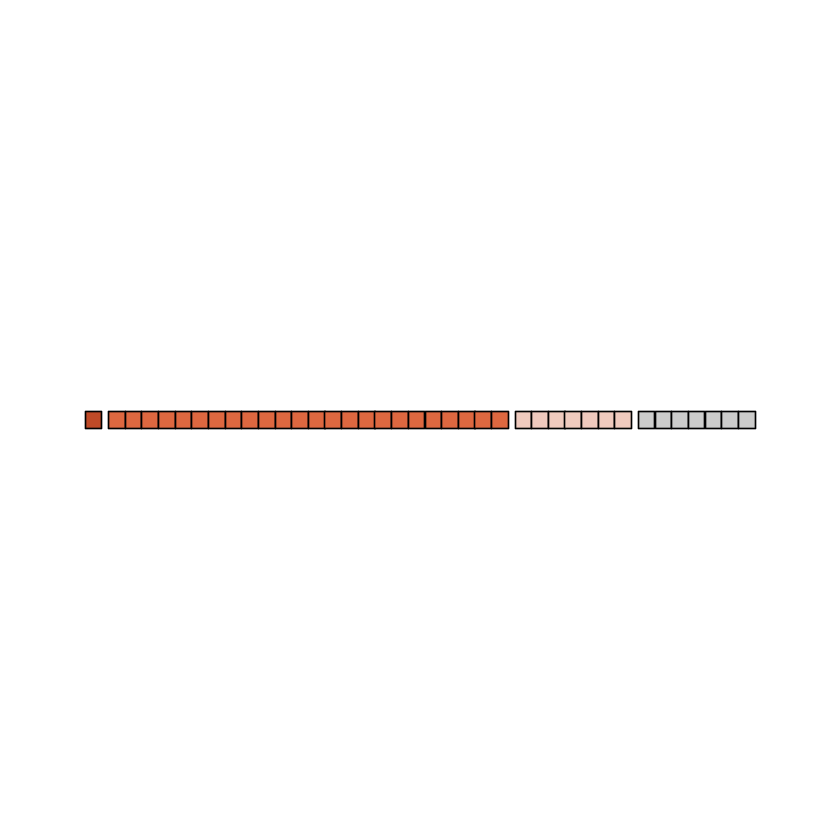

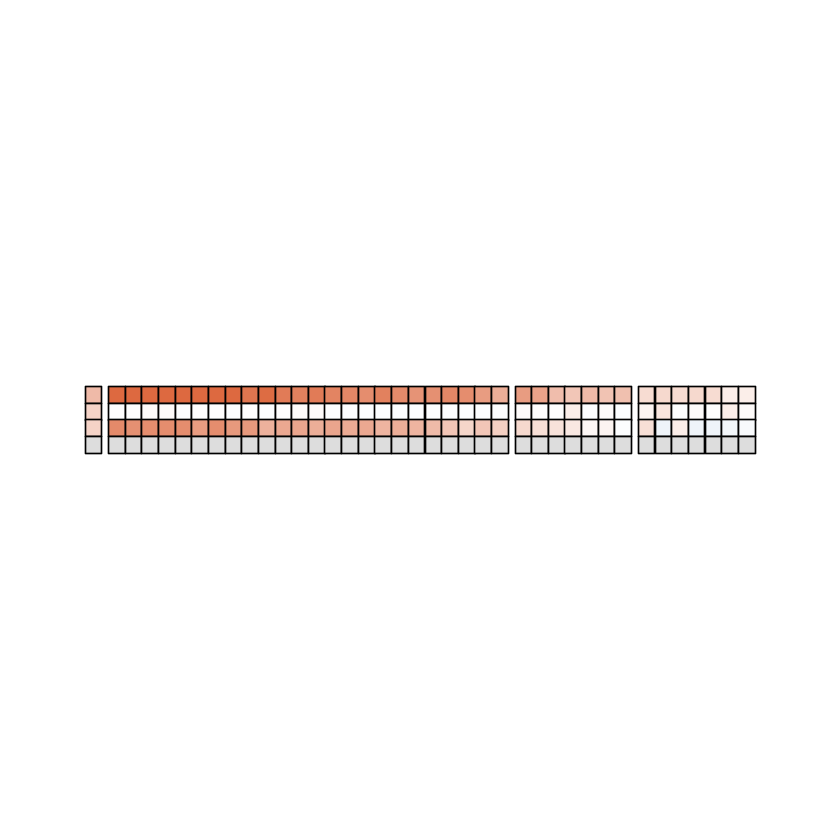

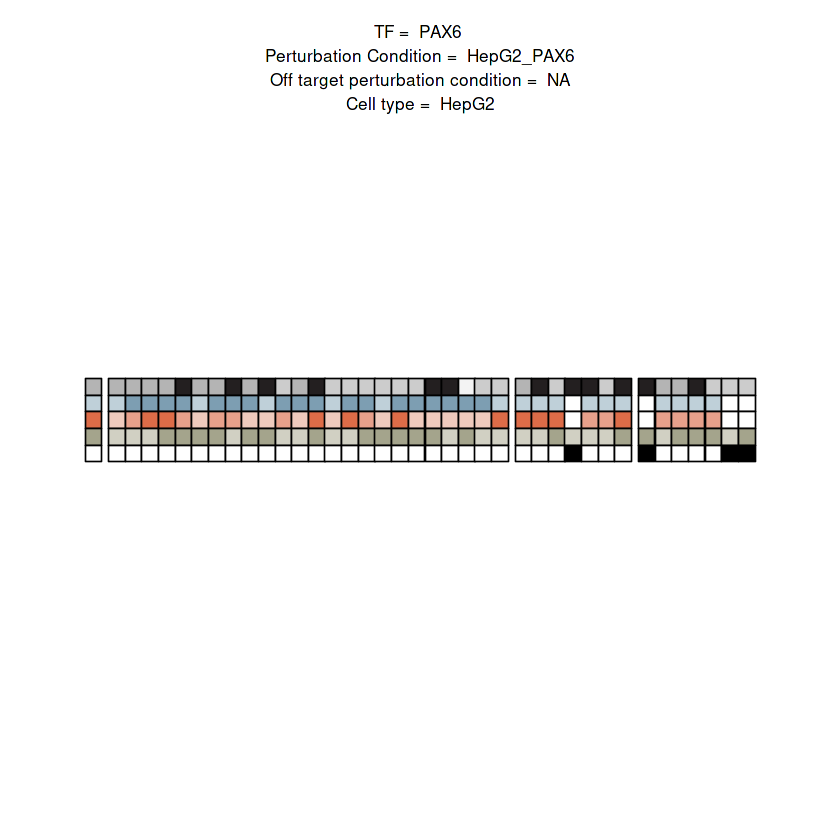

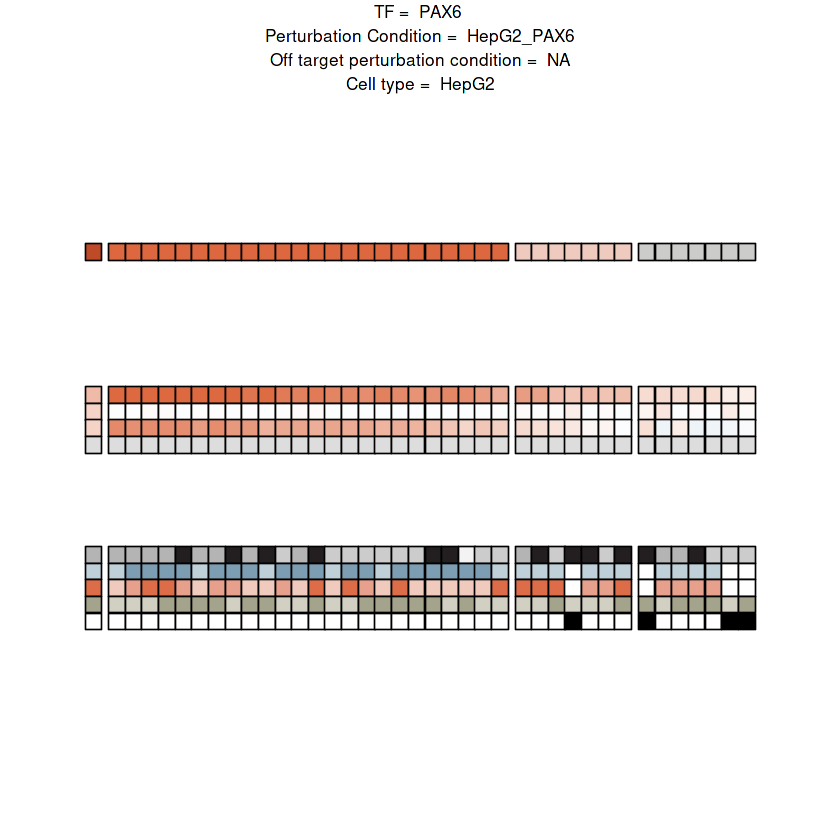

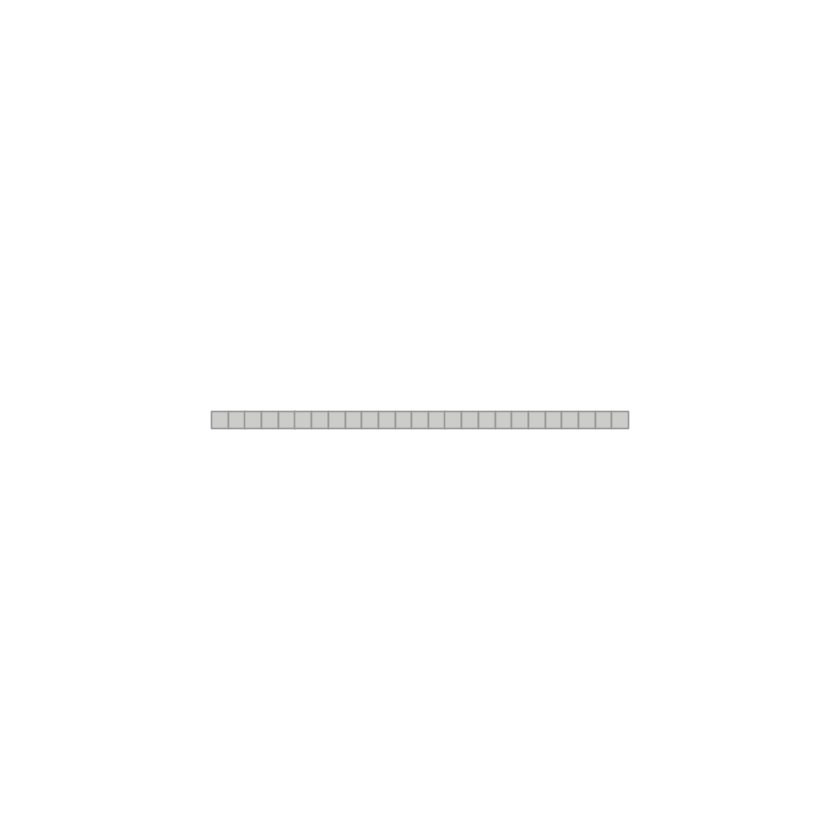

Joining, by = "reporter_id"
Joining, by = "feature"


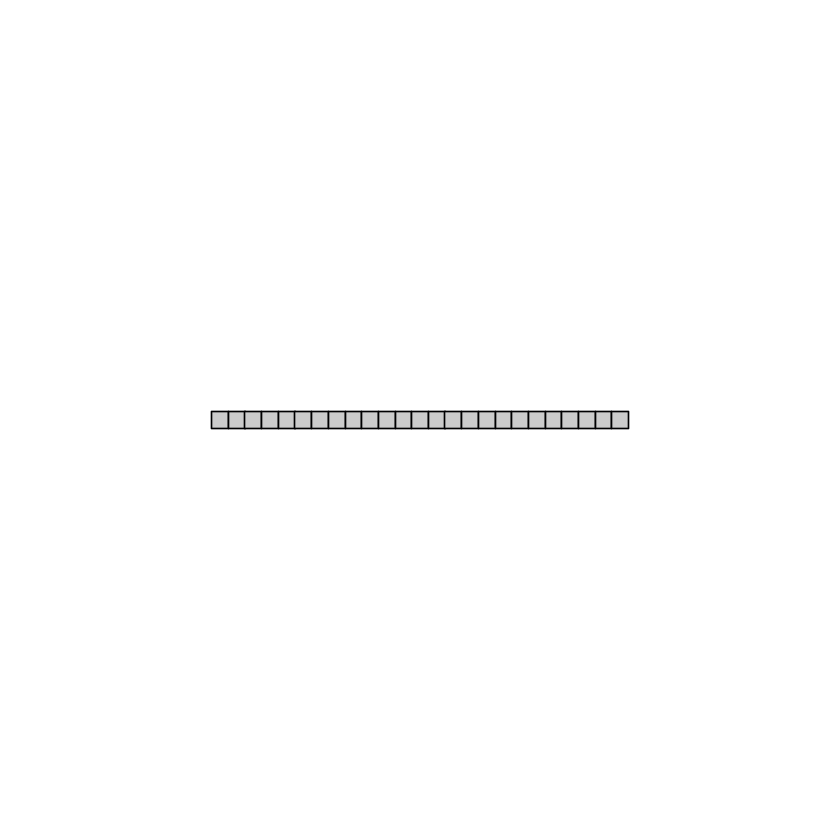

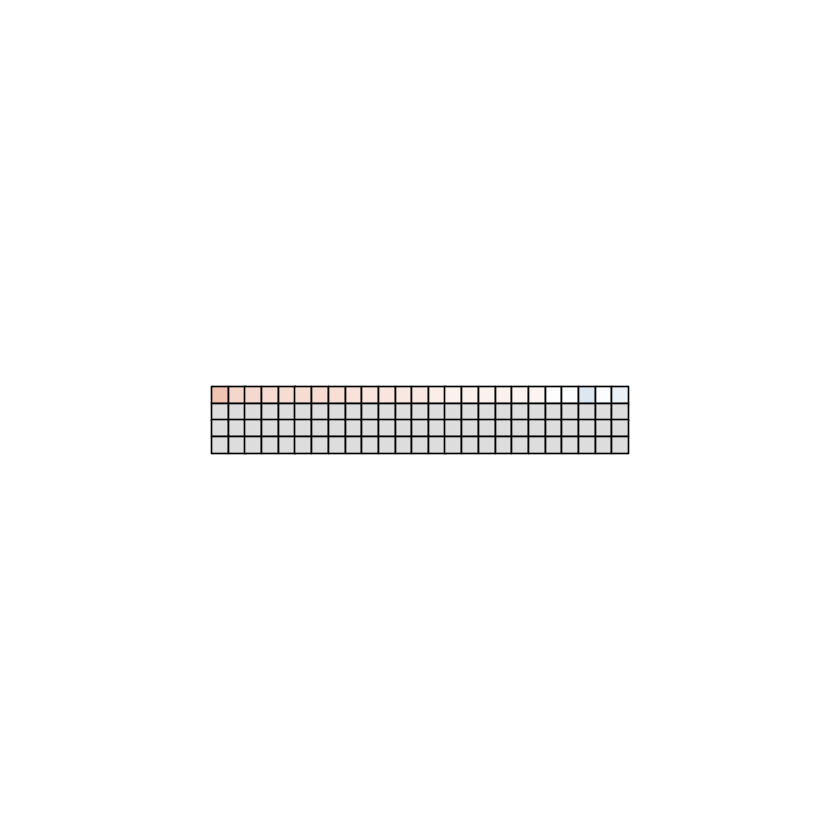

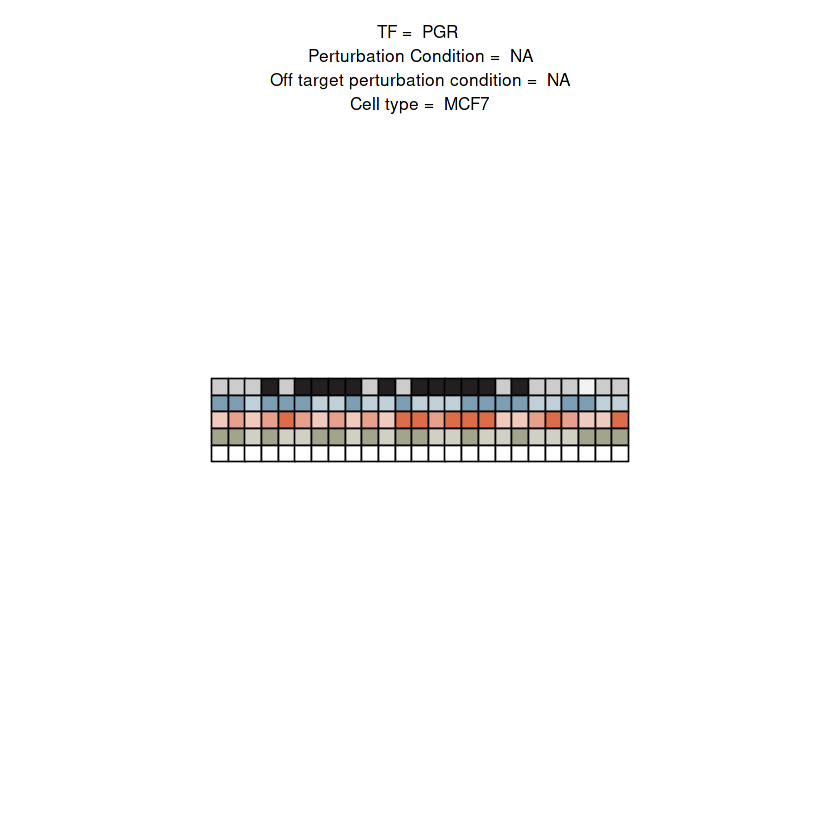

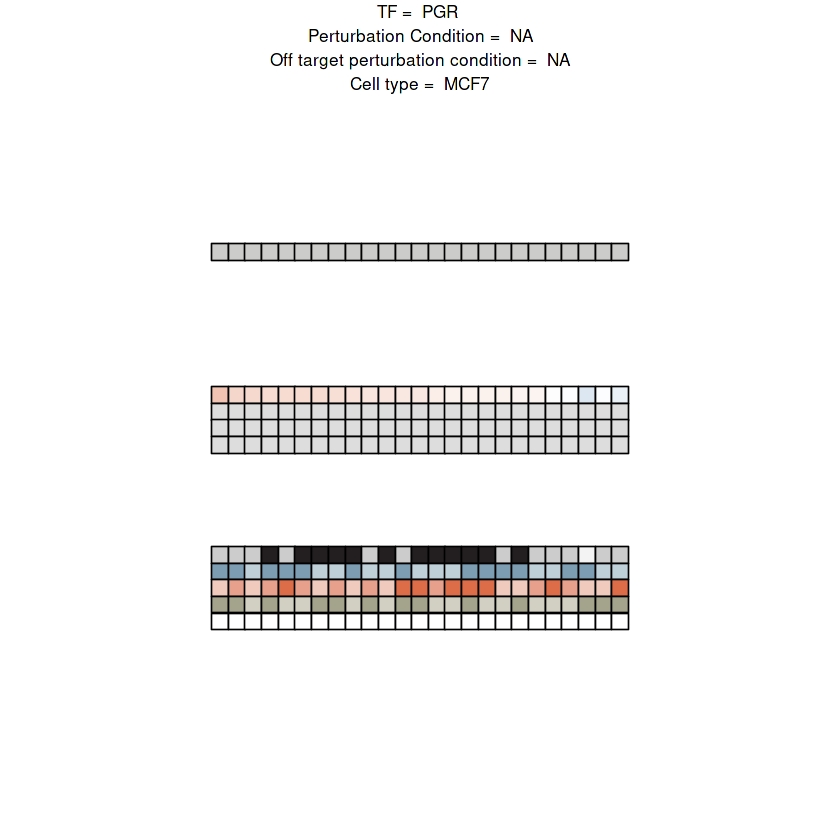

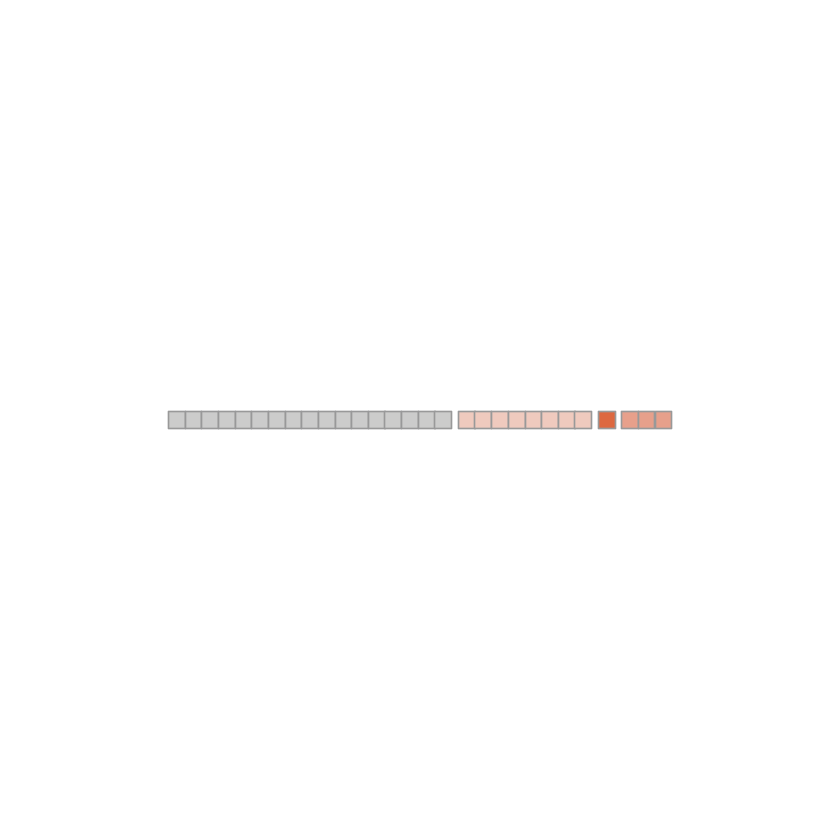

Joining, by = "reporter_id"
Joining, by = "feature"


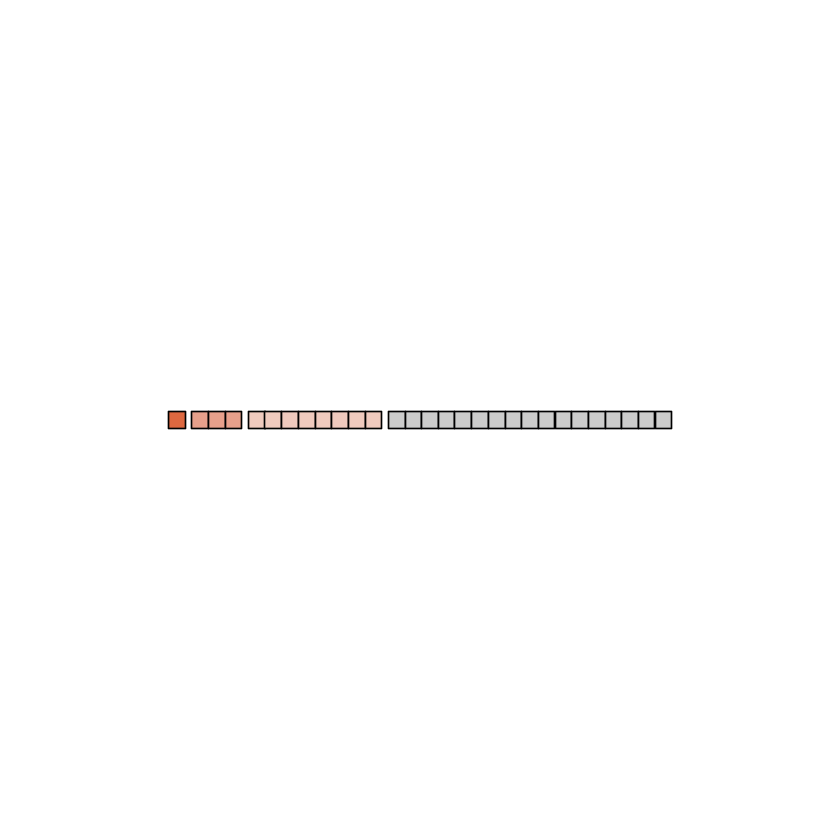

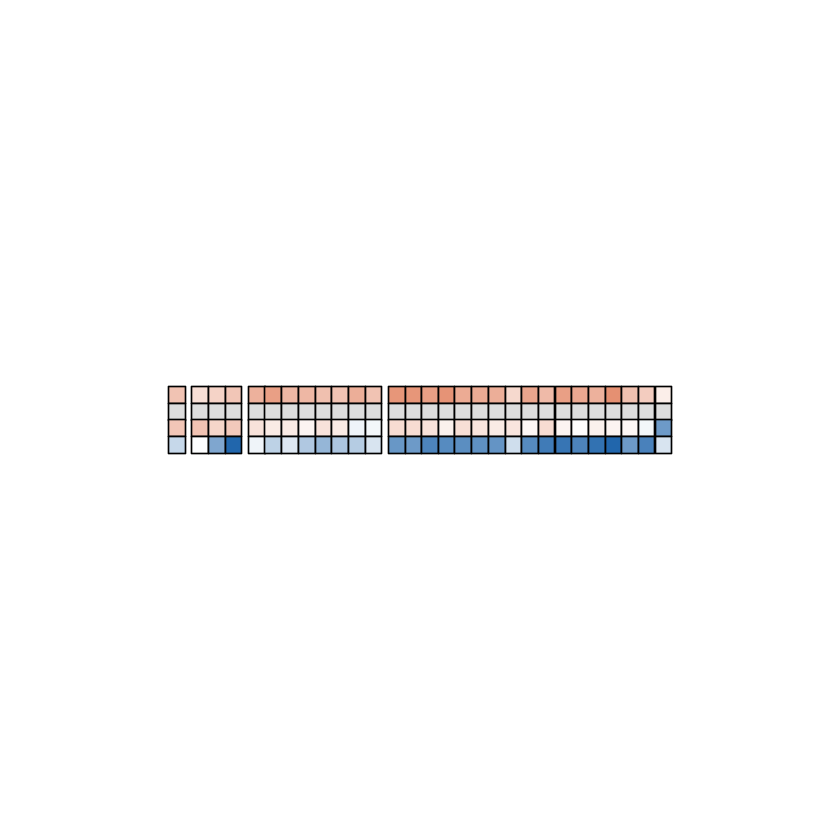

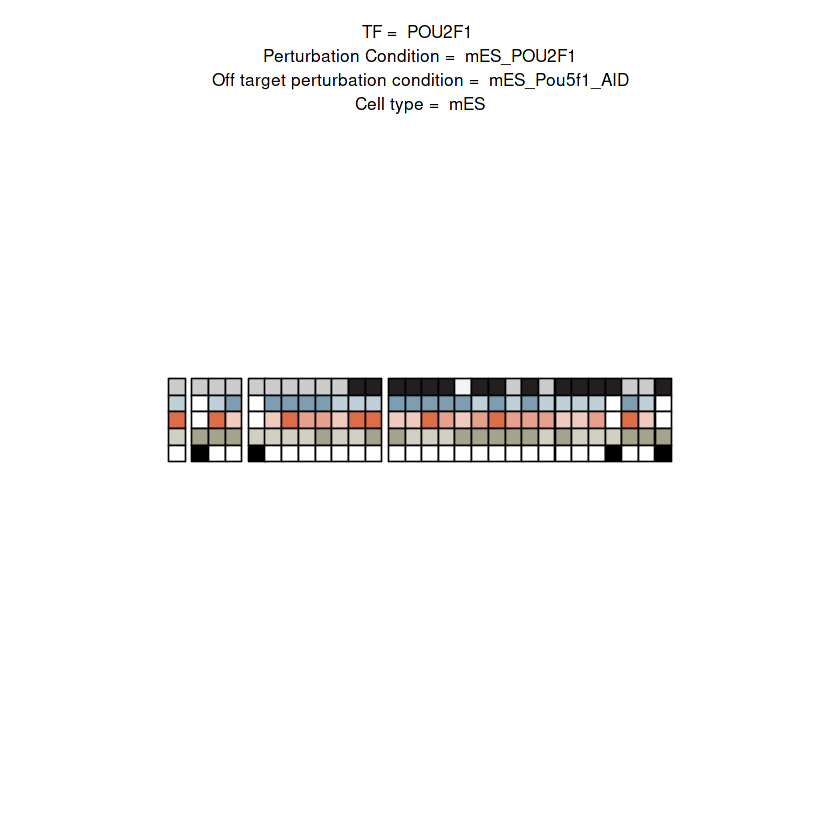

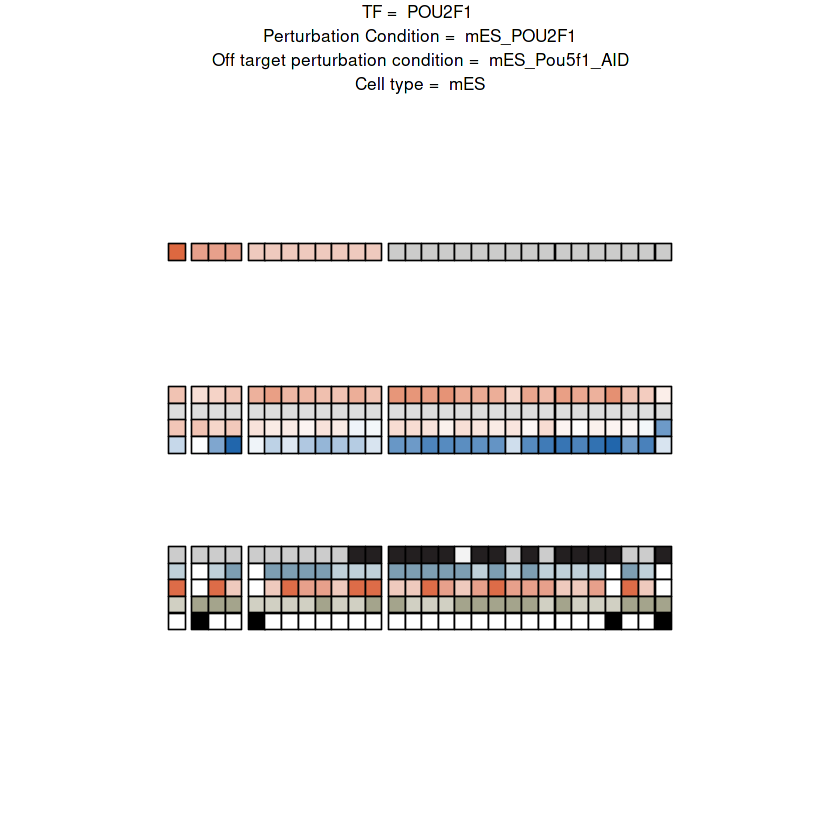

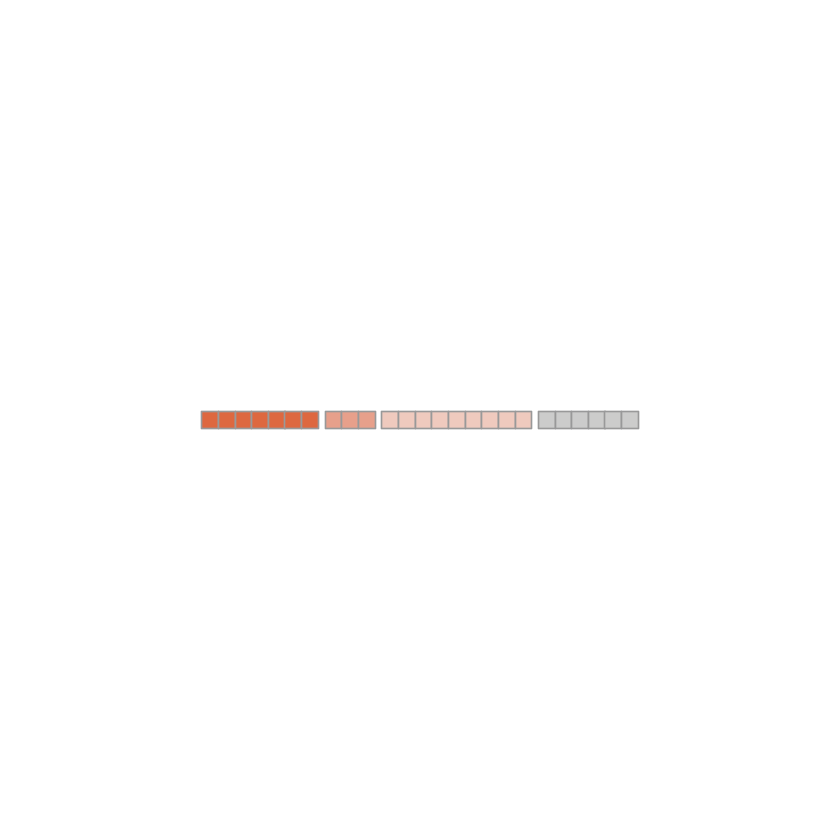

Joining, by = "reporter_id"
Joining, by = "feature"


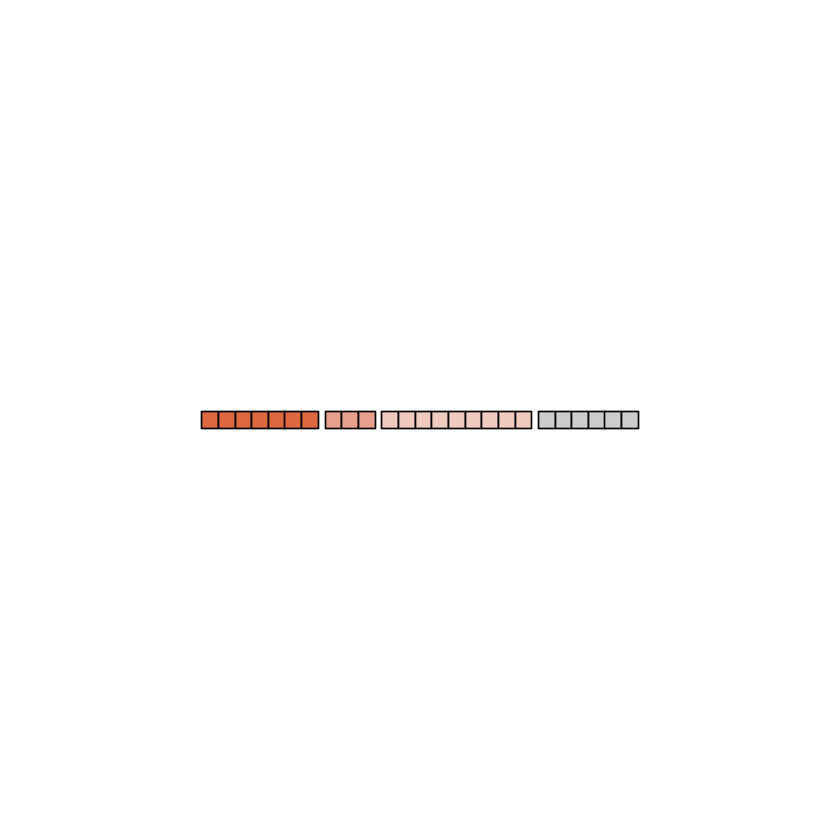

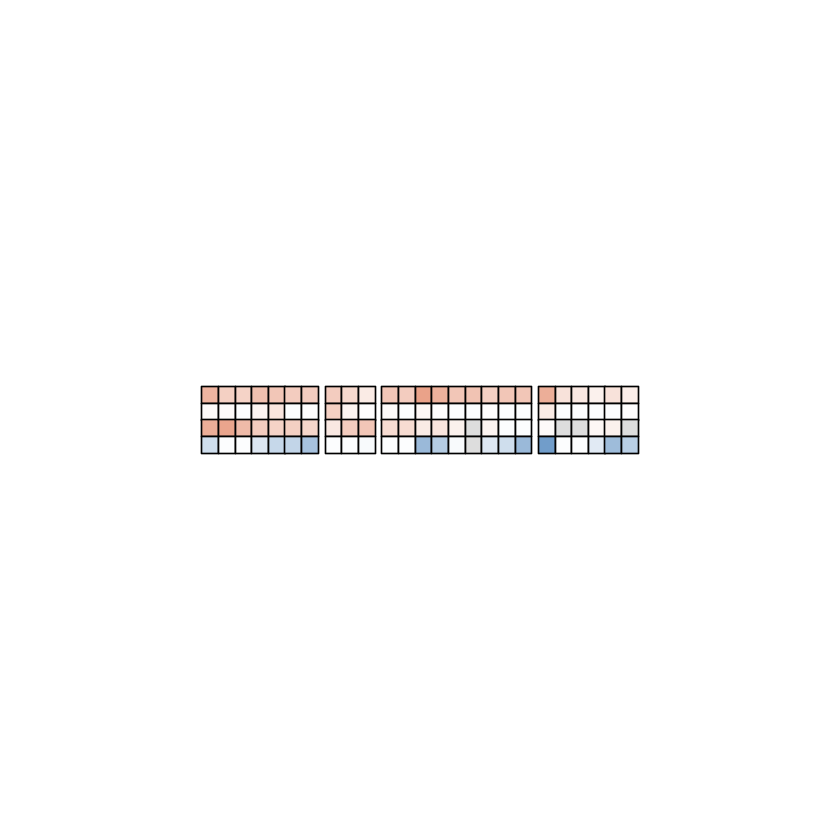

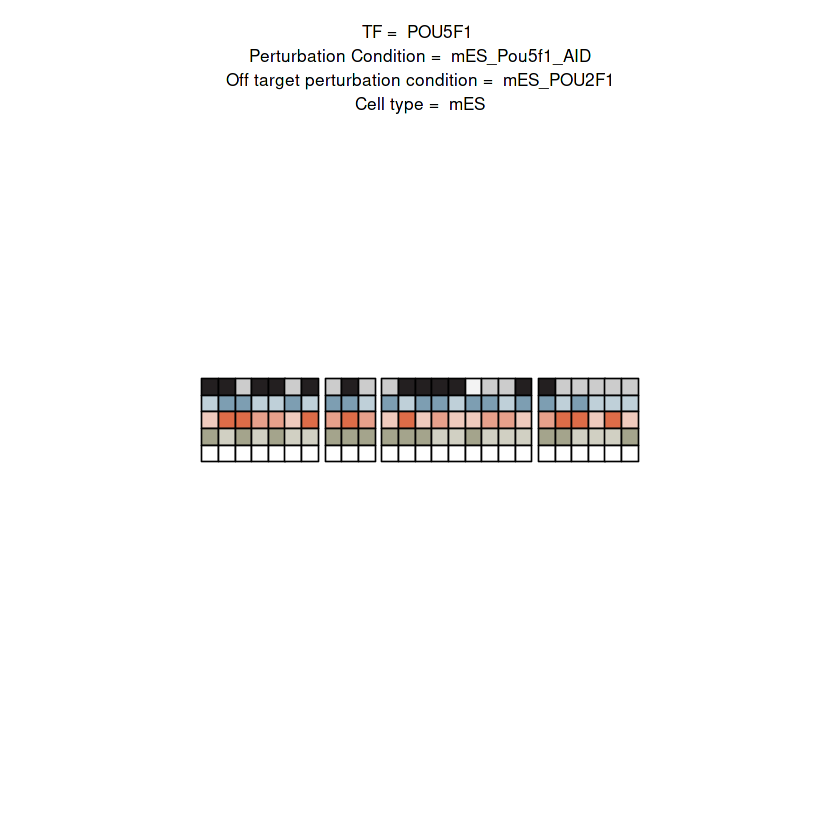

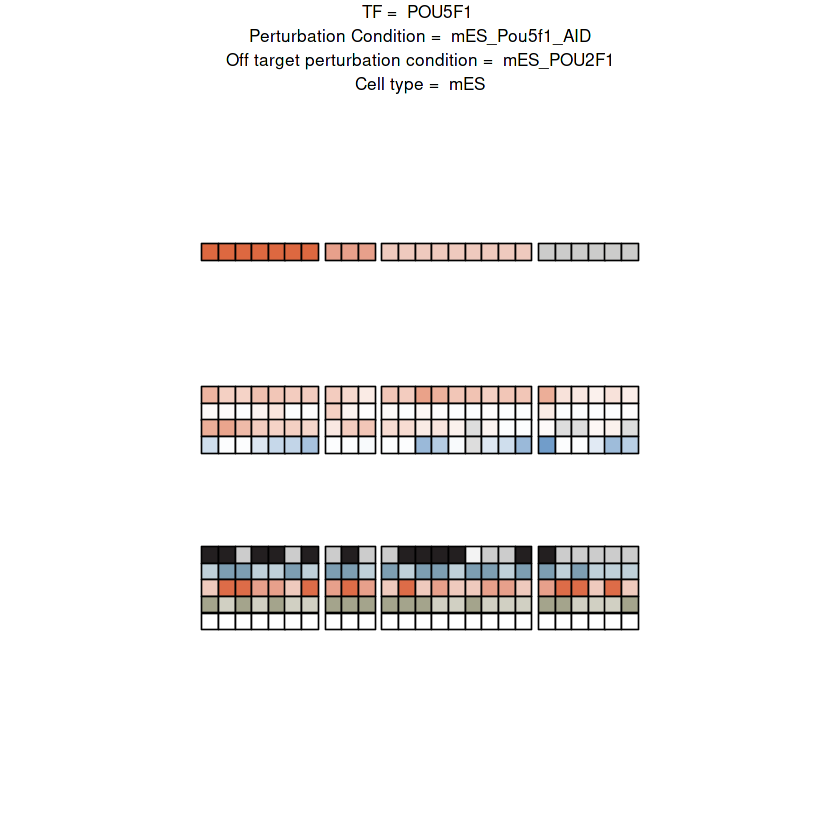

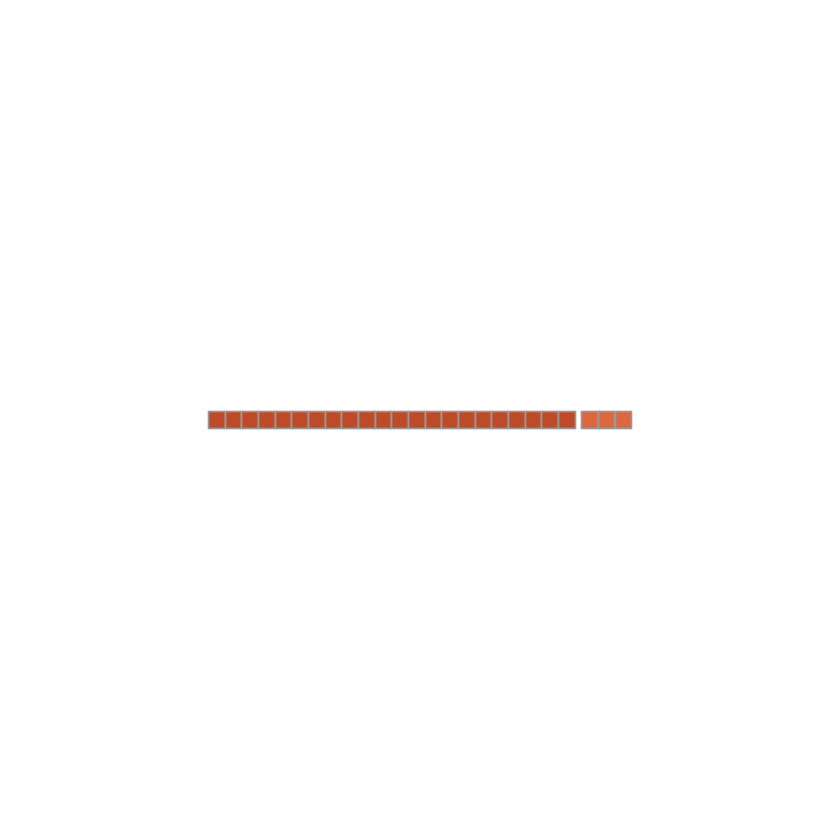

Joining, by = "reporter_id"
Joining, by = "feature"


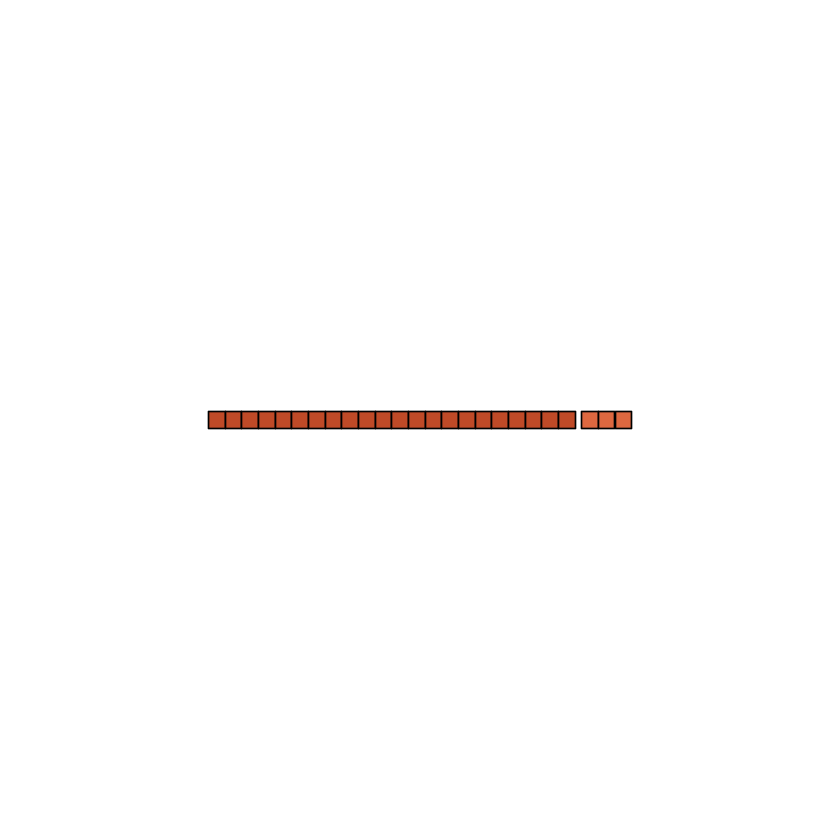

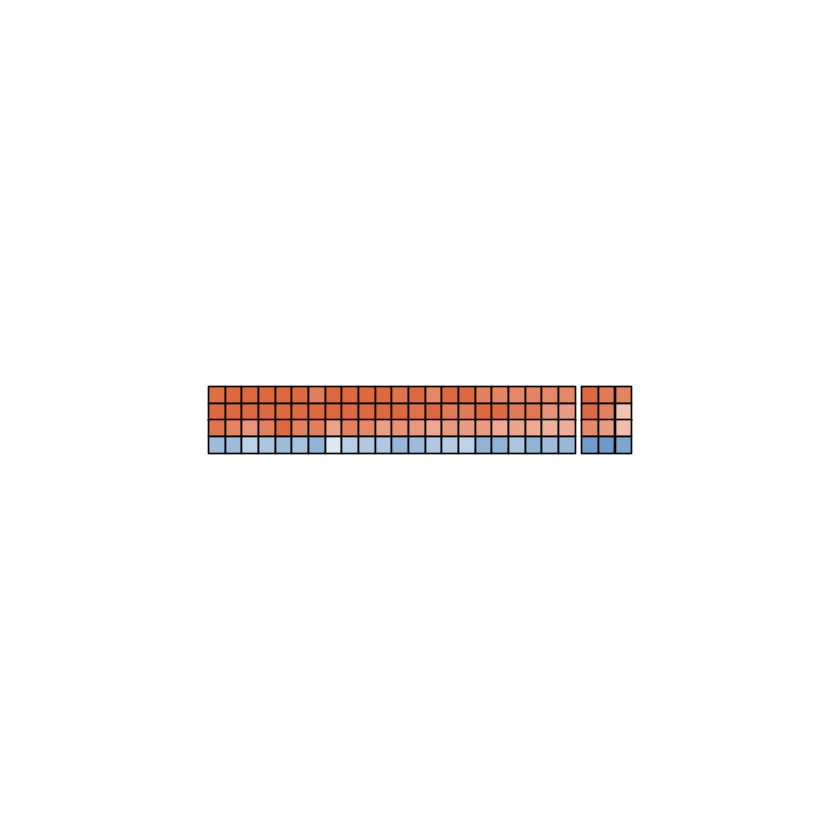

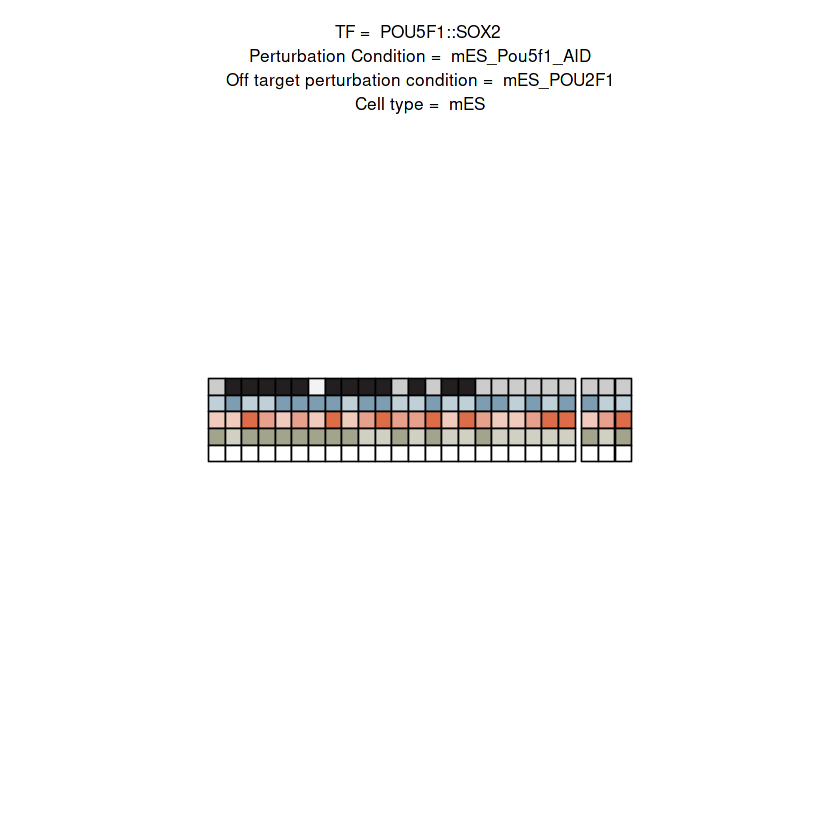

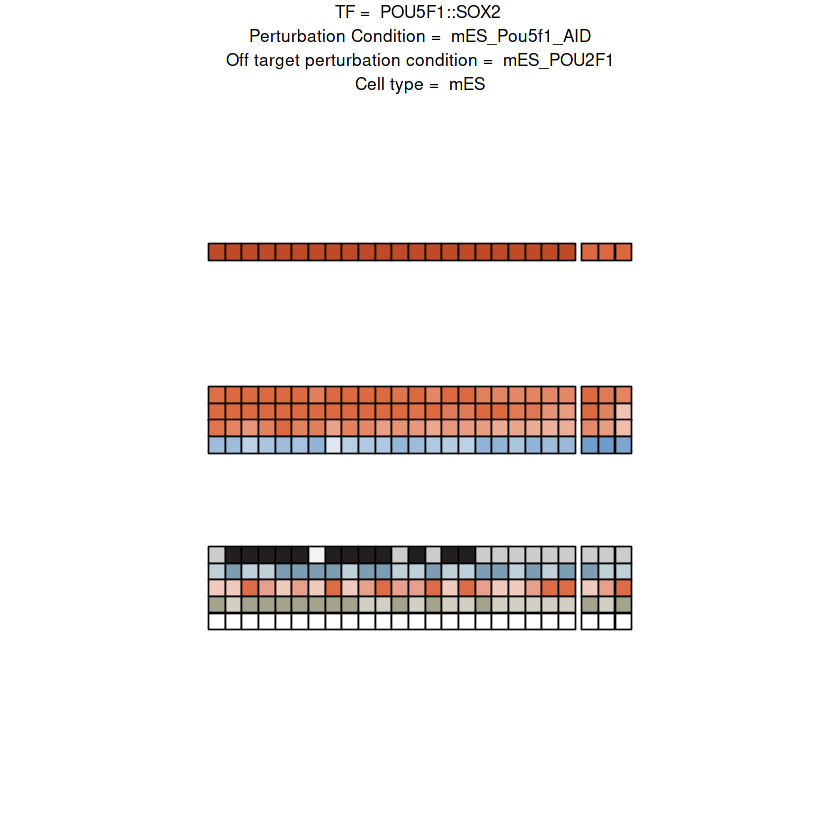

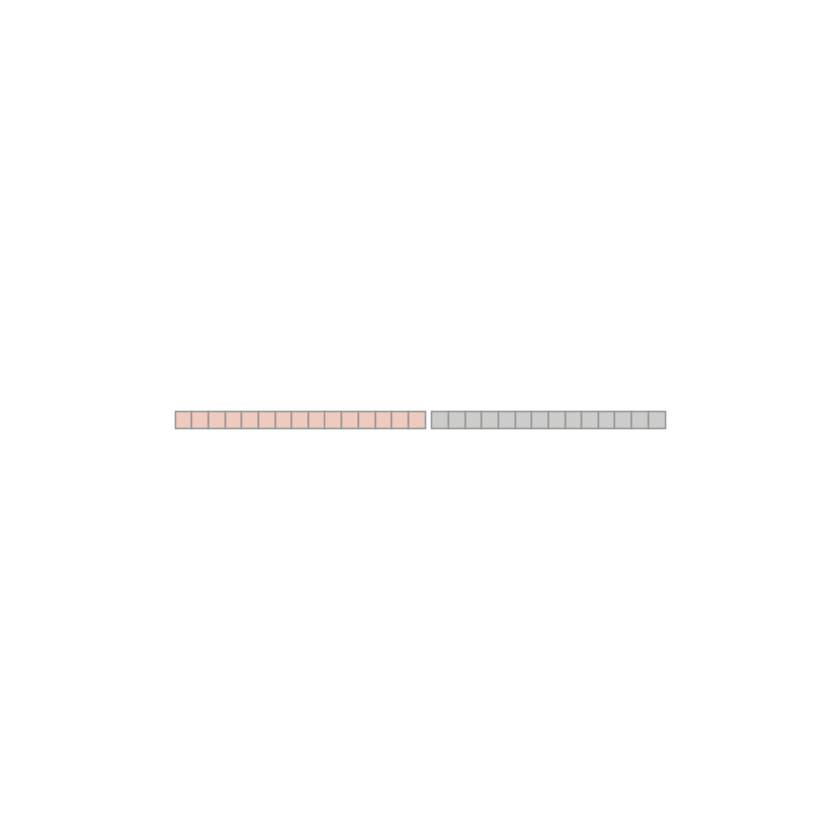

Joining, by = "reporter_id"
Joining, by = "feature"


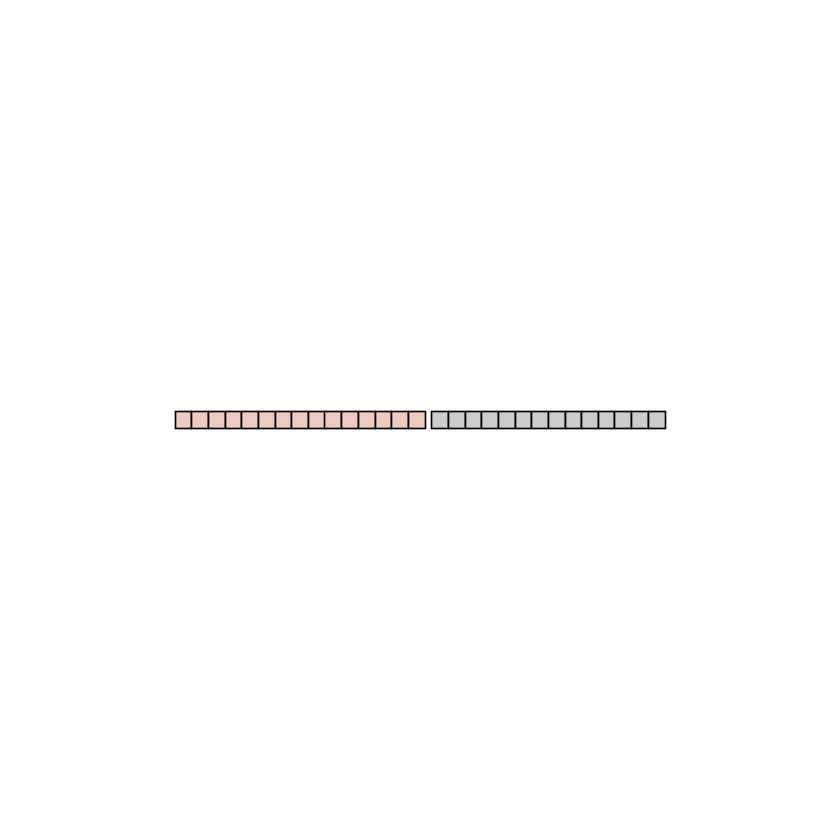

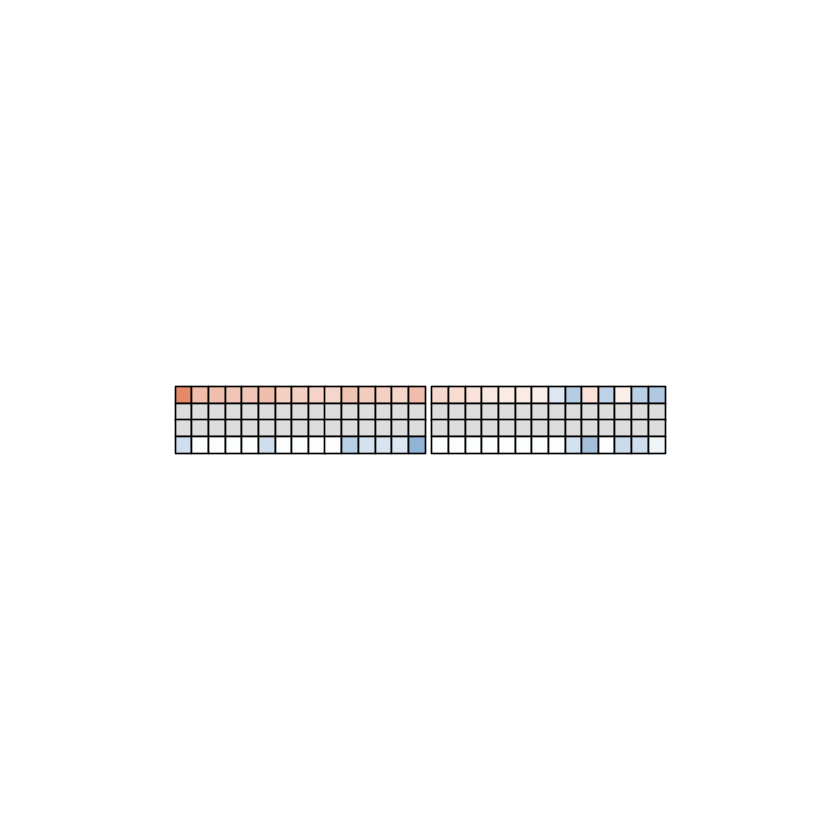

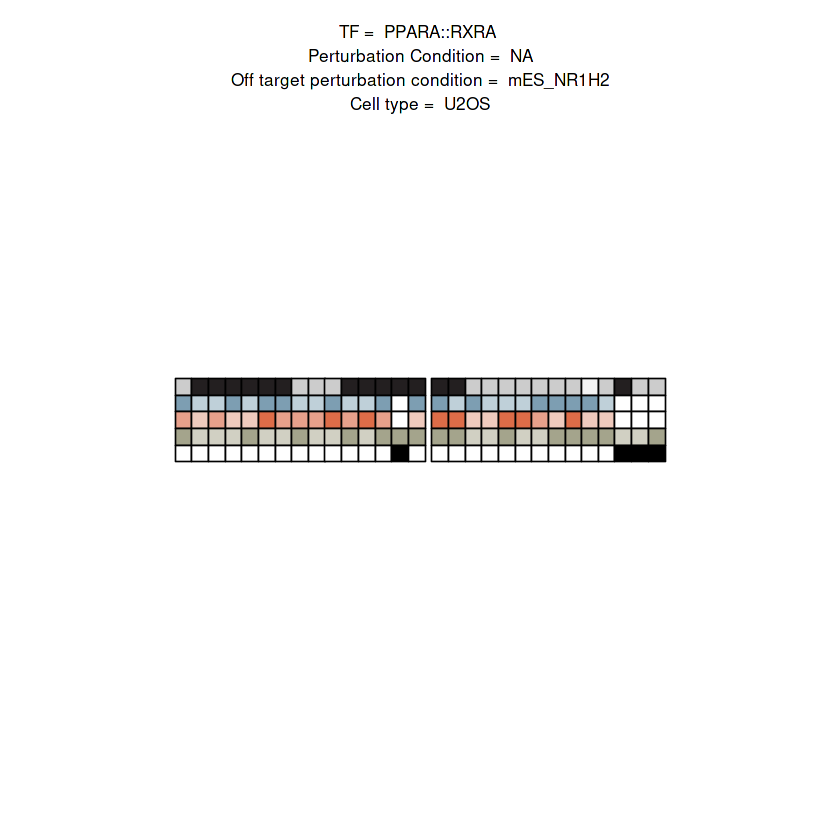

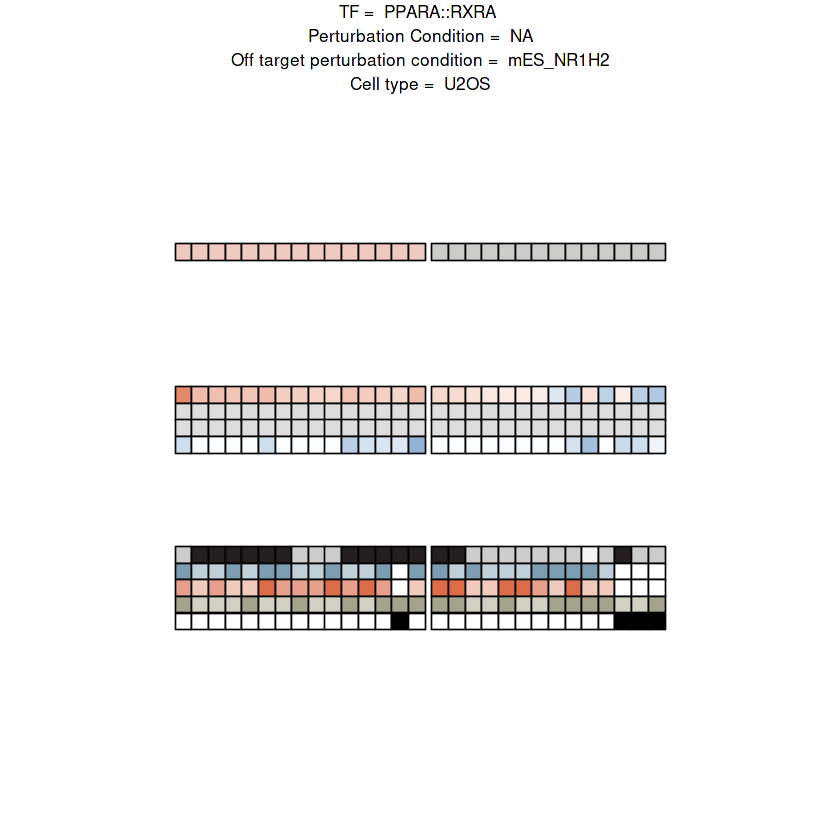

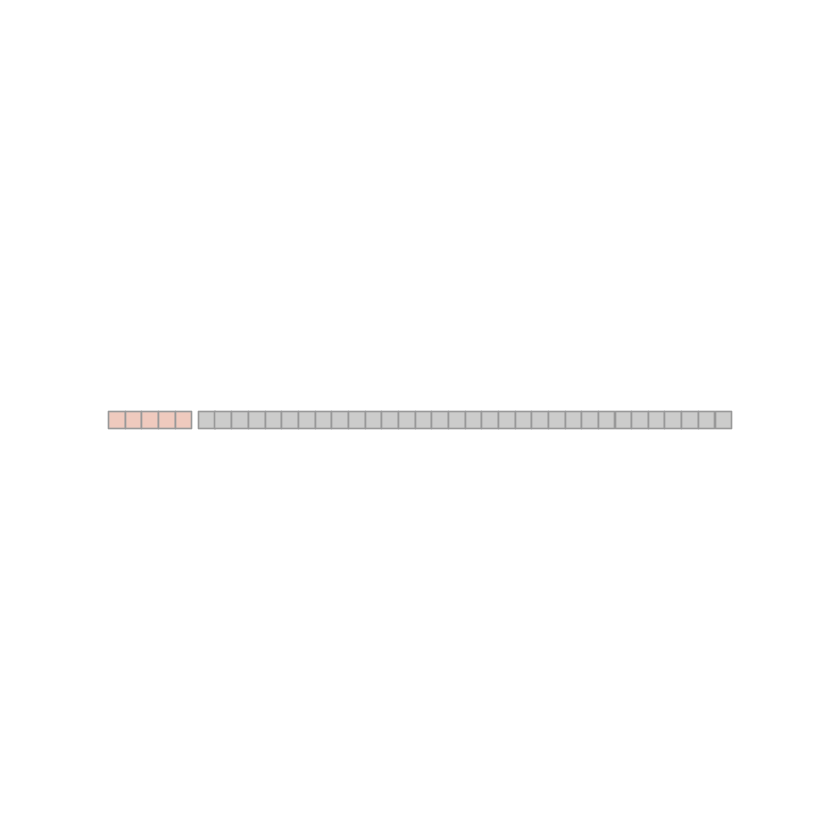

Joining, by = "reporter_id"
Joining, by = "feature"


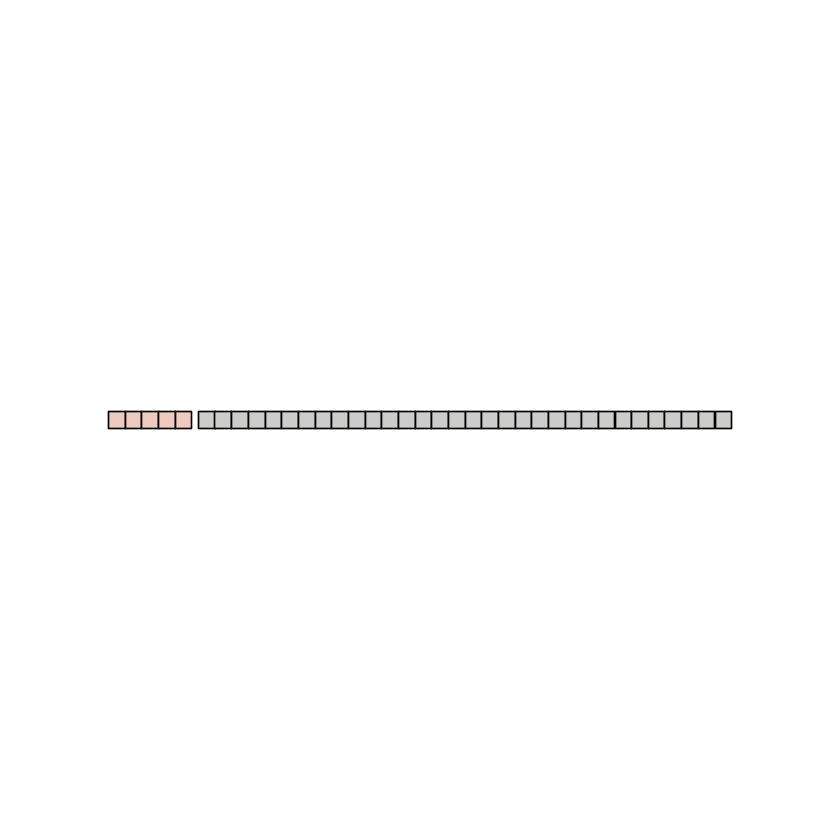

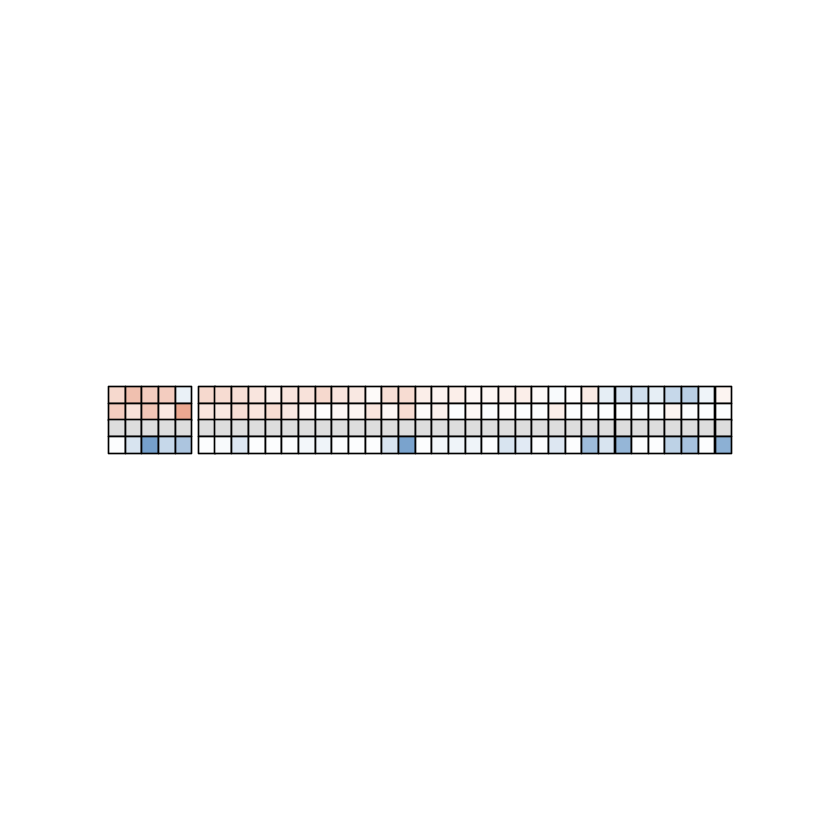

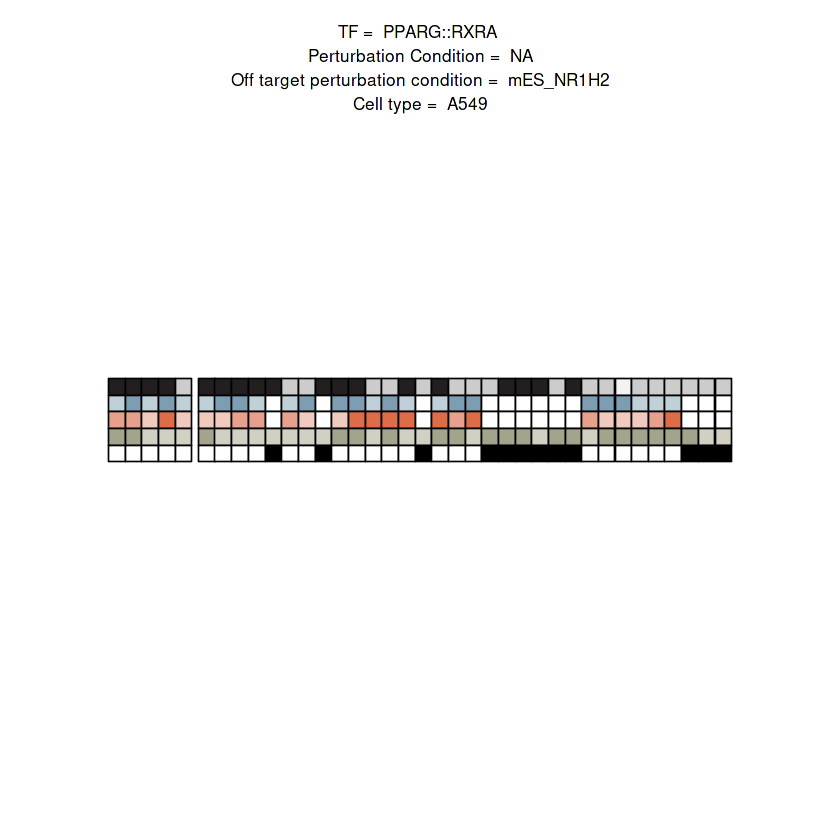

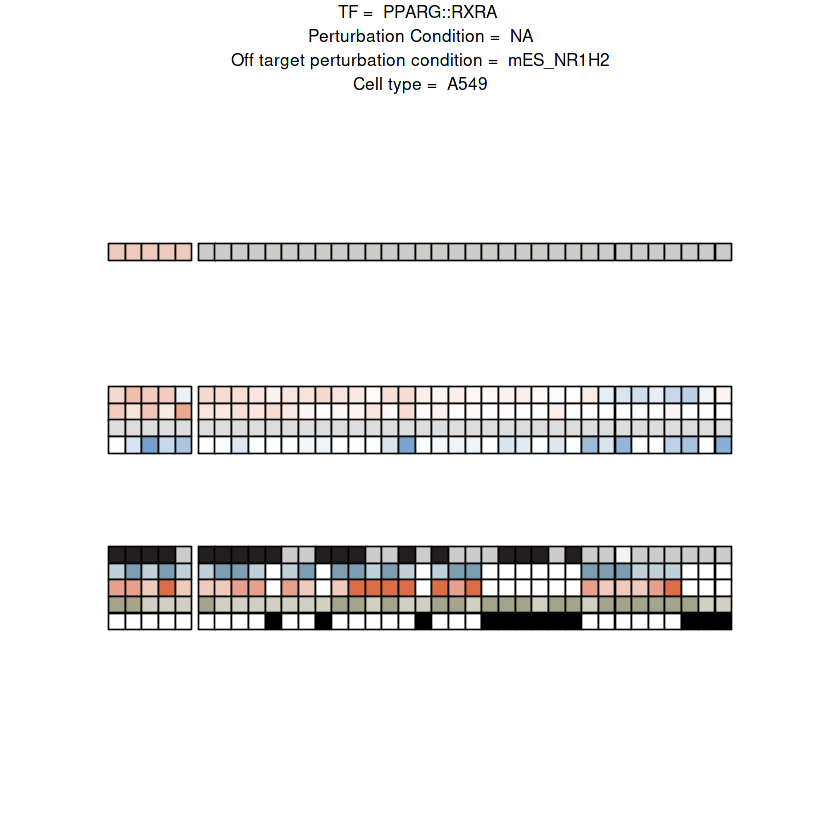

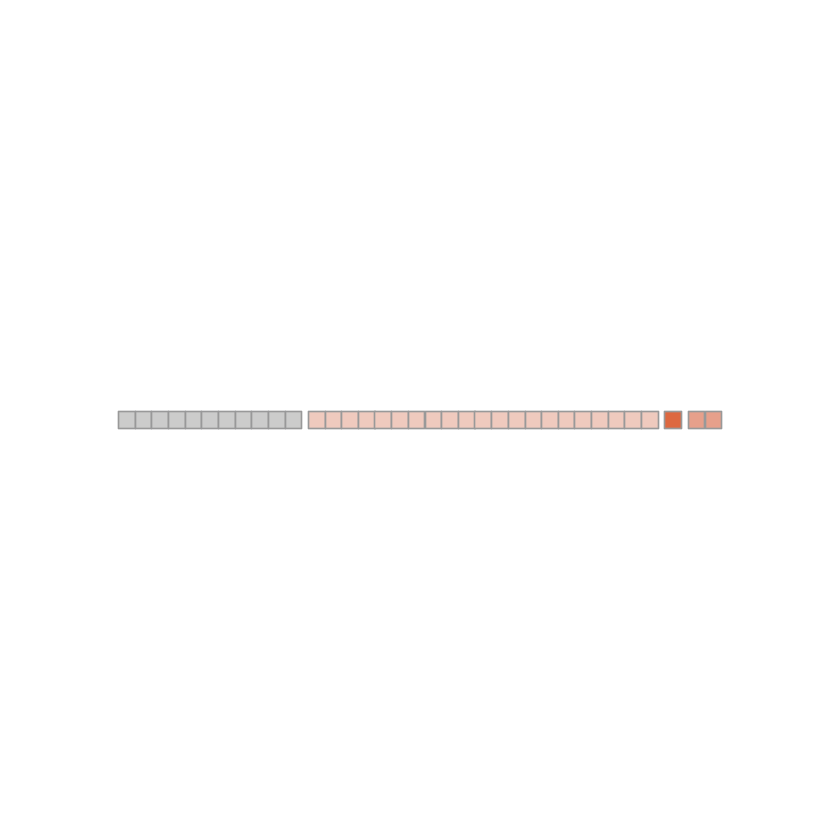

Joining, by = "reporter_id"
Joining, by = "feature"


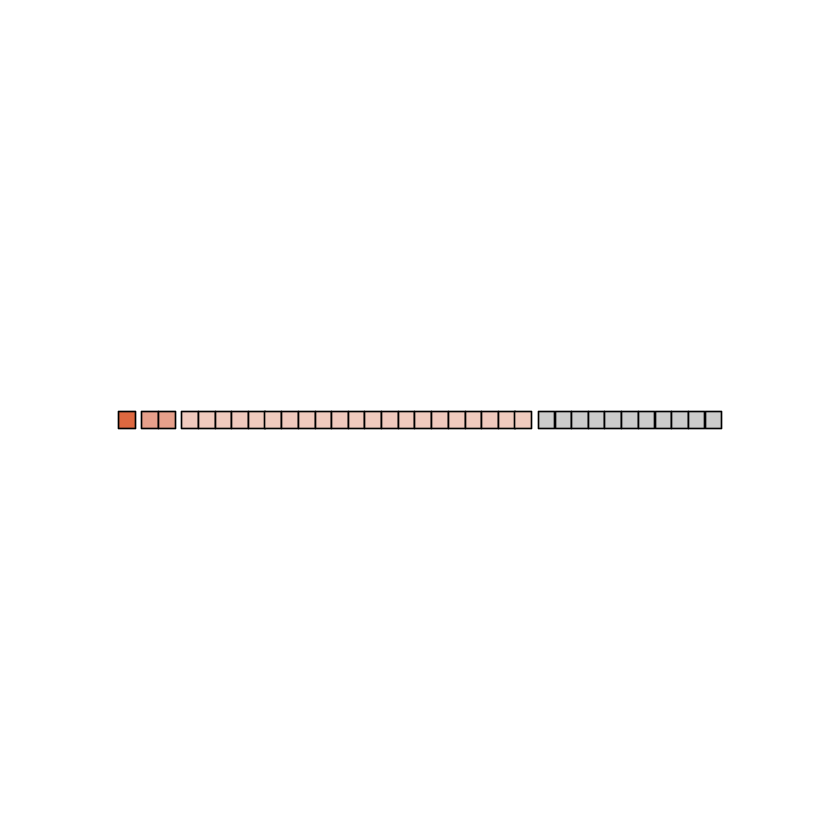

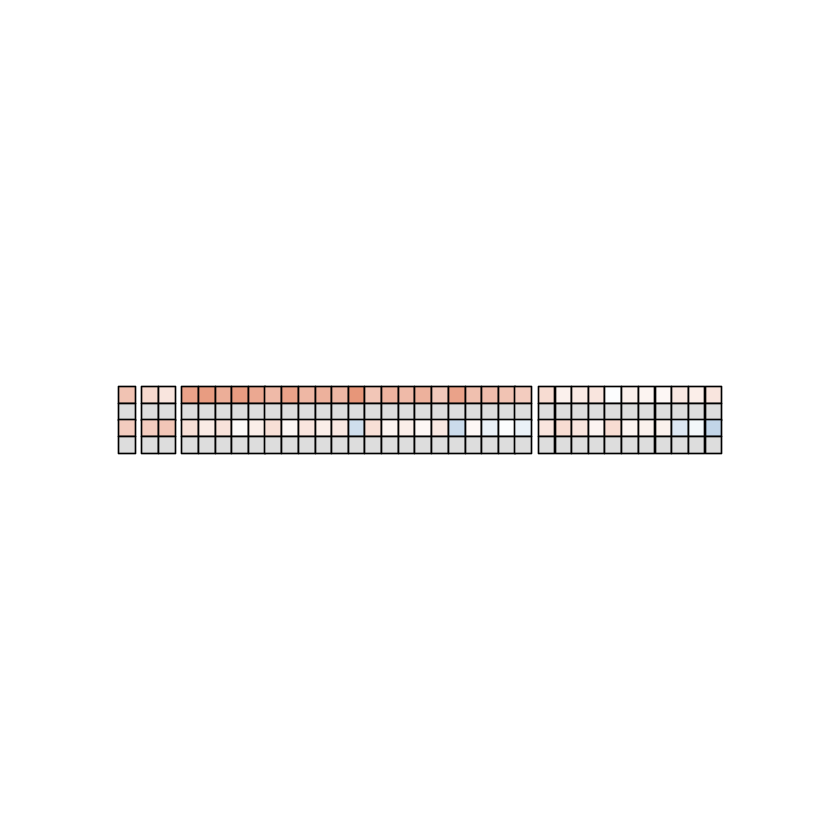

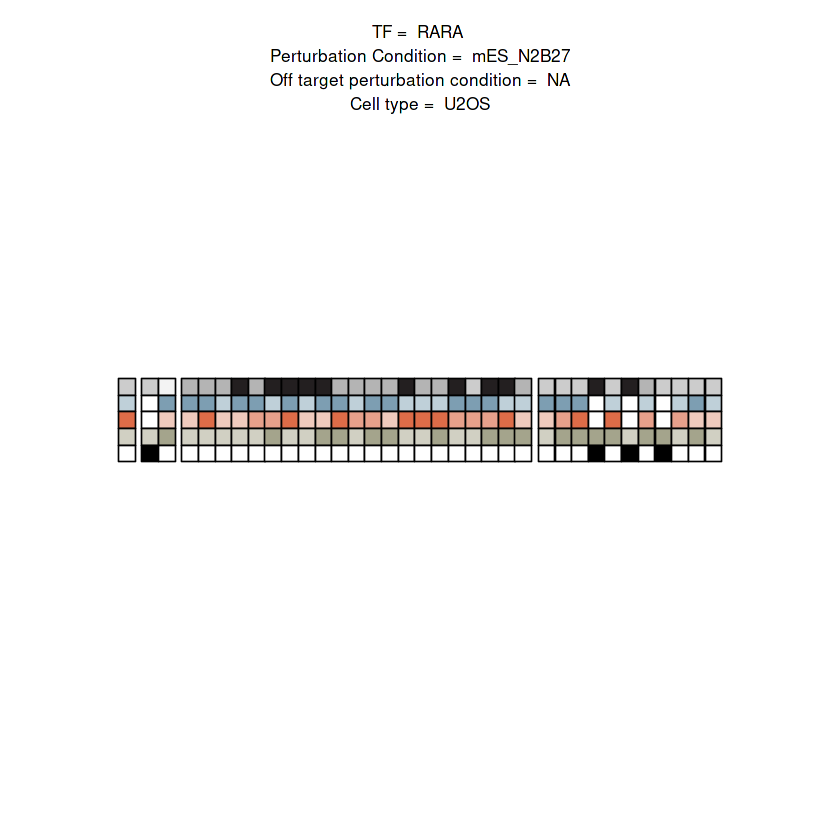

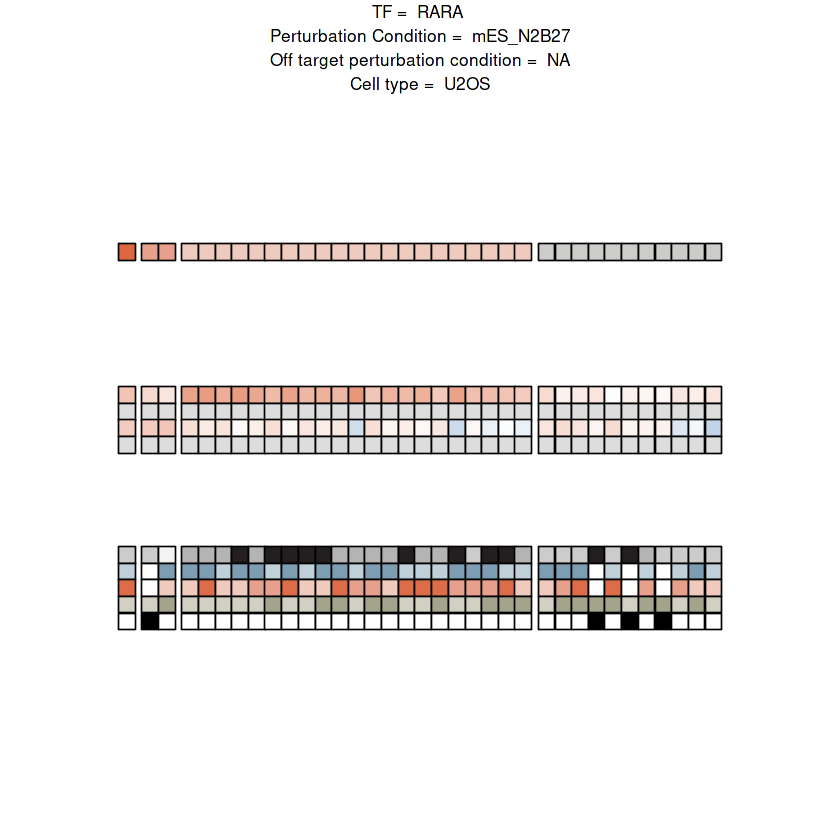

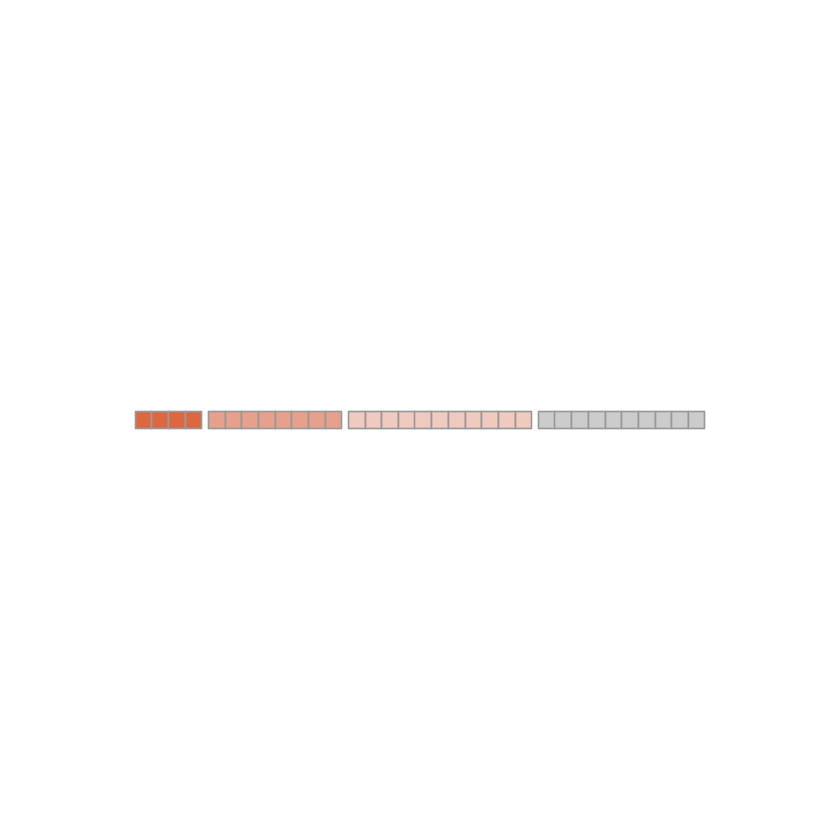

Joining, by = "reporter_id"
Joining, by = "feature"


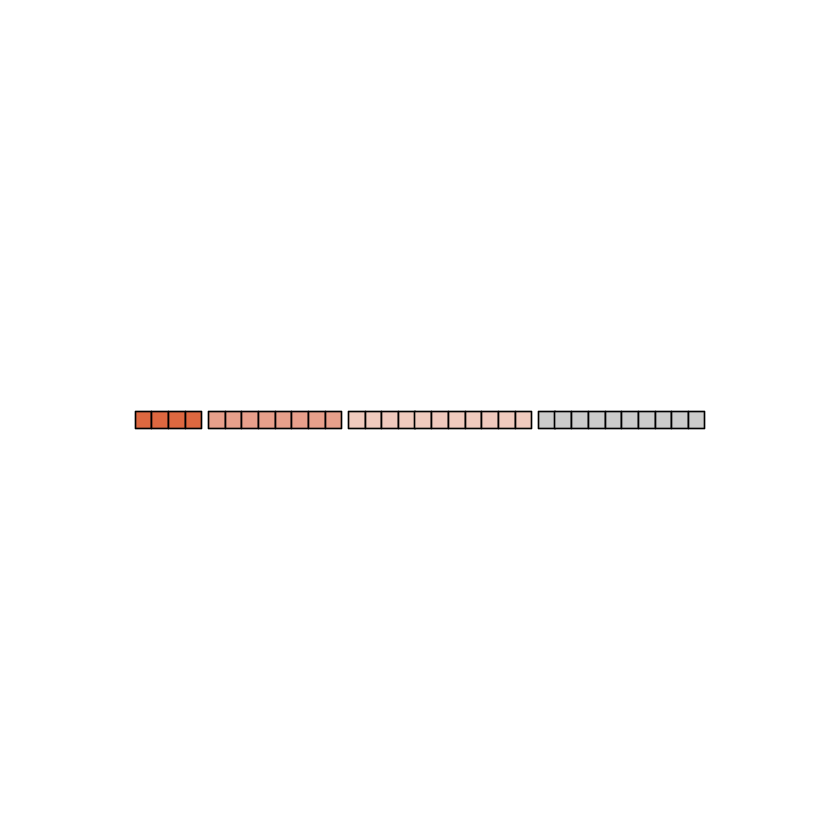

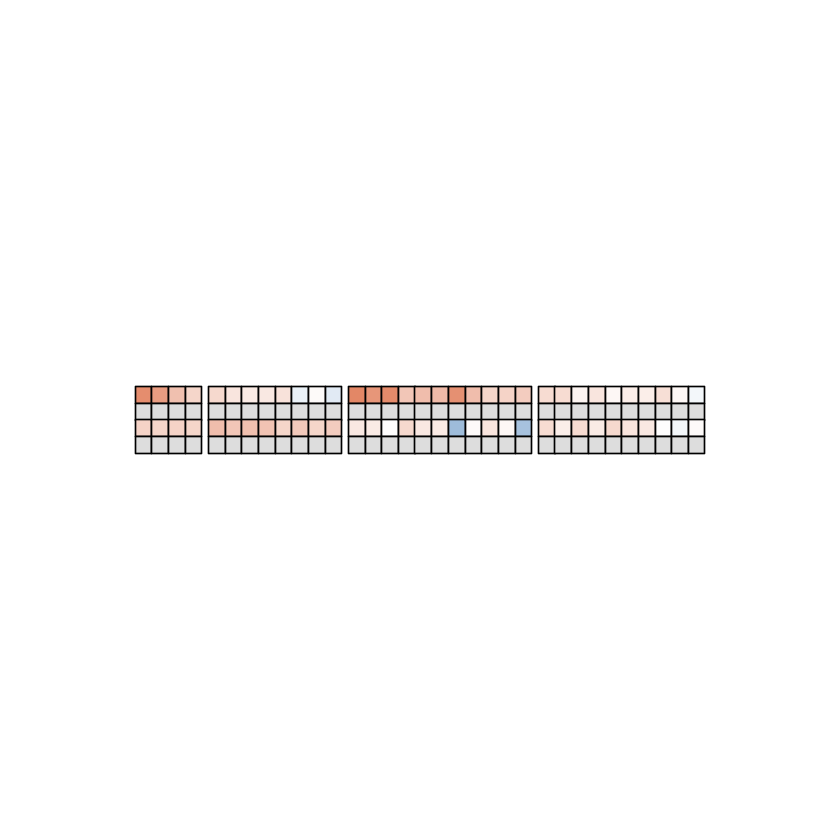

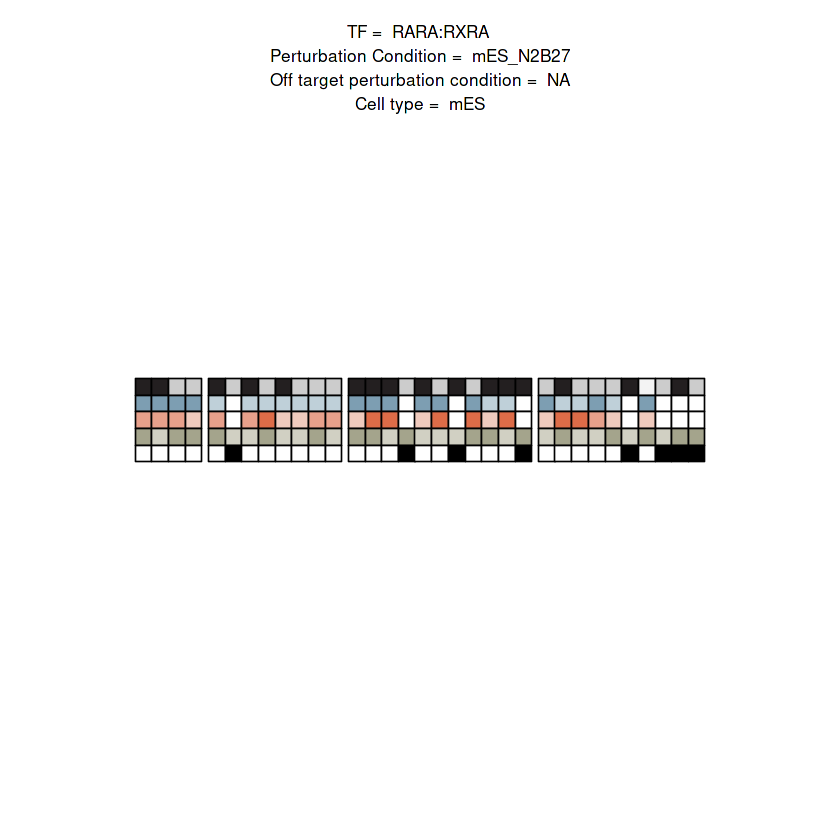

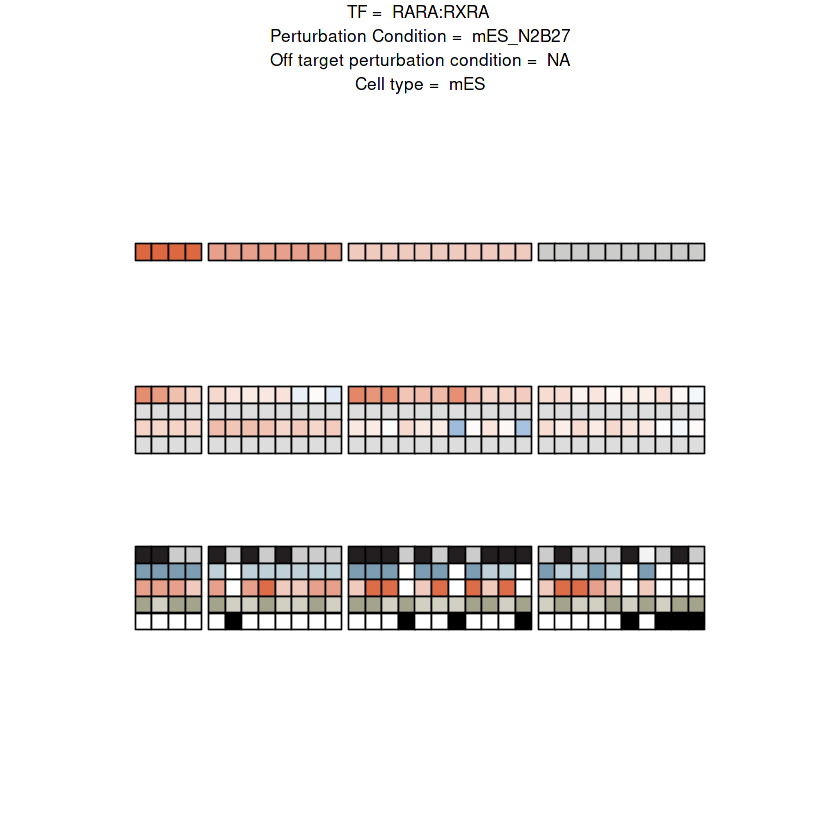

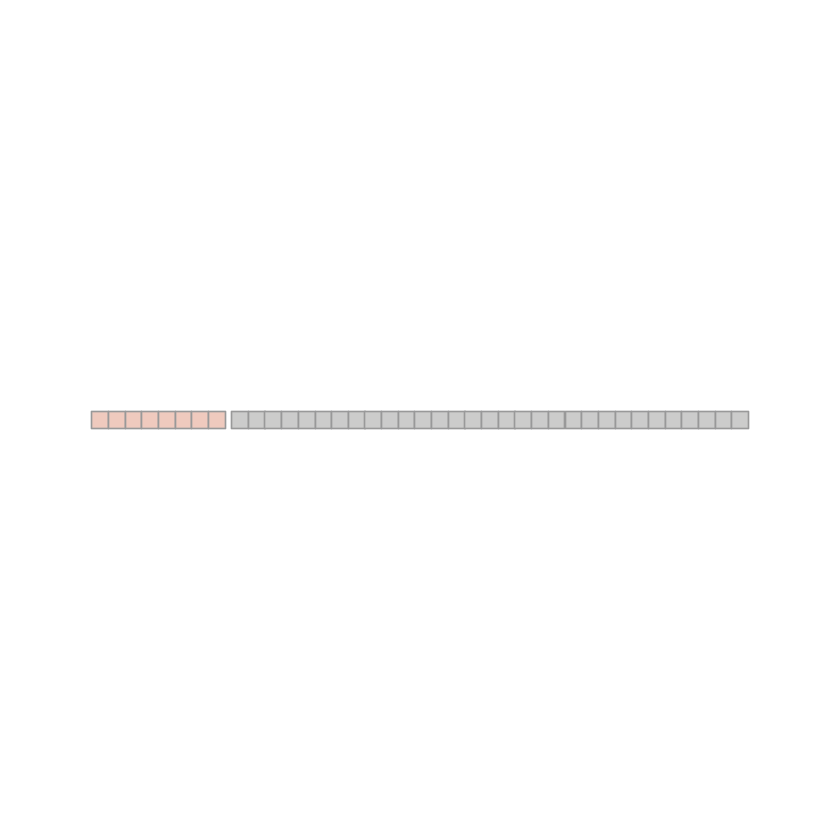

Joining, by = "reporter_id"
Joining, by = "feature"


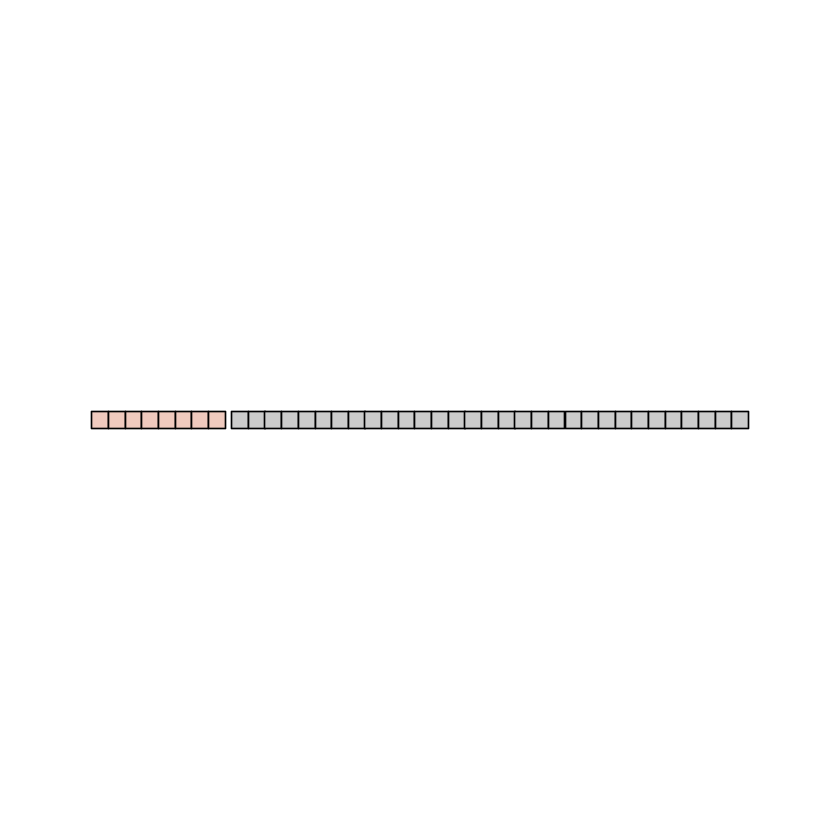

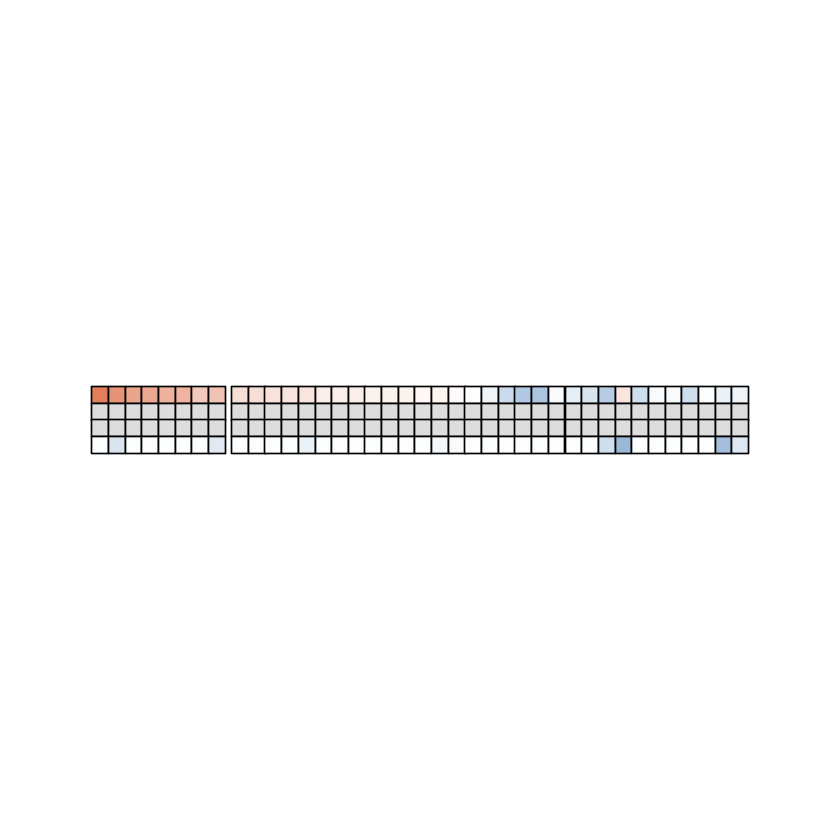

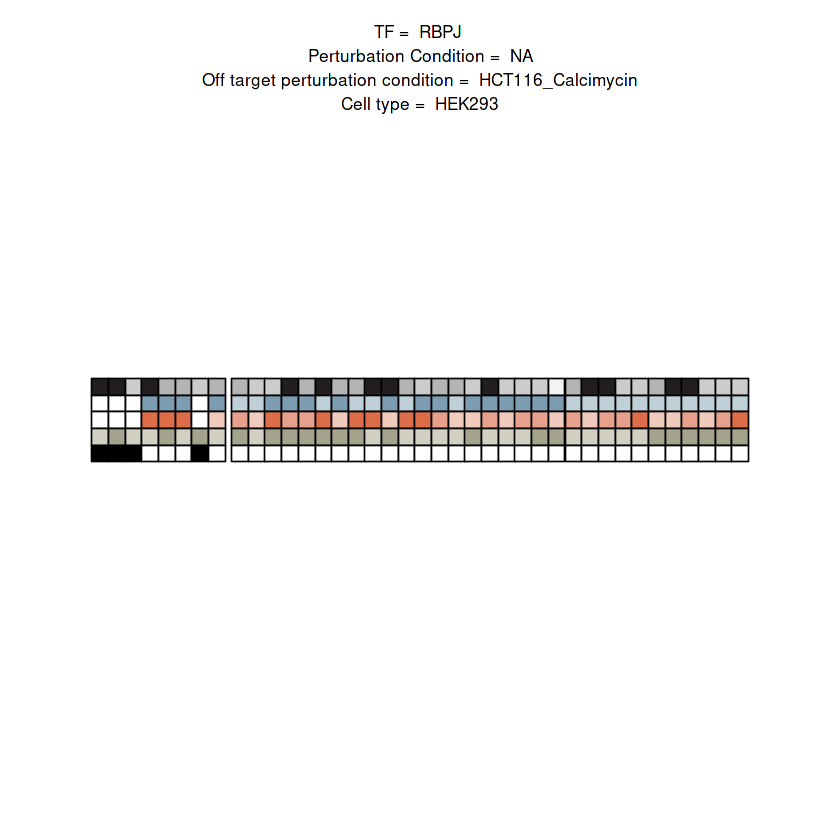

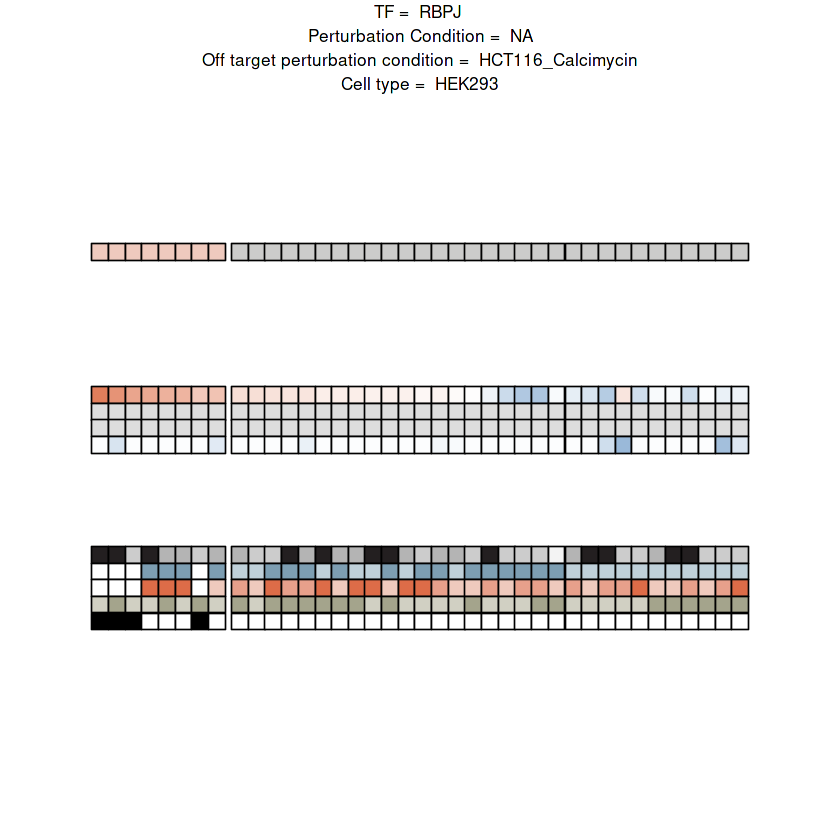

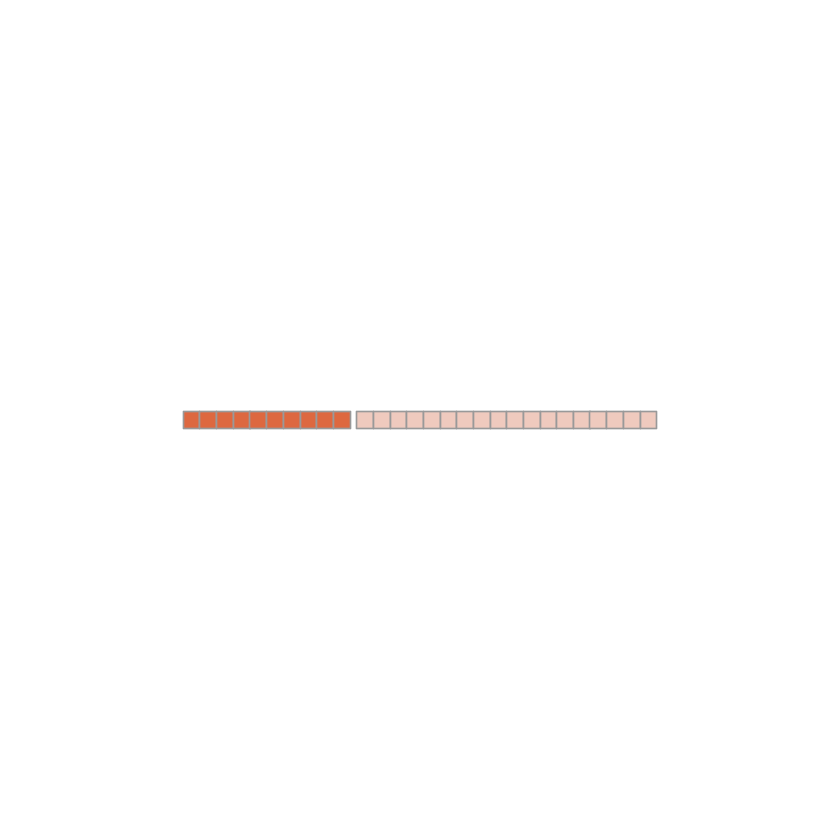

Joining, by = "reporter_id"
Joining, by = "feature"


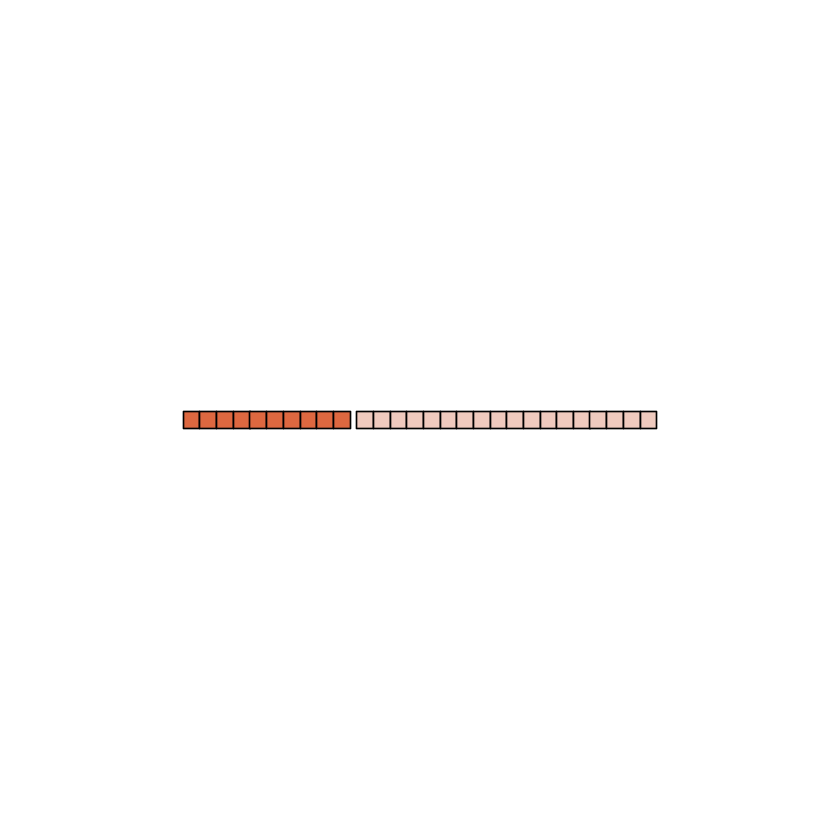

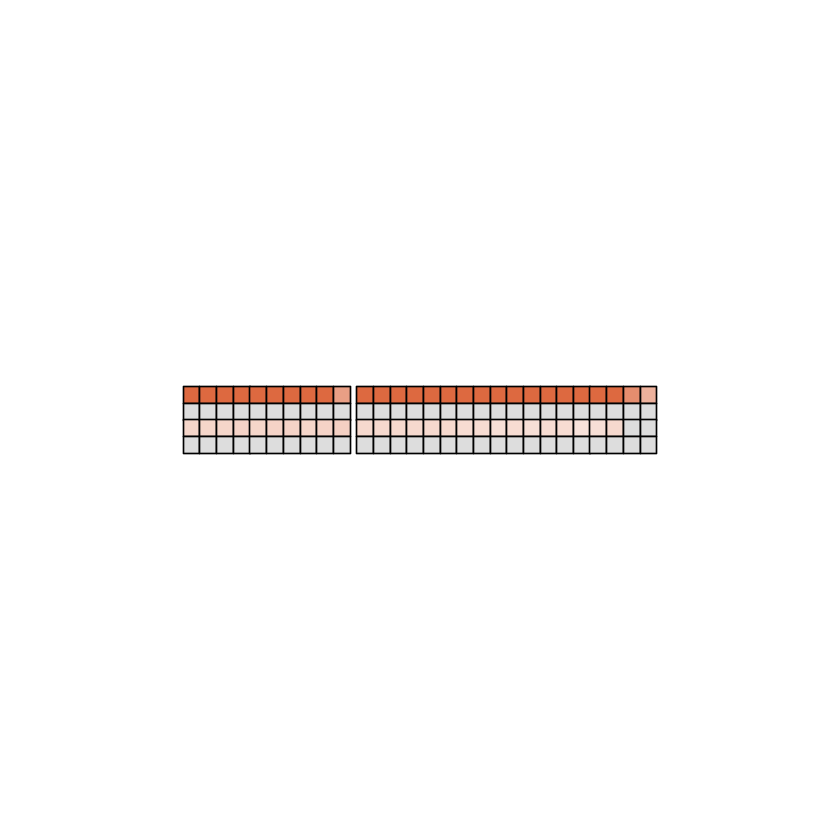

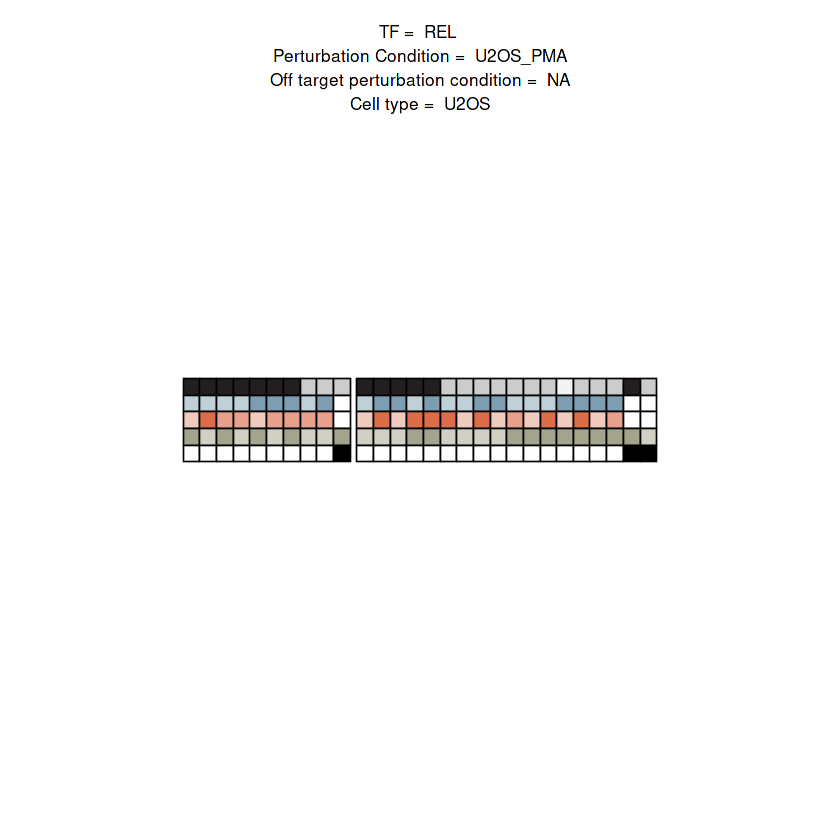

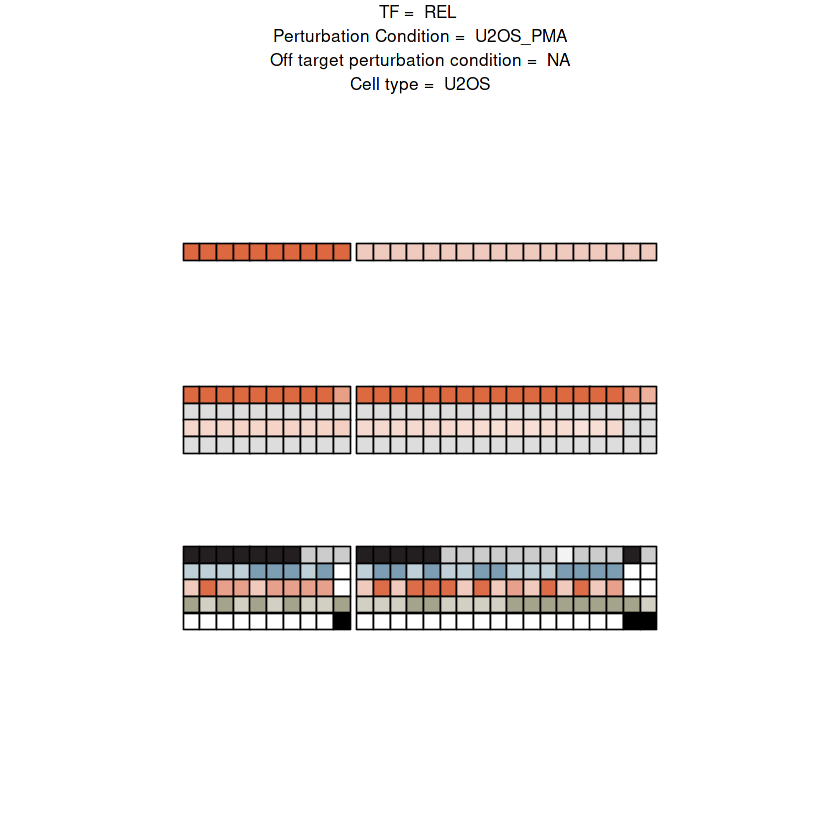

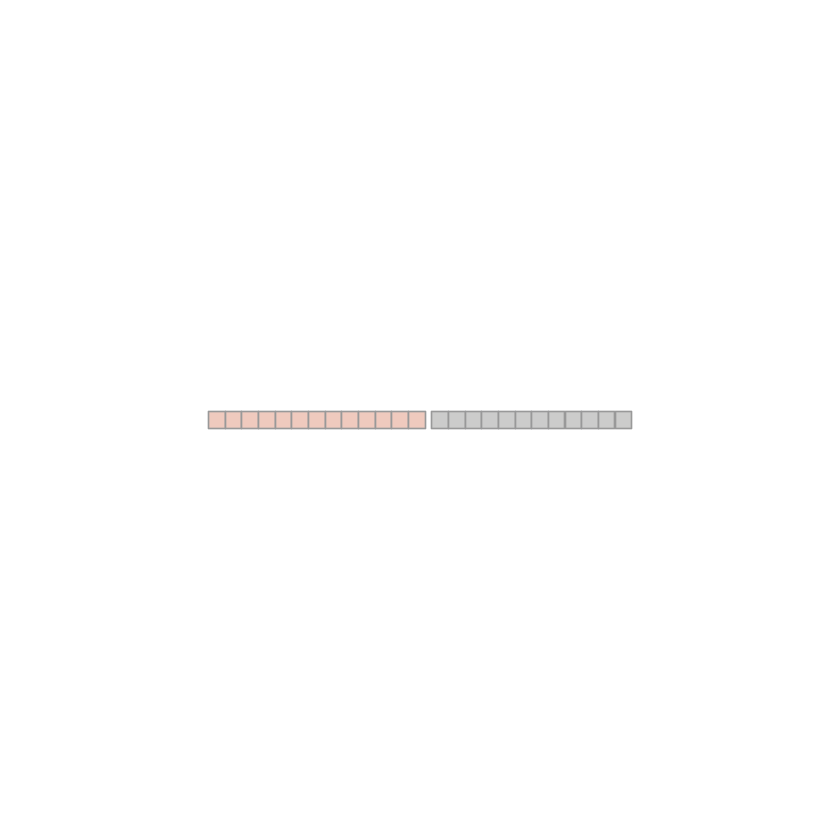

Joining, by = "reporter_id"
Joining, by = "feature"


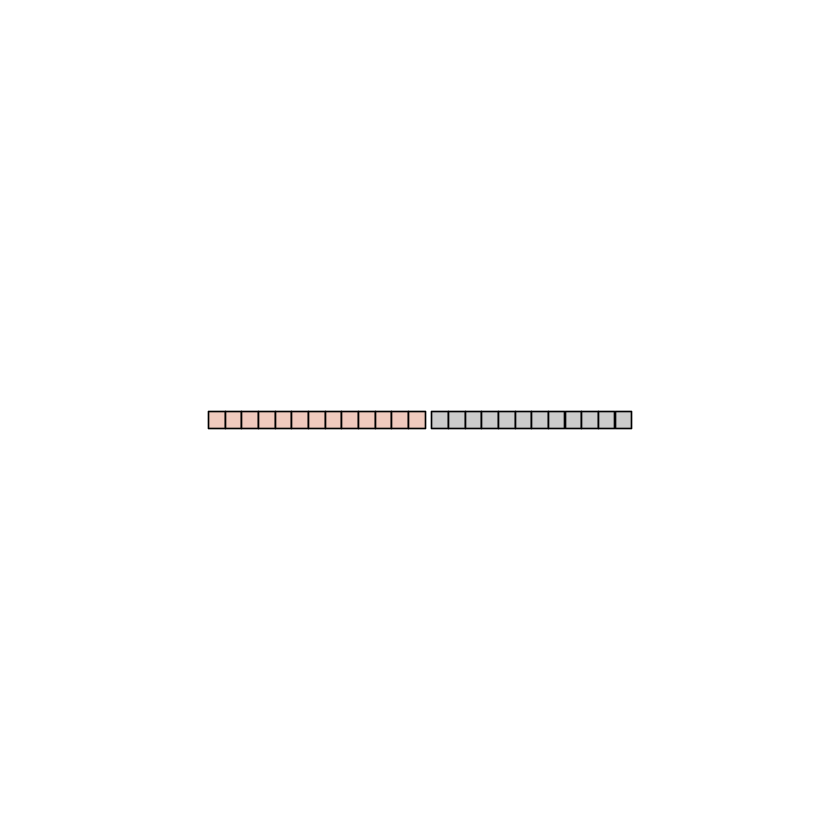

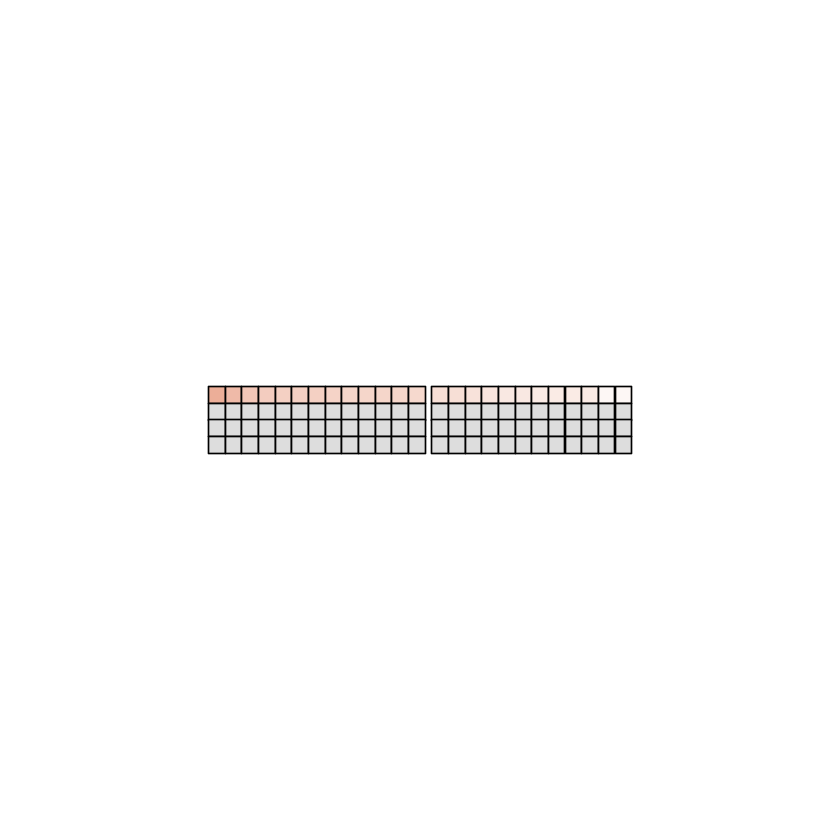

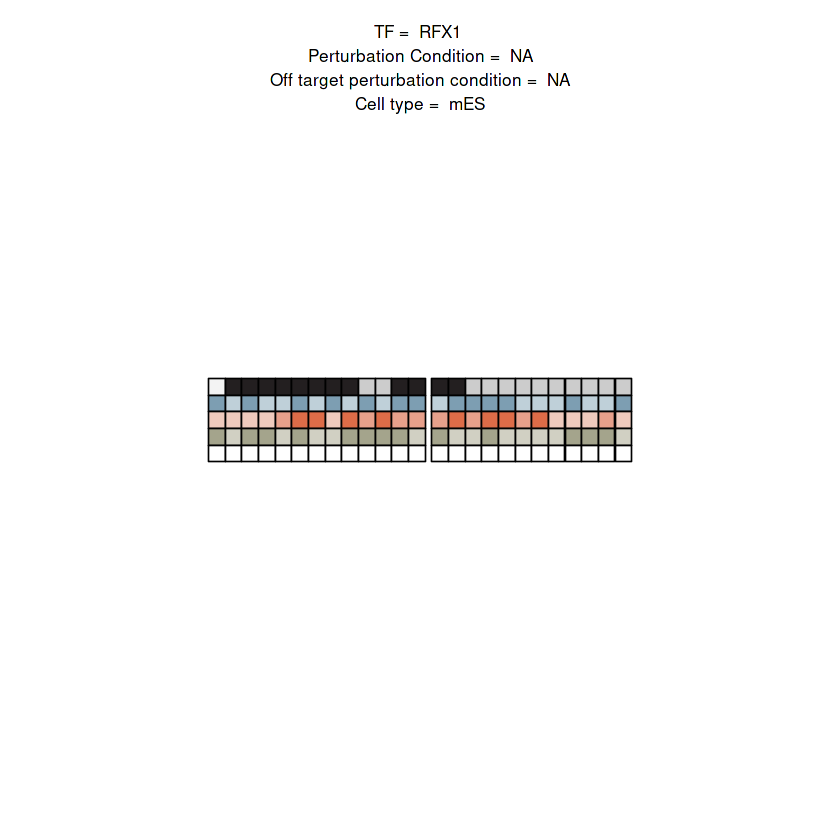

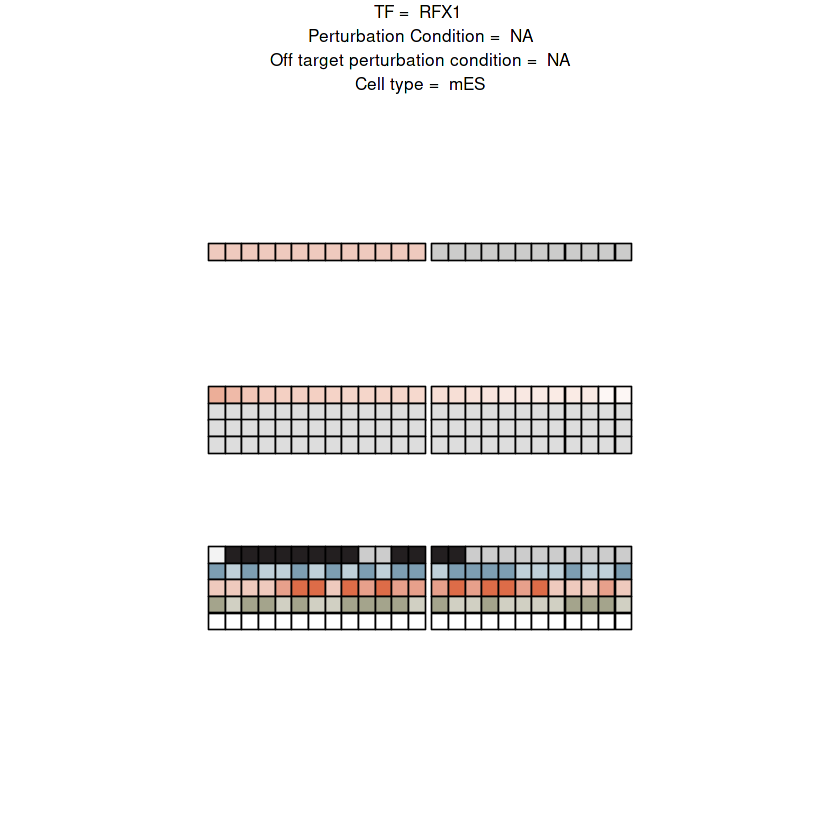

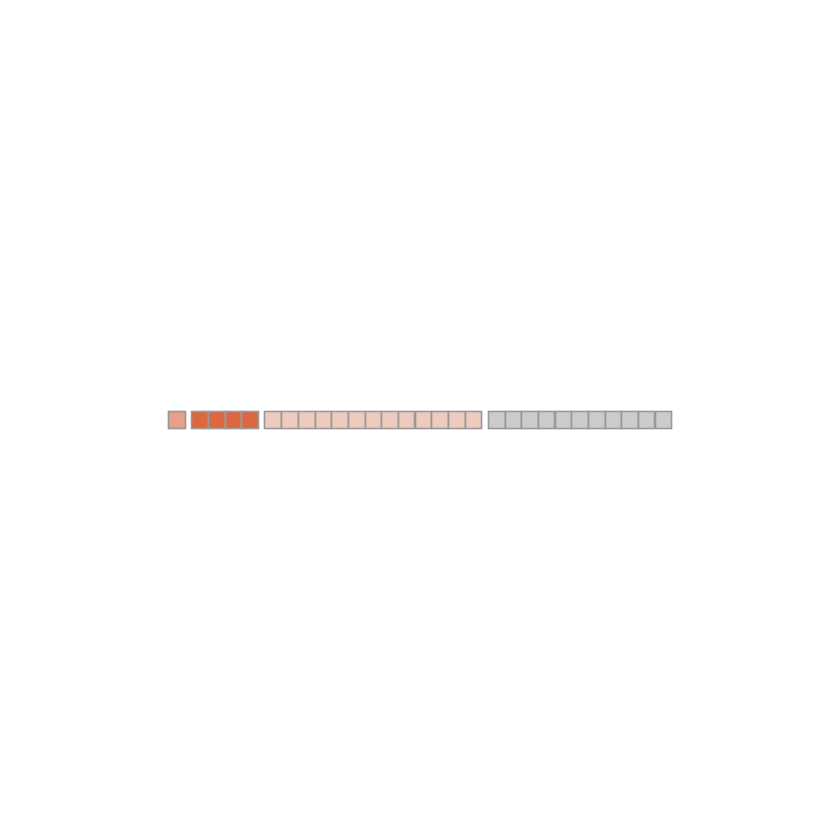

Joining, by = "reporter_id"
Joining, by = "feature"


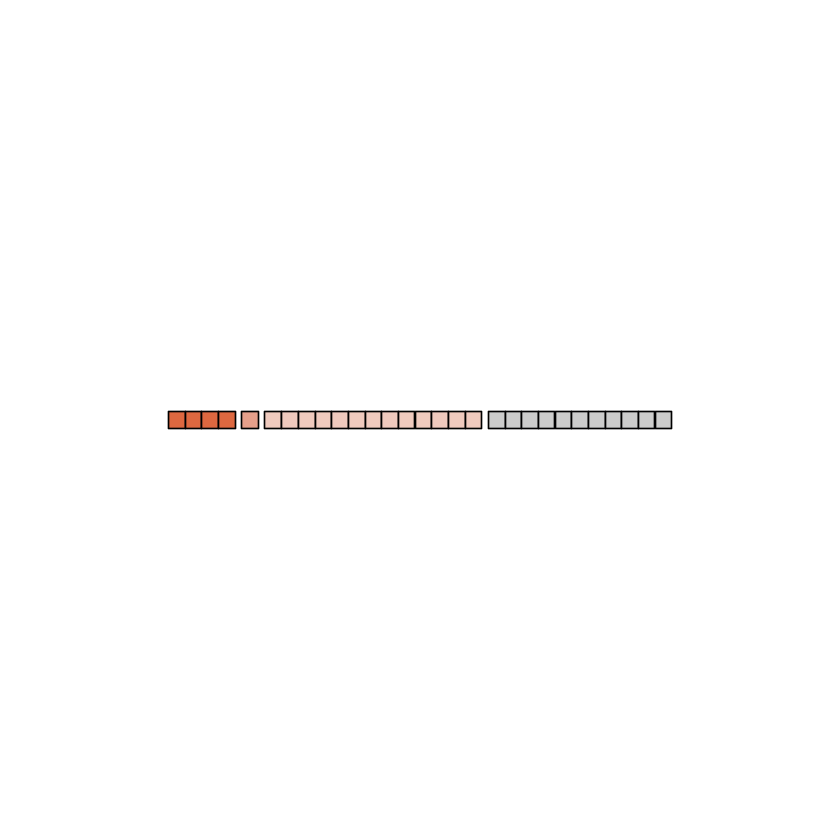

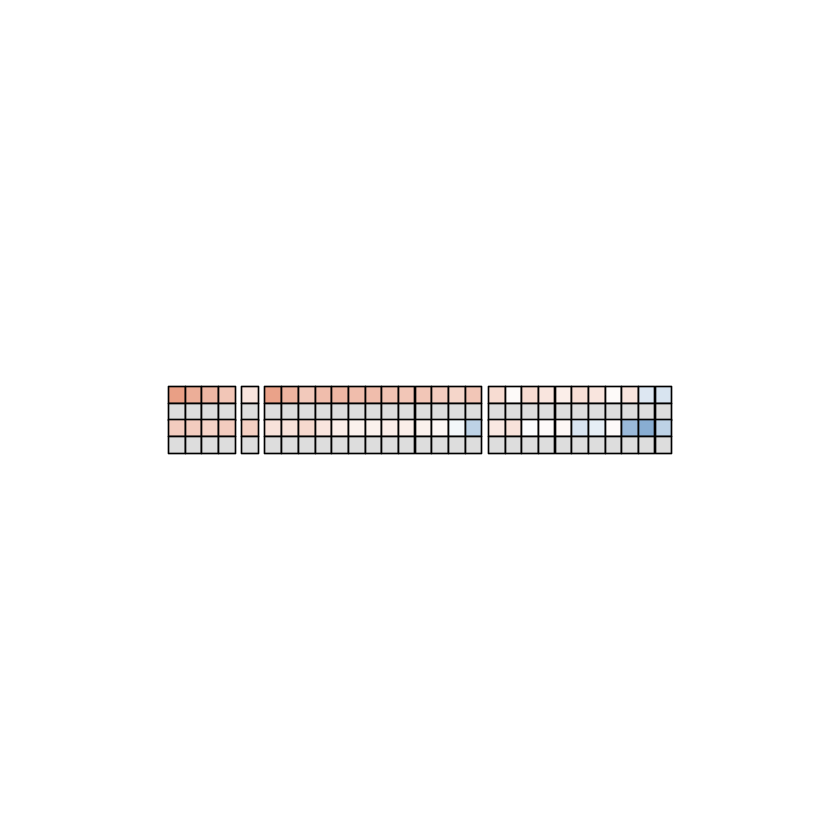

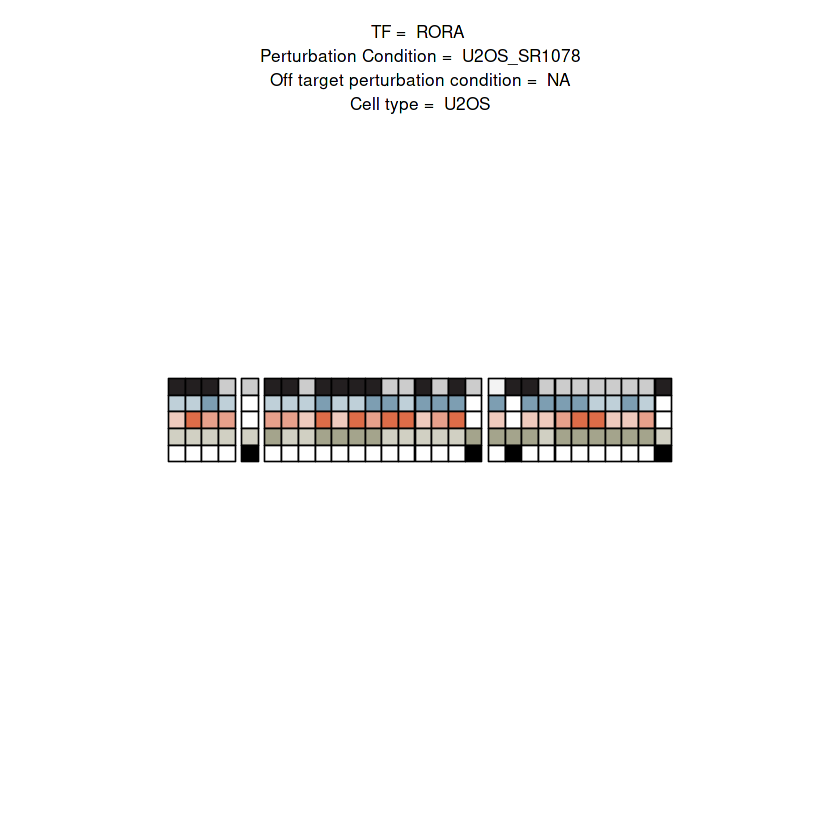

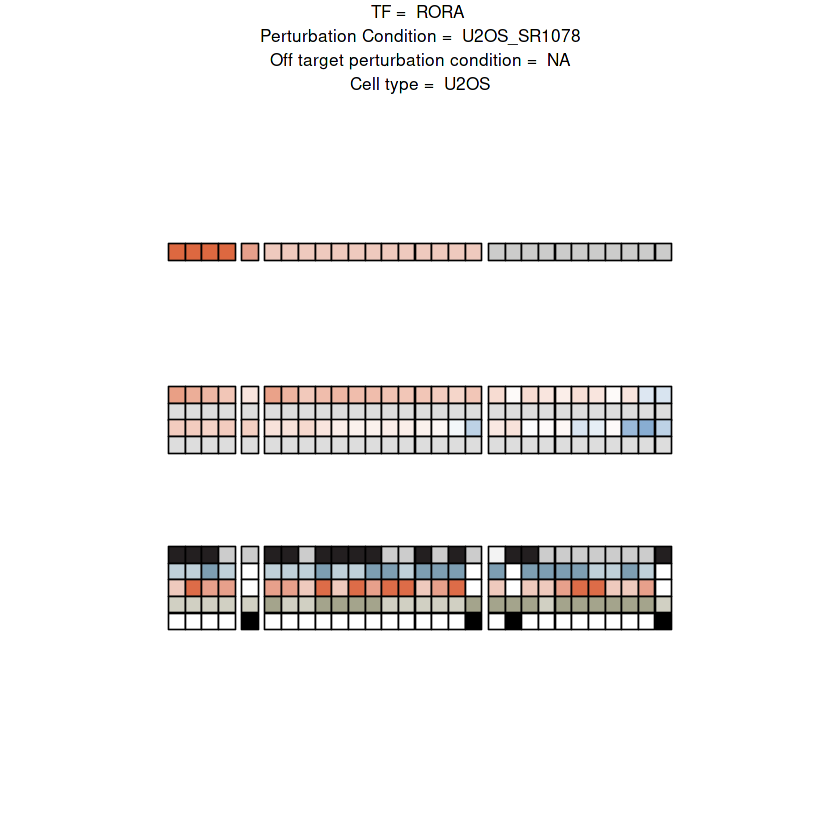

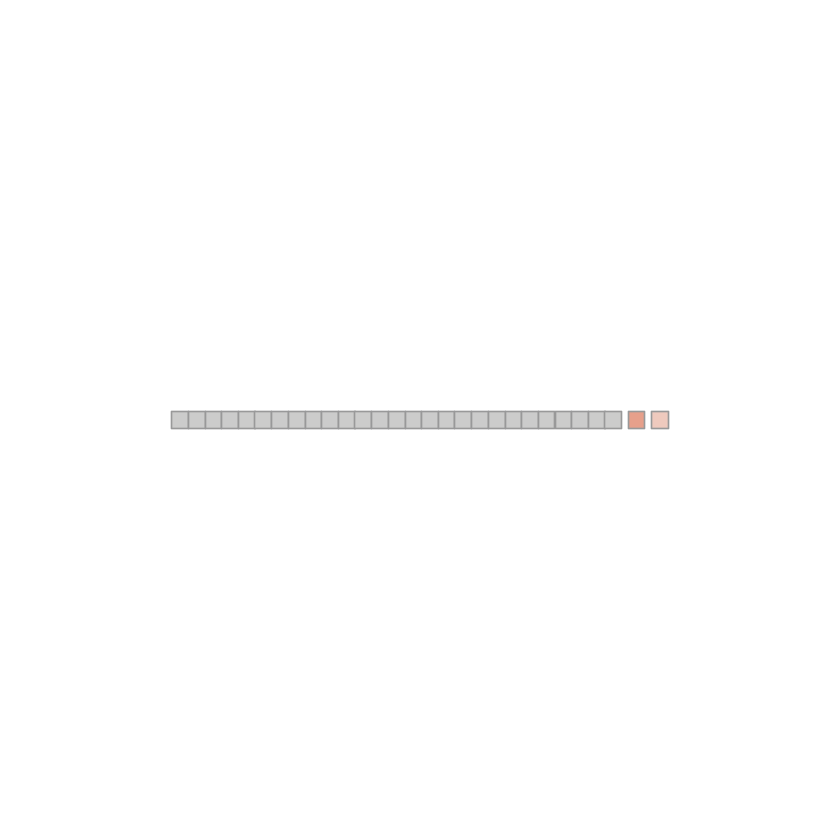

Joining, by = "reporter_id"
Joining, by = "feature"


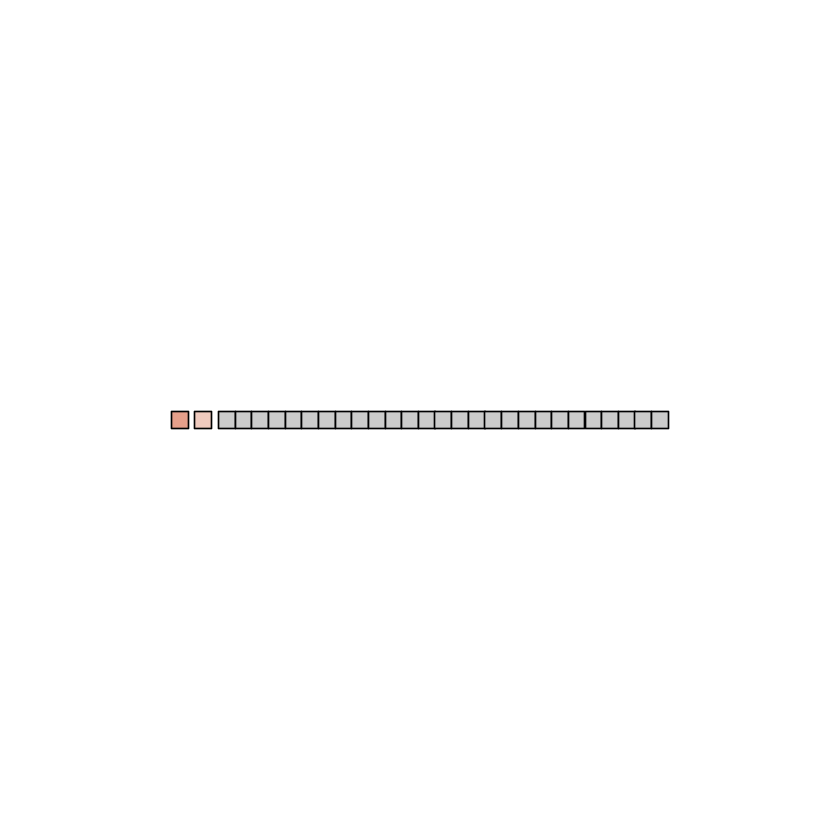

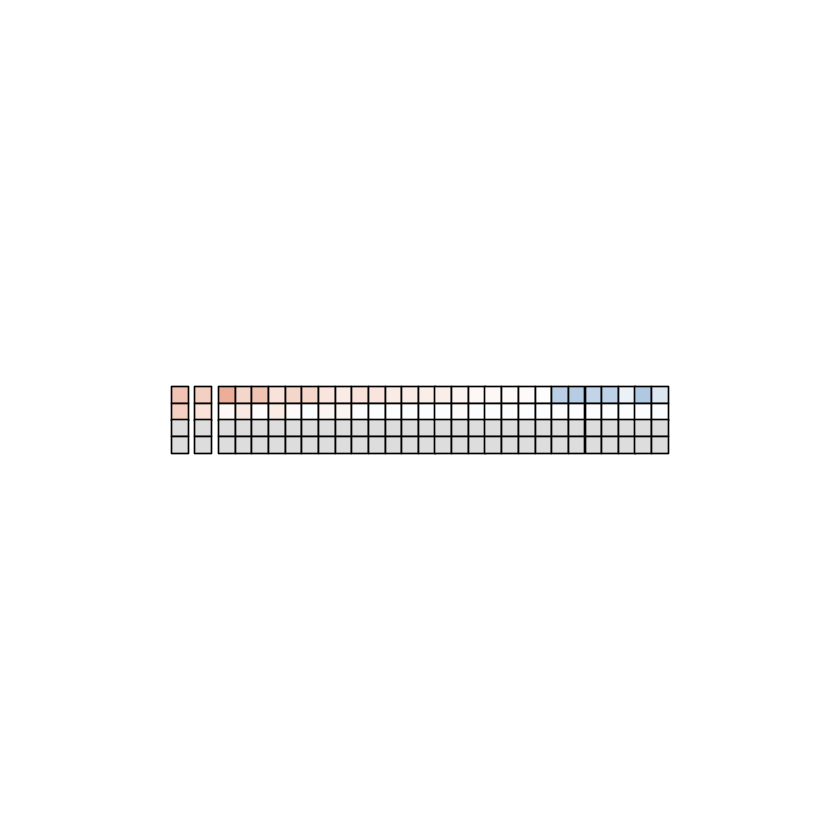

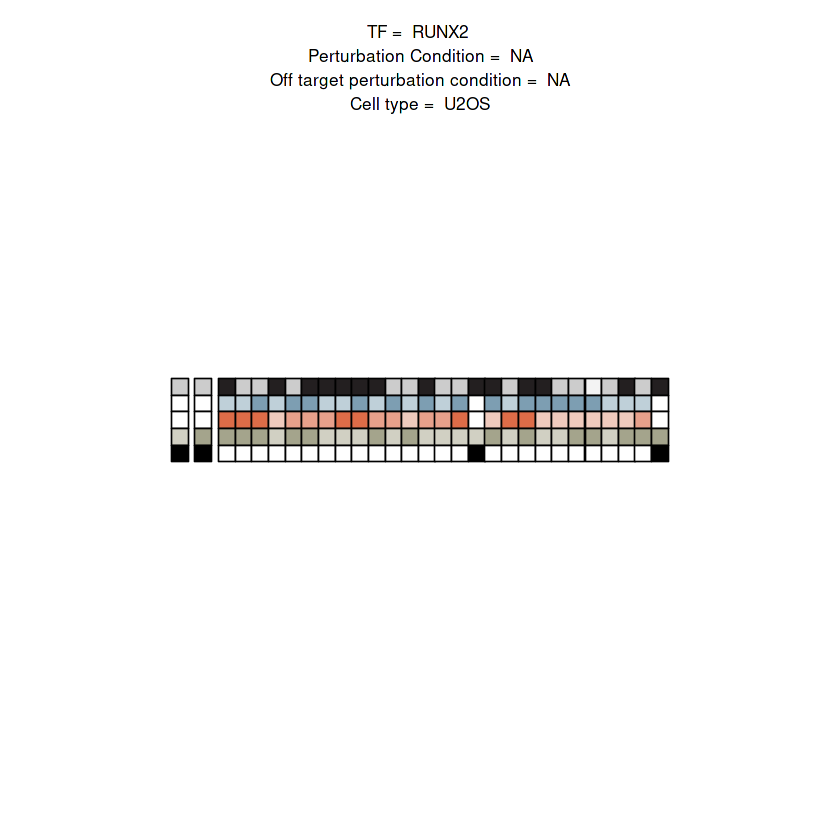

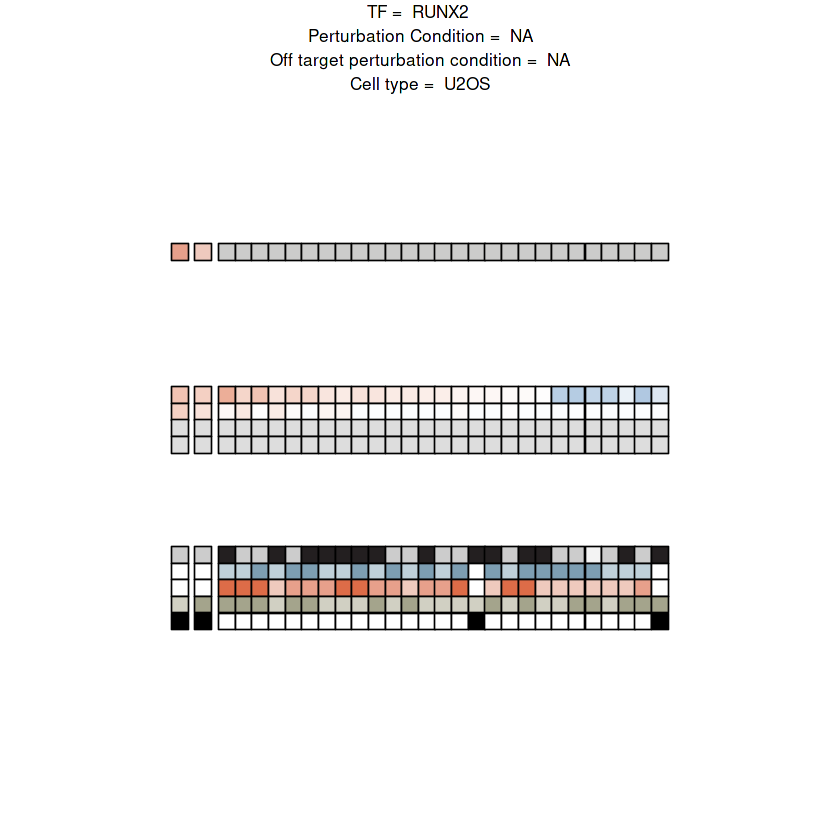

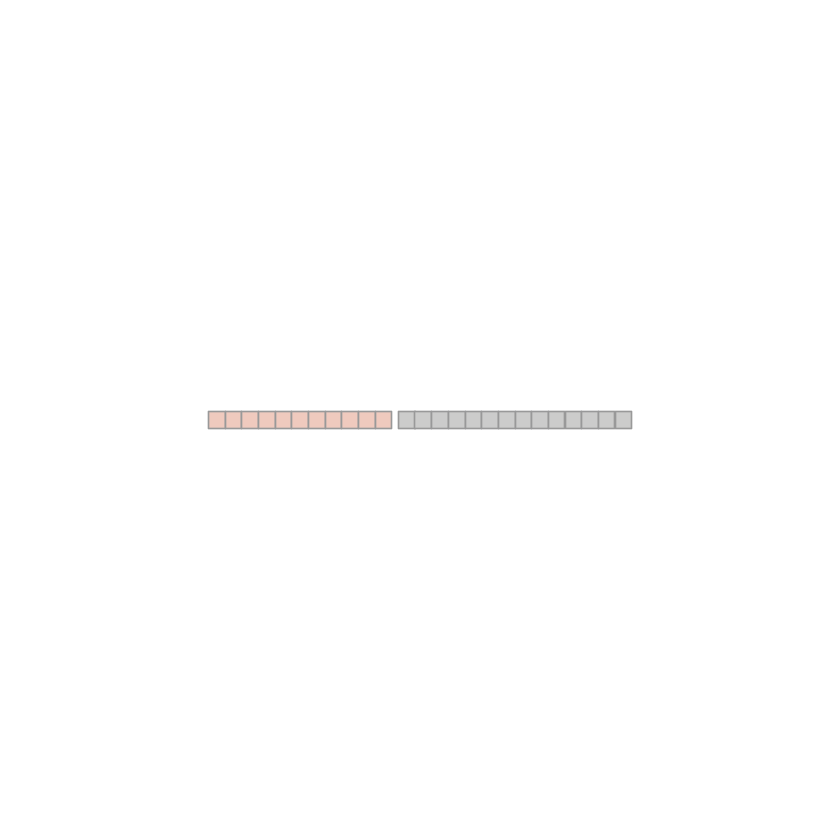

Joining, by = "reporter_id"
Joining, by = "feature"


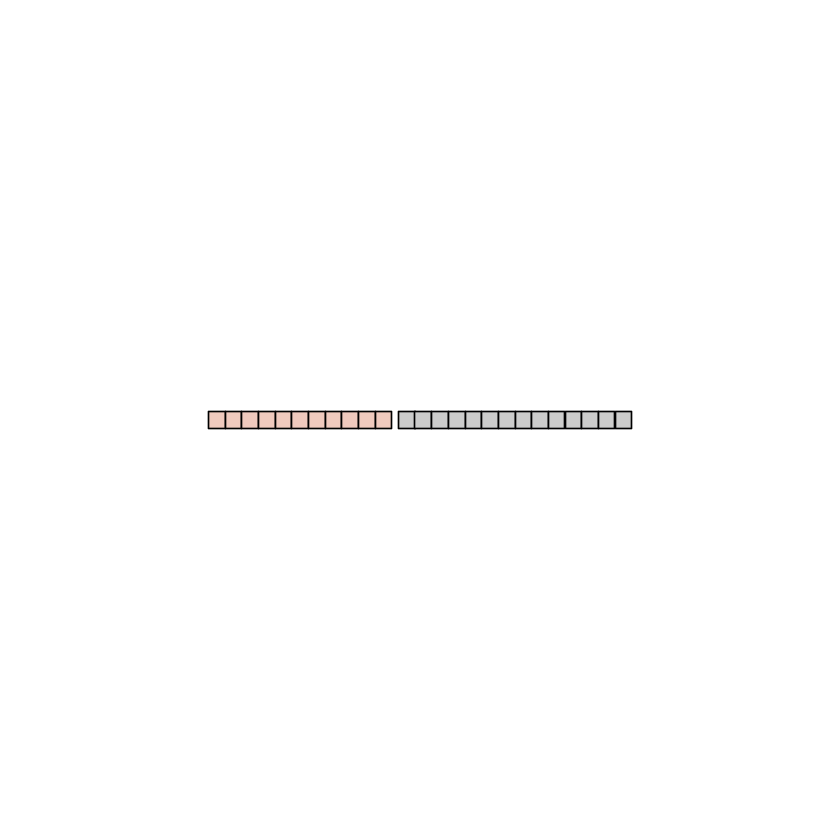

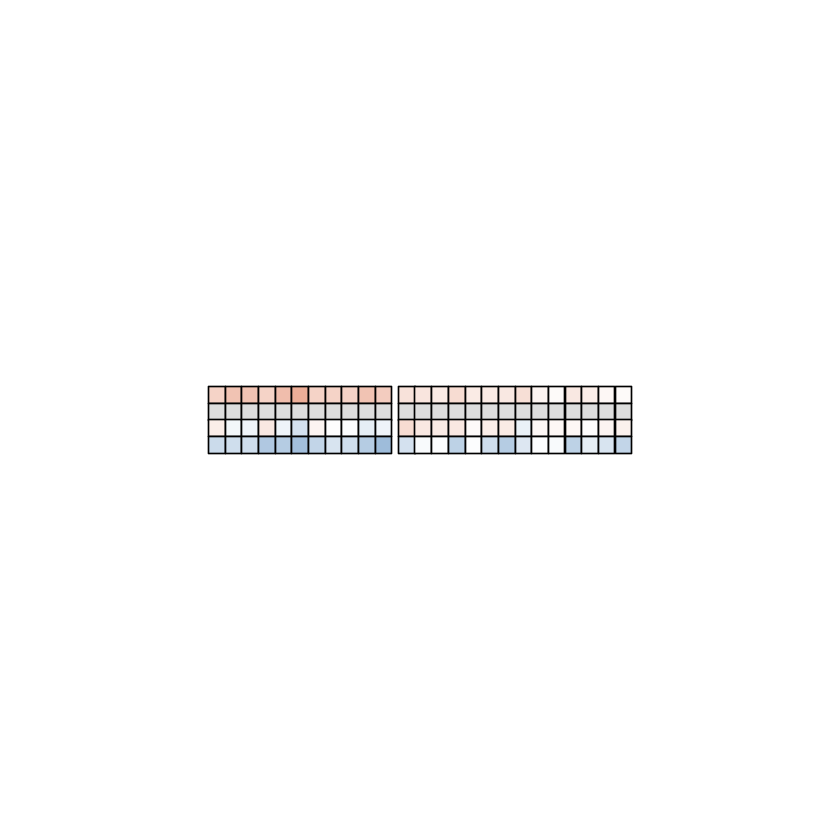

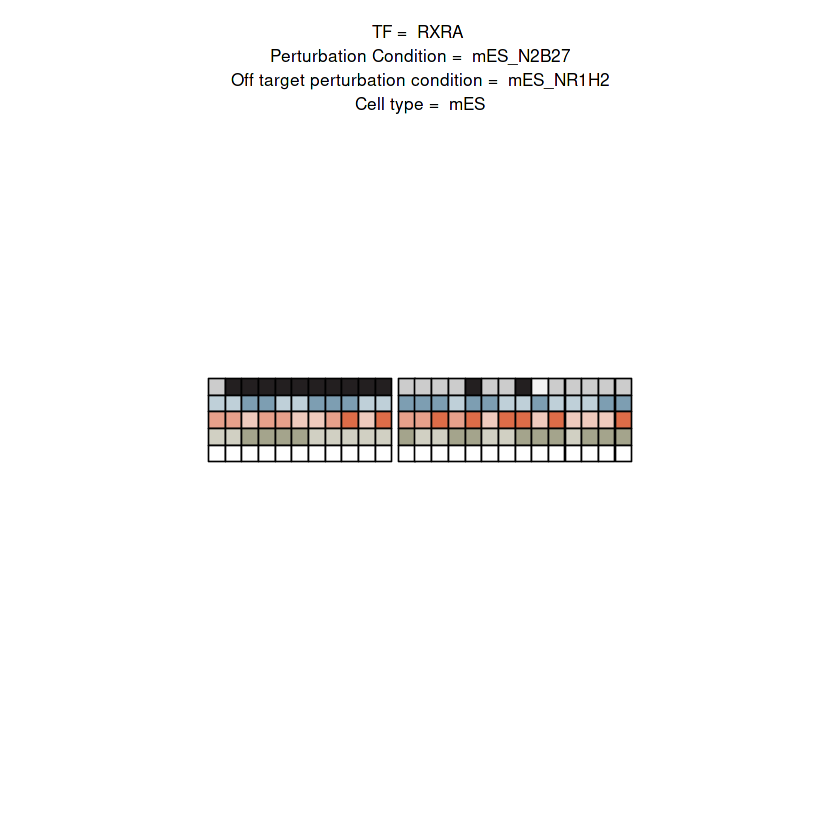

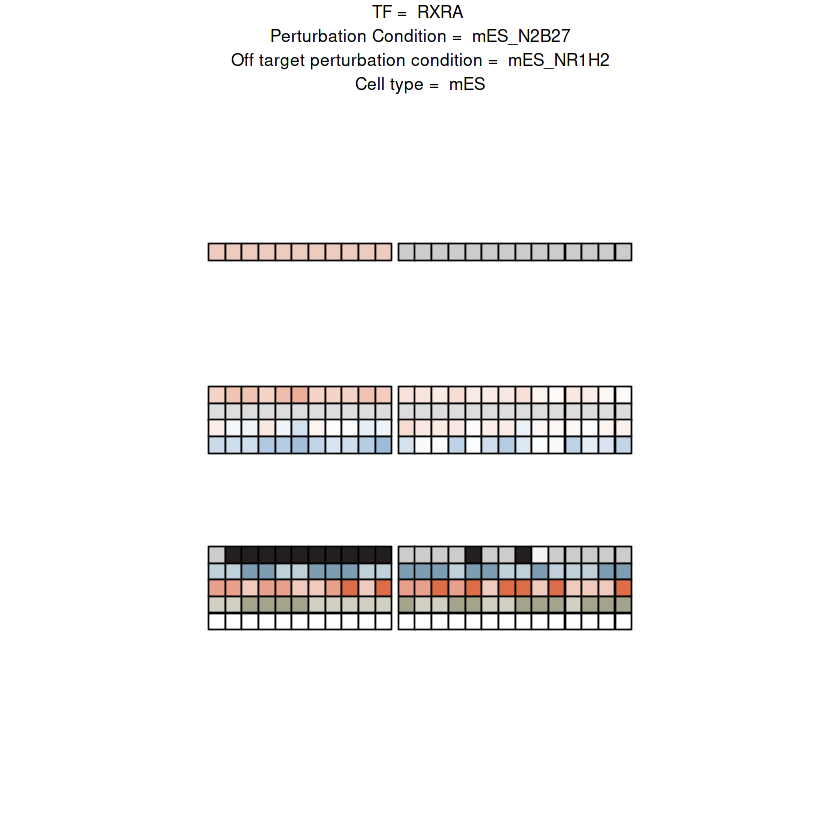

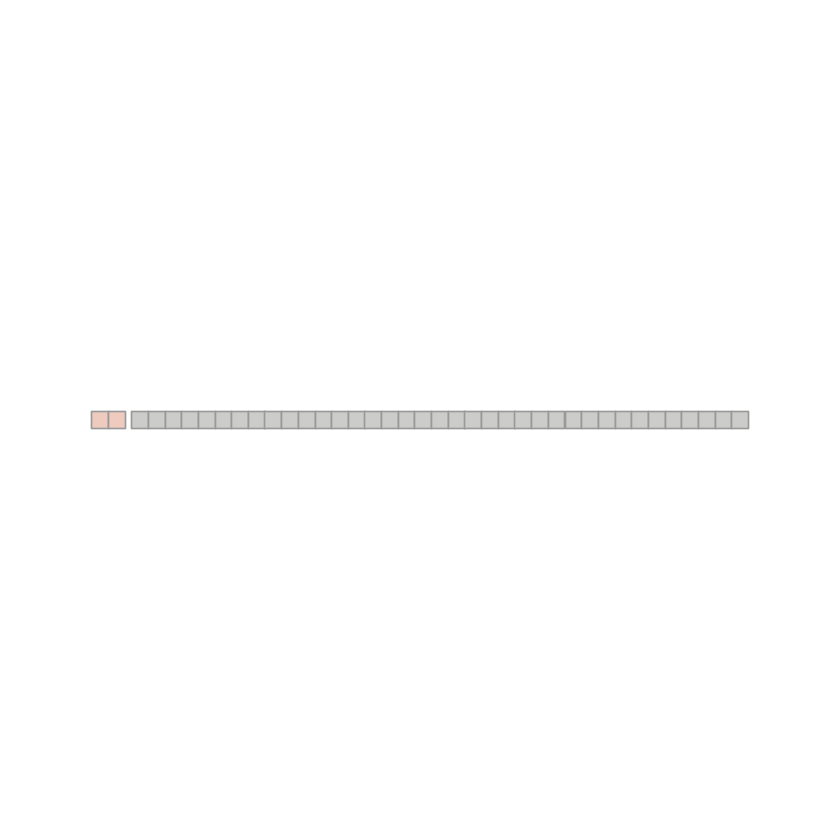

Joining, by = "reporter_id"
Joining, by = "feature"


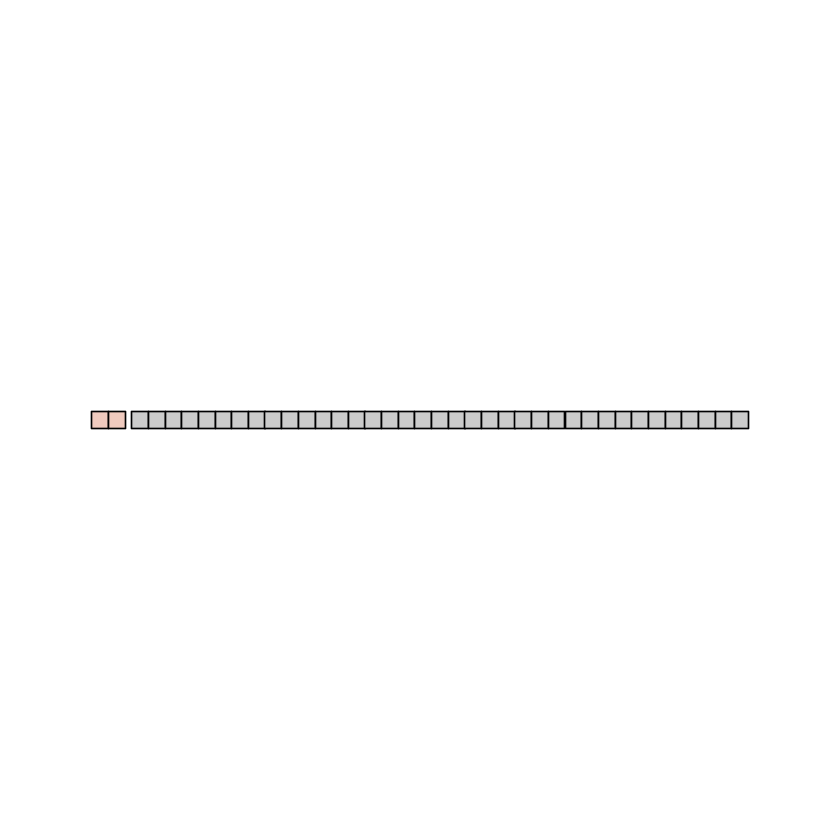

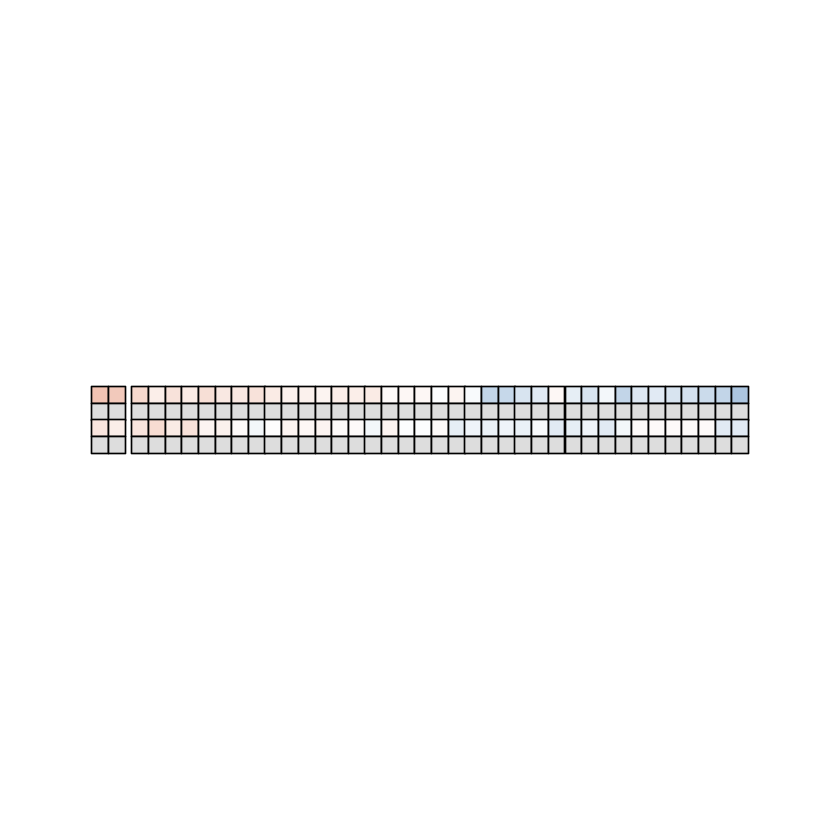

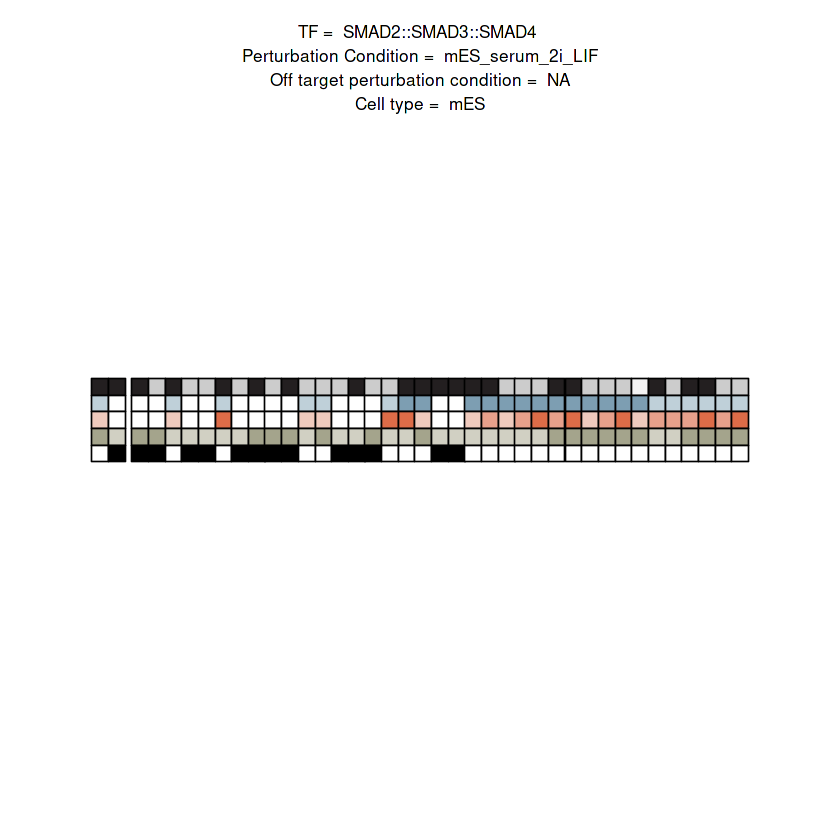

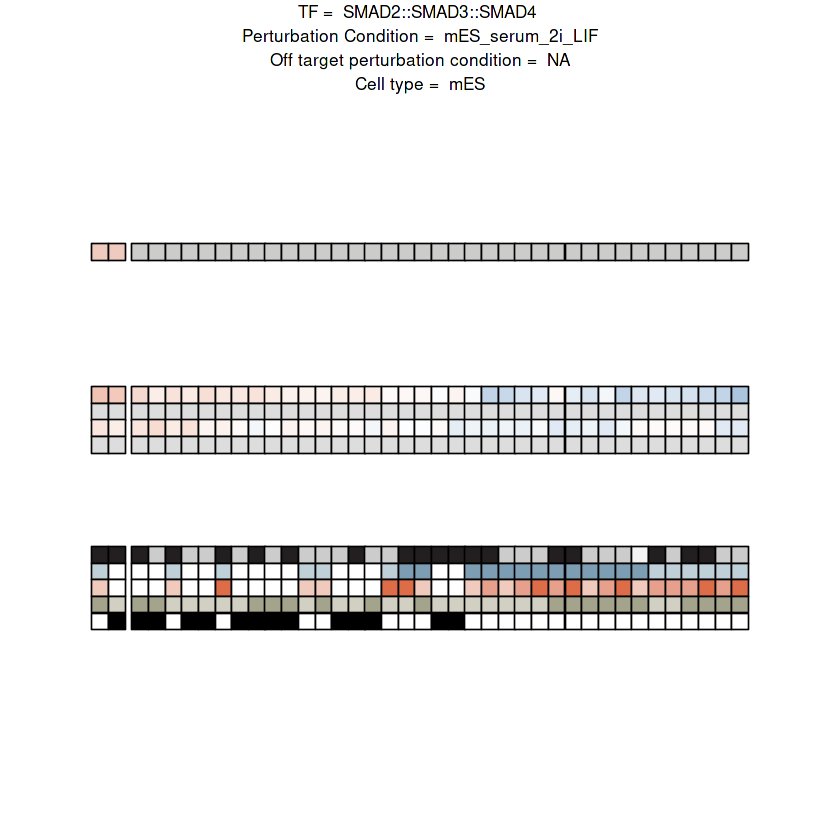

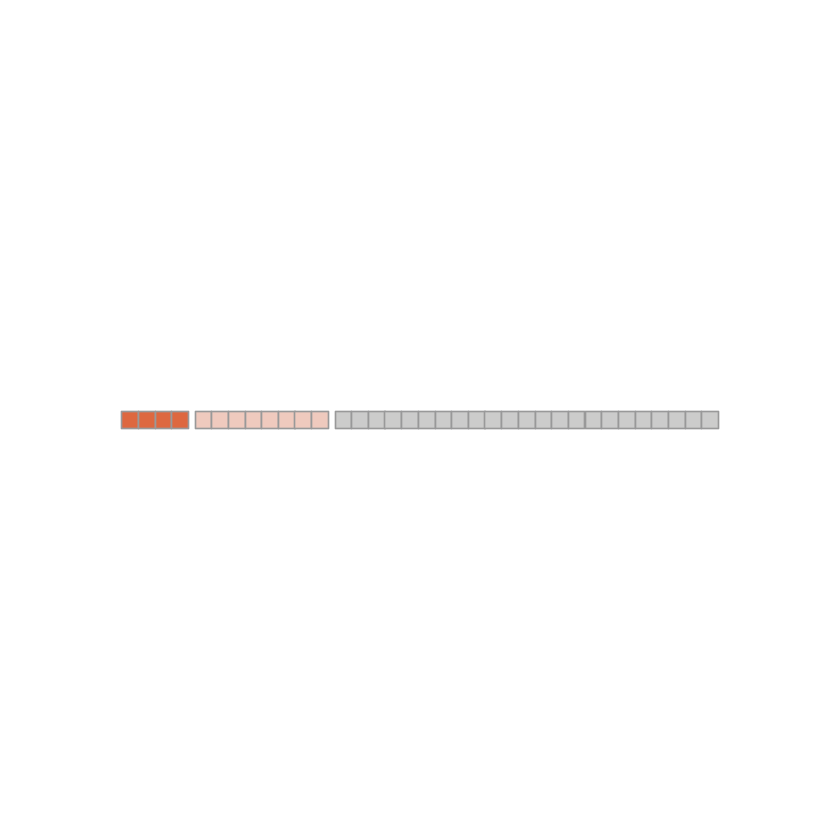

Joining, by = "reporter_id"
Joining, by = "feature"


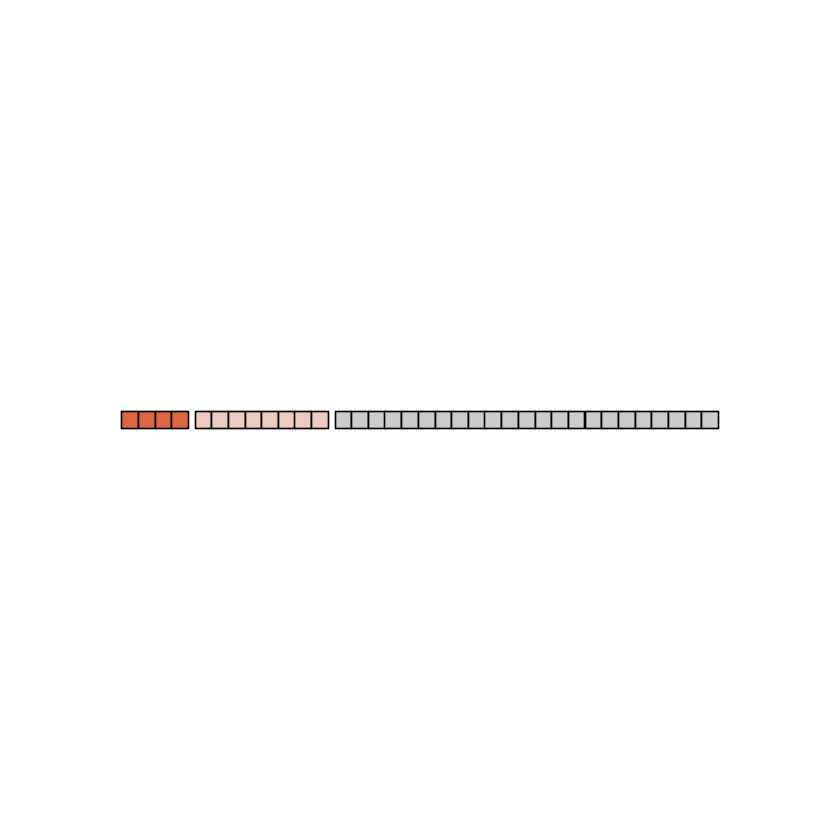

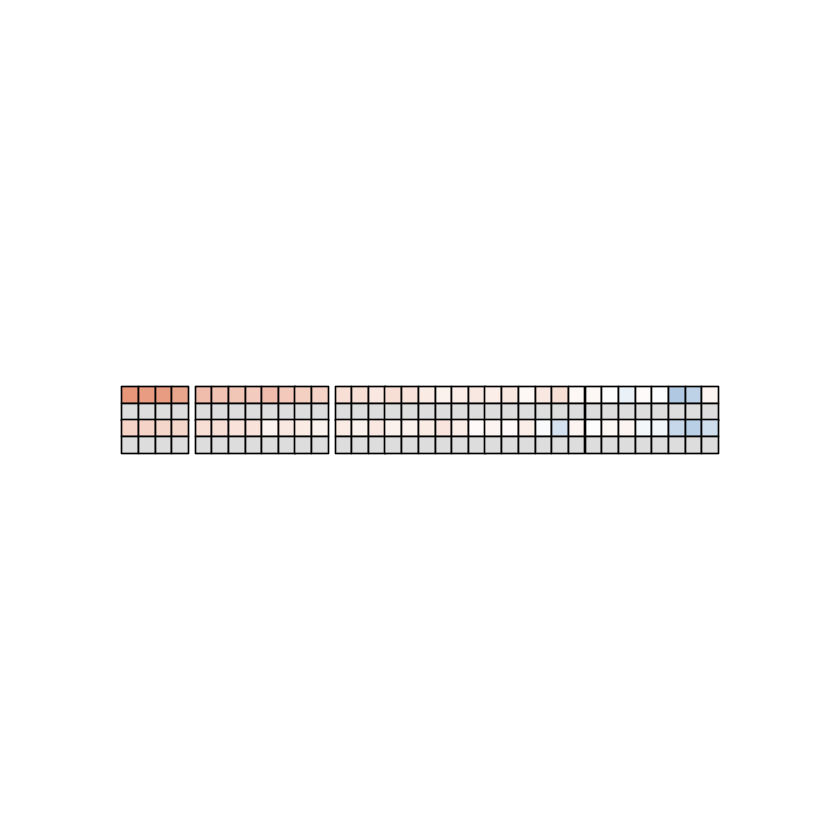

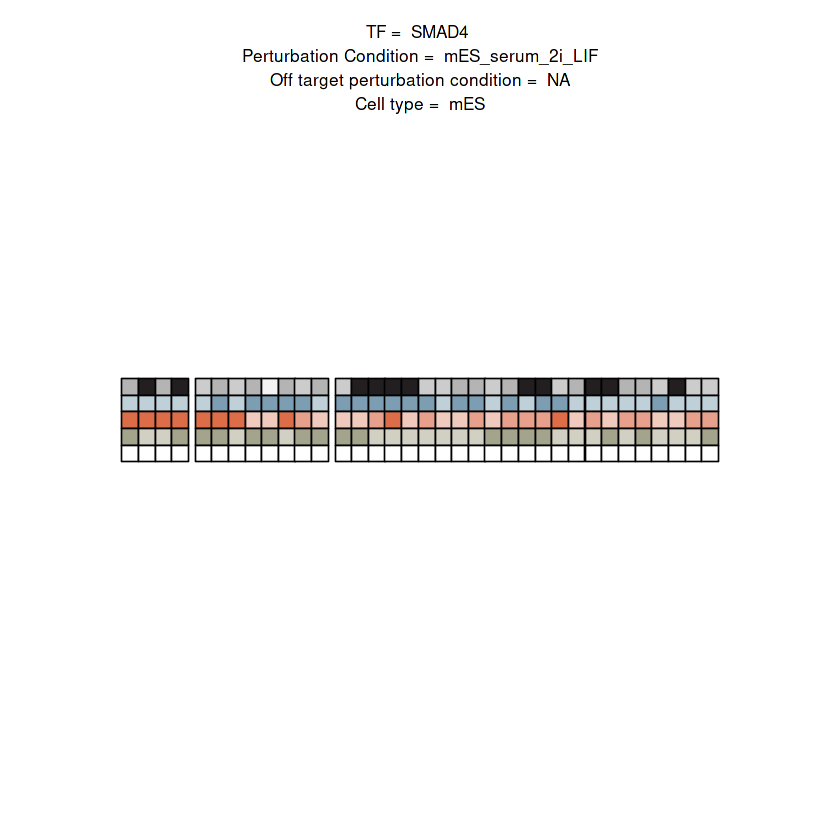

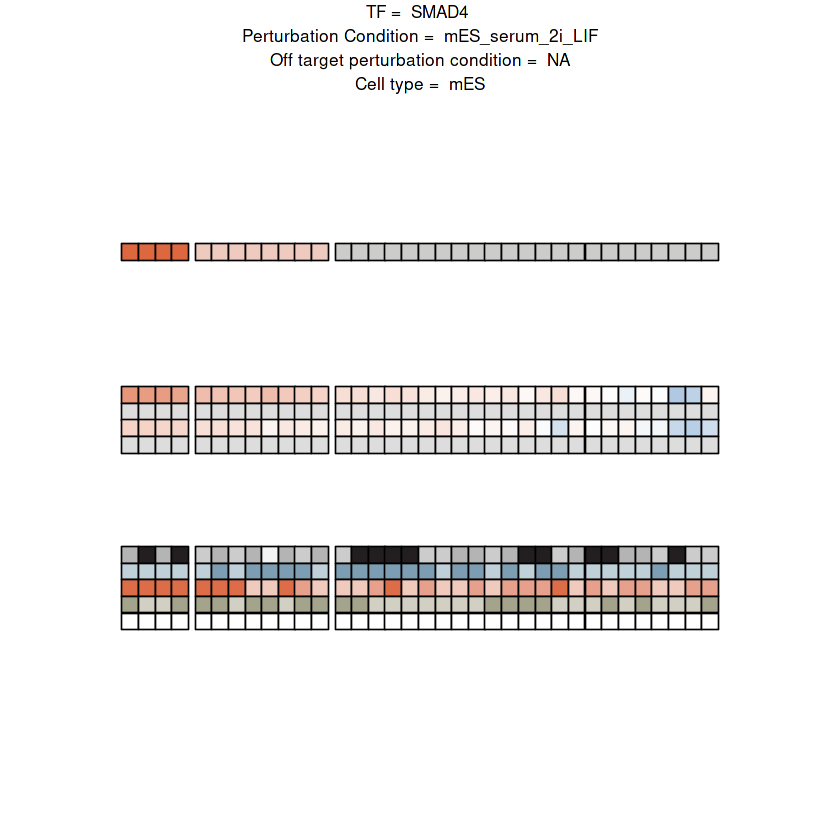

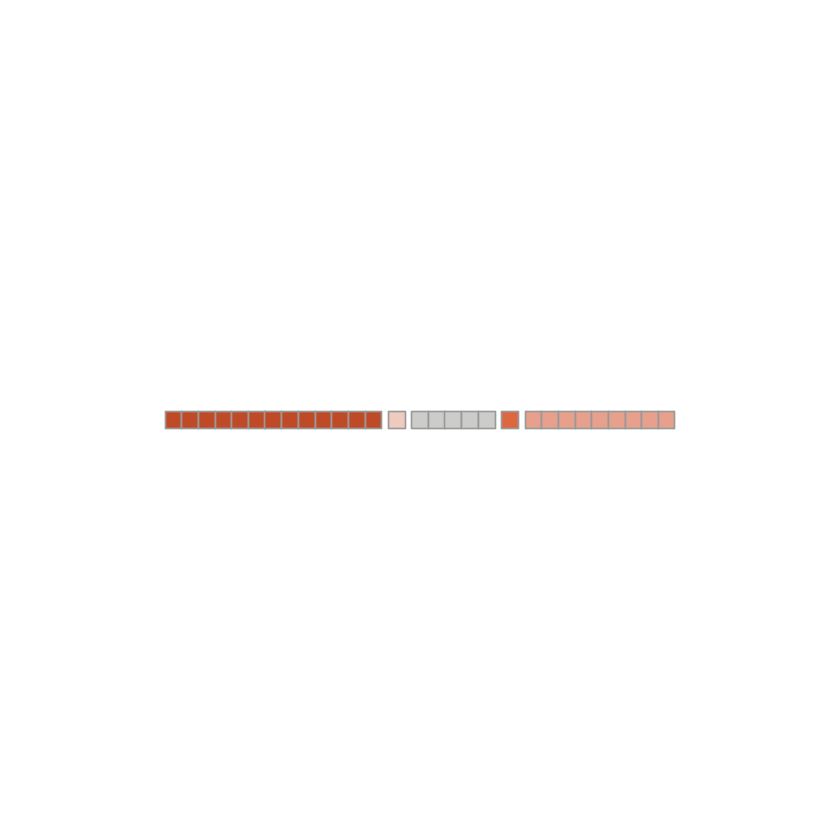

Joining, by = "reporter_id"
Joining, by = "feature"


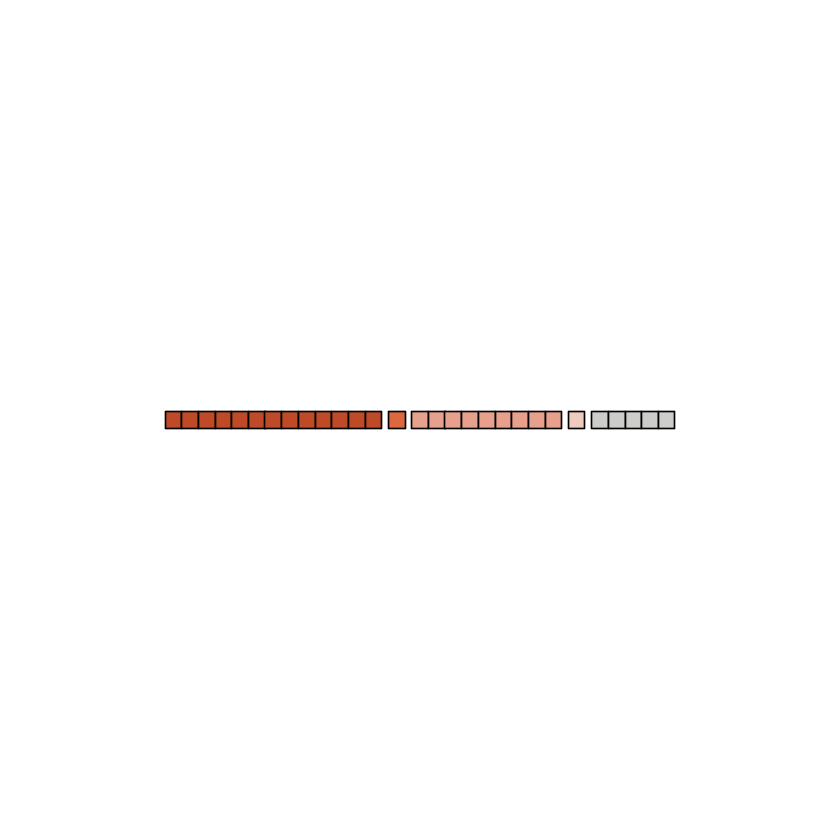

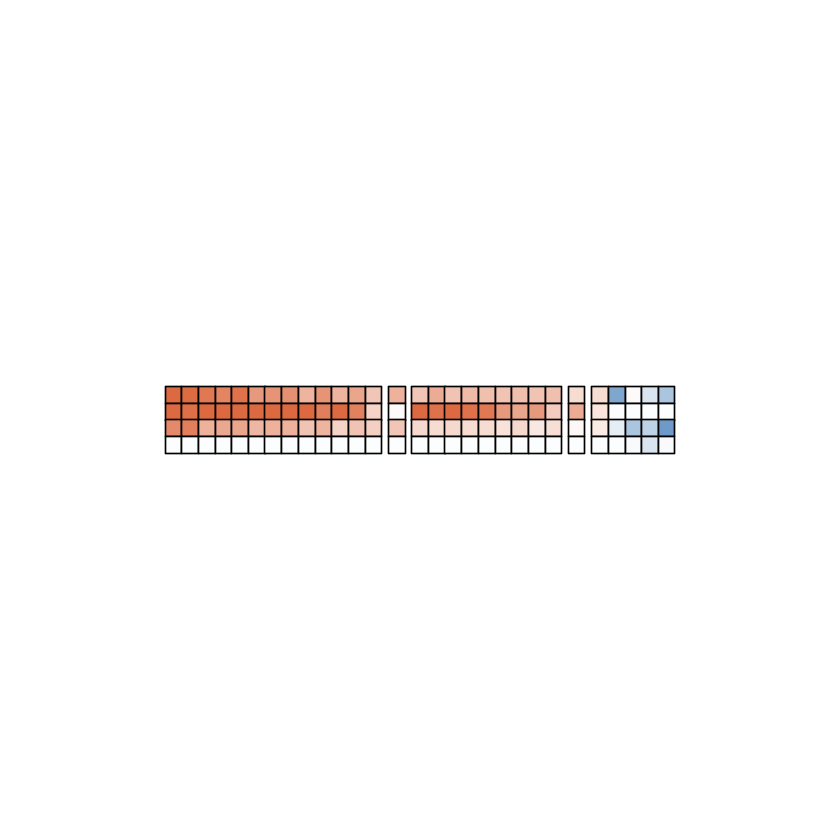

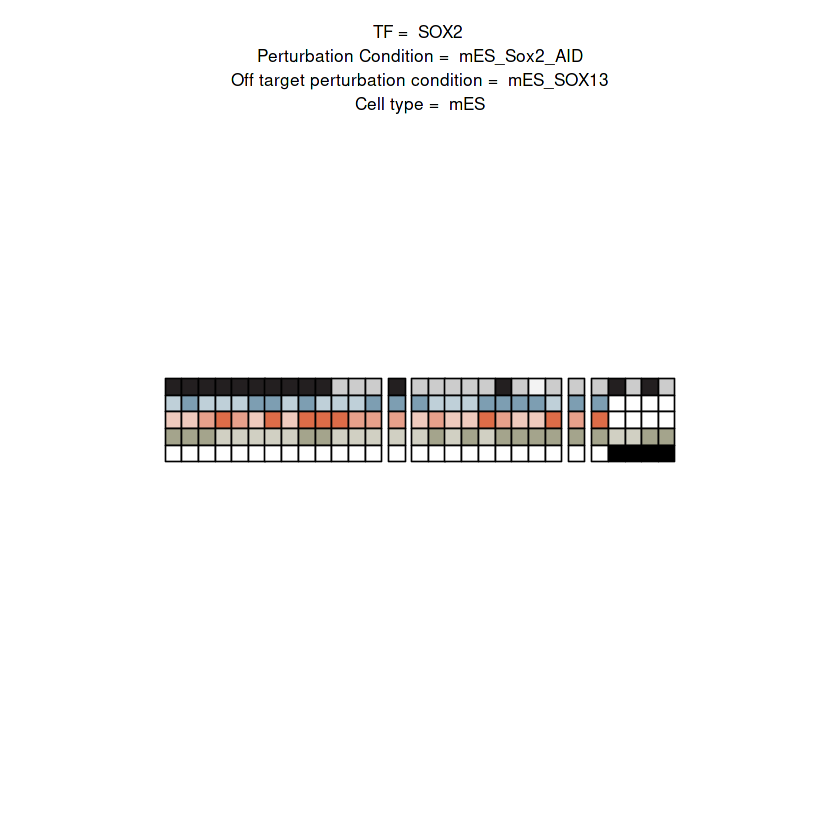

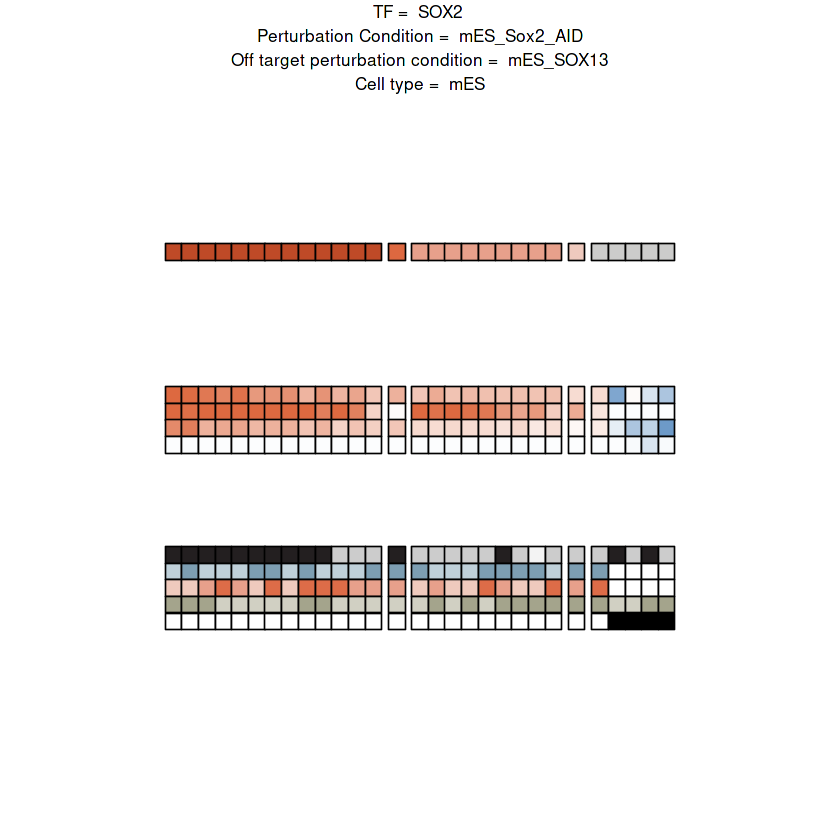

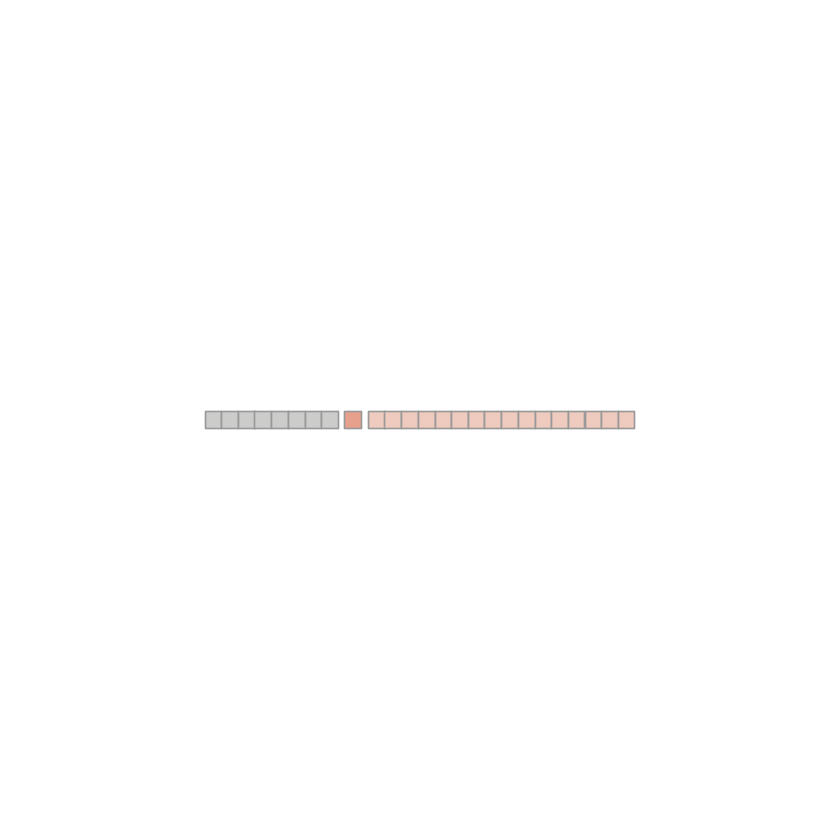

Joining, by = "reporter_id"
Joining, by = "feature"


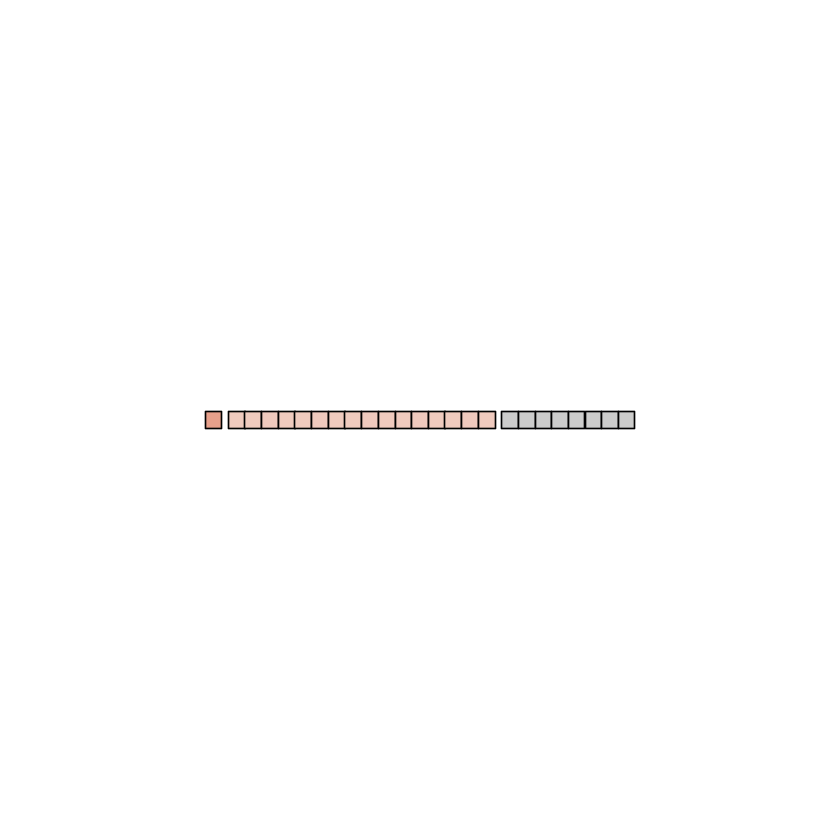

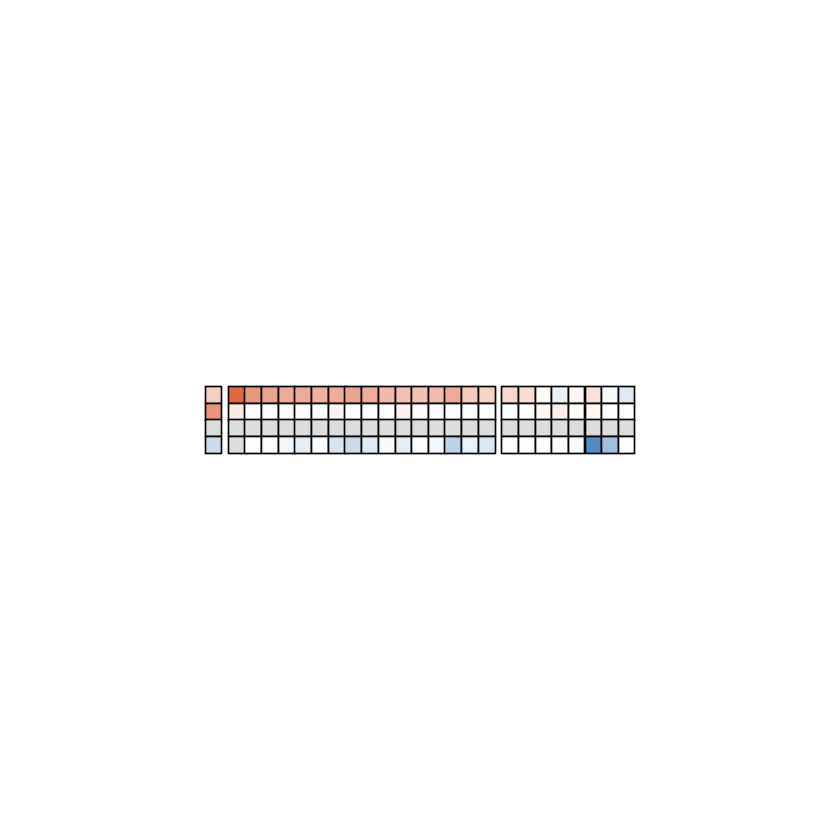

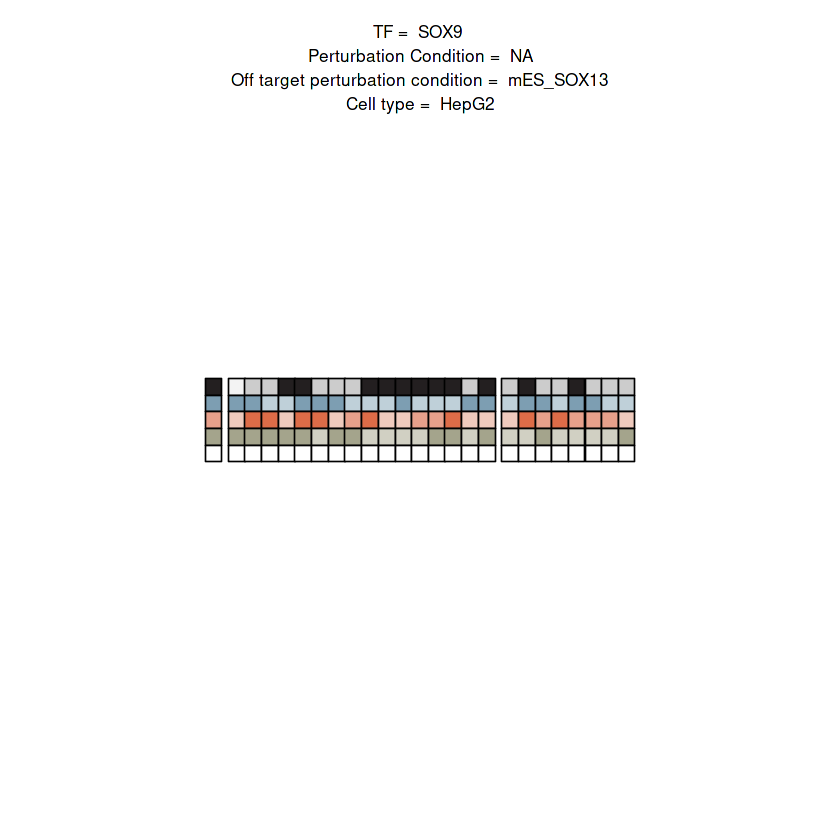

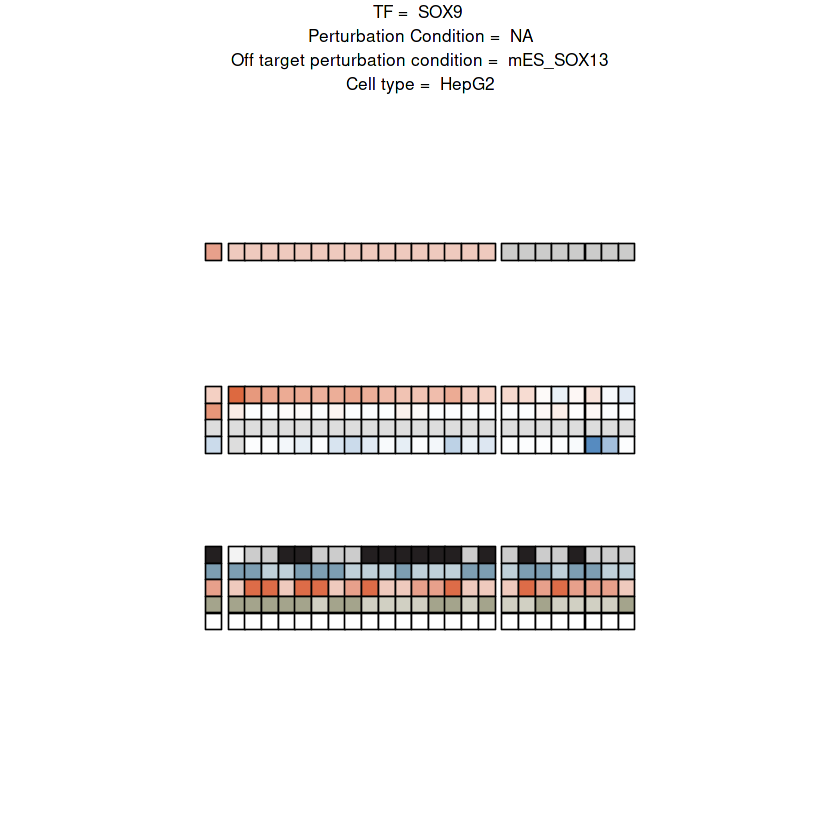

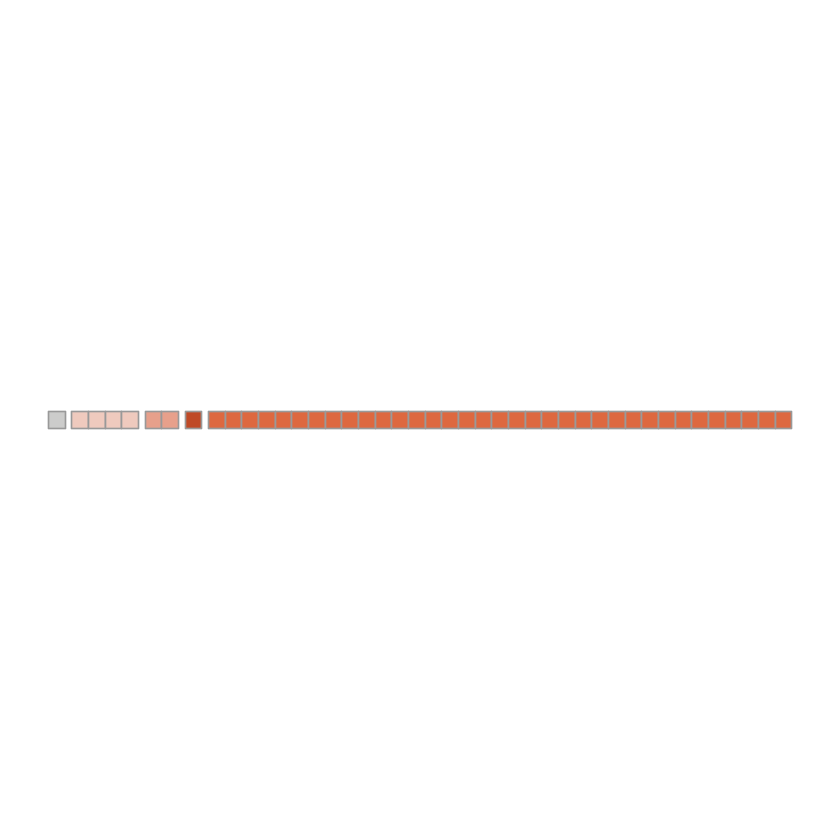

Joining, by = "reporter_id"
Joining, by = "feature"


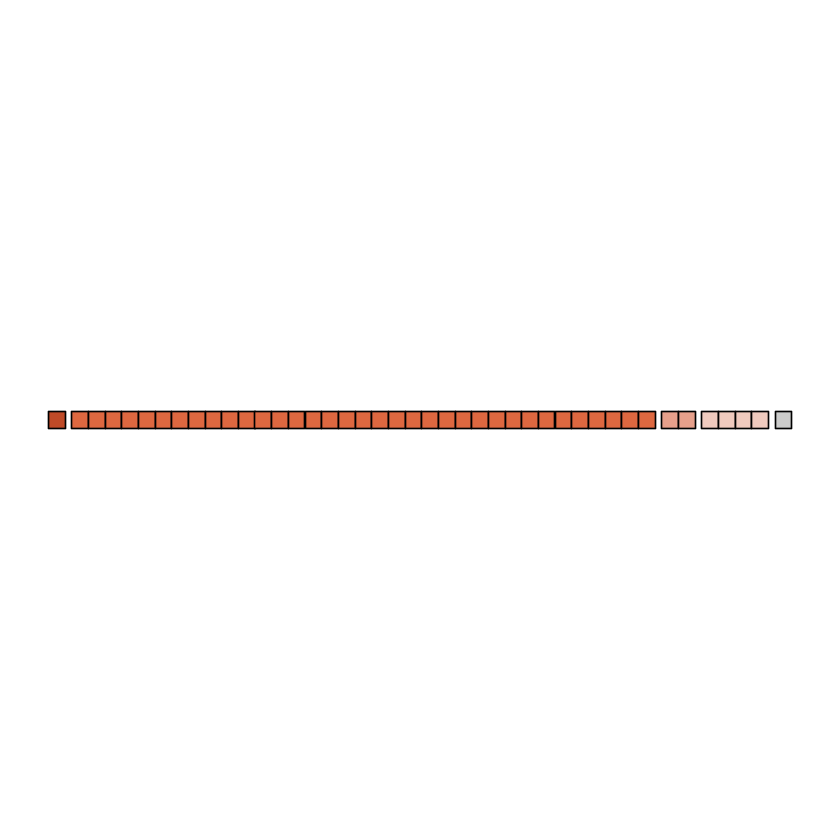

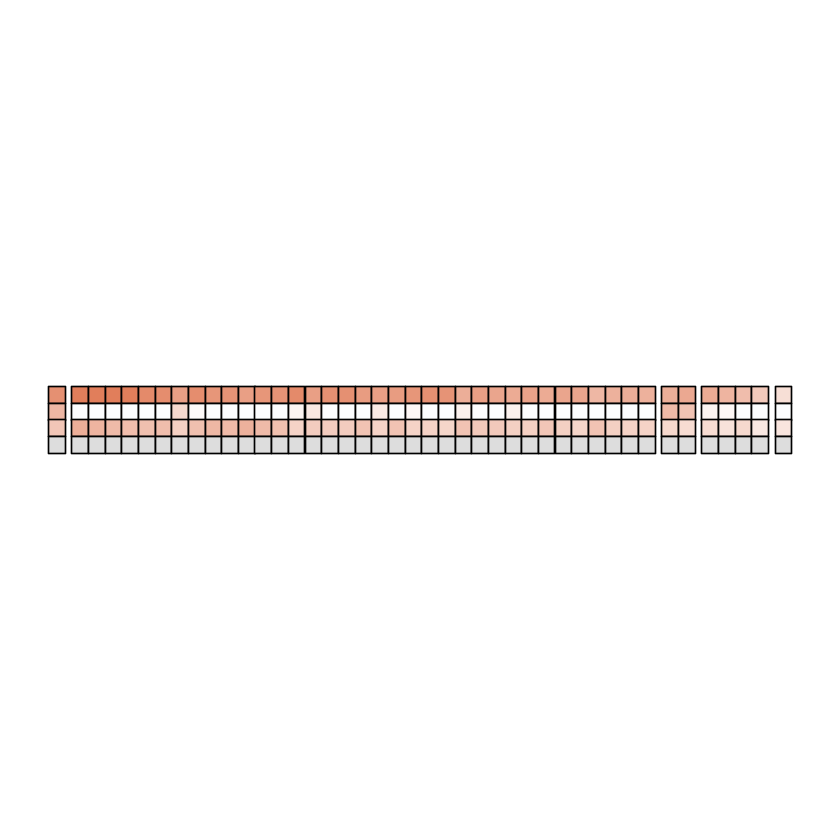

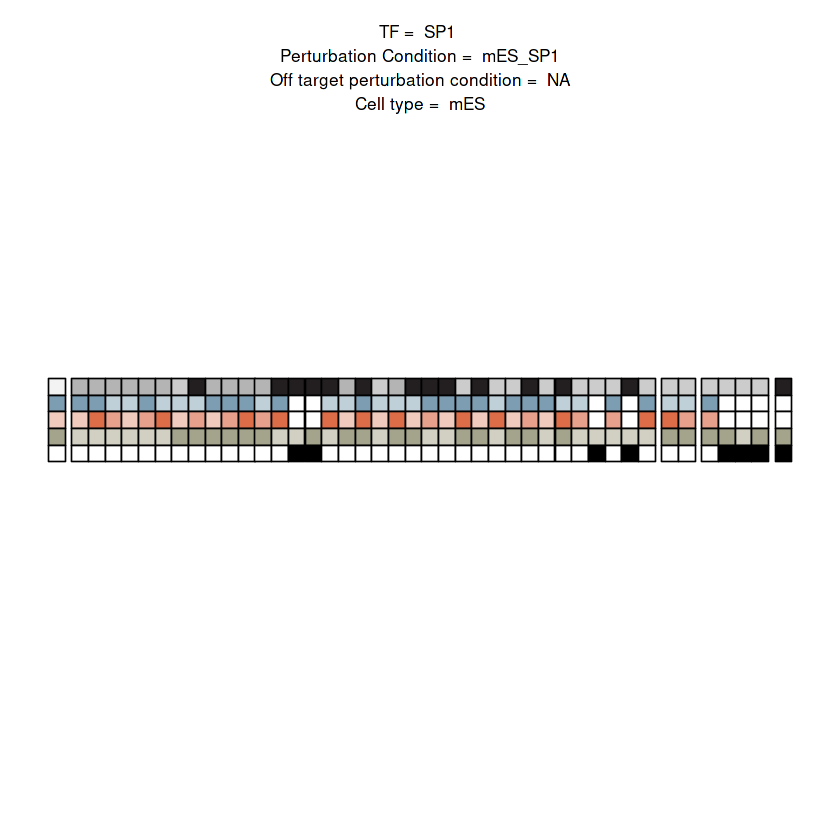

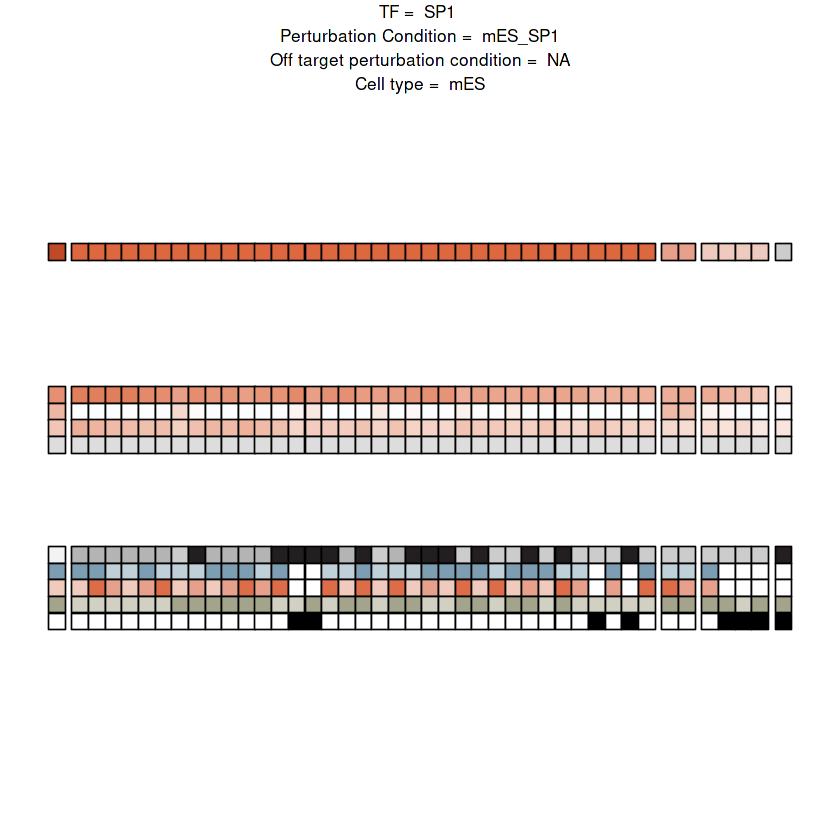

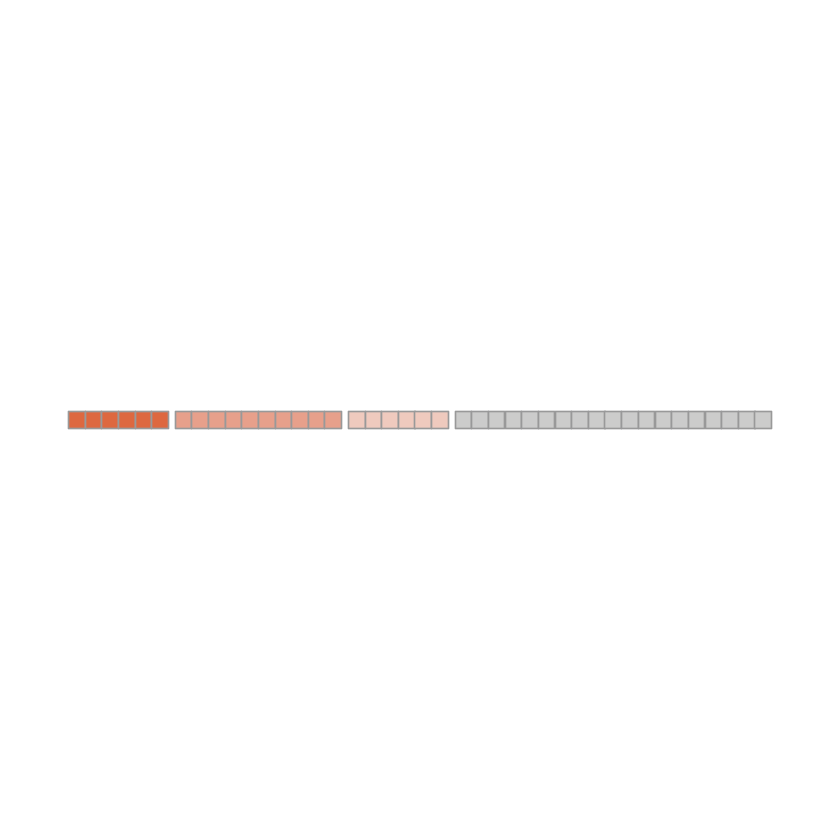

Joining, by = "reporter_id"
Joining, by = "feature"


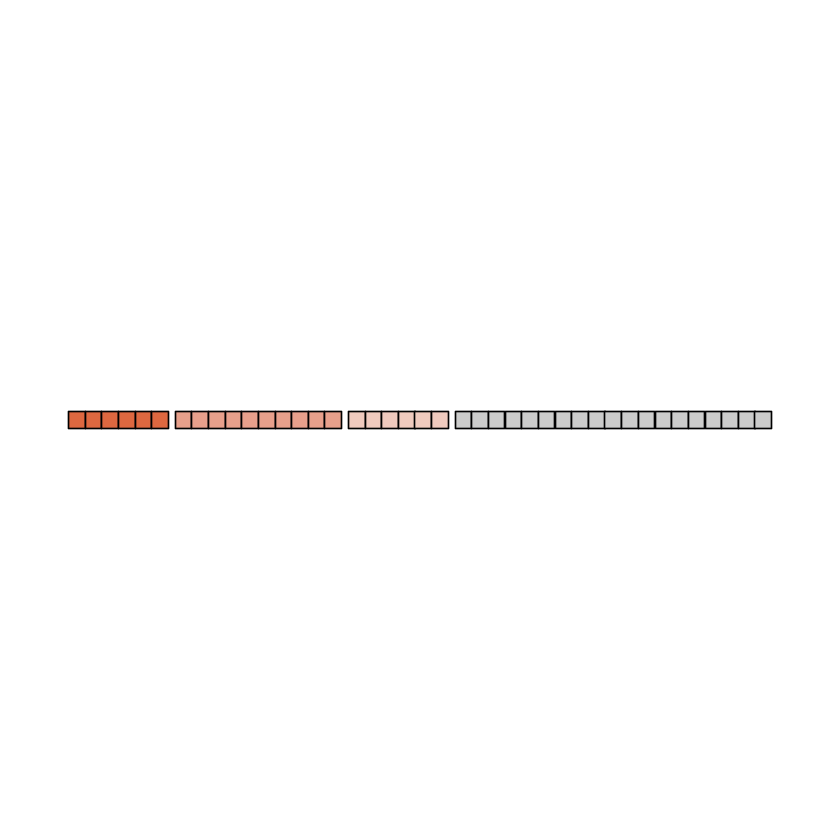

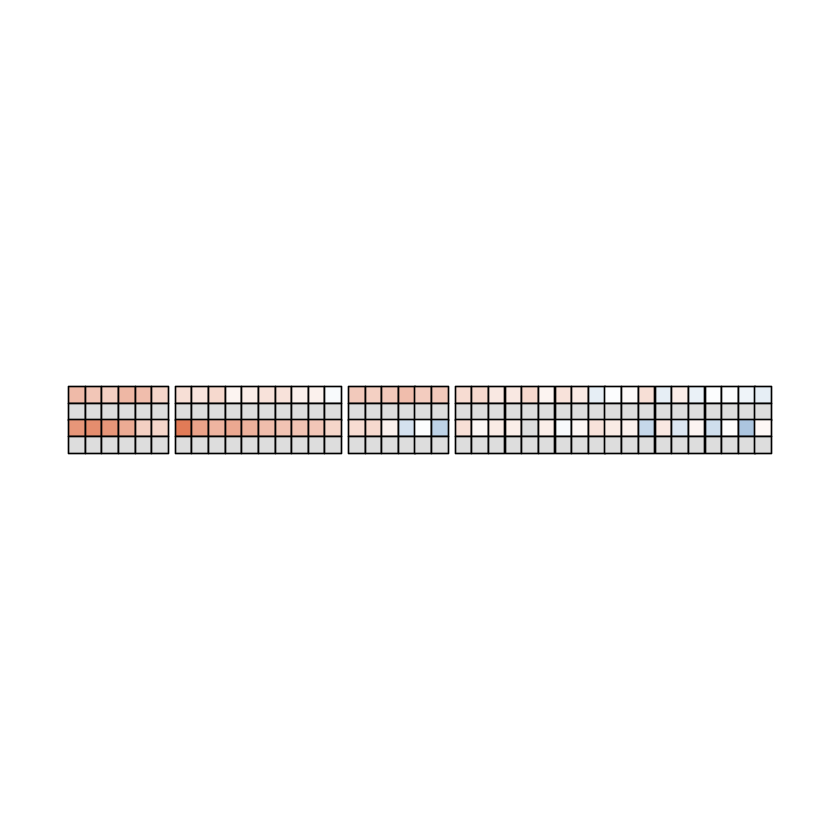

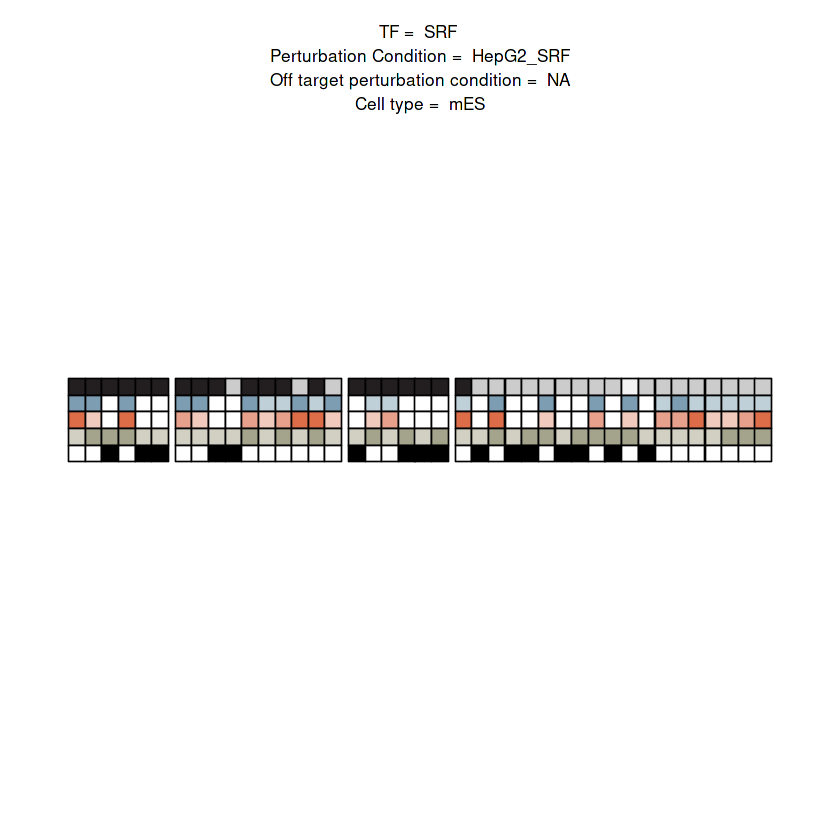

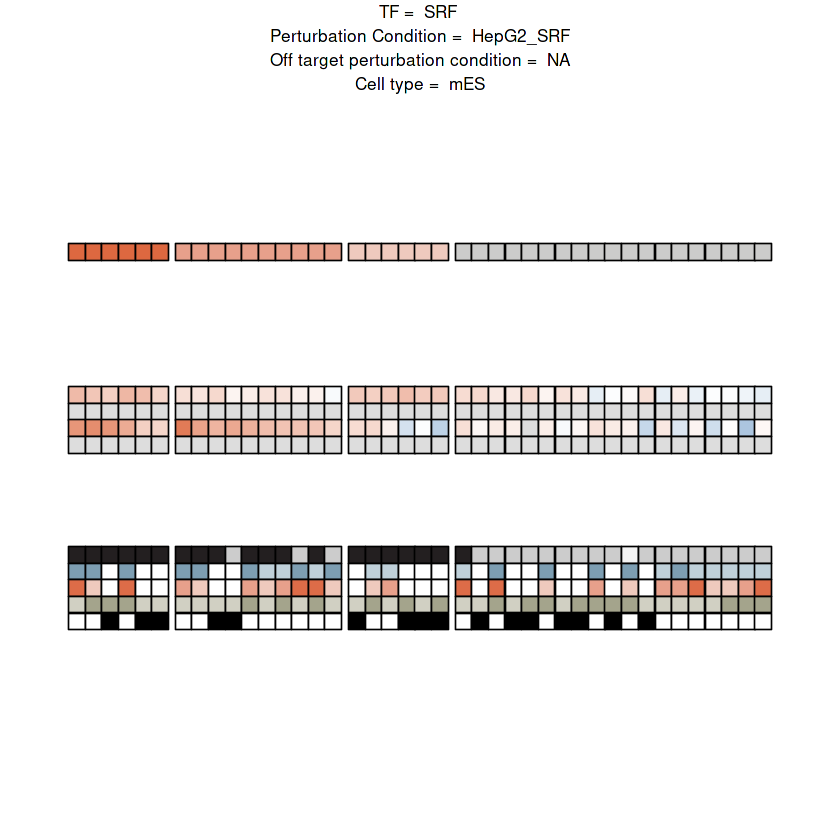

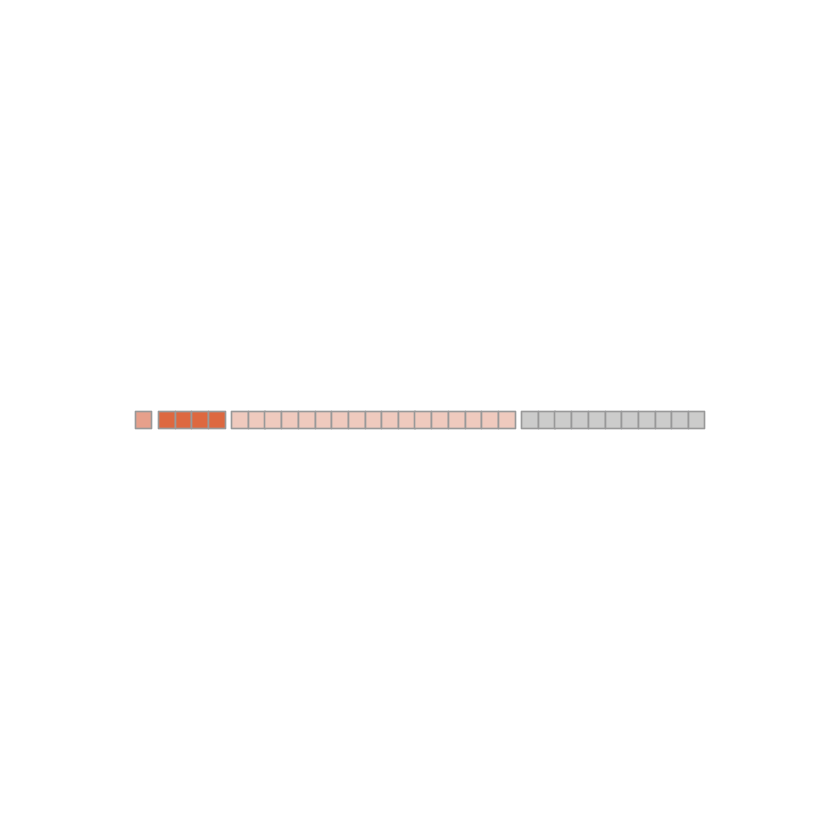

Joining, by = "reporter_id"
Joining, by = "feature"


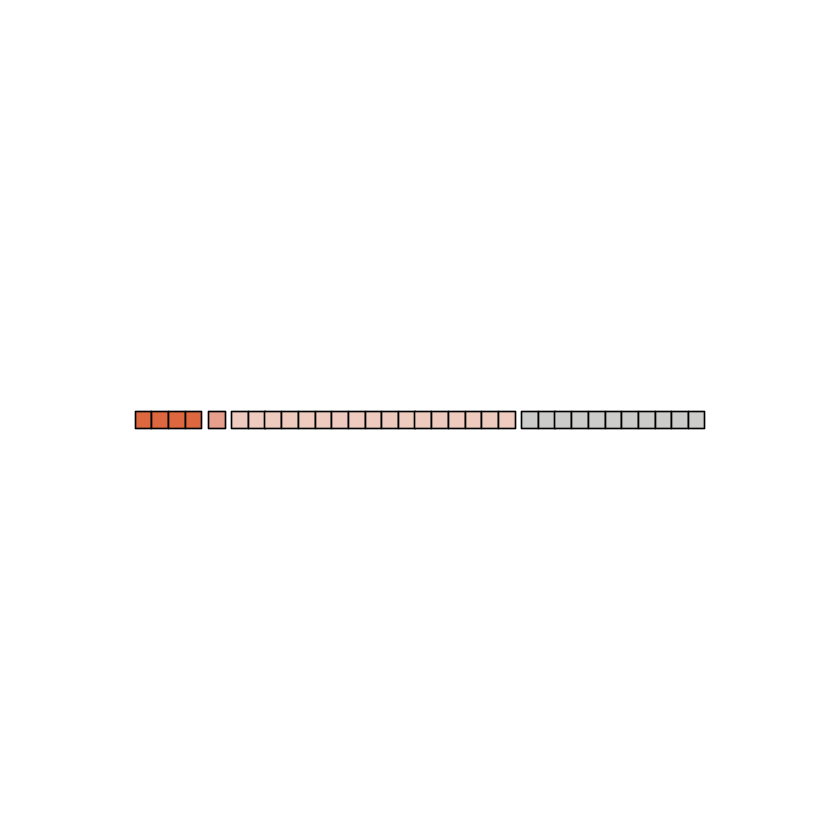

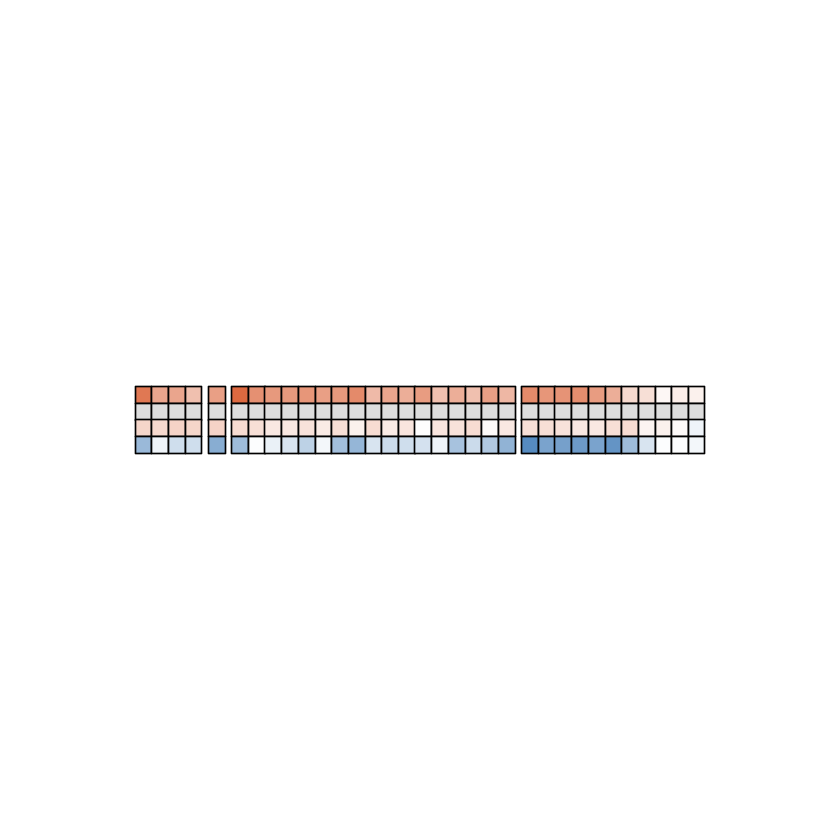

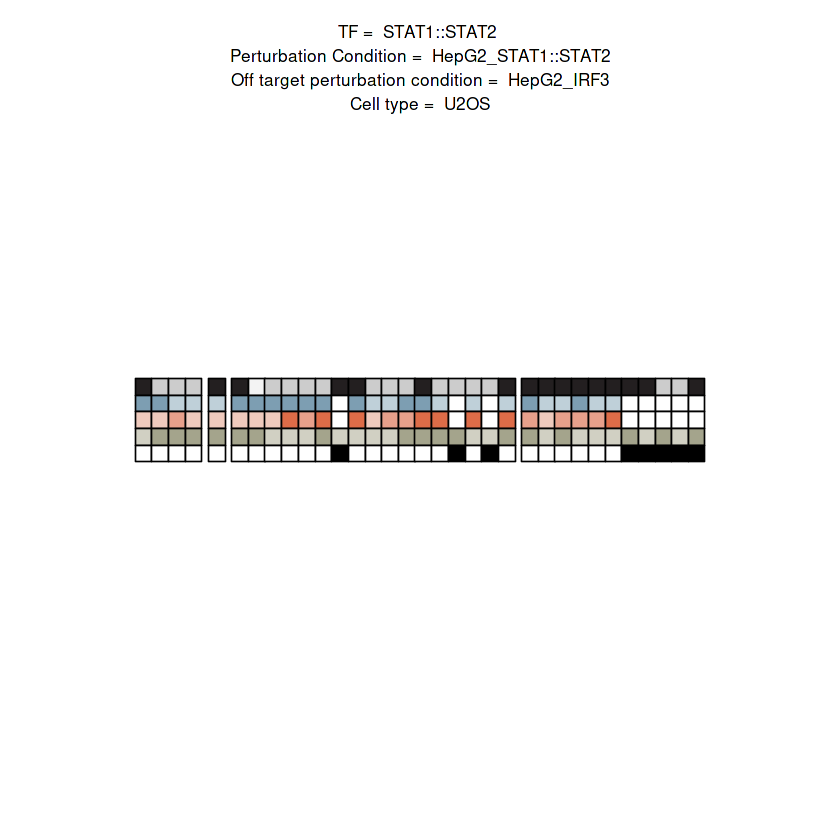

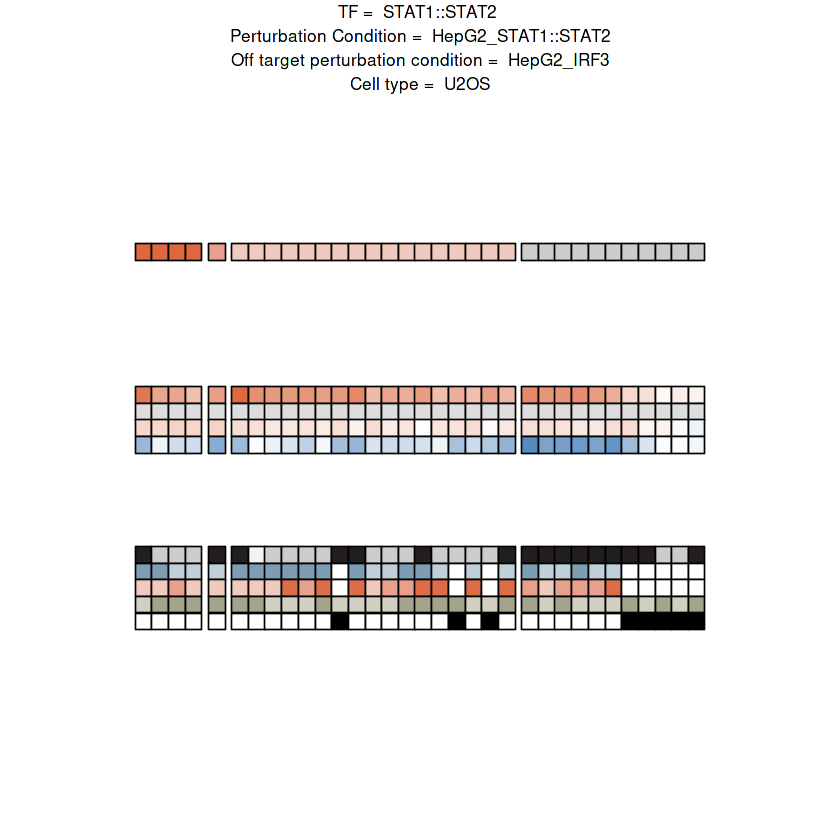

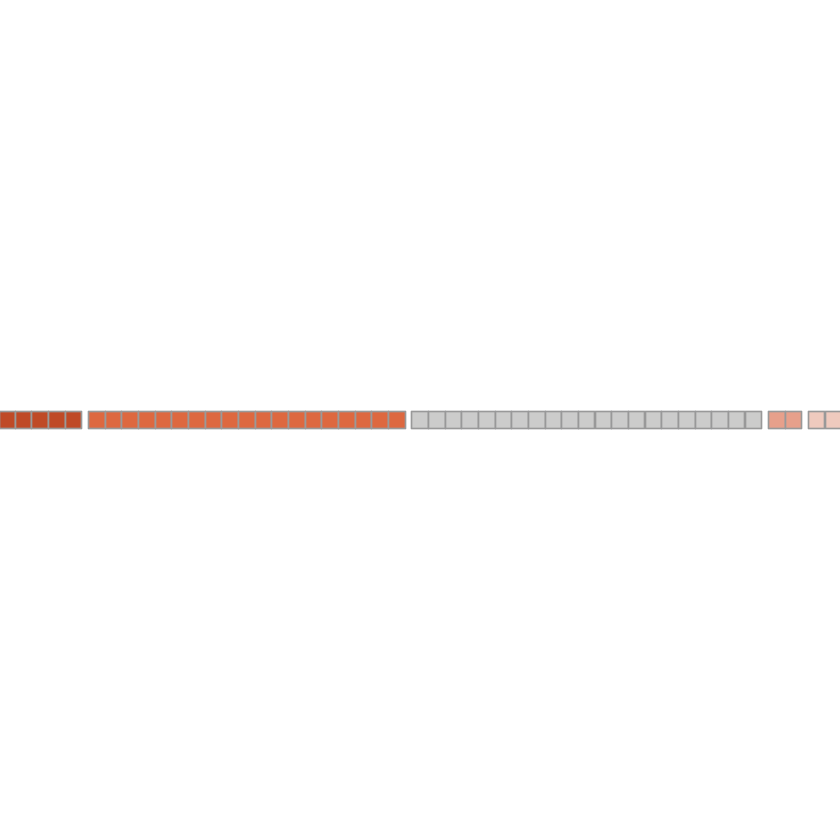

Joining, by = "reporter_id"
Joining, by = "feature"


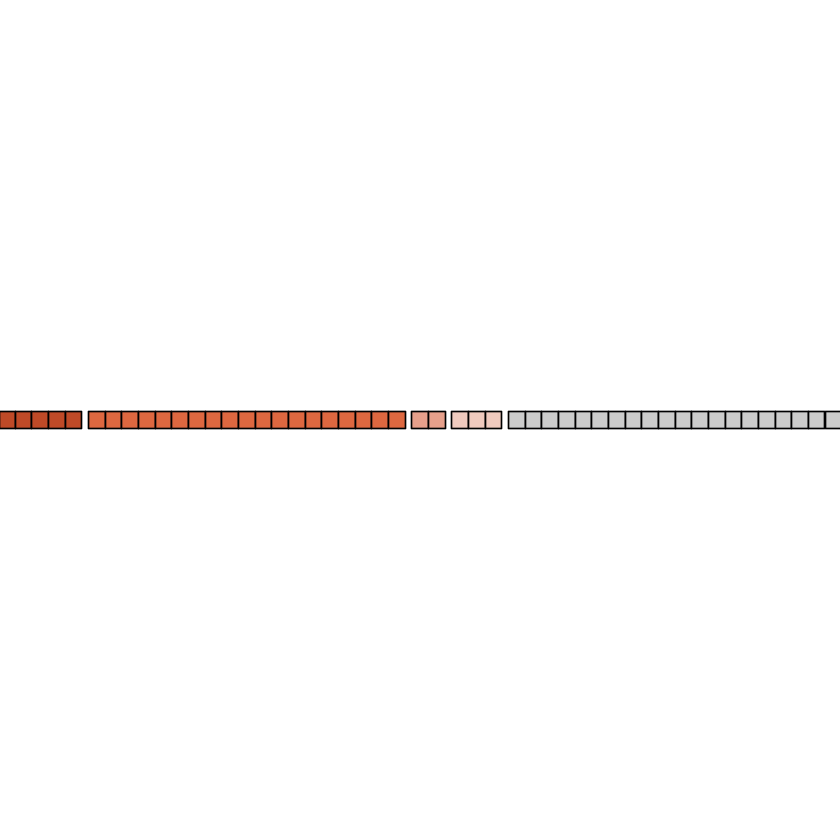

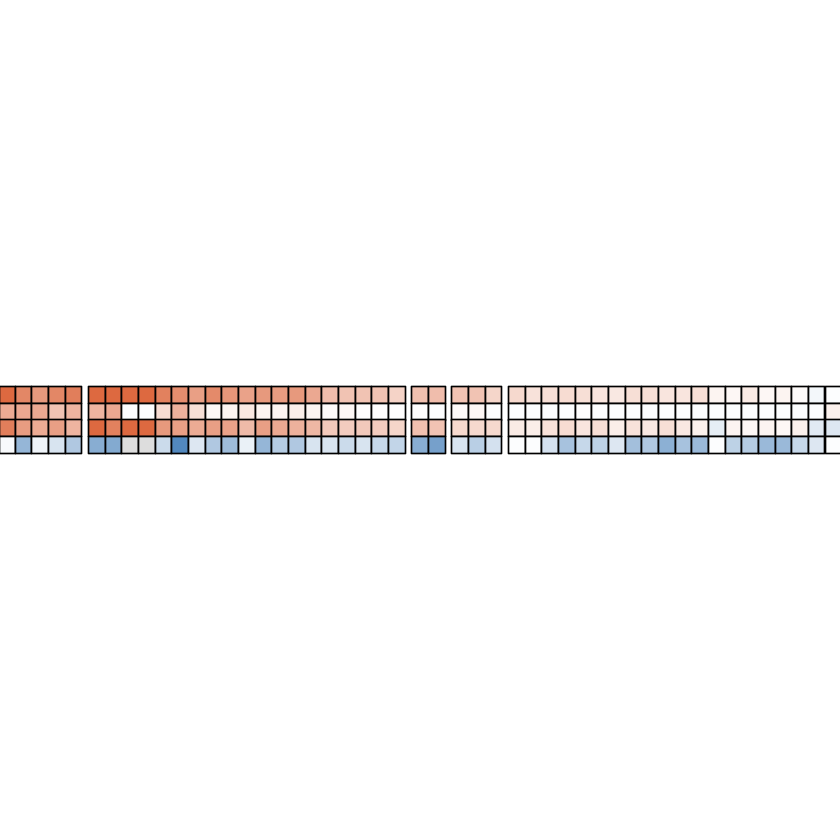

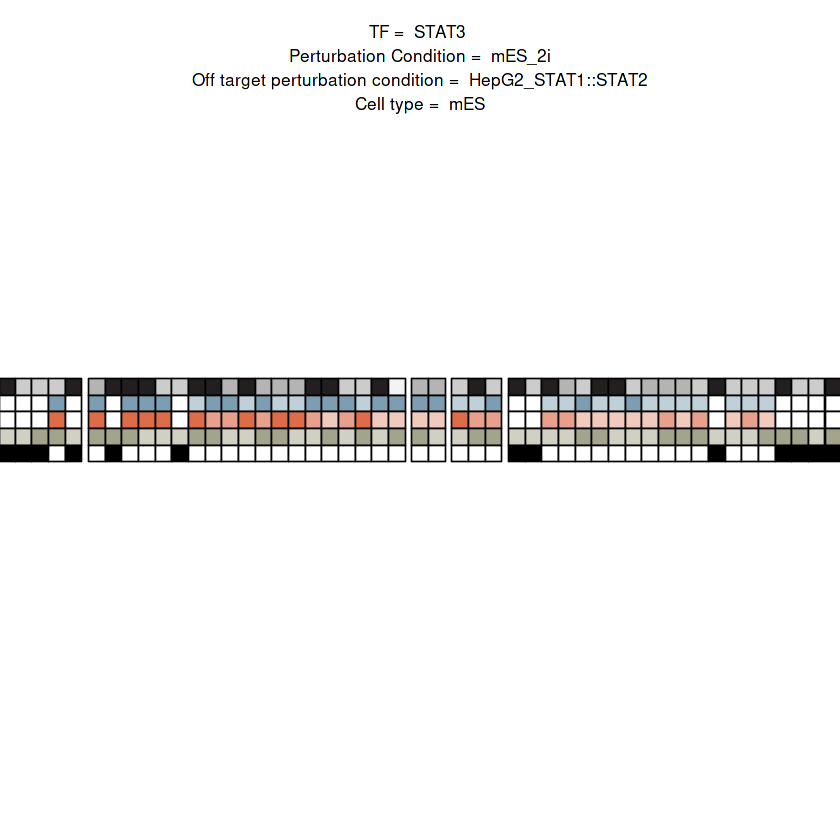

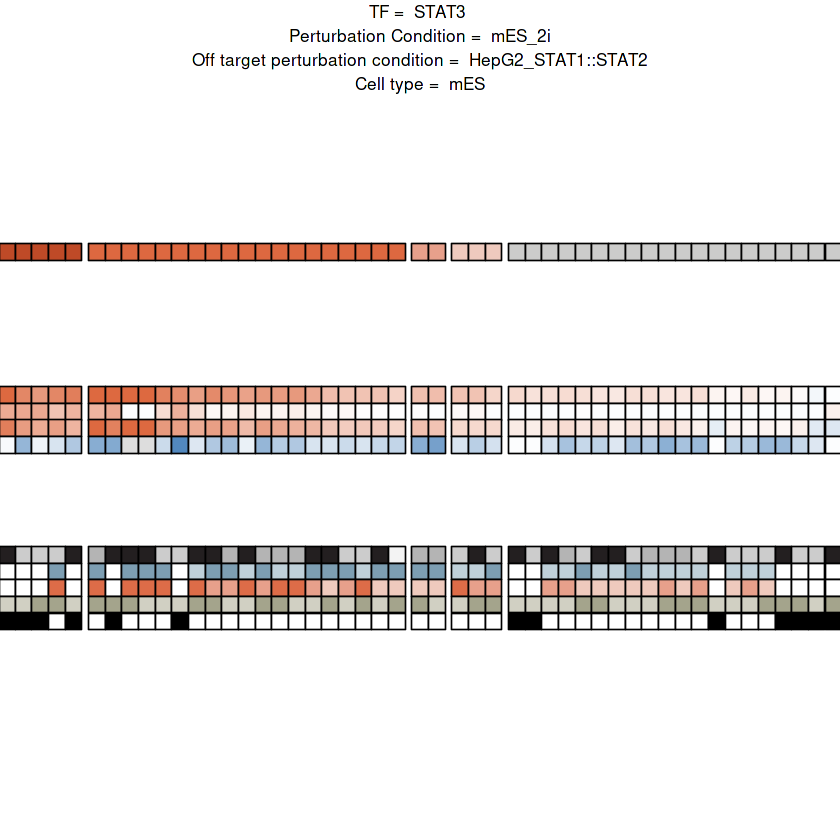

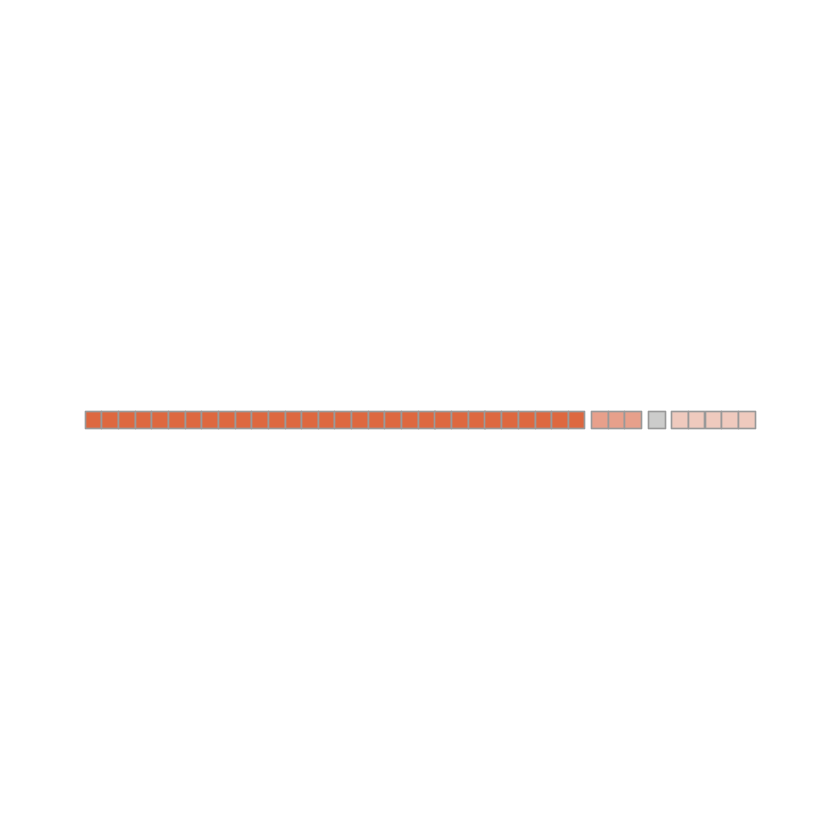

Joining, by = "reporter_id"
Joining, by = "feature"


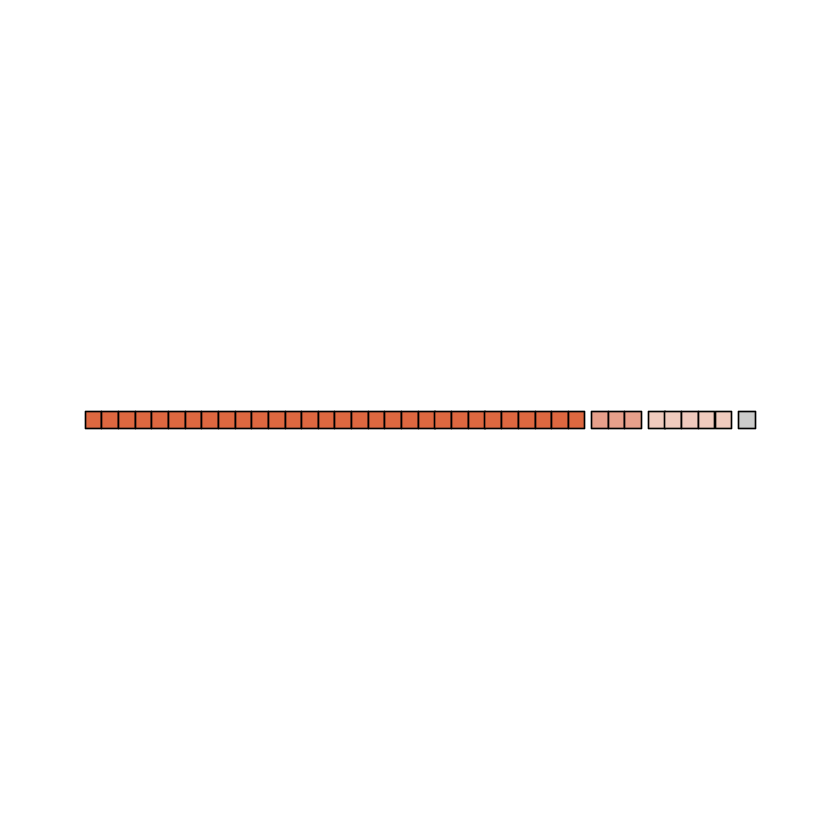

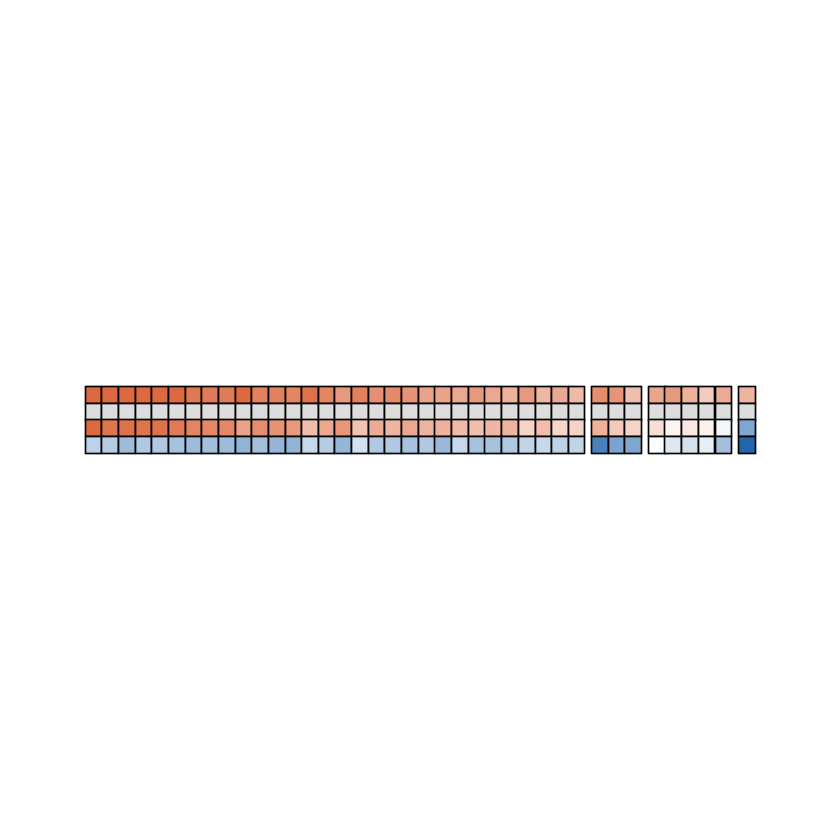

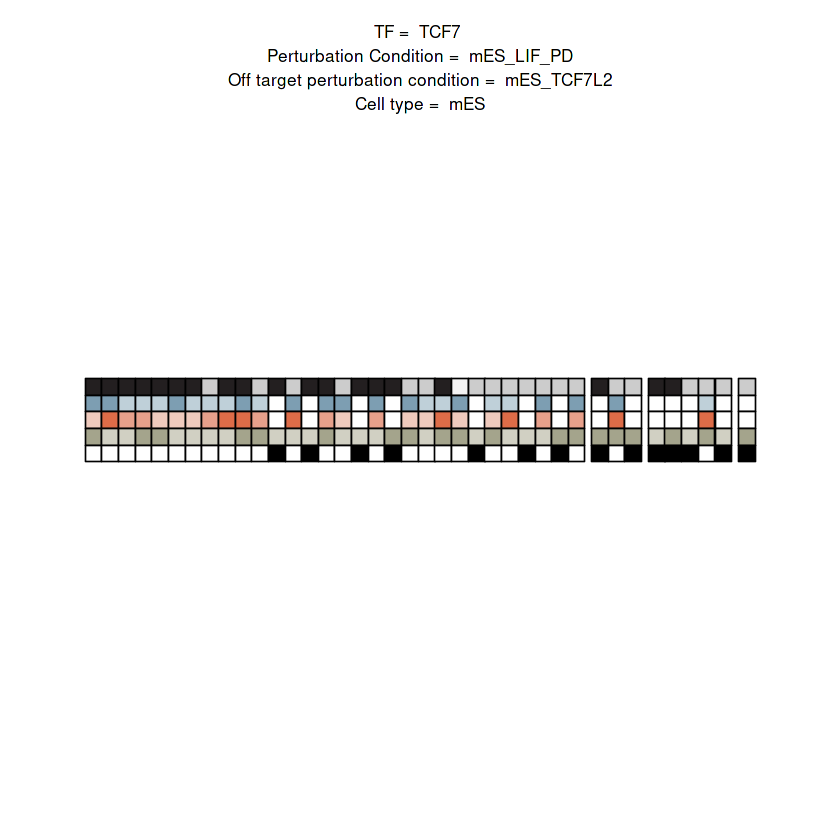

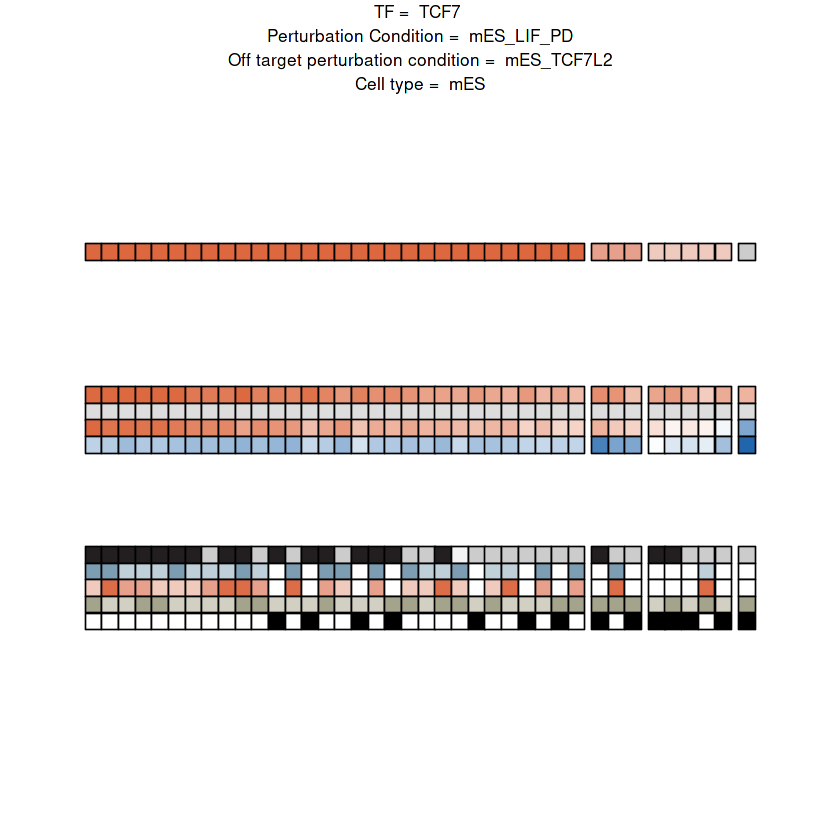

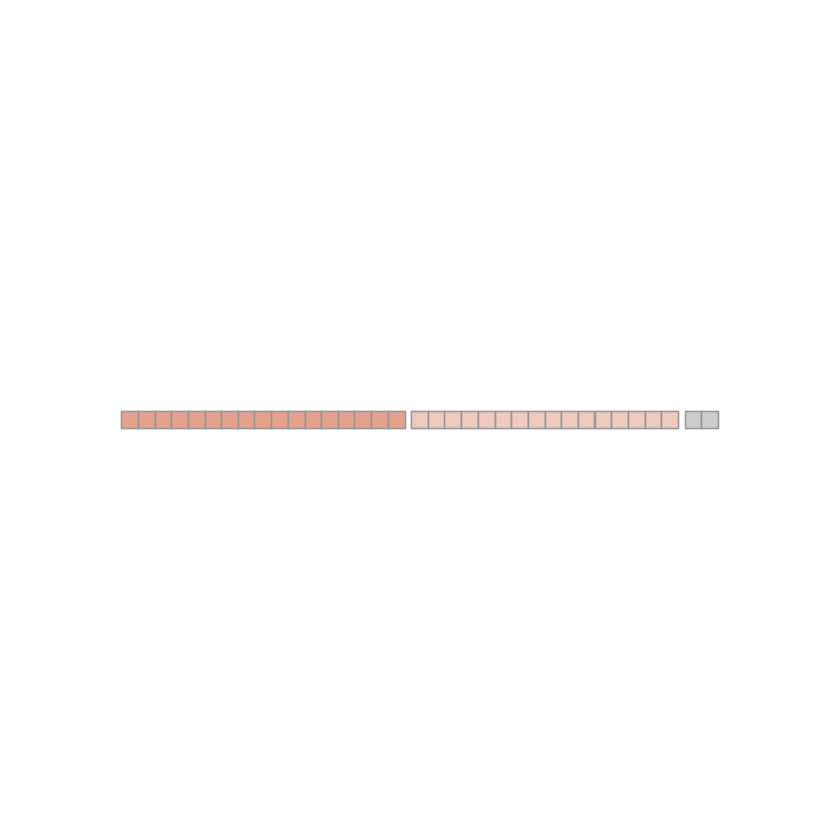

Joining, by = "reporter_id"
Joining, by = "feature"


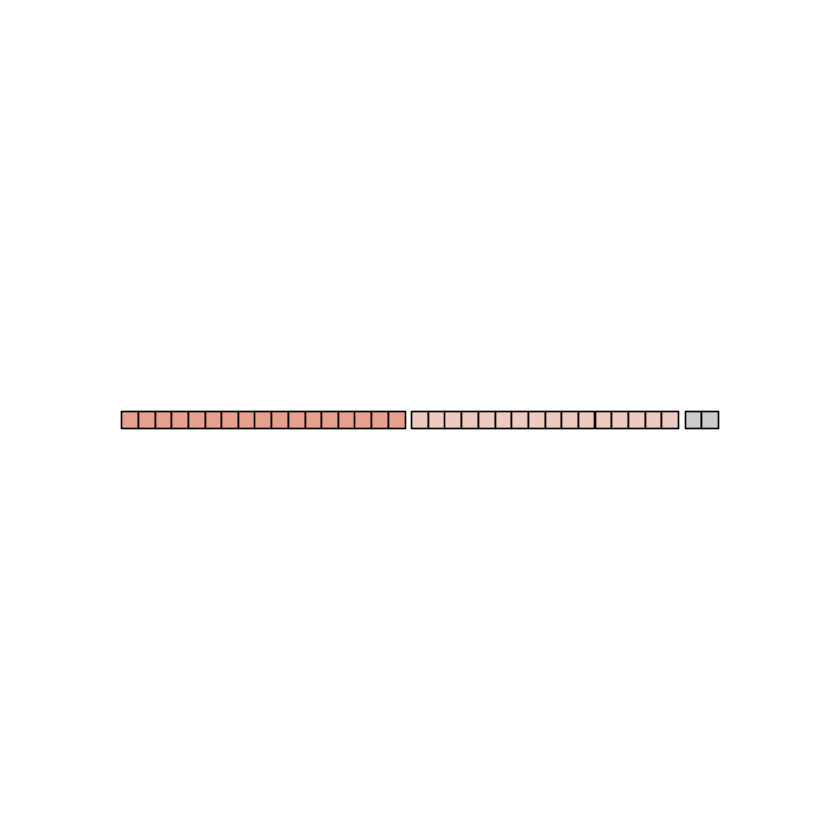

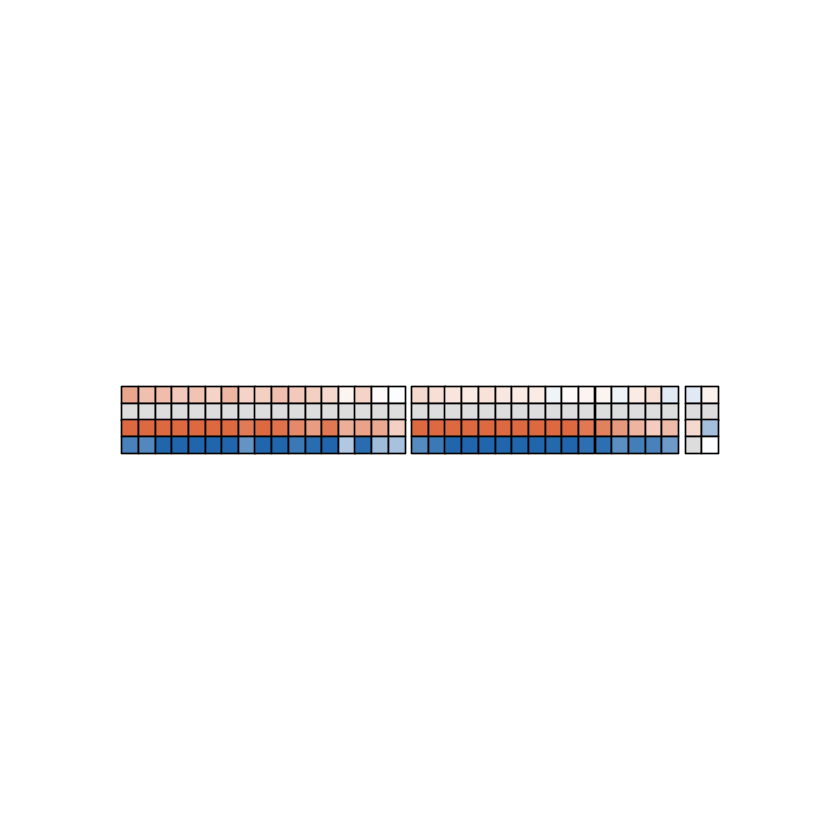

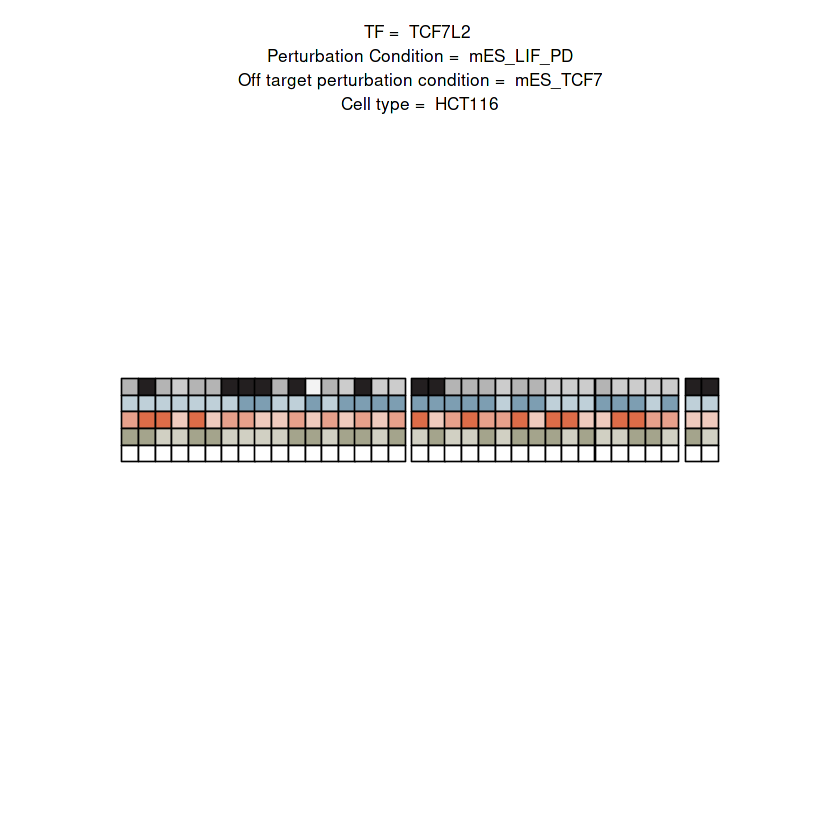

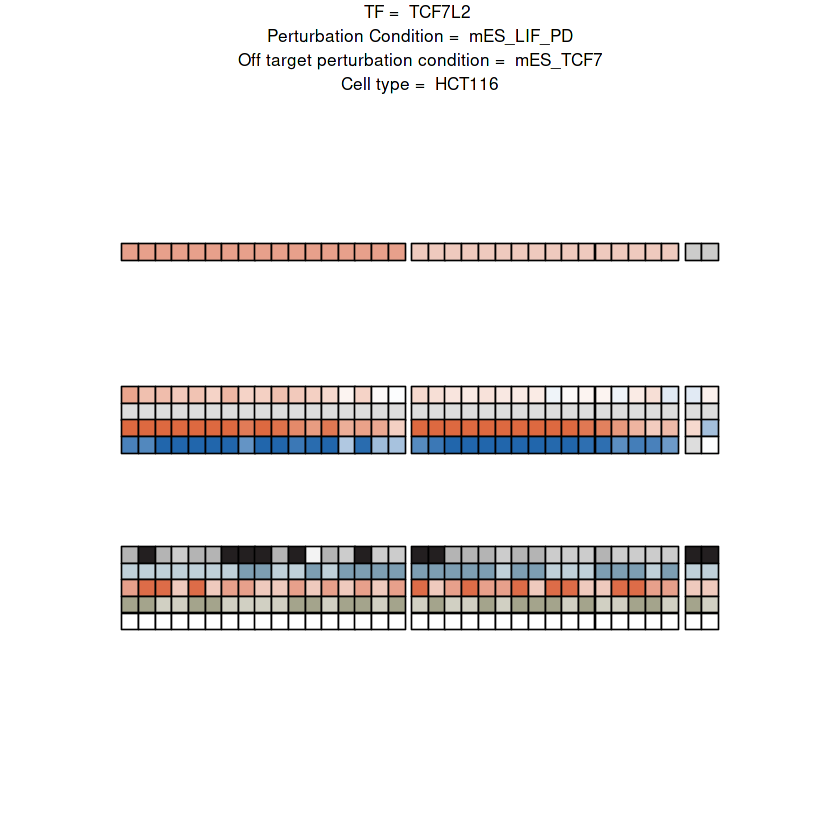

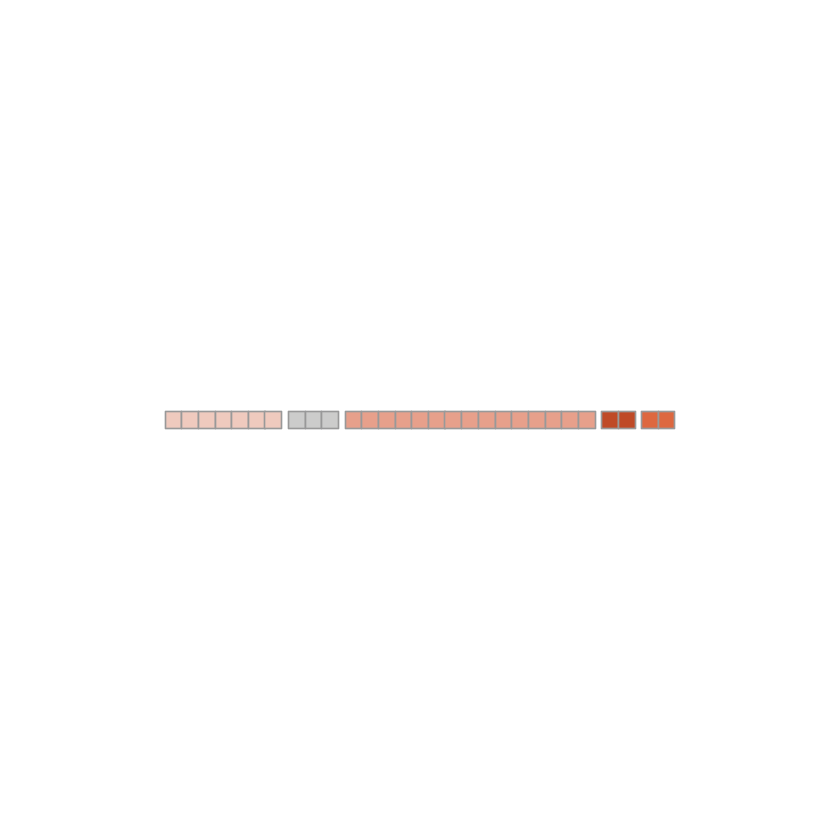

Joining, by = "reporter_id"
Joining, by = "feature"


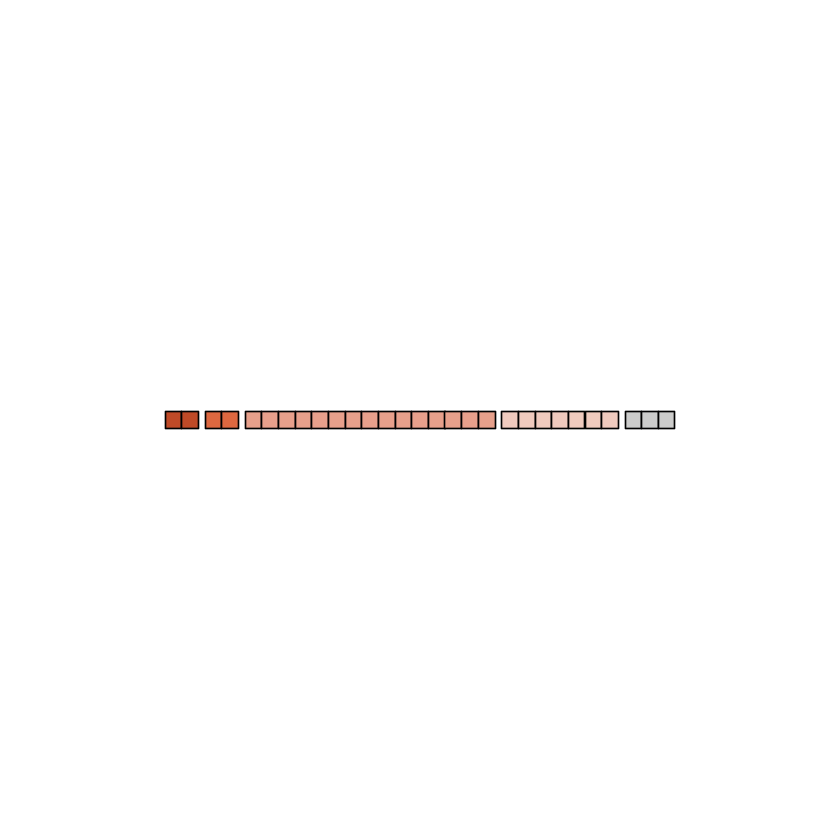

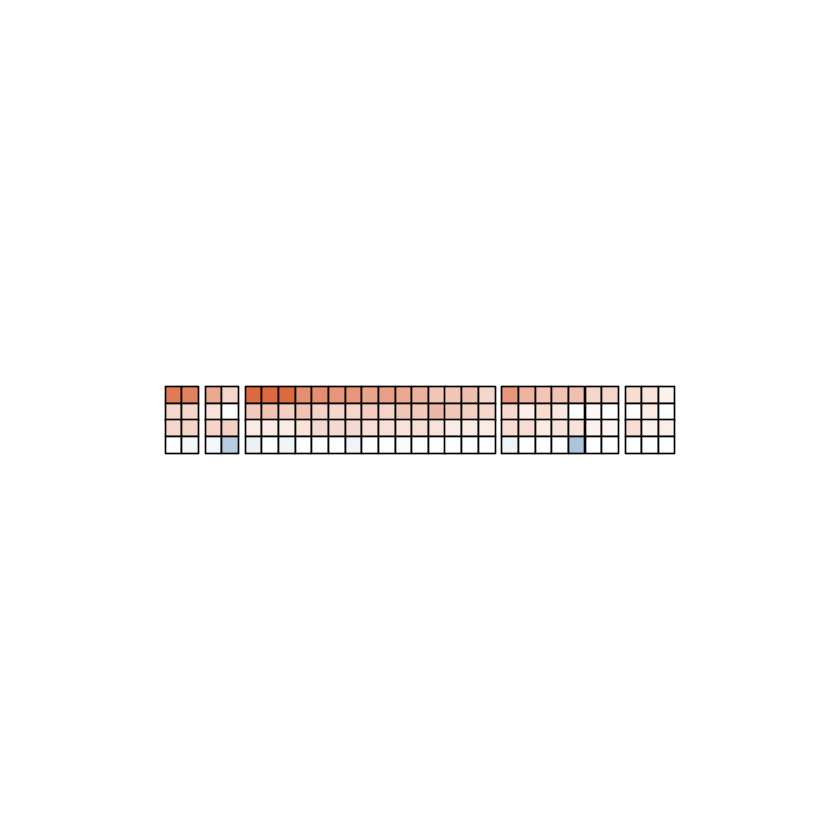

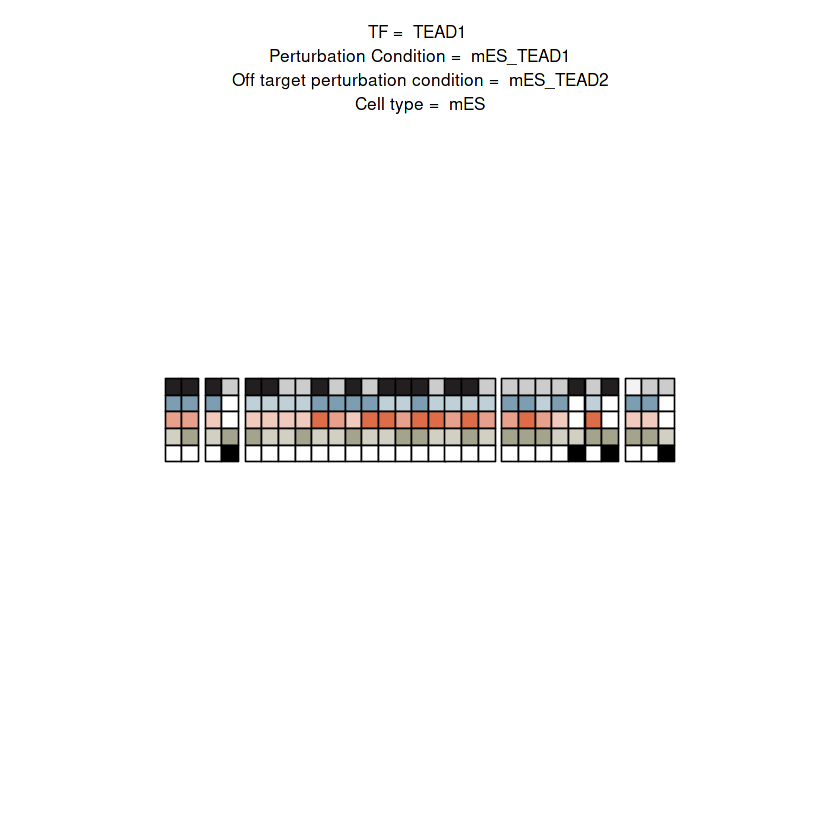

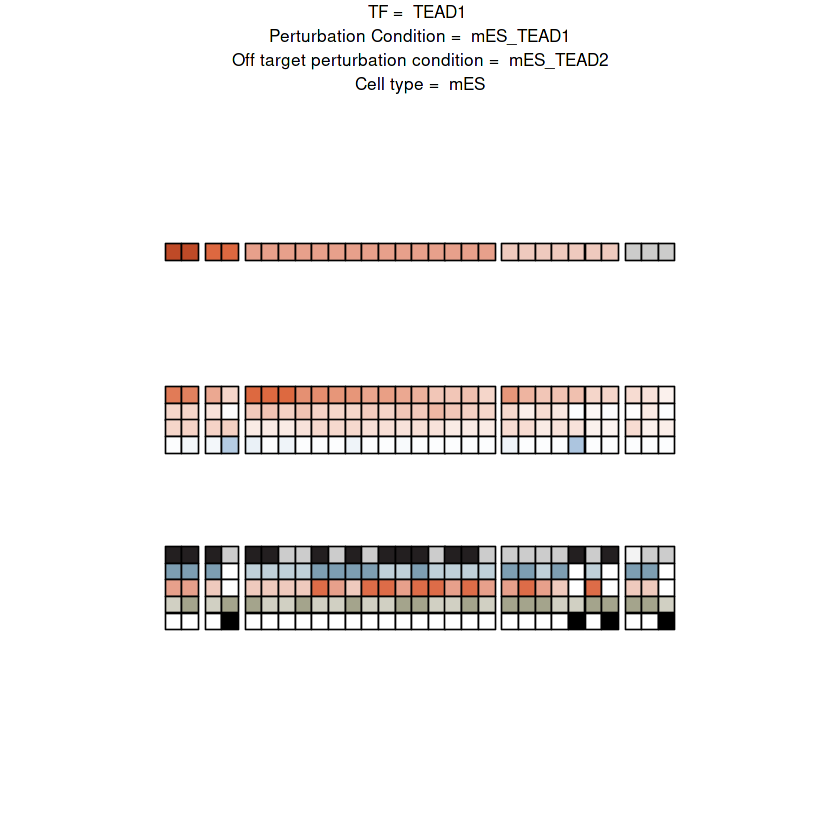

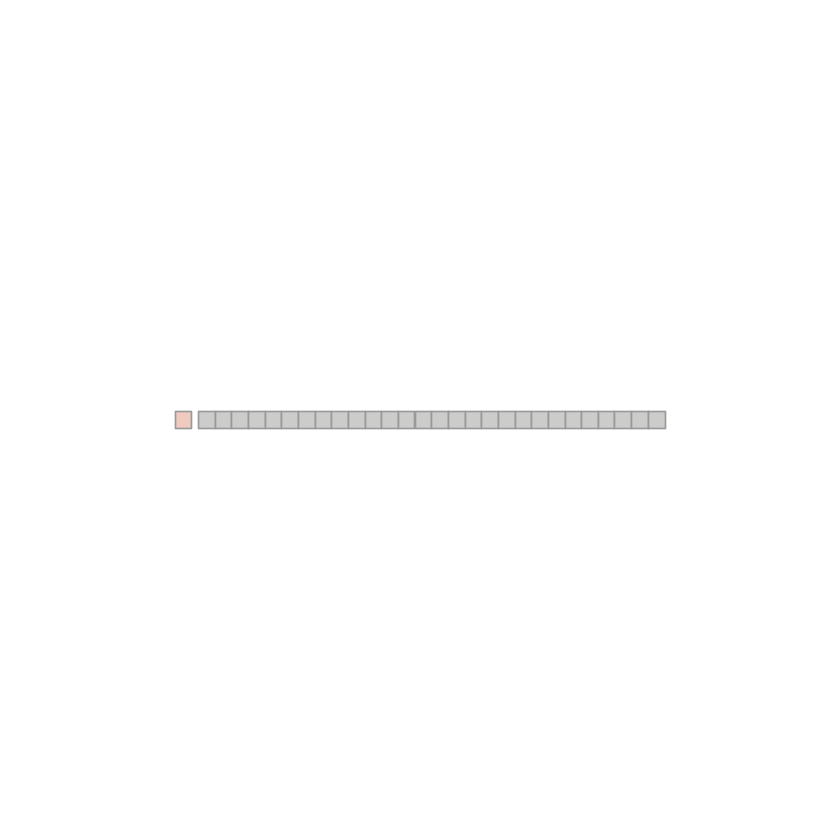

Joining, by = "reporter_id"
Joining, by = "feature"


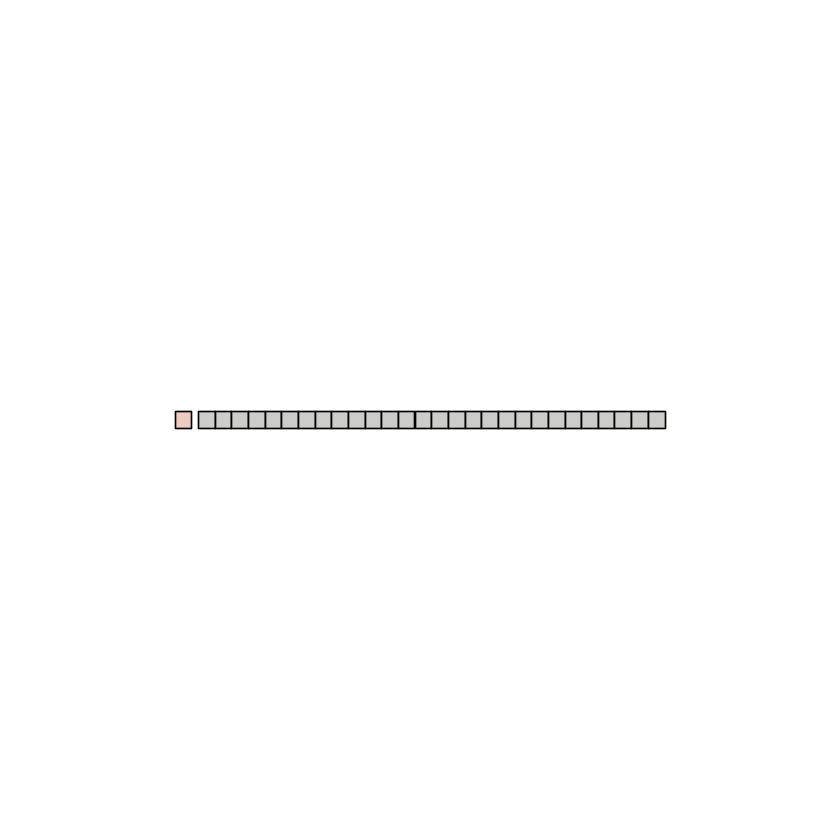

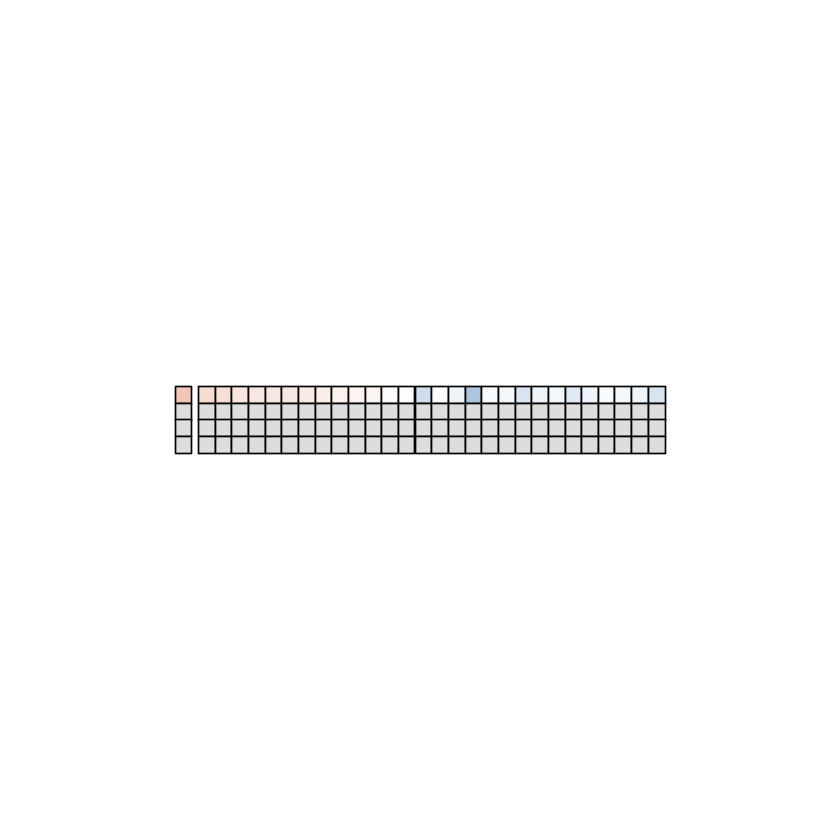

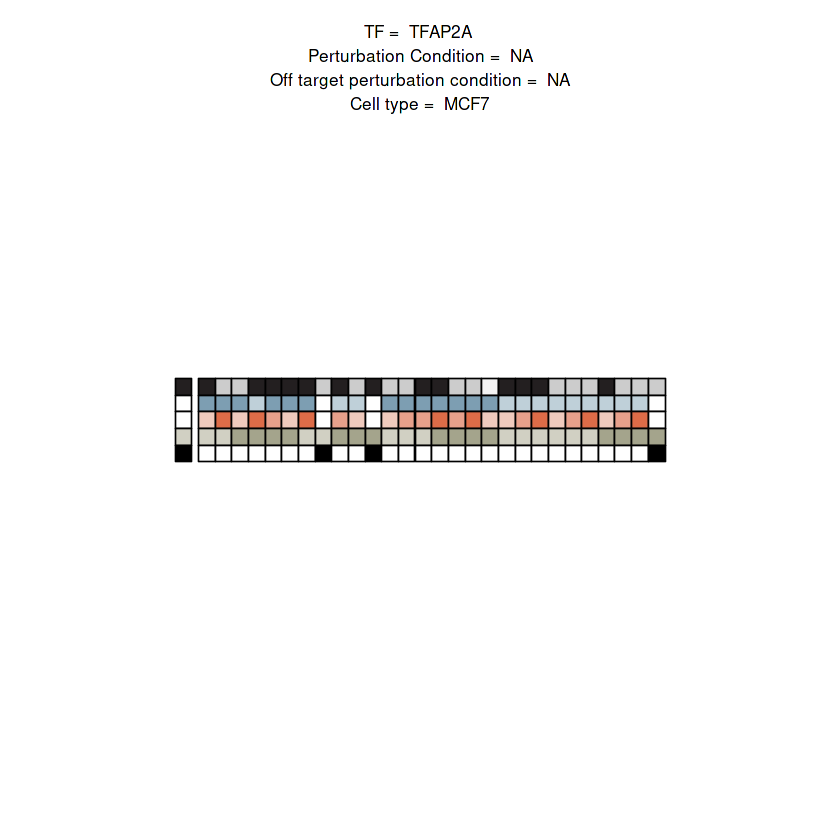

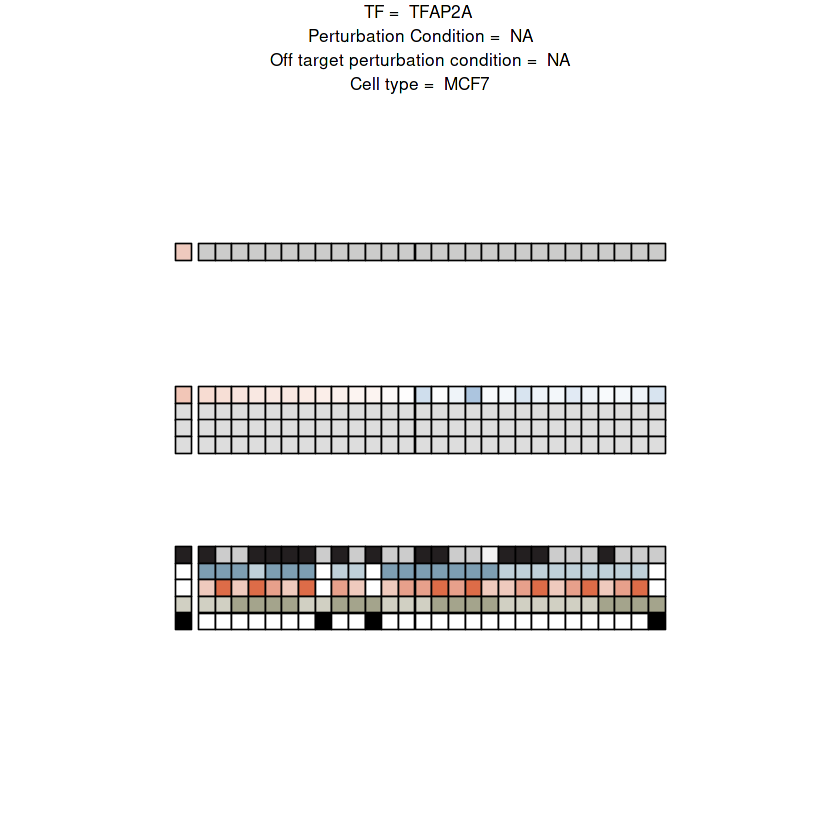

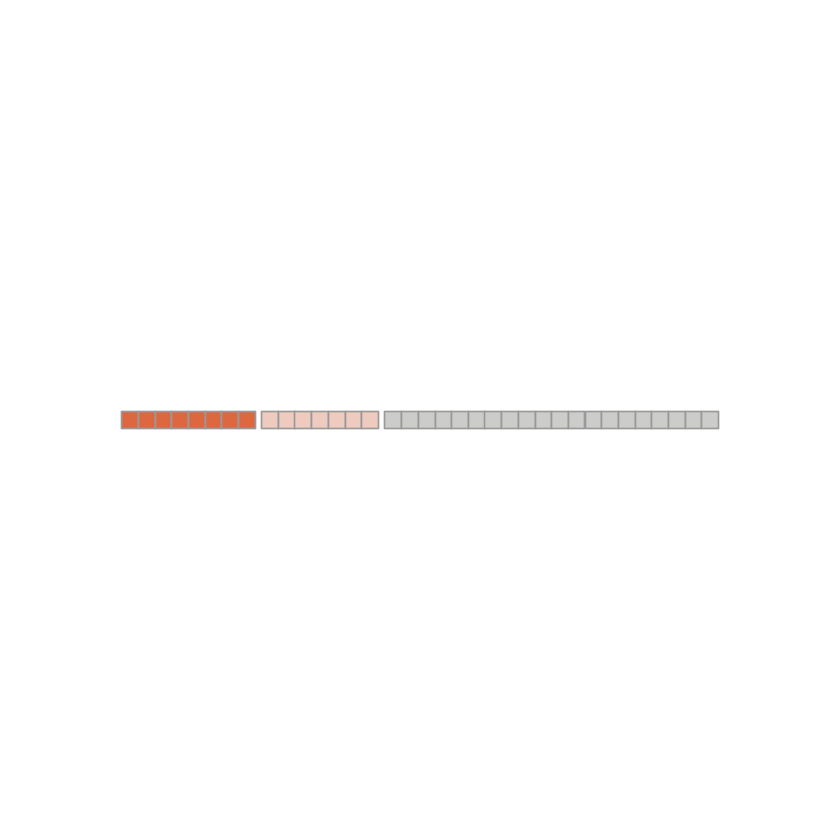

Joining, by = "reporter_id"
Joining, by = "feature"


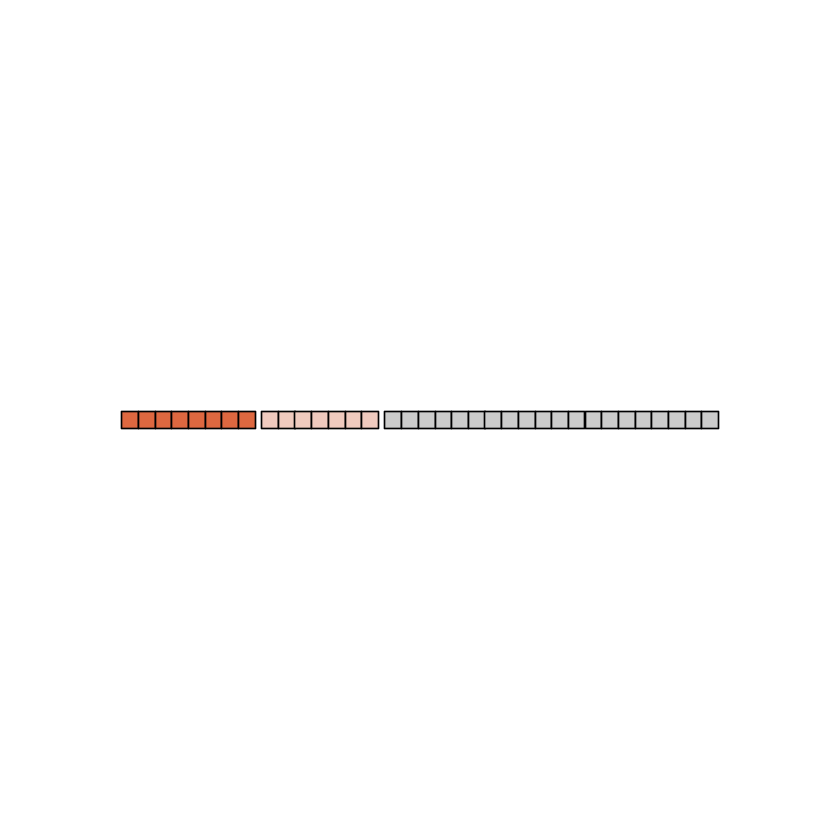

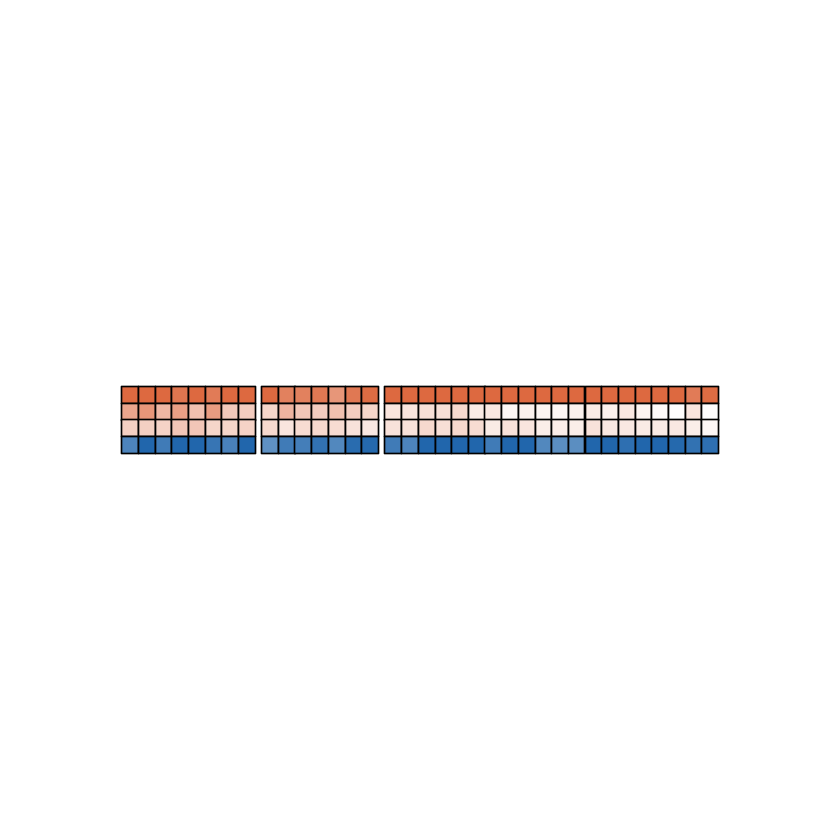

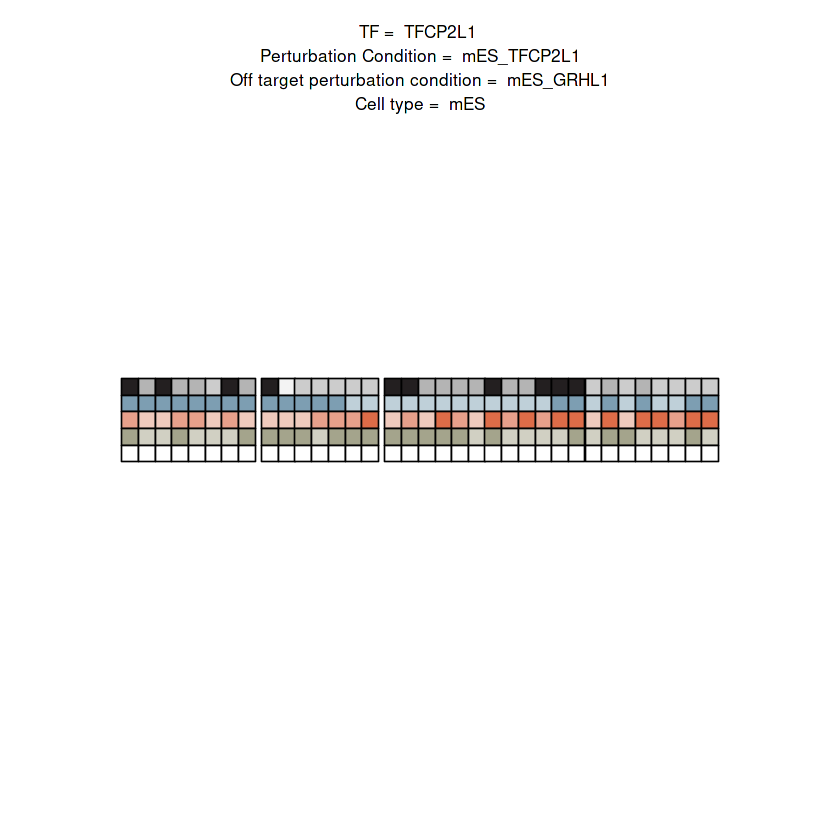

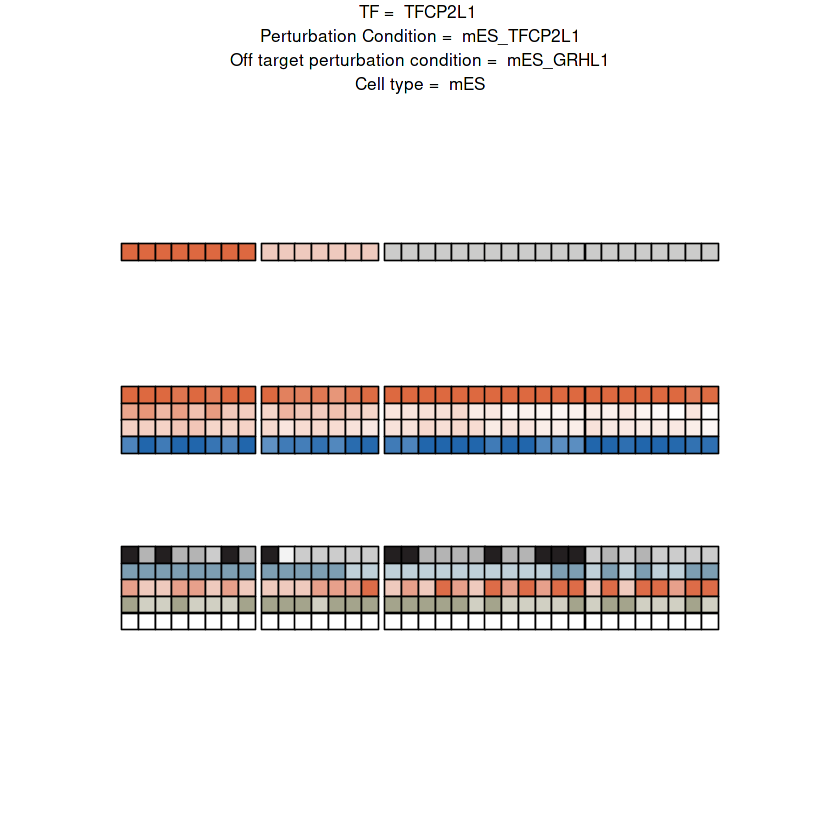

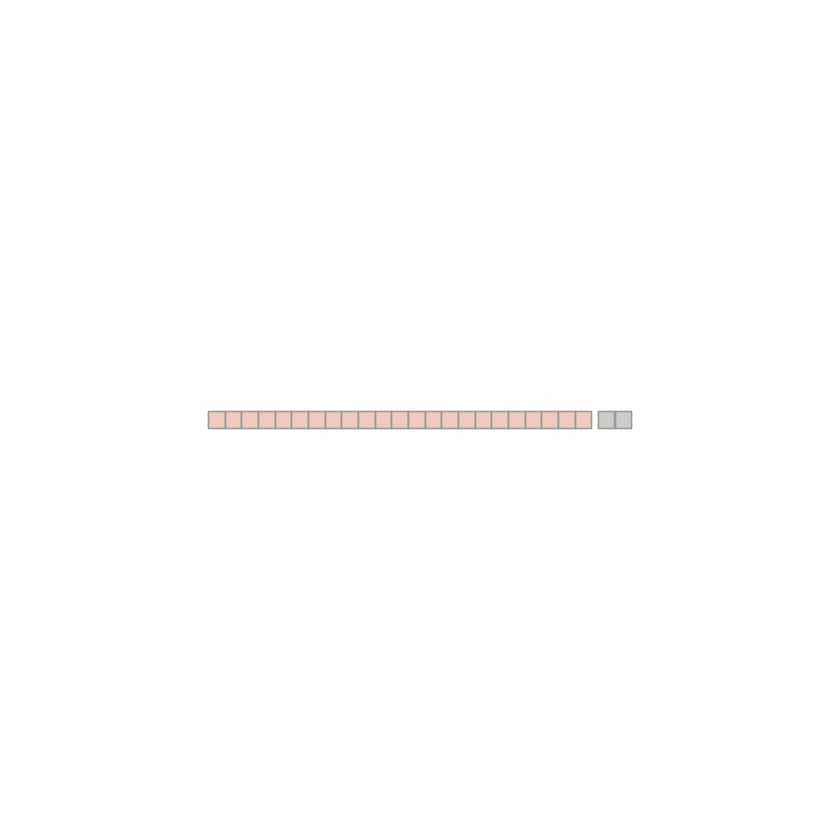

Joining, by = "reporter_id"
Joining, by = "feature"


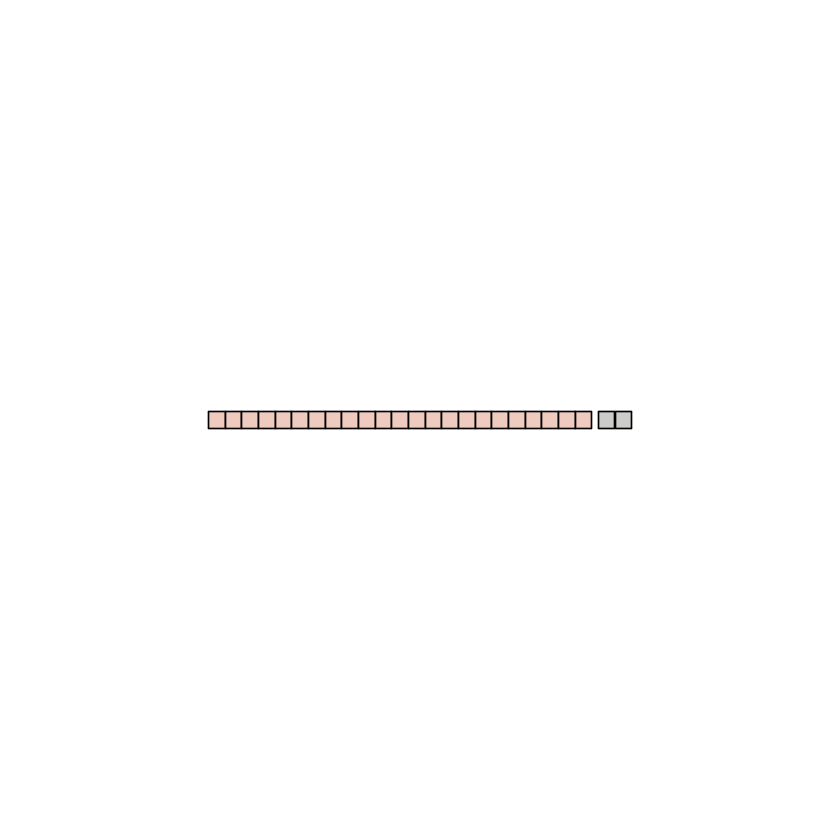

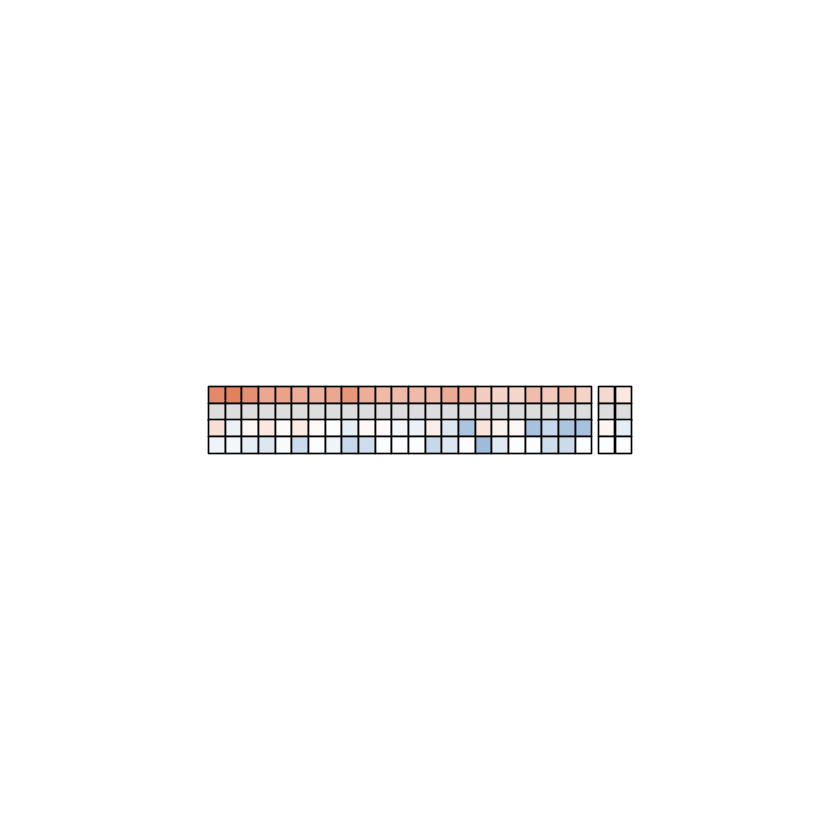

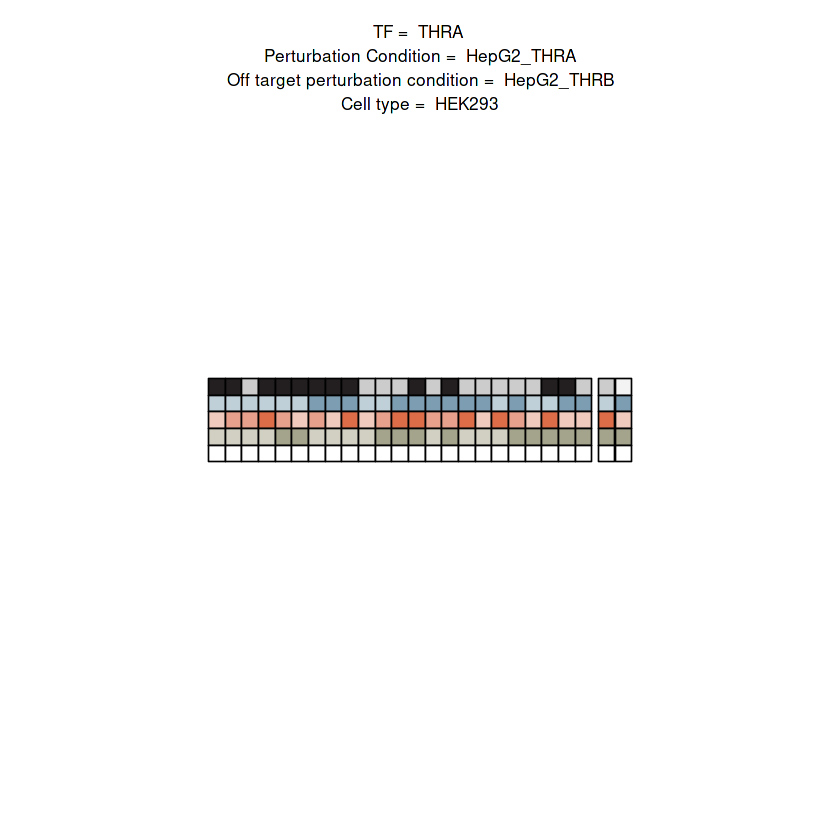

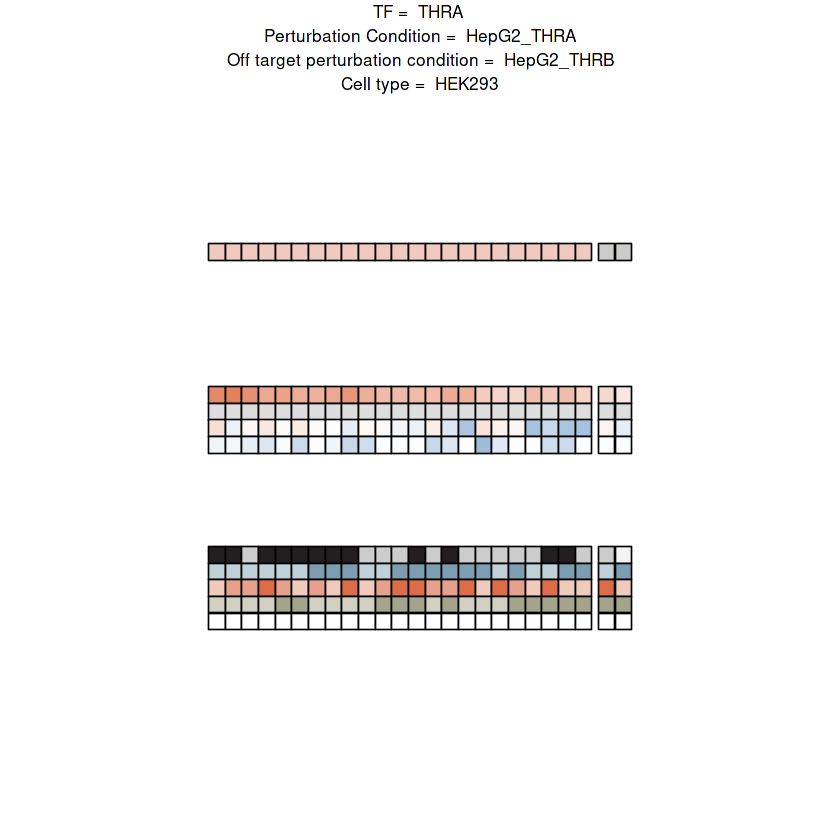

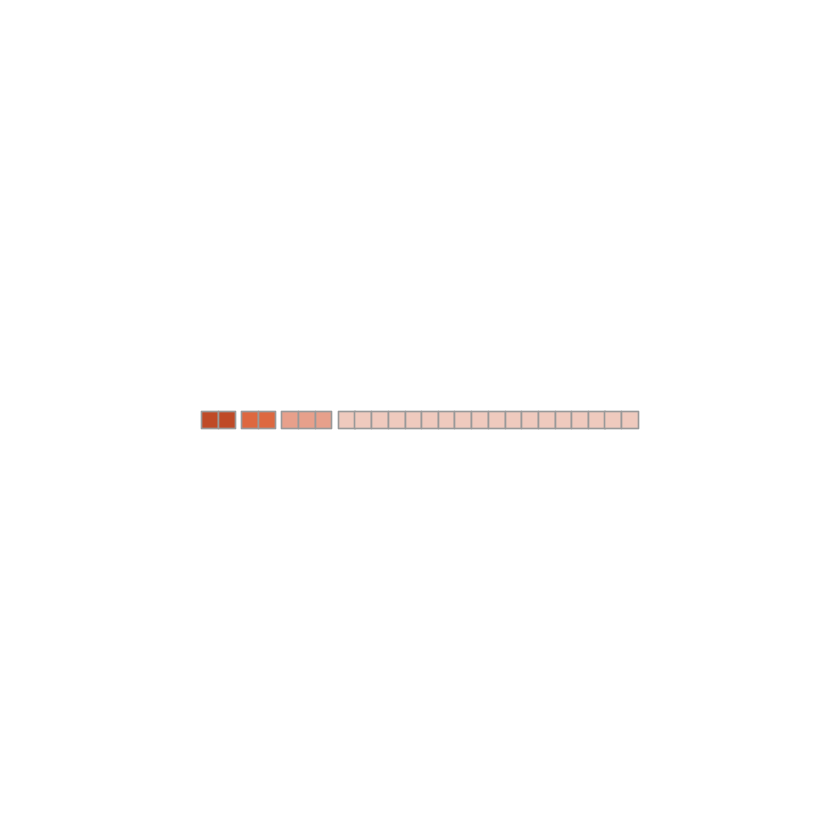

Joining, by = "reporter_id"
Joining, by = "feature"


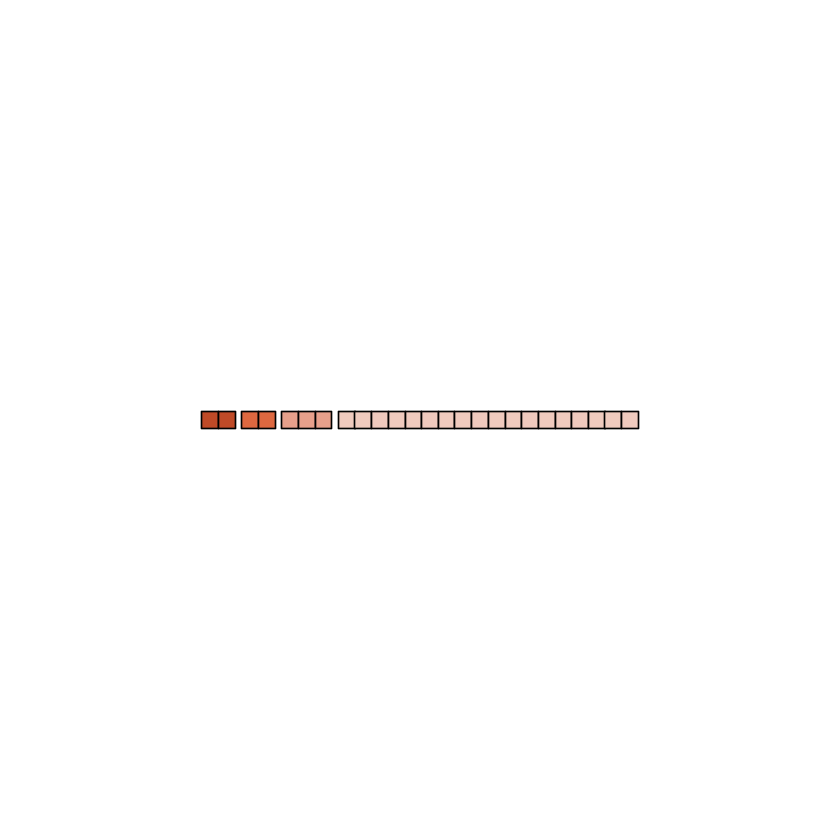

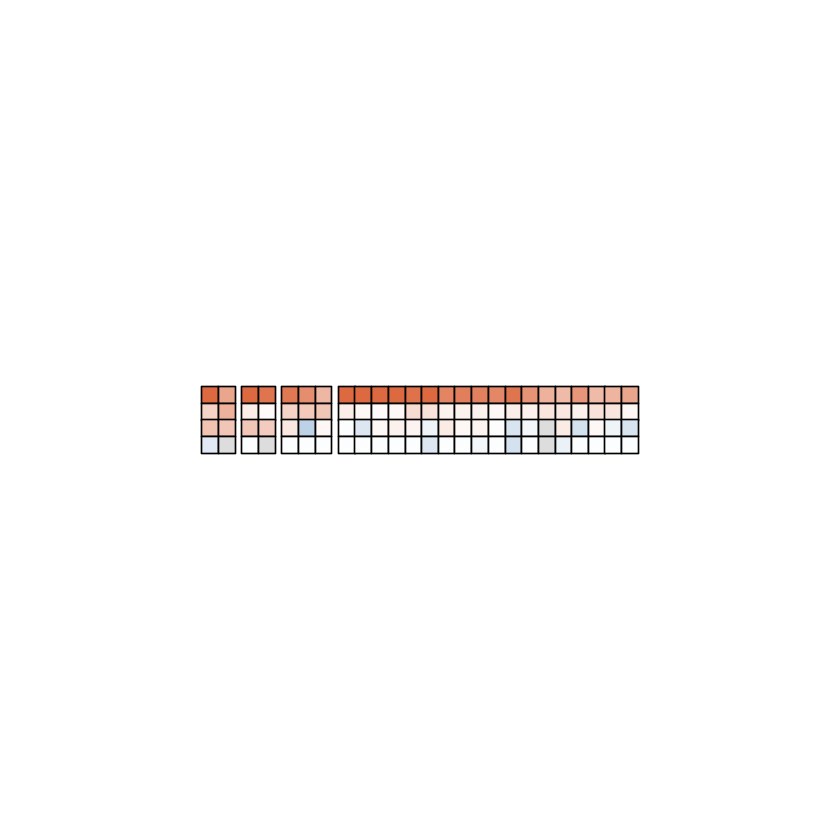

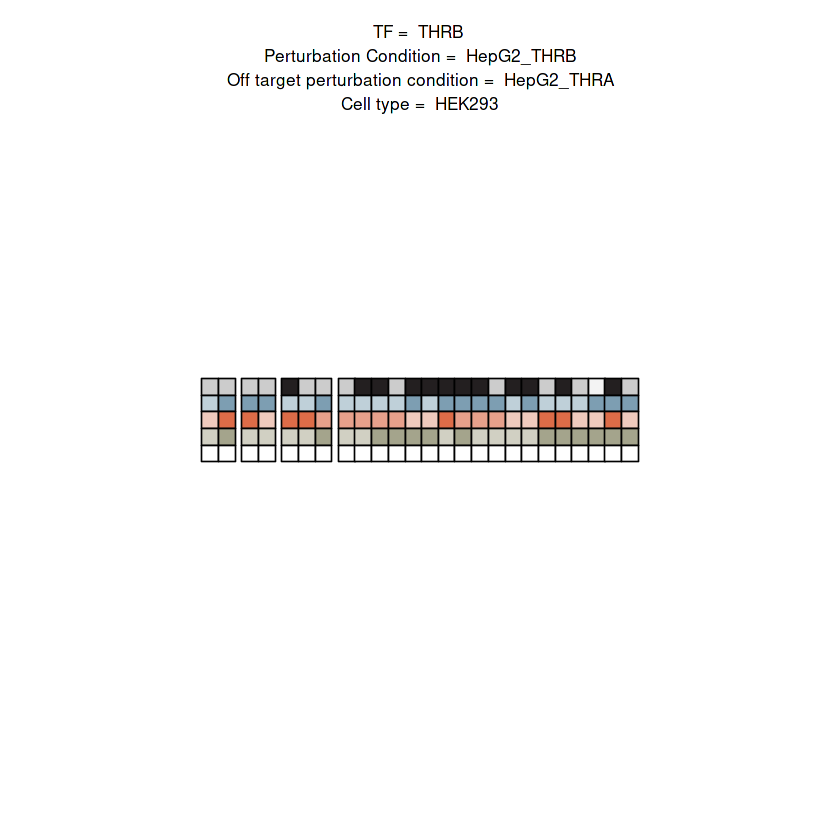

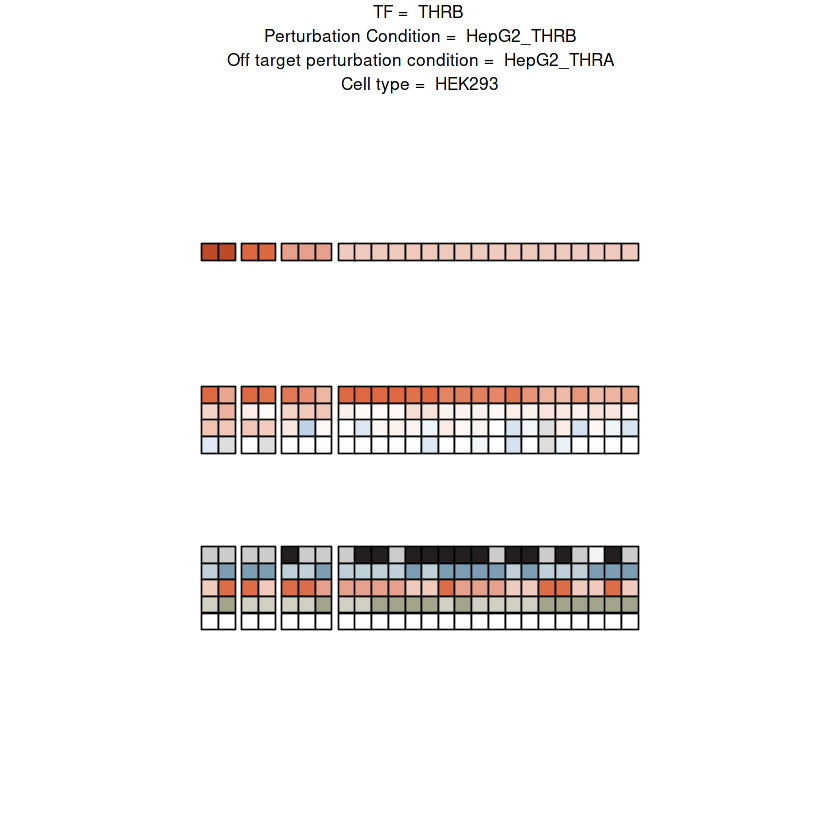

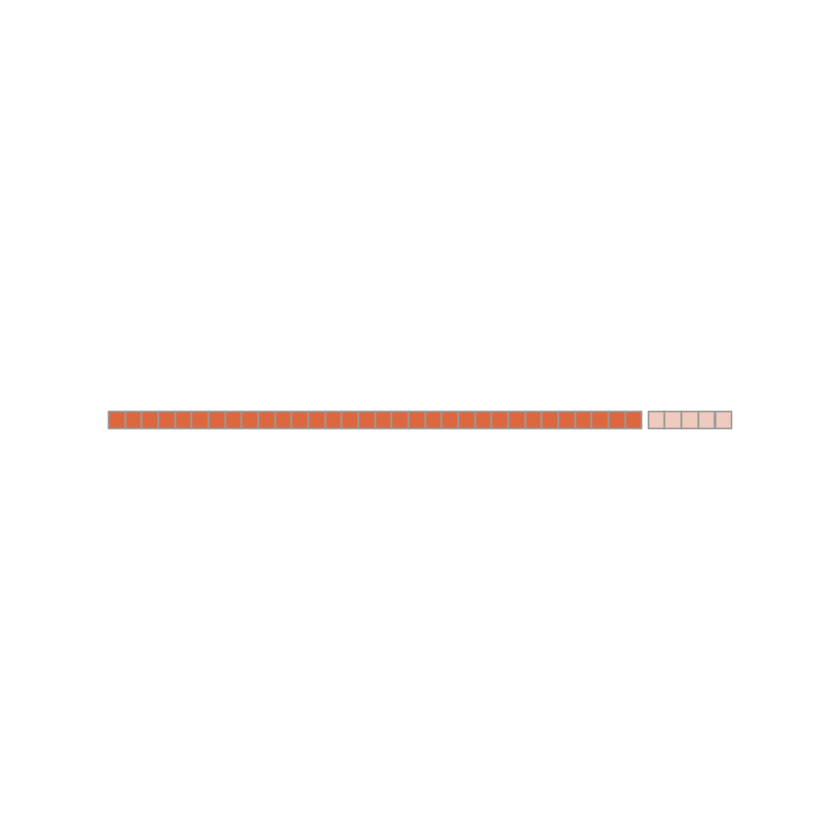

Joining, by = "reporter_id"
Joining, by = "feature"


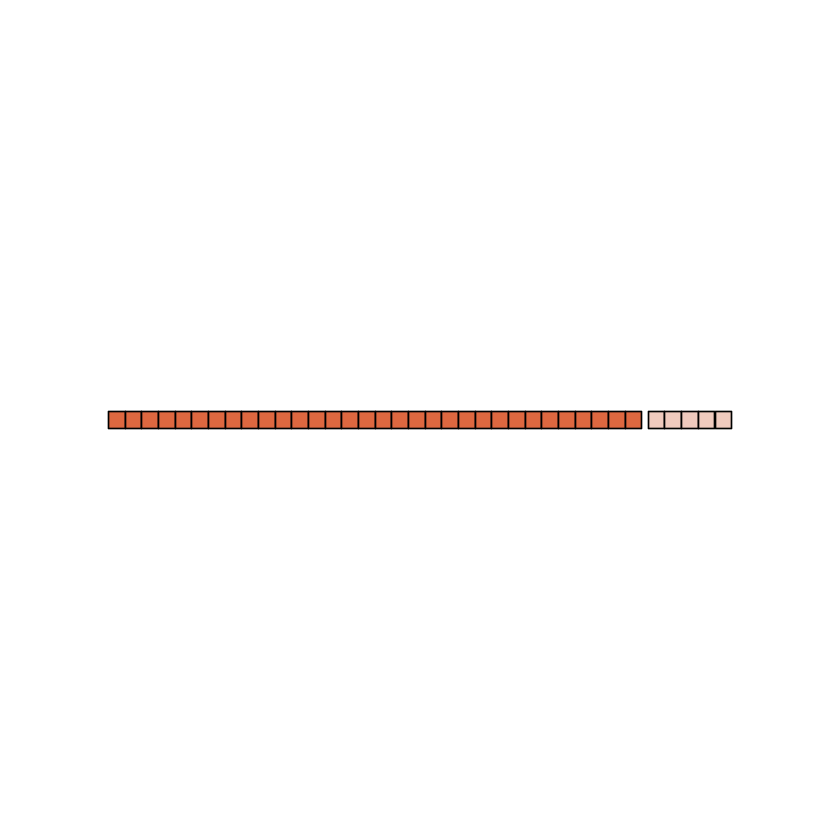

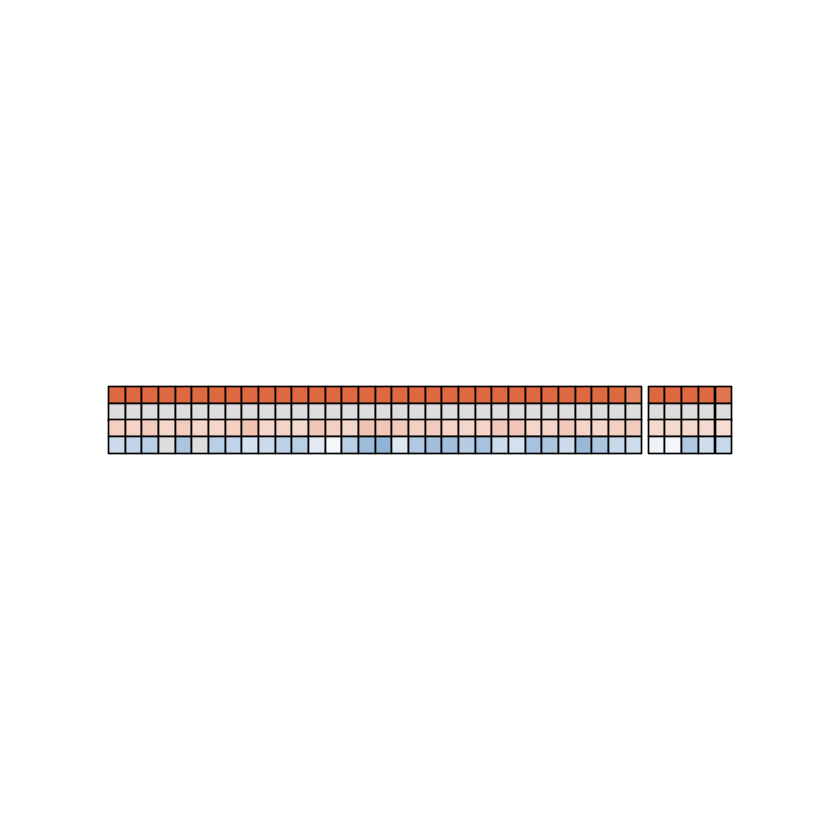

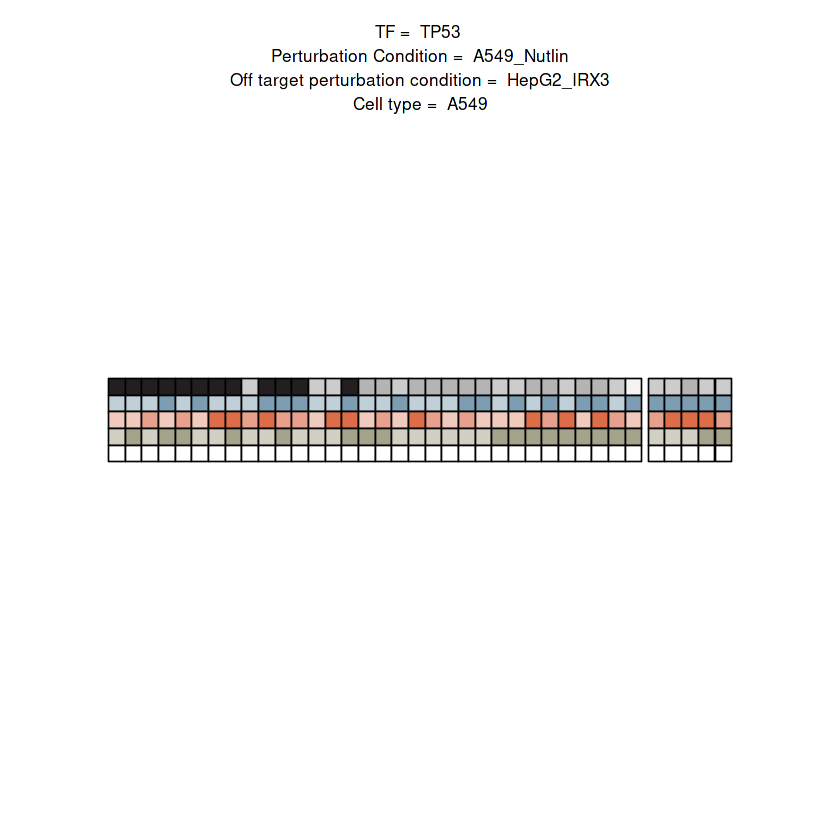

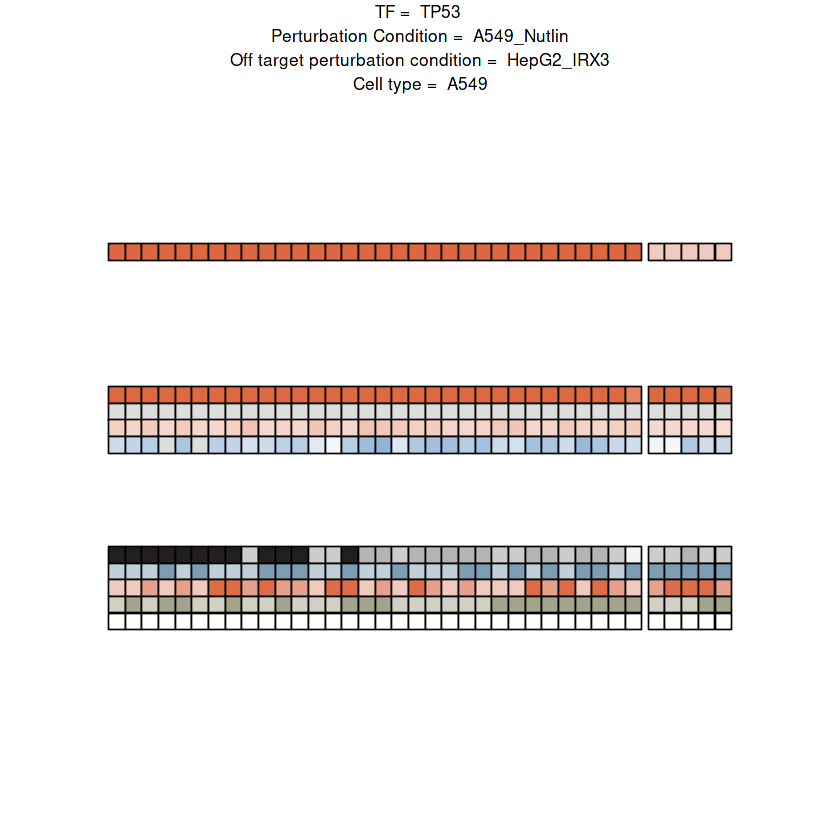

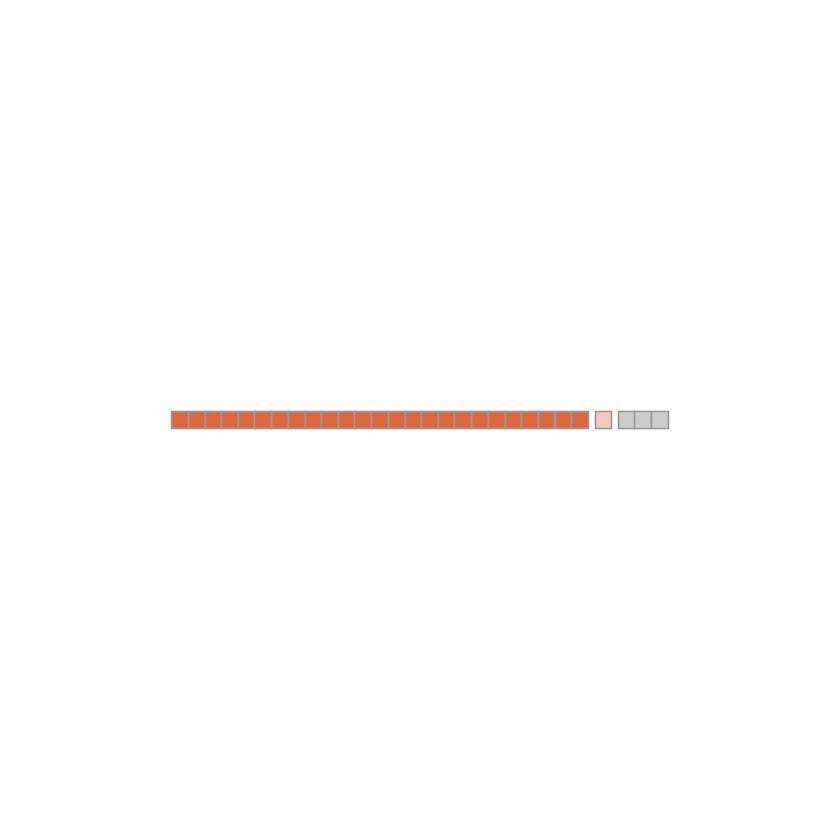

Joining, by = "reporter_id"
Joining, by = "feature"


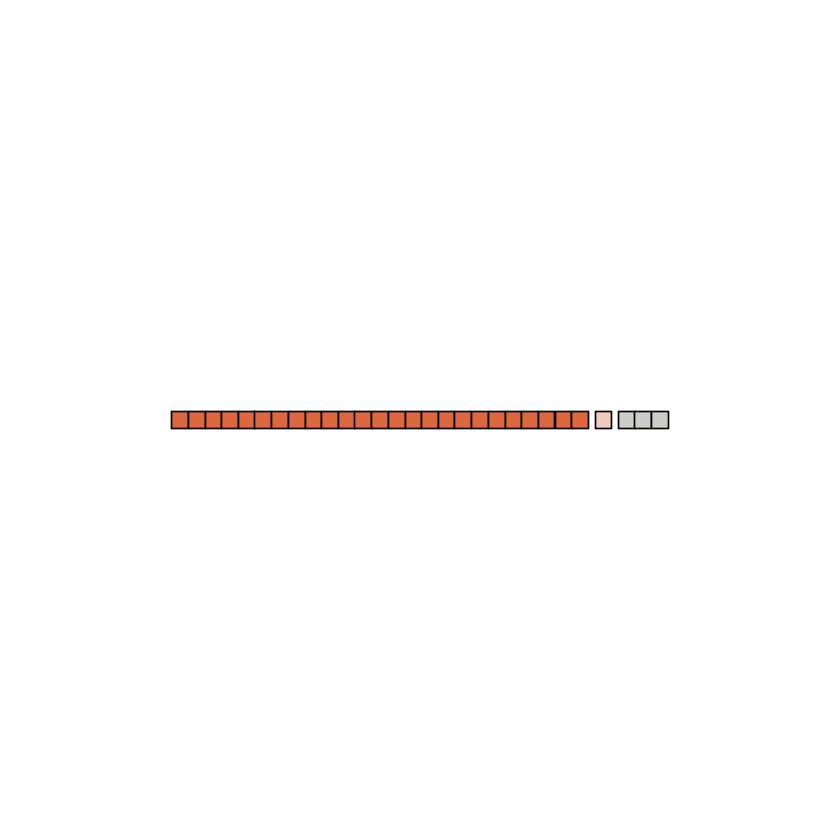

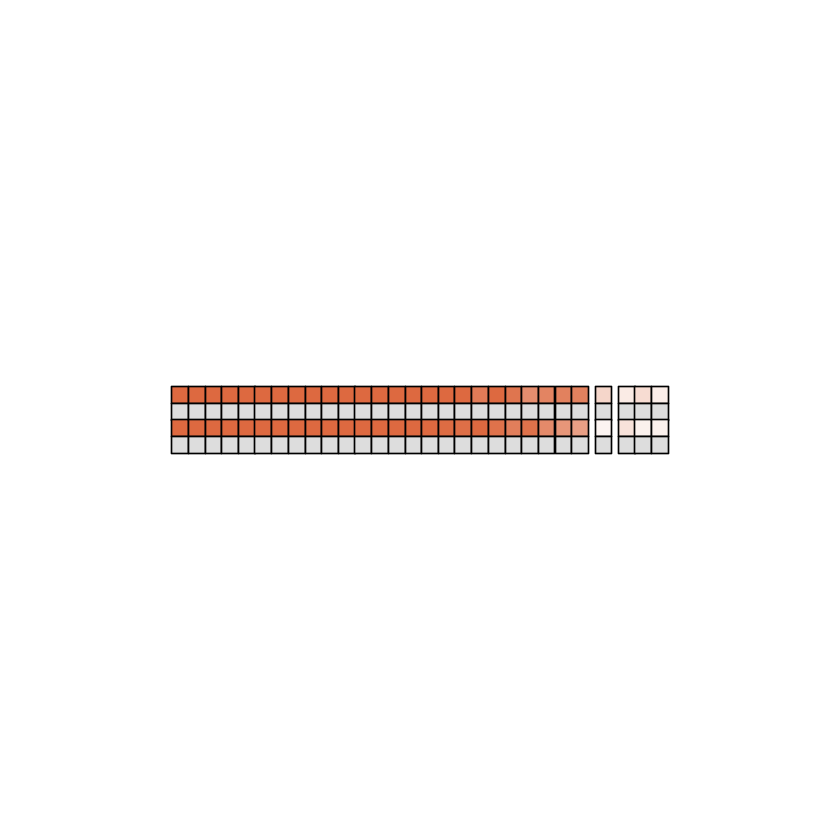

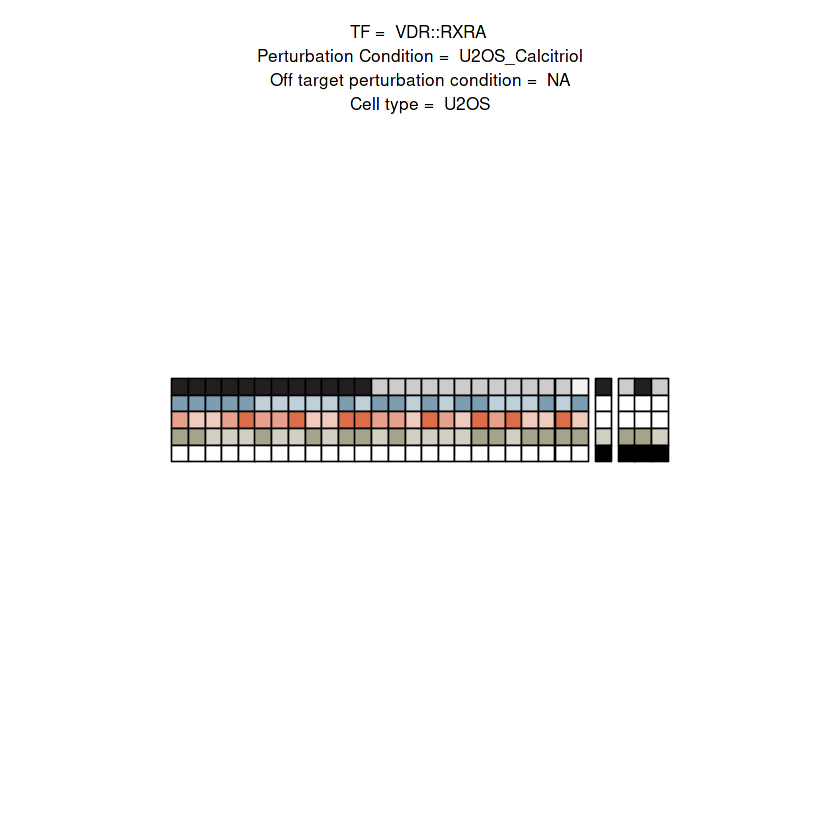

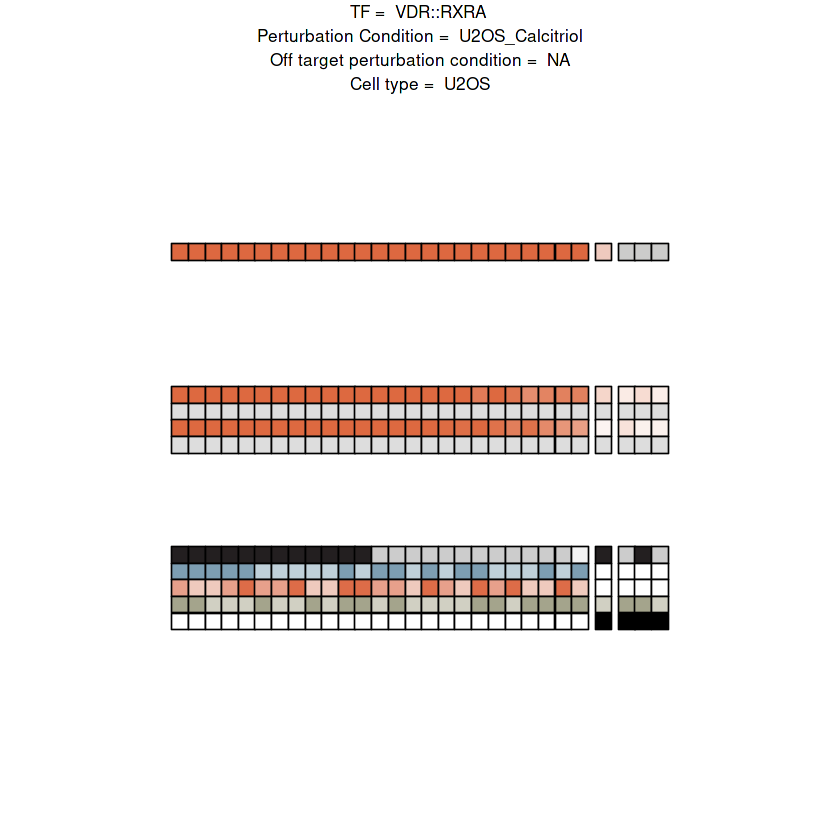

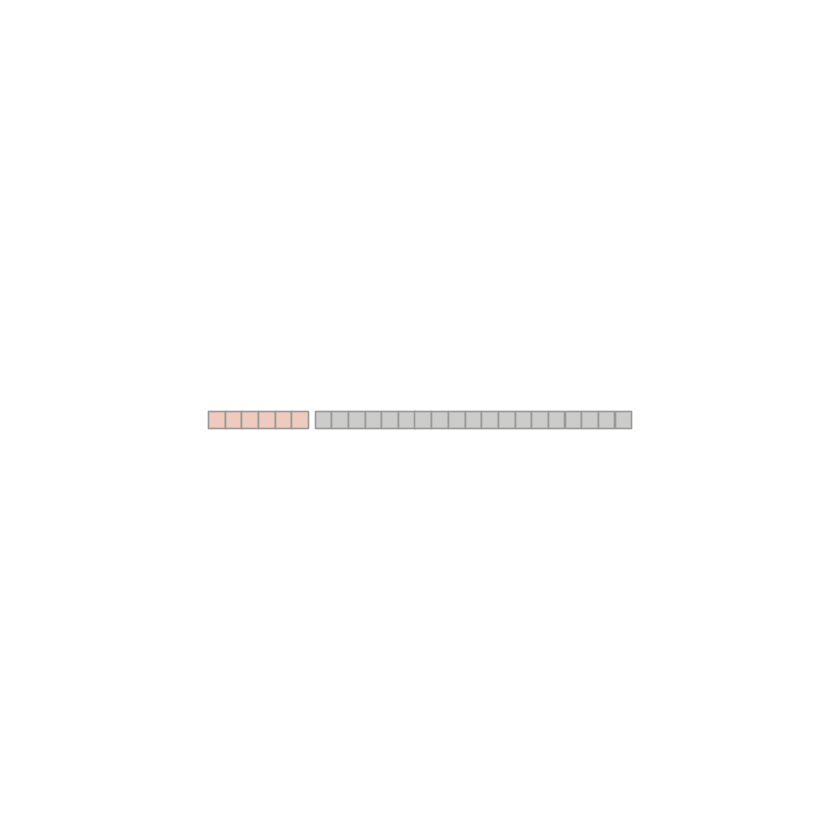

Joining, by = "reporter_id"
Joining, by = "feature"


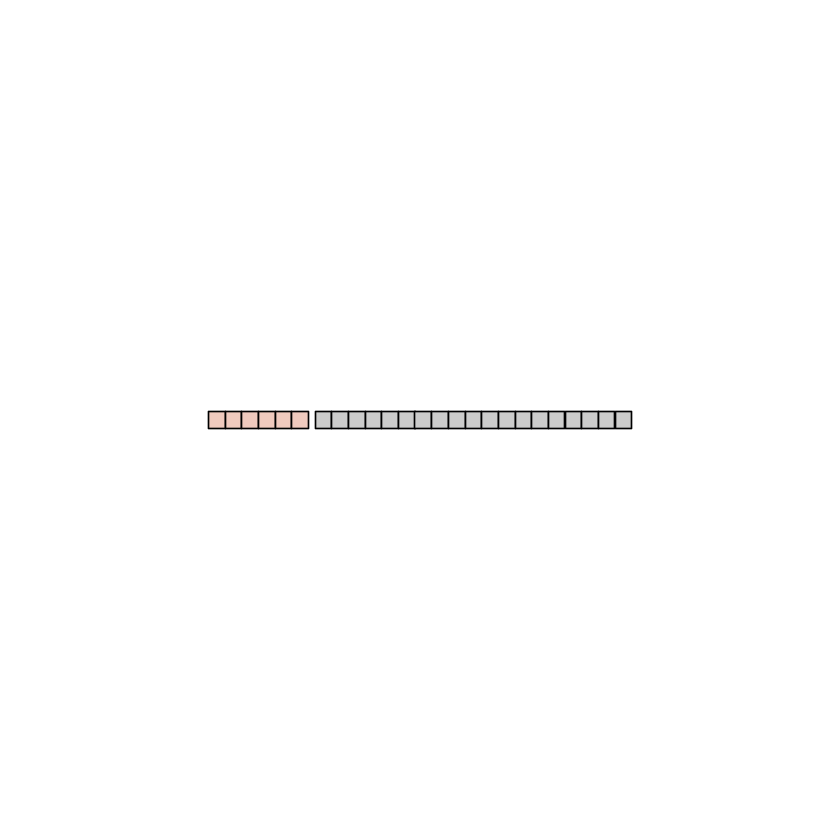

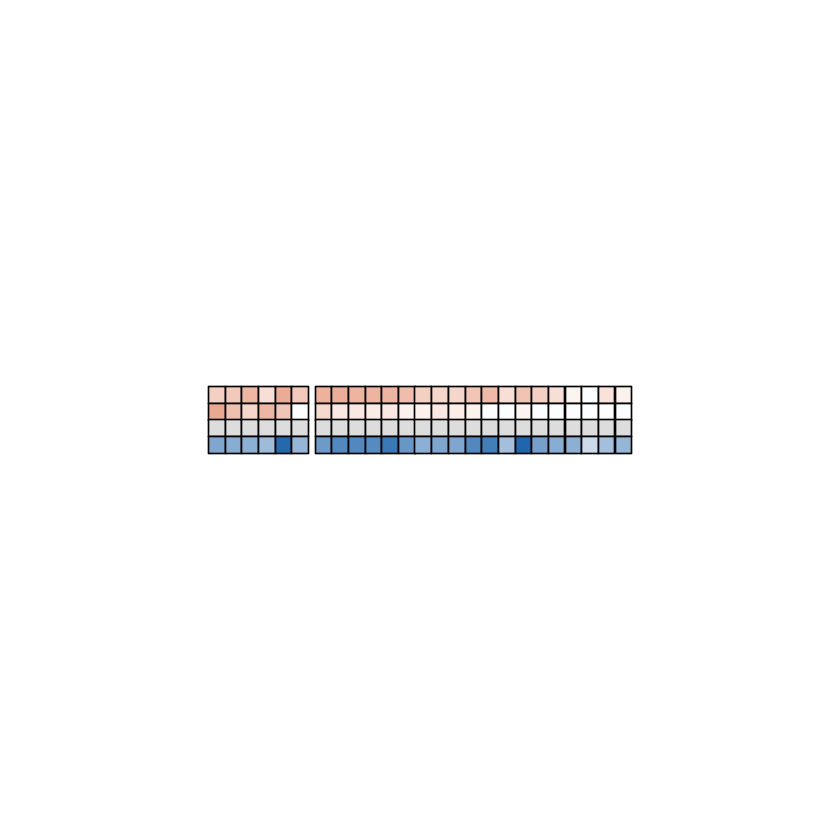

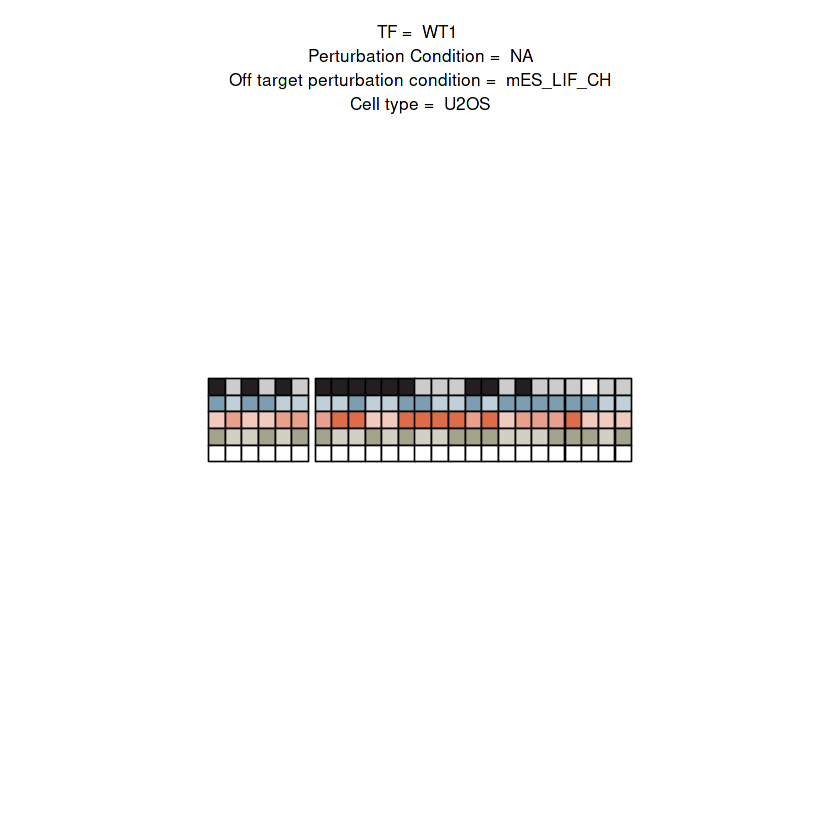

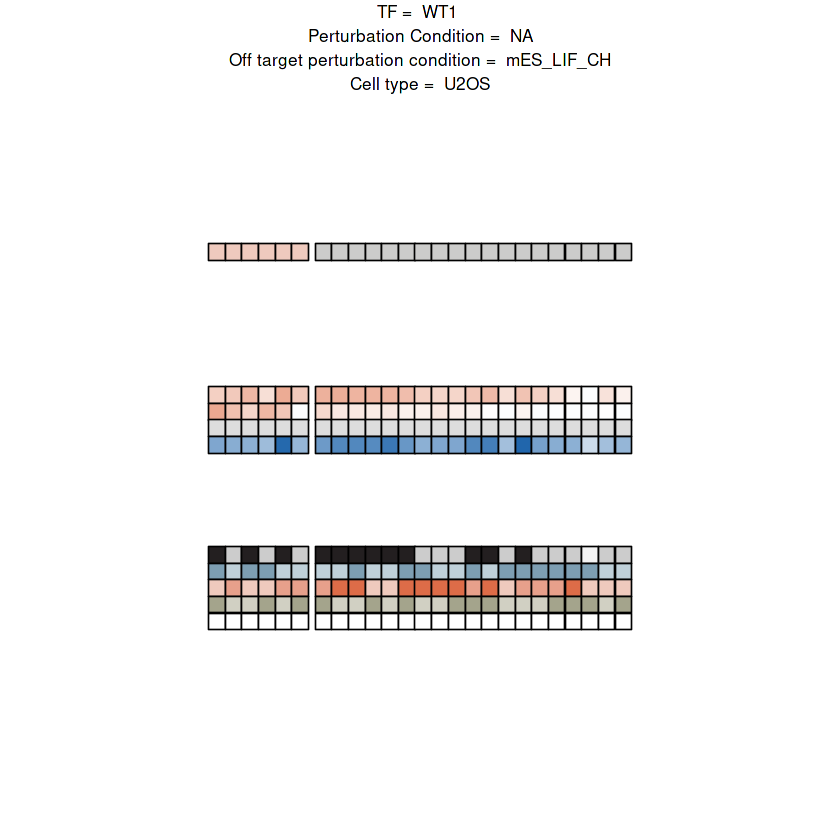

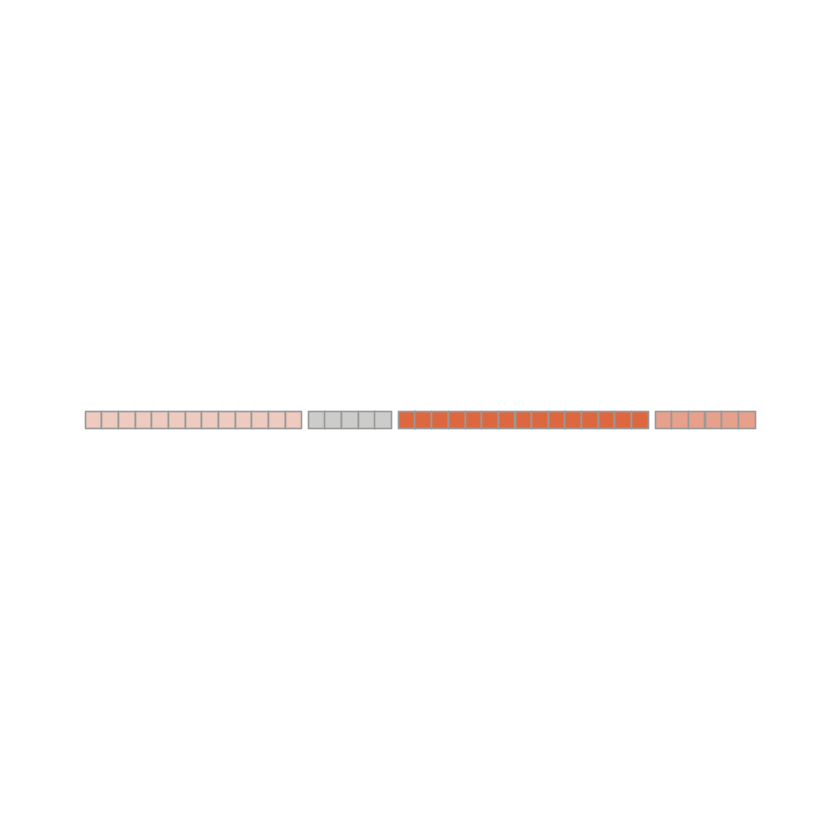

Joining, by = "reporter_id"
Joining, by = "feature"


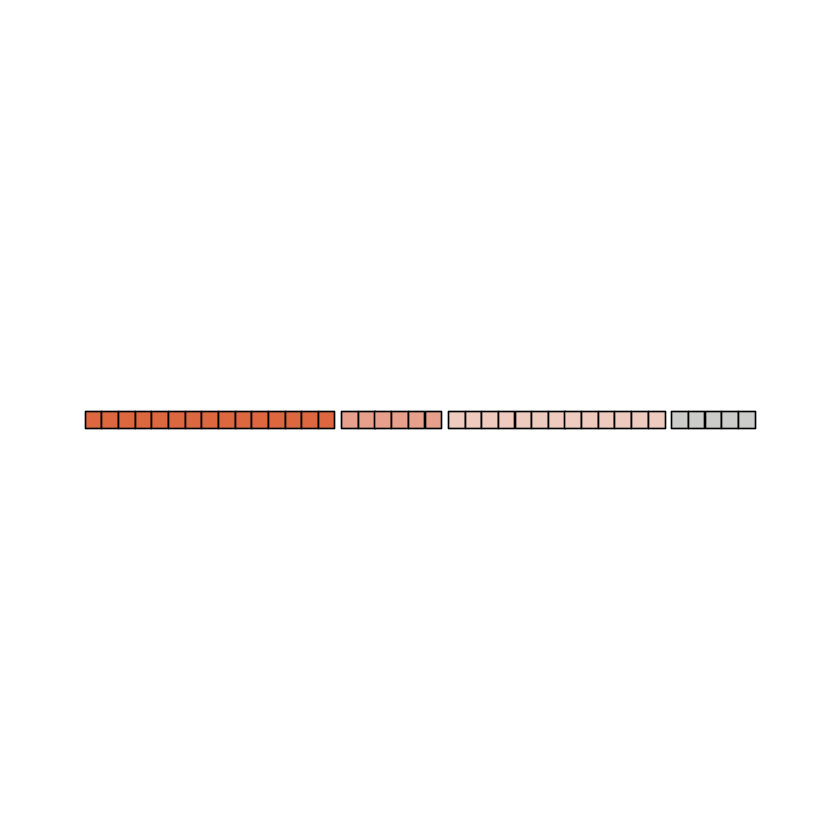

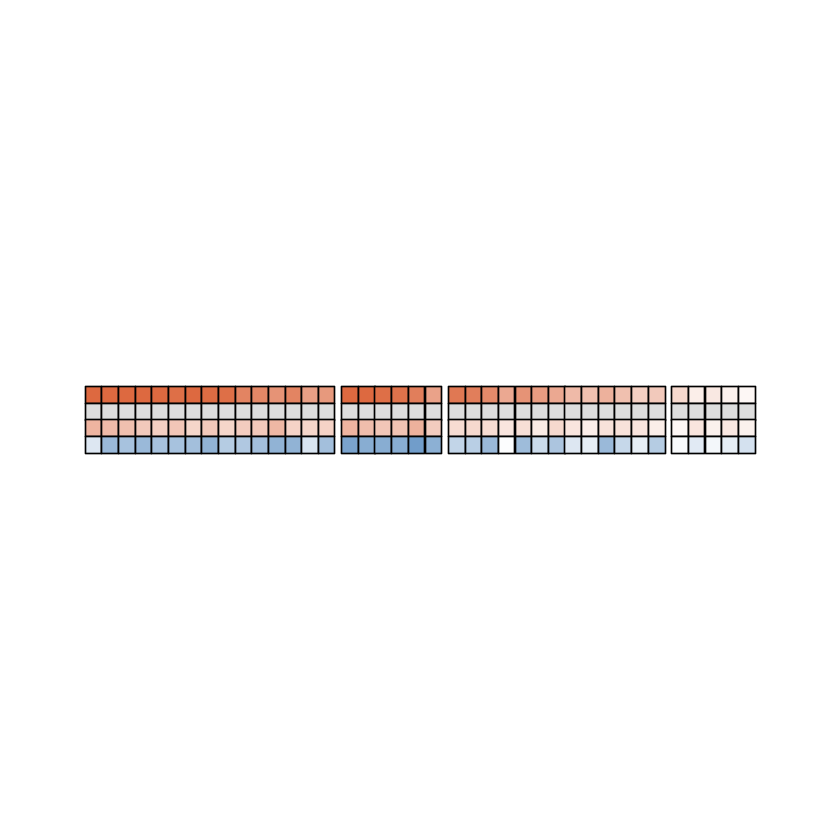

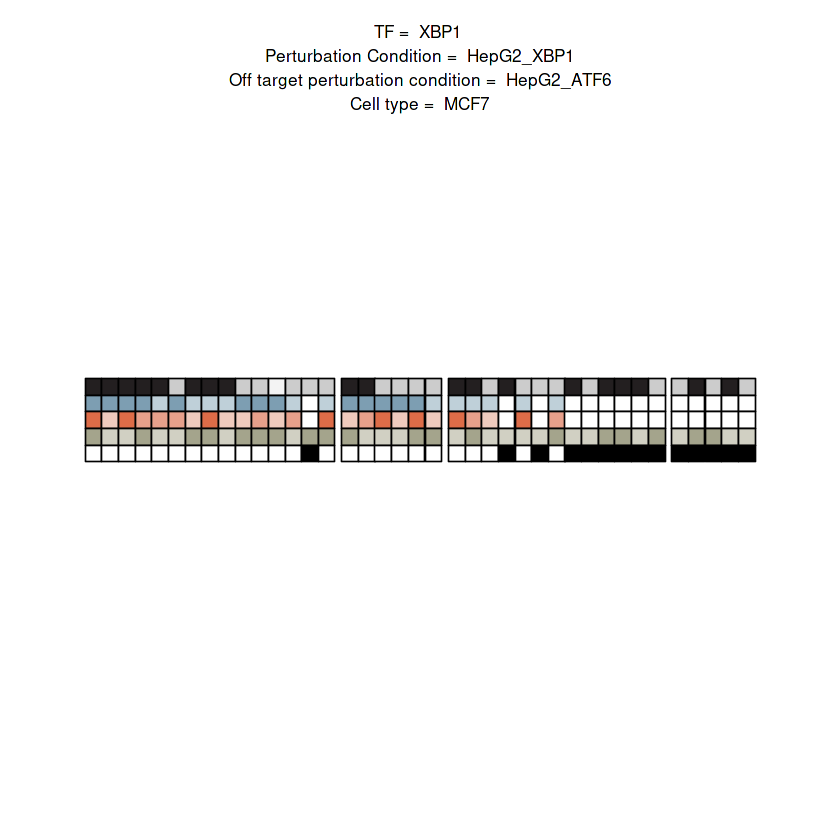

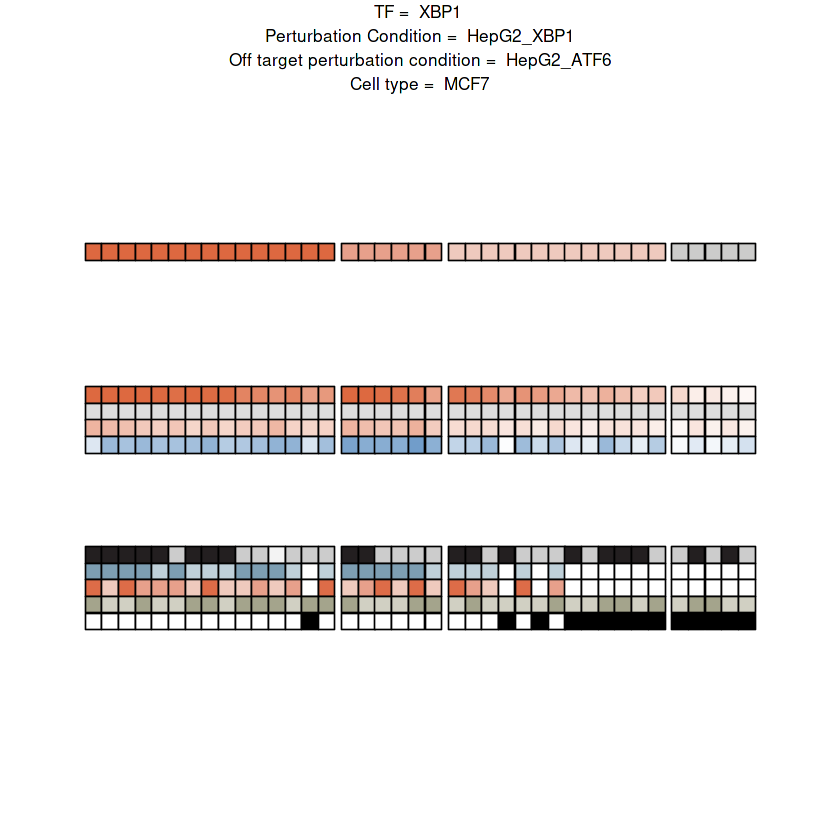

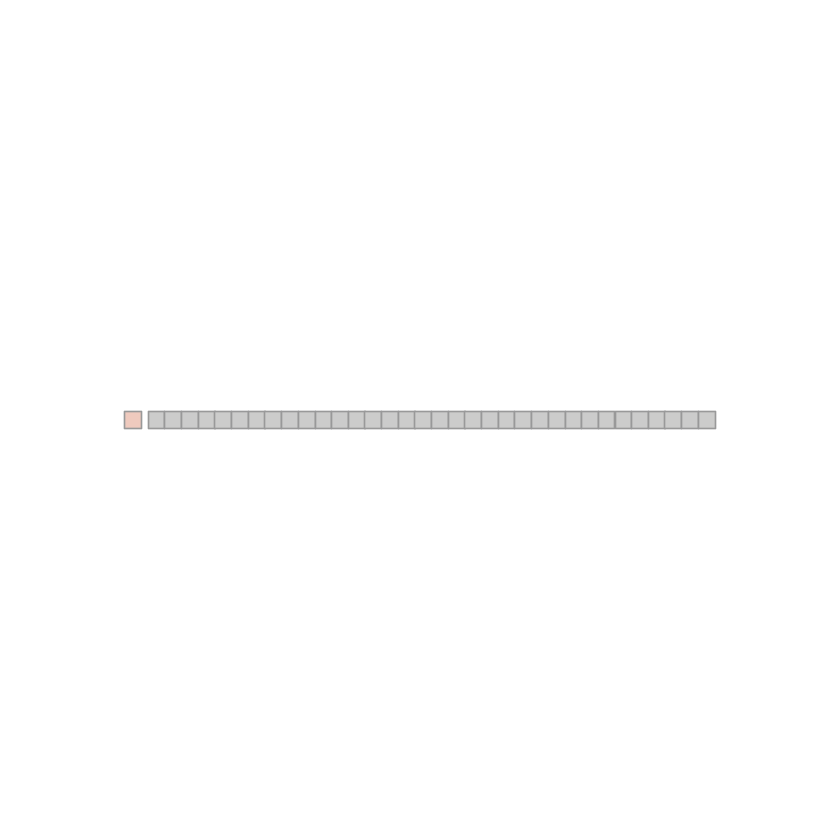

Joining, by = "reporter_id"
Joining, by = "feature"


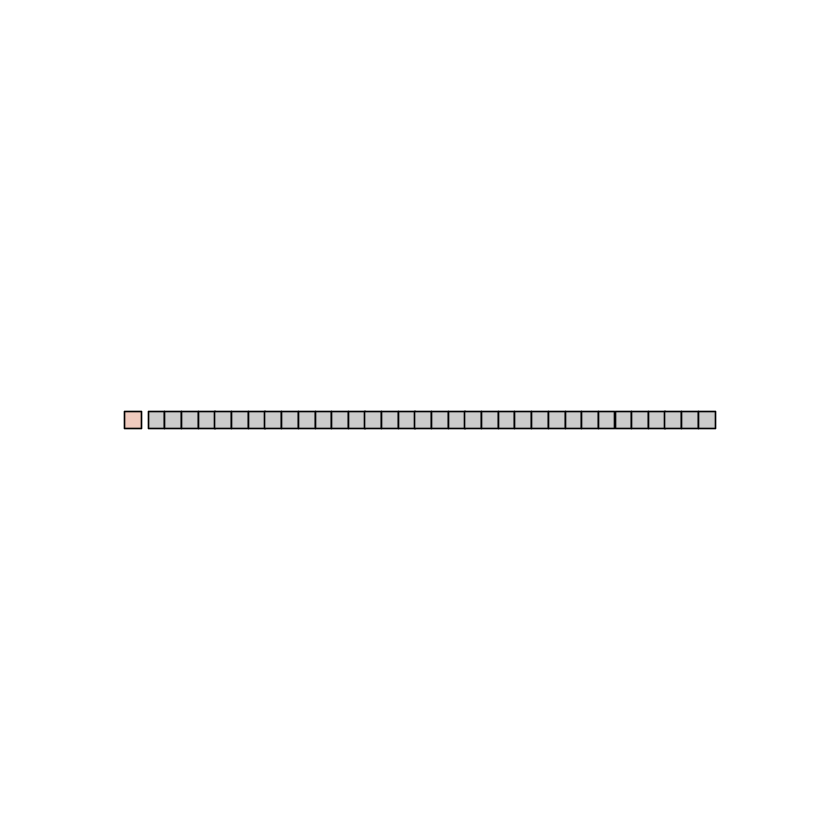

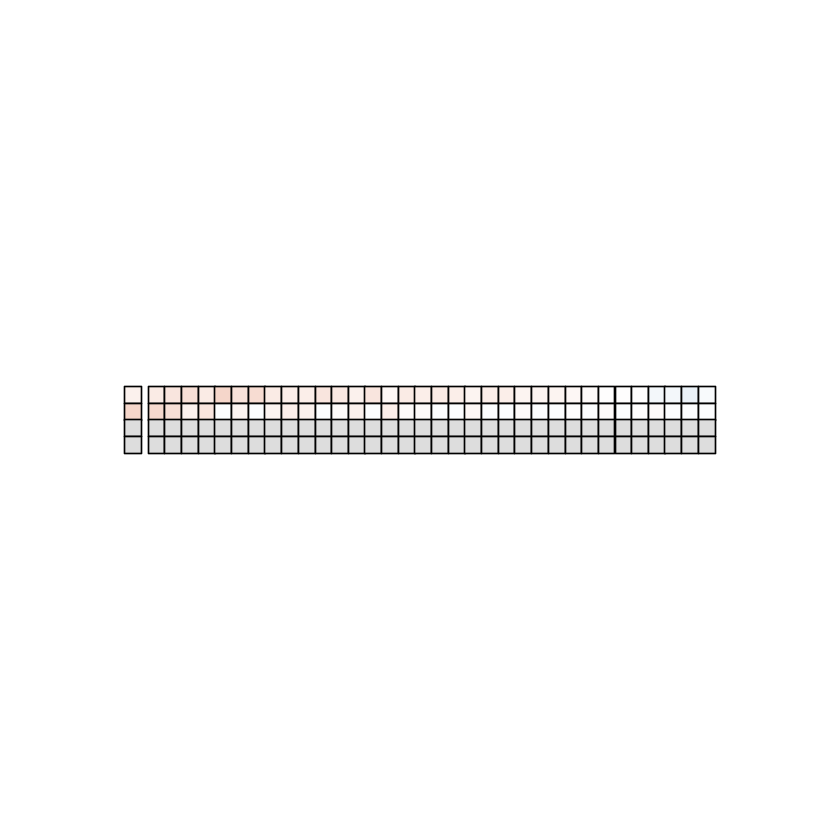

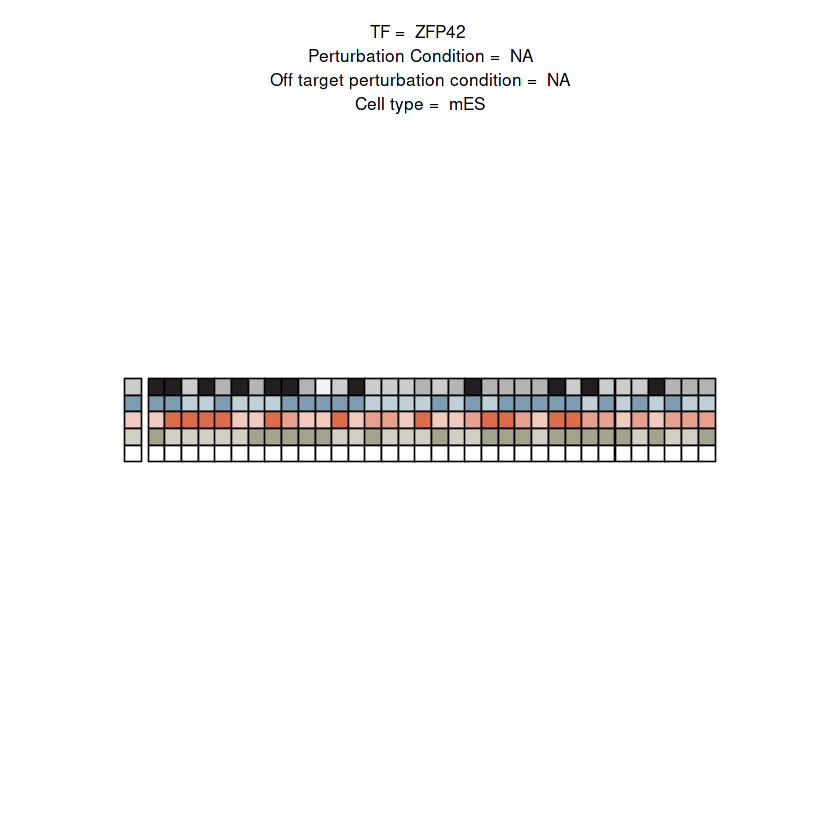

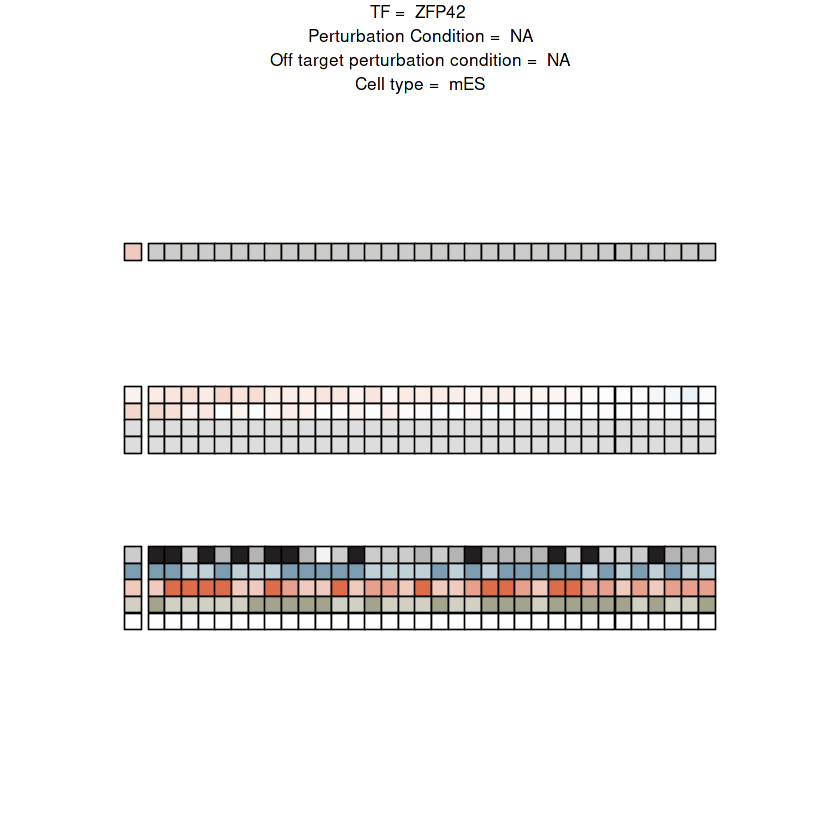

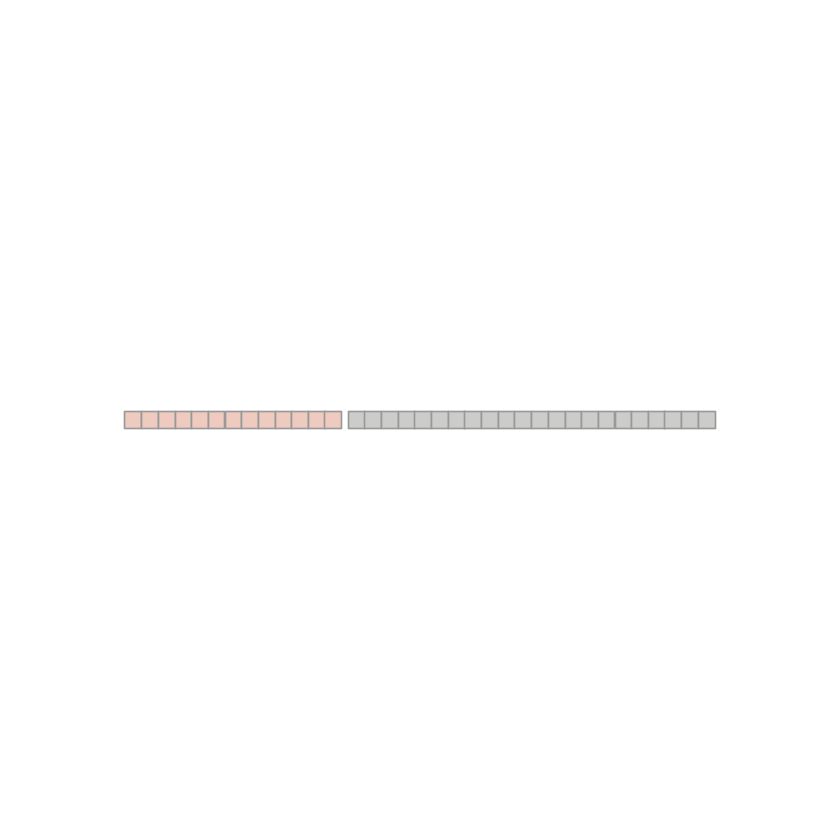

Joining, by = "reporter_id"
Joining, by = "feature"


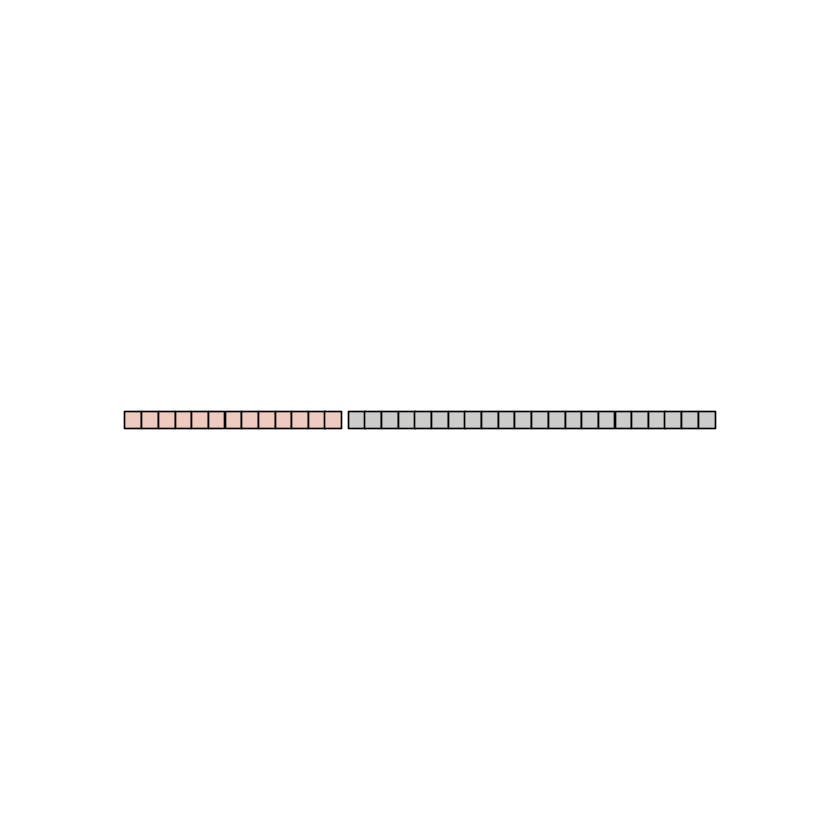

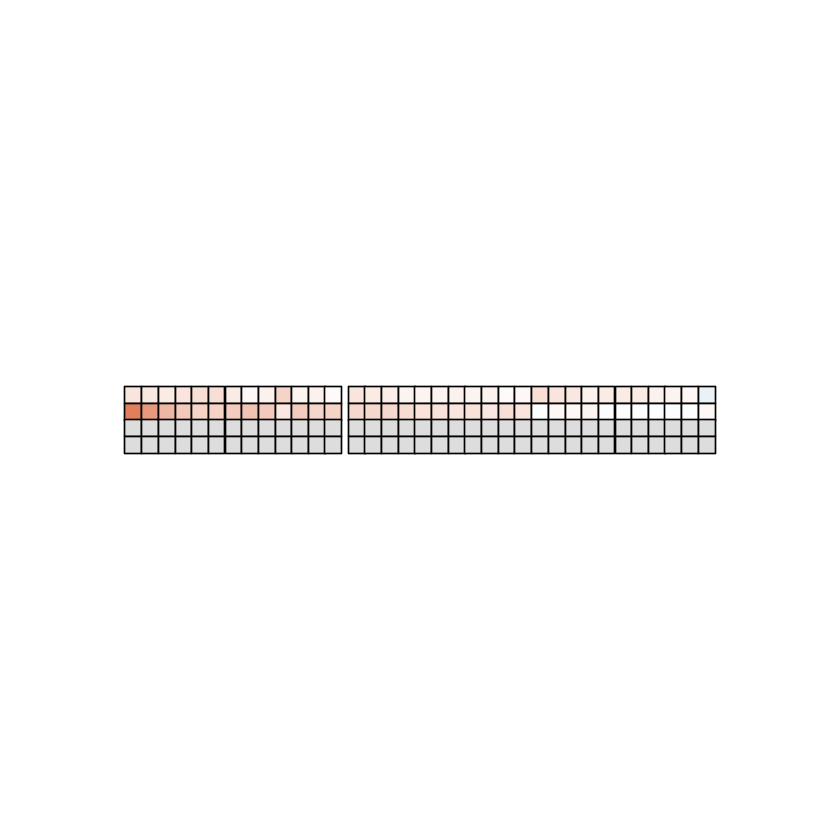

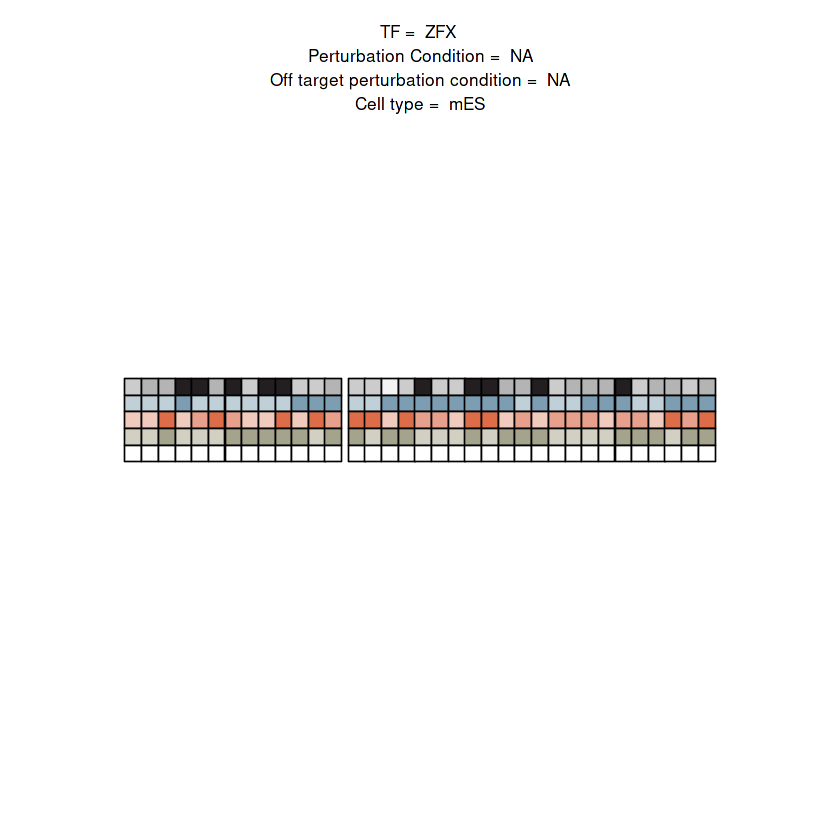

png 
  2

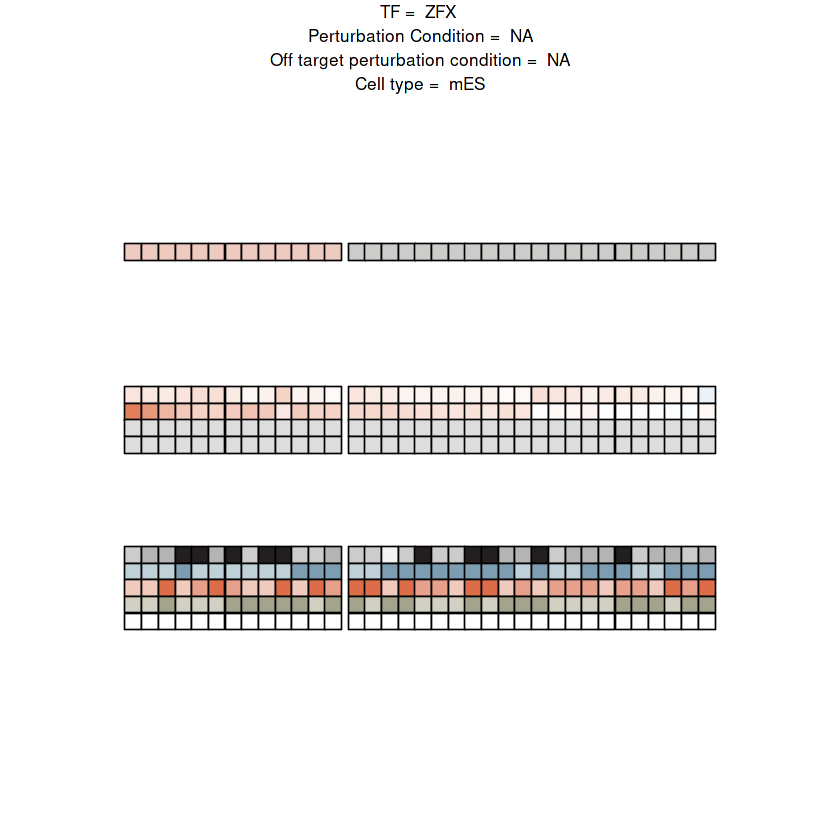

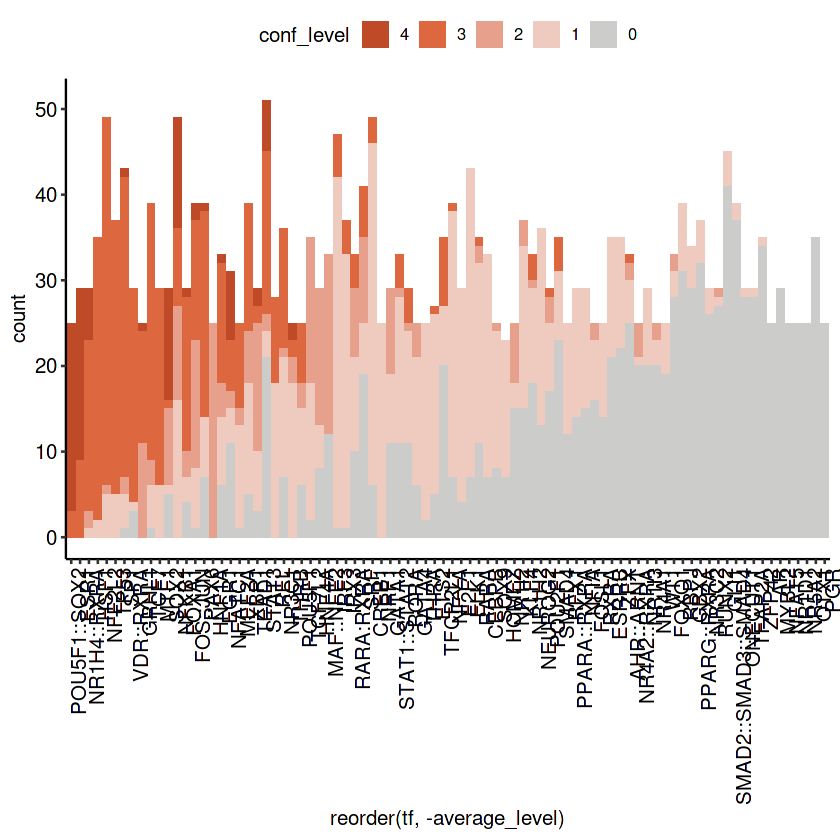

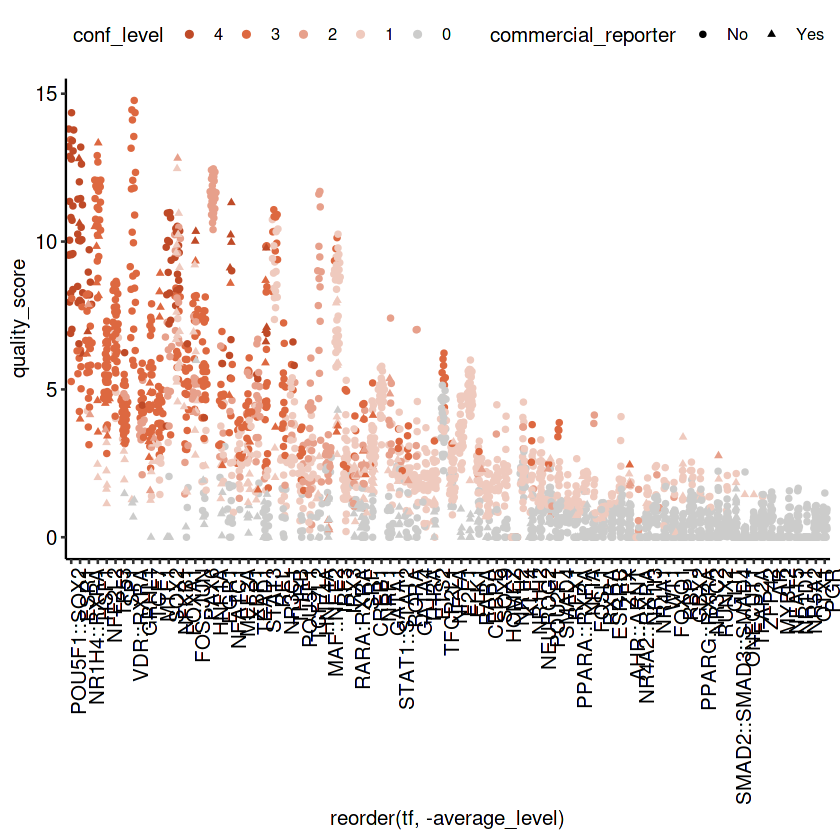

In [10]:
## Combine all data into one data table
reference_activities <- cDNA_df %>%
  filter(neg_ctrls == "No", 
         hPGK == "No", 
         str_detect(tf, "RANDOM", negate = T), 
         native_enhancer == "No") %>%
  distinct(tf, condition, reporter_id, commercial_reporter, reporter_activity_minP) %>%
  mutate(reporter_activity_minP = log2(reporter_activity_minP)) %>%
  mutate(tf = gsub("_.*", "", tf)) %>%
  mutate(tf_condition = paste(tf, condition, sep = "_")) %>%
  filter(tf_condition %in% chosen_conditions$tf_condition) %>%
  dplyr::select(-tf_condition)

cDNA_df6 <- reference_activities %>%
  left_join(rna_correlations) %>%
  left_join(off_target_activities %>% dplyr::select(reporter_id, tf, commercial_reporter, off_target_activity, 
                                                    "off_target_perturbation" = condition, effect_size)) %>%
  mutate(off_target_activity = ifelse(effect_size == 1, -off_target_activity, off_target_activity)) %>%
  mutate(off_target_activity = ifelse(off_target_activity > 0 & !is.na(off_target_activity), 0, off_target_activity)) %>%
  dplyr::select(-effect_size) %>%
  left_join(on_target_activities %>% dplyr::select(reporter_id, tf, commercial_reporter, reporter_dif_minP, 
                                                   "perturbation_condition" = condition, effect_size)) %>%
  mutate(reporter_dif_minP = ifelse(effect_size == 0, -reporter_dif_minP, reporter_dif_minP)) %>%
  dplyr::select(-effect_size) %>%
  rowwise() %>%
  mutate(quality_score = sum(c_across(c("reporter_dif_minP", "reporter_activity_minP", "cor_pval", "off_target_activity")), na.rm = T)) %>%
  mutate(quality_score = ifelse(quality_score < 0, 0, quality_score))

lm_pval <- cDNA_df_TF4 %>%
  group_by(tf) %>%
  dplyr::arrange(pval_adj, .by_group = T) %>%
  dplyr::slice(n = 1, .preserve = T) %>%
  distinct(tf, pval_adj)

## Compute confidence levels based on thresholds
cDNA_df_confidence2 <- cDNA_df6 %>%
  group_by(tf) %>%
  mutate(active = ifelse(reporter_activity_minP > 1, "Yes", "No")) %>%
  ungroup() %>%
  mutate(n_active = as.numeric(ave(tf, tf, active, FUN = function(x) length(x)))) %>%
  mutate(n_active = ifelse(active == "No", 0, n_active)) %>%
  mutate(n_active = ave(n_active, tf, FUN = max)) %>%
  left_join(lm_pval) %>%
  ## Add a level if reporter activities can be predicted by log-linear model
  mutate(conf_level = ifelse((commercial_reporter == "No" & pval_adj < 0.05 & reporter_activity_minP > 1) |
                               (commercial_reporter == "No" & n_active > 12 & reporter_activity_minP > 1) |
                               (commercial_reporter == "Yes" & reporter_activity_minP > 1), 1, 0)) %>% 
  ## Add a level if reporter activity follows transcript/protein levels
  mutate(conf_level = ifelse(cor_pval > 1 & !is.na(cor_pval), conf_level + 1, conf_level)) %>% 
  ## Add a level if TF perturbation leads to change in activity
  mutate(conf_level = ifelse(reporter_dif_minP > 1 & !is.na(reporter_dif_minP), conf_level + 2, conf_level)) %>% 
  ## Subtract a level if substantial off-target response
  mutate(conf_level = ifelse(conf_level >= 1 & off_target_activity < -1 & !is.na(off_target_activity), conf_level - 1, conf_level))
  

reporter_features <- cDNA_df %>%
  distinct(promoter, spacing, distance, background, tf, reporter_id)

plot_list_print <- list()
for (i in unique(cDNA_df_confidence2$tf)){
  
  ## Generate a data frame with all reporters for a given TF
  cDNA_df_confidence_example <- cDNA_df_confidence2 %>%
    filter(tf == i) %>%
    distinct(reporter_id, cor_pval, reporter_dif_minP, reporter_activity_minP, off_target_activity, 
             quality_score, conf_level, pval_adj, commercial_reporter, perturbation_condition, off_target_perturbation,
             condition, tf)
  
  ## Only do this for TFs with at least 10 reporters
  if (nrow(cDNA_df_confidence_example) > 10) {
    
  ## Order reporters by confidence level and quality score
  y_order <- cDNA_df_confidence_example %>%
    ## sort by confidence level and then by quality score
    arrange(desc(conf_level), 
            desc(quality_score)) %>%
    distinct(reporter_id)
  
  ## Plot the confidence levels of each reporter on top
  confidence_colors <- c(`0` = "#CCCCCB", `1` = "#EFCABE", `2` = "#E7A08B", `3` = "#DD6840", `4` = "#BF4A27")
    
  plot_scores2 <- cDNA_df_confidence_example %>%
    distinct(reporter_id, conf_level) %>%
    column_to_rownames("reporter_id")
  
  plot_scores3 <- plot_scores2 %>%
    as.matrix() %>%
    t() %>%
    .[,y_order$reporter_id] %>%
    as.matrix() %>%
    t()

  n_conf_levels <- length(unique(cDNA_df_confidence_example$conf_level))
  
  rownames(plot_scores3) <- "Confidence level"
  
  plot_1 <- pheatmap(plot_scores3, cluster_rows = F, cluster_cols = T, show_rownames = F, show_colnames = F, 
                  breaks = c(-1, 0, 1, 2, 3), color = confidence_colors, clustering_method = "ward.D2",
                  legend = F, cellwidth = 10, cellheight = 10, 
                  fontsize = 10, cutree_cols = n_conf_levels, treeheight_col = 0)
  
  # Extract hierarchical clustering from plot_scores3
  hc <- plot_1[["tree_col"]]
  
  hc$order <- 1:ncol(plot_scores3)

  plot_1 <- pheatmap(plot_scores3, cluster_rows = F, cluster_cols = hc, show_rownames = F, show_colnames = F, 
                  breaks = c(-1, 0, 1, 2, 3), color = confidence_colors, clustering_method = "ward.D2",
                  legend = F, cellwidth = 10, cellheight = 10, 
                  fontsize = 10, cutree_cols = n_conf_levels, treeheight_col = 0, border_color = "black")
  
  hc <- plot_1[["tree_col"]]
  
  ## Plot the actual scores underlying the confidence levels underneath
  
  x_order <- c("Reporter activity", "TPM correlation", "Perturbation FC", "Off-target activity")
  
  plot_activities2 <- cDNA_df_confidence_example %>%
         dplyr::select(-conf_level, -quality_score, -commercial_reporter, -off_target_perturbation, -perturbation_condition,
                       -condition, -tf, reporter_id, "Reporter activity" = reporter_activity_minP,
                       "TPM correlation" = cor_pval, "Off-target activity" = off_target_activity, "Perturbation FC" = reporter_dif_minP,
                       pval_adj) %>%
         pivot_longer(cols = -reporter_id, 
                      names_to = "feature", values_to = "score") %>%
         filter(feature != "pval_adj") %>%
         pivot_wider(names_from = feature, values_from = score) %>%
         column_to_rownames("reporter_id") %>%
    t() %>%
    .[,y_order$reporter_id] %>%
    .[x_order,]

  plot_2 <- pheatmap(plot_activities2, cluster_rows = F, cluster_cols = hc, show_rownames = F, show_colnames = F, 
                  color = colorRampPalette(c("#2166AC", "white", "#DD6940"))(100), 
                  breaks = c(seq(-2, 0, length.out=ceiling(100/2) + 1), seq(4/100, 4, length.out=floor(100/2))), 
                  legend_breaks = seq(-2, 4, length.out = 100), legend = F, cellwidth = 10, cellheight = 10, 
                  fontsize = 10, treeheight_col = 0, cutree_cols = n_conf_levels, border_color = "black")
  
  ## Now plot the features of the reporters at the bottom
  
  x_order2 <- c("Promoter", "Spacer length", "Spacer sequence", "Distance", "Published/synthetic")
  reporter_features$distance[reporter_features$distance == "10bp"] <- "10bps"
  
  feature_colors2 <- data.frame(feature = c("hBGm", "mCMV", "minP", "Random", "1", "2", "3", "21bp", "10bps",
                                            "5bp", "10bp", "romanov", "TF-seq", "long", "promega", 
                                            "TF-seq2", "TF-seq3", "promega2long", "promega2", ""),
                                feature2 = 1:20)

  plot_features2 <- cDNA_df_confidence_example %>%
         left_join(reporter_features %>%  
                    mutate(commercial_reporter_source = gsub(".*(_.*)", "\\1", tf)) %>%
                     mutate(commercial_reporter_source = ifelse(tf == "SRF_promega2_long", "_promega2long", 
                                                                commercial_reporter_source)) %>%
                     mutate(commercial_reporter_source = gsub("_", "", commercial_reporter_source)) %>%
                     #mutate(commercial_reporter_source = ifelse(commercial_reporter_source == "promega2", "promega", commercial_reporter_source)) %>%
                     mutate(commercial_reporter_source = ifelse(commercial_reporter_source == "TF-romanov", "romanov", commercial_reporter_source)) %>%
                     mutate(commercial_reporter_source = ifelse(commercial_reporter_source %in% c("promega", "TF-seq", "romanov",
                                                                                                  "TF-seq2", "TF-seq3", "promega2",
                                                                                                  "long", "promega2long"),
                                                                commercial_reporter_source, "")) %>%
                     dplyr::select(-tf)) %>% 
         mutate(background = as.character(background)) %>%
         pivot_longer(cols = c("promoter", "spacing", "background", "distance", "commercial_reporter_source"), 
                      names_to = "feature_name", values_to = "feature") %>%
    left_join(feature_colors2) %>%
    dplyr::select(-feature) %>%
    distinct() %>%
         pivot_wider(names_from = feature_name, values_from = feature2) %>%
         column_to_rownames("reporter_id") %>%
        dplyr::select("Promoter" = promoter, "Spacer length" = spacing,  "Spacer sequence" = background, 
                      "Distance" = distance, "Published/synthetic" = commercial_reporter_source) %>%
    distinct() %>%
    t() %>%
    .[,y_order$reporter_id] %>%
    .[x_order2,]
  
  breaks <- c(0:20)
  colors <- c("#B4B4B4","#231F20","#CCCCCC","#F3F3F3","#EFCABD","#E7A08B","#DD6C48","#A4A48C","#D1D0C3",
              "#BFD0D9","#7D9EB2","black","black","black","black","black","black","black","black","white") 
  
  plot_3 <- pheatmap(plot_features2, cluster_rows = F, cluster_cols = hc, show_rownames = F, show_colnames = F, 
                  color = colors, legend = F, cellwidth = 10, cellheight = 10, breaks = breaks,
                  fontsize = 10, treeheight_col = 0, cutree_cols = n_conf_levels, na_col = "white", border_color = "black")

  
  ## Add some labeling at the very top
  
  cDNA_df_confidence_example <- cDNA_df_confidence_example %>%
    mutate(condition2 = gsub("_.*", "", condition))
  
  title <- grid.text(
  label = paste("TF = ", unique(cDNA_df_confidence_example$tf), "\n",
                "Perturbation Condition = ", unique(cDNA_df_confidence_example$perturbation_condition), "\n",
                "Off target perturbation condition = ", unique(cDNA_df_confidence_example$off_target_perturbation), "\n",
                "Cell type = ", unique(cDNA_df_confidence_example$condition2), "\n"),
  x = 0.5,
  y = 0.97,
  just = "top",
  gp = gpar(fontsize = 10)
)
  
  
  ## Combine the three pheatmaps into one plot
  plot_list=list()
  plot_list[[1]] <- plot_1[[4]]
  plot_list[[2]] <- plot_2[[4]]
  plot_list[[3]] <- plot_3[[4]]
  
  ## Create a list that contains all grids
  plot_list_print[[i]] <- grid.arrange(title, arrangeGrob(grobs = plot_list, ncol=1), heights=c(1, 3, .5, .5))
  
  }
}

# Generate a pdf that contains all the plots
pdf("figures/quality_scores.pdf", width = 8.3, height = 3.9)
for (i in names(plot_list_print)) {
  grid.newpage()
  grid.draw(plot_list_print[[i]])
}
dev.off()


## Plot number of reporters and confidence levels per TF
ggplot(cDNA_df_confidence2 %>%
         distinct(tf, reporter_id, conf_level) %>%
         mutate(conf_level_sum = ave(conf_level, tf, FUN = sum)) %>% 
         mutate(n_reporters = as.numeric(ave(reporter_id, tf, FUN = length))) %>%
         filter(n_reporters > 10) %>%
         mutate(average_level = conf_level_sum / n_reporters) %>%
         mutate(conf_level = factor(conf_level, levels = c("4", "3", "2", "1", "0"))) %>% 
         na.omit(),
       aes(x = reorder(tf, -average_level), fill = conf_level)) +
  geom_bar(stat = "count", position = "stack") +
  theme_pubr(x.text.angle = 90) + 
  scale_fill_manual(values = c("0" = "#CCCCCB", "1" = "#EFCABE", "2" = "#E7A08B", "3" = "#DD6840", "4" = "#BF4A27"))

## Figure S5B: Plot quality scores per TF (export 5x12)
ggplot(cDNA_df_confidence2 %>%
         distinct(tf, reporter_id, conf_level, quality_score, commercial_reporter) %>%
         mutate(conf_level_sum = ave(conf_level, tf, FUN = sum)) %>% 
         mutate(n_reporters = as.numeric(ave(reporter_id, tf, FUN = length))) %>%
         filter(n_reporters > 10) %>%
         mutate(average_level = conf_level_sum / n_reporters) %>%
         mutate(conf_level = factor(conf_level, levels = c("4", "3", "2", "1", "0"))) %>% 
         na.omit(),
       aes(x = reorder(tf, -average_level), y = quality_score, color = conf_level, shape = commercial_reporter)) +
  geom_quasirandom() +
  theme_pubr(x.text.angle = 90) + 
  scale_color_manual(values = c("0" = "#CCCCCB", "1" = "#EFCABE", "2" = "#E7A08B", "3" = "#DD6840", "4" = "#BF4A27"))

Conclusion: For many TFs we have high-confidence reporters.

---
### Figure 2: Plot activities in chosen conditions
Aim: Get a good overview of reporter activities

Joining, by = "cell"
Joining, by = "tf"


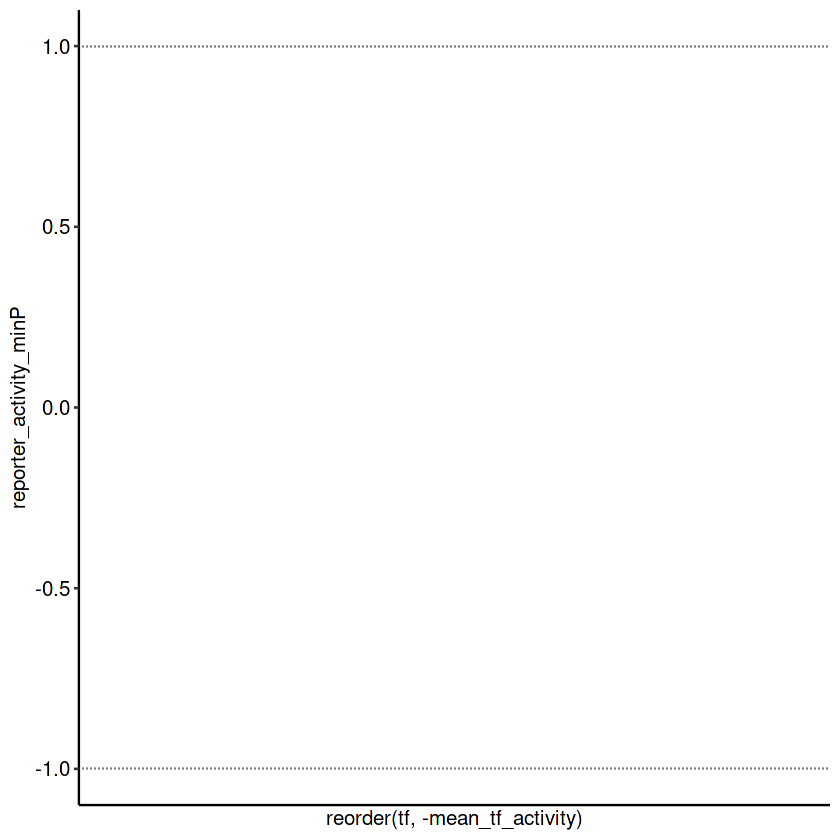

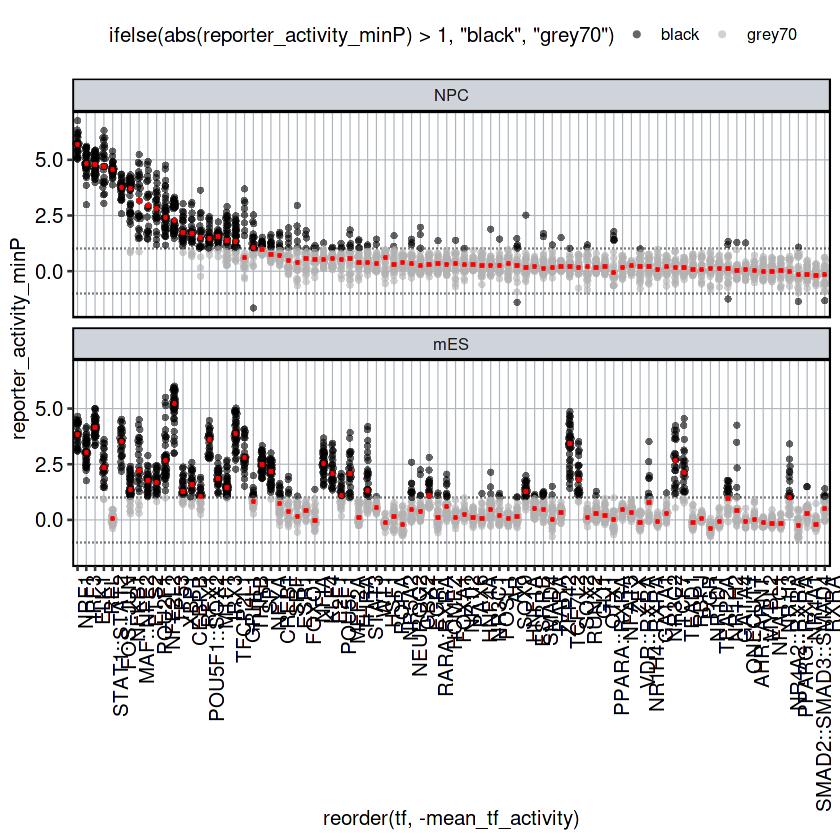

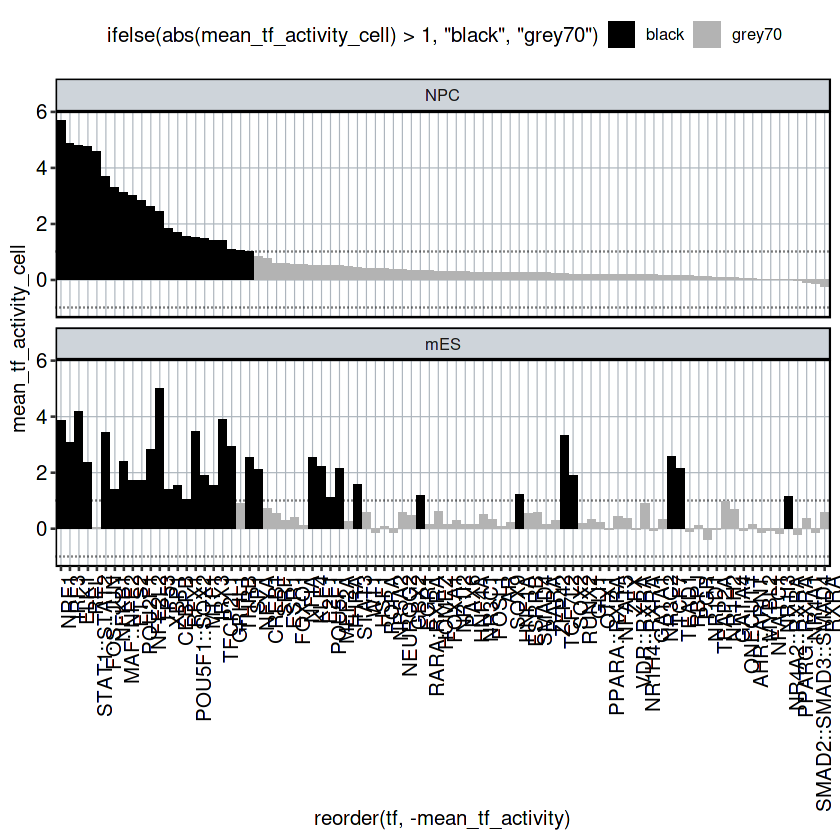

In [11]:
cell_colors <- c("A549" = "#f2cc8f", "HCT116" = "#babf95", "HEK293" = "#f4f1de", 
                               "HepG2" = "#5f797b", "K562" = "#8f5d5d", "MCF7" = "#81b29a", 
                               "U2OS" = "#3d405b", "mES" = "#eab69f", "NPC" = "#e07a5f") %>%
  as.data.frame() %>%
  rownames_to_column("cell")

## Quasirandom plots of reporter activities -- combined plot with best cell line per TF
cDNA_df_plot <- cDNA_df6 %>%
  distinct(tf, reporter_id, reporter_activity_minP, condition) %>%
  mutate(cell = gsub("_.*", "", condition)) %>%
  mutate(mean_tf_activity = ave(reporter_activity_minP, tf, FUN = mean)) %>%
  mutate(cell = factor(cell, levels = c("A549", "HCT116", "HEK293", "HepG2", "K562",
                                        "MCF7", "U2OS", "mES", "NPC"))) %>%
  mutate(n_tf = as.numeric(ave(tf, tf, FUN = length))) %>%
  filter(n_tf > 10)

tfs_colors <- cDNA_df_plot %>%
  distinct(tf, cell, mean_tf_activity) %>%
  arrange(desc(mean_tf_activity)) %>%
  left_join(cell_colors)
  
  
tfs_colors_vec <- tfs_colors %>%
  column_to_rownames("tf") %>%
  dplyr::select(-cell, -mean_tf_activity) %>%
  t() %>%
  base::as.vector()

names(tfs_colors_vec) <- tfs_colors$tf


ggplot(cDNA_df_plot,
       aes(x = reorder(tf, -mean_tf_activity), y = reporter_activity_minP)) +
  geom_hline(yintercept = 1, lty = 3) + 
  geom_hline(yintercept = -1, lty = 3) + 
  geom_quasirandom(width = .2, aes(color = ifelse(abs(reporter_activity_minP) > 1, "black", "grey70")),
                   alpha = .6) +
  stat_summary(fun = median, fun.min = median, fun.max = median, geom = "crossbar", color = "red", width = 0.5, lwd = 0.4) +
  theme_pubr(x.text.angle = 90) +
  scale_color_manual(values = c("black", "grey70")) +
  theme(axis.text.x = element_text(colour=tfs_colors_vec))

## Same but just show two cell lines
cDNA_df_plot <- cDNA_df %>%  
  filter(neg_ctrls == "No",
         commercial_reporter == "No",
         hPGK == "No", 
         str_detect(tf, "RANDOM", negate = T), 
         native_enhancer == "No") %>%
  distinct(tf, reporter_id, reporter_activity_minP, condition) %>%
  mutate(tf = gsub("_.*", "", tf)) %>%
  mutate(cell = gsub("_.*", "", condition)) %>%
  mutate(reporter_activity_minP = log2(ave(reporter_activity_minP, reporter_id, cell, FUN = mean))) %>%
  distinct(tf, reporter_id, reporter_activity_minP, cell) %>%
  mutate(n_tf = as.numeric(ave(tf, tf, cell, FUN = length))) %>%
  filter(n_tf >= 20) %>%
  filter(cell %in% c("NPC", "mES"))

cDNA_df_plot2 <- cDNA_df_plot %>%
  filter(cell == "NPC") %>%
  mutate(mean_tf_activity = ave(reporter_activity_minP, tf, cell, FUN = mean)) %>%
  distinct(tf, mean_tf_activity)

cDNA_df_plot <- cDNA_df_plot %>%
  left_join(cDNA_df_plot2)

ggplot(cDNA_df_plot %>%
           mutate(cell = factor(cell, levels = c("NPC", "mES"))),
       aes(x = reorder(tf, -mean_tf_activity), y = reporter_activity_minP)) +
    geom_hline(yintercept = 1, lty = 3) + 
    geom_hline(yintercept = -1, lty = 3) + 
    geom_quasirandom_rast(width = .2, shape = 21, stroke = NA, aes(fill = ifelse(abs(reporter_activity_minP) > 1, "black", "grey70")),
                          alpha = .6, size = 2, raster.dpi = 600) +
    stat_summary(fun = median, fun.min = median, fun.max = median, geom = "crossbar", color = "red", width = 0.5, lwd = 0.4) +
    theme_classic_lines_90() +
    scale_fill_manual(values = c("black", "grey70")) +
    facet_wrap(~cell, nrow = 2)

ggplot(cDNA_df_plot %>%
         mutate(mean_tf_activity_cell = ave(reporter_activity_minP, tf, cell, FUN = mean)) %>%
           mutate(cell = factor(cell, levels = c("NPC", "mES"))) %>%
         distinct(mean_tf_activity, tf, cell, mean_tf_activity_cell),
       aes(x = reorder(tf, -mean_tf_activity), y = mean_tf_activity_cell)) +
    geom_hline(yintercept = 1, lty = 3) + 
    geom_hline(yintercept = -1, lty = 3) + 
    geom_bar(stat = "identity", aes(fill = ifelse(abs(mean_tf_activity_cell) > 1, "black", "grey70"))) +
    theme_classic_lines_90() +
    scale_fill_manual(values = c("black", "grey70")) +
    facet_wrap(~cell, nrow = 2)

Conclusion: Reporter activities change between cell types.

---
### Figure 4: Showcase how reporter activities change upon perturbation
Aim: Demonstrate perturbation responses and differences between reporter designs.

Joining, by = "perturbation_condition"
Joining, by = "condition"
Warning message:
“Removed 5 rows containing missing values (`position_quasirandom()`).”


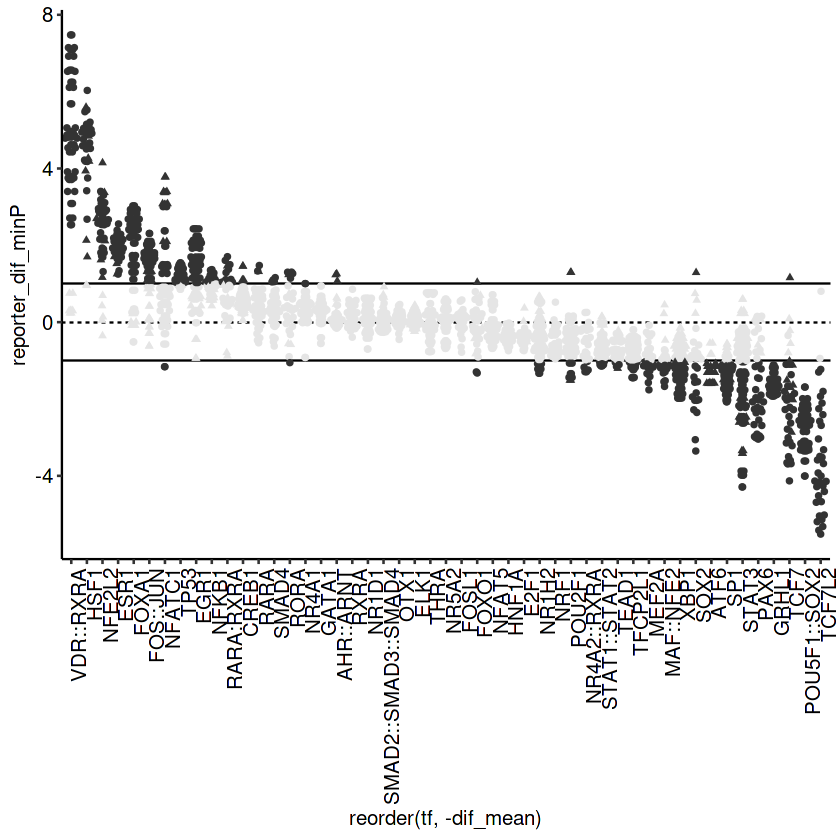

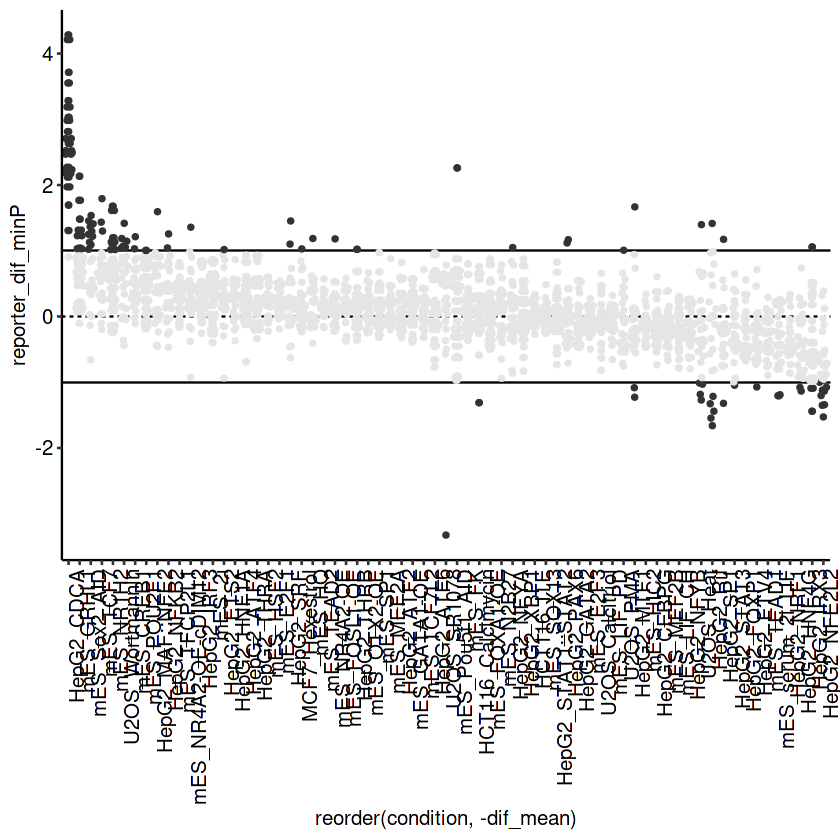

Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”


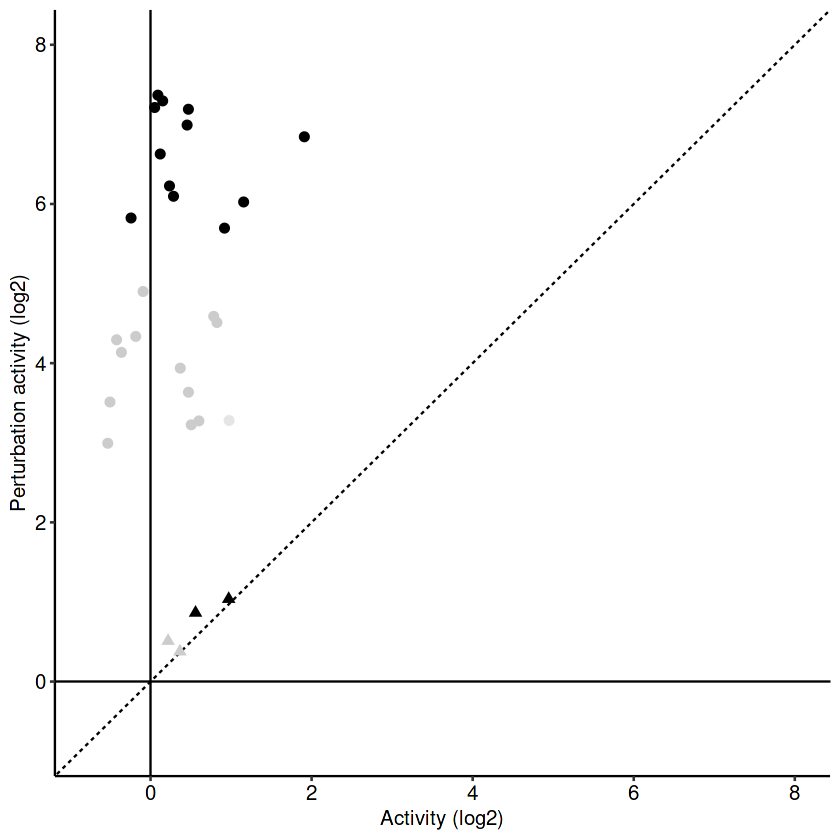

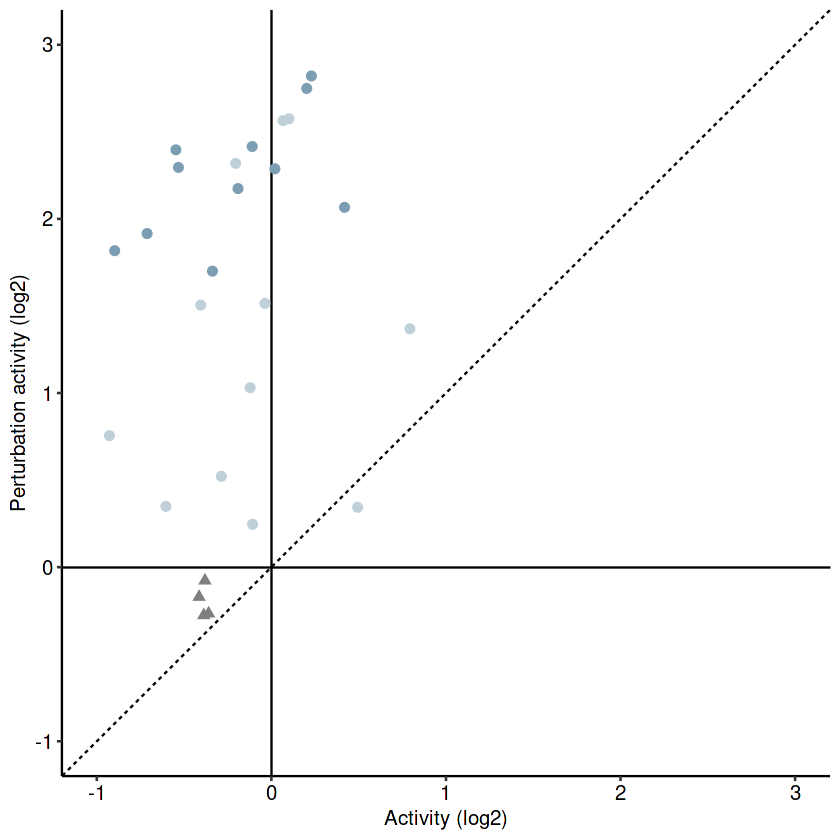

Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”


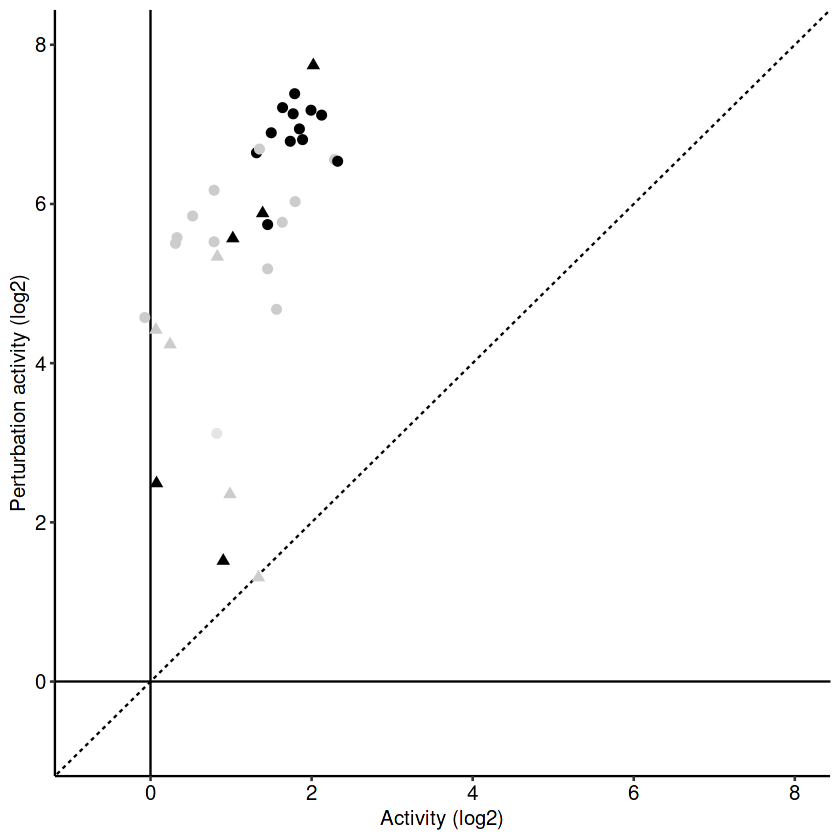

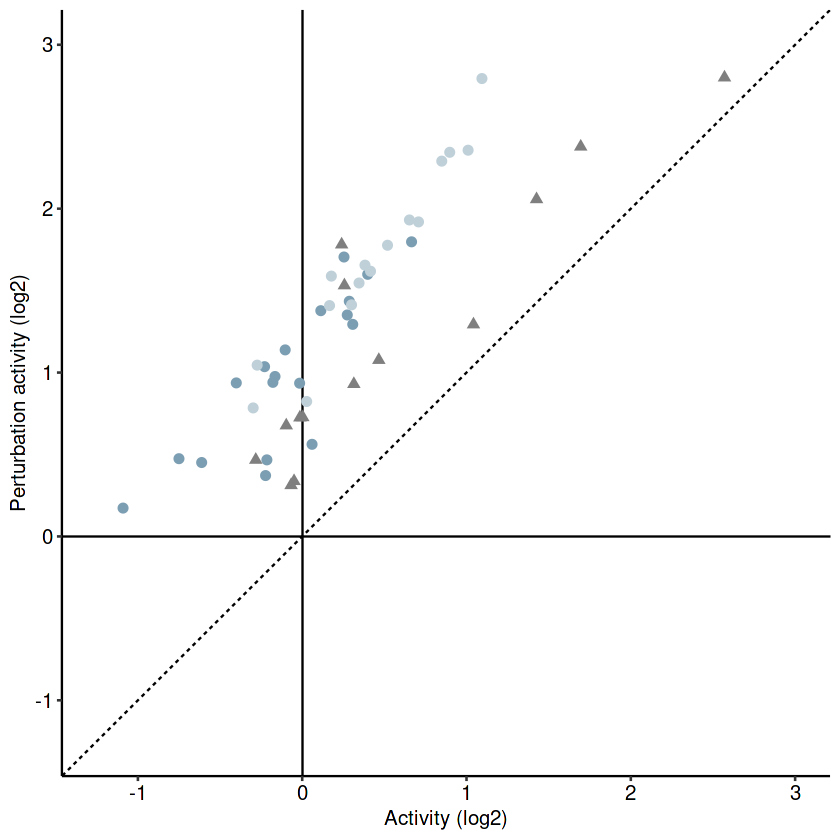

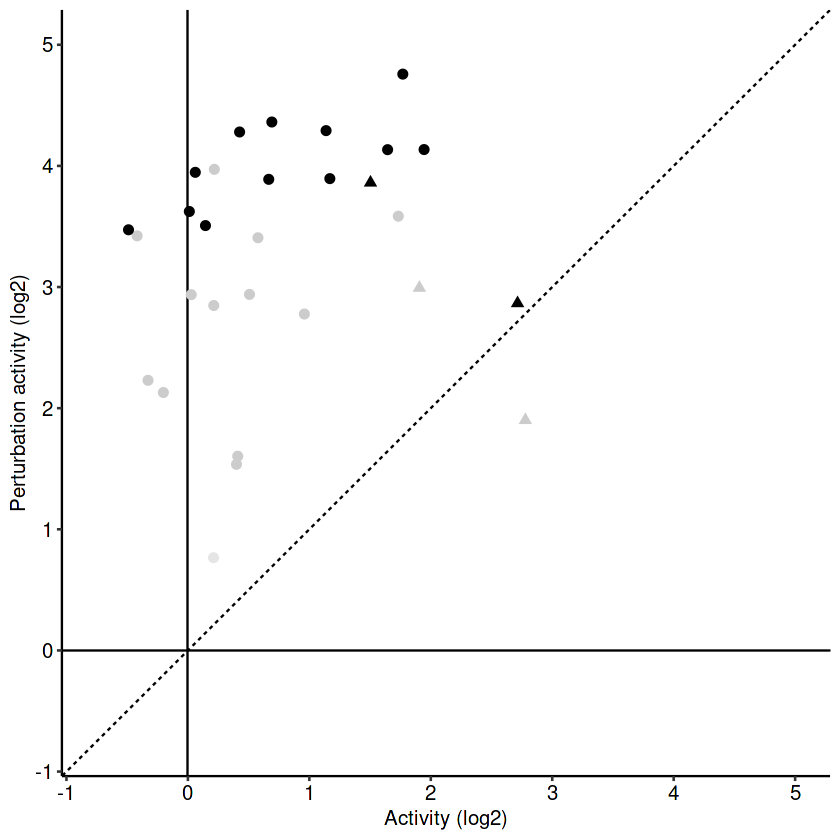

Warning message:
“Removed 11 rows containing missing values (`geom_point()`).”


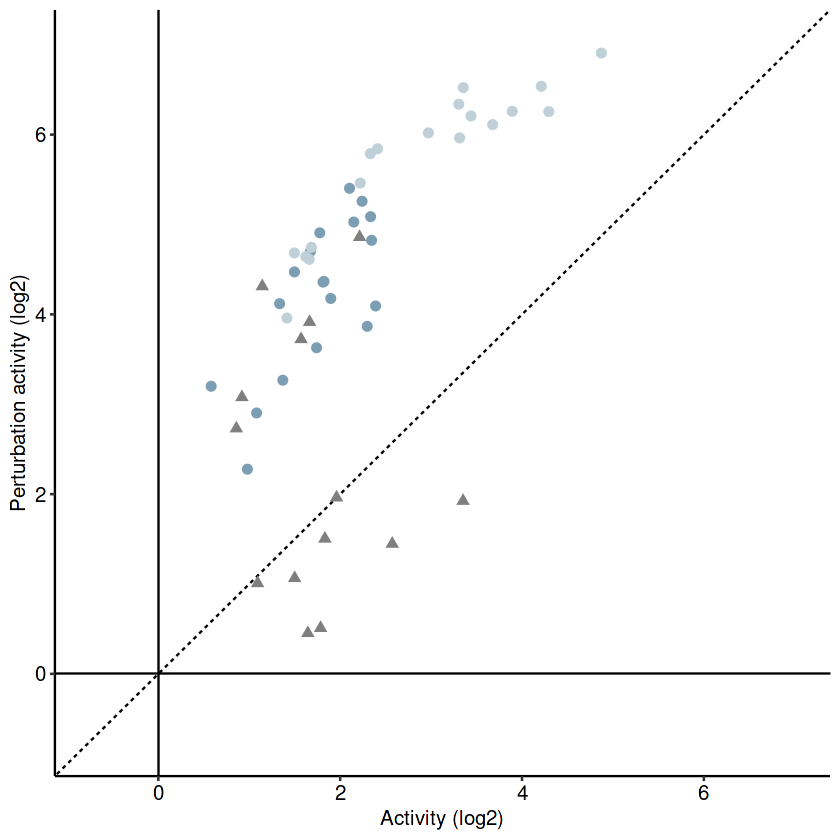

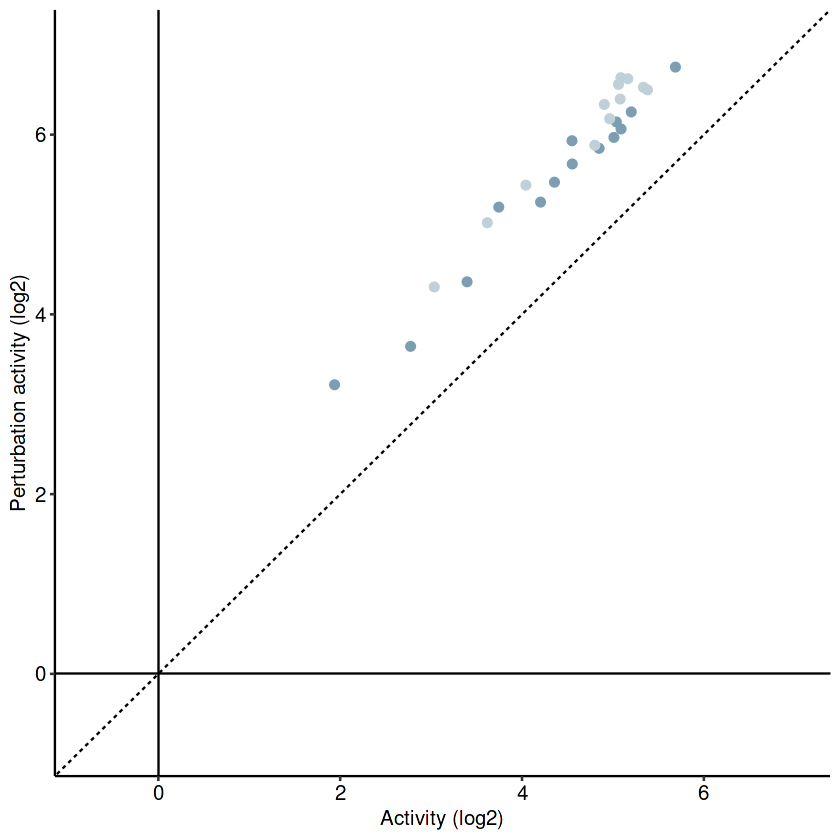

Warning message:
“Removed 3 rows containing missing values (`geom_point()`).”


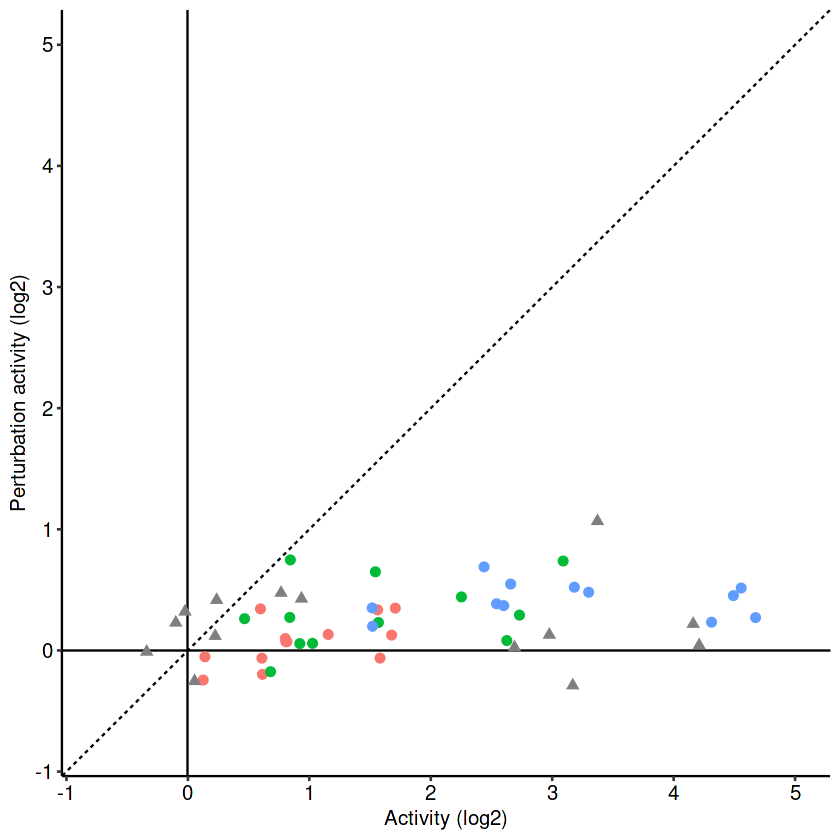

Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”


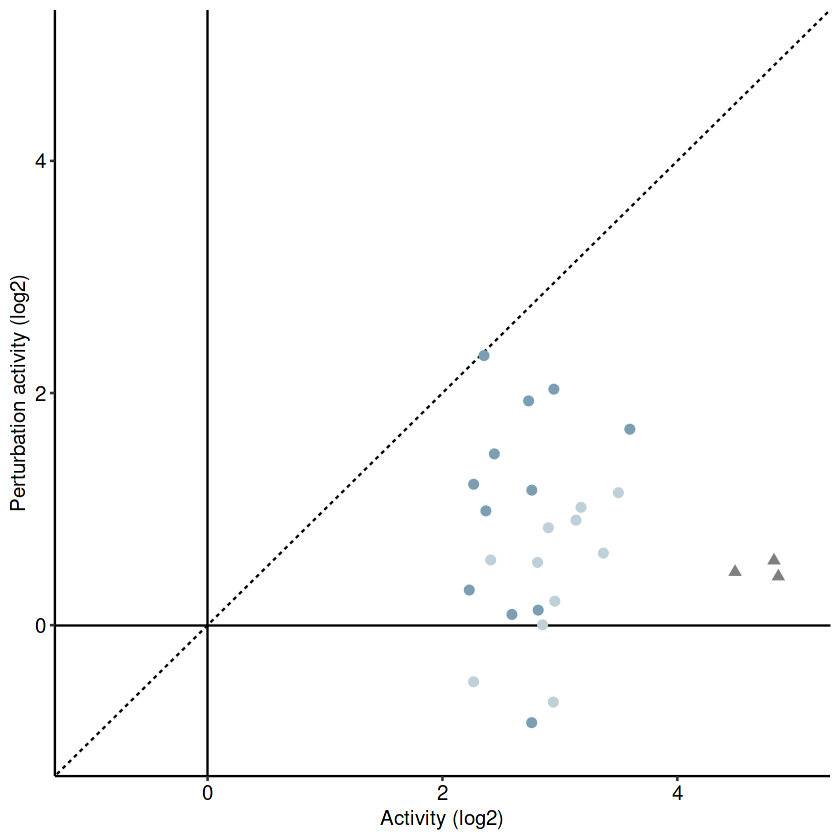

Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”


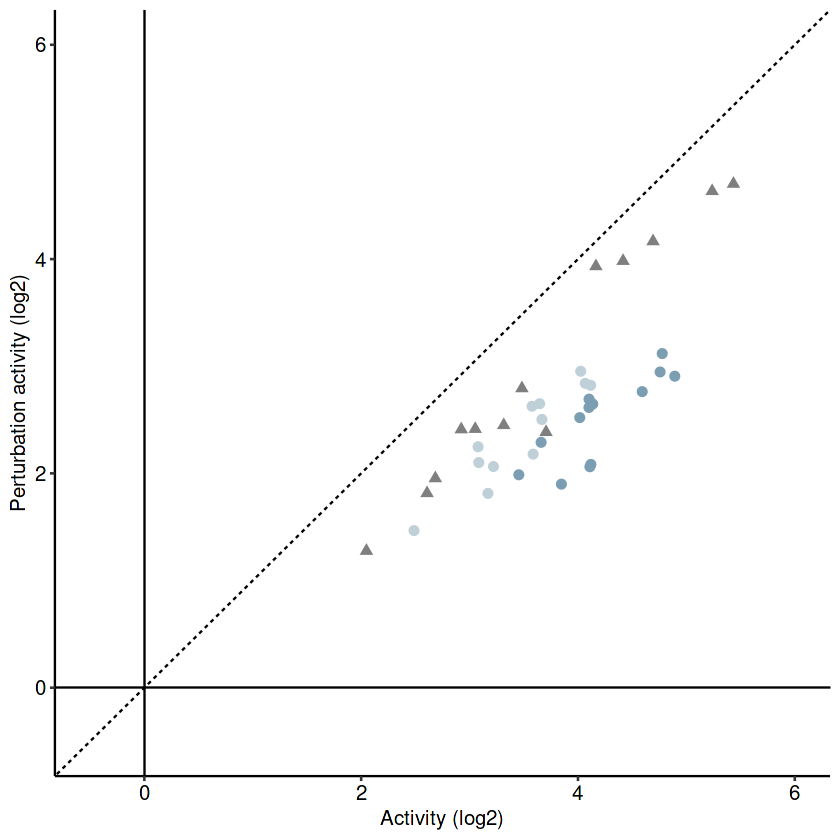

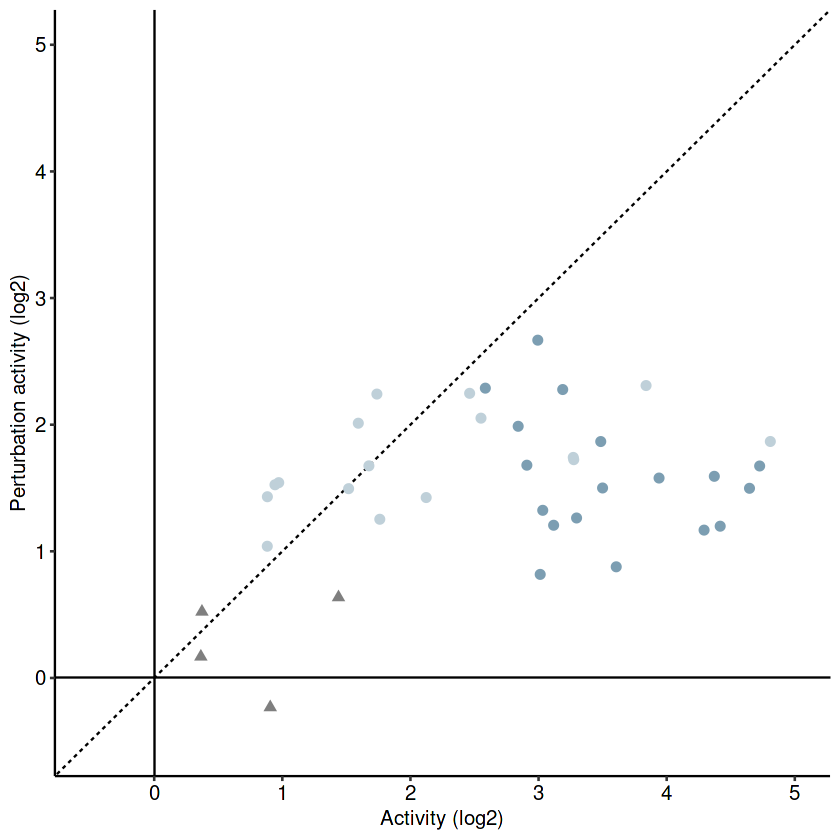

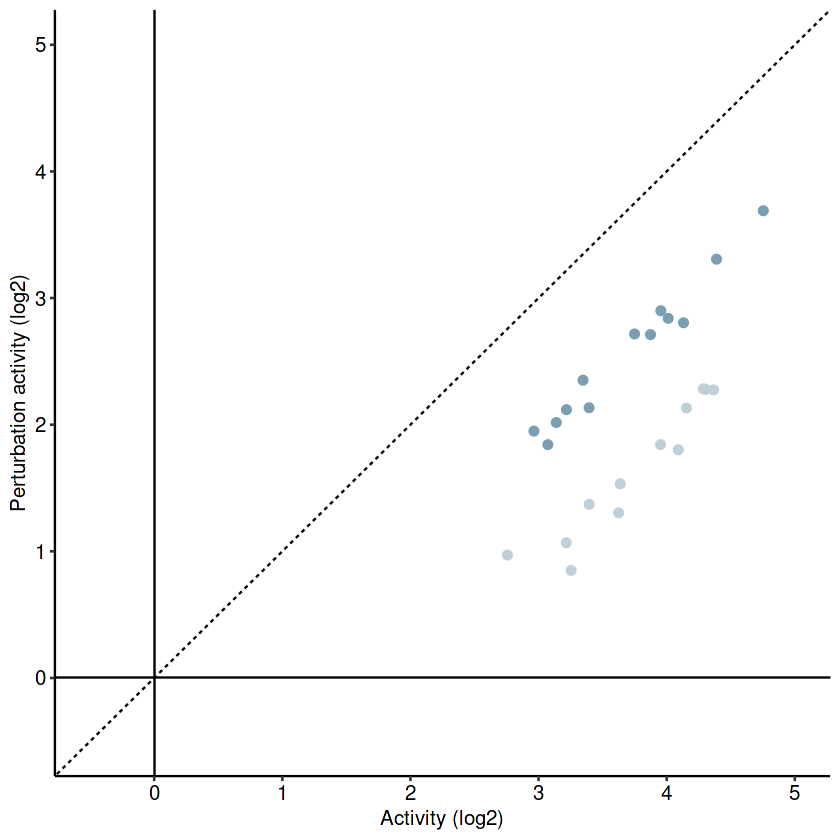

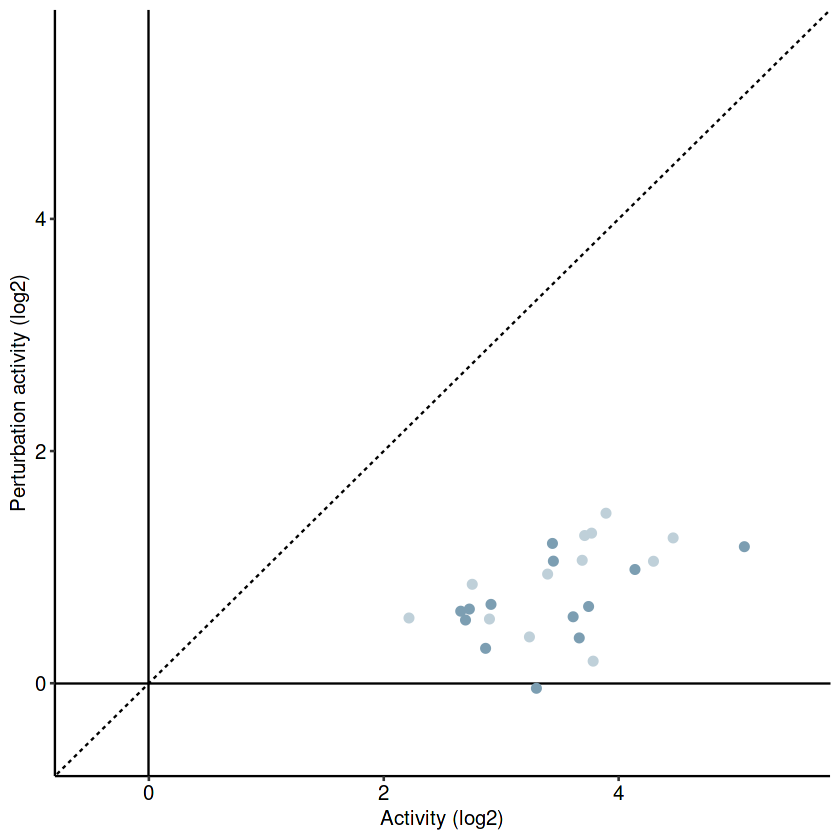

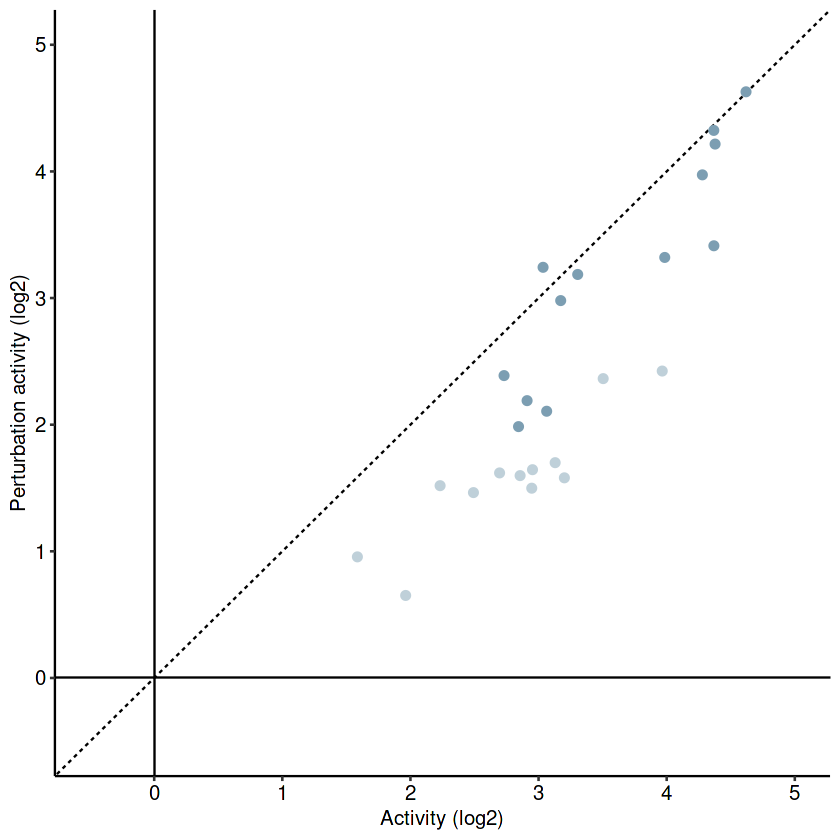

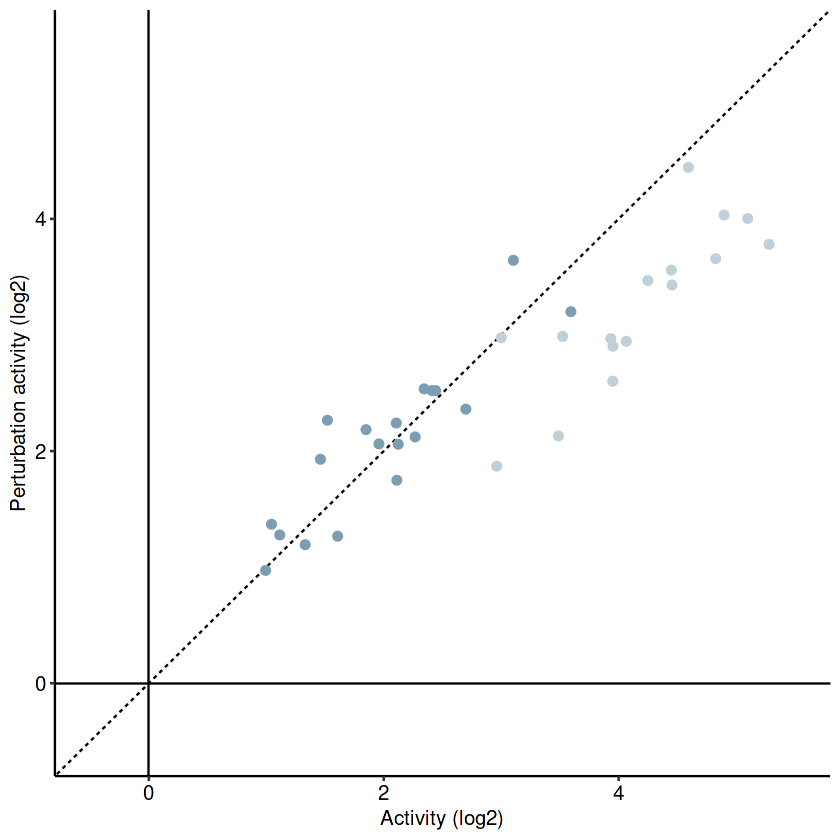

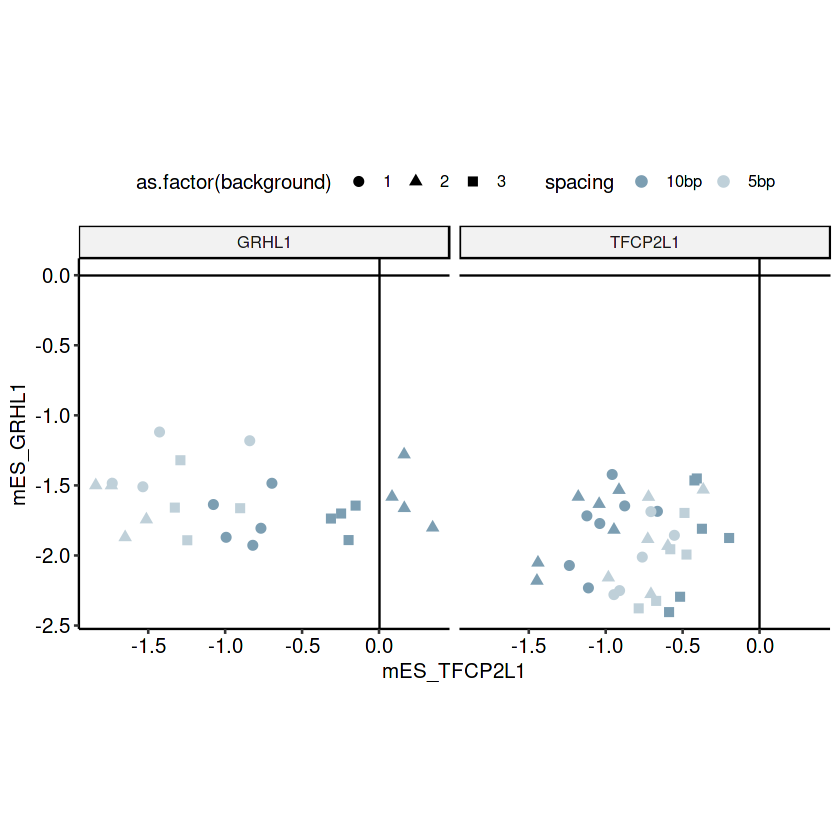

Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”


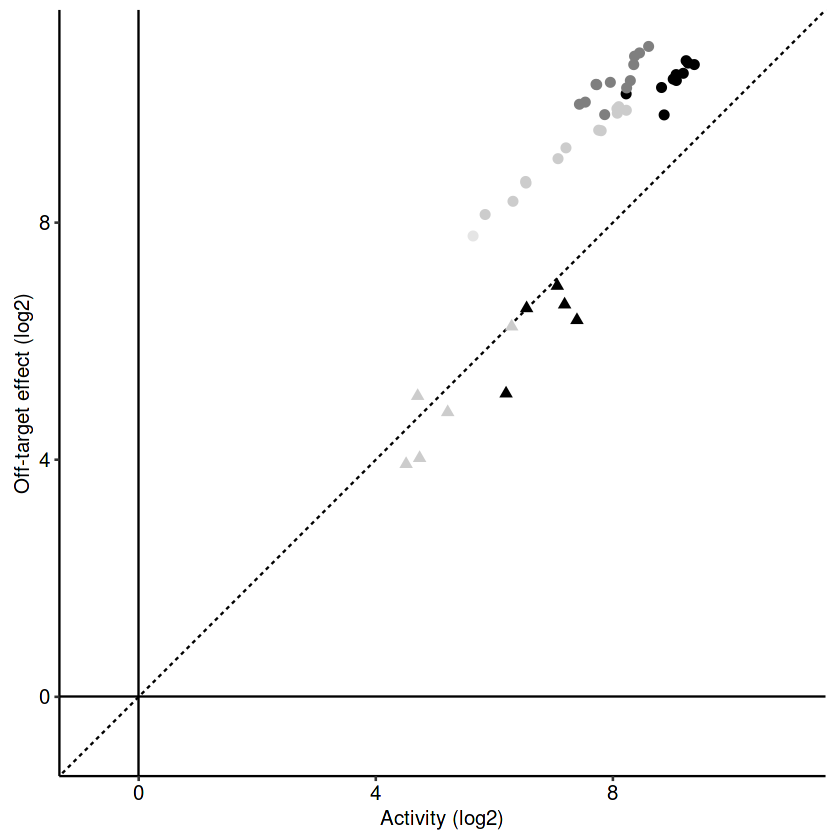

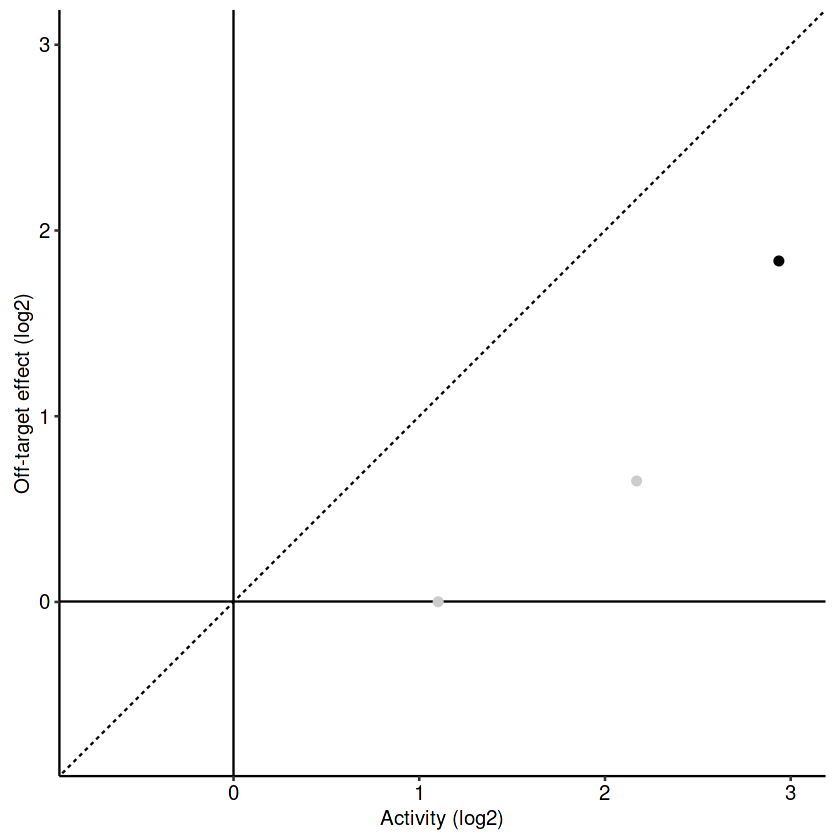

In [12]:
## Figure S4E: Plot perturbation response of all TFs (only one chosen perturbation/TF)
effect_sizes <- rbind(off_target_activities %>% distinct(condition, effect_size), 
                      on_target_activities %>% distinct(condition, effect_size)) %>%
  mutate(effect_size = ifelse(is.na(effect_size), 0, effect_size)) %>%
  dplyr::select("perturbation_condition" = condition, effect_size)

ggplot(cDNA_df_confidence2 %>%
         distinct(tf, reporter_id, reporter_dif_minP, commercial_reporter, perturbation_condition) %>%
         left_join(effect_sizes) %>%
         mutate(reporter_dif_minP = ifelse(effect_size == 0, -reporter_dif_minP, reporter_dif_minP)) %>%
         mutate(n_reporters = as.numeric(ave(reporter_id, tf, FUN = length))) %>%
         filter(n_reporters > 10) %>%
         mutate(dif_mean = ave(reporter_dif_minP, tf, FUN = mean)) %>%
         filter(dif_mean != 0),
       aes(x = reorder(tf, -dif_mean), y = reporter_dif_minP, shape = commercial_reporter)) +
  geom_hline(yintercept = 0, lty = 2) +
  geom_hline(yintercept = 1, lty = 1) +
  geom_hline(yintercept = -1, lty = 1) +
  geom_quasirandom(aes(color = ifelse(abs(reporter_dif_minP) > 1, "Yes", "No"))) +
  scale_color_manual(values = c("Yes" = "grey20", "No" = "grey90")) +
  theme_pubr(x.text.angle = 90, legend = "none")

## Figure S4F: Plot perturbation response of VDR reporters to all perturbations
ggplot(cDNA_df %>%
         filter(tf == "NR1H4::RXRA", stimulation != "no") %>%
         distinct(tf, reporter_id, reporter_dif_minP, commercial_reporter, condition) %>%
         left_join(effect_sizes %>% dplyr::select("condition" = perturbation_condition, effect_size)) %>%
         drop_na(effect_size) %>%
         mutate(reporter_dif_minP = ifelse(effect_size == 0, -reporter_dif_minP, reporter_dif_minP)) %>%
         mutate(dif_mean = ave(reporter_dif_minP, tf, condition, FUN = function(x) mean(x, na.rm = T))),
       aes(x = reorder(condition, -dif_mean), y = reporter_dif_minP, shape = commercial_reporter)) +
  geom_hline(yintercept = 0, lty = 2) +
  geom_hline(yintercept = 1, lty = 1) +
  geom_hline(yintercept = -1, lty = 1) +
  geom_quasirandom(aes(color = ifelse(abs(reporter_dif_minP) > 1, "Yes", "No"))) +
  scale_color_manual(values = c("Yes" = "grey20", "No" = "grey90")) +
  theme_pubr(x.text.angle = 90, legend = "none")

## Showcase examples
### TF activation
#### VDR
ggplot(cDNA_df %>% 
         filter(str_detect(tf, "VDR"), condition %in% c("U2OS", "U2OS_Calcitriol"), neg_ctrls == "No") %>%
         distinct(reporter_id, commercial_reporter, condition, reporter_activity_minP, promoter) %>%
         spread(key = "condition", value = "reporter_activity_minP"),
       aes(x = log2(U2OS),
           y = log2(U2OS_Calcitriol), 
           shape = commercial_reporter, 
           color = promoter)) +
  geom_hline(yintercept = 0) + 
  geom_vline(xintercept = 0) +
  geom_abline(lty = 2) +
  geom_point(size = 2.5) +
  xlim(-0.75, 8) +
  ylim(-0.75, 8) +
  xlab("Activity (log2)") +
  ylab(paste("Perturbation activity (log2)")) +
  theme_pubr(legend = "none") +
  scale_color_manual(values = c("mCMV" = "black", "hBGm" = "grey50", "minP" = "grey80", "Random" = "grey90"))

#### FOXA1
ggplot(cDNA_df %>% 
         filter(str_detect(tf, "FOXA1"), condition %in% c("mES_Dox", "mES_FOXA1-OE"), neg_ctrls == "No") %>%
         distinct(reporter_id, commercial_reporter, spacing, condition, reporter_activity_minP) %>%
         spread(key = "condition", value = "reporter_activity_minP"),
       aes(x = log2(mES_Dox),
           y = log2(`mES_FOXA1-OE`), 
           shape = commercial_reporter,
           color = spacing)) +
  geom_hline(yintercept = 0) + 
  geom_vline(xintercept = 0) +
  geom_abline(lty = 2) +
  geom_point(size = 2.5) +
  xlim(-1, 3) +
  ylim(-1, 3) +
  xlab("Activity (log2)") +
  ylab(paste("Perturbation activity (log2)")) +
  theme_pubr(legend = "none") +
  scale_color_manual(values = c("#7C9EB2", "#BFD0D9"))

#### HSF1
ggplot(cDNA_df %>% 
         filter(str_detect(tf, "HSF1"), condition %in% c("U2OS", "U2OS_Heat"), neg_ctrls == "No") %>%
         distinct(reporter_id, commercial_reporter, promoter, condition, background, reporter_activity_minP) %>%
         spread(key = "condition", value = "reporter_activity_minP"),
       aes(x = log2(U2OS),
           y = log2(U2OS_Heat), 
           shape = commercial_reporter,
           color = as.factor(promoter))) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_abline(lty = 2) +
  geom_point(size = 2.5) +
  xlim(-0.75, 8) +
  ylim(-0.75, 8) +
  xlab("Activity (log2)") +
  ylab(paste("Perturbation activity (log2)")) +
  theme_pubr(legend = "none") +
  scale_color_manual(values = c("mCMV" = "black", "hBGm" = "grey50", "minP" = "grey80", "Random" = "grey90"))

#### CREB1
ggplot(cDNA_df %>% 
         filter(str_detect(tf, "CREB1"), condition %in% c("mES_2i_LIF", "mES_FK"), neg_ctrls == "No") %>%
         distinct(reporter_id, commercial_reporter, spacing, condition, background, reporter_activity_minP) %>%
         spread(key = "condition", value = "reporter_activity_minP"),
       aes(x = log2(mES_2i_LIF),
           y = log2(mES_FK), 
           shape = commercial_reporter,
           color = as.factor(spacing))) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_abline(lty = 2) +
  geom_point(size = 2.5) +
  xlim(-1.25, 3) +
  ylim(-1.25, 3) +
  xlab("Activity (log2)") +
  ylab(paste("Perturbation activity (log2)")) +
  theme_pubr(legend = "none") +
  scale_color_manual(values = c("#7C9EB2", "#BFD0D9"))

#### NR1H4
ggplot(cDNA_df %>% 
         filter(str_detect(tf, "NR1H4::RXRA"), condition %in% c("HepG2", "HepG2_CDCA"), neg_ctrls == "No") %>%
         distinct(reporter_id, commercial_reporter, promoter, condition, background, reporter_activity_minP) %>%
         spread(key = "condition", value = "reporter_activity_minP"),
       aes(x = log2(HepG2),
           y = log2(HepG2_CDCA), 
           shape = commercial_reporter,
           color = as.factor(promoter))) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_abline(lty = 2) +
  geom_point(size = 2.5) +
  xlim(-0.75, 5) +
  ylim(-0.75, 5) +
  xlab("Activity (log2)") +
  ylab(paste("Perturbation activity (log2)")) +
  theme_pubr(legend = "none") +
  scale_color_manual(values = c("mCMV" = "black", "hBGm" = "grey50", "minP" = "grey80", "Random" = "grey90"))

#### NFE2L2
ggplot(cDNA_df %>% 
         filter(str_detect(tf, "NFE2L2"), condition %in% c("mES_2i_LIF", "mES_HQ"), neg_ctrls == "No") %>%
         distinct(reporter_id, commercial_reporter, spacing, condition, background, reporter_activity_minP) %>%
         spread(key = "condition", value = "reporter_activity_minP"),
       aes(x = log2(mES_2i_LIF),
           y = log2(mES_HQ), 
           shape = commercial_reporter,
           color = as.factor(spacing))) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_abline(lty = 2) +
  geom_point(size = 2.5) +
  xlim(-0.75, 7) +
  ylim(-0.75, 7) +
  xlab("Activity (log2)") +
  ylab(paste("Perturbation activity (log2)")) +
  theme_pubr(legend = "none") +
  scale_color_manual(values = c("#7C9EB2", "#BFD0D9"))

#### TP53
ggplot(cDNA_df %>% 
         filter(str_detect(tf, "TP53"), gcf == "gcf6210", condition %in% c("A549_Nutlin"), neg_ctrls == "No") %>%
         distinct(reporter_id, commercial_reporter, spacing, condition, background, reporter_activity_minP, reference_activity_gcf),
       aes(x = reference_activity_gcf,
           y = log2(reporter_activity_minP), 
           shape = commercial_reporter,
           color = as.factor(spacing))) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_abline(lty = 2) +
  geom_point(size = 2.5) +
  xlim(-0.75, 7) +
  ylim(-0.75, 7) +
  xlab("Activity (log2)") +
  ylab(paste("Perturbation activity (log2)")) +
  theme_pubr(legend = "none") +
  scale_color_manual(values = c("#7C9EB2", "#BFD0D9"))



### TF inactivation
#### STAT3
ggplot(cDNA_df %>% 
         filter(str_detect(tf, "STAT3"), condition %in% c("mES_2i_LIF", "mES_2i"), neg_ctrls == "No") %>%
         distinct(reporter_id, commercial_reporter, promoter, condition, background, reporter_activity_minP) %>%
         #mutate(reporter_activity_minP = ave(reporter_activity_minP, reporter_id, condition, FUN = mean)) %>%
         #distinct() %>%
         spread(key = "condition", value = "reporter_activity_minP"),
       aes(x = log2(mES_2i_LIF),
           y = log2(mES_2i), 
           shape = commercial_reporter,
           color = as.factor(background))) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_abline(lty = 2) +
  geom_point(size = 2.5) +
  xlim(-0.75, 5) +
  ylim(-0.75, 5) +
  xlab("Activity (log2)") +
  ylab(paste("Perturbation activity (log2)")) +
  theme_pubr(legend = "none")

#### MTF1
ggplot(cDNA_df %>% 
         filter(str_detect(tf, "MTF1"), condition %in% c("HepG2_NT", "HepG2_MTF1"), neg_ctrls == "No") %>%
         distinct(reporter_id, commercial_reporter, spacing, condition, reporter_activity_minP) %>%
         spread(key = "condition", value = "reporter_activity_minP"),
       aes(x = log2(HepG2_NT),
           y = log2(HepG2_MTF1), 
           shape = commercial_reporter,
           color = spacing)) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_abline(lty = 2) +
  geom_point(size = 2.5) +
  xlim(-1, 5) +
  ylim(-1, 5) +
  xlab("Activity (log2)") +
  ylab(paste("Perturbation activity (log2)")) +
  theme_pubr(legend = "none")+
  scale_color_manual(values = c("#7C9EB2", "#BFD0D9"))

#### XBP1
ggplot(cDNA_df %>%
         filter(str_detect(tf, "XBP1"), condition %in% c("HepG2_XBP1", "HepG2_NT"), neg_ctrls == "No") %>%
         distinct(reporter_id, commercial_reporter, spacing, condition, background, reporter_activity_minP) %>%
         spread(key = "condition", value = "reporter_activity_minP"),
       aes(x = log2(HepG2_NT),
           y = log2(HepG2_XBP1),
           shape = commercial_reporter, 
           color = spacing)) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_abline(lty = 2) +
  xlim(-.5,6) +
  ylim(-.5,6) +
  geom_point(size = 2.5) +
  xlab("Activity (log2)") +
  ylab(paste("Perturbation activity (log2)")) +
  theme_pubr(legend = "none")+
  scale_color_manual(values = c("#7C9EB2", "#BFD0D9"))

#### PAX6
ggplot(cDNA_df %>% 
         filter(str_detect(tf, "PAX6"), condition %in% c("HepG2_PAX6", "HepG2_NT"), neg_ctrls == "No") %>%
         distinct(reporter_id, commercial_reporter, spacing, condition, background, reporter_activity_minP) %>%
         spread(key = "condition", value = "reporter_activity_minP"),
       aes(x = log2(HepG2_NT),
           y = log2(HepG2_PAX6), 
           shape = commercial_reporter,
           color = spacing)) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_abline(lty = 2) +
  xlim(-.5,5) +
  ylim(-.5,5) +
  geom_point(size = 2.5) +
  xlab("Activity (log2)") +
  ylab(paste("Perturbation activity (log2)")) +
  theme_pubr(legend = "none") +
  scale_color_manual(values = c("#7C9EB2", "#BFD0D9"))

### POU5F1::SOX2
ggplot(cDNA_df %>% 
  filter(str_detect(tf, "POU5F1::SOX2"), condition %in% c("mES_Sox2_AID", "mES_Pou5f1_AID", "mES_Sox2_ctrl", "mES_Pou5f1_ctrl"), 
                neg_ctrls == "No") %>%
  distinct(reporter_id, commercial_reporter, spacing, condition, background, reporter_activity_minP) %>%
  spread(key = "condition", value = "reporter_activity_minP"),
       aes(x = log2(mES_Sox2_ctrl),
           y = log2(mES_Sox2_AID), 
           shape = commercial_reporter,
           color = spacing)) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_abline(lty = 2) +
  xlim(-.5,5) +
  ylim(-.5,5) +
  geom_point(size = 2.5) +
  xlab("Activity (log2)") +
  ylab(paste("Perturbation activity (log2)")) +
  theme_pubr(legend = "none") +
  scale_color_manual(values = c("#7C9EB2", "#BFD0D9"))

ggplot(cDNA_df %>% 
  filter(str_detect(tf, "POU5F1::SOX2"), condition %in% c("mES_Sox2_AID", "mES_Pou5f1_AID", "mES_Sox2_ctrl", "mES_Pou5f1_ctrl"), 
                neg_ctrls == "No") %>%
  distinct(reporter_id, commercial_reporter, spacing, condition, background, reporter_activity_minP) %>%
  spread(key = "condition", value = "reporter_activity_minP"),
       aes(x = log2(mES_Pou5f1_ctrl),
           y = log2(mES_Pou5f1_AID), 
           shape = commercial_reporter,
           color = spacing)) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_abline(lty = 2) +
  xlim(-.5,5.5) +
  ylim(-.5,5.5) +
  geom_point(size = 2.5) +
  xlab("Activity (log2)") +
  ylab(paste("Perturbation activity (log2)")) +
  theme_pubr(legend = "none") +
  scale_color_manual(values = c("#7C9EB2", "#BFD0D9"))


### Off-target response
#### GRHL1
ggplot(cDNA_df %>% 
         filter(str_detect(tf, "GRHL1"), condition %in% c("mES_NT", "mES_TFCP2L1"), neg_ctrls == "No") %>%
         distinct(reporter_id, commercial_reporter, spacing, condition, reporter_activity_minP) %>%
         spread(key = "condition", value = "reporter_activity_minP"),
       aes(x = log2(mES_NT),
           y = log2(mES_TFCP2L1), 
           shape = commercial_reporter,
           color = spacing)) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_abline(lty = 2) +
  xlim(-.5,5) +
  ylim(-.5,5) +
  geom_point(size = 2.5) +
  xlab("Activity (log2)") +
  ylab(paste("Perturbation activity (log2)")) +
  theme_pubr(legend = "none") +
  scale_color_manual(values = c("#7C9EB2", "#BFD0D9"))

#### TFCP2L1
ggplot(cDNA_df %>% 
         filter(str_detect(tf, "TFCP2L1"), gcf == "gcf6952", condition %in% c("HepG2_NT", "HepG2_UBP1"), neg_ctrls == "No") %>%
         distinct(reporter_id, commercial_reporter, spacing, condition, reporter_activity_minP_gcf) %>%
         spread(key = "condition", value = "reporter_activity_minP_gcf"),
       aes(x = log2(HepG2_NT),
           y = log2(HepG2_UBP1), 
           shape = commercial_reporter,
           color = spacing)) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_abline(lty = 2) +
  xlim(-.5,5.5) +
  ylim(-.5,5.5) +
  geom_point(size = 2.5) +
  xlab("Activity (log2)") +
  ylab(paste("Perturbation activity (log2)")) +
  theme_pubr(legend = "none") +
  scale_color_manual(values = c("#7C9EB2", "#BFD0D9"))

#### GRHL1 vs TFCP2L1
grhl1_tfcp2l1 <- cDNA_df %>% 
  filter(tf %in% c("TFCP2L1", "GRHL1"), tf_target == 1 | tf_target == 2, cell == "mES", condition != "mES_TFCP2") %>%
  distinct(tf, reporter_id, reporter_dif_minP, spacing, promoter, background, condition) %>%
  spread(key = "condition", value = "reporter_dif_minP")

ggplot(grhl1_tfcp2l1,
       aes(x = mES_TFCP2L1, y = mES_GRHL1)) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  geom_point(aes(color = spacing, shape = as.factor(background)), size = 2.5) +
  theme_pubr() +
  theme(aspect.ratio = 1) +
  facet_wrap(~tf) +
  scale_color_manual(values = c("#7C9EB2", "#BFD0D9"))

# #### CLOCK
# ggplot(cDNA_df %>% 
#          filter(str_detect(tf, "CLOCK"), gcf == "gcf6578", condition %in% c("mES_2i_LIF", "mES_2i"), neg_ctrls == "No") %>%
#          distinct(reporter_id, commercial_reporter, spacing, condition, reporter_activity_minP_gcf) %>%
#          spread(key = "condition", value = "reporter_activity_minP_gcf"),
#        aes(x = log2(mES_2i_LIF),
#            y = log2(mES_2i))) +
#   geom_abline(lty = 2) +
#   geom_hline(yintercept = 0) +
#   geom_vline(xintercept = 0) +
#   geom_point(size = 2.5) +
#   xlim(-.75, 3) +
#   ylim(-.75, 3) +
#   xlab("Activity (log2)") +
#   ylab(paste("Perturbation activity (log2)")) +
#   theme_pubr(legend = "none")

#### TP53
ggplot(cDNA_df %>% 
         filter(str_detect(tf, "TP53"), condition %in% c("HepG2", "HepG2_TP73"), neg_ctrls == "No") %>%
         distinct(reporter_id, commercial_reporter, spacing, condition, promoter, reporter_activity_minP) %>%
         spread(key = "condition", value = "reporter_activity_minP"),
       aes(x = log2(HepG2),
           y = log2(HepG2_TP73), 
           shape = commercial_reporter)) +
  geom_abline(lty = 2) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  xlim(-.75, 11) +
  ylim(-.75, 11) +
  geom_point(size = 2.5, aes(color = promoter)) +
  xlab("Activity (log2)") +
  ylab(paste("Off-target effect (log2)")) +
  theme_pubr(legend = "none") +
  theme(aspect.ratio = 1) + 
  scale_color_manual(values = c("mCMV" = "black", "hBGm" = "grey50", "minP" = "grey80", "Random" = "grey90"))


### CLOCK
ggplot(cDNA_df %>% 
         filter(str_detect(tf, "CLOCK"), condition %in% c("mES_2i_LIF", "mES_2i"), neg_ctrls == "No") %>%
         distinct(reporter_id, commercial_reporter, spacing, condition, promoter, reporter_activity_minP) %>%
         spread(key = "condition", value = "reporter_activity_minP"),
       aes(x = log2(mES_2i_LIF),
           y = log2(mES_2i), 
           shape = commercial_reporter)) +
  geom_abline(lty = 2) +
  geom_hline(yintercept = 0) +
  geom_vline(xintercept = 0) +
  xlim(-.75, 3) +
  ylim(-.75, 3) +
  geom_point(size = 2.5, aes(color = promoter)) +
  xlab("Activity (log2)") +
  ylab(paste("Off-target effect (log2)")) +
  theme_pubr(legend = "none") +
  theme(aspect.ratio = 1) + 
  scale_color_manual(values = c("mCMV" = "black", "hBGm" = "grey50", "minP" = "grey80", "Random" = "grey90"))

Conclusion: Many TF reporters respond substantially to the direct TF perturbation, and the fold-changes often depend on reporter design.

---
### Rate performance of synthetic vs. published reporters
Aim: Summarize how well the synthetic reporters perform compared to the published reporters.

Warning message in FUN(X[[i]], ...):
“no non-missing arguments to max; returning -Inf”
Warning message in FUN(X[[i]], ...):
“no non-missing arguments to max; returning -Inf”
Warning message in FUN(X[[i]], ...):
“no non-missing arguments to max; returning -Inf”
Warning message in FUN(X[[i]], ...):
“no non-missing arguments to max; returning -Inf”
Warning message in FUN(X[[i]], ...):
“no non-missing arguments to max; returning -Inf”
Warning message in FUN(X[[i]], ...):
“no non-missing arguments to max; returning -Inf”
Warning message in FUN(X[[i]], ...):
“no non-missing arguments to max; returning -Inf”
Warning message in FUN(X[[i]], ...):
“no non-missing arguments to max; returning -Inf”
Warning message in FUN(X[[i]], ...):
“no non-missing arguments to max; returning -Inf”
Warning message in FUN(X[[i]], ...):
“no non-missing arguments to max; returning -Inf”
Warning message in FUN(X[[i]], ...):
“no non-missing arguments to max; returning -Inf”
Warning message in FUN(X[[i]], ...):
“no no

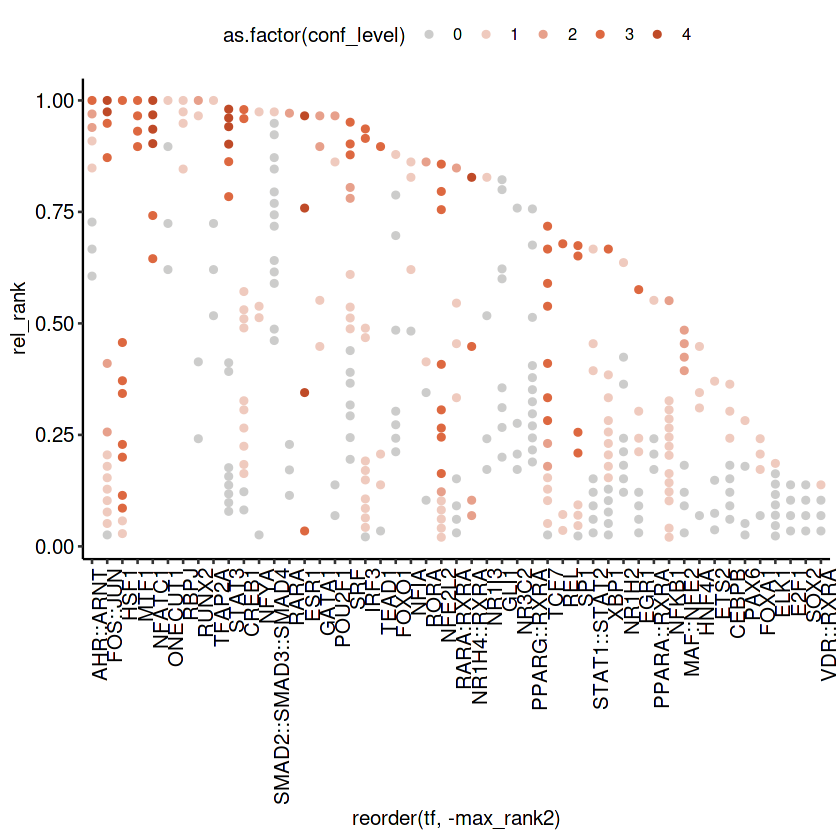

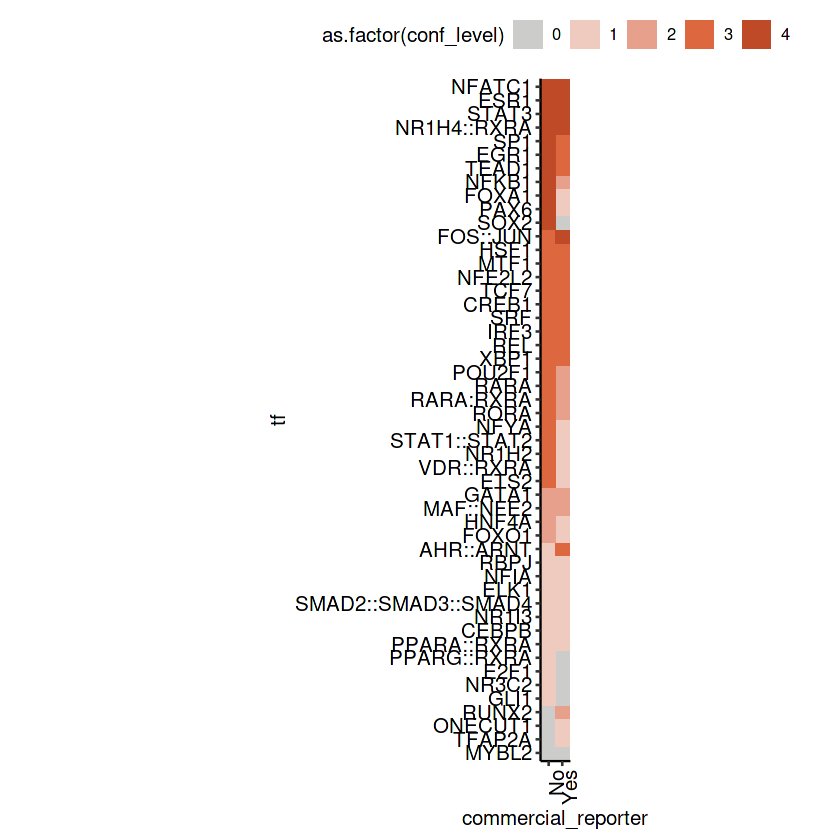

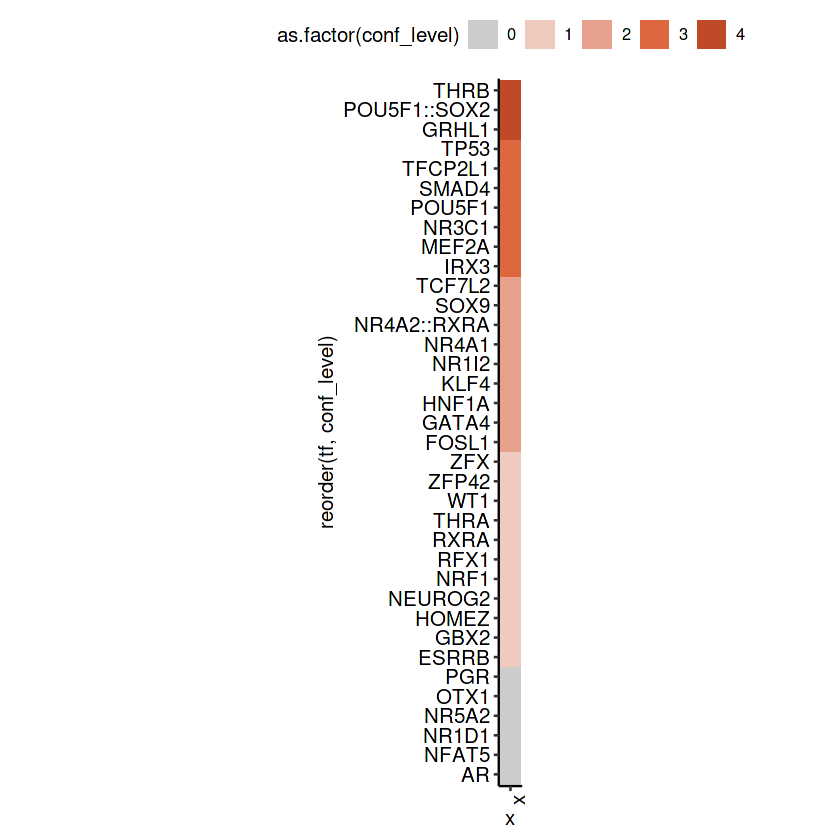

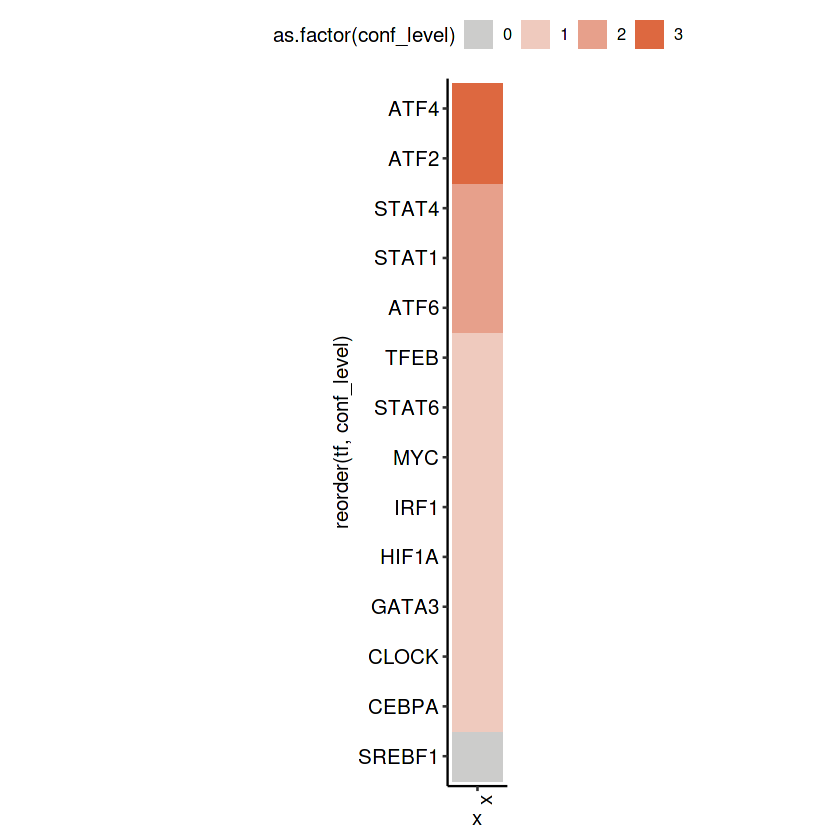

In [13]:
## First I want to show how well commercial reporters perform compared to synthetic ones
bad_tfs <- cDNA_df_confidence2 %>%
  distinct(tf, conf_level) %>%
  filter(!is.na(conf_level)) %>%
  group_by(tf) %>%
  mutate(removed = conf_level > 0) %>%
  mutate(removed2 = TRUE %in% removed) %>%
  filter(removed2 == TRUE) %>%
  distinct(tf)

commercial_ranking <- cDNA_df_confidence2 %>%
  filter(tf %in% bad_tfs$tf) %>%
  group_by(tf) %>%
  arrange(conf_level, quality_score) %>%
  mutate(rank = row_number()) %>%
  distinct(tf, reporter_id, rank, commercial_reporter, conf_level) %>%
  ## remove tfs for which I don't have commercial reporters
  group_by(tf) %>%
  mutate(commercial = "Yes" %in% commercial_reporter) %>%
  ungroup() %>%
  filter(commercial == TRUE) %>%
  ## calculate relative rank
  mutate(max_rank = ave(rank, tf, FUN = max)) %>%
  filter(max_rank > 10) %>%
  mutate(rel_rank = rank/max_rank)

## Figure S5C: Relative rank of published reporters
ggplot(commercial_ranking %>%
         filter(commercial_reporter == "Yes") %>%
         mutate(max_rank2 = ave(rel_rank, tf, FUN = max)),
       aes(x = reorder(tf, -max_rank2), y = rel_rank)) +
  geom_point(aes(color = as.factor(conf_level))) +
  theme_pubr(x.text.angle = 90) +
  scale_color_manual(values = c("0" = "#CCCCCB", "1" = "#EFCABE", "2" = "#E7A08B", "3" = "#DD6840", "4" = "#BF4A27")) 

## Plot overview figure of commercial vs. synthetic reporters (only best reporter per TF)
commercial_ranking <- cDNA_df_confidence2 %>%
  group_by(tf) %>%
  arrange(conf_level, quality_score) %>%
  mutate(rank = row_number()) %>%
  distinct(tf, reporter_id, rank, commercial_reporter, conf_level) %>%
  ## remove tfs for which I don't have commercial reporters
  group_by(tf) %>%
  mutate(commercial = "Yes" %in% commercial_reporter) %>%
  ungroup() %>%
  #filter(commercial == TRUE) %>%
  ## calculate relative rank
  mutate(max_rank = ave(rank, tf, FUN = max)) %>%
  filter(max_rank > 10) %>%
  mutate(rel_rank = rank/max_rank)

commercial_ranking_best <- commercial_ranking %>%
  mutate(max_rank2 = ave(rank, tf, commercial_reporter, FUN = max)) %>%
  distinct(tf, max_rank2, conf_level, commercial_reporter, rank, commercial) %>%
  filter(rank == max_rank2)

conf_level_synth <- commercial_ranking_best %>%
  filter(commercial_reporter == "No") %>%
  mutate(max_conf_level = ave(conf_level, tf, FUN = max)) %>%
  distinct(tf, max_conf_level)

commercial_ranking_best <- commercial_ranking_best %>%
  left_join(conf_level_synth)

better_synth <- commercial_ranking_best %>%
  filter(commercial == T) %>%
  distinct(max_rank2, tf, commercial_reporter) %>%
  pivot_wider(values_from = "max_rank2", names_from = "commercial_reporter") %>%
  mutate(better_synth = ifelse(No > Yes, "0_Yes", "1_No")) %>%
  distinct(tf, better_synth)

commercial_ranking_best <- commercial_ranking_best %>%
  left_join(better_synth)

commercial_ranking_best_comm <- commercial_ranking_best %>%
  filter(commercial == T) %>%
  mutate(conf_level_sum = ave(conf_level, tf, FUN = sum)) %>%
  arrange(max_conf_level, better_synth, conf_level_sum) %>%
  mutate(tf = factor(tf, levels = unique(tf))) %>%
  mutate(commercial_reporter = factor(commercial_reporter, levels = c("No", "Yes")))

### Figure 5C: TFs where comparison synthetic vs. published is possible
ggplot(commercial_ranking_best_comm,
       aes(y = tf, x = commercial_reporter, fill = as.factor(conf_level))) +
  geom_tile() +
  coord_fixed() +
  theme_pubr(x.text.angle = 90) +
  scale_fill_manual(values = c("0" = "#CCCCCB", "1" = "#EFCABE", "2" = "#E7A08B", "3" = "#DD6840", "4" = "#BF4A27")) +
  scale_size_manual(values = c("Yes" = .35, "No" = 0))

### Figure 5D: TFs with only synthetic
ggplot(commercial_ranking_best %>%
         filter(commercial == F),
       aes(y = reorder(tf, conf_level), x = "x", fill = as.factor(conf_level))) +
  geom_tile() +
  coord_fixed() +
  theme_pubr(x.text.angle = 90) +
  scale_fill_manual(values = c("0" = "#CCCCCB", "1" = "#EFCABE", "2" = "#E7A08B", "3" = "#DD6840", "4" = "#BF4A27")) 

### TFs with only published
commercial_ranking2 <- cDNA_df_confidence2 %>%
  group_by(tf) %>%
  arrange(conf_level, quality_score) %>%
  mutate(rank = row_number()) %>%
  distinct(tf, reporter_id, rank, commercial_reporter, conf_level) %>%
  ## remove tfs for which I don't have commercial reporters
  group_by(tf) %>%
  mutate(commercial = "Yes" %in% commercial_reporter) %>%
  ungroup() %>%
  #filter(commercial == TRUE) %>%
  ## calculate relative rank
  mutate(max_rank = ave(rank, tf, FUN = max)) %>%
  filter(max_rank < 12) %>%
  mutate(rel_rank = rank/max_rank)

commercial_ranking_best_only_comm <- commercial_ranking2 %>%
  mutate(max_rank2 = ave(rank, tf, commercial_reporter, FUN = max)) %>%
  distinct(tf, max_rank2, conf_level, commercial_reporter, rank, commercial) %>%
  filter(rank == max_rank2)

### Figure S5D: TFs with only published reporters
ggplot(commercial_ranking_best_only_comm,
       aes(y = reorder(tf, conf_level), x = "x", fill = as.factor(conf_level))) +
  geom_tile() +
  coord_fixed() +
  theme_pubr(x.text.angle = 90) +
  scale_fill_manual(values = c("0" = "#CCCCCB", "1" = "#EFCABE", "2" = "#E7A08B", "3" = "#DD6840", "4" = "#BF4A27")) 

Conclusion: For 80% of all comparisons synthetic reporter outperform published reporters.

---
### Extract best reporter for each TF
Aim: Extract the sequences of the best-performing reporter.

In [14]:
## Select best reporter for each TF
best_reporters <- cDNA_df_confidence2 %>%
  group_by(tf) %>%
  arrange(desc(conf_level), desc(quality_score)) %>%
  mutate(rank = row_number()) %>%
  filter(rank == 1) %>%
  ungroup() %>%
  left_join(reporter_features) %>%
  dplyr::select(tf, reporter_id, promoter, spacing, distance, background, commercial_reporter,
           conf_level, quality_score, reporter_activity_minP, condition, cor_pval, reporter_dif_minP,
           perturbation_condition, off_target_activity, off_target_perturbation) %>%
  distinct() %>%
  mutate(condition = gsub("_.*", "", condition))

write_csv(best_reporters, "data/best_reporters.csv")

Joining, by = c("reporter_id", "tf")


---
### Figure 6: Explore activities of best reporters in all cell types
Aim: Plot activities of all high-confidence TFs per cell type - any unexpected phenotypes?

as(<dgTMatrix>, "dgCMatrix") is deprecated since Matrix 1.5-0; do as(., "CsparseMatrix") instead

Joining, by = "tf"


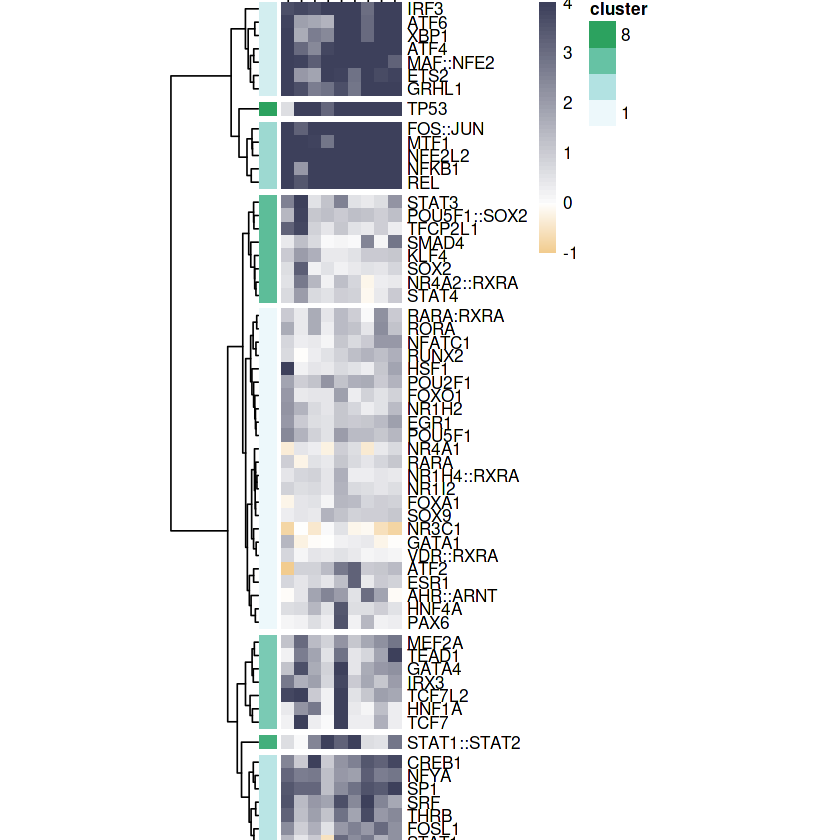

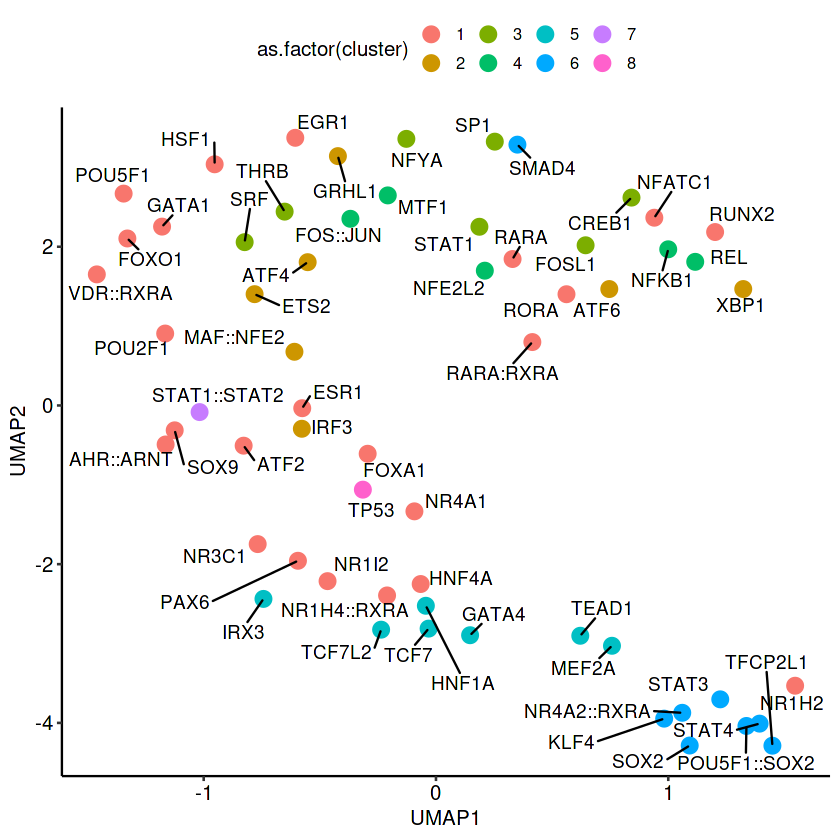

In [15]:
## Select set of best reporters
optimal_reporters <- cDNA_df_confidence2 %>%
  group_by(tf) %>%
  arrange(desc(conf_level), desc(quality_score)) %>%
  mutate(rank = row_number()) %>%
  filter(rank <= 3 & conf_level >= 2)

### Activity across the 9 cell types
heatmap_cell_activities <- cDNA_df %>%
  filter(reporter_id %in% optimal_reporters$reporter_id) %>%
  dplyr::filter(neg_ctrls == "No", 
                stimulation == "no",
                hPGK == "No", 
                str_detect(tf, "RANDOM", negate = T), 
                native_enhancer == "No") %>%
  distinct(tf, reporter_activity_minP, cell) %>%
  mutate(tf = gsub("_.*", "", tf)) %>%
  mutate(reporter_activity_minP = log2(ave(reporter_activity_minP, tf, cell, FUN = mean))) %>%
  distinct() %>%
  spread(key = "cell", value = "reporter_activity_minP") %>% 
  replace(is.na(.), 0) %>%
  column_to_rownames("tf")

myBreaks <- c(seq(-1, 0, length.out=50+1), 
              seq(0.000001, 4, length.out=50))

hc <- hclust(dist(heatmap_cell_activities), method = "ward.D2")
order_dendogram <- data.frame("order" = 1:nrow(heatmap_cell_activities),
                              "tf" = "")
cluster_tfs <- data.frame("cluster" = cutree(hc, k = 8)) %>%
  rownames_to_column("tf")

for(i in unique(order_dendogram$order)) {
  order_dendogram$tf[order_dendogram$order == i] <- rownames(heatmap_cell_activities[hc$order[i],])
}

cluster_tfs2 <- cluster_tfs %>%
  column_to_rownames("tf")

## Figure 6A: Activities of top 3 reporters per cell type
pheatmap(heatmap_cell_activities %>% 
           as.matrix(),
         color = colorRampPalette(c("#F2CC8F", "white", "#3D405B"))(100),
         clustering_method = "ward.D2",
         border_color = F, 
         cellwidth = 8, 
         cellheight = 8,
         angle_col = 90,
         cutree_rows = 8,
         annotation_row = cluster_tfs2,
         breaks = myBreaks)


### UMAP analysis
set.seed(54523) 
heatmap_cell_activities_cor <- cor(heatmap_cell_activities %>% t())
tf_umap <- umap(heatmap_cell_activities_cor) 
colnames(tf_umap$layout) <- c("A","B") 
tf_umap_plot <- tf_umap$layout %>% as.data.frame() %>% rownames_to_column(var = "tf") %>% left_join(cluster_tfs) #Import data from previous line

# Figure 6B: UMAP visualization of Figure 6A (export 7x7)
ggplot(tf_umap_plot,
       aes(A,B)) +
  #stat_density2d(geom = "polygon", aes(alpha = ..level..), bins = 8) +
  theme_pubr() + 
  geom_point(size = 4, aes(color = as.factor(cluster))) + 
  theme(panel.grid = element_blank()) + 
  scale_alpha(range = c(0.05,0.15)) +
  geom_text_repel(aes(label = tf), force = 60) + 
  ylab("UMAP2") + 
  xlab("UMAP1")

Conclusion: There are different clusters of TFs based on their activity patterns.

---
### Explore activities of optimal reporters upon KDs in HepG2
Aim: Based on the activity changes, are there any novel roles for TFs?

Joining, by = c("cell", "tf")


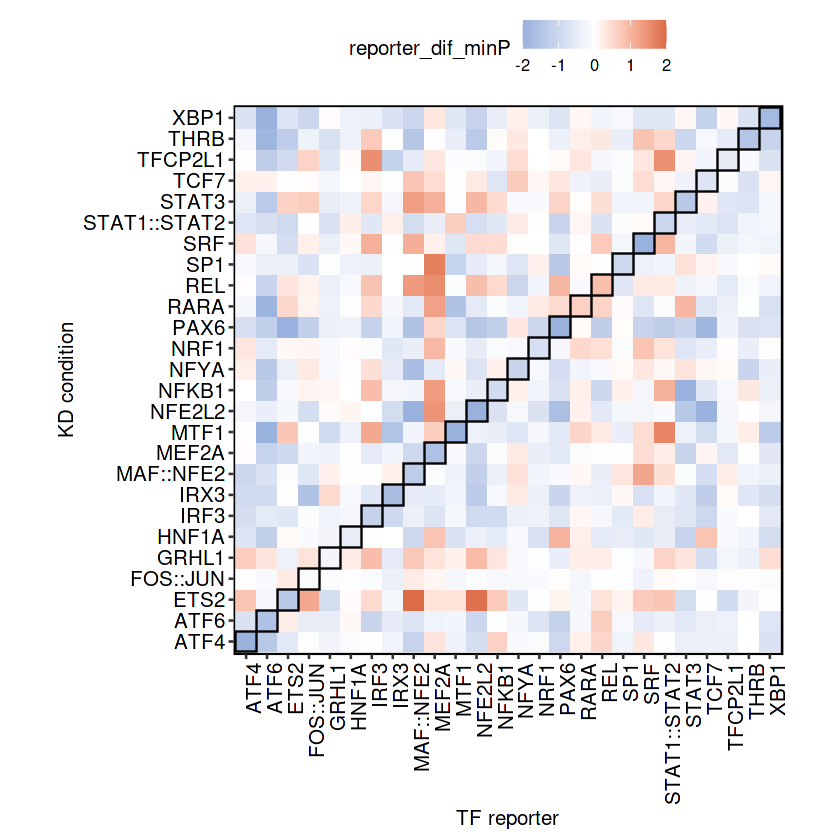

HTML widgets cannot be represented in plain text (need html)

Warning message:
“Using the `size` aesthetic in this geom was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` in the `default_aes` field and elsewhere instead.”


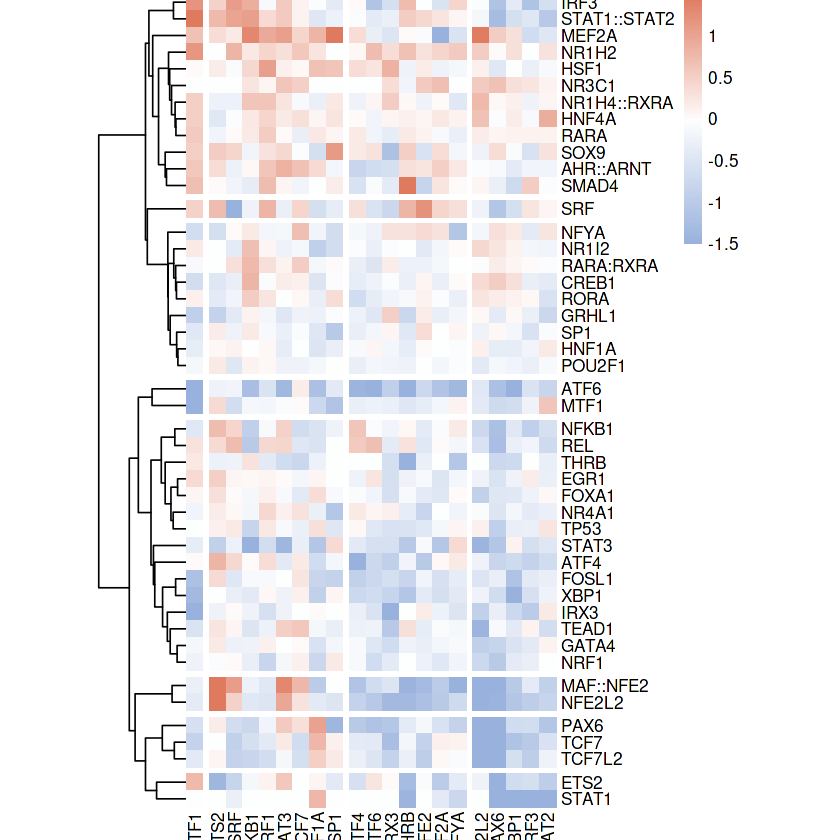

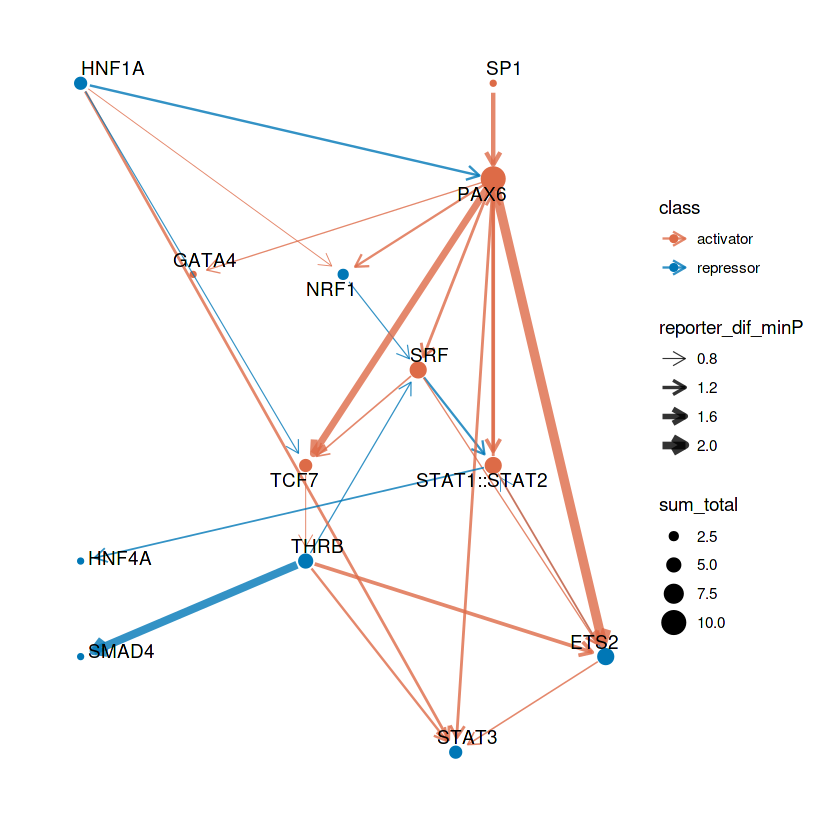

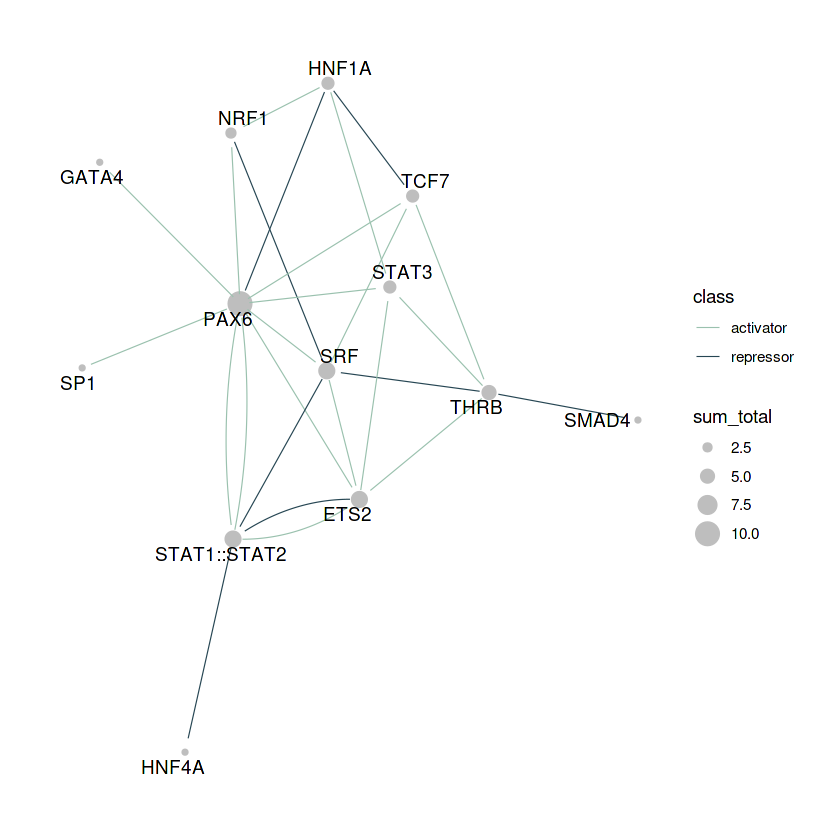

In [16]:
### Activities upon KD
optimal_reporters <- cDNA_df_confidence2 %>%
  group_by(tf) %>%
  arrange(desc(conf_level), desc(quality_score)) %>%
  mutate(rank = row_number()) %>%
  filter(rank <= 3 & conf_level >= 2 & tf != "RFX1" | (tf == "ATF6" & rank <= 3) | (tf == "NRF1" & rank <= 3))

cDNA_df2 <- cDNA_df %>%
  filter(reporter_id %in% optimal_reporters$reporter_id) %>%
  dplyr::filter(neg_ctrls == "No", 
                #commercial_reporter == "No", 
                hPGK == "No", 
                str_detect(tf, "RANDOM", negate = T), 
                native_enhancer == "No") %>%
  distinct(tf, condition, reporter_dif_minP, stimulation, cell) %>%
  mutate(tf = gsub("_.*", "", tf)) %>%
  distinct()

cDNA_df3 <- cDNA_df2 %>%
  filter(cell %in% c("HepG2")) %>%
  filter(stimulation == "KD", !tf %in% c("FOXO1", "ATF2")) %>%
  mutate(reporter_dif_minP = ave(reporter_dif_minP, tf, condition, FUN = mean)) #%>%
  #mutate(reporter_dif_minP = ifelse(abs(reporter_dif_minP) > 0.2, reporter_dif_minP, 0))

cDNA_df3[is.na(cDNA_df3)] <- 0

cDNA_df4 <- cDNA_df3 %>%
  distinct(tf, condition, reporter_dif_minP, cell) %>%
  mutate(condition = gsub("HepG2_", "", condition)) %>%
  filter(condition %in% tf) %>%
  filter(tf %in% condition) %>%
  mutate(diag = ifelse(tf == condition, T, F)) 

cDNA_df5 <- cDNA_df4 %>%
  filter(!condition %in% c("TP53"), !tf %in% c("TP53")) %>%
  arrange(diag)

cDNA_df5_eff_conditions <- cDNA_df5 %>%
  filter(diag == T & reporter_dif_minP < -.4)
 
ggplot(cDNA_df5,
       aes(x = tf, y = condition, fill = reporter_dif_minP)) +
  geom_tile(color = cDNA_df5$diag, size = .5) +
  scale_color_manual(values = c("black", "white")) +
  scale_fill_gradient2(low = "#99B2DD",
                        mid = "white",
                        high = "#dd6b48",
                       limits = c(-2,2),
                       oob = squish) +
  coord_fixed() +
  xlab("TF reporter") +
  ylab("KD condition") +
  theme_pubr(border = T, x.text.angle = 90) 

overview_effects <- cDNA_df3 %>%
  distinct(tf, condition, reporter_dif_minP, cell) %>%
  left_join(tf_rna) %>%
  filter(nTPM > 2 | tf == "MAF::NFE2") %>%
  distinct(tf, condition, reporter_dif_minP) %>%
  mutate(condition = gsub("HepG2_", "", condition)) %>%
  filter(condition %in% cDNA_df5_eff_conditions$condition) %>%
  filter(!condition %in% c("TFCP2L1"))

overview_effects2 <- overview_effects %>%
  pivot_wider(names_from = "condition", values_from = "reporter_dif_minP") %>%
  column_to_rownames("tf") %>%
  replace(is.na(.), 0)

myBreaks <- c(seq(-1.5, 0, length.out=50+1), 
              seq(0.000001, 1.5, length.out=50))

pheatmap(overview_effects2,
         color = colorRampPalette(c("#99B2DD", "white", "#E07A5F"))(100),
         clustering_method = "ward.D2",
         border_color = F, 
         cellwidth = 10, 
         cellheight = 10,
         angle_col = 90,
         cutree_cols = 4,
         cutree_rows = 8,
         breaks = myBreaks)


### Interaction analysis
threshold <- .75

interesting_tfs <- c("ETS2", "HNF1A", "NRF1", "PAX6", "SP1", "SRF", "STAT3", "TCF7", "STAT1::STAT2", "THRB", 
                     "GATA4", "SMAD4", "HNF4A", "NR1H4::RXRA")

interaction_df <- overview_effects %>%
  filter(condition %in% interesting_tfs, tf %in% interesting_tfs) %>%
  dplyr::select("receiver" = tf, "signal" = condition, reporter_dif_minP) %>%
  distinct() %>%
  mutate(TF_dif_binary = "0") %>%
  mutate(TF_dif_binary = ifelse(reporter_dif_minP > threshold, "-1", TF_dif_binary)) %>%
  mutate(TF_dif_binary = ifelse(reporter_dif_minP < -threshold, "1", TF_dif_binary)) %>%
  mutate(TF_dif_binary = ifelse(reporter_dif_minP > -threshold & reporter_dif_minP < threshold, "0", TF_dif_binary)) %>%
  mutate(TF_dif_binary = as.numeric(TF_dif_binary)) %>%
  mutate(TF_dif_binary = (ifelse(receiver == signal, 0, TF_dif_binary))) %>%
  mutate(sum_receiver = ave(TF_dif_binary, receiver, FUN = function(x) sum(x))) %>%
  mutate(sum_signal = ave(TF_dif_binary, signal, FUN = function(x) sum(x))) %>%
  mutate(sum_receiver_size = ave(TF_dif_binary, receiver, FUN = function(x) sum(abs(x)))) %>%
  mutate(sum_signal_size = ave(TF_dif_binary, signal, FUN = function(x) sum(abs(x))))

interaction_matrix <- interaction_df %>%
  distinct(TF_dif_binary, receiver, signal) %>%
  spread(key = "receiver", value = "TF_dif_binary") %>%
  column_to_rownames("signal")

interaction_nodes1 <- interaction_df %>%
  filter(signal == receiver) %>%
  distinct(receiver, signal, sum_signal, sum_receiver, sum_signal_size, sum_receiver_size) %>%
  mutate(sum_total = sum_receiver_size + sum_signal_size) %>%
  mutate(class = ifelse(sum_signal <= 0, "repressor", "activator")) %>%
  distinct(receiver, sum_total, class)

### Add only-signal
interaction_nodes2 <- interaction_df %>%
  filter(!signal %in% unique(interaction_nodes1$receiver)) %>%
  dplyr::select("receiver" = signal, "sum_total" = sum_signal_size, sum_signal) %>%
  mutate(class = ifelse(sum_signal <= 0, "repressor", "activator")) %>%
  dplyr::select(-sum_signal) %>%
  distinct()

### Add only-receiver
interaction_nodes3 <- interaction_df %>%
  filter(!receiver %in% unique(interaction_nodes1$receiver)) %>%
  dplyr::select(receiver, "sum_total" = sum_receiver_size, sum_receiver) %>%
  mutate(class = ifelse(sum_receiver <= 0, "repressor", "activator")) %>%
  dplyr::select(-sum_receiver) %>%
  distinct()

interaction_nodes <- rbind(interaction_nodes1, interaction_nodes2, interaction_nodes3)

# interaction_edges <- interaction_df %>%
#   left_join(target_tf %>% dplyr::select("signal" = condition, target)) %>%
#   filter(signal != receiver) %>%
#   distinct(receiver, signal, TF_dif_binary, TF_dif) %>%
#   mutate(weight = 0) %>%
#   mutate(weight = ifelse(TF_dif_binary == -1, 1, weight)) %>%
#   mutate(weight = ifelse(TF_dif_binary == 1, 2, weight)) %>%
#   mutate(class = ifelse(weight == 1, "repressor", "activator")) %>%
#   dplyr::select(signal, receiver, weight, class, TF_dif) %>%
#   filter(weight != 0) %>%
#   mutate(TF_dif = abs(TF_dif))

interaction_edges <- interaction_df %>%
  filter(receiver != signal) %>%
  distinct(receiver, signal, TF_dif_binary, reporter_dif_minP) %>%
  mutate(weight = 0) %>%
  mutate(weight = ifelse(TF_dif_binary == -1, 1, weight)) %>%
  mutate(weight = ifelse(TF_dif_binary == 1, 2, weight)) %>%
  mutate(class = ifelse(weight == 1, "repressor", "activator")) %>%
  dplyr::select(signal, receiver, weight, class, reporter_dif_minP) %>%
  filter(weight != 0) %>%
  mutate(reporter_dif_minP = abs(reporter_dif_minP))

interaction_nodes <- interaction_nodes %>%
  filter(receiver %in% c(unique(interaction_edges$receiver),unique(interaction_edges$signal)))

routes_igraph <- graph_from_data_frame(d = interaction_edges, vertices = interaction_nodes, directed = TRUE)

visIgraph(routes_igraph) %>%
    visNodes(size = 25, shape = "circle") %>%
    visOptions(highlightNearest = list(enabled = TRUE, hover = TRUE),
               nodesIdSelection = TRUE) %>%
    visInteraction(keyboard = TRUE)


ggraph(routes_igraph, layout = "sugiyama") +
  geom_node_point(aes(size = sum_total, color = class)) +
  geom_edge_link(aes(color = class, width = reporter_dif_minP),
                 alpha = 0.8,
                 arrow = arrow(length = unit(3, 'mm')),
                 start_cap = circle(2, 'mm'),
                 end_cap = circle(3, 'mm')) +
  scale_edge_width(range = c(0.2, 2)) +
  scale_radius(limits = c(1, NA), range = c(1, 6)) +
  geom_node_text(aes(label = name), repel = TRUE) +
  scale_edge_color_manual(values = c("activator" = "#DD6B47", "repressor" = "#0077B6")) +
  scale_color_manual(values = c("activator" = "#DD6B47", "repressor" = "#0077B6")) +
  theme_graph()

ggraph(routes_igraph, layout = "stress") +
  geom_node_point(aes(size = sum_total), color = "grey") +
  geom_edge_fan(aes(color = class), width = .25, start_cap = circle(2, 'mm'), end_cap = circle(3, 'mm')) +
  scale_radius(limits = c(1, NA), range = c(1, 6)) +
  geom_node_text(aes(label = name), repel = TRUE) +
  scale_edge_color_manual(values = c("activator" = colors_diverse[2], "repressor" = colors_diverse[1])) +
  scale_color_manual(values = c("activator" = colors_diverse[2], "repressor" = colors_diverse[1])) +
  theme_graph()

Conclusion: Interesting interactions

### Connect changes in TF activities upon HEPG2 KD to changes in RNA levels
Aim: Are reporter activities changing while TF levels are not?

New names:
• `` -> `...1`
Rows: 195484 Columns: 8
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (4): external_gene_id, sample, condition, replicate
dbl (4): ...1, TPM, TPM_fc, TPM_fc_mean

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Joining, by = c("condition", "tf")
Joining, by = "tf"
`geom_smooth()` using formula = 'y ~ x'


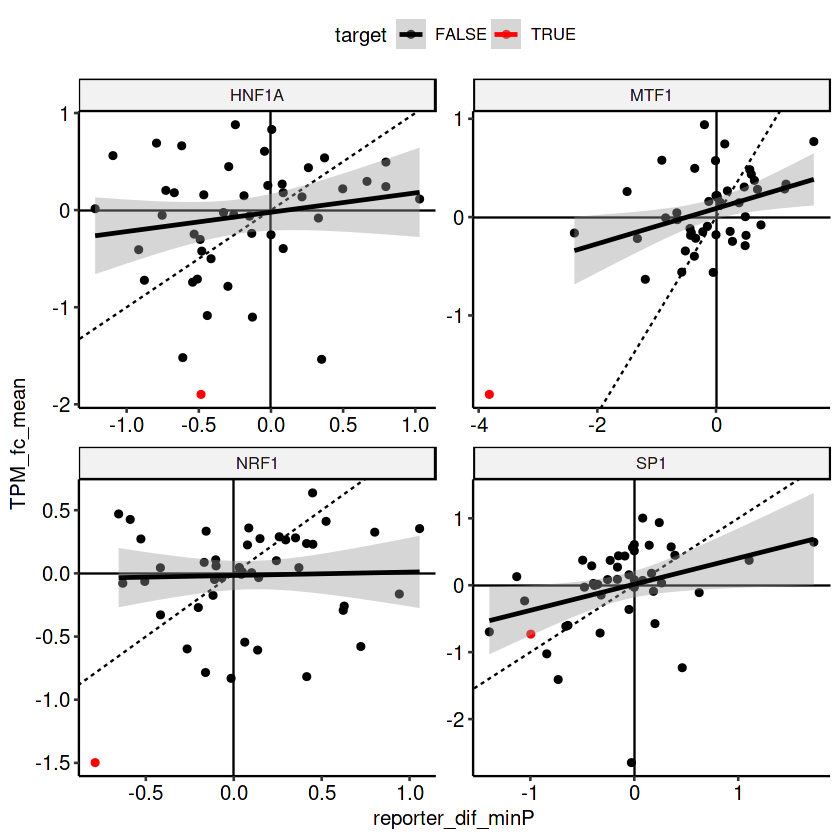

In [17]:
# Load RNA-seq data
KD_tf_changes <- read_csv("/DATA/usr/m.trauernicht/projects/SuRE-TF/data/gene_counts_tpm_KD.csv") %>%
  dplyr::select(condition, "tf" = external_gene_id, TPM_fc_mean) %>%
  distinct() %>%
  mutate(tf = ifelse(tf == "AHR", "AHR::ARNT", tf)) %>%
  mutate(tf = ifelse(tf == "NR1H4", "NR1H4::RXRA", tf)) %>%
  mutate(tf = ifelse(tf == "STAT1", "STAT1::STAT2", tf)) %>%
  mutate(tf = ifelse(tf == "FOS", "FOS::JUN", tf)) %>%
  filter(condition != "NT")

overview_effects_KD <- cDNA_df3 %>%
  distinct(condition, tf, reporter_dif_minP) %>%
  mutate(condition = gsub(".*_", "", condition)) %>%
  filter(condition %in% c("SP1", "NRF1", "HNF1A", "MTF1")) %>%
  left_join(KD_tf_changes) %>%
  left_join(tf_rna %>% filter(cell == "HepG2") %>% distinct(tf, nTPM)) %>%
  filter(nTPM > 1 | tf %in% c("SP1", "NRF1", "HNF1A", "MTF1")) %>%
  na.omit() %>%
  mutate(TPM_fc_mean = log2(TPM_fc_mean)) %>%
  mutate(target = ifelse(tf == condition, T, F))

ggplot(overview_effects_KD, aes(y = TPM_fc_mean, x = reporter_dif_minP, color = target)) +
  geom_abline(lty = 2) +
  geom_hline(yintercept = 0, lty = 1) +
  geom_vline(xintercept = 0, lty = 1) +
  geom_point() +
  geom_smooth(method = "lm") +
  facet_wrap(~condition, scales = "free") +
  scale_color_manual(values = c("TRUE" = "red", "FALSE" = "black")) +
  theme_pubr()

Conclusion: Yes, some TFs change reporter activity, but not TF levels - follow up on these?

### Explore activities of optimal reporters in a set of mES perturbation conditions
Aim: Show interactions between TF upon pluripotency-challenging perturbations

Joining, by = c("cell", "tf")


Joining, by = "condition"


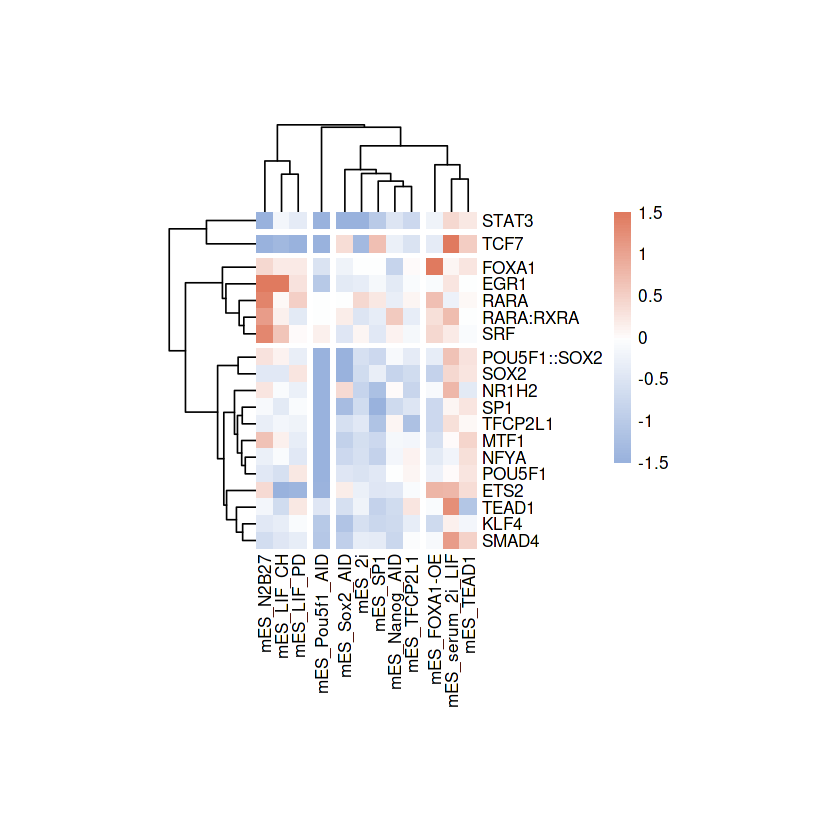

Joining, by = "tf"


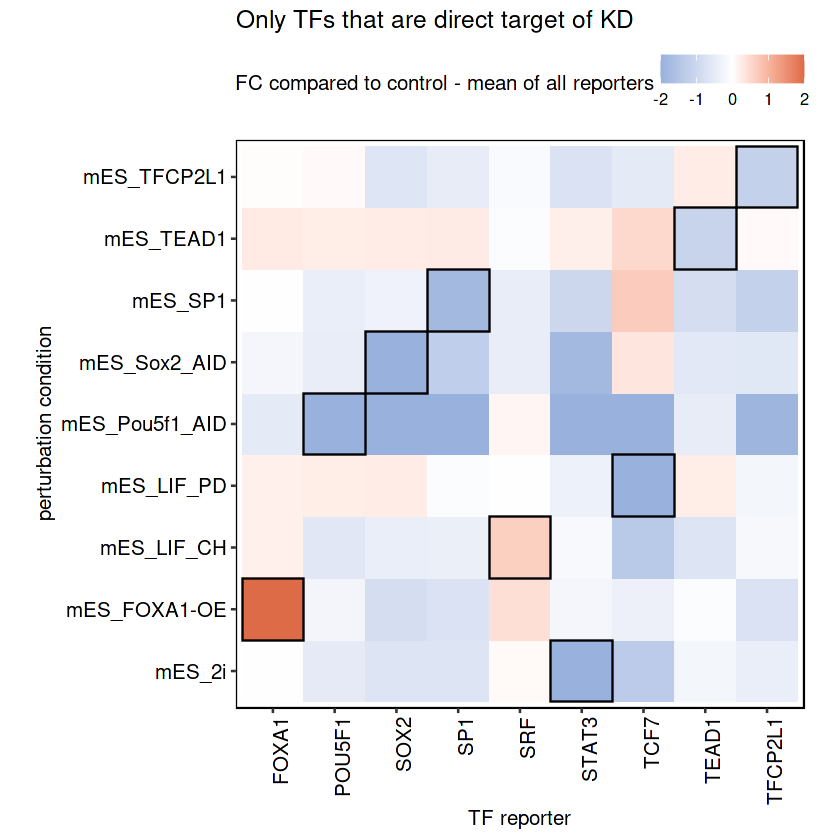

Joining, by = "tf"


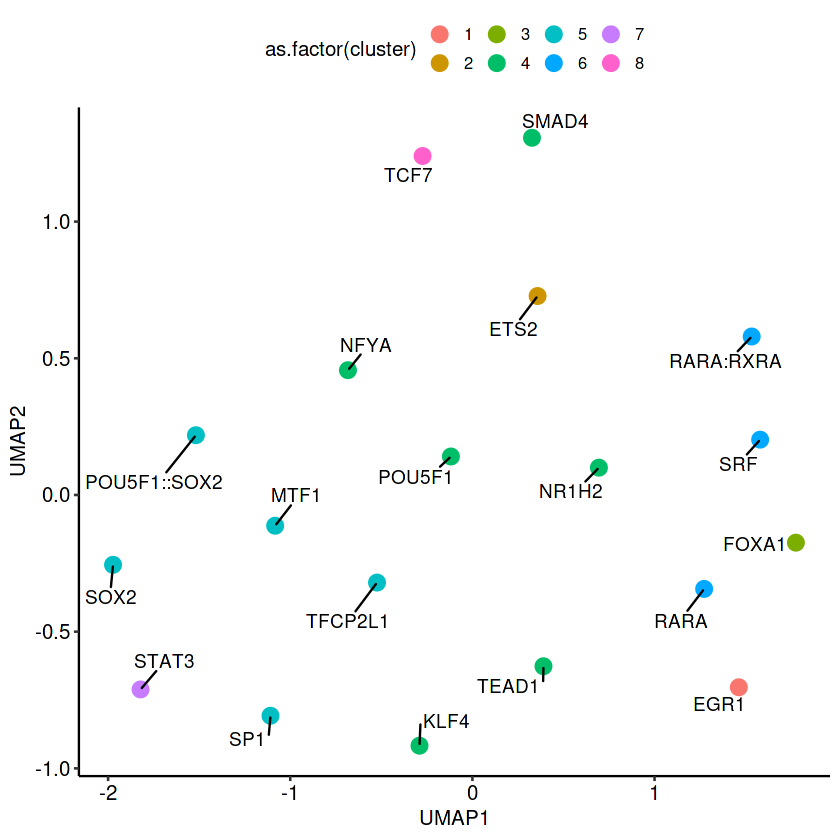

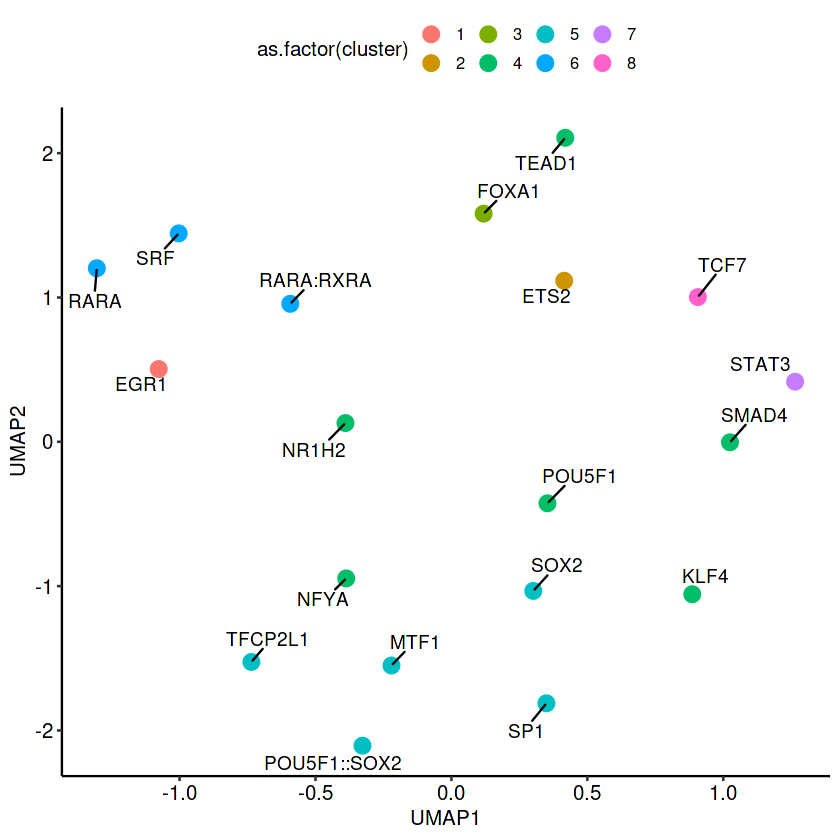

Joining, by = "condition"


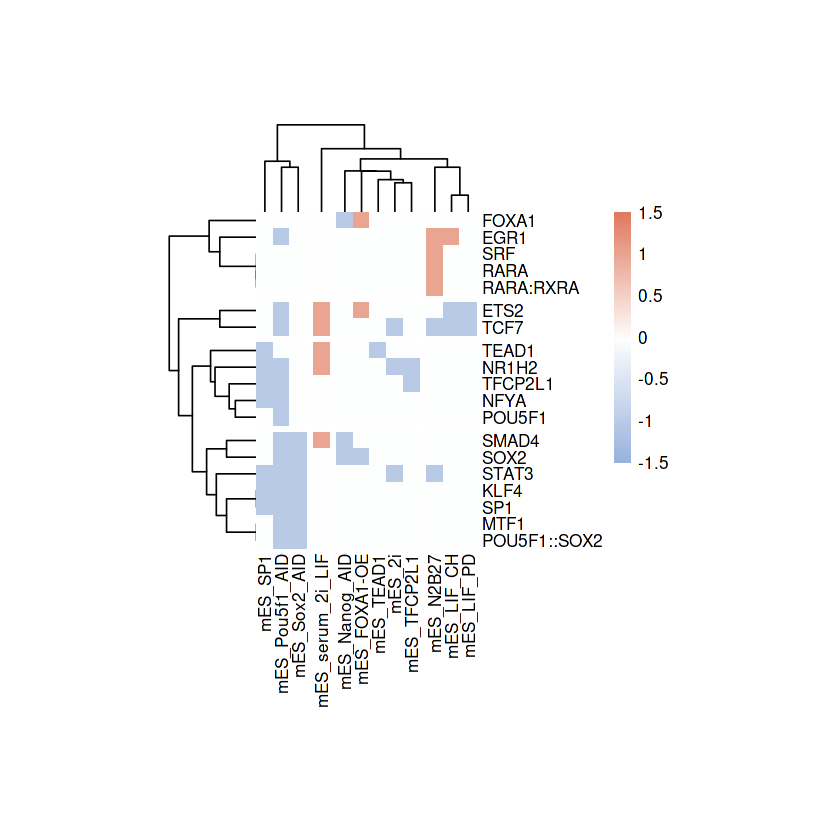

Joining, by = "signal"


HTML widgets cannot be represented in plain text (need html)

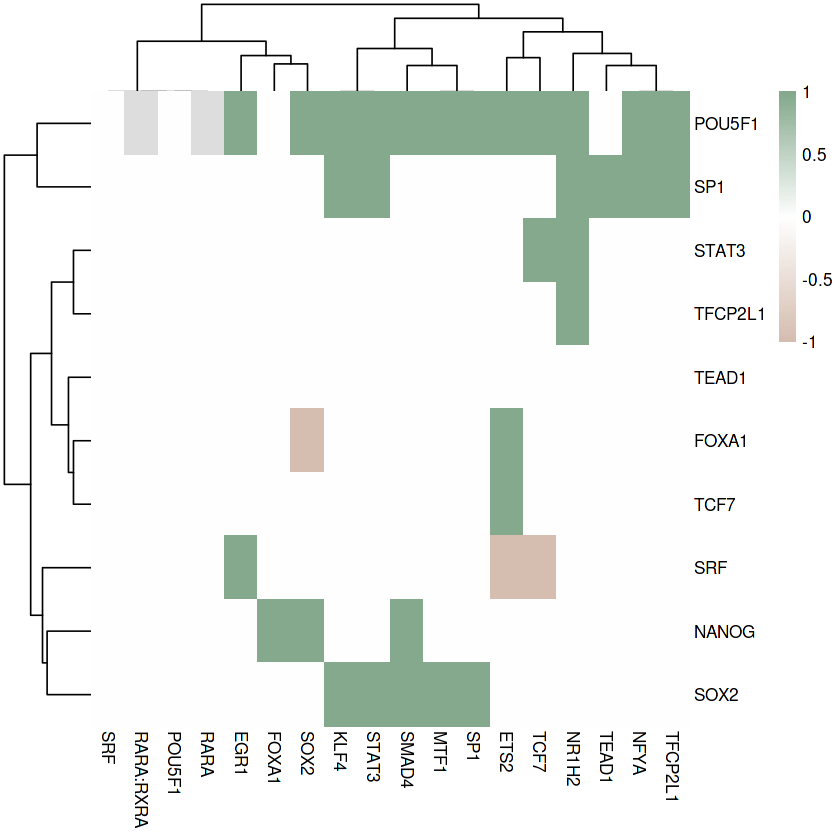

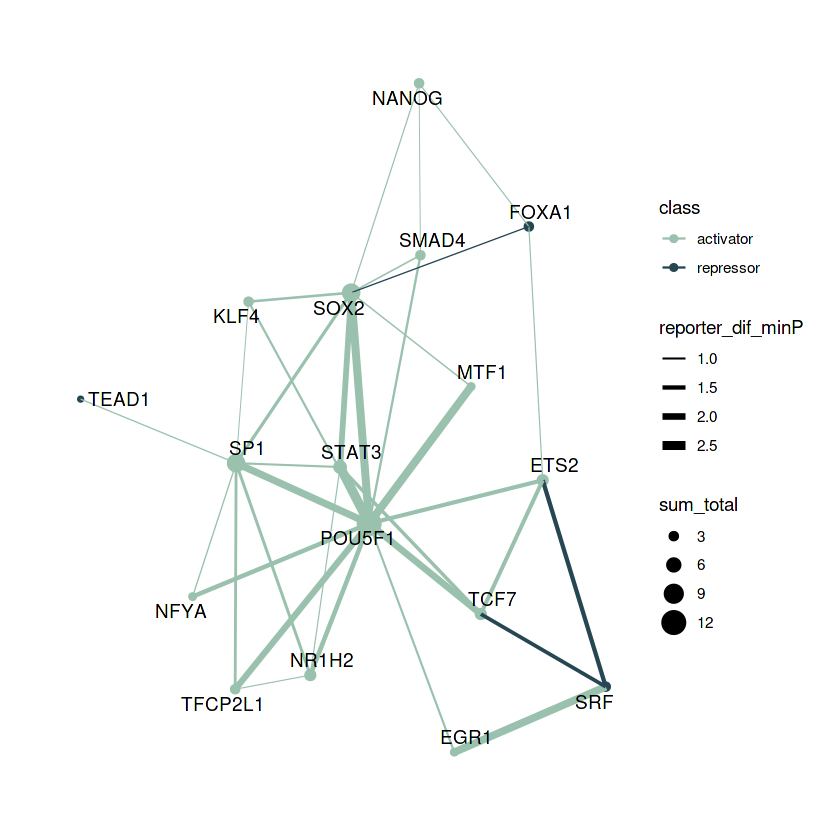

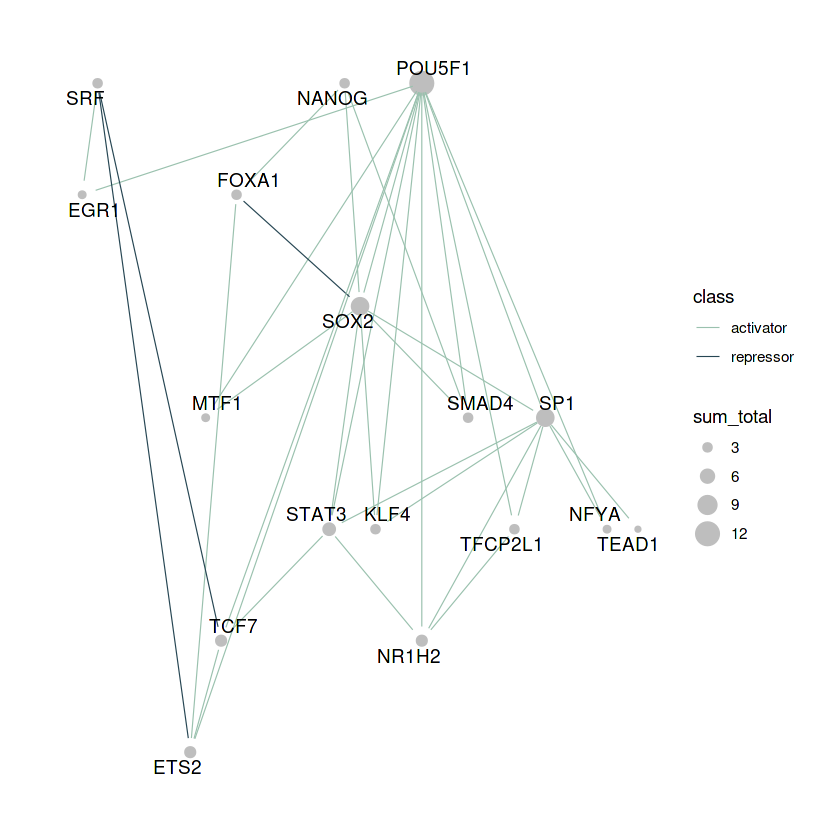

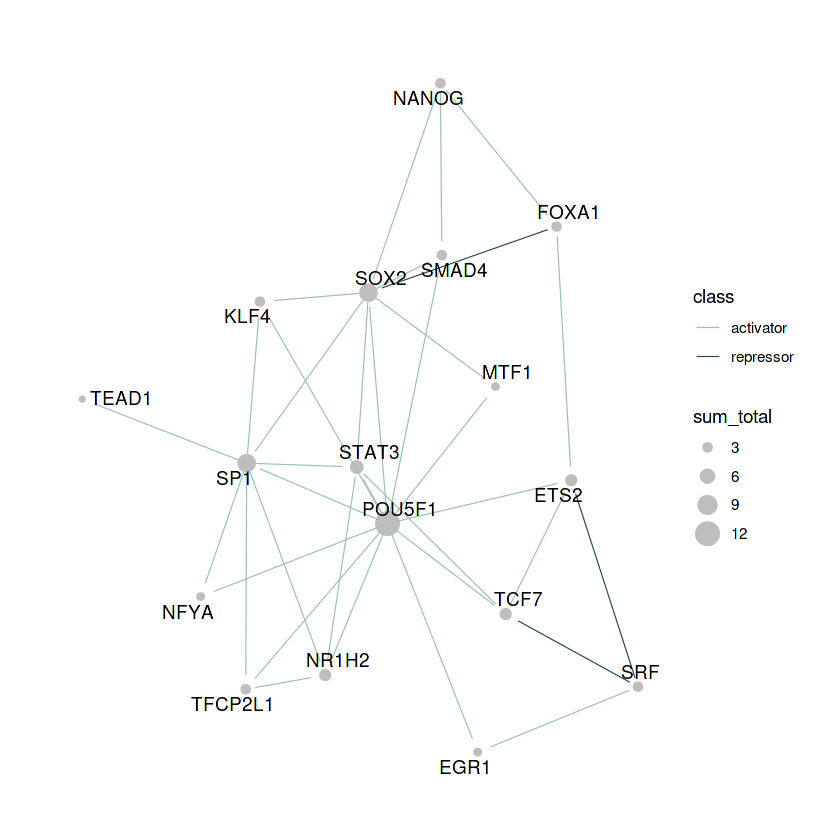

In [19]:
optimal_reporters <- cDNA_df_confidence2 %>%
  group_by(tf) %>%
  arrange(desc(conf_level), desc(quality_score)) %>%
  mutate(rank = row_number()) %>%
  filter(rank <= 3 & conf_level >= 2 & tf != "RFX1")

cDNA_df2 <- cDNA_df %>%
  filter(reporter_id %in% optimal_reporters$reporter_id) %>%
  dplyr::filter(neg_ctrls == "No", 
                #commercial_reporter == "No", 
                hPGK == "No", 
                str_detect(tf, "RANDOM", negate = T), 
                native_enhancer == "No") %>%
  distinct(tf, condition, reporter_dif_minP, stimulation, cell) %>%
  mutate(tf = gsub("_.*", "", tf)) %>%
  mutate(reporter_dif_minP = ave(reporter_dif_minP, tf, condition, FUN = function(x) mean(x))) %>%
  distinct()

# All mES perturbations: KDs, overexpressions, stimulations, degron
cDNA_df2_mES <- cDNA_df2 %>%
  filter(cell == "mES", stimulation != "no")

cDNA_df2_mES2_filt <- cDNA_df2_mES %>%
  left_join(tf_rna) %>%
  filter((nTPM > 10 & !tf %in% c("TP53", "ATF4", "NFKB1", "ATF2", "IRF3", "NFE2L2"))
         | tf %in% c("EGR1", "FOXA1") 
         ) %>%
  dplyr::select(-TPM, -TPM_norm, -nTPM, -cell, -stimulation)

### Remove conditions that don't seem to induce any changes
cDNA_df2_mES2_filt2 <- cDNA_df2_mES2_filt %>%
  mutate(reporter_dif_max = ave(reporter_dif_minP, condition, FUN = function(x) max(x, na.rm = T))) %>%
  mutate(reporter_dif_min = ave(reporter_dif_minP, condition, FUN = function(x) min(x, na.rm = T))) %>%
  filter(reporter_dif_max > .75 | reporter_dif_min < -.75) %>%
  filter(!condition %in% c("mES_KLF9", "mES_GRHL1", "mES_HSF1", "mES_CREB1", "mES_RXRA", "mES_KLF4", "mES_SOX9",
                            "mES_TEAD2", "mES_POU2F1", "mES_MEF2B", "mES_TCF7", "mES_SOX2", "mES_RFX1-OE", "mES_GATA1-OE", 
                            "mES_OTX2-OE", "mES_EGR1", "mES_MEF2A",
                           "mES_NFIA", "mES_SOX13", "mES_E2F1", "mES_HSF2", "mES_TCF7L1", 
                           "mES_BX", "mES_MEF2A", "mES_PPARG::RXRA", "mES_HIC2", "mES_PPARA::RXRA", "mES_EGR1",
                           "mES_HQ", "mES_GLI1-OE", "mES_FOSL1-OE", "mES_ATF2", "mES_NR4A2-OE-cDIM12",
                           "mES_Nutlin", "mES_IWP2", "mES_TCF7L2", "mES_Dox", "mES_FOS::JUN",
                           "mES_POU5F1","mES_vitC", "mES_FK", "mES_NR1H2"))

cDNA_df2_mES2_heatmap <- cDNA_df2_mES2_filt %>%
  filter(condition %in% cDNA_df2_mES2_filt2$condition) %>%
  mutate(max_reporter_dif = ave(reporter_dif_minP, tf, FUN = function (x) max(abs(x), na.rm = T))) %>%
  filter(max_reporter_dif > 0.9412283) %>%
  dplyr::select(-max_reporter_dif) %>%
  distinct() %>%
  pivot_wider(names_from = "condition", values_from = "reporter_dif_minP") %>%
  replace(is.na(.), 0) %>%
  column_to_rownames("tf") 

myBreaks <- c(seq(-1.5, 0, length.out=50+1), 
              seq(0.000001, 1.5, length.out=50))

pheatmap(cDNA_df2_mES2_heatmap,
         color = colorRampPalette(c("#99B2DD", "white", "#E07A5F"))(100),
         clustering_method = "ward.D2",
         border_color = F, 
         cellwidth = 10, 
         cellheight = 10,
         #annotation_col = tf_clusters, 
         angle_col = 90,
         cutree_cols = 4,
         cutree_rows = 4,
         breaks = myBreaks)

target_tf <- data.frame("condition" = c("mES_2i", "mES_FOXA1-OE", "mES_LIF_CH", "mES_LIF_PD", "mES_Pou5f1_AID", 
                                            "mES_Sox2_AID", "mES_SP1", "mES_TEAD1", "mES_TFCP2L1", "mES_Nanog_AID"),
                        "target" = c("STAT3","FOXA1", "SRF", "TCF7", "POU5F1", "SOX2", "SP1", "TEAD1", "TFCP2L1", "NANOG"),
                        "effect_size" = c(0, 1, 1, 0, 0, 0, 0, 0, 0, 0))


cDNA_df4 <- cDNA_df2_mES2_filt %>%
  filter(condition %in% cDNA_df2_mES2_filt2$condition) %>%
  left_join(target_tf) %>%
  distinct(tf, condition, reporter_dif_minP, target) %>%
  filter(target %in% tf) %>%
  filter(tf %in% target) %>%
  mutate(diag = ifelse(tf == target, T, F)) %>%
  arrange(diag)

ggplot(cDNA_df4,
       aes(x = tf, y = condition, fill = reporter_dif_minP)) +
  geom_tile(color = cDNA_df4$diag, size = .5) +
  scale_color_manual(values = c("black", "white")) +
  scale_fill_gradient2(low = "#99B2DD",
                        mid = "white",
                        high = "#dd6b48",
                       limits = c(-2,2),
                       oob = squish) +
  coord_fixed() +
  xlab("TF reporter") +
  ylab("perturbation condition") +
  ggtitle("Only TFs that are direct target of KD") +
  theme_pubr(border = T, x.text.angle = 90) +
  labs(fill="FC compared to control - mean of all reporters")

## UMAP visualization
set.seed(124) 
tf_umap <- umap(cDNA_df2_mES2_heatmap) 
colnames(tf_umap$layout) <- c("A","B") 

### Extract clustering data
hc <- hclust(dist(cDNA_df2_mES2_heatmap), method = "complete")
cluster_tfs <- data.frame("cluster" = cutree(hc, k = 8)) %>%
  rownames_to_column("tf")
tf_umap_plot <- tf_umap$layout %>% as.data.frame() %>% rownames_to_column(var = "tf") %>% left_join(cluster_tfs) #Import data from previous line

#Plot with umap with 4-node cliques
ggplot(tf_umap_plot,
       aes(A,B)) +
  #stat_density2d(geom = "polygon", aes(alpha = ..level..), bins = 8) +
  theme_pubr() + 
  geom_point(size = 4, aes(color = as.factor(cluster))) + 
  theme(panel.grid = element_blank()) + 
  scale_alpha(range = c(0.15,0.3)) +
  geom_text_repel(aes(label = tf), force = 40) + 
  ylab("UMAP2") + 
  xlab("UMAP1")

## UMAP based on correlation matrix
cDNA_df2_mES2_cor <- cor(cDNA_df2_mES2_heatmap %>% t())

tf_umap <- umap(cDNA_df2_mES2_cor) 
colnames(tf_umap$layout) <- c("A","B") 

### Extract clustering data
hc <- hclust(dist(cDNA_df2_mES2_heatmap), method = "complete")
cluster_tfs <- data.frame("cluster" = cutree(hc, k = 8)) %>%
  rownames_to_column("tf")
tf_umap_plot <- tf_umap$layout %>% as.data.frame() %>% rownames_to_column(var = "tf") %>% left_join(cluster_tfs) #Import data from previous line

#Plot with umap with 4-node cliques
ggplot(tf_umap_plot,
       aes(A,B)) +
  #stat_density2d(geom = "polygon", aes(alpha = ..level..), bins = 8) +
  theme_pubr() + 
  geom_point(size = 4, aes(color = as.factor(cluster))) + 
  theme(panel.grid = element_blank()) + 
  scale_alpha(range = c(0.15,0.3)) +
  geom_text_repel(aes(label = tf), force = 40) + 
  ylab("UMAP2") + 
  xlab("UMAP1")

  threshold <- .75

## Generate a binary heatmap, all values below absolute threshold should be 0, all other should be set to 1 or -1
cDNA_df2_mES2_heatmap_bin <- cDNA_df2_mES2_heatmap %>%
  mutate_all(~ifelse(abs(.) < threshold, 0, .)) %>%
  mutate_all(~ifelse(. < -threshold, -1, .)) %>%
  mutate_all(~ifelse(. > threshold, 1, .))

pheatmap(cDNA_df2_mES2_heatmap_bin,
         color = colorRampPalette(c("#99B2DD", "white", "#E07A5F"))(100),
         clustering_method = "ward.D2",
         border_color = F, 
         cellwidth = 10, 
         cellheight = 10,
         #annotation_col = tf_clusters, 
         angle_col = 90,
         cutree_cols = 4,
         cutree_rows = 4,
         breaks = myBreaks)

cDNA_df4 <- cDNA_df2_mES2_filt %>%
  filter(condition %in% cDNA_df2_mES2_filt2$condition) %>%
  filter(tf %in% c(rownames(cDNA_df2_mES2_heatmap), "NANOG")) %>%
  filter(tf != "POU5F1::SOX2") %>%
  left_join(target_tf) %>%
  na.omit() %>%
  distinct(tf, condition, reporter_dif_minP, target, effect_size) %>%
  mutate(reporter_dif_minP = ifelse(effect_size == 1, -reporter_dif_minP, reporter_dif_minP))
  # filter(target %in% tf) %>%
  # filter(tf %in% target) %>%
  # mutate(diag = ifelse(tf == target, T, F)) %>%
  # arrange(diag)

interaction_df <- cDNA_df4 %>%
  dplyr::select("receiver" = tf, "signal" = target, reporter_dif_minP) %>%
  distinct() %>%
  mutate(TF_dif_binary = "0") %>%
  mutate(TF_dif_binary = ifelse(reporter_dif_minP > threshold, "-1", TF_dif_binary)) %>%
  mutate(TF_dif_binary = ifelse(reporter_dif_minP < -threshold, "1", TF_dif_binary)) %>%
  mutate(TF_dif_binary = ifelse(reporter_dif_minP > -threshold & reporter_dif_minP < threshold, "0", TF_dif_binary)) %>%
  mutate(TF_dif_binary = as.numeric(TF_dif_binary)) %>%
  mutate(TF_dif_binary = (ifelse(receiver == signal, 0, TF_dif_binary))) %>%
  mutate(sum_receiver = ave(TF_dif_binary, receiver, FUN = function(x) sum(x))) %>%
  mutate(sum_signal = ave(TF_dif_binary, signal, FUN = function(x) sum(x))) %>%
  mutate(sum_receiver_size = ave(TF_dif_binary, receiver, FUN = function(x) sum(abs(x)))) %>%
  mutate(sum_signal_size = ave(TF_dif_binary, signal, FUN = function(x) sum(abs(x))))


interaction_matrix <- interaction_df %>%
  distinct(TF_dif_binary, receiver, signal) %>%
  spread(key = "receiver", value = "TF_dif_binary") %>%
  column_to_rownames("signal")

pheatmap(interaction_matrix,
         border_color = NA,
         color = colorRampPalette(c("#d5bdaf", 'white', "#84a98c"))(100),
         clustering_method = "ward.D")


###
interaction_nodes1 <- interaction_df %>%
  filter(signal == receiver) %>%
  distinct(receiver, signal, sum_signal, sum_receiver, sum_signal_size, sum_receiver_size) %>%
  mutate(sum_total = sum_receiver_size + sum_signal_size) %>%
  mutate(class = ifelse(sum_signal <= 0, "repressor", "activator")) %>%
  distinct(receiver, sum_total, class)

### Add only-signal
interaction_nodes2 <- interaction_df %>%
  filter(!signal %in% unique(interaction_nodes1$receiver)) %>%
  dplyr::select("receiver" = signal, "sum_total" = sum_signal_size, sum_signal) %>%
  mutate(class = ifelse(sum_signal <= 0, "repressor", "activator")) %>%
  dplyr::select(-sum_signal) %>%
  distinct()

### Add only-receiver
interaction_nodes3 <- interaction_df %>%
  filter(!receiver %in% unique(interaction_nodes1$receiver)) %>%
  dplyr::select(receiver, "sum_total" = sum_receiver_size, sum_receiver) %>%
  mutate(class = ifelse(sum_receiver <= 0, "repressor", "activator")) %>%
  dplyr::select(-sum_receiver) %>%
  distinct()

interaction_nodes <- rbind(interaction_nodes1, interaction_nodes2, interaction_nodes3)

interaction_edges <- interaction_df %>%
  left_join(target_tf %>% dplyr::select("signal" = condition, target)) %>%
  filter(signal != receiver) %>%
  distinct(receiver, signal, TF_dif_binary, reporter_dif_minP) %>%
  mutate(weight = 0) %>%
  mutate(weight = ifelse(TF_dif_binary == -1, 1, weight)) %>%
  mutate(weight = ifelse(TF_dif_binary == 1, 2, weight)) %>%
  mutate(class = ifelse(weight == 1, "repressor", "activator")) %>%
  dplyr::select(signal, receiver, weight, class, reporter_dif_minP) %>%
  filter(weight != 0) %>%
  mutate(reporter_dif_minP = abs(reporter_dif_minP)) #%>%
  #mutate(signal = gsub("POU5F1::SOX2", "POU5F1", signal)) %>%
  #mutate(receiver = gsub("POU5F1::SOX2", "POU5F1", receiver))

interaction_edges <- interaction_edges #%>%
  #filter(!(signal == "POU5F1::SOX2" & receiver == "SOX2")) %>% ## Remove interactions caused by off-target
  #filter(!(signal == "SOX2" & receiver == "POU5F1::SOX2")) 

interaction_nodes <- interaction_nodes %>%
  #mutate(receiver = gsub("POU5F1::SOX2", "POU5F1", receiver)) %>%
  filter(receiver %in% c(unique(interaction_edges$receiver),unique(interaction_edges$signal)))

interaction_nodes <- interaction_nodes %>%
  mutate(color = ifelse(class == "repressor", "grey90", "#9AC1AE"))

interaction_edges <- interaction_edges %>%
  mutate(color = ifelse(class == "repressor", "grey90", "#9AC1AE"))

routes_igraph <- graph_from_data_frame(d = interaction_edges, vertices = interaction_nodes, directed = TRUE)

visIgraph(routes_igraph) %>%
    visNodes(size = 25, shape = "circle") %>%
    visOptions(highlightNearest = list(enabled = TRUE, hover = TRUE),
               nodesIdSelection = TRUE) %>%
    visInteraction(keyboard = TRUE)

ggraph(routes_igraph, layout = "stress") +
  geom_node_point(aes(size = sum_total, color = class)) +
  geom_edge_fan(aes(color = class, width = reporter_dif_minP)) +
  scale_edge_width(range = c(0.2, 2)) +
  scale_radius(limits = c(1, NA), range = c(1, 6)) +
  geom_node_text(aes(label = name), repel = TRUE) +
  scale_edge_color_manual(values = c("activator" = colors_diverse[2], "repressor" = colors_diverse[1])) +
  scale_color_manual(values = c("activator" = colors_diverse[2], "repressor" = colors_diverse[1])) +
  theme_graph()

ggraph(routes_igraph, layout = "sugiyama") +
  geom_node_point(aes(size = sum_total), color = "grey") +
  geom_edge_fan(aes(color = class), width = .25, start_cap = circle(2, 'mm'), end_cap = circle(3, 'mm')) +
  scale_radius(limits = c(1, NA), range = c(1, 6)) +
  geom_node_text(aes(label = name), repel = TRUE) +
  scale_edge_color_manual(values = c("activator" = colors_diverse[2], "repressor" = colors_diverse[1])) +
  scale_color_manual(values = c("activator" = colors_diverse[2], "repressor" = colors_diverse[1])) +
  theme_graph()

ggraph(routes_igraph, layout = "stress") +
  geom_node_point(aes(size = sum_total), color = "grey") +
  geom_edge_fan(aes(color = class), width = .25, start_cap = circle(2, 'mm'), end_cap = circle(3, 'mm')) +
  scale_radius(limits = c(1, NA), range = c(1, 6)) +
  geom_node_text(aes(label = name), repel = TRUE) +
  scale_edge_color_manual(values = c("activator" = colors_diverse[2], "repressor" = colors_diverse[1])) +
  scale_color_manual(values = c("activator" = colors_diverse[2], "repressor" = colors_diverse[1])) +
  theme_graph()

Conclusion: Interesting interactions between TFs.

### Compare changes in reporter activity upon SOX2 degradation to changes in TF abundance
Aim: Are there any TFs that change reporter activity but not TF levels?

Loading required package: GenomicRanges

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following object is masked from ‘package:randomForest’:

    combine


The following object is masked from ‘package:pROC’:

    var


The following object is masked from ‘package:gridExtra’:

    combine


The following objects are masked from ‘package:igraph’:

    normalize, path, union


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame,

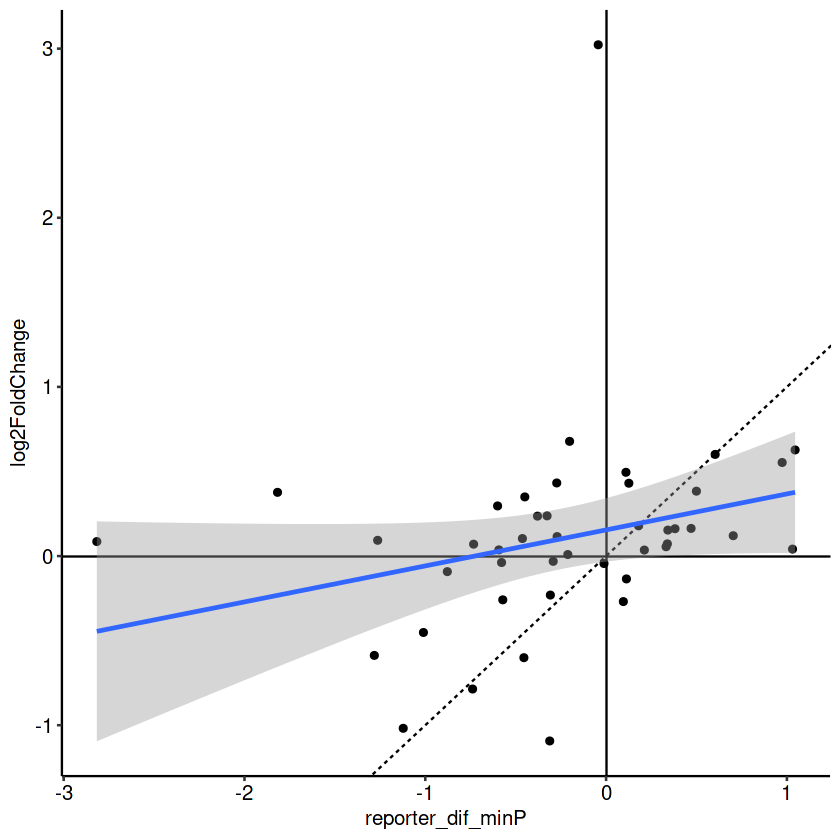

In [20]:
# Load degron TT-seq data
sox2_degr <- readRDS("/DATA/usr/m.trauernicht/projects/SuRE-TF/data/DE_SOX2_degron.rds")

# extract genes
genes_sox2 <- as.data.frame(sox2_degr$rowRanges@elementMetadata)

# Filter for only genes
genes_sox2_filt <- genes_sox2 %>%
  filter(anno == "Single Gene") %>%
  dplyr::select(feat_id, "gene" = symbol) %>%
  mutate(gene = toupper(gene))

# differential expression at 6H
sox2_degr_6 <- as.data.frame(sox2_degr$`6h`) %>%
  rownames_to_column("feat_id") %>%
  left_join(genes_sox2_filt) %>%
  filter(!is.na(gene)) %>%
  distinct(log2FoldChange, gene) %>%
  mutate(gene = ifelse(gene == "NR4A2", "NR4A2::RXRA", gene)) %>%
  mutate(gene = ifelse(gene == "AHR", "AHR::ARNT", gene)) %>%
  mutate(gene = ifelse(gene == "FOS", "FOS::JUN", gene)) %>%
  mutate(gene = ifelse(gene == "NFE2", "MAF::NFE2", gene)) %>%
  mutate(gene = ifelse(gene == "NR1H4", "NR1H4::RXRA", gene)) %>%
  mutate(gene = ifelse(gene == "TRP53", "TP53", gene))
  
# Load TF reporter data
cDNA_df2_mES_sox2 <- cDNA_df2_mES %>%
  filter(condition == "mES_Sox2_AID") %>%
  dplyr::select("gene" = tf, reporter_dif_minP) %>%
  left_join(sox2_degr_6)
  
# Plot correlation
ggplot(cDNA_df2_mES_sox2, aes(y = log2FoldChange, x = reporter_dif_minP)) +
  geom_abline(lty = 2) +
  geom_hline(yintercept = 0, lty = 1) +
  geom_vline(xintercept = 0, lty = 1) +
  geom_point() +
  geom_smooth(method = "lm") +
  theme_pubr()